In [1]:
import itertools
import os
import csv
import pandas as pd
import time
import datetime
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.cm as cmp
#from datetime import datetime
from IPython.display import display
%matplotlib inline
import sys
import seaborn as sns


# import plotly.plotly as py
from plotly.graph_objs import *
import plotly
# import plotly.tools as tls
import plotly.graph_objs as go
from plotly.offline import iplot, init_notebook_mode

from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA as sklearnPCA
from sklearn.linear_model import LinearRegression as sklearnLinReg
from sklearn.model_selection import train_test_split
plotly.offline.init_notebook_mode(connected=True)


sys.version

'3.6.3 |Anaconda, Inc.| (default, Oct 15 2017, 03:27:45) [MSC v.1900 64 bit (AMD64)]'

In [2]:
# file_train = './/Data//train.csv'
# chunksize = 100
# df_train = pd.read_csv(file_train, chunksize=chunksize)
# print(df_train.get_chunk().head())
# df_train = df_train.get_chunk()

In [3]:
# chunksize = 10
# for chunk in pd.read_csv(file_train, chunksize=chunksize):
#     print(chunk)
#     test = pd.merge(chunk, df_stores,on = 'store_nbr')
    
#     asd=1/0

In [2]:
def get_row_count(filename):
    with open(filename) as in_file:
        return sum(1 for _ in in_file)

In [3]:
# big_file_rowcount = row_count(file_train)
# print(big_file_rowcount)

In [4]:
fpath = './/Data//stores.csv'
df_stores = pd.read_csv(fpath)
fpath = './/Data//items.csv'
df_items = pd.read_csv(fpath)
fpath = './/Data//transactions.csv'
df_transactions = pd.read_csv(fpath)

fpath = './/Data//oil.csv'
df_oil = pd.read_csv(fpath)

fpath = './/Data//holidays_events.csv'
df_holidays_events = pd.read_csv(fpath)

# fpath = './/Data//stores.csv'
# df_stores = pd.read_csv(fpath)


In [5]:
df_stores.groupby(['cluster', 'type', 'state']).count()

store_nbr  city
cluster type state                                          
1       D    Guayas                                  2     2
             Santa Elena                             1     1
2       D    Azuay                                   2     2
3       C    El Oro                                  1     1
             Guayas                                  3     3
             Los Rios                                1     1
             Manabi                                  1     1
             Santo Domingo de los Tsachilas          1     1
4       D    El Oro                                  1     1
             Loja                                    1     1
             Santo Domingo de los Tsachilas          1     1
5       A    Pichincha                               1     1
6       B    Azuay                                   1     1
             Guayas                                  1     1
             Pichincha                               3     3
             Santo Domingo de los Tsachilas          1     1
7       C    Chimborazo                              1     1
             Pastaza                                 1     1
8       D    Pichincha                               3     3
9       D    Pichincha                               1     1
             Tungurahua                              1     1
10      B    Los Rios                                1     1
        D    Guayas                                  1     1
        E    Esmeraldas                              1     1
             Guayas                                  3     3
11      A    Manabi                                  1     1
             Pichincha                               2     2
12      C    Pichincha                               1     1
13      D    Manabi                                  1     1
             Pichincha                               3     3
14      A    Pichincha                               3     3
             Tungurahua                              1     1
15      C    Bolivar                                 1     1
             Cotopaxi                                2     2
             Imbabura                                1     1
             Pichincha                               1     1
16      B    Pichincha                               1     1
17      A    Guayas                                  1     1

In [6]:
# df_stores.groupby([ 'city', 'type']).count()

In [7]:
# store_pivot = df_stores.dropna().pivot("city", "store_nbr", "store_nbr")

In [8]:
# store_pivot

## Store Heatmap

In [9]:
# #for regex in var_regex_list:
# f, ax = plt.subplots(figsize=(14, 12))
# #corr = df.filter(regex=(regex)).corr(method='pearson', min_periods=1)
# sns.heatmap(store_pivot, cmap=sns.diverging_palette(220, 10, as_cmap=True),square=True, ax=ax)

In [10]:
# store_pivot = df_stores.dropna().pivot("city", "store_nbr", "store_nbr")
# # df_stores.pivot()
# df_stores.pivot_table('store_nbr',  'city', 'cluster', aggfunc='count')


In [11]:
# f, ax = plt.subplots(figsize=(14, 12))
# sns.heatmap(df_stores.pivot_table('store_nbr',  'state', 'cluster', aggfunc='count'), ax=ax)

In [12]:
# df_stores

## This generated the "Store" files, but was slow - faster on laptop


In [11]:
chunksize = 100
output_path = '.\\Output\\'
#output_path = 'C:\\Users\\ppsheehy\\Documents\\Github\\Projects\\Audi\Output\\'
output_file_name = 'TestOutput.csv'
# count = 0
# dfs = []
# dfs
# ch = pd.read_csv(fpath0, chunksize=chunksize)
# df0  = ch.get_chunk() 

# ch = pd.read_csv(fpath1, chunksize=chunksize)
# df1  = ch.get_chunk() 

# ch = pd.read_csv(fpath2, chunksize=chunksize)
# df2  = ch.get_chunk() 

# ch = pd.read_csv(fpath3, chunksize=chunksize)
# df3  = ch.get_chunk() 
tic = time.time()
ts_variables = ['STROM' ,'SPANNUNG', 'WIDERSTAND']
ts_names = ['Time', 'Step'] + ts_variables
count = 0
file_tic = 0
max_row =  50000
max_row = 125497041
stores = [x for x in df_stores['store_nbr']]
big_file_rowcount = 125497041

file_name_list = [file_train]#, file1, file2, file3] #[file0, file1, file2, file3]
# for input_file in file_name_list:
input_file = file_name_list[0]
file_tic = time.time()
print(input_file)

for chamber_name in stores:
    print('STORE: ', chamber_name)
    with open(output_path + 'Store_'+ str(chamber_name) +'.csv', "w", newline='') as f:
        writer = csv.writer(f, delimiter=',', quoting=csv.QUOTE_MINIMAL, escapechar='\\')
        with open(input_file) as fp:
            rdr = csv.reader(fp)
            header = next(rdr)
            col_dict={}
            writer.writerow(header)
            for i, c in enumerate(header):
                col_dict[c] = i
            for count in range(0, min(max_row, big_file_rowcount)-1):
                count+=1
                curr_line = next(rdr)
                if count % 10000 == 0:
                    print('Count = {}'.format(count))
                row_date = datetime.datetime.strptime(curr_line[col_dict['date']], '%Y-%m-%d')
                if curr_line[col_dict['store_nbr']] == str(chamber_name) :  
                    writer.writerow(curr_line)
print('file_time ', time.time()-file_tic)
print('Done', time.time()-tic)

.//Data//train.csv
STORE:  1
Count = 10000
Count = 20000
Count = 30000
Count = 40000
Count = 50000
Count = 60000
Count = 70000
Count = 80000
Count = 90000
Count = 100000
Count = 110000
Count = 120000
Count = 130000
Count = 140000
Count = 150000
Count = 160000
Count = 170000
Count = 180000
Count = 190000
Count = 200000
Count = 210000
Count = 220000
Count = 230000
Count = 240000
Count = 250000
Count = 260000
Count = 270000
Count = 280000
Count = 290000
Count = 300000
Count = 310000
Count = 320000
Count = 330000
Count = 340000
Count = 350000
Count = 360000
Count = 370000
Count = 380000
Count = 390000
Count = 400000
Count = 410000
Count = 420000
Count = 430000
Count = 440000
Count = 450000
Count = 460000
Count = 470000
Count = 480000
Count = 490000
Count = 500000
Count = 510000
Count = 520000
Count = 530000
Count = 540000
Count = 550000
Count = 560000
Count = 570000
Count = 580000
Count = 590000
Count = 600000
Count = 610000
Count = 620000
Count = 630000
Count = 640000
Count = 650000
Count

Count = 5190000
Count = 5200000
Count = 5210000
Count = 5220000
Count = 5230000
Count = 5240000
Count = 5250000
Count = 5260000
Count = 5270000
Count = 5280000
Count = 5290000
Count = 5300000
Count = 5310000
Count = 5320000
Count = 5330000
Count = 5340000
Count = 5350000
Count = 5360000
Count = 5370000
Count = 5380000
Count = 5390000
Count = 5400000
Count = 5410000
Count = 5420000
Count = 5430000
Count = 5440000
Count = 5450000
Count = 5460000
Count = 5470000
Count = 5480000
Count = 5490000
Count = 5500000
Count = 5510000
Count = 5520000
Count = 5530000
Count = 5540000
Count = 5550000
Count = 5560000
Count = 5570000
Count = 5580000
Count = 5590000
Count = 5600000
Count = 5610000
Count = 5620000
Count = 5630000
Count = 5640000
Count = 5650000
Count = 5660000
Count = 5670000
Count = 5680000
Count = 5690000
Count = 5700000
Count = 5710000
Count = 5720000
Count = 5730000
Count = 5740000
Count = 5750000
Count = 5760000
Count = 5770000
Count = 5780000
Count = 5790000
Count = 5800000
Count = 

Count = 10300000
Count = 10310000
Count = 10320000
Count = 10330000
Count = 10340000
Count = 10350000
Count = 10360000
Count = 10370000
Count = 10380000
Count = 10390000
Count = 10400000
Count = 10410000
Count = 10420000
Count = 10430000
Count = 10440000
Count = 10450000
Count = 10460000
Count = 10470000
Count = 10480000
Count = 10490000
Count = 10500000
Count = 10510000
Count = 10520000
Count = 10530000
Count = 10540000
Count = 10550000
Count = 10560000
Count = 10570000
Count = 10580000
Count = 10590000
Count = 10600000
Count = 10610000
Count = 10620000
Count = 10630000
Count = 10640000
Count = 10650000
Count = 10660000
Count = 10670000
Count = 10680000
Count = 10690000
Count = 10700000
Count = 10710000
Count = 10720000
Count = 10730000
Count = 10740000
Count = 10750000
Count = 10760000
Count = 10770000
Count = 10780000
Count = 10790000
Count = 10800000
Count = 10810000
Count = 10820000
Count = 10830000
Count = 10840000
Count = 10850000
Count = 10860000
Count = 10870000
Count = 108800

Count = 15120000
Count = 15130000
Count = 15140000
Count = 15150000
Count = 15160000
Count = 15170000
Count = 15180000
Count = 15190000
Count = 15200000
Count = 15210000
Count = 15220000
Count = 15230000
Count = 15240000
Count = 15250000
Count = 15260000
Count = 15270000
Count = 15280000
Count = 15290000
Count = 15300000
Count = 15310000
Count = 15320000
Count = 15330000
Count = 15340000
Count = 15350000
Count = 15360000
Count = 15370000
Count = 15380000
Count = 15390000
Count = 15400000
Count = 15410000
Count = 15420000
Count = 15430000
Count = 15440000
Count = 15450000
Count = 15460000
Count = 15470000
Count = 15480000
Count = 15490000
Count = 15500000
Count = 15510000
Count = 15520000
Count = 15530000
Count = 15540000
Count = 15550000
Count = 15560000
Count = 15570000
Count = 15580000
Count = 15590000
Count = 15600000
Count = 15610000
Count = 15620000
Count = 15630000
Count = 15640000
Count = 15650000
Count = 15660000
Count = 15670000
Count = 15680000
Count = 15690000
Count = 157000

Count = 19950000
Count = 19960000
Count = 19970000
Count = 19980000
Count = 19990000
Count = 20000000
Count = 20010000
Count = 20020000
Count = 20030000
Count = 20040000
Count = 20050000
Count = 20060000
Count = 20070000
Count = 20080000
Count = 20090000
Count = 20100000
Count = 20110000
Count = 20120000
Count = 20130000
Count = 20140000
Count = 20150000
Count = 20160000
Count = 20170000
Count = 20180000
Count = 20190000
Count = 20200000
Count = 20210000
Count = 20220000
Count = 20230000
Count = 20240000
Count = 20250000
Count = 20260000
Count = 20270000
Count = 20280000
Count = 20290000
Count = 20300000
Count = 20310000
Count = 20320000
Count = 20330000
Count = 20340000
Count = 20350000
Count = 20360000
Count = 20370000
Count = 20380000
Count = 20390000
Count = 20400000
Count = 20410000
Count = 20420000
Count = 20430000
Count = 20440000
Count = 20450000
Count = 20460000
Count = 20470000
Count = 20480000
Count = 20490000
Count = 20500000
Count = 20510000
Count = 20520000
Count = 205300

Count = 24780000
Count = 24790000
Count = 24800000
Count = 24810000
Count = 24820000
Count = 24830000
Count = 24840000
Count = 24850000
Count = 24860000
Count = 24870000
Count = 24880000
Count = 24890000
Count = 24900000
Count = 24910000
Count = 24920000
Count = 24930000
Count = 24940000
Count = 24950000
Count = 24960000
Count = 24970000
Count = 24980000
Count = 24990000
Count = 25000000
Count = 25010000
Count = 25020000
Count = 25030000
Count = 25040000
Count = 25050000
Count = 25060000
Count = 25070000
Count = 25080000
Count = 25090000
Count = 25100000
Count = 25110000
Count = 25120000
Count = 25130000
Count = 25140000
Count = 25150000
Count = 25160000
Count = 25170000
Count = 25180000
Count = 25190000
Count = 25200000
Count = 25210000
Count = 25220000
Count = 25230000
Count = 25240000
Count = 25250000
Count = 25260000
Count = 25270000
Count = 25280000
Count = 25290000
Count = 25300000
Count = 25310000
Count = 25320000
Count = 25330000
Count = 25340000
Count = 25350000
Count = 253600

Count = 29600000
Count = 29610000
Count = 29620000
Count = 29630000
Count = 29640000
Count = 29650000
Count = 29660000
Count = 29670000
Count = 29680000
Count = 29690000
Count = 29700000
Count = 29710000
Count = 29720000
Count = 29730000
Count = 29740000
Count = 29750000
Count = 29760000
Count = 29770000
Count = 29780000
Count = 29790000
Count = 29800000
Count = 29810000
Count = 29820000
Count = 29830000
Count = 29840000
Count = 29850000
Count = 29860000
Count = 29870000
Count = 29880000
Count = 29890000
Count = 29900000
Count = 29910000
Count = 29920000
Count = 29930000
Count = 29940000
Count = 29950000
Count = 29960000
Count = 29970000
Count = 29980000
Count = 29990000
Count = 30000000
Count = 30010000
Count = 30020000
Count = 30030000
Count = 30040000
Count = 30050000
Count = 30060000
Count = 30070000
Count = 30080000
Count = 30090000
Count = 30100000
Count = 30110000
Count = 30120000
Count = 30130000
Count = 30140000
Count = 30150000
Count = 30160000
Count = 30170000
Count = 301800

Count = 34430000
Count = 34440000
Count = 34450000
Count = 34460000
Count = 34470000
Count = 34480000
Count = 34490000
Count = 34500000
Count = 34510000
Count = 34520000
Count = 34530000
Count = 34540000
Count = 34550000
Count = 34560000
Count = 34570000
Count = 34580000
Count = 34590000
Count = 34600000
Count = 34610000
Count = 34620000
Count = 34630000
Count = 34640000
Count = 34650000
Count = 34660000
Count = 34670000
Count = 34680000
Count = 34690000
Count = 34700000
Count = 34710000
Count = 34720000
Count = 34730000
Count = 34740000
Count = 34750000
Count = 34760000
Count = 34770000
Count = 34780000
Count = 34790000
Count = 34800000
Count = 34810000
Count = 34820000
Count = 34830000
Count = 34840000
Count = 34850000
Count = 34860000
Count = 34870000
Count = 34880000
Count = 34890000
Count = 34900000
Count = 34910000
Count = 34920000
Count = 34930000
Count = 34940000
Count = 34950000
Count = 34960000
Count = 34970000
Count = 34980000
Count = 34990000
Count = 35000000
Count = 350100

Count = 39260000
Count = 39270000
Count = 39280000
Count = 39290000
Count = 39300000
Count = 39310000
Count = 39320000
Count = 39330000
Count = 39340000
Count = 39350000
Count = 39360000
Count = 39370000
Count = 39380000
Count = 39390000
Count = 39400000
Count = 39410000
Count = 39420000
Count = 39430000
Count = 39440000
Count = 39450000
Count = 39460000
Count = 39470000
Count = 39480000
Count = 39490000
Count = 39500000
Count = 39510000
Count = 39520000
Count = 39530000
Count = 39540000
Count = 39550000
Count = 39560000
Count = 39570000
Count = 39580000
Count = 39590000
Count = 39600000
Count = 39610000
Count = 39620000
Count = 39630000
Count = 39640000
Count = 39650000
Count = 39660000
Count = 39670000
Count = 39680000
Count = 39690000
Count = 39700000
Count = 39710000
Count = 39720000
Count = 39730000
Count = 39740000
Count = 39750000
Count = 39760000
Count = 39770000
Count = 39780000
Count = 39790000
Count = 39800000
Count = 39810000
Count = 39820000
Count = 39830000
Count = 398400

Count = 44080000
Count = 44090000
Count = 44100000
Count = 44110000
Count = 44120000
Count = 44130000
Count = 44140000
Count = 44150000
Count = 44160000
Count = 44170000
Count = 44180000
Count = 44190000
Count = 44200000
Count = 44210000
Count = 44220000
Count = 44230000
Count = 44240000
Count = 44250000
Count = 44260000
Count = 44270000
Count = 44280000
Count = 44290000
Count = 44300000
Count = 44310000
Count = 44320000
Count = 44330000
Count = 44340000
Count = 44350000
Count = 44360000
Count = 44370000
Count = 44380000
Count = 44390000
Count = 44400000
Count = 44410000
Count = 44420000
Count = 44430000
Count = 44440000
Count = 44450000
Count = 44460000
Count = 44470000
Count = 44480000
Count = 44490000
Count = 44500000
Count = 44510000
Count = 44520000
Count = 44530000
Count = 44540000
Count = 44550000
Count = 44560000
Count = 44570000
Count = 44580000
Count = 44590000
Count = 44600000
Count = 44610000
Count = 44620000
Count = 44630000
Count = 44640000
Count = 44650000
Count = 446600

Count = 48900000
Count = 48910000
Count = 48920000
Count = 48930000
Count = 48940000
Count = 48950000
Count = 48960000
Count = 48970000
Count = 48980000
Count = 48990000
Count = 49000000
Count = 49010000
Count = 49020000
Count = 49030000
Count = 49040000
Count = 49050000
Count = 49060000
Count = 49070000
Count = 49080000
Count = 49090000
Count = 49100000
Count = 49110000
Count = 49120000
Count = 49130000
Count = 49140000
Count = 49150000
Count = 49160000
Count = 49170000
Count = 49180000
Count = 49190000
Count = 49200000
Count = 49210000
Count = 49220000
Count = 49230000
Count = 49240000
Count = 49250000
Count = 49260000
Count = 49270000
Count = 49280000
Count = 49290000
Count = 49300000
Count = 49310000
Count = 49320000
Count = 49330000
Count = 49340000
Count = 49350000
Count = 49360000
Count = 49370000
Count = 49380000
Count = 49390000
Count = 49400000
Count = 49410000
Count = 49420000
Count = 49430000
Count = 49440000
Count = 49450000
Count = 49460000
Count = 49470000
Count = 494800

Count = 53720000
Count = 53730000
Count = 53740000
Count = 53750000
Count = 53760000
Count = 53770000
Count = 53780000
Count = 53790000
Count = 53800000
Count = 53810000
Count = 53820000
Count = 53830000
Count = 53840000
Count = 53850000
Count = 53860000
Count = 53870000
Count = 53880000
Count = 53890000
Count = 53900000
Count = 53910000
Count = 53920000
Count = 53930000
Count = 53940000
Count = 53950000
Count = 53960000
Count = 53970000
Count = 53980000
Count = 53990000
Count = 54000000
Count = 54010000
Count = 54020000
Count = 54030000
Count = 54040000
Count = 54050000
Count = 54060000
Count = 54070000
Count = 54080000
Count = 54090000
Count = 54100000
Count = 54110000
Count = 54120000
Count = 54130000
Count = 54140000
Count = 54150000
Count = 54160000
Count = 54170000
Count = 54180000
Count = 54190000
Count = 54200000
Count = 54210000
Count = 54220000
Count = 54230000
Count = 54240000
Count = 54250000
Count = 54260000
Count = 54270000
Count = 54280000
Count = 54290000
Count = 543000

Count = 58550000
Count = 58560000
Count = 58570000
Count = 58580000
Count = 58590000
Count = 58600000
Count = 58610000
Count = 58620000
Count = 58630000
Count = 58640000
Count = 58650000
Count = 58660000
Count = 58670000
Count = 58680000
Count = 58690000
Count = 58700000
Count = 58710000
Count = 58720000
Count = 58730000
Count = 58740000
Count = 58750000
Count = 58760000
Count = 58770000
Count = 58780000
Count = 58790000
Count = 58800000
Count = 58810000
Count = 58820000
Count = 58830000
Count = 58840000
Count = 58850000
Count = 58860000
Count = 58870000
Count = 58880000
Count = 58890000
Count = 58900000
Count = 58910000
Count = 58920000
Count = 58930000
Count = 58940000
Count = 58950000
Count = 58960000
Count = 58970000
Count = 58980000
Count = 58990000
Count = 59000000
Count = 59010000
Count = 59020000
Count = 59030000
Count = 59040000
Count = 59050000
Count = 59060000
Count = 59070000
Count = 59080000
Count = 59090000
Count = 59100000
Count = 59110000
Count = 59120000
Count = 591300

Count = 63370000
Count = 63380000
Count = 63390000
Count = 63400000
Count = 63410000
Count = 63420000
Count = 63430000
Count = 63440000
Count = 63450000
Count = 63460000
Count = 63470000
Count = 63480000
Count = 63490000
Count = 63500000
Count = 63510000
Count = 63520000
Count = 63530000
Count = 63540000
Count = 63550000
Count = 63560000
Count = 63570000
Count = 63580000
Count = 63590000
Count = 63600000
Count = 63610000
Count = 63620000
Count = 63630000
Count = 63640000
Count = 63650000
Count = 63660000
Count = 63670000
Count = 63680000
Count = 63690000
Count = 63700000
Count = 63710000
Count = 63720000
Count = 63730000
Count = 63740000
Count = 63750000
Count = 63760000
Count = 63770000
Count = 63780000
Count = 63790000
Count = 63800000
Count = 63810000
Count = 63820000
Count = 63830000
Count = 63840000
Count = 63850000
Count = 63860000
Count = 63870000
Count = 63880000
Count = 63890000
Count = 63900000
Count = 63910000
Count = 63920000
Count = 63930000
Count = 63940000
Count = 639500

Count = 68200000
Count = 68210000
Count = 68220000
Count = 68230000
Count = 68240000
Count = 68250000
Count = 68260000
Count = 68270000
Count = 68280000
Count = 68290000
Count = 68300000
Count = 68310000
Count = 68320000
Count = 68330000
Count = 68340000
Count = 68350000
Count = 68360000
Count = 68370000
Count = 68380000
Count = 68390000
Count = 68400000
Count = 68410000
Count = 68420000
Count = 68430000
Count = 68440000
Count = 68450000
Count = 68460000
Count = 68470000
Count = 68480000
Count = 68490000
Count = 68500000
Count = 68510000
Count = 68520000
Count = 68530000
Count = 68540000
Count = 68550000
Count = 68560000
Count = 68570000
Count = 68580000
Count = 68590000
Count = 68600000
Count = 68610000
Count = 68620000
Count = 68630000
Count = 68640000
Count = 68650000
Count = 68660000
Count = 68670000
Count = 68680000
Count = 68690000
Count = 68700000
Count = 68710000
Count = 68720000
Count = 68730000
Count = 68740000
Count = 68750000
Count = 68760000
Count = 68770000
Count = 687800

Count = 73030000
Count = 73040000
Count = 73050000
Count = 73060000
Count = 73070000
Count = 73080000
Count = 73090000
Count = 73100000
Count = 73110000
Count = 73120000
Count = 73130000
Count = 73140000
Count = 73150000
Count = 73160000
Count = 73170000
Count = 73180000
Count = 73190000
Count = 73200000
Count = 73210000
Count = 73220000
Count = 73230000
Count = 73240000
Count = 73250000
Count = 73260000
Count = 73270000
Count = 73280000
Count = 73290000
Count = 73300000
Count = 73310000
Count = 73320000
Count = 73330000
Count = 73340000
Count = 73350000
Count = 73360000
Count = 73370000
Count = 73380000
Count = 73390000
Count = 73400000
Count = 73410000
Count = 73420000
Count = 73430000
Count = 73440000
Count = 73450000
Count = 73460000
Count = 73470000
Count = 73480000
Count = 73490000
Count = 73500000
Count = 73510000
Count = 73520000
Count = 73530000
Count = 73540000
Count = 73550000
Count = 73560000
Count = 73570000
Count = 73580000
Count = 73590000
Count = 73600000
Count = 736100

Count = 77850000
Count = 77860000
Count = 77870000
Count = 77880000
Count = 77890000
Count = 77900000
Count = 77910000
Count = 77920000
Count = 77930000
Count = 77940000
Count = 77950000
Count = 77960000
Count = 77970000
Count = 77980000
Count = 77990000
Count = 78000000
Count = 78010000
Count = 78020000
Count = 78030000
Count = 78040000
Count = 78050000
Count = 78060000
Count = 78070000
Count = 78080000
Count = 78090000
Count = 78100000
Count = 78110000
Count = 78120000
Count = 78130000
Count = 78140000
Count = 78150000
Count = 78160000
Count = 78170000
Count = 78180000
Count = 78190000
Count = 78200000
Count = 78210000
Count = 78220000
Count = 78230000
Count = 78240000
Count = 78250000
Count = 78260000
Count = 78270000
Count = 78280000
Count = 78290000
Count = 78300000
Count = 78310000
Count = 78320000
Count = 78330000
Count = 78340000
Count = 78350000
Count = 78360000
Count = 78370000
Count = 78380000
Count = 78390000
Count = 78400000
Count = 78410000
Count = 78420000
Count = 784300

Count = 82670000
Count = 82680000
Count = 82690000
Count = 82700000
Count = 82710000
Count = 82720000
Count = 82730000
Count = 82740000
Count = 82750000
Count = 82760000
Count = 82770000
Count = 82780000
Count = 82790000
Count = 82800000
Count = 82810000
Count = 82820000
Count = 82830000
Count = 82840000
Count = 82850000
Count = 82860000
Count = 82870000
Count = 82880000
Count = 82890000
Count = 82900000
Count = 82910000
Count = 82920000
Count = 82930000
Count = 82940000
Count = 82950000
Count = 82960000
Count = 82970000
Count = 82980000
Count = 82990000
Count = 83000000
Count = 83010000
Count = 83020000
Count = 83030000
Count = 83040000
Count = 83050000
Count = 83060000
Count = 83070000
Count = 83080000
Count = 83090000
Count = 83100000
Count = 83110000
Count = 83120000
Count = 83130000
Count = 83140000
Count = 83150000
Count = 83160000
Count = 83170000
Count = 83180000
Count = 83190000
Count = 83200000
Count = 83210000
Count = 83220000
Count = 83230000
Count = 83240000
Count = 832500

Count = 87500000
Count = 87510000
Count = 87520000
Count = 87530000
Count = 87540000
Count = 87550000
Count = 87560000
Count = 87570000
Count = 87580000
Count = 87590000
Count = 87600000
Count = 87610000
Count = 87620000
Count = 87630000
Count = 87640000
Count = 87650000
Count = 87660000
Count = 87670000
Count = 87680000
Count = 87690000
Count = 87700000
Count = 87710000
Count = 87720000
Count = 87730000
Count = 87740000
Count = 87750000
Count = 87760000
Count = 87770000
Count = 87780000
Count = 87790000
Count = 87800000
Count = 87810000
Count = 87820000
Count = 87830000
Count = 87840000
Count = 87850000
Count = 87860000
Count = 87870000
Count = 87880000
Count = 87890000
Count = 87900000
Count = 87910000
Count = 87920000
Count = 87930000
Count = 87940000
Count = 87950000
Count = 87960000
Count = 87970000
Count = 87980000
Count = 87990000
Count = 88000000
Count = 88010000
Count = 88020000
Count = 88030000
Count = 88040000
Count = 88050000
Count = 88060000
Count = 88070000
Count = 880800

Count = 92320000
Count = 92330000
Count = 92340000
Count = 92350000
Count = 92360000
Count = 92370000
Count = 92380000
Count = 92390000
Count = 92400000
Count = 92410000
Count = 92420000
Count = 92430000
Count = 92440000
Count = 92450000
Count = 92460000
Count = 92470000
Count = 92480000
Count = 92490000
Count = 92500000
Count = 92510000
Count = 92520000
Count = 92530000
Count = 92540000
Count = 92550000
Count = 92560000
Count = 92570000
Count = 92580000
Count = 92590000
Count = 92600000
Count = 92610000
Count = 92620000
Count = 92630000
Count = 92640000
Count = 92650000
Count = 92660000
Count = 92670000
Count = 92680000
Count = 92690000
Count = 92700000
Count = 92710000
Count = 92720000
Count = 92730000
Count = 92740000
Count = 92750000
Count = 92760000
Count = 92770000
Count = 92780000
Count = 92790000
Count = 92800000
Count = 92810000
Count = 92820000
Count = 92830000
Count = 92840000
Count = 92850000
Count = 92860000
Count = 92870000
Count = 92880000
Count = 92890000
Count = 929000

Count = 97140000
Count = 97150000
Count = 97160000
Count = 97170000
Count = 97180000
Count = 97190000
Count = 97200000
Count = 97210000
Count = 97220000
Count = 97230000
Count = 97240000
Count = 97250000
Count = 97260000
Count = 97270000
Count = 97280000
Count = 97290000
Count = 97300000
Count = 97310000
Count = 97320000
Count = 97330000
Count = 97340000
Count = 97350000
Count = 97360000
Count = 97370000
Count = 97380000
Count = 97390000
Count = 97400000
Count = 97410000
Count = 97420000
Count = 97430000
Count = 97440000
Count = 97450000
Count = 97460000
Count = 97470000
Count = 97480000
Count = 97490000
Count = 97500000
Count = 97510000
Count = 97520000
Count = 97530000
Count = 97540000
Count = 97550000
Count = 97560000
Count = 97570000
Count = 97580000
Count = 97590000
Count = 97600000
Count = 97610000
Count = 97620000
Count = 97630000
Count = 97640000
Count = 97650000
Count = 97660000
Count = 97670000
Count = 97680000
Count = 97690000
Count = 97700000
Count = 97710000
Count = 977200

Count = 101860000
Count = 101870000
Count = 101880000
Count = 101890000
Count = 101900000
Count = 101910000
Count = 101920000
Count = 101930000
Count = 101940000
Count = 101950000
Count = 101960000
Count = 101970000
Count = 101980000
Count = 101990000
Count = 102000000
Count = 102010000
Count = 102020000
Count = 102030000
Count = 102040000
Count = 102050000
Count = 102060000
Count = 102070000
Count = 102080000
Count = 102090000
Count = 102100000
Count = 102110000
Count = 102120000
Count = 102130000
Count = 102140000
Count = 102150000
Count = 102160000
Count = 102170000
Count = 102180000
Count = 102190000
Count = 102200000
Count = 102210000
Count = 102220000
Count = 102230000
Count = 102240000
Count = 102250000
Count = 102260000
Count = 102270000
Count = 102280000
Count = 102290000
Count = 102300000
Count = 102310000
Count = 102320000
Count = 102330000
Count = 102340000
Count = 102350000
Count = 102360000
Count = 102370000
Count = 102380000
Count = 102390000
Count = 102400000
Count = 10

Count = 106420000
Count = 106430000
Count = 106440000
Count = 106450000
Count = 106460000
Count = 106470000
Count = 106480000
Count = 106490000
Count = 106500000
Count = 106510000
Count = 106520000
Count = 106530000
Count = 106540000
Count = 106550000
Count = 106560000
Count = 106570000
Count = 106580000
Count = 106590000
Count = 106600000
Count = 106610000
Count = 106620000
Count = 106630000
Count = 106640000
Count = 106650000
Count = 106660000
Count = 106670000
Count = 106680000
Count = 106690000
Count = 106700000
Count = 106710000
Count = 106720000
Count = 106730000
Count = 106740000
Count = 106750000
Count = 106760000
Count = 106770000
Count = 106780000
Count = 106790000
Count = 106800000
Count = 106810000
Count = 106820000
Count = 106830000
Count = 106840000
Count = 106850000
Count = 106860000
Count = 106870000
Count = 106880000
Count = 106890000
Count = 106900000
Count = 106910000
Count = 106920000
Count = 106930000
Count = 106940000
Count = 106950000
Count = 106960000
Count = 10

Count = 110980000
Count = 110990000
Count = 111000000
Count = 111010000
Count = 111020000
Count = 111030000
Count = 111040000
Count = 111050000
Count = 111060000
Count = 111070000
Count = 111080000
Count = 111090000
Count = 111100000
Count = 111110000
Count = 111120000
Count = 111130000
Count = 111140000
Count = 111150000
Count = 111160000
Count = 111170000
Count = 111180000
Count = 111190000
Count = 111200000
Count = 111210000
Count = 111220000
Count = 111230000
Count = 111240000
Count = 111250000
Count = 111260000
Count = 111270000
Count = 111280000
Count = 111290000
Count = 111300000
Count = 111310000
Count = 111320000
Count = 111330000
Count = 111340000
Count = 111350000
Count = 111360000
Count = 111370000
Count = 111380000
Count = 111390000
Count = 111400000
Count = 111410000
Count = 111420000
Count = 111430000
Count = 111440000
Count = 111450000
Count = 111460000
Count = 111470000
Count = 111480000
Count = 111490000
Count = 111500000
Count = 111510000
Count = 111520000
Count = 11

Count = 115550000
Count = 115560000
Count = 115570000
Count = 115580000
Count = 115590000
Count = 115600000
Count = 115610000
Count = 115620000
Count = 115630000
Count = 115640000
Count = 115650000
Count = 115660000
Count = 115670000
Count = 115680000
Count = 115690000
Count = 115700000
Count = 115710000
Count = 115720000
Count = 115730000
Count = 115740000
Count = 115750000
Count = 115760000
Count = 115770000
Count = 115780000
Count = 115790000
Count = 115800000
Count = 115810000
Count = 115820000
Count = 115830000
Count = 115840000
Count = 115850000
Count = 115860000
Count = 115870000
Count = 115880000
Count = 115890000
Count = 115900000
Count = 115910000
Count = 115920000
Count = 115930000
Count = 115940000
Count = 115950000
Count = 115960000
Count = 115970000
Count = 115980000
Count = 115990000
Count = 116000000
Count = 116010000
Count = 116020000
Count = 116030000
Count = 116040000
Count = 116050000
Count = 116060000
Count = 116070000
Count = 116080000
Count = 116090000
Count = 11

Count = 120110000
Count = 120120000
Count = 120130000
Count = 120140000
Count = 120150000
Count = 120160000
Count = 120170000
Count = 120180000
Count = 120190000
Count = 120200000
Count = 120210000
Count = 120220000
Count = 120230000
Count = 120240000
Count = 120250000
Count = 120260000
Count = 120270000
Count = 120280000
Count = 120290000
Count = 120300000
Count = 120310000
Count = 120320000
Count = 120330000
Count = 120340000
Count = 120350000
Count = 120360000
Count = 120370000
Count = 120380000
Count = 120390000
Count = 120400000
Count = 120410000
Count = 120420000
Count = 120430000
Count = 120440000
Count = 120450000
Count = 120460000
Count = 120470000
Count = 120480000
Count = 120490000
Count = 120500000
Count = 120510000
Count = 120520000
Count = 120530000
Count = 120540000
Count = 120550000
Count = 120560000
Count = 120570000
Count = 120580000
Count = 120590000
Count = 120600000
Count = 120610000
Count = 120620000
Count = 120630000
Count = 120640000
Count = 120650000
Count = 12

Count = 124670000
Count = 124680000
Count = 124690000
Count = 124700000
Count = 124710000
Count = 124720000
Count = 124730000
Count = 124740000
Count = 124750000
Count = 124760000
Count = 124770000
Count = 124780000
Count = 124790000
Count = 124800000
Count = 124810000
Count = 124820000
Count = 124830000
Count = 124840000
Count = 124850000
Count = 124860000
Count = 124870000
Count = 124880000
Count = 124890000
Count = 124900000
Count = 124910000
Count = 124920000
Count = 124930000
Count = 124940000
Count = 124950000
Count = 124960000
Count = 124970000
Count = 124980000
Count = 124990000
Count = 125000000
Count = 125010000
Count = 125020000
Count = 125030000
Count = 125040000
Count = 125050000
Count = 125060000
Count = 125070000
Count = 125080000
Count = 125090000
Count = 125100000
Count = 125110000
Count = 125120000
Count = 125130000
Count = 125140000
Count = 125150000
Count = 125160000
Count = 125170000
Count = 125180000
Count = 125190000
Count = 125200000
Count = 125210000
Count = 12

Count = 4270000
Count = 4280000
Count = 4290000
Count = 4300000
Count = 4310000
Count = 4320000
Count = 4330000
Count = 4340000
Count = 4350000
Count = 4360000
Count = 4370000
Count = 4380000
Count = 4390000
Count = 4400000
Count = 4410000
Count = 4420000
Count = 4430000
Count = 4440000
Count = 4450000
Count = 4460000
Count = 4470000
Count = 4480000
Count = 4490000
Count = 4500000
Count = 4510000
Count = 4520000
Count = 4530000
Count = 4540000
Count = 4550000
Count = 4560000
Count = 4570000
Count = 4580000
Count = 4590000
Count = 4600000
Count = 4610000
Count = 4620000
Count = 4630000
Count = 4640000
Count = 4650000
Count = 4660000
Count = 4670000
Count = 4680000
Count = 4690000
Count = 4700000
Count = 4710000
Count = 4720000
Count = 4730000
Count = 4740000
Count = 4750000
Count = 4760000
Count = 4770000
Count = 4780000
Count = 4790000
Count = 4800000
Count = 4810000
Count = 4820000
Count = 4830000
Count = 4840000
Count = 4850000
Count = 4860000
Count = 4870000
Count = 4880000
Count = 

Count = 9410000
Count = 9420000
Count = 9430000
Count = 9440000
Count = 9450000
Count = 9460000
Count = 9470000
Count = 9480000
Count = 9490000
Count = 9500000
Count = 9510000
Count = 9520000
Count = 9530000
Count = 9540000
Count = 9550000
Count = 9560000
Count = 9570000
Count = 9580000
Count = 9590000
Count = 9600000
Count = 9610000
Count = 9620000
Count = 9630000
Count = 9640000
Count = 9650000
Count = 9660000
Count = 9670000
Count = 9680000
Count = 9690000
Count = 9700000
Count = 9710000
Count = 9720000
Count = 9730000
Count = 9740000
Count = 9750000
Count = 9760000
Count = 9770000
Count = 9780000
Count = 9790000
Count = 9800000
Count = 9810000
Count = 9820000
Count = 9830000
Count = 9840000
Count = 9850000
Count = 9860000
Count = 9870000
Count = 9880000
Count = 9890000
Count = 9900000
Count = 9910000
Count = 9920000
Count = 9930000
Count = 9940000
Count = 9950000
Count = 9960000
Count = 9970000
Count = 9980000
Count = 9990000
Count = 10000000
Count = 10010000
Count = 10020000
Count

Count = 14280000
Count = 14290000
Count = 14300000
Count = 14310000
Count = 14320000
Count = 14330000
Count = 14340000
Count = 14350000
Count = 14360000
Count = 14370000
Count = 14380000
Count = 14390000
Count = 14400000
Count = 14410000
Count = 14420000
Count = 14430000
Count = 14440000
Count = 14450000
Count = 14460000
Count = 14470000
Count = 14480000
Count = 14490000
Count = 14500000
Count = 14510000
Count = 14520000
Count = 14530000
Count = 14540000
Count = 14550000
Count = 14560000
Count = 14570000
Count = 14580000
Count = 14590000
Count = 14600000
Count = 14610000
Count = 14620000
Count = 14630000
Count = 14640000
Count = 14650000
Count = 14660000
Count = 14670000
Count = 14680000
Count = 14690000
Count = 14700000
Count = 14710000
Count = 14720000
Count = 14730000
Count = 14740000
Count = 14750000
Count = 14760000
Count = 14770000
Count = 14780000
Count = 14790000
Count = 14800000
Count = 14810000
Count = 14820000
Count = 14830000
Count = 14840000
Count = 14850000
Count = 148600

Count = 19100000
Count = 19110000
Count = 19120000
Count = 19130000
Count = 19140000
Count = 19150000
Count = 19160000
Count = 19170000
Count = 19180000
Count = 19190000
Count = 19200000
Count = 19210000
Count = 19220000
Count = 19230000
Count = 19240000
Count = 19250000
Count = 19260000
Count = 19270000
Count = 19280000
Count = 19290000
Count = 19300000
Count = 19310000
Count = 19320000
Count = 19330000
Count = 19340000
Count = 19350000
Count = 19360000
Count = 19370000
Count = 19380000
Count = 19390000
Count = 19400000
Count = 19410000
Count = 19420000
Count = 19430000
Count = 19440000
Count = 19450000
Count = 19460000
Count = 19470000
Count = 19480000
Count = 19490000
Count = 19500000
Count = 19510000
Count = 19520000
Count = 19530000
Count = 19540000
Count = 19550000
Count = 19560000
Count = 19570000
Count = 19580000
Count = 19590000
Count = 19600000
Count = 19610000
Count = 19620000
Count = 19630000
Count = 19640000
Count = 19650000
Count = 19660000
Count = 19670000
Count = 196800

Count = 23920000
Count = 23930000
Count = 23940000
Count = 23950000
Count = 23960000
Count = 23970000
Count = 23980000
Count = 23990000
Count = 24000000
Count = 24010000
Count = 24020000
Count = 24030000
Count = 24040000
Count = 24050000
Count = 24060000
Count = 24070000
Count = 24080000
Count = 24090000
Count = 24100000
Count = 24110000
Count = 24120000
Count = 24130000
Count = 24140000
Count = 24150000
Count = 24160000
Count = 24170000
Count = 24180000
Count = 24190000
Count = 24200000
Count = 24210000
Count = 24220000
Count = 24230000
Count = 24240000
Count = 24250000
Count = 24260000
Count = 24270000
Count = 24280000
Count = 24290000
Count = 24300000
Count = 24310000
Count = 24320000
Count = 24330000
Count = 24340000
Count = 24350000
Count = 24360000
Count = 24370000
Count = 24380000
Count = 24390000
Count = 24400000
Count = 24410000
Count = 24420000
Count = 24430000
Count = 24440000
Count = 24450000
Count = 24460000
Count = 24470000
Count = 24480000
Count = 24490000
Count = 245000

Count = 28750000
Count = 28760000
Count = 28770000
Count = 28780000
Count = 28790000
Count = 28800000
Count = 28810000
Count = 28820000
Count = 28830000
Count = 28840000
Count = 28850000
Count = 28860000
Count = 28870000
Count = 28880000
Count = 28890000
Count = 28900000
Count = 28910000
Count = 28920000
Count = 28930000
Count = 28940000
Count = 28950000
Count = 28960000
Count = 28970000
Count = 28980000
Count = 28990000
Count = 29000000
Count = 29010000
Count = 29020000
Count = 29030000
Count = 29040000
Count = 29050000
Count = 29060000
Count = 29070000
Count = 29080000
Count = 29090000
Count = 29100000
Count = 29110000
Count = 29120000
Count = 29130000
Count = 29140000
Count = 29150000
Count = 29160000
Count = 29170000
Count = 29180000
Count = 29190000
Count = 29200000
Count = 29210000
Count = 29220000
Count = 29230000
Count = 29240000
Count = 29250000
Count = 29260000
Count = 29270000
Count = 29280000
Count = 29290000
Count = 29300000
Count = 29310000
Count = 29320000
Count = 293300

Count = 33580000
Count = 33590000
Count = 33600000
Count = 33610000
Count = 33620000
Count = 33630000
Count = 33640000
Count = 33650000
Count = 33660000
Count = 33670000
Count = 33680000
Count = 33690000
Count = 33700000
Count = 33710000
Count = 33720000
Count = 33730000
Count = 33740000
Count = 33750000
Count = 33760000
Count = 33770000
Count = 33780000
Count = 33790000
Count = 33800000
Count = 33810000
Count = 33820000
Count = 33830000
Count = 33840000
Count = 33850000
Count = 33860000
Count = 33870000
Count = 33880000
Count = 33890000
Count = 33900000
Count = 33910000
Count = 33920000
Count = 33930000
Count = 33940000
Count = 33950000
Count = 33960000
Count = 33970000
Count = 33980000
Count = 33990000
Count = 34000000
Count = 34010000
Count = 34020000
Count = 34030000
Count = 34040000
Count = 34050000
Count = 34060000
Count = 34070000
Count = 34080000
Count = 34090000
Count = 34100000
Count = 34110000
Count = 34120000
Count = 34130000
Count = 34140000
Count = 34150000
Count = 341600

Count = 38400000
Count = 38410000
Count = 38420000
Count = 38430000
Count = 38440000
Count = 38450000
Count = 38460000
Count = 38470000
Count = 38480000
Count = 38490000
Count = 38500000
Count = 38510000
Count = 38520000
Count = 38530000
Count = 38540000
Count = 38550000
Count = 38560000
Count = 38570000
Count = 38580000
Count = 38590000
Count = 38600000
Count = 38610000
Count = 38620000
Count = 38630000
Count = 38640000
Count = 38650000
Count = 38660000
Count = 38670000
Count = 38680000
Count = 38690000
Count = 38700000
Count = 38710000
Count = 38720000
Count = 38730000
Count = 38740000
Count = 38750000
Count = 38760000
Count = 38770000
Count = 38780000
Count = 38790000
Count = 38800000
Count = 38810000
Count = 38820000
Count = 38830000
Count = 38840000
Count = 38850000
Count = 38860000
Count = 38870000
Count = 38880000
Count = 38890000
Count = 38900000
Count = 38910000
Count = 38920000
Count = 38930000
Count = 38940000
Count = 38950000
Count = 38960000
Count = 38970000
Count = 389800

Count = 43220000
Count = 43230000
Count = 43240000
Count = 43250000
Count = 43260000
Count = 43270000
Count = 43280000
Count = 43290000
Count = 43300000
Count = 43310000
Count = 43320000
Count = 43330000
Count = 43340000
Count = 43350000
Count = 43360000
Count = 43370000
Count = 43380000
Count = 43390000
Count = 43400000
Count = 43410000
Count = 43420000
Count = 43430000
Count = 43440000
Count = 43450000
Count = 43460000
Count = 43470000
Count = 43480000
Count = 43490000
Count = 43500000
Count = 43510000
Count = 43520000
Count = 43530000
Count = 43540000
Count = 43550000
Count = 43560000
Count = 43570000
Count = 43580000
Count = 43590000
Count = 43600000
Count = 43610000
Count = 43620000
Count = 43630000
Count = 43640000
Count = 43650000
Count = 43660000
Count = 43670000
Count = 43680000
Count = 43690000
Count = 43700000
Count = 43710000
Count = 43720000
Count = 43730000
Count = 43740000
Count = 43750000
Count = 43760000
Count = 43770000
Count = 43780000
Count = 43790000
Count = 438000

Count = 48050000
Count = 48060000
Count = 48070000
Count = 48080000
Count = 48090000
Count = 48100000
Count = 48110000
Count = 48120000
Count = 48130000
Count = 48140000
Count = 48150000
Count = 48160000
Count = 48170000
Count = 48180000
Count = 48190000
Count = 48200000
Count = 48210000
Count = 48220000
Count = 48230000
Count = 48240000
Count = 48250000
Count = 48260000
Count = 48270000
Count = 48280000
Count = 48290000
Count = 48300000
Count = 48310000
Count = 48320000
Count = 48330000
Count = 48340000
Count = 48350000
Count = 48360000
Count = 48370000
Count = 48380000
Count = 48390000
Count = 48400000
Count = 48410000
Count = 48420000
Count = 48430000
Count = 48440000
Count = 48450000
Count = 48460000
Count = 48470000
Count = 48480000
Count = 48490000
Count = 48500000
Count = 48510000
Count = 48520000
Count = 48530000
Count = 48540000
Count = 48550000
Count = 48560000
Count = 48570000
Count = 48580000
Count = 48590000
Count = 48600000
Count = 48610000
Count = 48620000
Count = 486300

Count = 52870000
Count = 52880000
Count = 52890000
Count = 52900000
Count = 52910000
Count = 52920000
Count = 52930000
Count = 52940000
Count = 52950000
Count = 52960000
Count = 52970000
Count = 52980000
Count = 52990000
Count = 53000000
Count = 53010000
Count = 53020000
Count = 53030000
Count = 53040000
Count = 53050000
Count = 53060000
Count = 53070000
Count = 53080000
Count = 53090000
Count = 53100000
Count = 53110000
Count = 53120000
Count = 53130000
Count = 53140000
Count = 53150000
Count = 53160000
Count = 53170000
Count = 53180000
Count = 53190000
Count = 53200000
Count = 53210000
Count = 53220000
Count = 53230000
Count = 53240000
Count = 53250000
Count = 53260000
Count = 53270000
Count = 53280000
Count = 53290000
Count = 53300000
Count = 53310000
Count = 53320000
Count = 53330000
Count = 53340000
Count = 53350000
Count = 53360000
Count = 53370000
Count = 53380000
Count = 53390000
Count = 53400000
Count = 53410000
Count = 53420000
Count = 53430000
Count = 53440000
Count = 534500

Count = 57690000
Count = 57700000
Count = 57710000
Count = 57720000
Count = 57730000
Count = 57740000
Count = 57750000
Count = 57760000
Count = 57770000
Count = 57780000
Count = 57790000
Count = 57800000
Count = 57810000
Count = 57820000
Count = 57830000
Count = 57840000
Count = 57850000
Count = 57860000
Count = 57870000
Count = 57880000
Count = 57890000
Count = 57900000
Count = 57910000
Count = 57920000
Count = 57930000
Count = 57940000
Count = 57950000
Count = 57960000
Count = 57970000
Count = 57980000
Count = 57990000
Count = 58000000
Count = 58010000
Count = 58020000
Count = 58030000
Count = 58040000
Count = 58050000
Count = 58060000
Count = 58070000
Count = 58080000
Count = 58090000
Count = 58100000
Count = 58110000
Count = 58120000
Count = 58130000
Count = 58140000
Count = 58150000
Count = 58160000
Count = 58170000
Count = 58180000
Count = 58190000
Count = 58200000
Count = 58210000
Count = 58220000
Count = 58230000
Count = 58240000
Count = 58250000
Count = 58260000
Count = 582700

Count = 62520000
Count = 62530000
Count = 62540000
Count = 62550000
Count = 62560000
Count = 62570000
Count = 62580000
Count = 62590000
Count = 62600000
Count = 62610000
Count = 62620000
Count = 62630000
Count = 62640000
Count = 62650000
Count = 62660000
Count = 62670000
Count = 62680000
Count = 62690000
Count = 62700000
Count = 62710000
Count = 62720000
Count = 62730000
Count = 62740000
Count = 62750000
Count = 62760000
Count = 62770000
Count = 62780000
Count = 62790000
Count = 62800000
Count = 62810000
Count = 62820000
Count = 62830000
Count = 62840000
Count = 62850000
Count = 62860000
Count = 62870000
Count = 62880000
Count = 62890000
Count = 62900000
Count = 62910000
Count = 62920000
Count = 62930000
Count = 62940000
Count = 62950000
Count = 62960000
Count = 62970000
Count = 62980000
Count = 62990000
Count = 63000000
Count = 63010000
Count = 63020000
Count = 63030000
Count = 63040000
Count = 63050000
Count = 63060000
Count = 63070000
Count = 63080000
Count = 63090000
Count = 631000

Count = 67350000
Count = 67360000
Count = 67370000
Count = 67380000
Count = 67390000
Count = 67400000
Count = 67410000
Count = 67420000
Count = 67430000
Count = 67440000
Count = 67450000
Count = 67460000
Count = 67470000
Count = 67480000
Count = 67490000
Count = 67500000
Count = 67510000
Count = 67520000
Count = 67530000
Count = 67540000
Count = 67550000
Count = 67560000
Count = 67570000
Count = 67580000
Count = 67590000
Count = 67600000
Count = 67610000
Count = 67620000
Count = 67630000
Count = 67640000
Count = 67650000
Count = 67660000
Count = 67670000
Count = 67680000
Count = 67690000
Count = 67700000
Count = 67710000
Count = 67720000
Count = 67730000
Count = 67740000
Count = 67750000
Count = 67760000
Count = 67770000
Count = 67780000
Count = 67790000
Count = 67800000
Count = 67810000
Count = 67820000
Count = 67830000
Count = 67840000
Count = 67850000
Count = 67860000
Count = 67870000
Count = 67880000
Count = 67890000
Count = 67900000
Count = 67910000
Count = 67920000
Count = 679300

Count = 72170000
Count = 72180000
Count = 72190000
Count = 72200000
Count = 72210000
Count = 72220000
Count = 72230000
Count = 72240000
Count = 72250000
Count = 72260000
Count = 72270000
Count = 72280000
Count = 72290000
Count = 72300000
Count = 72310000
Count = 72320000
Count = 72330000
Count = 72340000
Count = 72350000
Count = 72360000
Count = 72370000
Count = 72380000
Count = 72390000
Count = 72400000
Count = 72410000
Count = 72420000
Count = 72430000
Count = 72440000
Count = 72450000
Count = 72460000
Count = 72470000
Count = 72480000
Count = 72490000
Count = 72500000
Count = 72510000
Count = 72520000
Count = 72530000
Count = 72540000
Count = 72550000
Count = 72560000
Count = 72570000
Count = 72580000
Count = 72590000
Count = 72600000
Count = 72610000
Count = 72620000
Count = 72630000
Count = 72640000
Count = 72650000
Count = 72660000
Count = 72670000
Count = 72680000
Count = 72690000
Count = 72700000
Count = 72710000
Count = 72720000
Count = 72730000
Count = 72740000
Count = 727500

Count = 77000000
Count = 77010000
Count = 77020000
Count = 77030000
Count = 77040000
Count = 77050000
Count = 77060000
Count = 77070000
Count = 77080000
Count = 77090000
Count = 77100000
Count = 77110000
Count = 77120000
Count = 77130000
Count = 77140000
Count = 77150000
Count = 77160000
Count = 77170000
Count = 77180000
Count = 77190000
Count = 77200000
Count = 77210000
Count = 77220000
Count = 77230000
Count = 77240000
Count = 77250000
Count = 77260000
Count = 77270000
Count = 77280000
Count = 77290000
Count = 77300000
Count = 77310000
Count = 77320000
Count = 77330000
Count = 77340000
Count = 77350000
Count = 77360000
Count = 77370000
Count = 77380000
Count = 77390000
Count = 77400000
Count = 77410000
Count = 77420000
Count = 77430000
Count = 77440000
Count = 77450000
Count = 77460000
Count = 77470000
Count = 77480000
Count = 77490000
Count = 77500000
Count = 77510000
Count = 77520000
Count = 77530000
Count = 77540000
Count = 77550000
Count = 77560000
Count = 77570000
Count = 775800

Count = 81830000
Count = 81840000
Count = 81850000
Count = 81860000
Count = 81870000
Count = 81880000
Count = 81890000
Count = 81900000
Count = 81910000
Count = 81920000
Count = 81930000
Count = 81940000
Count = 81950000
Count = 81960000
Count = 81970000
Count = 81980000
Count = 81990000
Count = 82000000
Count = 82010000
Count = 82020000
Count = 82030000
Count = 82040000
Count = 82050000
Count = 82060000
Count = 82070000
Count = 82080000
Count = 82090000
Count = 82100000
Count = 82110000
Count = 82120000
Count = 82130000
Count = 82140000
Count = 82150000
Count = 82160000
Count = 82170000
Count = 82180000
Count = 82190000
Count = 82200000
Count = 82210000
Count = 82220000
Count = 82230000
Count = 82240000
Count = 82250000
Count = 82260000
Count = 82270000
Count = 82280000
Count = 82290000
Count = 82300000
Count = 82310000
Count = 82320000
Count = 82330000
Count = 82340000
Count = 82350000
Count = 82360000
Count = 82370000
Count = 82380000
Count = 82390000
Count = 82400000
Count = 824100

Count = 86660000
Count = 86670000
Count = 86680000
Count = 86690000
Count = 86700000
Count = 86710000
Count = 86720000
Count = 86730000
Count = 86740000
Count = 86750000
Count = 86760000
Count = 86770000
Count = 86780000
Count = 86790000
Count = 86800000
Count = 86810000
Count = 86820000
Count = 86830000
Count = 86840000
Count = 86850000
Count = 86860000
Count = 86870000
Count = 86880000
Count = 86890000
Count = 86900000
Count = 86910000
Count = 86920000
Count = 86930000
Count = 86940000
Count = 86950000
Count = 86960000
Count = 86970000
Count = 86980000
Count = 86990000
Count = 87000000
Count = 87010000
Count = 87020000
Count = 87030000
Count = 87040000
Count = 87050000
Count = 87060000
Count = 87070000
Count = 87080000
Count = 87090000
Count = 87100000
Count = 87110000
Count = 87120000
Count = 87130000
Count = 87140000
Count = 87150000
Count = 87160000
Count = 87170000
Count = 87180000
Count = 87190000
Count = 87200000
Count = 87210000
Count = 87220000
Count = 87230000
Count = 872400

Count = 91490000
Count = 91500000
Count = 91510000
Count = 91520000
Count = 91530000
Count = 91540000
Count = 91550000
Count = 91560000
Count = 91570000
Count = 91580000
Count = 91590000
Count = 91600000
Count = 91610000
Count = 91620000
Count = 91630000
Count = 91640000
Count = 91650000
Count = 91660000
Count = 91670000
Count = 91680000
Count = 91690000
Count = 91700000
Count = 91710000
Count = 91720000
Count = 91730000
Count = 91740000
Count = 91750000
Count = 91760000
Count = 91770000
Count = 91780000
Count = 91790000
Count = 91800000
Count = 91810000
Count = 91820000
Count = 91830000
Count = 91840000
Count = 91850000
Count = 91860000
Count = 91870000
Count = 91880000
Count = 91890000
Count = 91900000
Count = 91910000
Count = 91920000
Count = 91930000
Count = 91940000
Count = 91950000
Count = 91960000
Count = 91970000
Count = 91980000
Count = 91990000
Count = 92000000
Count = 92010000
Count = 92020000
Count = 92030000
Count = 92040000
Count = 92050000
Count = 92060000
Count = 920700

Count = 96310000
Count = 96320000
Count = 96330000
Count = 96340000
Count = 96350000
Count = 96360000
Count = 96370000
Count = 96380000
Count = 96390000
Count = 96400000
Count = 96410000
Count = 96420000
Count = 96430000
Count = 96440000
Count = 96450000
Count = 96460000
Count = 96470000
Count = 96480000
Count = 96490000
Count = 96500000
Count = 96510000
Count = 96520000
Count = 96530000
Count = 96540000
Count = 96550000
Count = 96560000
Count = 96570000
Count = 96580000
Count = 96590000
Count = 96600000
Count = 96610000
Count = 96620000
Count = 96630000
Count = 96640000
Count = 96650000
Count = 96660000
Count = 96670000
Count = 96680000
Count = 96690000
Count = 96700000
Count = 96710000
Count = 96720000
Count = 96730000
Count = 96740000
Count = 96750000
Count = 96760000
Count = 96770000
Count = 96780000
Count = 96790000
Count = 96800000
Count = 96810000
Count = 96820000
Count = 96830000
Count = 96840000
Count = 96850000
Count = 96860000
Count = 96870000
Count = 96880000
Count = 968900

Count = 101070000
Count = 101080000
Count = 101090000
Count = 101100000
Count = 101110000
Count = 101120000
Count = 101130000
Count = 101140000
Count = 101150000
Count = 101160000
Count = 101170000
Count = 101180000
Count = 101190000
Count = 101200000
Count = 101210000
Count = 101220000
Count = 101230000
Count = 101240000
Count = 101250000
Count = 101260000
Count = 101270000
Count = 101280000
Count = 101290000
Count = 101300000
Count = 101310000
Count = 101320000
Count = 101330000
Count = 101340000
Count = 101350000
Count = 101360000
Count = 101370000
Count = 101380000
Count = 101390000
Count = 101400000
Count = 101410000
Count = 101420000
Count = 101430000
Count = 101440000
Count = 101450000
Count = 101460000
Count = 101470000
Count = 101480000
Count = 101490000
Count = 101500000
Count = 101510000
Count = 101520000
Count = 101530000
Count = 101540000
Count = 101550000
Count = 101560000
Count = 101570000
Count = 101580000
Count = 101590000
Count = 101600000
Count = 101610000
Count = 10

Count = 105640000
Count = 105650000
Count = 105660000
Count = 105670000
Count = 105680000
Count = 105690000
Count = 105700000
Count = 105710000
Count = 105720000
Count = 105730000
Count = 105740000
Count = 105750000
Count = 105760000
Count = 105770000
Count = 105780000
Count = 105790000
Count = 105800000
Count = 105810000
Count = 105820000
Count = 105830000
Count = 105840000
Count = 105850000
Count = 105860000
Count = 105870000
Count = 105880000
Count = 105890000
Count = 105900000
Count = 105910000
Count = 105920000
Count = 105930000
Count = 105940000
Count = 105950000
Count = 105960000
Count = 105970000
Count = 105980000
Count = 105990000
Count = 106000000
Count = 106010000
Count = 106020000
Count = 106030000
Count = 106040000
Count = 106050000
Count = 106060000
Count = 106070000
Count = 106080000
Count = 106090000
Count = 106100000
Count = 106110000
Count = 106120000
Count = 106130000
Count = 106140000
Count = 106150000
Count = 106160000
Count = 106170000
Count = 106180000
Count = 10

Count = 110210000
Count = 110220000
Count = 110230000
Count = 110240000
Count = 110250000
Count = 110260000
Count = 110270000
Count = 110280000
Count = 110290000
Count = 110300000
Count = 110310000
Count = 110320000
Count = 110330000
Count = 110340000
Count = 110350000
Count = 110360000
Count = 110370000
Count = 110380000
Count = 110390000
Count = 110400000
Count = 110410000
Count = 110420000
Count = 110430000
Count = 110440000
Count = 110450000
Count = 110460000
Count = 110470000
Count = 110480000
Count = 110490000
Count = 110500000
Count = 110510000
Count = 110520000
Count = 110530000
Count = 110540000
Count = 110550000
Count = 110560000
Count = 110570000
Count = 110580000
Count = 110590000
Count = 110600000
Count = 110610000
Count = 110620000
Count = 110630000
Count = 110640000
Count = 110650000
Count = 110660000
Count = 110670000
Count = 110680000
Count = 110690000
Count = 110700000
Count = 110710000
Count = 110720000
Count = 110730000
Count = 110740000
Count = 110750000
Count = 11

Count = 114770000
Count = 114780000
Count = 114790000
Count = 114800000
Count = 114810000
Count = 114820000
Count = 114830000
Count = 114840000
Count = 114850000
Count = 114860000
Count = 114870000
Count = 114880000
Count = 114890000
Count = 114900000
Count = 114910000
Count = 114920000
Count = 114930000
Count = 114940000
Count = 114950000
Count = 114960000
Count = 114970000
Count = 114980000
Count = 114990000
Count = 115000000
Count = 115010000
Count = 115020000
Count = 115030000
Count = 115040000
Count = 115050000
Count = 115060000
Count = 115070000
Count = 115080000
Count = 115090000
Count = 115100000
Count = 115110000
Count = 115120000
Count = 115130000
Count = 115140000
Count = 115150000
Count = 115160000
Count = 115170000
Count = 115180000
Count = 115190000
Count = 115200000
Count = 115210000
Count = 115220000
Count = 115230000
Count = 115240000
Count = 115250000
Count = 115260000
Count = 115270000
Count = 115280000
Count = 115290000
Count = 115300000
Count = 115310000
Count = 11

Count = 119330000
Count = 119340000
Count = 119350000
Count = 119360000
Count = 119370000
Count = 119380000
Count = 119390000
Count = 119400000
Count = 119410000
Count = 119420000
Count = 119430000
Count = 119440000
Count = 119450000
Count = 119460000
Count = 119470000
Count = 119480000
Count = 119490000
Count = 119500000
Count = 119510000
Count = 119520000
Count = 119530000
Count = 119540000
Count = 119550000
Count = 119560000
Count = 119570000
Count = 119580000
Count = 119590000
Count = 119600000
Count = 119610000
Count = 119620000
Count = 119630000
Count = 119640000
Count = 119650000
Count = 119660000
Count = 119670000
Count = 119680000
Count = 119690000
Count = 119700000
Count = 119710000
Count = 119720000
Count = 119730000
Count = 119740000
Count = 119750000
Count = 119760000
Count = 119770000
Count = 119780000
Count = 119790000
Count = 119800000
Count = 119810000
Count = 119820000
Count = 119830000
Count = 119840000
Count = 119850000
Count = 119860000
Count = 119870000
Count = 11

Count = 123890000
Count = 123900000
Count = 123910000
Count = 123920000
Count = 123930000
Count = 123940000
Count = 123950000
Count = 123960000
Count = 123970000
Count = 123980000
Count = 123990000
Count = 124000000
Count = 124010000
Count = 124020000
Count = 124030000
Count = 124040000
Count = 124050000
Count = 124060000
Count = 124070000
Count = 124080000
Count = 124090000
Count = 124100000
Count = 124110000
Count = 124120000
Count = 124130000
Count = 124140000
Count = 124150000
Count = 124160000
Count = 124170000
Count = 124180000
Count = 124190000
Count = 124200000
Count = 124210000
Count = 124220000
Count = 124230000
Count = 124240000
Count = 124250000
Count = 124260000
Count = 124270000
Count = 124280000
Count = 124290000
Count = 124300000
Count = 124310000
Count = 124320000
Count = 124330000
Count = 124340000
Count = 124350000
Count = 124360000
Count = 124370000
Count = 124380000
Count = 124390000
Count = 124400000
Count = 124410000
Count = 124420000
Count = 124430000
Count = 12

Count = 3390000
Count = 3400000
Count = 3410000
Count = 3420000
Count = 3430000
Count = 3440000
Count = 3450000
Count = 3460000
Count = 3470000
Count = 3480000
Count = 3490000
Count = 3500000
Count = 3510000
Count = 3520000
Count = 3530000
Count = 3540000
Count = 3550000
Count = 3560000
Count = 3570000
Count = 3580000
Count = 3590000
Count = 3600000
Count = 3610000
Count = 3620000
Count = 3630000
Count = 3640000
Count = 3650000
Count = 3660000
Count = 3670000
Count = 3680000
Count = 3690000
Count = 3700000
Count = 3710000
Count = 3720000
Count = 3730000
Count = 3740000
Count = 3750000
Count = 3760000
Count = 3770000
Count = 3780000
Count = 3790000
Count = 3800000
Count = 3810000
Count = 3820000
Count = 3830000
Count = 3840000
Count = 3850000
Count = 3860000
Count = 3870000
Count = 3880000
Count = 3890000
Count = 3900000
Count = 3910000
Count = 3920000
Count = 3930000
Count = 3940000
Count = 3950000
Count = 3960000
Count = 3970000
Count = 3980000
Count = 3990000
Count = 4000000
Count = 

Count = 8530000
Count = 8540000
Count = 8550000
Count = 8560000
Count = 8570000
Count = 8580000
Count = 8590000
Count = 8600000
Count = 8610000
Count = 8620000
Count = 8630000
Count = 8640000
Count = 8650000
Count = 8660000
Count = 8670000
Count = 8680000
Count = 8690000
Count = 8700000
Count = 8710000
Count = 8720000
Count = 8730000
Count = 8740000
Count = 8750000
Count = 8760000
Count = 8770000
Count = 8780000
Count = 8790000
Count = 8800000
Count = 8810000
Count = 8820000
Count = 8830000
Count = 8840000
Count = 8850000
Count = 8860000
Count = 8870000
Count = 8880000
Count = 8890000
Count = 8900000
Count = 8910000
Count = 8920000
Count = 8930000
Count = 8940000
Count = 8950000
Count = 8960000
Count = 8970000
Count = 8980000
Count = 8990000
Count = 9000000
Count = 9010000
Count = 9020000
Count = 9030000
Count = 9040000
Count = 9050000
Count = 9060000
Count = 9070000
Count = 9080000
Count = 9090000
Count = 9100000
Count = 9110000
Count = 9120000
Count = 9130000
Count = 9140000
Count = 

Count = 13450000
Count = 13460000
Count = 13470000
Count = 13480000
Count = 13490000
Count = 13500000
Count = 13510000
Count = 13520000
Count = 13530000
Count = 13540000
Count = 13550000
Count = 13560000
Count = 13570000
Count = 13580000
Count = 13590000
Count = 13600000
Count = 13610000
Count = 13620000
Count = 13630000
Count = 13640000
Count = 13650000
Count = 13660000
Count = 13670000
Count = 13680000
Count = 13690000
Count = 13700000
Count = 13710000
Count = 13720000
Count = 13730000
Count = 13740000
Count = 13750000
Count = 13760000
Count = 13770000
Count = 13780000
Count = 13790000
Count = 13800000
Count = 13810000
Count = 13820000
Count = 13830000
Count = 13840000
Count = 13850000
Count = 13860000
Count = 13870000
Count = 13880000
Count = 13890000
Count = 13900000
Count = 13910000
Count = 13920000
Count = 13930000
Count = 13940000
Count = 13950000
Count = 13960000
Count = 13970000
Count = 13980000
Count = 13990000
Count = 14000000
Count = 14010000
Count = 14020000
Count = 140300

Count = 18280000
Count = 18290000
Count = 18300000
Count = 18310000
Count = 18320000
Count = 18330000
Count = 18340000
Count = 18350000
Count = 18360000
Count = 18370000
Count = 18380000
Count = 18390000
Count = 18400000
Count = 18410000
Count = 18420000
Count = 18430000
Count = 18440000
Count = 18450000
Count = 18460000
Count = 18470000
Count = 18480000
Count = 18490000
Count = 18500000
Count = 18510000
Count = 18520000
Count = 18530000
Count = 18540000
Count = 18550000
Count = 18560000
Count = 18570000
Count = 18580000
Count = 18590000
Count = 18600000
Count = 18610000
Count = 18620000
Count = 18630000
Count = 18640000
Count = 18650000
Count = 18660000
Count = 18670000
Count = 18680000
Count = 18690000
Count = 18700000
Count = 18710000
Count = 18720000
Count = 18730000
Count = 18740000
Count = 18750000
Count = 18760000
Count = 18770000
Count = 18780000
Count = 18790000
Count = 18800000
Count = 18810000
Count = 18820000
Count = 18830000
Count = 18840000
Count = 18850000
Count = 188600

Count = 23110000
Count = 23120000
Count = 23130000
Count = 23140000
Count = 23150000
Count = 23160000
Count = 23170000
Count = 23180000
Count = 23190000
Count = 23200000
Count = 23210000
Count = 23220000
Count = 23230000
Count = 23240000
Count = 23250000
Count = 23260000
Count = 23270000
Count = 23280000
Count = 23290000
Count = 23300000
Count = 23310000
Count = 23320000
Count = 23330000
Count = 23340000
Count = 23350000
Count = 23360000
Count = 23370000
Count = 23380000
Count = 23390000
Count = 23400000
Count = 23410000
Count = 23420000
Count = 23430000
Count = 23440000
Count = 23450000
Count = 23460000
Count = 23470000
Count = 23480000
Count = 23490000
Count = 23500000
Count = 23510000
Count = 23520000
Count = 23530000
Count = 23540000
Count = 23550000
Count = 23560000
Count = 23570000
Count = 23580000
Count = 23590000
Count = 23600000
Count = 23610000
Count = 23620000
Count = 23630000
Count = 23640000
Count = 23650000
Count = 23660000
Count = 23670000
Count = 23680000
Count = 236900

Count = 27930000
Count = 27940000
Count = 27950000
Count = 27960000
Count = 27970000
Count = 27980000
Count = 27990000
Count = 28000000
Count = 28010000
Count = 28020000
Count = 28030000
Count = 28040000
Count = 28050000
Count = 28060000
Count = 28070000
Count = 28080000
Count = 28090000
Count = 28100000
Count = 28110000
Count = 28120000
Count = 28130000
Count = 28140000
Count = 28150000
Count = 28160000
Count = 28170000
Count = 28180000
Count = 28190000
Count = 28200000
Count = 28210000
Count = 28220000
Count = 28230000
Count = 28240000
Count = 28250000
Count = 28260000
Count = 28270000
Count = 28280000
Count = 28290000
Count = 28300000
Count = 28310000
Count = 28320000
Count = 28330000
Count = 28340000
Count = 28350000
Count = 28360000
Count = 28370000
Count = 28380000
Count = 28390000
Count = 28400000
Count = 28410000
Count = 28420000
Count = 28430000
Count = 28440000
Count = 28450000
Count = 28460000
Count = 28470000
Count = 28480000
Count = 28490000
Count = 28500000
Count = 285100

Count = 32760000
Count = 32770000
Count = 32780000
Count = 32790000
Count = 32800000
Count = 32810000
Count = 32820000
Count = 32830000
Count = 32840000
Count = 32850000
Count = 32860000
Count = 32870000
Count = 32880000
Count = 32890000
Count = 32900000
Count = 32910000
Count = 32920000
Count = 32930000
Count = 32940000
Count = 32950000
Count = 32960000
Count = 32970000
Count = 32980000
Count = 32990000
Count = 33000000
Count = 33010000
Count = 33020000
Count = 33030000
Count = 33040000
Count = 33050000
Count = 33060000
Count = 33070000
Count = 33080000
Count = 33090000
Count = 33100000
Count = 33110000
Count = 33120000
Count = 33130000
Count = 33140000
Count = 33150000
Count = 33160000
Count = 33170000
Count = 33180000
Count = 33190000
Count = 33200000
Count = 33210000
Count = 33220000
Count = 33230000
Count = 33240000
Count = 33250000
Count = 33260000
Count = 33270000
Count = 33280000
Count = 33290000
Count = 33300000
Count = 33310000
Count = 33320000
Count = 33330000
Count = 333400

Count = 37580000
Count = 37590000
Count = 37600000
Count = 37610000
Count = 37620000
Count = 37630000
Count = 37640000
Count = 37650000
Count = 37660000
Count = 37670000
Count = 37680000
Count = 37690000
Count = 37700000
Count = 37710000
Count = 37720000
Count = 37730000
Count = 37740000
Count = 37750000
Count = 37760000
Count = 37770000
Count = 37780000
Count = 37790000
Count = 37800000
Count = 37810000
Count = 37820000
Count = 37830000
Count = 37840000
Count = 37850000
Count = 37860000
Count = 37870000
Count = 37880000
Count = 37890000
Count = 37900000
Count = 37910000
Count = 37920000
Count = 37930000
Count = 37940000
Count = 37950000
Count = 37960000
Count = 37970000
Count = 37980000
Count = 37990000
Count = 38000000
Count = 38010000
Count = 38020000
Count = 38030000
Count = 38040000
Count = 38050000
Count = 38060000
Count = 38070000
Count = 38080000
Count = 38090000
Count = 38100000
Count = 38110000
Count = 38120000
Count = 38130000
Count = 38140000
Count = 38150000
Count = 381600

Count = 42410000
Count = 42420000
Count = 42430000
Count = 42440000
Count = 42450000
Count = 42460000
Count = 42470000
Count = 42480000
Count = 42490000
Count = 42500000
Count = 42510000
Count = 42520000
Count = 42530000
Count = 42540000
Count = 42550000
Count = 42560000
Count = 42570000
Count = 42580000
Count = 42590000
Count = 42600000
Count = 42610000
Count = 42620000
Count = 42630000
Count = 42640000
Count = 42650000
Count = 42660000
Count = 42670000
Count = 42680000
Count = 42690000
Count = 42700000
Count = 42710000
Count = 42720000
Count = 42730000
Count = 42740000
Count = 42750000
Count = 42760000
Count = 42770000
Count = 42780000
Count = 42790000
Count = 42800000
Count = 42810000
Count = 42820000
Count = 42830000
Count = 42840000
Count = 42850000
Count = 42860000
Count = 42870000
Count = 42880000
Count = 42890000
Count = 42900000
Count = 42910000
Count = 42920000
Count = 42930000
Count = 42940000
Count = 42950000
Count = 42960000
Count = 42970000
Count = 42980000
Count = 429900

Count = 47230000
Count = 47240000
Count = 47250000
Count = 47260000
Count = 47270000
Count = 47280000
Count = 47290000
Count = 47300000
Count = 47310000
Count = 47320000
Count = 47330000
Count = 47340000
Count = 47350000
Count = 47360000
Count = 47370000
Count = 47380000
Count = 47390000
Count = 47400000
Count = 47410000
Count = 47420000
Count = 47430000
Count = 47440000
Count = 47450000
Count = 47460000
Count = 47470000
Count = 47480000
Count = 47490000
Count = 47500000
Count = 47510000
Count = 47520000
Count = 47530000
Count = 47540000
Count = 47550000
Count = 47560000
Count = 47570000
Count = 47580000
Count = 47590000
Count = 47600000
Count = 47610000
Count = 47620000
Count = 47630000
Count = 47640000
Count = 47650000
Count = 47660000
Count = 47670000
Count = 47680000
Count = 47690000
Count = 47700000
Count = 47710000
Count = 47720000
Count = 47730000
Count = 47740000
Count = 47750000
Count = 47760000
Count = 47770000
Count = 47780000
Count = 47790000
Count = 47800000
Count = 478100

Count = 52050000
Count = 52060000
Count = 52070000
Count = 52080000
Count = 52090000
Count = 52100000
Count = 52110000
Count = 52120000
Count = 52130000
Count = 52140000
Count = 52150000
Count = 52160000
Count = 52170000
Count = 52180000
Count = 52190000
Count = 52200000
Count = 52210000
Count = 52220000
Count = 52230000
Count = 52240000
Count = 52250000
Count = 52260000
Count = 52270000
Count = 52280000
Count = 52290000
Count = 52300000
Count = 52310000
Count = 52320000
Count = 52330000
Count = 52340000
Count = 52350000
Count = 52360000
Count = 52370000
Count = 52380000
Count = 52390000
Count = 52400000
Count = 52410000
Count = 52420000
Count = 52430000
Count = 52440000
Count = 52450000
Count = 52460000
Count = 52470000
Count = 52480000
Count = 52490000
Count = 52500000
Count = 52510000
Count = 52520000
Count = 52530000
Count = 52540000
Count = 52550000
Count = 52560000
Count = 52570000
Count = 52580000
Count = 52590000
Count = 52600000
Count = 52610000
Count = 52620000
Count = 526300

Count = 56880000
Count = 56890000
Count = 56900000
Count = 56910000
Count = 56920000
Count = 56930000
Count = 56940000
Count = 56950000
Count = 56960000
Count = 56970000
Count = 56980000
Count = 56990000
Count = 57000000
Count = 57010000
Count = 57020000
Count = 57030000
Count = 57040000
Count = 57050000
Count = 57060000
Count = 57070000
Count = 57080000
Count = 57090000
Count = 57100000
Count = 57110000
Count = 57120000
Count = 57130000
Count = 57140000
Count = 57150000
Count = 57160000
Count = 57170000
Count = 57180000
Count = 57190000
Count = 57200000
Count = 57210000
Count = 57220000
Count = 57230000
Count = 57240000
Count = 57250000
Count = 57260000
Count = 57270000
Count = 57280000
Count = 57290000
Count = 57300000
Count = 57310000
Count = 57320000
Count = 57330000
Count = 57340000
Count = 57350000
Count = 57360000
Count = 57370000
Count = 57380000
Count = 57390000
Count = 57400000
Count = 57410000
Count = 57420000
Count = 57430000
Count = 57440000
Count = 57450000
Count = 574600

Count = 61700000
Count = 61710000
Count = 61720000
Count = 61730000
Count = 61740000
Count = 61750000
Count = 61760000
Count = 61770000
Count = 61780000
Count = 61790000
Count = 61800000
Count = 61810000
Count = 61820000
Count = 61830000
Count = 61840000
Count = 61850000
Count = 61860000
Count = 61870000
Count = 61880000
Count = 61890000
Count = 61900000
Count = 61910000
Count = 61920000
Count = 61930000
Count = 61940000
Count = 61950000
Count = 61960000
Count = 61970000
Count = 61980000
Count = 61990000
Count = 62000000
Count = 62010000
Count = 62020000
Count = 62030000
Count = 62040000
Count = 62050000
Count = 62060000
Count = 62070000
Count = 62080000
Count = 62090000
Count = 62100000
Count = 62110000
Count = 62120000
Count = 62130000
Count = 62140000
Count = 62150000
Count = 62160000
Count = 62170000
Count = 62180000
Count = 62190000
Count = 62200000
Count = 62210000
Count = 62220000
Count = 62230000
Count = 62240000
Count = 62250000
Count = 62260000
Count = 62270000
Count = 622800

Count = 66520000
Count = 66530000
Count = 66540000
Count = 66550000
Count = 66560000
Count = 66570000
Count = 66580000
Count = 66590000
Count = 66600000
Count = 66610000
Count = 66620000
Count = 66630000
Count = 66640000
Count = 66650000
Count = 66660000
Count = 66670000
Count = 66680000
Count = 66690000
Count = 66700000
Count = 66710000
Count = 66720000
Count = 66730000
Count = 66740000
Count = 66750000
Count = 66760000
Count = 66770000
Count = 66780000
Count = 66790000
Count = 66800000
Count = 66810000
Count = 66820000
Count = 66830000
Count = 66840000
Count = 66850000
Count = 66860000
Count = 66870000
Count = 66880000
Count = 66890000
Count = 66900000
Count = 66910000
Count = 66920000
Count = 66930000
Count = 66940000
Count = 66950000
Count = 66960000
Count = 66970000
Count = 66980000
Count = 66990000
Count = 67000000
Count = 67010000
Count = 67020000
Count = 67030000
Count = 67040000
Count = 67050000
Count = 67060000
Count = 67070000
Count = 67080000
Count = 67090000
Count = 671000

Count = 71340000
Count = 71350000
Count = 71360000
Count = 71370000
Count = 71380000
Count = 71390000
Count = 71400000
Count = 71410000
Count = 71420000
Count = 71430000
Count = 71440000
Count = 71450000
Count = 71460000
Count = 71470000
Count = 71480000
Count = 71490000
Count = 71500000
Count = 71510000
Count = 71520000
Count = 71530000
Count = 71540000
Count = 71550000
Count = 71560000
Count = 71570000
Count = 71580000
Count = 71590000
Count = 71600000
Count = 71610000
Count = 71620000
Count = 71630000
Count = 71640000
Count = 71650000
Count = 71660000
Count = 71670000
Count = 71680000
Count = 71690000
Count = 71700000
Count = 71710000
Count = 71720000
Count = 71730000
Count = 71740000
Count = 71750000
Count = 71760000
Count = 71770000
Count = 71780000
Count = 71790000
Count = 71800000
Count = 71810000
Count = 71820000
Count = 71830000
Count = 71840000
Count = 71850000
Count = 71860000
Count = 71870000
Count = 71880000
Count = 71890000
Count = 71900000
Count = 71910000
Count = 719200

Count = 76170000
Count = 76180000
Count = 76190000
Count = 76200000
Count = 76210000
Count = 76220000
Count = 76230000
Count = 76240000
Count = 76250000
Count = 76260000
Count = 76270000
Count = 76280000
Count = 76290000
Count = 76300000
Count = 76310000
Count = 76320000
Count = 76330000
Count = 76340000
Count = 76350000
Count = 76360000
Count = 76370000
Count = 76380000
Count = 76390000
Count = 76400000
Count = 76410000
Count = 76420000
Count = 76430000
Count = 76440000
Count = 76450000
Count = 76460000
Count = 76470000
Count = 76480000
Count = 76490000
Count = 76500000
Count = 76510000
Count = 76520000
Count = 76530000
Count = 76540000
Count = 76550000
Count = 76560000
Count = 76570000
Count = 76580000
Count = 76590000
Count = 76600000
Count = 76610000
Count = 76620000
Count = 76630000
Count = 76640000
Count = 76650000
Count = 76660000
Count = 76670000
Count = 76680000
Count = 76690000
Count = 76700000
Count = 76710000
Count = 76720000
Count = 76730000
Count = 76740000
Count = 767500

Count = 81000000
Count = 81010000
Count = 81020000
Count = 81030000
Count = 81040000
Count = 81050000
Count = 81060000
Count = 81070000
Count = 81080000
Count = 81090000
Count = 81100000
Count = 81110000
Count = 81120000
Count = 81130000
Count = 81140000
Count = 81150000
Count = 81160000
Count = 81170000
Count = 81180000
Count = 81190000
Count = 81200000
Count = 81210000
Count = 81220000
Count = 81230000
Count = 81240000
Count = 81250000
Count = 81260000
Count = 81270000
Count = 81280000
Count = 81290000
Count = 81300000
Count = 81310000
Count = 81320000
Count = 81330000
Count = 81340000
Count = 81350000
Count = 81360000
Count = 81370000
Count = 81380000
Count = 81390000
Count = 81400000
Count = 81410000
Count = 81420000
Count = 81430000
Count = 81440000
Count = 81450000
Count = 81460000
Count = 81470000
Count = 81480000
Count = 81490000
Count = 81500000
Count = 81510000
Count = 81520000
Count = 81530000
Count = 81540000
Count = 81550000
Count = 81560000
Count = 81570000
Count = 815800

Count = 85820000
Count = 85830000
Count = 85840000
Count = 85850000
Count = 85860000
Count = 85870000
Count = 85880000
Count = 85890000
Count = 85900000
Count = 85910000
Count = 85920000
Count = 85930000
Count = 85940000
Count = 85950000
Count = 85960000
Count = 85970000
Count = 85980000
Count = 85990000
Count = 86000000
Count = 86010000
Count = 86020000
Count = 86030000
Count = 86040000
Count = 86050000
Count = 86060000
Count = 86070000
Count = 86080000
Count = 86090000
Count = 86100000
Count = 86110000
Count = 86120000
Count = 86130000
Count = 86140000
Count = 86150000
Count = 86160000
Count = 86170000
Count = 86180000
Count = 86190000
Count = 86200000
Count = 86210000
Count = 86220000
Count = 86230000
Count = 86240000
Count = 86250000
Count = 86260000
Count = 86270000
Count = 86280000
Count = 86290000
Count = 86300000
Count = 86310000
Count = 86320000
Count = 86330000
Count = 86340000
Count = 86350000
Count = 86360000
Count = 86370000
Count = 86380000
Count = 86390000
Count = 864000

Count = 90640000
Count = 90650000
Count = 90660000
Count = 90670000
Count = 90680000
Count = 90690000
Count = 90700000
Count = 90710000
Count = 90720000
Count = 90730000
Count = 90740000
Count = 90750000
Count = 90760000
Count = 90770000
Count = 90780000
Count = 90790000
Count = 90800000
Count = 90810000
Count = 90820000
Count = 90830000
Count = 90840000
Count = 90850000
Count = 90860000
Count = 90870000
Count = 90880000
Count = 90890000
Count = 90900000
Count = 90910000
Count = 90920000
Count = 90930000
Count = 90940000
Count = 90950000
Count = 90960000
Count = 90970000
Count = 90980000
Count = 90990000
Count = 91000000
Count = 91010000
Count = 91020000
Count = 91030000
Count = 91040000
Count = 91050000
Count = 91060000
Count = 91070000
Count = 91080000
Count = 91090000
Count = 91100000
Count = 91110000
Count = 91120000
Count = 91130000
Count = 91140000
Count = 91150000
Count = 91160000
Count = 91170000
Count = 91180000
Count = 91190000
Count = 91200000
Count = 91210000
Count = 912200

Count = 95470000
Count = 95480000
Count = 95490000
Count = 95500000
Count = 95510000
Count = 95520000
Count = 95530000
Count = 95540000
Count = 95550000
Count = 95560000
Count = 95570000
Count = 95580000
Count = 95590000
Count = 95600000
Count = 95610000
Count = 95620000
Count = 95630000
Count = 95640000
Count = 95650000
Count = 95660000
Count = 95670000
Count = 95680000
Count = 95690000
Count = 95700000
Count = 95710000
Count = 95720000
Count = 95730000
Count = 95740000
Count = 95750000
Count = 95760000
Count = 95770000
Count = 95780000
Count = 95790000
Count = 95800000
Count = 95810000
Count = 95820000
Count = 95830000
Count = 95840000
Count = 95850000
Count = 95860000
Count = 95870000
Count = 95880000
Count = 95890000
Count = 95900000
Count = 95910000
Count = 95920000
Count = 95930000
Count = 95940000
Count = 95950000
Count = 95960000
Count = 95970000
Count = 95980000
Count = 95990000
Count = 96000000
Count = 96010000
Count = 96020000
Count = 96030000
Count = 96040000
Count = 960500

Count = 100290000
Count = 100300000
Count = 100310000
Count = 100320000
Count = 100330000
Count = 100340000
Count = 100350000
Count = 100360000
Count = 100370000
Count = 100380000
Count = 100390000
Count = 100400000
Count = 100410000
Count = 100420000
Count = 100430000
Count = 100440000
Count = 100450000
Count = 100460000
Count = 100470000
Count = 100480000
Count = 100490000
Count = 100500000
Count = 100510000
Count = 100520000
Count = 100530000
Count = 100540000
Count = 100550000
Count = 100560000
Count = 100570000
Count = 100580000
Count = 100590000
Count = 100600000
Count = 100610000
Count = 100620000
Count = 100630000
Count = 100640000
Count = 100650000
Count = 100660000
Count = 100670000
Count = 100680000
Count = 100690000
Count = 100700000
Count = 100710000
Count = 100720000
Count = 100730000
Count = 100740000
Count = 100750000
Count = 100760000
Count = 100770000
Count = 100780000
Count = 100790000
Count = 100800000
Count = 100810000
Count = 100820000
Count = 100830000
Count = 10

Count = 104850000
Count = 104860000
Count = 104870000
Count = 104880000
Count = 104890000
Count = 104900000
Count = 104910000
Count = 104920000
Count = 104930000
Count = 104940000
Count = 104950000
Count = 104960000
Count = 104970000
Count = 104980000
Count = 104990000
Count = 105000000
Count = 105010000
Count = 105020000
Count = 105030000
Count = 105040000
Count = 105050000
Count = 105060000
Count = 105070000
Count = 105080000
Count = 105090000
Count = 105100000
Count = 105110000
Count = 105120000
Count = 105130000
Count = 105140000
Count = 105150000
Count = 105160000
Count = 105170000
Count = 105180000
Count = 105190000
Count = 105200000
Count = 105210000
Count = 105220000
Count = 105230000
Count = 105240000
Count = 105250000
Count = 105260000
Count = 105270000
Count = 105280000
Count = 105290000
Count = 105300000
Count = 105310000
Count = 105320000
Count = 105330000
Count = 105340000
Count = 105350000
Count = 105360000
Count = 105370000
Count = 105380000
Count = 105390000
Count = 10

Count = 109420000
Count = 109430000
Count = 109440000
Count = 109450000
Count = 109460000
Count = 109470000
Count = 109480000
Count = 109490000
Count = 109500000
Count = 109510000
Count = 109520000
Count = 109530000
Count = 109540000
Count = 109550000
Count = 109560000
Count = 109570000
Count = 109580000
Count = 109590000
Count = 109600000
Count = 109610000
Count = 109620000
Count = 109630000
Count = 109640000
Count = 109650000
Count = 109660000
Count = 109670000
Count = 109680000
Count = 109690000
Count = 109700000
Count = 109710000
Count = 109720000
Count = 109730000
Count = 109740000
Count = 109750000
Count = 109760000
Count = 109770000
Count = 109780000
Count = 109790000
Count = 109800000
Count = 109810000
Count = 109820000
Count = 109830000
Count = 109840000
Count = 109850000
Count = 109860000
Count = 109870000
Count = 109880000
Count = 109890000
Count = 109900000
Count = 109910000
Count = 109920000
Count = 109930000
Count = 109940000
Count = 109950000
Count = 109960000
Count = 10

Count = 113990000
Count = 114000000
Count = 114010000
Count = 114020000
Count = 114030000
Count = 114040000
Count = 114050000
Count = 114060000
Count = 114070000
Count = 114080000
Count = 114090000
Count = 114100000
Count = 114110000
Count = 114120000
Count = 114130000
Count = 114140000
Count = 114150000
Count = 114160000
Count = 114170000
Count = 114180000
Count = 114190000
Count = 114200000
Count = 114210000
Count = 114220000
Count = 114230000
Count = 114240000
Count = 114250000
Count = 114260000
Count = 114270000
Count = 114280000
Count = 114290000
Count = 114300000
Count = 114310000
Count = 114320000
Count = 114330000
Count = 114340000
Count = 114350000
Count = 114360000
Count = 114370000
Count = 114380000
Count = 114390000
Count = 114400000
Count = 114410000
Count = 114420000
Count = 114430000
Count = 114440000
Count = 114450000
Count = 114460000
Count = 114470000
Count = 114480000
Count = 114490000
Count = 114500000
Count = 114510000
Count = 114520000
Count = 114530000
Count = 11

Count = 118560000
Count = 118570000
Count = 118580000
Count = 118590000
Count = 118600000
Count = 118610000
Count = 118620000
Count = 118630000
Count = 118640000
Count = 118650000
Count = 118660000
Count = 118670000
Count = 118680000
Count = 118690000
Count = 118700000
Count = 118710000
Count = 118720000
Count = 118730000
Count = 118740000
Count = 118750000
Count = 118760000
Count = 118770000
Count = 118780000
Count = 118790000
Count = 118800000
Count = 118810000
Count = 118820000
Count = 118830000
Count = 118840000
Count = 118850000
Count = 118860000
Count = 118870000
Count = 118880000
Count = 118890000
Count = 118900000
Count = 118910000
Count = 118920000
Count = 118930000
Count = 118940000
Count = 118950000
Count = 118960000
Count = 118970000
Count = 118980000
Count = 118990000
Count = 119000000
Count = 119010000
Count = 119020000
Count = 119030000
Count = 119040000
Count = 119050000
Count = 119060000
Count = 119070000
Count = 119080000
Count = 119090000
Count = 119100000
Count = 11

Count = 123120000
Count = 123130000
Count = 123140000
Count = 123150000
Count = 123160000
Count = 123170000
Count = 123180000
Count = 123190000
Count = 123200000
Count = 123210000
Count = 123220000
Count = 123230000
Count = 123240000
Count = 123250000
Count = 123260000
Count = 123270000
Count = 123280000
Count = 123290000
Count = 123300000
Count = 123310000
Count = 123320000
Count = 123330000
Count = 123340000
Count = 123350000
Count = 123360000
Count = 123370000
Count = 123380000
Count = 123390000
Count = 123400000
Count = 123410000
Count = 123420000
Count = 123430000
Count = 123440000
Count = 123450000
Count = 123460000
Count = 123470000
Count = 123480000
Count = 123490000
Count = 123500000
Count = 123510000
Count = 123520000
Count = 123530000
Count = 123540000
Count = 123550000
Count = 123560000
Count = 123570000
Count = 123580000
Count = 123590000
Count = 123600000
Count = 123610000
Count = 123620000
Count = 123630000
Count = 123640000
Count = 123650000
Count = 123660000
Count = 12

Count = 2520000
Count = 2530000
Count = 2540000
Count = 2550000
Count = 2560000
Count = 2570000
Count = 2580000
Count = 2590000
Count = 2600000
Count = 2610000
Count = 2620000
Count = 2630000
Count = 2640000
Count = 2650000
Count = 2660000
Count = 2670000
Count = 2680000
Count = 2690000
Count = 2700000
Count = 2710000
Count = 2720000
Count = 2730000
Count = 2740000
Count = 2750000
Count = 2760000
Count = 2770000
Count = 2780000
Count = 2790000
Count = 2800000
Count = 2810000
Count = 2820000
Count = 2830000
Count = 2840000
Count = 2850000
Count = 2860000
Count = 2870000
Count = 2880000
Count = 2890000
Count = 2900000
Count = 2910000
Count = 2920000
Count = 2930000
Count = 2940000
Count = 2950000
Count = 2960000
Count = 2970000
Count = 2980000
Count = 2990000
Count = 3000000
Count = 3010000
Count = 3020000
Count = 3030000
Count = 3040000
Count = 3050000
Count = 3060000
Count = 3070000
Count = 3080000
Count = 3090000
Count = 3100000
Count = 3110000
Count = 3120000
Count = 3130000
Count = 

Count = 7660000
Count = 7670000
Count = 7680000
Count = 7690000
Count = 7700000
Count = 7710000
Count = 7720000
Count = 7730000
Count = 7740000
Count = 7750000
Count = 7760000
Count = 7770000
Count = 7780000
Count = 7790000
Count = 7800000
Count = 7810000
Count = 7820000
Count = 7830000
Count = 7840000
Count = 7850000
Count = 7860000
Count = 7870000
Count = 7880000
Count = 7890000
Count = 7900000
Count = 7910000
Count = 7920000
Count = 7930000
Count = 7940000
Count = 7950000
Count = 7960000
Count = 7970000
Count = 7980000
Count = 7990000
Count = 8000000
Count = 8010000
Count = 8020000
Count = 8030000
Count = 8040000
Count = 8050000
Count = 8060000
Count = 8070000
Count = 8080000
Count = 8090000
Count = 8100000
Count = 8110000
Count = 8120000
Count = 8130000
Count = 8140000
Count = 8150000
Count = 8160000
Count = 8170000
Count = 8180000
Count = 8190000
Count = 8200000
Count = 8210000
Count = 8220000
Count = 8230000
Count = 8240000
Count = 8250000
Count = 8260000
Count = 8270000
Count = 

Count = 12630000
Count = 12640000
Count = 12650000
Count = 12660000
Count = 12670000
Count = 12680000
Count = 12690000
Count = 12700000
Count = 12710000
Count = 12720000
Count = 12730000
Count = 12740000
Count = 12750000
Count = 12760000
Count = 12770000
Count = 12780000
Count = 12790000
Count = 12800000
Count = 12810000
Count = 12820000
Count = 12830000
Count = 12840000
Count = 12850000
Count = 12860000
Count = 12870000
Count = 12880000
Count = 12890000
Count = 12900000
Count = 12910000
Count = 12920000
Count = 12930000
Count = 12940000
Count = 12950000
Count = 12960000
Count = 12970000
Count = 12980000
Count = 12990000
Count = 13000000
Count = 13010000
Count = 13020000
Count = 13030000
Count = 13040000
Count = 13050000
Count = 13060000
Count = 13070000
Count = 13080000
Count = 13090000
Count = 13100000
Count = 13110000
Count = 13120000
Count = 13130000
Count = 13140000
Count = 13150000
Count = 13160000
Count = 13170000
Count = 13180000
Count = 13190000
Count = 13200000
Count = 132100

Count = 17460000
Count = 17470000
Count = 17480000
Count = 17490000
Count = 17500000
Count = 17510000
Count = 17520000
Count = 17530000
Count = 17540000
Count = 17550000
Count = 17560000
Count = 17570000
Count = 17580000
Count = 17590000
Count = 17600000
Count = 17610000
Count = 17620000
Count = 17630000
Count = 17640000
Count = 17650000
Count = 17660000
Count = 17670000
Count = 17680000
Count = 17690000
Count = 17700000
Count = 17710000
Count = 17720000
Count = 17730000
Count = 17740000
Count = 17750000
Count = 17760000
Count = 17770000
Count = 17780000
Count = 17790000
Count = 17800000
Count = 17810000
Count = 17820000
Count = 17830000
Count = 17840000
Count = 17850000
Count = 17860000
Count = 17870000
Count = 17880000
Count = 17890000
Count = 17900000
Count = 17910000
Count = 17920000
Count = 17930000
Count = 17940000
Count = 17950000
Count = 17960000
Count = 17970000
Count = 17980000
Count = 17990000
Count = 18000000
Count = 18010000
Count = 18020000
Count = 18030000
Count = 180400

Count = 22290000
Count = 22300000
Count = 22310000
Count = 22320000
Count = 22330000
Count = 22340000
Count = 22350000
Count = 22360000
Count = 22370000
Count = 22380000
Count = 22390000
Count = 22400000
Count = 22410000
Count = 22420000
Count = 22430000
Count = 22440000
Count = 22450000
Count = 22460000
Count = 22470000
Count = 22480000
Count = 22490000
Count = 22500000
Count = 22510000
Count = 22520000
Count = 22530000
Count = 22540000
Count = 22550000
Count = 22560000
Count = 22570000
Count = 22580000
Count = 22590000
Count = 22600000
Count = 22610000
Count = 22620000
Count = 22630000
Count = 22640000
Count = 22650000
Count = 22660000
Count = 22670000
Count = 22680000
Count = 22690000
Count = 22700000
Count = 22710000
Count = 22720000
Count = 22730000
Count = 22740000
Count = 22750000
Count = 22760000
Count = 22770000
Count = 22780000
Count = 22790000
Count = 22800000
Count = 22810000
Count = 22820000
Count = 22830000
Count = 22840000
Count = 22850000
Count = 22860000
Count = 228700

Count = 27120000
Count = 27130000
Count = 27140000
Count = 27150000
Count = 27160000
Count = 27170000
Count = 27180000
Count = 27190000
Count = 27200000
Count = 27210000
Count = 27220000
Count = 27230000
Count = 27240000
Count = 27250000
Count = 27260000
Count = 27270000
Count = 27280000
Count = 27290000
Count = 27300000
Count = 27310000
Count = 27320000
Count = 27330000
Count = 27340000
Count = 27350000
Count = 27360000
Count = 27370000
Count = 27380000
Count = 27390000
Count = 27400000
Count = 27410000
Count = 27420000
Count = 27430000
Count = 27440000
Count = 27450000
Count = 27460000
Count = 27470000
Count = 27480000
Count = 27490000
Count = 27500000
Count = 27510000
Count = 27520000
Count = 27530000
Count = 27540000
Count = 27550000
Count = 27560000
Count = 27570000
Count = 27580000
Count = 27590000
Count = 27600000
Count = 27610000
Count = 27620000
Count = 27630000
Count = 27640000
Count = 27650000
Count = 27660000
Count = 27670000
Count = 27680000
Count = 27690000
Count = 277000

Count = 31940000
Count = 31950000
Count = 31960000
Count = 31970000
Count = 31980000
Count = 31990000
Count = 32000000
Count = 32010000
Count = 32020000
Count = 32030000
Count = 32040000
Count = 32050000
Count = 32060000
Count = 32070000
Count = 32080000
Count = 32090000
Count = 32100000
Count = 32110000
Count = 32120000
Count = 32130000
Count = 32140000
Count = 32150000
Count = 32160000
Count = 32170000
Count = 32180000
Count = 32190000
Count = 32200000
Count = 32210000
Count = 32220000
Count = 32230000
Count = 32240000
Count = 32250000
Count = 32260000
Count = 32270000
Count = 32280000
Count = 32290000
Count = 32300000
Count = 32310000
Count = 32320000
Count = 32330000
Count = 32340000
Count = 32350000
Count = 32360000
Count = 32370000
Count = 32380000
Count = 32390000
Count = 32400000
Count = 32410000
Count = 32420000
Count = 32430000
Count = 32440000
Count = 32450000
Count = 32460000
Count = 32470000
Count = 32480000
Count = 32490000
Count = 32500000
Count = 32510000
Count = 325200

Count = 36760000
Count = 36770000
Count = 36780000
Count = 36790000
Count = 36800000
Count = 36810000
Count = 36820000
Count = 36830000
Count = 36840000
Count = 36850000
Count = 36860000
Count = 36870000
Count = 36880000
Count = 36890000
Count = 36900000
Count = 36910000
Count = 36920000
Count = 36930000
Count = 36940000
Count = 36950000
Count = 36960000
Count = 36970000
Count = 36980000
Count = 36990000
Count = 37000000
Count = 37010000
Count = 37020000
Count = 37030000
Count = 37040000
Count = 37050000
Count = 37060000
Count = 37070000
Count = 37080000
Count = 37090000
Count = 37100000
Count = 37110000
Count = 37120000
Count = 37130000
Count = 37140000
Count = 37150000
Count = 37160000
Count = 37170000
Count = 37180000
Count = 37190000
Count = 37200000
Count = 37210000
Count = 37220000
Count = 37230000
Count = 37240000
Count = 37250000
Count = 37260000
Count = 37270000
Count = 37280000
Count = 37290000
Count = 37300000
Count = 37310000
Count = 37320000
Count = 37330000
Count = 373400

Count = 41590000
Count = 41600000
Count = 41610000
Count = 41620000
Count = 41630000
Count = 41640000
Count = 41650000
Count = 41660000
Count = 41670000
Count = 41680000
Count = 41690000
Count = 41700000
Count = 41710000
Count = 41720000
Count = 41730000
Count = 41740000
Count = 41750000
Count = 41760000
Count = 41770000
Count = 41780000
Count = 41790000
Count = 41800000
Count = 41810000
Count = 41820000
Count = 41830000
Count = 41840000
Count = 41850000
Count = 41860000
Count = 41870000
Count = 41880000
Count = 41890000
Count = 41900000
Count = 41910000
Count = 41920000
Count = 41930000
Count = 41940000
Count = 41950000
Count = 41960000
Count = 41970000
Count = 41980000
Count = 41990000
Count = 42000000
Count = 42010000
Count = 42020000
Count = 42030000
Count = 42040000
Count = 42050000
Count = 42060000
Count = 42070000
Count = 42080000
Count = 42090000
Count = 42100000
Count = 42110000
Count = 42120000
Count = 42130000
Count = 42140000
Count = 42150000
Count = 42160000
Count = 421700

Count = 46420000
Count = 46430000
Count = 46440000
Count = 46450000
Count = 46460000
Count = 46470000
Count = 46480000
Count = 46490000
Count = 46500000
Count = 46510000
Count = 46520000
Count = 46530000
Count = 46540000
Count = 46550000
Count = 46560000
Count = 46570000
Count = 46580000
Count = 46590000
Count = 46600000
Count = 46610000
Count = 46620000
Count = 46630000
Count = 46640000
Count = 46650000
Count = 46660000
Count = 46670000
Count = 46680000
Count = 46690000
Count = 46700000
Count = 46710000
Count = 46720000
Count = 46730000
Count = 46740000
Count = 46750000
Count = 46760000
Count = 46770000
Count = 46780000
Count = 46790000
Count = 46800000
Count = 46810000
Count = 46820000
Count = 46830000
Count = 46840000
Count = 46850000
Count = 46860000
Count = 46870000
Count = 46880000
Count = 46890000
Count = 46900000
Count = 46910000
Count = 46920000
Count = 46930000
Count = 46940000
Count = 46950000
Count = 46960000
Count = 46970000
Count = 46980000
Count = 46990000
Count = 470000

Count = 51240000
Count = 51250000
Count = 51260000
Count = 51270000
Count = 51280000
Count = 51290000
Count = 51300000
Count = 51310000
Count = 51320000
Count = 51330000
Count = 51340000
Count = 51350000
Count = 51360000
Count = 51370000
Count = 51380000
Count = 51390000
Count = 51400000
Count = 51410000
Count = 51420000
Count = 51430000
Count = 51440000
Count = 51450000
Count = 51460000
Count = 51470000
Count = 51480000
Count = 51490000
Count = 51500000
Count = 51510000
Count = 51520000
Count = 51530000
Count = 51540000
Count = 51550000
Count = 51560000
Count = 51570000
Count = 51580000
Count = 51590000
Count = 51600000
Count = 51610000
Count = 51620000
Count = 51630000
Count = 51640000
Count = 51650000
Count = 51660000
Count = 51670000
Count = 51680000
Count = 51690000
Count = 51700000
Count = 51710000
Count = 51720000
Count = 51730000
Count = 51740000
Count = 51750000
Count = 51760000
Count = 51770000
Count = 51780000
Count = 51790000
Count = 51800000
Count = 51810000
Count = 518200

Count = 56070000
Count = 56080000
Count = 56090000
Count = 56100000
Count = 56110000
Count = 56120000
Count = 56130000
Count = 56140000
Count = 56150000
Count = 56160000
Count = 56170000
Count = 56180000
Count = 56190000
Count = 56200000
Count = 56210000
Count = 56220000
Count = 56230000
Count = 56240000
Count = 56250000
Count = 56260000
Count = 56270000
Count = 56280000
Count = 56290000
Count = 56300000
Count = 56310000
Count = 56320000
Count = 56330000
Count = 56340000
Count = 56350000
Count = 56360000
Count = 56370000
Count = 56380000
Count = 56390000
Count = 56400000
Count = 56410000
Count = 56420000
Count = 56430000
Count = 56440000
Count = 56450000
Count = 56460000
Count = 56470000
Count = 56480000
Count = 56490000
Count = 56500000
Count = 56510000
Count = 56520000
Count = 56530000
Count = 56540000
Count = 56550000
Count = 56560000
Count = 56570000
Count = 56580000
Count = 56590000
Count = 56600000
Count = 56610000
Count = 56620000
Count = 56630000
Count = 56640000
Count = 566500

Count = 60900000
Count = 60910000
Count = 60920000
Count = 60930000
Count = 60940000
Count = 60950000
Count = 60960000
Count = 60970000
Count = 60980000
Count = 60990000
Count = 61000000
Count = 61010000
Count = 61020000
Count = 61030000
Count = 61040000
Count = 61050000
Count = 61060000
Count = 61070000
Count = 61080000
Count = 61090000
Count = 61100000
Count = 61110000
Count = 61120000
Count = 61130000
Count = 61140000
Count = 61150000
Count = 61160000
Count = 61170000
Count = 61180000
Count = 61190000
Count = 61200000
Count = 61210000
Count = 61220000
Count = 61230000
Count = 61240000
Count = 61250000
Count = 61260000
Count = 61270000
Count = 61280000
Count = 61290000
Count = 61300000
Count = 61310000
Count = 61320000
Count = 61330000
Count = 61340000
Count = 61350000
Count = 61360000
Count = 61370000
Count = 61380000
Count = 61390000
Count = 61400000
Count = 61410000
Count = 61420000
Count = 61430000
Count = 61440000
Count = 61450000
Count = 61460000
Count = 61470000
Count = 614800

Count = 65720000
Count = 65730000
Count = 65740000
Count = 65750000
Count = 65760000
Count = 65770000
Count = 65780000
Count = 65790000
Count = 65800000
Count = 65810000
Count = 65820000
Count = 65830000
Count = 65840000
Count = 65850000
Count = 65860000
Count = 65870000
Count = 65880000
Count = 65890000
Count = 65900000
Count = 65910000
Count = 65920000
Count = 65930000
Count = 65940000
Count = 65950000
Count = 65960000
Count = 65970000
Count = 65980000
Count = 65990000
Count = 66000000
Count = 66010000
Count = 66020000
Count = 66030000
Count = 66040000
Count = 66050000
Count = 66060000
Count = 66070000
Count = 66080000
Count = 66090000
Count = 66100000
Count = 66110000
Count = 66120000
Count = 66130000
Count = 66140000
Count = 66150000
Count = 66160000
Count = 66170000
Count = 66180000
Count = 66190000
Count = 66200000
Count = 66210000
Count = 66220000
Count = 66230000
Count = 66240000
Count = 66250000
Count = 66260000
Count = 66270000
Count = 66280000
Count = 66290000
Count = 663000

Count = 70550000
Count = 70560000
Count = 70570000
Count = 70580000
Count = 70590000
Count = 70600000
Count = 70610000
Count = 70620000
Count = 70630000
Count = 70640000
Count = 70650000
Count = 70660000
Count = 70670000
Count = 70680000
Count = 70690000
Count = 70700000
Count = 70710000
Count = 70720000
Count = 70730000
Count = 70740000
Count = 70750000
Count = 70760000
Count = 70770000
Count = 70780000
Count = 70790000
Count = 70800000
Count = 70810000
Count = 70820000
Count = 70830000
Count = 70840000
Count = 70850000
Count = 70860000
Count = 70870000
Count = 70880000
Count = 70890000
Count = 70900000
Count = 70910000
Count = 70920000
Count = 70930000
Count = 70940000
Count = 70950000
Count = 70960000
Count = 70970000
Count = 70980000
Count = 70990000
Count = 71000000
Count = 71010000
Count = 71020000
Count = 71030000
Count = 71040000
Count = 71050000
Count = 71060000
Count = 71070000
Count = 71080000
Count = 71090000
Count = 71100000
Count = 71110000
Count = 71120000
Count = 711300

Count = 75370000
Count = 75380000
Count = 75390000
Count = 75400000
Count = 75410000
Count = 75420000
Count = 75430000
Count = 75440000
Count = 75450000
Count = 75460000
Count = 75470000
Count = 75480000
Count = 75490000
Count = 75500000
Count = 75510000
Count = 75520000
Count = 75530000
Count = 75540000
Count = 75550000
Count = 75560000
Count = 75570000
Count = 75580000
Count = 75590000
Count = 75600000
Count = 75610000
Count = 75620000
Count = 75630000
Count = 75640000
Count = 75650000
Count = 75660000
Count = 75670000
Count = 75680000
Count = 75690000
Count = 75700000
Count = 75710000
Count = 75720000
Count = 75730000
Count = 75740000
Count = 75750000
Count = 75760000
Count = 75770000
Count = 75780000
Count = 75790000
Count = 75800000
Count = 75810000
Count = 75820000
Count = 75830000
Count = 75840000
Count = 75850000
Count = 75860000
Count = 75870000
Count = 75880000
Count = 75890000
Count = 75900000
Count = 75910000
Count = 75920000
Count = 75930000
Count = 75940000
Count = 759500

Count = 80200000
Count = 80210000
Count = 80220000
Count = 80230000
Count = 80240000
Count = 80250000
Count = 80260000
Count = 80270000
Count = 80280000
Count = 80290000
Count = 80300000
Count = 80310000
Count = 80320000
Count = 80330000
Count = 80340000
Count = 80350000
Count = 80360000
Count = 80370000
Count = 80380000
Count = 80390000
Count = 80400000
Count = 80410000
Count = 80420000
Count = 80430000
Count = 80440000
Count = 80450000
Count = 80460000
Count = 80470000
Count = 80480000
Count = 80490000
Count = 80500000
Count = 80510000
Count = 80520000
Count = 80530000
Count = 80540000
Count = 80550000
Count = 80560000
Count = 80570000
Count = 80580000
Count = 80590000
Count = 80600000
Count = 80610000
Count = 80620000
Count = 80630000
Count = 80640000
Count = 80650000
Count = 80660000
Count = 80670000
Count = 80680000
Count = 80690000
Count = 80700000
Count = 80710000
Count = 80720000
Count = 80730000
Count = 80740000
Count = 80750000
Count = 80760000
Count = 80770000
Count = 807800

Count = 85020000
Count = 85030000
Count = 85040000
Count = 85050000
Count = 85060000
Count = 85070000
Count = 85080000
Count = 85090000
Count = 85100000
Count = 85110000
Count = 85120000
Count = 85130000
Count = 85140000
Count = 85150000
Count = 85160000
Count = 85170000
Count = 85180000
Count = 85190000
Count = 85200000
Count = 85210000
Count = 85220000
Count = 85230000
Count = 85240000
Count = 85250000
Count = 85260000
Count = 85270000
Count = 85280000
Count = 85290000
Count = 85300000
Count = 85310000
Count = 85320000
Count = 85330000
Count = 85340000
Count = 85350000
Count = 85360000
Count = 85370000
Count = 85380000
Count = 85390000
Count = 85400000
Count = 85410000
Count = 85420000
Count = 85430000
Count = 85440000
Count = 85450000
Count = 85460000
Count = 85470000
Count = 85480000
Count = 85490000
Count = 85500000
Count = 85510000
Count = 85520000
Count = 85530000
Count = 85540000
Count = 85550000
Count = 85560000
Count = 85570000
Count = 85580000
Count = 85590000
Count = 856000

Count = 89840000
Count = 89850000
Count = 89860000
Count = 89870000
Count = 89880000
Count = 89890000
Count = 89900000
Count = 89910000
Count = 89920000
Count = 89930000
Count = 89940000
Count = 89950000
Count = 89960000
Count = 89970000
Count = 89980000
Count = 89990000
Count = 90000000
Count = 90010000
Count = 90020000
Count = 90030000
Count = 90040000
Count = 90050000
Count = 90060000
Count = 90070000
Count = 90080000
Count = 90090000
Count = 90100000
Count = 90110000
Count = 90120000
Count = 90130000
Count = 90140000
Count = 90150000
Count = 90160000
Count = 90170000
Count = 90180000
Count = 90190000
Count = 90200000
Count = 90210000
Count = 90220000
Count = 90230000
Count = 90240000
Count = 90250000
Count = 90260000
Count = 90270000
Count = 90280000
Count = 90290000
Count = 90300000
Count = 90310000
Count = 90320000
Count = 90330000
Count = 90340000
Count = 90350000
Count = 90360000
Count = 90370000
Count = 90380000
Count = 90390000
Count = 90400000
Count = 90410000
Count = 904200

Count = 94670000
Count = 94680000
Count = 94690000
Count = 94700000
Count = 94710000
Count = 94720000
Count = 94730000
Count = 94740000
Count = 94750000
Count = 94760000
Count = 94770000
Count = 94780000
Count = 94790000
Count = 94800000
Count = 94810000
Count = 94820000
Count = 94830000
Count = 94840000
Count = 94850000
Count = 94860000
Count = 94870000
Count = 94880000
Count = 94890000
Count = 94900000
Count = 94910000
Count = 94920000
Count = 94930000
Count = 94940000
Count = 94950000
Count = 94960000
Count = 94970000
Count = 94980000
Count = 94990000
Count = 95000000
Count = 95010000
Count = 95020000
Count = 95030000
Count = 95040000
Count = 95050000
Count = 95060000
Count = 95070000
Count = 95080000
Count = 95090000
Count = 95100000
Count = 95110000
Count = 95120000
Count = 95130000
Count = 95140000
Count = 95150000
Count = 95160000
Count = 95170000
Count = 95180000
Count = 95190000
Count = 95200000
Count = 95210000
Count = 95220000
Count = 95230000
Count = 95240000
Count = 952500

Count = 99500000
Count = 99510000
Count = 99520000
Count = 99530000
Count = 99540000
Count = 99550000
Count = 99560000
Count = 99570000
Count = 99580000
Count = 99590000
Count = 99600000
Count = 99610000
Count = 99620000
Count = 99630000
Count = 99640000
Count = 99650000
Count = 99660000
Count = 99670000
Count = 99680000
Count = 99690000
Count = 99700000
Count = 99710000
Count = 99720000
Count = 99730000
Count = 99740000
Count = 99750000
Count = 99760000
Count = 99770000
Count = 99780000
Count = 99790000
Count = 99800000
Count = 99810000
Count = 99820000
Count = 99830000
Count = 99840000
Count = 99850000
Count = 99860000
Count = 99870000
Count = 99880000
Count = 99890000
Count = 99900000
Count = 99910000
Count = 99920000
Count = 99930000
Count = 99940000
Count = 99950000
Count = 99960000
Count = 99970000
Count = 99980000
Count = 99990000
Count = 100000000
Count = 100010000
Count = 100020000
Count = 100030000
Count = 100040000
Count = 100050000
Count = 100060000
Count = 100070000
Count 

Count = 104080000
Count = 104090000
Count = 104100000
Count = 104110000
Count = 104120000
Count = 104130000
Count = 104140000
Count = 104150000
Count = 104160000
Count = 104170000
Count = 104180000
Count = 104190000
Count = 104200000
Count = 104210000
Count = 104220000
Count = 104230000
Count = 104240000
Count = 104250000
Count = 104260000
Count = 104270000
Count = 104280000
Count = 104290000
Count = 104300000
Count = 104310000
Count = 104320000
Count = 104330000
Count = 104340000
Count = 104350000
Count = 104360000
Count = 104370000
Count = 104380000
Count = 104390000
Count = 104400000
Count = 104410000
Count = 104420000
Count = 104430000
Count = 104440000
Count = 104450000
Count = 104460000
Count = 104470000
Count = 104480000
Count = 104490000
Count = 104500000
Count = 104510000
Count = 104520000
Count = 104530000
Count = 104540000
Count = 104550000
Count = 104560000
Count = 104570000
Count = 104580000
Count = 104590000
Count = 104600000
Count = 104610000
Count = 104620000
Count = 10

Count = 108640000
Count = 108650000
Count = 108660000
Count = 108670000
Count = 108680000
Count = 108690000
Count = 108700000
Count = 108710000
Count = 108720000
Count = 108730000
Count = 108740000
Count = 108750000
Count = 108760000
Count = 108770000
Count = 108780000
Count = 108790000
Count = 108800000
Count = 108810000
Count = 108820000
Count = 108830000
Count = 108840000
Count = 108850000
Count = 108860000
Count = 108870000
Count = 108880000
Count = 108890000
Count = 108900000
Count = 108910000
Count = 108920000
Count = 108930000
Count = 108940000
Count = 108950000
Count = 108960000
Count = 108970000
Count = 108980000
Count = 108990000
Count = 109000000
Count = 109010000
Count = 109020000
Count = 109030000
Count = 109040000
Count = 109050000
Count = 109060000
Count = 109070000
Count = 109080000
Count = 109090000
Count = 109100000
Count = 109110000
Count = 109120000
Count = 109130000
Count = 109140000
Count = 109150000
Count = 109160000
Count = 109170000
Count = 109180000
Count = 10

Count = 113200000
Count = 113210000
Count = 113220000
Count = 113230000
Count = 113240000
Count = 113250000
Count = 113260000
Count = 113270000
Count = 113280000
Count = 113290000
Count = 113300000
Count = 113310000
Count = 113320000
Count = 113330000
Count = 113340000
Count = 113350000
Count = 113360000
Count = 113370000
Count = 113380000
Count = 113390000
Count = 113400000
Count = 113410000
Count = 113420000
Count = 113430000
Count = 113440000
Count = 113450000
Count = 113460000
Count = 113470000
Count = 113480000
Count = 113490000
Count = 113500000
Count = 113510000
Count = 113520000
Count = 113530000
Count = 113540000
Count = 113550000
Count = 113560000
Count = 113570000
Count = 113580000
Count = 113590000
Count = 113600000
Count = 113610000
Count = 113620000
Count = 113630000
Count = 113640000
Count = 113650000
Count = 113660000
Count = 113670000
Count = 113680000
Count = 113690000
Count = 113700000
Count = 113710000
Count = 113720000
Count = 113730000
Count = 113740000
Count = 11

Count = 117760000
Count = 117770000
Count = 117780000
Count = 117790000
Count = 117800000
Count = 117810000
Count = 117820000
Count = 117830000
Count = 117840000
Count = 117850000
Count = 117860000
Count = 117870000
Count = 117880000
Count = 117890000
Count = 117900000
Count = 117910000
Count = 117920000
Count = 117930000
Count = 117940000
Count = 117950000
Count = 117960000
Count = 117970000
Count = 117980000
Count = 117990000
Count = 118000000
Count = 118010000
Count = 118020000
Count = 118030000
Count = 118040000
Count = 118050000
Count = 118060000
Count = 118070000
Count = 118080000
Count = 118090000
Count = 118100000
Count = 118110000
Count = 118120000
Count = 118130000
Count = 118140000
Count = 118150000
Count = 118160000
Count = 118170000
Count = 118180000
Count = 118190000
Count = 118200000
Count = 118210000
Count = 118220000
Count = 118230000
Count = 118240000
Count = 118250000
Count = 118260000
Count = 118270000
Count = 118280000
Count = 118290000
Count = 118300000
Count = 11

Count = 122320000
Count = 122330000
Count = 122340000
Count = 122350000
Count = 122360000
Count = 122370000
Count = 122380000
Count = 122390000
Count = 122400000
Count = 122410000
Count = 122420000
Count = 122430000
Count = 122440000
Count = 122450000
Count = 122460000
Count = 122470000
Count = 122480000
Count = 122490000
Count = 122500000
Count = 122510000
Count = 122520000
Count = 122530000
Count = 122540000
Count = 122550000
Count = 122560000
Count = 122570000
Count = 122580000
Count = 122590000
Count = 122600000
Count = 122610000
Count = 122620000
Count = 122630000
Count = 122640000
Count = 122650000
Count = 122660000
Count = 122670000
Count = 122680000
Count = 122690000
Count = 122700000
Count = 122710000
Count = 122720000
Count = 122730000
Count = 122740000
Count = 122750000
Count = 122760000
Count = 122770000
Count = 122780000
Count = 122790000
Count = 122800000
Count = 122810000
Count = 122820000
Count = 122830000
Count = 122840000
Count = 122850000
Count = 122860000
Count = 12

Count = 1620000
Count = 1630000
Count = 1640000
Count = 1650000
Count = 1660000
Count = 1670000
Count = 1680000
Count = 1690000
Count = 1700000
Count = 1710000
Count = 1720000
Count = 1730000
Count = 1740000
Count = 1750000
Count = 1760000
Count = 1770000
Count = 1780000
Count = 1790000
Count = 1800000
Count = 1810000
Count = 1820000
Count = 1830000
Count = 1840000
Count = 1850000
Count = 1860000
Count = 1870000
Count = 1880000
Count = 1890000
Count = 1900000
Count = 1910000
Count = 1920000
Count = 1930000
Count = 1940000
Count = 1950000
Count = 1960000
Count = 1970000
Count = 1980000
Count = 1990000
Count = 2000000
Count = 2010000
Count = 2020000
Count = 2030000
Count = 2040000
Count = 2050000
Count = 2060000
Count = 2070000
Count = 2080000
Count = 2090000
Count = 2100000
Count = 2110000
Count = 2120000
Count = 2130000
Count = 2140000
Count = 2150000
Count = 2160000
Count = 2170000
Count = 2180000
Count = 2190000
Count = 2200000
Count = 2210000
Count = 2220000
Count = 2230000
Count = 

Count = 6760000
Count = 6770000
Count = 6780000
Count = 6790000
Count = 6800000
Count = 6810000
Count = 6820000
Count = 6830000
Count = 6840000
Count = 6850000
Count = 6860000
Count = 6870000
Count = 6880000
Count = 6890000
Count = 6900000
Count = 6910000
Count = 6920000
Count = 6930000
Count = 6940000
Count = 6950000
Count = 6960000
Count = 6970000
Count = 6980000
Count = 6990000
Count = 7000000
Count = 7010000
Count = 7020000
Count = 7030000
Count = 7040000
Count = 7050000
Count = 7060000
Count = 7070000
Count = 7080000
Count = 7090000
Count = 7100000
Count = 7110000
Count = 7120000
Count = 7130000
Count = 7140000
Count = 7150000
Count = 7160000
Count = 7170000
Count = 7180000
Count = 7190000
Count = 7200000
Count = 7210000
Count = 7220000
Count = 7230000
Count = 7240000
Count = 7250000
Count = 7260000
Count = 7270000
Count = 7280000
Count = 7290000
Count = 7300000
Count = 7310000
Count = 7320000
Count = 7330000
Count = 7340000
Count = 7350000
Count = 7360000
Count = 7370000
Count = 

Count = 11780000
Count = 11790000
Count = 11800000
Count = 11810000
Count = 11820000
Count = 11830000
Count = 11840000
Count = 11850000
Count = 11860000
Count = 11870000
Count = 11880000
Count = 11890000
Count = 11900000
Count = 11910000
Count = 11920000
Count = 11930000
Count = 11940000
Count = 11950000
Count = 11960000
Count = 11970000
Count = 11980000
Count = 11990000
Count = 12000000
Count = 12010000
Count = 12020000
Count = 12030000
Count = 12040000
Count = 12050000
Count = 12060000
Count = 12070000
Count = 12080000
Count = 12090000
Count = 12100000
Count = 12110000
Count = 12120000
Count = 12130000
Count = 12140000
Count = 12150000
Count = 12160000
Count = 12170000
Count = 12180000
Count = 12190000
Count = 12200000
Count = 12210000
Count = 12220000
Count = 12230000
Count = 12240000
Count = 12250000
Count = 12260000
Count = 12270000
Count = 12280000
Count = 12290000
Count = 12300000
Count = 12310000
Count = 12320000
Count = 12330000
Count = 12340000
Count = 12350000
Count = 123600

Count = 16610000
Count = 16620000
Count = 16630000
Count = 16640000
Count = 16650000
Count = 16660000
Count = 16670000
Count = 16680000
Count = 16690000
Count = 16700000
Count = 16710000
Count = 16720000
Count = 16730000
Count = 16740000
Count = 16750000
Count = 16760000
Count = 16770000
Count = 16780000
Count = 16790000
Count = 16800000
Count = 16810000
Count = 16820000
Count = 16830000
Count = 16840000
Count = 16850000
Count = 16860000
Count = 16870000
Count = 16880000
Count = 16890000
Count = 16900000
Count = 16910000
Count = 16920000
Count = 16930000
Count = 16940000
Count = 16950000
Count = 16960000
Count = 16970000
Count = 16980000
Count = 16990000
Count = 17000000
Count = 17010000
Count = 17020000
Count = 17030000
Count = 17040000
Count = 17050000
Count = 17060000
Count = 17070000
Count = 17080000
Count = 17090000
Count = 17100000
Count = 17110000
Count = 17120000
Count = 17130000
Count = 17140000
Count = 17150000
Count = 17160000
Count = 17170000
Count = 17180000
Count = 171900

Count = 21430000
Count = 21440000
Count = 21450000
Count = 21460000
Count = 21470000
Count = 21480000
Count = 21490000
Count = 21500000
Count = 21510000
Count = 21520000
Count = 21530000
Count = 21540000
Count = 21550000
Count = 21560000
Count = 21570000
Count = 21580000
Count = 21590000
Count = 21600000
Count = 21610000
Count = 21620000
Count = 21630000
Count = 21640000
Count = 21650000
Count = 21660000
Count = 21670000
Count = 21680000
Count = 21690000
Count = 21700000
Count = 21710000
Count = 21720000
Count = 21730000
Count = 21740000
Count = 21750000
Count = 21760000
Count = 21770000
Count = 21780000
Count = 21790000
Count = 21800000
Count = 21810000
Count = 21820000
Count = 21830000
Count = 21840000
Count = 21850000
Count = 21860000
Count = 21870000
Count = 21880000
Count = 21890000
Count = 21900000
Count = 21910000
Count = 21920000
Count = 21930000
Count = 21940000
Count = 21950000
Count = 21960000
Count = 21970000
Count = 21980000
Count = 21990000
Count = 22000000
Count = 220100

Count = 26260000
Count = 26270000
Count = 26280000
Count = 26290000
Count = 26300000
Count = 26310000
Count = 26320000
Count = 26330000
Count = 26340000
Count = 26350000
Count = 26360000
Count = 26370000
Count = 26380000
Count = 26390000
Count = 26400000
Count = 26410000
Count = 26420000
Count = 26430000
Count = 26440000
Count = 26450000
Count = 26460000
Count = 26470000
Count = 26480000
Count = 26490000
Count = 26500000
Count = 26510000
Count = 26520000
Count = 26530000
Count = 26540000
Count = 26550000
Count = 26560000
Count = 26570000
Count = 26580000
Count = 26590000
Count = 26600000
Count = 26610000
Count = 26620000
Count = 26630000
Count = 26640000
Count = 26650000
Count = 26660000
Count = 26670000
Count = 26680000
Count = 26690000
Count = 26700000
Count = 26710000
Count = 26720000
Count = 26730000
Count = 26740000
Count = 26750000
Count = 26760000
Count = 26770000
Count = 26780000
Count = 26790000
Count = 26800000
Count = 26810000
Count = 26820000
Count = 26830000
Count = 268400

Count = 31080000
Count = 31090000
Count = 31100000
Count = 31110000
Count = 31120000
Count = 31130000
Count = 31140000
Count = 31150000
Count = 31160000
Count = 31170000
Count = 31180000
Count = 31190000
Count = 31200000
Count = 31210000
Count = 31220000
Count = 31230000
Count = 31240000
Count = 31250000
Count = 31260000
Count = 31270000
Count = 31280000
Count = 31290000
Count = 31300000
Count = 31310000
Count = 31320000
Count = 31330000
Count = 31340000
Count = 31350000
Count = 31360000
Count = 31370000
Count = 31380000
Count = 31390000
Count = 31400000
Count = 31410000
Count = 31420000
Count = 31430000
Count = 31440000
Count = 31450000
Count = 31460000
Count = 31470000
Count = 31480000
Count = 31490000
Count = 31500000
Count = 31510000
Count = 31520000
Count = 31530000
Count = 31540000
Count = 31550000
Count = 31560000
Count = 31570000
Count = 31580000
Count = 31590000
Count = 31600000
Count = 31610000
Count = 31620000
Count = 31630000
Count = 31640000
Count = 31650000
Count = 316600

Count = 35900000
Count = 35910000
Count = 35920000
Count = 35930000
Count = 35940000
Count = 35950000
Count = 35960000
Count = 35970000
Count = 35980000
Count = 35990000
Count = 36000000
Count = 36010000
Count = 36020000
Count = 36030000
Count = 36040000
Count = 36050000
Count = 36060000
Count = 36070000
Count = 36080000
Count = 36090000
Count = 36100000
Count = 36110000
Count = 36120000
Count = 36130000
Count = 36140000
Count = 36150000
Count = 36160000
Count = 36170000
Count = 36180000
Count = 36190000
Count = 36200000
Count = 36210000
Count = 36220000
Count = 36230000
Count = 36240000
Count = 36250000
Count = 36260000
Count = 36270000
Count = 36280000
Count = 36290000
Count = 36300000
Count = 36310000
Count = 36320000
Count = 36330000
Count = 36340000
Count = 36350000
Count = 36360000
Count = 36370000
Count = 36380000
Count = 36390000
Count = 36400000
Count = 36410000
Count = 36420000
Count = 36430000
Count = 36440000
Count = 36450000
Count = 36460000
Count = 36470000
Count = 364800

Count = 40720000
Count = 40730000
Count = 40740000
Count = 40750000
Count = 40760000
Count = 40770000
Count = 40780000
Count = 40790000
Count = 40800000
Count = 40810000
Count = 40820000
Count = 40830000
Count = 40840000
Count = 40850000
Count = 40860000
Count = 40870000
Count = 40880000
Count = 40890000
Count = 40900000
Count = 40910000
Count = 40920000
Count = 40930000
Count = 40940000
Count = 40950000
Count = 40960000
Count = 40970000
Count = 40980000
Count = 40990000
Count = 41000000
Count = 41010000
Count = 41020000
Count = 41030000
Count = 41040000
Count = 41050000
Count = 41060000
Count = 41070000
Count = 41080000
Count = 41090000
Count = 41100000
Count = 41110000
Count = 41120000
Count = 41130000
Count = 41140000
Count = 41150000
Count = 41160000
Count = 41170000
Count = 41180000
Count = 41190000
Count = 41200000
Count = 41210000
Count = 41220000
Count = 41230000
Count = 41240000
Count = 41250000
Count = 41260000
Count = 41270000
Count = 41280000
Count = 41290000
Count = 413000

Count = 45540000
Count = 45550000
Count = 45560000
Count = 45570000
Count = 45580000
Count = 45590000
Count = 45600000
Count = 45610000
Count = 45620000
Count = 45630000
Count = 45640000
Count = 45650000
Count = 45660000
Count = 45670000
Count = 45680000
Count = 45690000
Count = 45700000
Count = 45710000
Count = 45720000
Count = 45730000
Count = 45740000
Count = 45750000
Count = 45760000
Count = 45770000
Count = 45780000
Count = 45790000
Count = 45800000
Count = 45810000
Count = 45820000
Count = 45830000
Count = 45840000
Count = 45850000
Count = 45860000
Count = 45870000
Count = 45880000
Count = 45890000
Count = 45900000
Count = 45910000
Count = 45920000
Count = 45930000
Count = 45940000
Count = 45950000
Count = 45960000
Count = 45970000
Count = 45980000
Count = 45990000
Count = 46000000
Count = 46010000
Count = 46020000
Count = 46030000
Count = 46040000
Count = 46050000
Count = 46060000
Count = 46070000
Count = 46080000
Count = 46090000
Count = 46100000
Count = 46110000
Count = 461200

Count = 50360000
Count = 50370000
Count = 50380000
Count = 50390000
Count = 50400000
Count = 50410000
Count = 50420000
Count = 50430000
Count = 50440000
Count = 50450000
Count = 50460000
Count = 50470000
Count = 50480000
Count = 50490000
Count = 50500000
Count = 50510000
Count = 50520000
Count = 50530000
Count = 50540000
Count = 50550000
Count = 50560000
Count = 50570000
Count = 50580000
Count = 50590000
Count = 50600000
Count = 50610000
Count = 50620000
Count = 50630000
Count = 50640000
Count = 50650000
Count = 50660000
Count = 50670000
Count = 50680000
Count = 50690000
Count = 50700000
Count = 50710000
Count = 50720000
Count = 50730000
Count = 50740000
Count = 50750000
Count = 50760000
Count = 50770000
Count = 50780000
Count = 50790000
Count = 50800000
Count = 50810000
Count = 50820000
Count = 50830000
Count = 50840000
Count = 50850000
Count = 50860000
Count = 50870000
Count = 50880000
Count = 50890000
Count = 50900000
Count = 50910000
Count = 50920000
Count = 50930000
Count = 509400

Count = 55190000
Count = 55200000
Count = 55210000
Count = 55220000
Count = 55230000
Count = 55240000
Count = 55250000
Count = 55260000
Count = 55270000
Count = 55280000
Count = 55290000
Count = 55300000
Count = 55310000
Count = 55320000
Count = 55330000
Count = 55340000
Count = 55350000
Count = 55360000
Count = 55370000
Count = 55380000
Count = 55390000
Count = 55400000
Count = 55410000
Count = 55420000
Count = 55430000
Count = 55440000
Count = 55450000
Count = 55460000
Count = 55470000
Count = 55480000
Count = 55490000
Count = 55500000
Count = 55510000
Count = 55520000
Count = 55530000
Count = 55540000
Count = 55550000
Count = 55560000
Count = 55570000
Count = 55580000
Count = 55590000
Count = 55600000
Count = 55610000
Count = 55620000
Count = 55630000
Count = 55640000
Count = 55650000
Count = 55660000
Count = 55670000
Count = 55680000
Count = 55690000
Count = 55700000
Count = 55710000
Count = 55720000
Count = 55730000
Count = 55740000
Count = 55750000
Count = 55760000
Count = 557700

Count = 60020000
Count = 60030000
Count = 60040000
Count = 60050000
Count = 60060000
Count = 60070000
Count = 60080000
Count = 60090000
Count = 60100000
Count = 60110000
Count = 60120000
Count = 60130000
Count = 60140000
Count = 60150000
Count = 60160000
Count = 60170000
Count = 60180000
Count = 60190000
Count = 60200000
Count = 60210000
Count = 60220000
Count = 60230000
Count = 60240000
Count = 60250000
Count = 60260000
Count = 60270000
Count = 60280000
Count = 60290000
Count = 60300000
Count = 60310000
Count = 60320000
Count = 60330000
Count = 60340000
Count = 60350000
Count = 60360000
Count = 60370000
Count = 60380000
Count = 60390000
Count = 60400000
Count = 60410000
Count = 60420000
Count = 60430000
Count = 60440000
Count = 60450000
Count = 60460000
Count = 60470000
Count = 60480000
Count = 60490000
Count = 60500000
Count = 60510000
Count = 60520000
Count = 60530000
Count = 60540000
Count = 60550000
Count = 60560000
Count = 60570000
Count = 60580000
Count = 60590000
Count = 606000

Count = 64840000
Count = 64850000
Count = 64860000
Count = 64870000
Count = 64880000
Count = 64890000
Count = 64900000
Count = 64910000
Count = 64920000
Count = 64930000
Count = 64940000
Count = 64950000
Count = 64960000
Count = 64970000
Count = 64980000
Count = 64990000
Count = 65000000
Count = 65010000
Count = 65020000
Count = 65030000
Count = 65040000
Count = 65050000
Count = 65060000
Count = 65070000
Count = 65080000
Count = 65090000
Count = 65100000
Count = 65110000
Count = 65120000
Count = 65130000
Count = 65140000
Count = 65150000
Count = 65160000
Count = 65170000
Count = 65180000
Count = 65190000
Count = 65200000
Count = 65210000
Count = 65220000
Count = 65230000
Count = 65240000
Count = 65250000
Count = 65260000
Count = 65270000
Count = 65280000
Count = 65290000
Count = 65300000
Count = 65310000
Count = 65320000
Count = 65330000
Count = 65340000
Count = 65350000
Count = 65360000
Count = 65370000
Count = 65380000
Count = 65390000
Count = 65400000
Count = 65410000
Count = 654200

Count = 69660000
Count = 69670000
Count = 69680000
Count = 69690000
Count = 69700000
Count = 69710000
Count = 69720000
Count = 69730000
Count = 69740000
Count = 69750000
Count = 69760000
Count = 69770000
Count = 69780000
Count = 69790000
Count = 69800000
Count = 69810000
Count = 69820000
Count = 69830000
Count = 69840000
Count = 69850000
Count = 69860000
Count = 69870000
Count = 69880000
Count = 69890000
Count = 69900000
Count = 69910000
Count = 69920000
Count = 69930000
Count = 69940000
Count = 69950000
Count = 69960000
Count = 69970000
Count = 69980000
Count = 69990000
Count = 70000000
Count = 70010000
Count = 70020000
Count = 70030000
Count = 70040000
Count = 70050000
Count = 70060000
Count = 70070000
Count = 70080000
Count = 70090000
Count = 70100000
Count = 70110000
Count = 70120000
Count = 70130000
Count = 70140000
Count = 70150000
Count = 70160000
Count = 70170000
Count = 70180000
Count = 70190000
Count = 70200000
Count = 70210000
Count = 70220000
Count = 70230000
Count = 702400

Count = 74490000
Count = 74500000
Count = 74510000
Count = 74520000
Count = 74530000
Count = 74540000
Count = 74550000
Count = 74560000
Count = 74570000
Count = 74580000
Count = 74590000
Count = 74600000
Count = 74610000
Count = 74620000
Count = 74630000
Count = 74640000
Count = 74650000
Count = 74660000
Count = 74670000
Count = 74680000
Count = 74690000
Count = 74700000
Count = 74710000
Count = 74720000
Count = 74730000
Count = 74740000
Count = 74750000
Count = 74760000
Count = 74770000
Count = 74780000
Count = 74790000
Count = 74800000
Count = 74810000
Count = 74820000
Count = 74830000
Count = 74840000
Count = 74850000
Count = 74860000
Count = 74870000
Count = 74880000
Count = 74890000
Count = 74900000
Count = 74910000
Count = 74920000
Count = 74930000
Count = 74940000
Count = 74950000
Count = 74960000
Count = 74970000
Count = 74980000
Count = 74990000
Count = 75000000
Count = 75010000
Count = 75020000
Count = 75030000
Count = 75040000
Count = 75050000
Count = 75060000
Count = 750700

Count = 79310000
Count = 79320000
Count = 79330000
Count = 79340000
Count = 79350000
Count = 79360000
Count = 79370000
Count = 79380000
Count = 79390000
Count = 79400000
Count = 79410000
Count = 79420000
Count = 79430000
Count = 79440000
Count = 79450000
Count = 79460000
Count = 79470000
Count = 79480000
Count = 79490000
Count = 79500000
Count = 79510000
Count = 79520000
Count = 79530000
Count = 79540000
Count = 79550000
Count = 79560000
Count = 79570000
Count = 79580000
Count = 79590000
Count = 79600000
Count = 79610000
Count = 79620000
Count = 79630000
Count = 79640000
Count = 79650000
Count = 79660000
Count = 79670000
Count = 79680000
Count = 79690000
Count = 79700000
Count = 79710000
Count = 79720000
Count = 79730000
Count = 79740000
Count = 79750000
Count = 79760000
Count = 79770000
Count = 79780000
Count = 79790000
Count = 79800000
Count = 79810000
Count = 79820000
Count = 79830000
Count = 79840000
Count = 79850000
Count = 79860000
Count = 79870000
Count = 79880000
Count = 798900

Count = 84130000
Count = 84140000
Count = 84150000
Count = 84160000
Count = 84170000
Count = 84180000
Count = 84190000
Count = 84200000
Count = 84210000
Count = 84220000
Count = 84230000
Count = 84240000
Count = 84250000
Count = 84260000
Count = 84270000
Count = 84280000
Count = 84290000
Count = 84300000
Count = 84310000
Count = 84320000
Count = 84330000
Count = 84340000
Count = 84350000
Count = 84360000
Count = 84370000
Count = 84380000
Count = 84390000
Count = 84400000
Count = 84410000
Count = 84420000
Count = 84430000
Count = 84440000
Count = 84450000
Count = 84460000
Count = 84470000
Count = 84480000
Count = 84490000
Count = 84500000
Count = 84510000
Count = 84520000
Count = 84530000
Count = 84540000
Count = 84550000
Count = 84560000
Count = 84570000
Count = 84580000
Count = 84590000
Count = 84600000
Count = 84610000
Count = 84620000
Count = 84630000
Count = 84640000
Count = 84650000
Count = 84660000
Count = 84670000
Count = 84680000
Count = 84690000
Count = 84700000
Count = 847100

Count = 88960000
Count = 88970000
Count = 88980000
Count = 88990000
Count = 89000000
Count = 89010000
Count = 89020000
Count = 89030000
Count = 89040000
Count = 89050000
Count = 89060000
Count = 89070000
Count = 89080000
Count = 89090000
Count = 89100000
Count = 89110000
Count = 89120000
Count = 89130000
Count = 89140000
Count = 89150000
Count = 89160000
Count = 89170000
Count = 89180000
Count = 89190000
Count = 89200000
Count = 89210000
Count = 89220000
Count = 89230000
Count = 89240000
Count = 89250000
Count = 89260000
Count = 89270000
Count = 89280000
Count = 89290000
Count = 89300000
Count = 89310000
Count = 89320000
Count = 89330000
Count = 89340000
Count = 89350000
Count = 89360000
Count = 89370000
Count = 89380000
Count = 89390000
Count = 89400000
Count = 89410000
Count = 89420000
Count = 89430000
Count = 89440000
Count = 89450000
Count = 89460000
Count = 89470000
Count = 89480000
Count = 89490000
Count = 89500000
Count = 89510000
Count = 89520000
Count = 89530000
Count = 895400

Count = 93790000
Count = 93800000
Count = 93810000
Count = 93820000
Count = 93830000
Count = 93840000
Count = 93850000
Count = 93860000
Count = 93870000
Count = 93880000
Count = 93890000
Count = 93900000
Count = 93910000
Count = 93920000
Count = 93930000
Count = 93940000
Count = 93950000
Count = 93960000
Count = 93970000
Count = 93980000
Count = 93990000
Count = 94000000
Count = 94010000
Count = 94020000
Count = 94030000
Count = 94040000
Count = 94050000
Count = 94060000
Count = 94070000
Count = 94080000
Count = 94090000
Count = 94100000
Count = 94110000
Count = 94120000
Count = 94130000
Count = 94140000
Count = 94150000
Count = 94160000
Count = 94170000
Count = 94180000
Count = 94190000
Count = 94200000
Count = 94210000
Count = 94220000
Count = 94230000
Count = 94240000
Count = 94250000
Count = 94260000
Count = 94270000
Count = 94280000
Count = 94290000
Count = 94300000
Count = 94310000
Count = 94320000
Count = 94330000
Count = 94340000
Count = 94350000
Count = 94360000
Count = 943700

Count = 98620000
Count = 98630000
Count = 98640000
Count = 98650000
Count = 98660000
Count = 98670000
Count = 98680000
Count = 98690000
Count = 98700000
Count = 98710000
Count = 98720000
Count = 98730000
Count = 98740000
Count = 98750000
Count = 98760000
Count = 98770000
Count = 98780000
Count = 98790000
Count = 98800000
Count = 98810000
Count = 98820000
Count = 98830000
Count = 98840000
Count = 98850000
Count = 98860000
Count = 98870000
Count = 98880000
Count = 98890000
Count = 98900000
Count = 98910000
Count = 98920000
Count = 98930000
Count = 98940000
Count = 98950000
Count = 98960000
Count = 98970000
Count = 98980000
Count = 98990000
Count = 99000000
Count = 99010000
Count = 99020000
Count = 99030000
Count = 99040000
Count = 99050000
Count = 99060000
Count = 99070000
Count = 99080000
Count = 99090000
Count = 99100000
Count = 99110000
Count = 99120000
Count = 99130000
Count = 99140000
Count = 99150000
Count = 99160000
Count = 99170000
Count = 99180000
Count = 99190000
Count = 992000

Count = 103260000
Count = 103270000
Count = 103280000
Count = 103290000
Count = 103300000
Count = 103310000
Count = 103320000
Count = 103330000
Count = 103340000
Count = 103350000
Count = 103360000
Count = 103370000
Count = 103380000
Count = 103390000
Count = 103400000
Count = 103410000
Count = 103420000
Count = 103430000
Count = 103440000
Count = 103450000
Count = 103460000
Count = 103470000
Count = 103480000
Count = 103490000
Count = 103500000
Count = 103510000
Count = 103520000
Count = 103530000
Count = 103540000
Count = 103550000
Count = 103560000
Count = 103570000
Count = 103580000
Count = 103590000
Count = 103600000
Count = 103610000
Count = 103620000
Count = 103630000
Count = 103640000
Count = 103650000
Count = 103660000
Count = 103670000
Count = 103680000
Count = 103690000
Count = 103700000
Count = 103710000
Count = 103720000
Count = 103730000
Count = 103740000
Count = 103750000
Count = 103760000
Count = 103770000
Count = 103780000
Count = 103790000
Count = 103800000
Count = 10

Count = 107830000
Count = 107840000
Count = 107850000
Count = 107860000
Count = 107870000
Count = 107880000
Count = 107890000
Count = 107900000
Count = 107910000
Count = 107920000
Count = 107930000
Count = 107940000
Count = 107950000
Count = 107960000
Count = 107970000
Count = 107980000
Count = 107990000
Count = 108000000
Count = 108010000
Count = 108020000
Count = 108030000
Count = 108040000
Count = 108050000
Count = 108060000
Count = 108070000
Count = 108080000
Count = 108090000
Count = 108100000
Count = 108110000
Count = 108120000
Count = 108130000
Count = 108140000
Count = 108150000
Count = 108160000
Count = 108170000
Count = 108180000
Count = 108190000
Count = 108200000
Count = 108210000
Count = 108220000
Count = 108230000
Count = 108240000
Count = 108250000
Count = 108260000
Count = 108270000
Count = 108280000
Count = 108290000
Count = 108300000
Count = 108310000
Count = 108320000
Count = 108330000
Count = 108340000
Count = 108350000
Count = 108360000
Count = 108370000
Count = 10

Count = 112390000
Count = 112400000
Count = 112410000
Count = 112420000
Count = 112430000
Count = 112440000
Count = 112450000
Count = 112460000
Count = 112470000
Count = 112480000
Count = 112490000
Count = 112500000
Count = 112510000
Count = 112520000
Count = 112530000
Count = 112540000
Count = 112550000
Count = 112560000
Count = 112570000
Count = 112580000
Count = 112590000
Count = 112600000
Count = 112610000
Count = 112620000
Count = 112630000
Count = 112640000
Count = 112650000
Count = 112660000
Count = 112670000
Count = 112680000
Count = 112690000
Count = 112700000
Count = 112710000
Count = 112720000
Count = 112730000
Count = 112740000
Count = 112750000
Count = 112760000
Count = 112770000
Count = 112780000
Count = 112790000
Count = 112800000
Count = 112810000
Count = 112820000
Count = 112830000
Count = 112840000
Count = 112850000
Count = 112860000
Count = 112870000
Count = 112880000
Count = 112890000
Count = 112900000
Count = 112910000
Count = 112920000
Count = 112930000
Count = 11

Count = 121510000
Count = 121520000
Count = 121530000
Count = 121540000
Count = 121550000
Count = 121560000
Count = 121570000
Count = 121580000
Count = 121590000
Count = 121600000
Count = 121610000
Count = 121620000
Count = 121630000
Count = 121640000
Count = 121650000
Count = 121660000
Count = 121670000
Count = 121680000
Count = 121690000
Count = 121700000
Count = 121710000
Count = 121720000
Count = 121730000
Count = 121740000
Count = 121750000
Count = 121760000
Count = 121770000
Count = 121780000
Count = 121790000
Count = 121800000
Count = 121810000
Count = 121820000
Count = 121830000
Count = 121840000
Count = 121850000
Count = 121860000
Count = 121870000
Count = 121880000
Count = 121890000
Count = 121900000
Count = 121910000
Count = 121920000
Count = 121930000
Count = 121940000
Count = 121950000
Count = 121960000
Count = 121970000
Count = 121980000
Count = 121990000
Count = 122000000
Count = 122010000
Count = 122020000
Count = 122030000
Count = 122040000
Count = 122050000
Count = 12

Count = 700000
Count = 710000
Count = 720000
Count = 730000
Count = 740000
Count = 750000
Count = 760000
Count = 770000
Count = 780000
Count = 790000
Count = 800000
Count = 810000
Count = 820000
Count = 830000
Count = 840000
Count = 850000
Count = 860000
Count = 870000
Count = 880000
Count = 890000
Count = 900000
Count = 910000
Count = 920000
Count = 930000
Count = 940000
Count = 950000
Count = 960000
Count = 970000
Count = 980000
Count = 990000
Count = 1000000
Count = 1010000
Count = 1020000
Count = 1030000
Count = 1040000
Count = 1050000
Count = 1060000
Count = 1070000
Count = 1080000
Count = 1090000
Count = 1100000
Count = 1110000
Count = 1120000
Count = 1130000
Count = 1140000
Count = 1150000
Count = 1160000
Count = 1170000
Count = 1180000
Count = 1190000
Count = 1200000
Count = 1210000
Count = 1220000
Count = 1230000
Count = 1240000
Count = 1250000
Count = 1260000
Count = 1270000
Count = 1280000
Count = 1290000
Count = 1300000
Count = 1310000
Count = 1320000
Count = 1330000
Count 

Count = 5840000
Count = 5850000
Count = 5860000
Count = 5870000
Count = 5880000
Count = 5890000
Count = 5900000
Count = 5910000
Count = 5920000
Count = 5930000
Count = 5940000
Count = 5950000
Count = 5960000
Count = 5970000
Count = 5980000
Count = 5990000
Count = 6000000
Count = 6010000
Count = 6020000
Count = 6030000
Count = 6040000
Count = 6050000
Count = 6060000
Count = 6070000
Count = 6080000
Count = 6090000
Count = 6100000
Count = 6110000
Count = 6120000
Count = 6130000
Count = 6140000
Count = 6150000
Count = 6160000
Count = 6170000
Count = 6180000
Count = 6190000
Count = 6200000
Count = 6210000
Count = 6220000
Count = 6230000
Count = 6240000
Count = 6250000
Count = 6260000
Count = 6270000
Count = 6280000
Count = 6290000
Count = 6300000
Count = 6310000
Count = 6320000
Count = 6330000
Count = 6340000
Count = 6350000
Count = 6360000
Count = 6370000
Count = 6380000
Count = 6390000
Count = 6400000
Count = 6410000
Count = 6420000
Count = 6430000
Count = 6440000
Count = 6450000
Count = 

Count = 10920000
Count = 10930000
Count = 10940000
Count = 10950000
Count = 10960000
Count = 10970000
Count = 10980000
Count = 10990000
Count = 11000000
Count = 11010000
Count = 11020000
Count = 11030000
Count = 11040000
Count = 11050000
Count = 11060000
Count = 11070000
Count = 11080000
Count = 11090000
Count = 11100000
Count = 11110000
Count = 11120000
Count = 11130000
Count = 11140000
Count = 11150000
Count = 11160000
Count = 11170000
Count = 11180000
Count = 11190000
Count = 11200000
Count = 11210000
Count = 11220000
Count = 11230000
Count = 11240000
Count = 11250000
Count = 11260000
Count = 11270000
Count = 11280000
Count = 11290000
Count = 11300000
Count = 11310000
Count = 11320000
Count = 11330000
Count = 11340000
Count = 11350000
Count = 11360000
Count = 11370000
Count = 11380000
Count = 11390000
Count = 11400000
Count = 11410000
Count = 11420000
Count = 11430000
Count = 11440000
Count = 11450000
Count = 11460000
Count = 11470000
Count = 11480000
Count = 11490000
Count = 115000

Count = 15750000
Count = 15760000
Count = 15770000
Count = 15780000
Count = 15790000
Count = 15800000
Count = 15810000
Count = 15820000
Count = 15830000
Count = 15840000
Count = 15850000
Count = 15860000
Count = 15870000
Count = 15880000
Count = 15890000
Count = 15900000
Count = 15910000
Count = 15920000
Count = 15930000
Count = 15940000
Count = 15950000
Count = 15960000
Count = 15970000
Count = 15980000
Count = 15990000
Count = 16000000
Count = 16010000
Count = 16020000
Count = 16030000
Count = 16040000
Count = 16050000
Count = 16060000
Count = 16070000
Count = 16080000
Count = 16090000
Count = 16100000
Count = 16110000
Count = 16120000
Count = 16130000
Count = 16140000
Count = 16150000
Count = 16160000
Count = 16170000
Count = 16180000
Count = 16190000
Count = 16200000
Count = 16210000
Count = 16220000
Count = 16230000
Count = 16240000
Count = 16250000
Count = 16260000
Count = 16270000
Count = 16280000
Count = 16290000
Count = 16300000
Count = 16310000
Count = 16320000
Count = 163300

Count = 20570000
Count = 20580000
Count = 20590000
Count = 20600000
Count = 20610000
Count = 20620000
Count = 20630000
Count = 20640000
Count = 20650000
Count = 20660000
Count = 20670000
Count = 20680000
Count = 20690000
Count = 20700000
Count = 20710000
Count = 20720000
Count = 20730000
Count = 20740000
Count = 20750000
Count = 20760000
Count = 20770000
Count = 20780000
Count = 20790000
Count = 20800000
Count = 20810000
Count = 20820000
Count = 20830000
Count = 20840000
Count = 20850000
Count = 20860000
Count = 20870000
Count = 20880000
Count = 20890000
Count = 20900000
Count = 20910000
Count = 20920000
Count = 20930000
Count = 20940000
Count = 20950000
Count = 20960000
Count = 20970000
Count = 20980000
Count = 20990000
Count = 21000000
Count = 21010000
Count = 21020000
Count = 21030000
Count = 21040000
Count = 21050000
Count = 21060000
Count = 21070000
Count = 21080000
Count = 21090000
Count = 21100000
Count = 21110000
Count = 21120000
Count = 21130000
Count = 21140000
Count = 211500

Count = 30210000
Count = 30220000
Count = 30230000
Count = 30240000
Count = 30250000
Count = 30260000
Count = 30270000
Count = 30280000
Count = 30290000
Count = 30300000
Count = 30310000
Count = 30320000
Count = 30330000
Count = 30340000
Count = 30350000
Count = 30360000
Count = 30370000
Count = 30380000
Count = 30390000
Count = 30400000
Count = 30410000
Count = 30420000
Count = 30430000
Count = 30440000
Count = 30450000
Count = 30460000
Count = 30470000
Count = 30480000
Count = 30490000
Count = 30500000
Count = 30510000
Count = 30520000
Count = 30530000
Count = 30540000
Count = 30550000
Count = 30560000
Count = 30570000
Count = 30580000
Count = 30590000
Count = 30600000
Count = 30610000
Count = 30620000
Count = 30630000
Count = 30640000
Count = 30650000
Count = 30660000
Count = 30670000
Count = 30680000
Count = 30690000
Count = 30700000
Count = 30710000
Count = 30720000
Count = 30730000
Count = 30740000
Count = 30750000
Count = 30760000
Count = 30770000
Count = 30780000
Count = 307900

Count = 35030000
Count = 35040000
Count = 35050000
Count = 35060000
Count = 35070000
Count = 35080000
Count = 35090000
Count = 35100000
Count = 35110000
Count = 35120000
Count = 35130000
Count = 35140000
Count = 35150000
Count = 35160000
Count = 35170000
Count = 35180000
Count = 35190000
Count = 35200000
Count = 35210000
Count = 35220000
Count = 35230000
Count = 35240000
Count = 35250000
Count = 35260000
Count = 35270000
Count = 35280000
Count = 35290000
Count = 35300000
Count = 35310000
Count = 35320000
Count = 35330000
Count = 35340000
Count = 35350000
Count = 35360000
Count = 35370000
Count = 35380000
Count = 35390000
Count = 35400000
Count = 35410000
Count = 35420000
Count = 35430000
Count = 35440000
Count = 35450000
Count = 35460000
Count = 35470000
Count = 35480000
Count = 35490000
Count = 35500000
Count = 35510000
Count = 35520000
Count = 35530000
Count = 35540000
Count = 35550000
Count = 35560000
Count = 35570000
Count = 35580000
Count = 35590000
Count = 35600000
Count = 356100

Count = 39860000
Count = 39870000
Count = 39880000
Count = 39890000
Count = 39900000
Count = 39910000
Count = 39920000
Count = 39930000
Count = 39940000
Count = 39950000
Count = 39960000
Count = 39970000
Count = 39980000
Count = 39990000
Count = 40000000
Count = 40010000
Count = 40020000
Count = 40030000
Count = 40040000
Count = 40050000
Count = 40060000
Count = 40070000
Count = 40080000
Count = 40090000
Count = 40100000
Count = 40110000
Count = 40120000
Count = 40130000
Count = 40140000
Count = 40150000
Count = 40160000
Count = 40170000
Count = 40180000
Count = 40190000
Count = 40200000
Count = 40210000
Count = 40220000
Count = 40230000
Count = 40240000
Count = 40250000
Count = 40260000
Count = 40270000
Count = 40280000
Count = 40290000
Count = 40300000
Count = 40310000
Count = 40320000
Count = 40330000
Count = 40340000
Count = 40350000
Count = 40360000
Count = 40370000
Count = 40380000
Count = 40390000
Count = 40400000
Count = 40410000
Count = 40420000
Count = 40430000
Count = 404400

Count = 44690000
Count = 44700000
Count = 44710000
Count = 44720000
Count = 44730000
Count = 44740000
Count = 44750000
Count = 44760000
Count = 44770000
Count = 44780000
Count = 44790000
Count = 44800000
Count = 44810000
Count = 44820000
Count = 44830000
Count = 44840000
Count = 44850000
Count = 44860000
Count = 44870000
Count = 44880000
Count = 44890000
Count = 44900000
Count = 44910000
Count = 44920000
Count = 44930000
Count = 44940000
Count = 44950000
Count = 44960000
Count = 44970000
Count = 44980000
Count = 44990000
Count = 45000000
Count = 45010000
Count = 45020000
Count = 45030000
Count = 45040000
Count = 45050000
Count = 45060000
Count = 45070000
Count = 45080000
Count = 45090000
Count = 45100000
Count = 45110000
Count = 45120000
Count = 45130000
Count = 45140000
Count = 45150000
Count = 45160000
Count = 45170000
Count = 45180000
Count = 45190000
Count = 45200000
Count = 45210000
Count = 45220000
Count = 45230000
Count = 45240000
Count = 45250000
Count = 45260000
Count = 452700

Count = 49510000
Count = 49520000
Count = 49530000
Count = 49540000
Count = 49550000
Count = 49560000
Count = 49570000
Count = 49580000
Count = 49590000
Count = 49600000
Count = 49610000
Count = 49620000
Count = 49630000
Count = 49640000
Count = 49650000
Count = 49660000
Count = 49670000
Count = 49680000
Count = 49690000
Count = 49700000
Count = 49710000
Count = 49720000
Count = 49730000
Count = 49740000
Count = 49750000
Count = 49760000
Count = 49770000
Count = 49780000
Count = 49790000
Count = 49800000
Count = 49810000
Count = 49820000
Count = 49830000
Count = 49840000
Count = 49850000
Count = 49860000
Count = 49870000
Count = 49880000
Count = 49890000
Count = 49900000
Count = 49910000
Count = 49920000
Count = 49930000
Count = 49940000
Count = 49950000
Count = 49960000
Count = 49970000
Count = 49980000
Count = 49990000
Count = 50000000
Count = 50010000
Count = 50020000
Count = 50030000
Count = 50040000
Count = 50050000
Count = 50060000
Count = 50070000
Count = 50080000
Count = 500900

Count = 54340000
Count = 54350000
Count = 54360000
Count = 54370000
Count = 54380000
Count = 54390000
Count = 54400000
Count = 54410000
Count = 54420000
Count = 54430000
Count = 54440000
Count = 54450000
Count = 54460000
Count = 54470000
Count = 54480000
Count = 54490000
Count = 54500000
Count = 54510000
Count = 54520000
Count = 54530000
Count = 54540000
Count = 54550000
Count = 54560000
Count = 54570000
Count = 54580000
Count = 54590000
Count = 54600000
Count = 54610000
Count = 54620000
Count = 54630000
Count = 54640000
Count = 54650000
Count = 54660000
Count = 54670000
Count = 54680000
Count = 54690000
Count = 54700000
Count = 54710000
Count = 54720000
Count = 54730000
Count = 54740000
Count = 54750000
Count = 54760000
Count = 54770000
Count = 54780000
Count = 54790000
Count = 54800000
Count = 54810000
Count = 54820000
Count = 54830000
Count = 54840000
Count = 54850000
Count = 54860000
Count = 54870000
Count = 54880000
Count = 54890000
Count = 54900000
Count = 54910000
Count = 549200

Count = 59160000
Count = 59170000
Count = 59180000
Count = 59190000
Count = 59200000
Count = 59210000
Count = 59220000
Count = 59230000
Count = 59240000
Count = 59250000
Count = 59260000
Count = 59270000
Count = 59280000
Count = 59290000
Count = 59300000
Count = 59310000
Count = 59320000
Count = 59330000
Count = 59340000
Count = 59350000
Count = 59360000
Count = 59370000
Count = 59380000
Count = 59390000
Count = 59400000
Count = 59410000
Count = 59420000
Count = 59430000
Count = 59440000
Count = 59450000
Count = 59460000
Count = 59470000
Count = 59480000
Count = 59490000
Count = 59500000
Count = 59510000
Count = 59520000
Count = 59530000
Count = 59540000
Count = 59550000
Count = 59560000
Count = 59570000
Count = 59580000
Count = 59590000
Count = 59600000
Count = 59610000
Count = 59620000
Count = 59630000
Count = 59640000
Count = 59650000
Count = 59660000
Count = 59670000
Count = 59680000
Count = 59690000
Count = 59700000
Count = 59710000
Count = 59720000
Count = 59730000
Count = 597400

Count = 63980000
Count = 63990000
Count = 64000000
Count = 64010000
Count = 64020000
Count = 64030000
Count = 64040000
Count = 64050000
Count = 64060000
Count = 64070000
Count = 64080000
Count = 64090000
Count = 64100000
Count = 64110000
Count = 64120000
Count = 64130000
Count = 64140000
Count = 64150000
Count = 64160000
Count = 64170000
Count = 64180000
Count = 64190000
Count = 64200000
Count = 64210000
Count = 64220000
Count = 64230000
Count = 64240000
Count = 64250000
Count = 64260000
Count = 64270000
Count = 64280000
Count = 64290000
Count = 64300000
Count = 64310000
Count = 64320000
Count = 64330000
Count = 64340000
Count = 64350000
Count = 64360000
Count = 64370000
Count = 64380000
Count = 64390000
Count = 64400000
Count = 64410000
Count = 64420000
Count = 64430000
Count = 64440000
Count = 64450000
Count = 64460000
Count = 64470000
Count = 64480000
Count = 64490000
Count = 64500000
Count = 64510000
Count = 64520000
Count = 64530000
Count = 64540000
Count = 64550000
Count = 645600

Count = 68800000
Count = 68810000
Count = 68820000
Count = 68830000
Count = 68840000
Count = 68850000
Count = 68860000
Count = 68870000
Count = 68880000
Count = 68890000
Count = 68900000
Count = 68910000
Count = 68920000
Count = 68930000
Count = 68940000
Count = 68950000
Count = 68960000
Count = 68970000
Count = 68980000
Count = 68990000
Count = 69000000
Count = 69010000
Count = 69020000
Count = 69030000
Count = 69040000
Count = 69050000
Count = 69060000
Count = 69070000
Count = 69080000
Count = 69090000
Count = 69100000
Count = 69110000
Count = 69120000
Count = 69130000
Count = 69140000
Count = 69150000
Count = 69160000
Count = 69170000
Count = 69180000
Count = 69190000
Count = 69200000
Count = 69210000
Count = 69220000
Count = 69230000
Count = 69240000
Count = 69250000
Count = 69260000
Count = 69270000
Count = 69280000
Count = 69290000
Count = 69300000
Count = 69310000
Count = 69320000
Count = 69330000
Count = 69340000
Count = 69350000
Count = 69360000
Count = 69370000
Count = 693800

Count = 73630000
Count = 73640000
Count = 73650000
Count = 73660000
Count = 73670000
Count = 73680000
Count = 73690000
Count = 73700000
Count = 73710000
Count = 73720000
Count = 73730000
Count = 73740000
Count = 73750000
Count = 73760000
Count = 73770000
Count = 73780000
Count = 73790000
Count = 73800000
Count = 73810000
Count = 73820000
Count = 73830000
Count = 73840000
Count = 73850000
Count = 73860000
Count = 73870000
Count = 73880000
Count = 73890000
Count = 73900000
Count = 73910000
Count = 73920000
Count = 73930000
Count = 73940000
Count = 73950000
Count = 73960000
Count = 73970000
Count = 73980000
Count = 73990000
Count = 74000000
Count = 74010000
Count = 74020000
Count = 74030000
Count = 74040000
Count = 74050000
Count = 74060000
Count = 74070000
Count = 74080000
Count = 74090000
Count = 74100000
Count = 74110000
Count = 74120000
Count = 74130000
Count = 74140000
Count = 74150000
Count = 74160000
Count = 74170000
Count = 74180000
Count = 74190000
Count = 74200000
Count = 742100

Count = 78460000
Count = 78470000
Count = 78480000
Count = 78490000
Count = 78500000
Count = 78510000
Count = 78520000
Count = 78530000
Count = 78540000
Count = 78550000
Count = 78560000
Count = 78570000
Count = 78580000
Count = 78590000
Count = 78600000
Count = 78610000
Count = 78620000
Count = 78630000
Count = 78640000
Count = 78650000
Count = 78660000
Count = 78670000
Count = 78680000
Count = 78690000
Count = 78700000
Count = 78710000
Count = 78720000
Count = 78730000
Count = 78740000
Count = 78750000
Count = 78760000
Count = 78770000
Count = 78780000
Count = 78790000
Count = 78800000
Count = 78810000
Count = 78820000
Count = 78830000
Count = 78840000
Count = 78850000
Count = 78860000
Count = 78870000
Count = 78880000
Count = 78890000
Count = 78900000
Count = 78910000
Count = 78920000
Count = 78930000
Count = 78940000
Count = 78950000
Count = 78960000
Count = 78970000
Count = 78980000
Count = 78990000
Count = 79000000
Count = 79010000
Count = 79020000
Count = 79030000
Count = 790400

Count = 83290000
Count = 83300000
Count = 83310000
Count = 83320000
Count = 83330000
Count = 83340000
Count = 83350000
Count = 83360000
Count = 83370000
Count = 83380000
Count = 83390000
Count = 83400000
Count = 83410000
Count = 83420000
Count = 83430000
Count = 83440000
Count = 83450000
Count = 83460000
Count = 83470000
Count = 83480000
Count = 83490000
Count = 83500000
Count = 83510000
Count = 83520000
Count = 83530000
Count = 83540000
Count = 83550000
Count = 83560000
Count = 83570000
Count = 83580000
Count = 83590000
Count = 83600000
Count = 83610000
Count = 83620000
Count = 83630000
Count = 83640000
Count = 83650000
Count = 83660000
Count = 83670000
Count = 83680000
Count = 83690000
Count = 83700000
Count = 83710000
Count = 83720000
Count = 83730000
Count = 83740000
Count = 83750000
Count = 83760000
Count = 83770000
Count = 83780000
Count = 83790000
Count = 83800000
Count = 83810000
Count = 83820000
Count = 83830000
Count = 83840000
Count = 83850000
Count = 83860000
Count = 838700

Count = 88110000
Count = 88120000
Count = 88130000
Count = 88140000
Count = 88150000
Count = 88160000
Count = 88170000
Count = 88180000
Count = 88190000
Count = 88200000
Count = 88210000
Count = 88220000
Count = 88230000
Count = 88240000
Count = 88250000
Count = 88260000
Count = 88270000
Count = 88280000
Count = 88290000
Count = 88300000
Count = 88310000
Count = 88320000
Count = 88330000
Count = 88340000
Count = 88350000
Count = 88360000
Count = 88370000
Count = 88380000
Count = 88390000
Count = 88400000
Count = 88410000
Count = 88420000
Count = 88430000
Count = 88440000
Count = 88450000
Count = 88460000
Count = 88470000
Count = 88480000
Count = 88490000
Count = 88500000
Count = 88510000
Count = 88520000
Count = 88530000
Count = 88540000
Count = 88550000
Count = 88560000
Count = 88570000
Count = 88580000
Count = 88590000
Count = 88600000
Count = 88610000
Count = 88620000
Count = 88630000
Count = 88640000
Count = 88650000
Count = 88660000
Count = 88670000
Count = 88680000
Count = 886900

Count = 92940000
Count = 92950000
Count = 92960000
Count = 92970000
Count = 92980000
Count = 92990000
Count = 93000000
Count = 93010000
Count = 93020000
Count = 93030000
Count = 93040000
Count = 93050000
Count = 93060000
Count = 93070000
Count = 93080000
Count = 93090000
Count = 93100000
Count = 93110000
Count = 93120000
Count = 93130000
Count = 93140000
Count = 93150000
Count = 93160000
Count = 93170000
Count = 93180000
Count = 93190000
Count = 93200000
Count = 93210000
Count = 93220000
Count = 93230000
Count = 93240000
Count = 93250000
Count = 93260000
Count = 93270000
Count = 93280000
Count = 93290000
Count = 93300000
Count = 93310000
Count = 93320000
Count = 93330000
Count = 93340000
Count = 93350000
Count = 93360000
Count = 93370000
Count = 93380000
Count = 93390000
Count = 93400000
Count = 93410000
Count = 93420000
Count = 93430000
Count = 93440000
Count = 93450000
Count = 93460000
Count = 93470000
Count = 93480000
Count = 93490000
Count = 93500000
Count = 93510000
Count = 935200

Count = 97770000
Count = 97780000
Count = 97790000
Count = 97800000
Count = 97810000
Count = 97820000
Count = 97830000
Count = 97840000
Count = 97850000
Count = 97860000
Count = 97870000
Count = 97880000
Count = 97890000
Count = 97900000
Count = 97910000
Count = 97920000
Count = 97930000
Count = 97940000
Count = 97950000
Count = 97960000
Count = 97970000
Count = 97980000
Count = 97990000
Count = 98000000
Count = 98010000
Count = 98020000
Count = 98030000
Count = 98040000
Count = 98050000
Count = 98060000
Count = 98070000
Count = 98080000
Count = 98090000
Count = 98100000
Count = 98110000
Count = 98120000
Count = 98130000
Count = 98140000
Count = 98150000
Count = 98160000
Count = 98170000
Count = 98180000
Count = 98190000
Count = 98200000
Count = 98210000
Count = 98220000
Count = 98230000
Count = 98240000
Count = 98250000
Count = 98260000
Count = 98270000
Count = 98280000
Count = 98290000
Count = 98300000
Count = 98310000
Count = 98320000
Count = 98330000
Count = 98340000
Count = 983500

Count = 102450000
Count = 102460000
Count = 102470000
Count = 102480000
Count = 102490000
Count = 102500000
Count = 102510000
Count = 102520000
Count = 102530000
Count = 102540000
Count = 102550000
Count = 102560000
Count = 102570000
Count = 102580000
Count = 102590000
Count = 102600000
Count = 102610000
Count = 102620000
Count = 102630000
Count = 102640000
Count = 102650000
Count = 102660000
Count = 102670000
Count = 102680000
Count = 102690000
Count = 102700000
Count = 102710000
Count = 102720000
Count = 102730000
Count = 102740000
Count = 102750000
Count = 102760000
Count = 102770000
Count = 102780000
Count = 102790000
Count = 102800000
Count = 102810000
Count = 102820000
Count = 102830000
Count = 102840000
Count = 102850000
Count = 102860000
Count = 102870000
Count = 102880000
Count = 102890000
Count = 102900000
Count = 102910000
Count = 102920000
Count = 102930000
Count = 102940000
Count = 102950000
Count = 102960000
Count = 102970000
Count = 102980000
Count = 102990000
Count = 10

Count = 107020000
Count = 107030000
Count = 107040000
Count = 107050000
Count = 107060000
Count = 107070000
Count = 107080000
Count = 107090000
Count = 107100000
Count = 107110000
Count = 107120000
Count = 107130000
Count = 107140000
Count = 107150000
Count = 107160000
Count = 107170000
Count = 107180000
Count = 107190000
Count = 107200000
Count = 107210000
Count = 107220000
Count = 107230000
Count = 107240000
Count = 107250000
Count = 107260000
Count = 107270000
Count = 107280000
Count = 107290000
Count = 107300000
Count = 107310000
Count = 107320000
Count = 107330000
Count = 107340000
Count = 107350000
Count = 107360000
Count = 107370000
Count = 107380000
Count = 107390000
Count = 107400000
Count = 107410000
Count = 107420000
Count = 107430000
Count = 107440000
Count = 107450000
Count = 107460000
Count = 107470000
Count = 107480000
Count = 107490000
Count = 107500000
Count = 107510000
Count = 107520000
Count = 107530000
Count = 107540000
Count = 107550000
Count = 107560000
Count = 10

Count = 111580000
Count = 111590000
Count = 111600000
Count = 111610000
Count = 111620000
Count = 111630000
Count = 111640000
Count = 111650000
Count = 111660000
Count = 111670000
Count = 111680000
Count = 111690000
Count = 111700000
Count = 111710000
Count = 111720000
Count = 111730000
Count = 111740000
Count = 111750000
Count = 111760000
Count = 111770000
Count = 111780000
Count = 111790000
Count = 111800000
Count = 111810000
Count = 111820000
Count = 111830000
Count = 111840000
Count = 111850000
Count = 111860000
Count = 111870000
Count = 111880000
Count = 111890000
Count = 111900000
Count = 111910000
Count = 111920000
Count = 111930000
Count = 111940000
Count = 111950000
Count = 111960000
Count = 111970000
Count = 111980000
Count = 111990000
Count = 112000000
Count = 112010000
Count = 112020000
Count = 112030000
Count = 112040000
Count = 112050000
Count = 112060000
Count = 112070000
Count = 112080000
Count = 112090000
Count = 112100000
Count = 112110000
Count = 112120000
Count = 11

Count = 116150000
Count = 116160000
Count = 116170000
Count = 116180000
Count = 116190000
Count = 116200000
Count = 116210000
Count = 116220000
Count = 116230000
Count = 116240000
Count = 116250000
Count = 116260000
Count = 116270000
Count = 116280000
Count = 116290000
Count = 116300000
Count = 116310000
Count = 116320000
Count = 116330000
Count = 116340000
Count = 116350000
Count = 116360000
Count = 116370000
Count = 116380000
Count = 116390000
Count = 116400000
Count = 116410000
Count = 116420000
Count = 116430000
Count = 116440000
Count = 116450000
Count = 116460000
Count = 116470000
Count = 116480000
Count = 116490000
Count = 116500000
Count = 116510000
Count = 116520000
Count = 116530000
Count = 116540000
Count = 116550000
Count = 116560000
Count = 116570000
Count = 116580000
Count = 116590000
Count = 116600000
Count = 116610000
Count = 116620000
Count = 116630000
Count = 116640000
Count = 116650000
Count = 116660000
Count = 116670000
Count = 116680000
Count = 116690000
Count = 11

Count = 120720000
Count = 120730000
Count = 120740000
Count = 120750000
Count = 120760000
Count = 120770000
Count = 120780000
Count = 120790000
Count = 120800000
Count = 120810000
Count = 120820000
Count = 120830000
Count = 120840000
Count = 120850000
Count = 120860000
Count = 120870000
Count = 120880000
Count = 120890000
Count = 120900000
Count = 120910000
Count = 120920000
Count = 120930000
Count = 120940000
Count = 120950000
Count = 120960000
Count = 120970000
Count = 120980000
Count = 120990000
Count = 121000000
Count = 121010000
Count = 121020000
Count = 121030000
Count = 121040000
Count = 121050000
Count = 121060000
Count = 121070000
Count = 121080000
Count = 121090000
Count = 121100000
Count = 121110000
Count = 121120000
Count = 121130000
Count = 121140000
Count = 121150000
Count = 121160000
Count = 121170000
Count = 121180000
Count = 121190000
Count = 121200000
Count = 121210000
Count = 121220000
Count = 121230000
Count = 121240000
Count = 121250000
Count = 121260000
Count = 12

Count = 125290000
Count = 125300000
Count = 125310000
Count = 125320000
Count = 125330000
Count = 125340000
Count = 125350000
Count = 125360000
Count = 125370000
Count = 125380000
Count = 125390000
Count = 125400000
Count = 125410000
Count = 125420000
Count = 125430000
Count = 125440000
Count = 125450000
Count = 125460000
Count = 125470000
Count = 125480000
Count = 125490000
STORE:  7
Count = 10000
Count = 20000
Count = 30000
Count = 40000
Count = 50000
Count = 60000
Count = 70000
Count = 80000
Count = 90000
Count = 100000
Count = 110000
Count = 120000
Count = 130000
Count = 140000
Count = 150000
Count = 160000
Count = 170000
Count = 180000
Count = 190000
Count = 200000
Count = 210000
Count = 220000
Count = 230000
Count = 240000
Count = 250000
Count = 260000
Count = 270000
Count = 280000
Count = 290000
Count = 300000
Count = 310000
Count = 320000
Count = 330000
Count = 340000
Count = 350000
Count = 360000
Count = 370000
Count = 380000
Count = 390000
Count = 400000
Count = 410000
Count 

Count = 4970000
Count = 4980000
Count = 4990000
Count = 5000000
Count = 5010000
Count = 5020000
Count = 5030000
Count = 5040000
Count = 5050000
Count = 5060000
Count = 5070000
Count = 5080000
Count = 5090000
Count = 5100000
Count = 5110000
Count = 5120000
Count = 5130000
Count = 5140000
Count = 5150000
Count = 5160000
Count = 5170000
Count = 5180000
Count = 5190000
Count = 5200000
Count = 5210000
Count = 5220000
Count = 5230000
Count = 5240000
Count = 5250000
Count = 5260000
Count = 5270000
Count = 5280000
Count = 5290000
Count = 5300000
Count = 5310000
Count = 5320000
Count = 5330000
Count = 5340000
Count = 5350000
Count = 5360000
Count = 5370000
Count = 5380000
Count = 5390000
Count = 5400000
Count = 5410000
Count = 5420000
Count = 5430000
Count = 5440000
Count = 5450000
Count = 5460000
Count = 5470000
Count = 5480000
Count = 5490000
Count = 5500000
Count = 5510000
Count = 5520000
Count = 5530000
Count = 5540000
Count = 5550000
Count = 5560000
Count = 5570000
Count = 5580000
Count = 

Count = 10090000
Count = 10100000
Count = 10110000
Count = 10120000
Count = 10130000
Count = 10140000
Count = 10150000
Count = 10160000
Count = 10170000
Count = 10180000
Count = 10190000
Count = 10200000
Count = 10210000
Count = 10220000
Count = 10230000
Count = 10240000
Count = 10250000
Count = 10260000
Count = 10270000
Count = 10280000
Count = 10290000
Count = 10300000
Count = 10310000
Count = 10320000
Count = 10330000
Count = 10340000
Count = 10350000
Count = 10360000
Count = 10370000
Count = 10380000
Count = 10390000
Count = 10400000
Count = 10410000
Count = 10420000
Count = 10430000
Count = 10440000
Count = 10450000
Count = 10460000
Count = 10470000
Count = 10480000
Count = 10490000
Count = 10500000
Count = 10510000
Count = 10520000
Count = 10530000
Count = 10540000
Count = 10550000
Count = 10560000
Count = 10570000
Count = 10580000
Count = 10590000
Count = 10600000
Count = 10610000
Count = 10620000
Count = 10630000
Count = 10640000
Count = 10650000
Count = 10660000
Count = 106700

Count = 14920000
Count = 14930000
Count = 14940000
Count = 14950000
Count = 14960000
Count = 14970000
Count = 14980000
Count = 14990000
Count = 15000000
Count = 15010000
Count = 15020000
Count = 15030000
Count = 15040000
Count = 15050000
Count = 15060000
Count = 15070000
Count = 15080000
Count = 15090000
Count = 15100000
Count = 15110000
Count = 15120000
Count = 15130000
Count = 15140000
Count = 15150000
Count = 15160000
Count = 15170000
Count = 15180000
Count = 15190000
Count = 15200000
Count = 15210000
Count = 15220000
Count = 15230000
Count = 15240000
Count = 15250000
Count = 15260000
Count = 15270000
Count = 15280000
Count = 15290000
Count = 15300000
Count = 15310000
Count = 15320000
Count = 15330000
Count = 15340000
Count = 15350000
Count = 15360000
Count = 15370000
Count = 15380000
Count = 15390000
Count = 15400000
Count = 15410000
Count = 15420000
Count = 15430000
Count = 15440000
Count = 15450000
Count = 15460000
Count = 15470000
Count = 15480000
Count = 15490000
Count = 155000

Count = 19740000
Count = 19750000
Count = 19760000
Count = 19770000
Count = 19780000
Count = 19790000
Count = 19800000
Count = 19810000
Count = 19820000
Count = 19830000
Count = 19840000
Count = 19850000
Count = 19860000
Count = 19870000
Count = 19880000
Count = 19890000
Count = 19900000
Count = 19910000
Count = 19920000
Count = 19930000
Count = 19940000
Count = 19950000
Count = 19960000
Count = 19970000
Count = 19980000
Count = 19990000
Count = 20000000
Count = 20010000
Count = 20020000
Count = 20030000
Count = 20040000
Count = 20050000
Count = 20060000
Count = 20070000
Count = 20080000
Count = 20090000
Count = 20100000
Count = 20110000
Count = 20120000
Count = 20130000
Count = 20140000
Count = 20150000
Count = 20160000
Count = 20170000
Count = 20180000
Count = 20190000
Count = 20200000
Count = 20210000
Count = 20220000
Count = 20230000
Count = 20240000
Count = 20250000
Count = 20260000
Count = 20270000
Count = 20280000
Count = 20290000
Count = 20300000
Count = 20310000
Count = 203200

Count = 24560000
Count = 24570000
Count = 24580000
Count = 24590000
Count = 24600000
Count = 24610000
Count = 24620000
Count = 24630000
Count = 24640000
Count = 24650000
Count = 24660000
Count = 24670000
Count = 24680000
Count = 24690000
Count = 24700000
Count = 24710000
Count = 24720000
Count = 24730000
Count = 24740000
Count = 24750000
Count = 24760000
Count = 24770000
Count = 24780000
Count = 24790000
Count = 24800000
Count = 24810000
Count = 24820000
Count = 24830000
Count = 24840000
Count = 24850000
Count = 24860000
Count = 24870000
Count = 24880000
Count = 24890000
Count = 24900000
Count = 24910000
Count = 24920000
Count = 24930000
Count = 24940000
Count = 24950000
Count = 24960000
Count = 24970000
Count = 24980000
Count = 24990000
Count = 25000000
Count = 25010000
Count = 25020000
Count = 25030000
Count = 25040000
Count = 25050000
Count = 25060000
Count = 25070000
Count = 25080000
Count = 25090000
Count = 25100000
Count = 25110000
Count = 25120000
Count = 25130000
Count = 251400

Count = 29380000
Count = 29390000
Count = 29400000
Count = 29410000
Count = 29420000
Count = 29430000
Count = 29440000
Count = 29450000
Count = 29460000
Count = 29470000
Count = 29480000
Count = 29490000
Count = 29500000
Count = 29510000
Count = 29520000
Count = 29530000
Count = 29540000
Count = 29550000
Count = 29560000
Count = 29570000
Count = 29580000
Count = 29590000
Count = 29600000
Count = 29610000
Count = 29620000
Count = 29630000
Count = 29640000
Count = 29650000
Count = 29660000
Count = 29670000
Count = 29680000
Count = 29690000
Count = 29700000
Count = 29710000
Count = 29720000
Count = 29730000
Count = 29740000
Count = 29750000
Count = 29760000
Count = 29770000
Count = 29780000
Count = 29790000
Count = 29800000
Count = 29810000
Count = 29820000
Count = 29830000
Count = 29840000
Count = 29850000
Count = 29860000
Count = 29870000
Count = 29880000
Count = 29890000
Count = 29900000
Count = 29910000
Count = 29920000
Count = 29930000
Count = 29940000
Count = 29950000
Count = 299600

Count = 34210000
Count = 34220000
Count = 34230000
Count = 34240000
Count = 34250000
Count = 34260000
Count = 34270000
Count = 34280000
Count = 34290000
Count = 34300000
Count = 34310000
Count = 34320000
Count = 34330000
Count = 34340000
Count = 34350000
Count = 34360000
Count = 34370000
Count = 34380000
Count = 34390000
Count = 34400000
Count = 34410000
Count = 34420000
Count = 34430000
Count = 34440000
Count = 34450000
Count = 34460000
Count = 34470000
Count = 34480000
Count = 34490000
Count = 34500000
Count = 34510000
Count = 34520000
Count = 34530000
Count = 34540000
Count = 34550000
Count = 34560000
Count = 34570000
Count = 34580000
Count = 34590000
Count = 34600000
Count = 34610000
Count = 34620000
Count = 34630000
Count = 34640000
Count = 34650000
Count = 34660000
Count = 34670000
Count = 34680000
Count = 34690000
Count = 34700000
Count = 34710000
Count = 34720000
Count = 34730000
Count = 34740000
Count = 34750000
Count = 34760000
Count = 34770000
Count = 34780000
Count = 347900

Count = 39030000
Count = 39040000
Count = 39050000
Count = 39060000
Count = 39070000
Count = 39080000
Count = 39090000
Count = 39100000
Count = 39110000
Count = 39120000
Count = 39130000
Count = 39140000
Count = 39150000
Count = 39160000
Count = 39170000
Count = 39180000
Count = 39190000
Count = 39200000
Count = 39210000
Count = 39220000
Count = 39230000
Count = 39240000
Count = 39250000
Count = 39260000
Count = 39270000
Count = 39280000
Count = 39290000
Count = 39300000
Count = 39310000
Count = 39320000
Count = 39330000
Count = 39340000
Count = 39350000
Count = 39360000
Count = 39370000
Count = 39380000
Count = 39390000
Count = 39400000
Count = 39410000
Count = 39420000
Count = 39430000
Count = 39440000
Count = 39450000
Count = 39460000
Count = 39470000
Count = 39480000
Count = 39490000
Count = 39500000
Count = 39510000
Count = 39520000
Count = 39530000
Count = 39540000
Count = 39550000
Count = 39560000
Count = 39570000
Count = 39580000
Count = 39590000
Count = 39600000
Count = 396100

Count = 43850000
Count = 43860000
Count = 43870000
Count = 43880000
Count = 43890000
Count = 43900000
Count = 43910000
Count = 43920000
Count = 43930000
Count = 43940000
Count = 43950000
Count = 43960000
Count = 43970000
Count = 43980000
Count = 43990000
Count = 44000000
Count = 44010000
Count = 44020000
Count = 44030000
Count = 44040000
Count = 44050000
Count = 44060000
Count = 44070000
Count = 44080000
Count = 44090000
Count = 44100000
Count = 44110000
Count = 44120000
Count = 44130000
Count = 44140000
Count = 44150000
Count = 44160000
Count = 44170000
Count = 44180000
Count = 44190000
Count = 44200000
Count = 44210000
Count = 44220000
Count = 44230000
Count = 44240000
Count = 44250000
Count = 44260000
Count = 44270000
Count = 44280000
Count = 44290000
Count = 44300000
Count = 44310000
Count = 44320000
Count = 44330000
Count = 44340000
Count = 44350000
Count = 44360000
Count = 44370000
Count = 44380000
Count = 44390000
Count = 44400000
Count = 44410000
Count = 44420000
Count = 444300

Count = 48670000
Count = 48680000
Count = 48690000
Count = 48700000
Count = 48710000
Count = 48720000
Count = 48730000
Count = 48740000
Count = 48750000
Count = 48760000
Count = 48770000
Count = 48780000
Count = 48790000
Count = 48800000
Count = 48810000
Count = 48820000
Count = 48830000
Count = 48840000
Count = 48850000
Count = 48860000
Count = 48870000
Count = 48880000
Count = 48890000
Count = 48900000
Count = 48910000
Count = 48920000
Count = 48930000
Count = 48940000
Count = 48950000
Count = 48960000
Count = 48970000
Count = 48980000
Count = 48990000
Count = 49000000
Count = 49010000
Count = 49020000
Count = 49030000
Count = 49040000
Count = 49050000
Count = 49060000
Count = 49070000
Count = 49080000
Count = 49090000
Count = 49100000
Count = 49110000
Count = 49120000
Count = 49130000
Count = 49140000
Count = 49150000
Count = 49160000
Count = 49170000
Count = 49180000
Count = 49190000
Count = 49200000
Count = 49210000
Count = 49220000
Count = 49230000
Count = 49240000
Count = 492500

Count = 53500000
Count = 53510000
Count = 53520000
Count = 53530000
Count = 53540000
Count = 53550000
Count = 53560000
Count = 53570000
Count = 53580000
Count = 53590000
Count = 53600000
Count = 53610000
Count = 53620000
Count = 53630000
Count = 53640000
Count = 53650000
Count = 53660000
Count = 53670000
Count = 53680000
Count = 53690000
Count = 53700000
Count = 53710000
Count = 53720000
Count = 53730000
Count = 53740000
Count = 53750000
Count = 53760000
Count = 53770000
Count = 53780000
Count = 53790000
Count = 53800000
Count = 53810000
Count = 53820000
Count = 53830000
Count = 53840000
Count = 53850000
Count = 53860000
Count = 53870000
Count = 53880000
Count = 53890000
Count = 53900000
Count = 53910000
Count = 53920000
Count = 53930000
Count = 53940000
Count = 53950000
Count = 53960000
Count = 53970000
Count = 53980000
Count = 53990000
Count = 54000000
Count = 54010000
Count = 54020000
Count = 54030000
Count = 54040000
Count = 54050000
Count = 54060000
Count = 54070000
Count = 540800

Count = 58320000
Count = 58330000
Count = 58340000
Count = 58350000
Count = 58360000
Count = 58370000
Count = 58380000
Count = 58390000
Count = 58400000
Count = 58410000
Count = 58420000
Count = 58430000
Count = 58440000
Count = 58450000
Count = 58460000
Count = 58470000
Count = 58480000
Count = 58490000
Count = 58500000
Count = 58510000
Count = 58520000
Count = 58530000
Count = 58540000
Count = 58550000
Count = 58560000
Count = 58570000
Count = 58580000
Count = 58590000
Count = 58600000
Count = 58610000
Count = 58620000
Count = 58630000
Count = 58640000
Count = 58650000
Count = 58660000
Count = 58670000
Count = 58680000
Count = 58690000
Count = 58700000
Count = 58710000
Count = 58720000
Count = 58730000
Count = 58740000
Count = 58750000
Count = 58760000
Count = 58770000
Count = 58780000
Count = 58790000
Count = 58800000
Count = 58810000
Count = 58820000
Count = 58830000
Count = 58840000
Count = 58850000
Count = 58860000
Count = 58870000
Count = 58880000
Count = 58890000
Count = 589000

Count = 63150000
Count = 63160000
Count = 63170000
Count = 63180000
Count = 63190000
Count = 63200000
Count = 63210000
Count = 63220000
Count = 63230000
Count = 63240000
Count = 63250000
Count = 63260000
Count = 63270000
Count = 63280000
Count = 63290000
Count = 63300000
Count = 63310000
Count = 63320000
Count = 63330000
Count = 63340000
Count = 63350000
Count = 63360000
Count = 63370000
Count = 63380000
Count = 63390000
Count = 63400000
Count = 63410000
Count = 63420000
Count = 63430000
Count = 63440000
Count = 63450000
Count = 63460000
Count = 63470000
Count = 63480000
Count = 63490000
Count = 63500000
Count = 63510000
Count = 63520000
Count = 63530000
Count = 63540000
Count = 63550000
Count = 63560000
Count = 63570000
Count = 63580000
Count = 63590000
Count = 63600000
Count = 63610000
Count = 63620000
Count = 63630000
Count = 63640000
Count = 63650000
Count = 63660000
Count = 63670000
Count = 63680000
Count = 63690000
Count = 63700000
Count = 63710000
Count = 63720000
Count = 637300

Count = 67970000
Count = 67980000
Count = 67990000
Count = 68000000
Count = 68010000
Count = 68020000
Count = 68030000
Count = 68040000
Count = 68050000
Count = 68060000
Count = 68070000
Count = 68080000
Count = 68090000
Count = 68100000
Count = 68110000
Count = 68120000
Count = 68130000
Count = 68140000
Count = 68150000
Count = 68160000
Count = 68170000
Count = 68180000
Count = 68190000
Count = 68200000
Count = 68210000
Count = 68220000
Count = 68230000
Count = 68240000
Count = 68250000
Count = 68260000
Count = 68270000
Count = 68280000
Count = 68290000
Count = 68300000
Count = 68310000
Count = 68320000
Count = 68330000
Count = 68340000
Count = 68350000
Count = 68360000
Count = 68370000
Count = 68380000
Count = 68390000
Count = 68400000
Count = 68410000
Count = 68420000
Count = 68430000
Count = 68440000
Count = 68450000
Count = 68460000
Count = 68470000
Count = 68480000
Count = 68490000
Count = 68500000
Count = 68510000
Count = 68520000
Count = 68530000
Count = 68540000
Count = 685500

Count = 72790000
Count = 72800000
Count = 72810000
Count = 72820000
Count = 72830000
Count = 72840000
Count = 72850000
Count = 72860000
Count = 72870000
Count = 72880000
Count = 72890000
Count = 72900000
Count = 72910000
Count = 72920000
Count = 72930000
Count = 72940000
Count = 72950000
Count = 72960000
Count = 72970000
Count = 72980000
Count = 72990000
Count = 73000000
Count = 73010000
Count = 73020000
Count = 73030000
Count = 73040000
Count = 73050000
Count = 73060000
Count = 73070000
Count = 73080000
Count = 73090000
Count = 73100000
Count = 73110000
Count = 73120000
Count = 73130000
Count = 73140000
Count = 73150000
Count = 73160000
Count = 73170000
Count = 73180000
Count = 73190000
Count = 73200000
Count = 73210000
Count = 73220000
Count = 73230000
Count = 73240000
Count = 73250000
Count = 73260000
Count = 73270000
Count = 73280000
Count = 73290000
Count = 73300000
Count = 73310000
Count = 73320000
Count = 73330000
Count = 73340000
Count = 73350000
Count = 73360000
Count = 733700

Count = 77620000
Count = 77630000
Count = 77640000
Count = 77650000
Count = 77660000
Count = 77670000
Count = 77680000
Count = 77690000
Count = 77700000
Count = 77710000
Count = 77720000
Count = 77730000
Count = 77740000
Count = 77750000
Count = 77760000
Count = 77770000
Count = 77780000
Count = 77790000
Count = 77800000
Count = 77810000
Count = 77820000
Count = 77830000
Count = 77840000
Count = 77850000
Count = 77860000
Count = 77870000
Count = 77880000
Count = 77890000
Count = 77900000
Count = 77910000
Count = 77920000
Count = 77930000
Count = 77940000
Count = 77950000
Count = 77960000
Count = 77970000
Count = 77980000
Count = 77990000
Count = 78000000
Count = 78010000
Count = 78020000
Count = 78030000
Count = 78040000
Count = 78050000
Count = 78060000
Count = 78070000
Count = 78080000
Count = 78090000
Count = 78100000
Count = 78110000
Count = 78120000
Count = 78130000
Count = 78140000
Count = 78150000
Count = 78160000
Count = 78170000
Count = 78180000
Count = 78190000
Count = 782000

Count = 82440000
Count = 82450000
Count = 82460000
Count = 82470000
Count = 82480000
Count = 82490000
Count = 82500000
Count = 82510000
Count = 82520000
Count = 82530000
Count = 82540000
Count = 82550000
Count = 82560000
Count = 82570000
Count = 82580000
Count = 82590000
Count = 82600000
Count = 82610000
Count = 82620000
Count = 82630000
Count = 82640000
Count = 82650000
Count = 82660000
Count = 82670000
Count = 82680000
Count = 82690000
Count = 82700000
Count = 82710000
Count = 82720000
Count = 82730000
Count = 82740000
Count = 82750000
Count = 82760000
Count = 82770000
Count = 82780000
Count = 82790000
Count = 82800000
Count = 82810000
Count = 82820000
Count = 82830000
Count = 82840000
Count = 82850000
Count = 82860000
Count = 82870000
Count = 82880000
Count = 82890000
Count = 82900000
Count = 82910000
Count = 82920000
Count = 82930000
Count = 82940000
Count = 82950000
Count = 82960000
Count = 82970000
Count = 82980000
Count = 82990000
Count = 83000000
Count = 83010000
Count = 830200

Count = 87260000
Count = 87270000
Count = 87280000
Count = 87290000
Count = 87300000
Count = 87310000
Count = 87320000
Count = 87330000
Count = 87340000
Count = 87350000
Count = 87360000
Count = 87370000
Count = 87380000
Count = 87390000
Count = 87400000
Count = 87410000
Count = 87420000
Count = 87430000
Count = 87440000
Count = 87450000
Count = 87460000
Count = 87470000
Count = 87480000
Count = 87490000
Count = 87500000
Count = 87510000
Count = 87520000
Count = 87530000
Count = 87540000
Count = 87550000
Count = 87560000
Count = 87570000
Count = 87580000
Count = 87590000
Count = 87600000
Count = 87610000
Count = 87620000
Count = 87630000
Count = 87640000
Count = 87650000
Count = 87660000
Count = 87670000
Count = 87680000
Count = 87690000
Count = 87700000
Count = 87710000
Count = 87720000
Count = 87730000
Count = 87740000
Count = 87750000
Count = 87760000
Count = 87770000
Count = 87780000
Count = 87790000
Count = 87800000
Count = 87810000
Count = 87820000
Count = 87830000
Count = 878400

Count = 92090000
Count = 92100000
Count = 92110000
Count = 92120000
Count = 92130000
Count = 92140000
Count = 92150000
Count = 92160000
Count = 92170000
Count = 92180000
Count = 92190000
Count = 92200000
Count = 92210000
Count = 92220000
Count = 92230000
Count = 92240000
Count = 92250000
Count = 92260000
Count = 92270000
Count = 92280000
Count = 92290000
Count = 92300000
Count = 92310000
Count = 92320000
Count = 92330000
Count = 92340000
Count = 92350000
Count = 92360000
Count = 92370000
Count = 92380000
Count = 92390000
Count = 92400000
Count = 92410000
Count = 92420000
Count = 92430000
Count = 92440000
Count = 92450000
Count = 92460000
Count = 92470000
Count = 92480000
Count = 92490000
Count = 92500000
Count = 92510000
Count = 92520000
Count = 92530000
Count = 92540000
Count = 92550000
Count = 92560000
Count = 92570000
Count = 92580000
Count = 92590000
Count = 92600000
Count = 92610000
Count = 92620000
Count = 92630000
Count = 92640000
Count = 92650000
Count = 92660000
Count = 926700

Count = 96920000
Count = 96930000
Count = 96940000
Count = 96950000
Count = 96960000
Count = 96970000
Count = 96980000
Count = 96990000
Count = 97000000
Count = 97010000
Count = 97020000
Count = 97030000
Count = 97040000
Count = 97050000
Count = 97060000
Count = 97070000
Count = 97080000
Count = 97090000
Count = 97100000
Count = 97110000
Count = 97120000
Count = 97130000
Count = 97140000
Count = 97150000
Count = 97160000
Count = 97170000
Count = 97180000
Count = 97190000
Count = 97200000
Count = 97210000
Count = 97220000
Count = 97230000
Count = 97240000
Count = 97250000
Count = 97260000
Count = 97270000
Count = 97280000
Count = 97290000
Count = 97300000
Count = 97310000
Count = 97320000
Count = 97330000
Count = 97340000
Count = 97350000
Count = 97360000
Count = 97370000
Count = 97380000
Count = 97390000
Count = 97400000
Count = 97410000
Count = 97420000
Count = 97430000
Count = 97440000
Count = 97450000
Count = 97460000
Count = 97470000
Count = 97480000
Count = 97490000
Count = 975000

Count = 101650000
Count = 101660000
Count = 101670000
Count = 101680000
Count = 101690000
Count = 101700000
Count = 101710000
Count = 101720000
Count = 101730000
Count = 101740000
Count = 101750000
Count = 101760000
Count = 101770000
Count = 101780000
Count = 101790000
Count = 101800000
Count = 101810000
Count = 101820000
Count = 101830000
Count = 101840000
Count = 101850000
Count = 101860000
Count = 101870000
Count = 101880000
Count = 101890000
Count = 101900000
Count = 101910000
Count = 101920000
Count = 101930000
Count = 101940000
Count = 101950000
Count = 101960000
Count = 101970000
Count = 101980000
Count = 101990000
Count = 102000000
Count = 102010000
Count = 102020000
Count = 102030000
Count = 102040000
Count = 102050000
Count = 102060000
Count = 102070000
Count = 102080000
Count = 102090000
Count = 102100000
Count = 102110000
Count = 102120000
Count = 102130000
Count = 102140000
Count = 102150000
Count = 102160000
Count = 102170000
Count = 102180000
Count = 102190000
Count = 10

Count = 106210000
Count = 106220000
Count = 106230000
Count = 106240000
Count = 106250000
Count = 106260000
Count = 106270000
Count = 106280000
Count = 106290000
Count = 106300000
Count = 106310000
Count = 106320000
Count = 106330000
Count = 106340000
Count = 106350000
Count = 106360000
Count = 106370000
Count = 106380000
Count = 106390000
Count = 106400000
Count = 106410000
Count = 106420000
Count = 106430000
Count = 106440000
Count = 106450000
Count = 106460000
Count = 106470000
Count = 106480000
Count = 106490000
Count = 106500000
Count = 106510000
Count = 106520000
Count = 106530000
Count = 106540000
Count = 106550000
Count = 106560000
Count = 106570000
Count = 106580000
Count = 106590000
Count = 106600000
Count = 106610000
Count = 106620000
Count = 106630000
Count = 106640000
Count = 106650000
Count = 106660000
Count = 106670000
Count = 106680000
Count = 106690000
Count = 106700000
Count = 106710000
Count = 106720000
Count = 106730000
Count = 106740000
Count = 106750000
Count = 10

Count = 110770000
Count = 110780000
Count = 110790000
Count = 110800000
Count = 110810000
Count = 110820000
Count = 110830000
Count = 110840000
Count = 110850000
Count = 110860000
Count = 110870000
Count = 110880000
Count = 110890000
Count = 110900000
Count = 110910000
Count = 110920000
Count = 110930000
Count = 110940000
Count = 110950000
Count = 110960000
Count = 110970000
Count = 110980000
Count = 110990000
Count = 111000000
Count = 111010000
Count = 111020000
Count = 111030000
Count = 111040000
Count = 111050000
Count = 111060000
Count = 111070000
Count = 111080000
Count = 111090000
Count = 111100000
Count = 111110000
Count = 111120000
Count = 111130000
Count = 111140000
Count = 111150000
Count = 111160000
Count = 111170000
Count = 111180000
Count = 111190000
Count = 111200000
Count = 111210000
Count = 111220000
Count = 111230000
Count = 111240000
Count = 111250000
Count = 111260000
Count = 111270000
Count = 111280000
Count = 111290000
Count = 111300000
Count = 111310000
Count = 11

Count = 115330000
Count = 115340000
Count = 115350000
Count = 115360000
Count = 115370000
Count = 115380000
Count = 115390000
Count = 115400000
Count = 115410000
Count = 115420000
Count = 115430000
Count = 115440000
Count = 115450000
Count = 115460000
Count = 115470000
Count = 115480000
Count = 115490000
Count = 115500000
Count = 115510000
Count = 115520000
Count = 115530000
Count = 115540000
Count = 115550000
Count = 115560000
Count = 115570000
Count = 115580000
Count = 115590000
Count = 115600000
Count = 115610000
Count = 115620000
Count = 115630000
Count = 115640000
Count = 115650000
Count = 115660000
Count = 115670000
Count = 115680000
Count = 115690000
Count = 115700000
Count = 115710000
Count = 115720000
Count = 115730000
Count = 115740000
Count = 115750000
Count = 115760000
Count = 115770000
Count = 115780000
Count = 115790000
Count = 115800000
Count = 115810000
Count = 115820000
Count = 115830000
Count = 115840000
Count = 115850000
Count = 115860000
Count = 115870000
Count = 11

Count = 119890000
Count = 119900000
Count = 119910000
Count = 119920000
Count = 119930000
Count = 119940000
Count = 119950000
Count = 119960000
Count = 119970000
Count = 119980000
Count = 119990000
Count = 120000000
Count = 120010000
Count = 120020000
Count = 120030000
Count = 120040000
Count = 120050000
Count = 120060000
Count = 120070000
Count = 120080000
Count = 120090000
Count = 120100000
Count = 120110000
Count = 120120000
Count = 120130000
Count = 120140000
Count = 120150000
Count = 120160000
Count = 120170000
Count = 120180000
Count = 120190000
Count = 120200000
Count = 120210000
Count = 120220000
Count = 120230000
Count = 120240000
Count = 120250000
Count = 120260000
Count = 120270000
Count = 120280000
Count = 120290000
Count = 120300000
Count = 120310000
Count = 120320000
Count = 120330000
Count = 120340000
Count = 120350000
Count = 120360000
Count = 120370000
Count = 120380000
Count = 120390000
Count = 120400000
Count = 120410000
Count = 120420000
Count = 120430000
Count = 12

Count = 124450000
Count = 124460000
Count = 124470000
Count = 124480000
Count = 124490000
Count = 124500000
Count = 124510000
Count = 124520000
Count = 124530000
Count = 124540000
Count = 124550000
Count = 124560000
Count = 124570000
Count = 124580000
Count = 124590000
Count = 124600000
Count = 124610000
Count = 124620000
Count = 124630000
Count = 124640000
Count = 124650000
Count = 124660000
Count = 124670000
Count = 124680000
Count = 124690000
Count = 124700000
Count = 124710000
Count = 124720000
Count = 124730000
Count = 124740000
Count = 124750000
Count = 124760000
Count = 124770000
Count = 124780000
Count = 124790000
Count = 124800000
Count = 124810000
Count = 124820000
Count = 124830000
Count = 124840000
Count = 124850000
Count = 124860000
Count = 124870000
Count = 124880000
Count = 124890000
Count = 124900000
Count = 124910000
Count = 124920000
Count = 124930000
Count = 124940000
Count = 124950000
Count = 124960000
Count = 124970000
Count = 124980000
Count = 124990000
Count = 12

Count = 4020000
Count = 4030000
Count = 4040000
Count = 4050000
Count = 4060000
Count = 4070000
Count = 4080000
Count = 4090000
Count = 4100000
Count = 4110000
Count = 4120000
Count = 4130000
Count = 4140000
Count = 4150000
Count = 4160000
Count = 4170000
Count = 4180000
Count = 4190000
Count = 4200000
Count = 4210000
Count = 4220000
Count = 4230000
Count = 4240000
Count = 4250000
Count = 4260000
Count = 4270000
Count = 4280000
Count = 4290000
Count = 4300000
Count = 4310000
Count = 4320000
Count = 4330000
Count = 4340000
Count = 4350000
Count = 4360000
Count = 4370000
Count = 4380000
Count = 4390000
Count = 4400000
Count = 4410000
Count = 4420000
Count = 4430000
Count = 4440000
Count = 4450000
Count = 4460000
Count = 4470000
Count = 4480000
Count = 4490000
Count = 4500000
Count = 4510000
Count = 4520000
Count = 4530000
Count = 4540000
Count = 4550000
Count = 4560000
Count = 4570000
Count = 4580000
Count = 4590000
Count = 4600000
Count = 4610000
Count = 4620000
Count = 4630000
Count = 

Count = 9160000
Count = 9170000
Count = 9180000
Count = 9190000
Count = 9200000
Count = 9210000
Count = 9220000
Count = 9230000
Count = 9240000
Count = 9250000
Count = 9260000
Count = 9270000
Count = 9280000
Count = 9290000
Count = 9300000
Count = 9310000
Count = 9320000
Count = 9330000
Count = 9340000
Count = 9350000
Count = 9360000
Count = 9370000
Count = 9380000
Count = 9390000
Count = 9400000
Count = 9410000
Count = 9420000
Count = 9430000
Count = 9440000
Count = 9450000
Count = 9460000
Count = 9470000
Count = 9480000
Count = 9490000
Count = 9500000
Count = 9510000
Count = 9520000
Count = 9530000
Count = 9540000
Count = 9550000
Count = 9560000
Count = 9570000
Count = 9580000
Count = 9590000
Count = 9600000
Count = 9610000
Count = 9620000
Count = 9630000
Count = 9640000
Count = 9650000
Count = 9660000
Count = 9670000
Count = 9680000
Count = 9690000
Count = 9700000
Count = 9710000
Count = 9720000
Count = 9730000
Count = 9740000
Count = 9750000
Count = 9760000
Count = 9770000
Count = 

Count = 14030000
Count = 14040000
Count = 14050000
Count = 14060000
Count = 14070000
Count = 14080000
Count = 14090000
Count = 14100000
Count = 14110000
Count = 14120000
Count = 14130000
Count = 14140000
Count = 14150000
Count = 14160000
Count = 14170000
Count = 14180000
Count = 14190000
Count = 14200000
Count = 14210000
Count = 14220000
Count = 14230000
Count = 14240000
Count = 14250000
Count = 14260000
Count = 14270000
Count = 14280000
Count = 14290000
Count = 14300000
Count = 14310000
Count = 14320000
Count = 14330000
Count = 14340000
Count = 14350000
Count = 14360000
Count = 14370000
Count = 14380000
Count = 14390000
Count = 14400000
Count = 14410000
Count = 14420000
Count = 14430000
Count = 14440000
Count = 14450000
Count = 14460000
Count = 14470000
Count = 14480000
Count = 14490000
Count = 14500000
Count = 14510000
Count = 14520000
Count = 14530000
Count = 14540000
Count = 14550000
Count = 14560000
Count = 14570000
Count = 14580000
Count = 14590000
Count = 14600000
Count = 146100

Count = 18860000
Count = 18870000
Count = 18880000
Count = 18890000
Count = 18900000
Count = 18910000
Count = 18920000
Count = 18930000
Count = 18940000
Count = 18950000
Count = 18960000
Count = 18970000
Count = 18980000
Count = 18990000
Count = 19000000
Count = 19010000
Count = 19020000
Count = 19030000
Count = 19040000
Count = 19050000
Count = 19060000
Count = 19070000
Count = 19080000
Count = 19090000
Count = 19100000
Count = 19110000
Count = 19120000
Count = 19130000
Count = 19140000
Count = 19150000
Count = 19160000
Count = 19170000
Count = 19180000
Count = 19190000
Count = 19200000
Count = 19210000
Count = 19220000
Count = 19230000
Count = 19240000
Count = 19250000
Count = 19260000
Count = 19270000
Count = 19280000
Count = 19290000
Count = 19300000
Count = 19310000
Count = 19320000
Count = 19330000
Count = 19340000
Count = 19350000
Count = 19360000
Count = 19370000
Count = 19380000
Count = 19390000
Count = 19400000
Count = 19410000
Count = 19420000
Count = 19430000
Count = 194400

Count = 23680000
Count = 23690000
Count = 23700000
Count = 23710000
Count = 23720000
Count = 23730000
Count = 23740000
Count = 23750000
Count = 23760000
Count = 23770000
Count = 23780000
Count = 23790000
Count = 23800000
Count = 23810000
Count = 23820000
Count = 23830000
Count = 23840000
Count = 23850000
Count = 23860000
Count = 23870000
Count = 23880000
Count = 23890000
Count = 23900000
Count = 23910000
Count = 23920000
Count = 23930000
Count = 23940000
Count = 23950000
Count = 23960000
Count = 23970000
Count = 23980000
Count = 23990000
Count = 24000000
Count = 24010000
Count = 24020000
Count = 24030000
Count = 24040000
Count = 24050000
Count = 24060000
Count = 24070000
Count = 24080000
Count = 24090000
Count = 24100000
Count = 24110000
Count = 24120000
Count = 24130000
Count = 24140000
Count = 24150000
Count = 24160000
Count = 24170000
Count = 24180000
Count = 24190000
Count = 24200000
Count = 24210000
Count = 24220000
Count = 24230000
Count = 24240000
Count = 24250000
Count = 242600

Count = 28510000
Count = 28520000
Count = 28530000
Count = 28540000
Count = 28550000
Count = 28560000
Count = 28570000
Count = 28580000
Count = 28590000
Count = 28600000
Count = 28610000
Count = 28620000
Count = 28630000
Count = 28640000
Count = 28650000
Count = 28660000
Count = 28670000
Count = 28680000
Count = 28690000
Count = 28700000
Count = 28710000
Count = 28720000
Count = 28730000
Count = 28740000
Count = 28750000
Count = 28760000
Count = 28770000
Count = 28780000
Count = 28790000
Count = 28800000
Count = 28810000
Count = 28820000
Count = 28830000
Count = 28840000
Count = 28850000
Count = 28860000
Count = 28870000
Count = 28880000
Count = 28890000
Count = 28900000
Count = 28910000
Count = 28920000
Count = 28930000
Count = 28940000
Count = 28950000
Count = 28960000
Count = 28970000
Count = 28980000
Count = 28990000
Count = 29000000
Count = 29010000
Count = 29020000
Count = 29030000
Count = 29040000
Count = 29050000
Count = 29060000
Count = 29070000
Count = 29080000
Count = 290900

Count = 33330000
Count = 33340000
Count = 33350000
Count = 33360000
Count = 33370000
Count = 33380000
Count = 33390000
Count = 33400000
Count = 33410000
Count = 33420000
Count = 33430000
Count = 33440000
Count = 33450000
Count = 33460000
Count = 33470000
Count = 33480000
Count = 33490000
Count = 33500000
Count = 33510000
Count = 33520000
Count = 33530000
Count = 33540000
Count = 33550000
Count = 33560000
Count = 33570000
Count = 33580000
Count = 33590000
Count = 33600000
Count = 33610000
Count = 33620000
Count = 33630000
Count = 33640000
Count = 33650000
Count = 33660000
Count = 33670000
Count = 33680000
Count = 33690000
Count = 33700000
Count = 33710000
Count = 33720000
Count = 33730000
Count = 33740000
Count = 33750000
Count = 33760000
Count = 33770000
Count = 33780000
Count = 33790000
Count = 33800000
Count = 33810000
Count = 33820000
Count = 33830000
Count = 33840000
Count = 33850000
Count = 33860000
Count = 33870000
Count = 33880000
Count = 33890000
Count = 33900000
Count = 339100

Count = 38160000
Count = 38170000
Count = 38180000
Count = 38190000
Count = 38200000
Count = 38210000
Count = 38220000
Count = 38230000
Count = 38240000
Count = 38250000
Count = 38260000
Count = 38270000
Count = 38280000
Count = 38290000
Count = 38300000
Count = 38310000
Count = 38320000
Count = 38330000
Count = 38340000
Count = 38350000
Count = 38360000
Count = 38370000
Count = 38380000
Count = 38390000
Count = 38400000
Count = 38410000
Count = 38420000
Count = 38430000
Count = 38440000
Count = 38450000
Count = 38460000
Count = 38470000
Count = 38480000
Count = 38490000
Count = 38500000
Count = 38510000
Count = 38520000
Count = 38530000
Count = 38540000
Count = 38550000
Count = 38560000
Count = 38570000
Count = 38580000
Count = 38590000
Count = 38600000
Count = 38610000
Count = 38620000
Count = 38630000
Count = 38640000
Count = 38650000
Count = 38660000
Count = 38670000
Count = 38680000
Count = 38690000
Count = 38700000
Count = 38710000
Count = 38720000
Count = 38730000
Count = 387400

Count = 42990000
Count = 43000000
Count = 43010000
Count = 43020000
Count = 43030000
Count = 43040000
Count = 43050000
Count = 43060000
Count = 43070000
Count = 43080000
Count = 43090000
Count = 43100000
Count = 43110000
Count = 43120000
Count = 43130000
Count = 43140000
Count = 43150000
Count = 43160000
Count = 43170000
Count = 43180000
Count = 43190000
Count = 43200000
Count = 43210000
Count = 43220000
Count = 43230000
Count = 43240000
Count = 43250000
Count = 43260000
Count = 43270000
Count = 43280000
Count = 43290000
Count = 43300000
Count = 43310000
Count = 43320000
Count = 43330000
Count = 43340000
Count = 43350000
Count = 43360000
Count = 43370000
Count = 43380000
Count = 43390000
Count = 43400000
Count = 43410000
Count = 43420000
Count = 43430000
Count = 43440000
Count = 43450000
Count = 43460000
Count = 43470000
Count = 43480000
Count = 43490000
Count = 43500000
Count = 43510000
Count = 43520000
Count = 43530000
Count = 43540000
Count = 43550000
Count = 43560000
Count = 435700

Count = 47820000
Count = 47830000
Count = 47840000
Count = 47850000
Count = 47860000
Count = 47870000
Count = 47880000
Count = 47890000
Count = 47900000
Count = 47910000
Count = 47920000
Count = 47930000
Count = 47940000
Count = 47950000
Count = 47960000
Count = 47970000
Count = 47980000
Count = 47990000
Count = 48000000
Count = 48010000
Count = 48020000
Count = 48030000
Count = 48040000
Count = 48050000
Count = 48060000
Count = 48070000
Count = 48080000
Count = 48090000
Count = 48100000
Count = 48110000
Count = 48120000
Count = 48130000
Count = 48140000
Count = 48150000
Count = 48160000
Count = 48170000
Count = 48180000
Count = 48190000
Count = 48200000
Count = 48210000
Count = 48220000
Count = 48230000
Count = 48240000
Count = 48250000
Count = 48260000
Count = 48270000
Count = 48280000
Count = 48290000
Count = 48300000
Count = 48310000
Count = 48320000
Count = 48330000
Count = 48340000
Count = 48350000
Count = 48360000
Count = 48370000
Count = 48380000
Count = 48390000
Count = 484000

Count = 52650000
Count = 52660000
Count = 52670000
Count = 52680000
Count = 52690000
Count = 52700000
Count = 52710000
Count = 52720000
Count = 52730000
Count = 52740000
Count = 52750000
Count = 52760000
Count = 52770000
Count = 52780000
Count = 52790000
Count = 52800000
Count = 52810000
Count = 52820000
Count = 52830000
Count = 52840000
Count = 52850000
Count = 52860000
Count = 52870000
Count = 52880000
Count = 52890000
Count = 52900000
Count = 52910000
Count = 52920000
Count = 52930000
Count = 52940000
Count = 52950000
Count = 52960000
Count = 52970000
Count = 52980000
Count = 52990000
Count = 53000000
Count = 53010000
Count = 53020000
Count = 53030000
Count = 53040000
Count = 53050000
Count = 53060000
Count = 53070000
Count = 53080000
Count = 53090000
Count = 53100000
Count = 53110000
Count = 53120000
Count = 53130000
Count = 53140000
Count = 53150000
Count = 53160000
Count = 53170000
Count = 53180000
Count = 53190000
Count = 53200000
Count = 53210000
Count = 53220000
Count = 532300

Count = 57480000
Count = 57490000
Count = 57500000
Count = 57510000
Count = 57520000
Count = 57530000
Count = 57540000
Count = 57550000
Count = 57560000
Count = 57570000
Count = 57580000
Count = 57590000
Count = 57600000
Count = 57610000
Count = 57620000
Count = 57630000
Count = 57640000
Count = 57650000
Count = 57660000
Count = 57670000
Count = 57680000
Count = 57690000
Count = 57700000
Count = 57710000
Count = 57720000
Count = 57730000
Count = 57740000
Count = 57750000
Count = 57760000
Count = 57770000
Count = 57780000
Count = 57790000
Count = 57800000
Count = 57810000
Count = 57820000
Count = 57830000
Count = 57840000
Count = 57850000
Count = 57860000
Count = 57870000
Count = 57880000
Count = 57890000
Count = 57900000
Count = 57910000
Count = 57920000
Count = 57930000
Count = 57940000
Count = 57950000
Count = 57960000
Count = 57970000
Count = 57980000
Count = 57990000
Count = 58000000
Count = 58010000
Count = 58020000
Count = 58030000
Count = 58040000
Count = 58050000
Count = 580600

Count = 62300000
Count = 62310000
Count = 62320000
Count = 62330000
Count = 62340000
Count = 62350000
Count = 62360000
Count = 62370000
Count = 62380000
Count = 62390000
Count = 62400000
Count = 62410000
Count = 62420000
Count = 62430000
Count = 62440000
Count = 62450000
Count = 62460000
Count = 62470000
Count = 62480000
Count = 62490000
Count = 62500000
Count = 62510000
Count = 62520000
Count = 62530000
Count = 62540000
Count = 62550000
Count = 62560000
Count = 62570000
Count = 62580000
Count = 62590000
Count = 62600000
Count = 62610000
Count = 62620000
Count = 62630000
Count = 62640000
Count = 62650000
Count = 62660000
Count = 62670000
Count = 62680000
Count = 62690000
Count = 62700000
Count = 62710000
Count = 62720000
Count = 62730000
Count = 62740000
Count = 62750000
Count = 62760000
Count = 62770000
Count = 62780000
Count = 62790000
Count = 62800000
Count = 62810000
Count = 62820000
Count = 62830000
Count = 62840000
Count = 62850000
Count = 62860000
Count = 62870000
Count = 628800

Count = 67120000
Count = 67130000
Count = 67140000
Count = 67150000
Count = 67160000
Count = 67170000
Count = 67180000
Count = 67190000
Count = 67200000
Count = 67210000
Count = 67220000
Count = 67230000
Count = 67240000
Count = 67250000
Count = 67260000
Count = 67270000
Count = 67280000
Count = 67290000
Count = 67300000
Count = 67310000
Count = 67320000
Count = 67330000
Count = 67340000
Count = 67350000
Count = 67360000
Count = 67370000
Count = 67380000
Count = 67390000
Count = 67400000
Count = 67410000
Count = 67420000
Count = 67430000
Count = 67440000
Count = 67450000
Count = 67460000
Count = 67470000
Count = 67480000
Count = 67490000
Count = 67500000
Count = 67510000
Count = 67520000
Count = 67530000
Count = 67540000
Count = 67550000
Count = 67560000
Count = 67570000
Count = 67580000
Count = 67590000
Count = 67600000
Count = 67610000
Count = 67620000
Count = 67630000
Count = 67640000
Count = 67650000
Count = 67660000
Count = 67670000
Count = 67680000
Count = 67690000
Count = 677000

Count = 71940000
Count = 71950000
Count = 71960000
Count = 71970000
Count = 71980000
Count = 71990000
Count = 72000000
Count = 72010000
Count = 72020000
Count = 72030000
Count = 72040000
Count = 72050000
Count = 72060000
Count = 72070000
Count = 72080000
Count = 72090000
Count = 72100000
Count = 72110000
Count = 72120000
Count = 72130000
Count = 72140000
Count = 72150000
Count = 72160000
Count = 72170000
Count = 72180000
Count = 72190000
Count = 72200000
Count = 72210000
Count = 72220000
Count = 72230000
Count = 72240000
Count = 72250000
Count = 72260000
Count = 72270000
Count = 72280000
Count = 72290000
Count = 72300000
Count = 72310000
Count = 72320000
Count = 72330000
Count = 72340000
Count = 72350000
Count = 72360000
Count = 72370000
Count = 72380000
Count = 72390000
Count = 72400000
Count = 72410000
Count = 72420000
Count = 72430000
Count = 72440000
Count = 72450000
Count = 72460000
Count = 72470000
Count = 72480000
Count = 72490000
Count = 72500000
Count = 72510000
Count = 725200

Count = 76770000
Count = 76780000
Count = 76790000
Count = 76800000
Count = 76810000
Count = 76820000
Count = 76830000
Count = 76840000
Count = 76850000
Count = 76860000
Count = 76870000
Count = 76880000
Count = 76890000
Count = 76900000
Count = 76910000
Count = 76920000
Count = 76930000
Count = 76940000
Count = 76950000
Count = 76960000
Count = 76970000
Count = 76980000
Count = 76990000
Count = 77000000
Count = 77010000
Count = 77020000
Count = 77030000
Count = 77040000
Count = 77050000
Count = 77060000
Count = 77070000
Count = 77080000
Count = 77090000
Count = 77100000
Count = 77110000
Count = 77120000
Count = 77130000
Count = 77140000
Count = 77150000
Count = 77160000
Count = 77170000
Count = 77180000
Count = 77190000
Count = 77200000
Count = 77210000
Count = 77220000
Count = 77230000
Count = 77240000
Count = 77250000
Count = 77260000
Count = 77270000
Count = 77280000
Count = 77290000
Count = 77300000
Count = 77310000
Count = 77320000
Count = 77330000
Count = 77340000
Count = 773500

Count = 81600000
Count = 81610000
Count = 81620000
Count = 81630000
Count = 81640000
Count = 81650000
Count = 81660000
Count = 81670000
Count = 81680000
Count = 81690000
Count = 81700000
Count = 81710000
Count = 81720000
Count = 81730000
Count = 81740000
Count = 81750000
Count = 81760000
Count = 81770000
Count = 81780000
Count = 81790000
Count = 81800000
Count = 81810000
Count = 81820000
Count = 81830000
Count = 81840000
Count = 81850000
Count = 81860000
Count = 81870000
Count = 81880000
Count = 81890000
Count = 81900000
Count = 81910000
Count = 81920000
Count = 81930000
Count = 81940000
Count = 81950000
Count = 81960000
Count = 81970000
Count = 81980000
Count = 81990000
Count = 82000000
Count = 82010000
Count = 82020000
Count = 82030000
Count = 82040000
Count = 82050000
Count = 82060000
Count = 82070000
Count = 82080000
Count = 82090000
Count = 82100000
Count = 82110000
Count = 82120000
Count = 82130000
Count = 82140000
Count = 82150000
Count = 82160000
Count = 82170000
Count = 821800

Count = 86420000
Count = 86430000
Count = 86440000
Count = 86450000
Count = 86460000
Count = 86470000
Count = 86480000
Count = 86490000
Count = 86500000
Count = 86510000
Count = 86520000
Count = 86530000
Count = 86540000
Count = 86550000
Count = 86560000
Count = 86570000
Count = 86580000
Count = 86590000
Count = 86600000
Count = 86610000
Count = 86620000
Count = 86630000
Count = 86640000
Count = 86650000
Count = 86660000
Count = 86670000
Count = 86680000
Count = 86690000
Count = 86700000
Count = 86710000
Count = 86720000
Count = 86730000
Count = 86740000
Count = 86750000
Count = 86760000
Count = 86770000
Count = 86780000
Count = 86790000
Count = 86800000
Count = 86810000
Count = 86820000
Count = 86830000
Count = 86840000
Count = 86850000
Count = 86860000
Count = 86870000
Count = 86880000
Count = 86890000
Count = 86900000
Count = 86910000
Count = 86920000
Count = 86930000
Count = 86940000
Count = 86950000
Count = 86960000
Count = 86970000
Count = 86980000
Count = 86990000
Count = 870000

Count = 96060000
Count = 96070000
Count = 96080000
Count = 96090000
Count = 96100000
Count = 96110000
Count = 96120000
Count = 96130000
Count = 96140000
Count = 96150000
Count = 96160000
Count = 96170000
Count = 96180000
Count = 96190000
Count = 96200000
Count = 96210000
Count = 96220000
Count = 96230000
Count = 96240000
Count = 96250000
Count = 96260000
Count = 96270000
Count = 96280000
Count = 96290000
Count = 96300000
Count = 96310000
Count = 96320000
Count = 96330000
Count = 96340000
Count = 96350000
Count = 96360000
Count = 96370000
Count = 96380000
Count = 96390000
Count = 96400000
Count = 96410000
Count = 96420000
Count = 96430000
Count = 96440000
Count = 96450000
Count = 96460000
Count = 96470000
Count = 96480000
Count = 96490000
Count = 96500000
Count = 96510000
Count = 96520000
Count = 96530000
Count = 96540000
Count = 96550000
Count = 96560000
Count = 96570000
Count = 96580000
Count = 96590000
Count = 96600000
Count = 96610000
Count = 96620000
Count = 96630000
Count = 966400

Count = 100850000
Count = 100860000
Count = 100870000
Count = 100880000
Count = 100890000
Count = 100900000
Count = 100910000
Count = 100920000
Count = 100930000
Count = 100940000
Count = 100950000
Count = 100960000
Count = 100970000
Count = 100980000
Count = 100990000
Count = 101000000
Count = 101010000
Count = 101020000
Count = 101030000
Count = 101040000
Count = 101050000
Count = 101060000
Count = 101070000
Count = 101080000
Count = 101090000
Count = 101100000
Count = 101110000
Count = 101120000
Count = 101130000
Count = 101140000
Count = 101150000
Count = 101160000
Count = 101170000
Count = 101180000
Count = 101190000
Count = 101200000
Count = 101210000
Count = 101220000
Count = 101230000
Count = 101240000
Count = 101250000
Count = 101260000
Count = 101270000
Count = 101280000
Count = 101290000
Count = 101300000
Count = 101310000
Count = 101320000
Count = 101330000
Count = 101340000
Count = 101350000
Count = 101360000
Count = 101370000
Count = 101380000
Count = 101390000
Count = 10

Count = 105410000
Count = 105420000
Count = 105430000
Count = 105440000
Count = 105450000
Count = 105460000
Count = 105470000
Count = 105480000
Count = 105490000
Count = 105500000
Count = 105510000
Count = 105520000
Count = 105530000
Count = 105540000
Count = 105550000
Count = 105560000
Count = 105570000
Count = 105580000
Count = 105590000
Count = 105600000
Count = 105610000
Count = 105620000
Count = 105630000
Count = 105640000
Count = 105650000
Count = 105660000
Count = 105670000
Count = 105680000
Count = 105690000
Count = 105700000
Count = 105710000
Count = 105720000
Count = 105730000
Count = 105740000
Count = 105750000
Count = 105760000
Count = 105770000
Count = 105780000
Count = 105790000
Count = 105800000
Count = 105810000
Count = 105820000
Count = 105830000
Count = 105840000
Count = 105850000
Count = 105860000
Count = 105870000
Count = 105880000
Count = 105890000
Count = 105900000
Count = 105910000
Count = 105920000
Count = 105930000
Count = 105940000
Count = 105950000
Count = 10

Count = 109980000
Count = 109990000
Count = 110000000
Count = 110010000
Count = 110020000
Count = 110030000
Count = 110040000
Count = 110050000
Count = 110060000
Count = 110070000
Count = 110080000
Count = 110090000
Count = 110100000
Count = 110110000
Count = 110120000
Count = 110130000
Count = 110140000
Count = 110150000
Count = 110160000
Count = 110170000
Count = 110180000
Count = 110190000
Count = 110200000
Count = 110210000
Count = 110220000
Count = 110230000
Count = 110240000
Count = 110250000
Count = 110260000
Count = 110270000
Count = 110280000
Count = 110290000
Count = 110300000
Count = 110310000
Count = 110320000
Count = 110330000
Count = 110340000
Count = 110350000
Count = 110360000
Count = 110370000
Count = 110380000
Count = 110390000
Count = 110400000
Count = 110410000
Count = 110420000
Count = 110430000
Count = 110440000
Count = 110450000
Count = 110460000
Count = 110470000
Count = 110480000
Count = 110490000
Count = 110500000
Count = 110510000
Count = 110520000
Count = 11

Count = 114540000
Count = 114550000
Count = 114560000
Count = 114570000
Count = 114580000
Count = 114590000
Count = 114600000
Count = 114610000
Count = 114620000
Count = 114630000
Count = 114640000
Count = 114650000
Count = 114660000
Count = 114670000
Count = 114680000
Count = 114690000
Count = 114700000
Count = 114710000
Count = 114720000
Count = 114730000
Count = 114740000
Count = 114750000
Count = 114760000
Count = 114770000
Count = 114780000
Count = 114790000
Count = 114800000
Count = 114810000
Count = 114820000
Count = 114830000
Count = 114840000
Count = 114850000
Count = 114860000
Count = 114870000
Count = 114880000
Count = 114890000
Count = 114900000
Count = 114910000
Count = 114920000
Count = 114930000
Count = 114940000
Count = 114950000
Count = 114960000
Count = 114970000
Count = 114980000
Count = 114990000
Count = 115000000
Count = 115010000
Count = 115020000
Count = 115030000
Count = 115040000
Count = 115050000
Count = 115060000
Count = 115070000
Count = 115080000
Count = 11

Count = 119100000
Count = 119110000
Count = 119120000
Count = 119130000
Count = 119140000
Count = 119150000
Count = 119160000
Count = 119170000
Count = 119180000
Count = 119190000
Count = 119200000
Count = 119210000
Count = 119220000
Count = 119230000
Count = 119240000
Count = 119250000
Count = 119260000
Count = 119270000
Count = 119280000
Count = 119290000
Count = 119300000
Count = 119310000
Count = 119320000
Count = 119330000
Count = 119340000
Count = 119350000
Count = 119360000
Count = 119370000
Count = 119380000
Count = 119390000
Count = 119400000
Count = 119410000
Count = 119420000
Count = 119430000
Count = 119440000
Count = 119450000
Count = 119460000
Count = 119470000
Count = 119480000
Count = 119490000
Count = 119500000
Count = 119510000
Count = 119520000
Count = 119530000
Count = 119540000
Count = 119550000
Count = 119560000
Count = 119570000
Count = 119580000
Count = 119590000
Count = 119600000
Count = 119610000
Count = 119620000
Count = 119630000
Count = 119640000
Count = 11

Count = 123670000
Count = 123680000
Count = 123690000
Count = 123700000
Count = 123710000
Count = 123720000
Count = 123730000
Count = 123740000
Count = 123750000
Count = 123760000
Count = 123770000
Count = 123780000
Count = 123790000
Count = 123800000
Count = 123810000
Count = 123820000
Count = 123830000
Count = 123840000
Count = 123850000
Count = 123860000
Count = 123870000
Count = 123880000
Count = 123890000
Count = 123900000
Count = 123910000
Count = 123920000
Count = 123930000
Count = 123940000
Count = 123950000
Count = 123960000
Count = 123970000
Count = 123980000
Count = 123990000
Count = 124000000
Count = 124010000
Count = 124020000
Count = 124030000
Count = 124040000
Count = 124050000
Count = 124060000
Count = 124070000
Count = 124080000
Count = 124090000
Count = 124100000
Count = 124110000
Count = 124120000
Count = 124130000
Count = 124140000
Count = 124150000
Count = 124160000
Count = 124170000
Count = 124180000
Count = 124190000
Count = 124200000
Count = 124210000
Count = 12

Count = 3150000
Count = 3160000
Count = 3170000
Count = 3180000
Count = 3190000
Count = 3200000
Count = 3210000
Count = 3220000
Count = 3230000
Count = 3240000
Count = 3250000
Count = 3260000
Count = 3270000
Count = 3280000
Count = 3290000
Count = 3300000
Count = 3310000
Count = 3320000
Count = 3330000
Count = 3340000
Count = 3350000
Count = 3360000
Count = 3370000
Count = 3380000
Count = 3390000
Count = 3400000
Count = 3410000
Count = 3420000
Count = 3430000
Count = 3440000
Count = 3450000
Count = 3460000
Count = 3470000
Count = 3480000
Count = 3490000
Count = 3500000
Count = 3510000
Count = 3520000
Count = 3530000
Count = 3540000
Count = 3550000
Count = 3560000
Count = 3570000
Count = 3580000
Count = 3590000
Count = 3600000
Count = 3610000
Count = 3620000
Count = 3630000
Count = 3640000
Count = 3650000
Count = 3660000
Count = 3670000
Count = 3680000
Count = 3690000
Count = 3700000
Count = 3710000
Count = 3720000
Count = 3730000
Count = 3740000
Count = 3750000
Count = 3760000
Count = 

Count = 8280000
Count = 8290000
Count = 8300000
Count = 8310000
Count = 8320000
Count = 8330000
Count = 8340000
Count = 8350000
Count = 8360000
Count = 8370000
Count = 8380000
Count = 8390000
Count = 8400000
Count = 8410000
Count = 8420000
Count = 8430000
Count = 8440000
Count = 8450000
Count = 8460000
Count = 8470000
Count = 8480000
Count = 8490000
Count = 8500000
Count = 8510000
Count = 8520000
Count = 8530000
Count = 8540000
Count = 8550000
Count = 8560000
Count = 8570000
Count = 8580000
Count = 8590000
Count = 8600000
Count = 8610000
Count = 8620000
Count = 8630000
Count = 8640000
Count = 8650000
Count = 8660000
Count = 8670000
Count = 8680000
Count = 8690000
Count = 8700000
Count = 8710000
Count = 8720000
Count = 8730000
Count = 8740000
Count = 8750000
Count = 8760000
Count = 8770000
Count = 8780000
Count = 8790000
Count = 8800000
Count = 8810000
Count = 8820000
Count = 8830000
Count = 8840000
Count = 8850000
Count = 8860000
Count = 8870000
Count = 8880000
Count = 8890000
Count = 

Count = 13210000
Count = 13220000
Count = 13230000
Count = 13240000
Count = 13250000
Count = 13260000
Count = 13270000
Count = 13280000
Count = 13290000
Count = 13300000
Count = 13310000
Count = 13320000
Count = 13330000
Count = 13340000
Count = 13350000
Count = 13360000
Count = 13370000
Count = 13380000
Count = 13390000
Count = 13400000
Count = 13410000
Count = 13420000
Count = 13430000
Count = 13440000
Count = 13450000
Count = 13460000
Count = 13470000
Count = 13480000
Count = 13490000
Count = 13500000
Count = 13510000
Count = 13520000
Count = 13530000
Count = 13540000
Count = 13550000
Count = 13560000
Count = 13570000
Count = 13580000
Count = 13590000
Count = 13600000
Count = 13610000
Count = 13620000
Count = 13630000
Count = 13640000
Count = 13650000
Count = 13660000
Count = 13670000
Count = 13680000
Count = 13690000
Count = 13700000
Count = 13710000
Count = 13720000
Count = 13730000
Count = 13740000
Count = 13750000
Count = 13760000
Count = 13770000
Count = 13780000
Count = 137900

Count = 18040000
Count = 18050000
Count = 18060000
Count = 18070000
Count = 18080000
Count = 18090000
Count = 18100000
Count = 18110000
Count = 18120000
Count = 18130000
Count = 18140000
Count = 18150000
Count = 18160000
Count = 18170000
Count = 18180000
Count = 18190000
Count = 18200000
Count = 18210000
Count = 18220000
Count = 18230000
Count = 18240000
Count = 18250000
Count = 18260000
Count = 18270000
Count = 18280000
Count = 18290000
Count = 18300000
Count = 18310000
Count = 18320000
Count = 18330000
Count = 18340000
Count = 18350000
Count = 18360000
Count = 18370000
Count = 18380000
Count = 18390000
Count = 18400000
Count = 18410000
Count = 18420000
Count = 18430000
Count = 18440000
Count = 18450000
Count = 18460000
Count = 18470000
Count = 18480000
Count = 18490000
Count = 18500000
Count = 18510000
Count = 18520000
Count = 18530000
Count = 18540000
Count = 18550000
Count = 18560000
Count = 18570000
Count = 18580000
Count = 18590000
Count = 18600000
Count = 18610000
Count = 186200

Count = 22860000
Count = 22870000
Count = 22880000
Count = 22890000
Count = 22900000
Count = 22910000
Count = 22920000
Count = 22930000
Count = 22940000
Count = 22950000
Count = 22960000
Count = 22970000
Count = 22980000
Count = 22990000
Count = 23000000
Count = 23010000
Count = 23020000
Count = 23030000
Count = 23040000
Count = 23050000
Count = 23060000
Count = 23070000
Count = 23080000
Count = 23090000
Count = 23100000
Count = 23110000
Count = 23120000
Count = 23130000
Count = 23140000
Count = 23150000
Count = 23160000
Count = 23170000
Count = 23180000
Count = 23190000
Count = 23200000
Count = 23210000
Count = 23220000
Count = 23230000
Count = 23240000
Count = 23250000
Count = 23260000
Count = 23270000
Count = 23280000
Count = 23290000
Count = 23300000
Count = 23310000
Count = 23320000
Count = 23330000
Count = 23340000
Count = 23350000
Count = 23360000
Count = 23370000
Count = 23380000
Count = 23390000
Count = 23400000
Count = 23410000
Count = 23420000
Count = 23430000
Count = 234400

Count = 27680000
Count = 27690000
Count = 27700000
Count = 27710000
Count = 27720000
Count = 27730000
Count = 27740000
Count = 27750000
Count = 27760000
Count = 27770000
Count = 27780000
Count = 27790000
Count = 27800000
Count = 27810000
Count = 27820000
Count = 27830000
Count = 27840000
Count = 27850000
Count = 27860000
Count = 27870000
Count = 27880000
Count = 27890000
Count = 27900000
Count = 27910000
Count = 27920000
Count = 27930000
Count = 27940000
Count = 27950000
Count = 27960000
Count = 27970000
Count = 27980000
Count = 27990000
Count = 28000000
Count = 28010000
Count = 28020000
Count = 28030000
Count = 28040000
Count = 28050000
Count = 28060000
Count = 28070000
Count = 28080000
Count = 28090000
Count = 28100000
Count = 28110000
Count = 28120000
Count = 28130000
Count = 28140000
Count = 28150000
Count = 28160000
Count = 28170000
Count = 28180000
Count = 28190000
Count = 28200000
Count = 28210000
Count = 28220000
Count = 28230000
Count = 28240000
Count = 28250000
Count = 282600

Count = 32500000
Count = 32510000
Count = 32520000
Count = 32530000
Count = 32540000
Count = 32550000
Count = 32560000
Count = 32570000
Count = 32580000
Count = 32590000
Count = 32600000
Count = 32610000
Count = 32620000
Count = 32630000
Count = 32640000
Count = 32650000
Count = 32660000
Count = 32670000
Count = 32680000
Count = 32690000
Count = 32700000
Count = 32710000
Count = 32720000
Count = 32730000
Count = 32740000
Count = 32750000
Count = 32760000
Count = 32770000
Count = 32780000
Count = 32790000
Count = 32800000
Count = 32810000
Count = 32820000
Count = 32830000
Count = 32840000
Count = 32850000
Count = 32860000
Count = 32870000
Count = 32880000
Count = 32890000
Count = 32900000
Count = 32910000
Count = 32920000
Count = 32930000
Count = 32940000
Count = 32950000
Count = 32960000
Count = 32970000
Count = 32980000
Count = 32990000
Count = 33000000
Count = 33010000
Count = 33020000
Count = 33030000
Count = 33040000
Count = 33050000
Count = 33060000
Count = 33070000
Count = 330800

Count = 37320000
Count = 37330000
Count = 37340000
Count = 37350000
Count = 37360000
Count = 37370000
Count = 37380000
Count = 37390000
Count = 37400000
Count = 37410000
Count = 37420000
Count = 37430000
Count = 37440000
Count = 37450000
Count = 37460000
Count = 37470000
Count = 37480000
Count = 37490000
Count = 37500000
Count = 37510000
Count = 37520000
Count = 37530000
Count = 37540000
Count = 37550000
Count = 37560000
Count = 37570000
Count = 37580000
Count = 37590000
Count = 37600000
Count = 37610000
Count = 37620000
Count = 37630000
Count = 37640000
Count = 37650000
Count = 37660000
Count = 37670000
Count = 37680000
Count = 37690000
Count = 37700000
Count = 37710000
Count = 37720000
Count = 37730000
Count = 37740000
Count = 37750000
Count = 37760000
Count = 37770000
Count = 37780000
Count = 37790000
Count = 37800000
Count = 37810000
Count = 37820000
Count = 37830000
Count = 37840000
Count = 37850000
Count = 37860000
Count = 37870000
Count = 37880000
Count = 37890000
Count = 379000

Count = 42150000
Count = 42160000
Count = 42170000
Count = 42180000
Count = 42190000
Count = 42200000
Count = 42210000
Count = 42220000
Count = 42230000
Count = 42240000
Count = 42250000
Count = 42260000
Count = 42270000
Count = 42280000
Count = 42290000
Count = 42300000
Count = 42310000
Count = 42320000
Count = 42330000
Count = 42340000
Count = 42350000
Count = 42360000
Count = 42370000
Count = 42380000
Count = 42390000
Count = 42400000
Count = 42410000
Count = 42420000
Count = 42430000
Count = 42440000
Count = 42450000
Count = 42460000
Count = 42470000
Count = 42480000
Count = 42490000
Count = 42500000
Count = 42510000
Count = 42520000
Count = 42530000
Count = 42540000
Count = 42550000
Count = 42560000
Count = 42570000
Count = 42580000
Count = 42590000
Count = 42600000
Count = 42610000
Count = 42620000
Count = 42630000
Count = 42640000
Count = 42650000
Count = 42660000
Count = 42670000
Count = 42680000
Count = 42690000
Count = 42700000
Count = 42710000
Count = 42720000
Count = 427300

Count = 46980000
Count = 46990000
Count = 47000000
Count = 47010000
Count = 47020000
Count = 47030000
Count = 47040000
Count = 47050000
Count = 47060000
Count = 47070000
Count = 47080000
Count = 47090000
Count = 47100000
Count = 47110000
Count = 47120000
Count = 47130000
Count = 47140000
Count = 47150000
Count = 47160000
Count = 47170000
Count = 47180000
Count = 47190000
Count = 47200000
Count = 47210000
Count = 47220000
Count = 47230000
Count = 47240000
Count = 47250000
Count = 47260000
Count = 47270000
Count = 47280000
Count = 47290000
Count = 47300000
Count = 47310000
Count = 47320000
Count = 47330000
Count = 47340000
Count = 47350000
Count = 47360000
Count = 47370000
Count = 47380000
Count = 47390000
Count = 47400000
Count = 47410000
Count = 47420000
Count = 47430000
Count = 47440000
Count = 47450000
Count = 47460000
Count = 47470000
Count = 47480000
Count = 47490000
Count = 47500000
Count = 47510000
Count = 47520000
Count = 47530000
Count = 47540000
Count = 47550000
Count = 475600

Count = 51800000
Count = 51810000
Count = 51820000
Count = 51830000
Count = 51840000
Count = 51850000
Count = 51860000
Count = 51870000
Count = 51880000
Count = 51890000
Count = 51900000
Count = 51910000
Count = 51920000
Count = 51930000
Count = 51940000
Count = 51950000
Count = 51960000
Count = 51970000
Count = 51980000
Count = 51990000
Count = 52000000
Count = 52010000
Count = 52020000
Count = 52030000
Count = 52040000
Count = 52050000
Count = 52060000
Count = 52070000
Count = 52080000
Count = 52090000
Count = 52100000
Count = 52110000
Count = 52120000
Count = 52130000
Count = 52140000
Count = 52150000
Count = 52160000
Count = 52170000
Count = 52180000
Count = 52190000
Count = 52200000
Count = 52210000
Count = 52220000
Count = 52230000
Count = 52240000
Count = 52250000
Count = 52260000
Count = 52270000
Count = 52280000
Count = 52290000
Count = 52300000
Count = 52310000
Count = 52320000
Count = 52330000
Count = 52340000
Count = 52350000
Count = 52360000
Count = 52370000
Count = 523800

Count = 56620000
Count = 56630000
Count = 56640000
Count = 56650000
Count = 56660000
Count = 56670000
Count = 56680000
Count = 56690000
Count = 56700000
Count = 56710000
Count = 56720000
Count = 56730000
Count = 56740000
Count = 56750000
Count = 56760000
Count = 56770000
Count = 56780000
Count = 56790000
Count = 56800000
Count = 56810000
Count = 56820000
Count = 56830000
Count = 56840000
Count = 56850000
Count = 56860000
Count = 56870000
Count = 56880000
Count = 56890000
Count = 56900000
Count = 56910000
Count = 56920000
Count = 56930000
Count = 56940000
Count = 56950000
Count = 56960000
Count = 56970000
Count = 56980000
Count = 56990000
Count = 57000000
Count = 57010000
Count = 57020000
Count = 57030000
Count = 57040000
Count = 57050000
Count = 57060000
Count = 57070000
Count = 57080000
Count = 57090000
Count = 57100000
Count = 57110000
Count = 57120000
Count = 57130000
Count = 57140000
Count = 57150000
Count = 57160000
Count = 57170000
Count = 57180000
Count = 57190000
Count = 572000

Count = 61450000
Count = 61460000
Count = 61470000
Count = 61480000
Count = 61490000
Count = 61500000
Count = 61510000
Count = 61520000
Count = 61530000
Count = 61540000
Count = 61550000
Count = 61560000
Count = 61570000
Count = 61580000
Count = 61590000
Count = 61600000
Count = 61610000
Count = 61620000
Count = 61630000
Count = 61640000
Count = 61650000
Count = 61660000
Count = 61670000
Count = 61680000
Count = 61690000
Count = 61700000
Count = 61710000
Count = 61720000
Count = 61730000
Count = 61740000
Count = 61750000
Count = 61760000
Count = 61770000
Count = 61780000
Count = 61790000
Count = 61800000
Count = 61810000
Count = 61820000
Count = 61830000
Count = 61840000
Count = 61850000
Count = 61860000
Count = 61870000
Count = 61880000
Count = 61890000
Count = 61900000
Count = 61910000
Count = 61920000
Count = 61930000
Count = 61940000
Count = 61950000
Count = 61960000
Count = 61970000
Count = 61980000
Count = 61990000
Count = 62000000
Count = 62010000
Count = 62020000
Count = 620300

Count = 66280000
Count = 66290000
Count = 66300000
Count = 66310000
Count = 66320000
Count = 66330000
Count = 66340000
Count = 66350000
Count = 66360000
Count = 66370000
Count = 66380000
Count = 66390000
Count = 66400000
Count = 66410000
Count = 66420000
Count = 66430000
Count = 66440000
Count = 66450000
Count = 66460000
Count = 66470000
Count = 66480000
Count = 66490000
Count = 66500000
Count = 66510000
Count = 66520000
Count = 66530000
Count = 66540000
Count = 66550000
Count = 66560000
Count = 66570000
Count = 66580000
Count = 66590000
Count = 66600000
Count = 66610000
Count = 66620000
Count = 66630000
Count = 66640000
Count = 66650000
Count = 66660000
Count = 66670000
Count = 66680000
Count = 66690000
Count = 66700000
Count = 66710000
Count = 66720000
Count = 66730000
Count = 66740000
Count = 66750000
Count = 66760000
Count = 66770000
Count = 66780000
Count = 66790000
Count = 66800000
Count = 66810000
Count = 66820000
Count = 66830000
Count = 66840000
Count = 66850000
Count = 668600

Count = 71100000
Count = 71110000
Count = 71120000
Count = 71130000
Count = 71140000
Count = 71150000
Count = 71160000
Count = 71170000
Count = 71180000
Count = 71190000
Count = 71200000
Count = 71210000
Count = 71220000
Count = 71230000
Count = 71240000
Count = 71250000
Count = 71260000
Count = 71270000
Count = 71280000
Count = 71290000
Count = 71300000
Count = 71310000
Count = 71320000
Count = 71330000
Count = 71340000
Count = 71350000
Count = 71360000
Count = 71370000
Count = 71380000
Count = 71390000
Count = 71400000
Count = 71410000
Count = 71420000
Count = 71430000
Count = 71440000
Count = 71450000
Count = 71460000
Count = 71470000
Count = 71480000
Count = 71490000
Count = 71500000
Count = 71510000
Count = 71520000
Count = 71530000
Count = 71540000
Count = 71550000
Count = 71560000
Count = 71570000
Count = 71580000
Count = 71590000
Count = 71600000
Count = 71610000
Count = 71620000
Count = 71630000
Count = 71640000
Count = 71650000
Count = 71660000
Count = 71670000
Count = 716800

Count = 75920000
Count = 75930000
Count = 75940000
Count = 75950000
Count = 75960000
Count = 75970000
Count = 75980000
Count = 75990000
Count = 76000000
Count = 76010000
Count = 76020000
Count = 76030000
Count = 76040000
Count = 76050000
Count = 76060000
Count = 76070000
Count = 76080000
Count = 76090000
Count = 76100000
Count = 76110000
Count = 76120000
Count = 76130000
Count = 76140000
Count = 76150000
Count = 76160000
Count = 76170000
Count = 76180000
Count = 76190000
Count = 76200000
Count = 76210000
Count = 76220000
Count = 76230000
Count = 76240000
Count = 76250000
Count = 76260000
Count = 76270000
Count = 76280000
Count = 76290000
Count = 76300000
Count = 76310000
Count = 76320000
Count = 76330000
Count = 76340000
Count = 76350000
Count = 76360000
Count = 76370000
Count = 76380000
Count = 76390000
Count = 76400000
Count = 76410000
Count = 76420000
Count = 76430000
Count = 76440000
Count = 76450000
Count = 76460000
Count = 76470000
Count = 76480000
Count = 76490000
Count = 765000

Count = 80740000
Count = 80750000
Count = 80760000
Count = 80770000
Count = 80780000
Count = 80790000
Count = 80800000
Count = 80810000
Count = 80820000
Count = 80830000
Count = 80840000
Count = 80850000
Count = 80860000
Count = 80870000
Count = 80880000
Count = 80890000
Count = 80900000
Count = 80910000
Count = 80920000
Count = 80930000
Count = 80940000
Count = 80950000
Count = 80960000
Count = 80970000
Count = 80980000
Count = 80990000
Count = 81000000
Count = 81010000
Count = 81020000
Count = 81030000
Count = 81040000
Count = 81050000
Count = 81060000
Count = 81070000
Count = 81080000
Count = 81090000
Count = 81100000
Count = 81110000
Count = 81120000
Count = 81130000
Count = 81140000
Count = 81150000
Count = 81160000
Count = 81170000
Count = 81180000
Count = 81190000
Count = 81200000
Count = 81210000
Count = 81220000
Count = 81230000
Count = 81240000
Count = 81250000
Count = 81260000
Count = 81270000
Count = 81280000
Count = 81290000
Count = 81300000
Count = 81310000
Count = 813200

Count = 85560000
Count = 85570000
Count = 85580000
Count = 85590000
Count = 85600000
Count = 85610000
Count = 85620000
Count = 85630000
Count = 85640000
Count = 85650000
Count = 85660000
Count = 85670000
Count = 85680000
Count = 85690000
Count = 85700000
Count = 85710000
Count = 85720000
Count = 85730000
Count = 85740000
Count = 85750000
Count = 85760000
Count = 85770000
Count = 85780000
Count = 85790000
Count = 85800000
Count = 85810000
Count = 85820000
Count = 85830000
Count = 85840000
Count = 85850000
Count = 85860000
Count = 85870000
Count = 85880000
Count = 85890000
Count = 85900000
Count = 85910000
Count = 85920000
Count = 85930000
Count = 85940000
Count = 85950000
Count = 85960000
Count = 85970000
Count = 85980000
Count = 85990000
Count = 86000000
Count = 86010000
Count = 86020000
Count = 86030000
Count = 86040000
Count = 86050000
Count = 86060000
Count = 86070000
Count = 86080000
Count = 86090000
Count = 86100000
Count = 86110000
Count = 86120000
Count = 86130000
Count = 861400

Count = 90380000
Count = 90390000
Count = 90400000
Count = 90410000
Count = 90420000
Count = 90430000
Count = 90440000
Count = 90450000
Count = 90460000
Count = 90470000
Count = 90480000
Count = 90490000
Count = 90500000
Count = 90510000
Count = 90520000
Count = 90530000
Count = 90540000
Count = 90550000
Count = 90560000
Count = 90570000
Count = 90580000
Count = 90590000
Count = 90600000
Count = 90610000
Count = 90620000
Count = 90630000
Count = 90640000
Count = 90650000
Count = 90660000
Count = 90670000
Count = 90680000
Count = 90690000
Count = 90700000
Count = 90710000
Count = 90720000
Count = 90730000
Count = 90740000
Count = 90750000
Count = 90760000
Count = 90770000
Count = 90780000
Count = 90790000
Count = 90800000
Count = 90810000
Count = 90820000
Count = 90830000
Count = 90840000
Count = 90850000
Count = 90860000
Count = 90870000
Count = 90880000
Count = 90890000
Count = 90900000
Count = 90910000
Count = 90920000
Count = 90930000
Count = 90940000
Count = 90950000
Count = 909600

Count = 95210000
Count = 95220000
Count = 95230000
Count = 95240000
Count = 95250000
Count = 95260000
Count = 95270000
Count = 95280000
Count = 95290000
Count = 95300000
Count = 95310000
Count = 95320000
Count = 95330000
Count = 95340000
Count = 95350000
Count = 95360000
Count = 95370000
Count = 95380000
Count = 95390000
Count = 95400000
Count = 95410000
Count = 95420000
Count = 95430000
Count = 95440000
Count = 95450000
Count = 95460000
Count = 95470000
Count = 95480000
Count = 95490000
Count = 95500000
Count = 95510000
Count = 95520000
Count = 95530000
Count = 95540000
Count = 95550000
Count = 95560000
Count = 95570000
Count = 95580000
Count = 95590000
Count = 95600000
Count = 95610000
Count = 95620000
Count = 95630000
Count = 95640000
Count = 95650000
Count = 95660000
Count = 95670000
Count = 95680000
Count = 95690000
Count = 95700000
Count = 95710000
Count = 95720000
Count = 95730000
Count = 95740000
Count = 95750000
Count = 95760000
Count = 95770000
Count = 95780000
Count = 957900

Count = 100040000
Count = 100050000
Count = 100060000
Count = 100070000
Count = 100080000
Count = 100090000
Count = 100100000
Count = 100110000
Count = 100120000
Count = 100130000
Count = 100140000
Count = 100150000
Count = 100160000
Count = 100170000
Count = 100180000
Count = 100190000
Count = 100200000
Count = 100210000
Count = 100220000
Count = 100230000
Count = 100240000
Count = 100250000
Count = 100260000
Count = 100270000
Count = 100280000
Count = 100290000
Count = 100300000
Count = 100310000
Count = 100320000
Count = 100330000
Count = 100340000
Count = 100350000
Count = 100360000
Count = 100370000
Count = 100380000
Count = 100390000
Count = 100400000
Count = 100410000
Count = 100420000
Count = 100430000
Count = 100440000
Count = 100450000
Count = 100460000
Count = 100470000
Count = 100480000
Count = 100490000
Count = 100500000
Count = 100510000
Count = 100520000
Count = 100530000
Count = 100540000
Count = 100550000
Count = 100560000
Count = 100570000
Count = 100580000
Count = 10

Count = 104600000
Count = 104610000
Count = 104620000
Count = 104630000
Count = 104640000
Count = 104650000
Count = 104660000
Count = 104670000
Count = 104680000
Count = 104690000
Count = 104700000
Count = 104710000
Count = 104720000
Count = 104730000
Count = 104740000
Count = 104750000
Count = 104760000
Count = 104770000
Count = 104780000
Count = 104790000
Count = 104800000
Count = 104810000
Count = 104820000
Count = 104830000
Count = 104840000
Count = 104850000
Count = 104860000
Count = 104870000
Count = 104880000
Count = 104890000
Count = 104900000
Count = 104910000
Count = 104920000
Count = 104930000
Count = 104940000
Count = 104950000
Count = 104960000
Count = 104970000
Count = 104980000
Count = 104990000
Count = 105000000
Count = 105010000
Count = 105020000
Count = 105030000
Count = 105040000
Count = 105050000
Count = 105060000
Count = 105070000
Count = 105080000
Count = 105090000
Count = 105100000
Count = 105110000
Count = 105120000
Count = 105130000
Count = 105140000
Count = 10

Count = 109160000
Count = 109170000
Count = 109180000
Count = 109190000
Count = 109200000
Count = 109210000
Count = 109220000
Count = 109230000
Count = 109240000
Count = 109250000
Count = 109260000
Count = 109270000
Count = 109280000
Count = 109290000
Count = 109300000
Count = 109310000
Count = 109320000
Count = 109330000
Count = 109340000
Count = 109350000
Count = 109360000
Count = 109370000
Count = 109380000
Count = 109390000
Count = 109400000
Count = 109410000
Count = 109420000
Count = 109430000
Count = 109440000
Count = 109450000
Count = 109460000
Count = 109470000
Count = 109480000
Count = 109490000
Count = 109500000
Count = 109510000
Count = 109520000
Count = 109530000
Count = 109540000
Count = 109550000
Count = 109560000
Count = 109570000
Count = 109580000
Count = 109590000
Count = 109600000
Count = 109610000
Count = 109620000
Count = 109630000
Count = 109640000
Count = 109650000
Count = 109660000
Count = 109670000
Count = 109680000
Count = 109690000
Count = 109700000
Count = 10

Count = 113720000
Count = 113730000
Count = 113740000
Count = 113750000
Count = 113760000
Count = 113770000
Count = 113780000
Count = 113790000
Count = 113800000
Count = 113810000
Count = 113820000
Count = 113830000
Count = 113840000
Count = 113850000
Count = 113860000
Count = 113870000
Count = 113880000
Count = 113890000
Count = 113900000
Count = 113910000
Count = 113920000
Count = 113930000
Count = 113940000
Count = 113950000
Count = 113960000
Count = 113970000
Count = 113980000
Count = 113990000
Count = 114000000
Count = 114010000
Count = 114020000
Count = 114030000
Count = 114040000
Count = 114050000
Count = 114060000
Count = 114070000
Count = 114080000
Count = 114090000
Count = 114100000
Count = 114110000
Count = 114120000
Count = 114130000
Count = 114140000
Count = 114150000
Count = 114160000
Count = 114170000
Count = 114180000
Count = 114190000
Count = 114200000
Count = 114210000
Count = 114220000
Count = 114230000
Count = 114240000
Count = 114250000
Count = 114260000
Count = 11

Count = 118280000
Count = 118290000
Count = 118300000
Count = 118310000
Count = 118320000
Count = 118330000
Count = 118340000
Count = 118350000
Count = 118360000
Count = 118370000
Count = 118380000
Count = 118390000
Count = 118400000
Count = 118410000
Count = 118420000
Count = 118430000
Count = 118440000
Count = 118450000
Count = 118460000
Count = 118470000
Count = 118480000
Count = 118490000
Count = 118500000
Count = 118510000
Count = 118520000
Count = 118530000
Count = 118540000
Count = 118550000
Count = 118560000
Count = 118570000
Count = 118580000
Count = 118590000
Count = 118600000
Count = 118610000
Count = 118620000
Count = 118630000
Count = 118640000
Count = 118650000
Count = 118660000
Count = 118670000
Count = 118680000
Count = 118690000
Count = 118700000
Count = 118710000
Count = 118720000
Count = 118730000
Count = 118740000
Count = 118750000
Count = 118760000
Count = 118770000
Count = 118780000
Count = 118790000
Count = 118800000
Count = 118810000
Count = 118820000
Count = 11

Count = 122840000
Count = 122850000
Count = 122860000
Count = 122870000
Count = 122880000
Count = 122890000
Count = 122900000
Count = 122910000
Count = 122920000
Count = 122930000
Count = 122940000
Count = 122950000
Count = 122960000
Count = 122970000
Count = 122980000
Count = 122990000
Count = 123000000
Count = 123010000
Count = 123020000
Count = 123030000
Count = 123040000
Count = 123050000
Count = 123060000
Count = 123070000
Count = 123080000
Count = 123090000
Count = 123100000
Count = 123110000
Count = 123120000
Count = 123130000
Count = 123140000
Count = 123150000
Count = 123160000
Count = 123170000
Count = 123180000
Count = 123190000
Count = 123200000
Count = 123210000
Count = 123220000
Count = 123230000
Count = 123240000
Count = 123250000
Count = 123260000
Count = 123270000
Count = 123280000
Count = 123290000
Count = 123300000
Count = 123310000
Count = 123320000
Count = 123330000
Count = 123340000
Count = 123350000
Count = 123360000
Count = 123370000
Count = 123380000
Count = 12

Count = 2210000
Count = 2220000
Count = 2230000
Count = 2240000
Count = 2250000
Count = 2260000
Count = 2270000
Count = 2280000
Count = 2290000
Count = 2300000
Count = 2310000
Count = 2320000
Count = 2330000
Count = 2340000
Count = 2350000
Count = 2360000
Count = 2370000
Count = 2380000
Count = 2390000
Count = 2400000
Count = 2410000
Count = 2420000
Count = 2430000
Count = 2440000
Count = 2450000
Count = 2460000
Count = 2470000
Count = 2480000
Count = 2490000
Count = 2500000
Count = 2510000
Count = 2520000
Count = 2530000
Count = 2540000
Count = 2550000
Count = 2560000
Count = 2570000
Count = 2580000
Count = 2590000
Count = 2600000
Count = 2610000
Count = 2620000
Count = 2630000
Count = 2640000
Count = 2650000
Count = 2660000
Count = 2670000
Count = 2680000
Count = 2690000
Count = 2700000
Count = 2710000
Count = 2720000
Count = 2730000
Count = 2740000
Count = 2750000
Count = 2760000
Count = 2770000
Count = 2780000
Count = 2790000
Count = 2800000
Count = 2810000
Count = 2820000
Count = 

Count = 7350000
Count = 7360000
Count = 7370000
Count = 7380000
Count = 7390000
Count = 7400000
Count = 7410000
Count = 7420000
Count = 7430000
Count = 7440000
Count = 7450000
Count = 7460000
Count = 7470000
Count = 7480000
Count = 7490000
Count = 7500000
Count = 7510000
Count = 7520000
Count = 7530000
Count = 7540000
Count = 7550000
Count = 7560000
Count = 7570000
Count = 7580000
Count = 7590000
Count = 7600000
Count = 7610000
Count = 7620000
Count = 7630000
Count = 7640000
Count = 7650000
Count = 7660000
Count = 7670000
Count = 7680000
Count = 7690000
Count = 7700000
Count = 7710000
Count = 7720000
Count = 7730000
Count = 7740000
Count = 7750000
Count = 7760000
Count = 7770000
Count = 7780000
Count = 7790000
Count = 7800000
Count = 7810000
Count = 7820000
Count = 7830000
Count = 7840000
Count = 7850000
Count = 7860000
Count = 7870000
Count = 7880000
Count = 7890000
Count = 7900000
Count = 7910000
Count = 7920000
Count = 7930000
Count = 7940000
Count = 7950000
Count = 7960000
Count = 

Count = 12330000
Count = 12340000
Count = 12350000
Count = 12360000
Count = 12370000
Count = 12380000
Count = 12390000
Count = 12400000
Count = 12410000
Count = 12420000
Count = 12430000
Count = 12440000
Count = 12450000
Count = 12460000
Count = 12470000
Count = 12480000
Count = 12490000
Count = 12500000
Count = 12510000
Count = 12520000
Count = 12530000
Count = 12540000
Count = 12550000
Count = 12560000
Count = 12570000
Count = 12580000
Count = 12590000
Count = 12600000
Count = 12610000
Count = 12620000
Count = 12630000
Count = 12640000
Count = 12650000
Count = 12660000
Count = 12670000
Count = 12680000
Count = 12690000
Count = 12700000
Count = 12710000
Count = 12720000
Count = 12730000
Count = 12740000
Count = 12750000
Count = 12760000
Count = 12770000
Count = 12780000
Count = 12790000
Count = 12800000
Count = 12810000
Count = 12820000
Count = 12830000
Count = 12840000
Count = 12850000
Count = 12860000
Count = 12870000
Count = 12880000
Count = 12890000
Count = 12900000
Count = 129100

Count = 17160000
Count = 17170000
Count = 17180000
Count = 17190000
Count = 17200000
Count = 17210000
Count = 17220000
Count = 17230000
Count = 17240000
Count = 17250000
Count = 17260000
Count = 17270000
Count = 17280000
Count = 17290000
Count = 17300000
Count = 17310000
Count = 17320000
Count = 17330000
Count = 17340000
Count = 17350000
Count = 17360000
Count = 17370000
Count = 17380000
Count = 17390000
Count = 17400000
Count = 17410000
Count = 17420000
Count = 17430000
Count = 17440000
Count = 17450000
Count = 17460000
Count = 17470000
Count = 17480000
Count = 17490000
Count = 17500000
Count = 17510000
Count = 17520000
Count = 17530000
Count = 17540000
Count = 17550000
Count = 17560000
Count = 17570000
Count = 17580000
Count = 17590000
Count = 17600000
Count = 17610000
Count = 17620000
Count = 17630000
Count = 17640000
Count = 17650000
Count = 17660000
Count = 17670000
Count = 17680000
Count = 17690000
Count = 17700000
Count = 17710000
Count = 17720000
Count = 17730000
Count = 177400

Count = 21990000
Count = 22000000
Count = 22010000
Count = 22020000
Count = 22030000
Count = 22040000
Count = 22050000
Count = 22060000
Count = 22070000
Count = 22080000
Count = 22090000
Count = 22100000
Count = 22110000
Count = 22120000
Count = 22130000
Count = 22140000
Count = 22150000
Count = 22160000
Count = 22170000
Count = 22180000
Count = 22190000
Count = 22200000
Count = 22210000
Count = 22220000
Count = 22230000
Count = 22240000
Count = 22250000
Count = 22260000
Count = 22270000
Count = 22280000
Count = 22290000
Count = 22300000
Count = 22310000
Count = 22320000
Count = 22330000
Count = 22340000
Count = 22350000
Count = 22360000
Count = 22370000
Count = 22380000
Count = 22390000
Count = 22400000
Count = 22410000
Count = 22420000
Count = 22430000
Count = 22440000
Count = 22450000
Count = 22460000
Count = 22470000
Count = 22480000
Count = 22490000
Count = 22500000
Count = 22510000
Count = 22520000
Count = 22530000
Count = 22540000
Count = 22550000
Count = 22560000
Count = 225700

Count = 26820000
Count = 26830000
Count = 26840000
Count = 26850000
Count = 26860000
Count = 26870000
Count = 26880000
Count = 26890000
Count = 26900000
Count = 26910000
Count = 26920000
Count = 26930000
Count = 26940000
Count = 26950000
Count = 26960000
Count = 26970000
Count = 26980000
Count = 26990000
Count = 27000000
Count = 27010000
Count = 27020000
Count = 27030000
Count = 27040000
Count = 27050000
Count = 27060000
Count = 27070000
Count = 27080000
Count = 27090000
Count = 27100000
Count = 27110000
Count = 27120000
Count = 27130000
Count = 27140000
Count = 27150000
Count = 27160000
Count = 27170000
Count = 27180000
Count = 27190000
Count = 27200000
Count = 27210000
Count = 27220000
Count = 27230000
Count = 27240000
Count = 27250000
Count = 27260000
Count = 27270000
Count = 27280000
Count = 27290000
Count = 27300000
Count = 27310000
Count = 27320000
Count = 27330000
Count = 27340000
Count = 27350000
Count = 27360000
Count = 27370000
Count = 27380000
Count = 27390000
Count = 274000

Count = 31640000
Count = 31650000
Count = 31660000
Count = 31670000
Count = 31680000
Count = 31690000
Count = 31700000
Count = 31710000
Count = 31720000
Count = 31730000
Count = 31740000
Count = 31750000
Count = 31760000
Count = 31770000
Count = 31780000
Count = 31790000
Count = 31800000
Count = 31810000
Count = 31820000
Count = 31830000
Count = 31840000
Count = 31850000
Count = 31860000
Count = 31870000
Count = 31880000
Count = 31890000
Count = 31900000
Count = 31910000
Count = 31920000
Count = 31930000
Count = 31940000
Count = 31950000
Count = 31960000
Count = 31970000
Count = 31980000
Count = 31990000
Count = 32000000
Count = 32010000
Count = 32020000
Count = 32030000
Count = 32040000
Count = 32050000
Count = 32060000
Count = 32070000
Count = 32080000
Count = 32090000
Count = 32100000
Count = 32110000
Count = 32120000
Count = 32130000
Count = 32140000
Count = 32150000
Count = 32160000
Count = 32170000
Count = 32180000
Count = 32190000
Count = 32200000
Count = 32210000
Count = 322200

Count = 36460000
Count = 36470000
Count = 36480000
Count = 36490000
Count = 36500000
Count = 36510000
Count = 36520000
Count = 36530000
Count = 36540000
Count = 36550000
Count = 36560000
Count = 36570000
Count = 36580000
Count = 36590000
Count = 36600000
Count = 36610000
Count = 36620000
Count = 36630000
Count = 36640000
Count = 36650000
Count = 36660000
Count = 36670000
Count = 36680000
Count = 36690000
Count = 36700000
Count = 36710000
Count = 36720000
Count = 36730000
Count = 36740000
Count = 36750000
Count = 36760000
Count = 36770000
Count = 36780000
Count = 36790000
Count = 36800000
Count = 36810000
Count = 36820000
Count = 36830000
Count = 36840000
Count = 36850000
Count = 36860000
Count = 36870000
Count = 36880000
Count = 36890000
Count = 36900000
Count = 36910000
Count = 36920000
Count = 36930000
Count = 36940000
Count = 36950000
Count = 36960000
Count = 36970000
Count = 36980000
Count = 36990000
Count = 37000000
Count = 37010000
Count = 37020000
Count = 37030000
Count = 370400

Count = 41280000
Count = 41290000
Count = 41300000
Count = 41310000
Count = 41320000
Count = 41330000
Count = 41340000
Count = 41350000
Count = 41360000
Count = 41370000
Count = 41380000
Count = 41390000
Count = 41400000
Count = 41410000
Count = 41420000
Count = 41430000
Count = 41440000
Count = 41450000
Count = 41460000
Count = 41470000
Count = 41480000
Count = 41490000
Count = 41500000
Count = 41510000
Count = 41520000
Count = 41530000
Count = 41540000
Count = 41550000
Count = 41560000
Count = 41570000
Count = 41580000
Count = 41590000
Count = 41600000
Count = 41610000
Count = 41620000
Count = 41630000
Count = 41640000
Count = 41650000
Count = 41660000
Count = 41670000
Count = 41680000
Count = 41690000
Count = 41700000
Count = 41710000
Count = 41720000
Count = 41730000
Count = 41740000
Count = 41750000
Count = 41760000
Count = 41770000
Count = 41780000
Count = 41790000
Count = 41800000
Count = 41810000
Count = 41820000
Count = 41830000
Count = 41840000
Count = 41850000
Count = 418600

Count = 46100000
Count = 46110000
Count = 46120000
Count = 46130000
Count = 46140000
Count = 46150000
Count = 46160000
Count = 46170000
Count = 46180000
Count = 46190000
Count = 46200000
Count = 46210000
Count = 46220000
Count = 46230000
Count = 46240000
Count = 46250000
Count = 46260000
Count = 46270000
Count = 46280000
Count = 46290000
Count = 46300000
Count = 46310000
Count = 46320000
Count = 46330000
Count = 46340000
Count = 46350000
Count = 46360000
Count = 46370000
Count = 46380000
Count = 46390000
Count = 46400000
Count = 46410000
Count = 46420000
Count = 46430000
Count = 46440000
Count = 46450000
Count = 46460000
Count = 46470000
Count = 46480000
Count = 46490000
Count = 46500000
Count = 46510000
Count = 46520000
Count = 46530000
Count = 46540000
Count = 46550000
Count = 46560000
Count = 46570000
Count = 46580000
Count = 46590000
Count = 46600000
Count = 46610000
Count = 46620000
Count = 46630000
Count = 46640000
Count = 46650000
Count = 46660000
Count = 46670000
Count = 466800

Count = 50930000
Count = 50940000
Count = 50950000
Count = 50960000
Count = 50970000
Count = 50980000
Count = 50990000
Count = 51000000
Count = 51010000
Count = 51020000
Count = 51030000
Count = 51040000
Count = 51050000
Count = 51060000
Count = 51070000
Count = 51080000
Count = 51090000
Count = 51100000
Count = 51110000
Count = 51120000
Count = 51130000
Count = 51140000
Count = 51150000
Count = 51160000
Count = 51170000
Count = 51180000
Count = 51190000
Count = 51200000
Count = 51210000
Count = 51220000
Count = 51230000
Count = 51240000
Count = 51250000
Count = 51260000
Count = 51270000
Count = 51280000
Count = 51290000
Count = 51300000
Count = 51310000
Count = 51320000
Count = 51330000
Count = 51340000
Count = 51350000
Count = 51360000
Count = 51370000
Count = 51380000
Count = 51390000
Count = 51400000
Count = 51410000
Count = 51420000
Count = 51430000
Count = 51440000
Count = 51450000
Count = 51460000
Count = 51470000
Count = 51480000
Count = 51490000
Count = 51500000
Count = 515100

Count = 55750000
Count = 55760000
Count = 55770000
Count = 55780000
Count = 55790000
Count = 55800000
Count = 55810000
Count = 55820000
Count = 55830000
Count = 55840000
Count = 55850000
Count = 55860000
Count = 55870000
Count = 55880000
Count = 55890000
Count = 55900000
Count = 55910000
Count = 55920000
Count = 55930000
Count = 55940000
Count = 55950000
Count = 55960000
Count = 55970000
Count = 55980000
Count = 55990000
Count = 56000000
Count = 56010000
Count = 56020000
Count = 56030000
Count = 56040000
Count = 56050000
Count = 56060000
Count = 56070000
Count = 56080000
Count = 56090000
Count = 56100000
Count = 56110000
Count = 56120000
Count = 56130000
Count = 56140000
Count = 56150000
Count = 56160000
Count = 56170000
Count = 56180000
Count = 56190000
Count = 56200000
Count = 56210000
Count = 56220000
Count = 56230000
Count = 56240000
Count = 56250000
Count = 56260000
Count = 56270000
Count = 56280000
Count = 56290000
Count = 56300000
Count = 56310000
Count = 56320000
Count = 563300

Count = 60570000
Count = 60580000
Count = 60590000
Count = 60600000
Count = 60610000
Count = 60620000
Count = 60630000
Count = 60640000
Count = 60650000
Count = 60660000
Count = 60670000
Count = 60680000
Count = 60690000
Count = 60700000
Count = 60710000
Count = 60720000
Count = 60730000
Count = 60740000
Count = 60750000
Count = 60760000
Count = 60770000
Count = 60780000
Count = 60790000
Count = 60800000
Count = 60810000
Count = 60820000
Count = 60830000
Count = 60840000
Count = 60850000
Count = 60860000
Count = 60870000
Count = 60880000
Count = 60890000
Count = 60900000
Count = 60910000
Count = 60920000
Count = 60930000
Count = 60940000
Count = 60950000
Count = 60960000
Count = 60970000
Count = 60980000
Count = 60990000
Count = 61000000
Count = 61010000
Count = 61020000
Count = 61030000
Count = 61040000
Count = 61050000
Count = 61060000
Count = 61070000
Count = 61080000
Count = 61090000
Count = 61100000
Count = 61110000
Count = 61120000
Count = 61130000
Count = 61140000
Count = 611500

Count = 65400000
Count = 65410000
Count = 65420000
Count = 65430000
Count = 65440000
Count = 65450000
Count = 65460000
Count = 65470000
Count = 65480000
Count = 65490000
Count = 65500000
Count = 65510000
Count = 65520000
Count = 65530000
Count = 65540000
Count = 65550000
Count = 65560000
Count = 65570000
Count = 65580000
Count = 65590000
Count = 65600000
Count = 65610000
Count = 65620000
Count = 65630000
Count = 65640000
Count = 65650000
Count = 65660000
Count = 65670000
Count = 65680000
Count = 65690000
Count = 65700000
Count = 65710000
Count = 65720000
Count = 65730000
Count = 65740000
Count = 65750000
Count = 65760000
Count = 65770000
Count = 65780000
Count = 65790000
Count = 65800000
Count = 65810000
Count = 65820000
Count = 65830000
Count = 65840000
Count = 65850000
Count = 65860000
Count = 65870000
Count = 65880000
Count = 65890000
Count = 65900000
Count = 65910000
Count = 65920000
Count = 65930000
Count = 65940000
Count = 65950000
Count = 65960000
Count = 65970000
Count = 659800

Count = 70230000
Count = 70240000
Count = 70250000
Count = 70260000
Count = 70270000
Count = 70280000
Count = 70290000
Count = 70300000
Count = 70310000
Count = 70320000
Count = 70330000
Count = 70340000
Count = 70350000
Count = 70360000
Count = 70370000
Count = 70380000
Count = 70390000
Count = 70400000
Count = 70410000
Count = 70420000
Count = 70430000
Count = 70440000
Count = 70450000
Count = 70460000
Count = 70470000
Count = 70480000
Count = 70490000
Count = 70500000
Count = 70510000
Count = 70520000
Count = 70530000
Count = 70540000
Count = 70550000
Count = 70560000
Count = 70570000
Count = 70580000
Count = 70590000
Count = 70600000
Count = 70610000
Count = 70620000
Count = 70630000
Count = 70640000
Count = 70650000
Count = 70660000
Count = 70670000
Count = 70680000
Count = 70690000
Count = 70700000
Count = 70710000
Count = 70720000
Count = 70730000
Count = 70740000
Count = 70750000
Count = 70760000
Count = 70770000
Count = 70780000
Count = 70790000
Count = 70800000
Count = 708100

Count = 75050000
Count = 75060000
Count = 75070000
Count = 75080000
Count = 75090000
Count = 75100000
Count = 75110000
Count = 75120000
Count = 75130000
Count = 75140000
Count = 75150000
Count = 75160000
Count = 75170000
Count = 75180000
Count = 75190000
Count = 75200000
Count = 75210000
Count = 75220000
Count = 75230000
Count = 75240000
Count = 75250000
Count = 75260000
Count = 75270000
Count = 75280000
Count = 75290000
Count = 75300000
Count = 75310000
Count = 75320000
Count = 75330000
Count = 75340000
Count = 75350000
Count = 75360000
Count = 75370000
Count = 75380000
Count = 75390000
Count = 75400000
Count = 75410000
Count = 75420000
Count = 75430000
Count = 75440000
Count = 75450000
Count = 75460000
Count = 75470000
Count = 75480000
Count = 75490000
Count = 75500000
Count = 75510000
Count = 75520000
Count = 75530000
Count = 75540000
Count = 75550000
Count = 75560000
Count = 75570000
Count = 75580000
Count = 75590000
Count = 75600000
Count = 75610000
Count = 75620000
Count = 756300

Count = 79870000
Count = 79880000
Count = 79890000
Count = 79900000
Count = 79910000
Count = 79920000
Count = 79930000
Count = 79940000
Count = 79950000
Count = 79960000
Count = 79970000
Count = 79980000
Count = 79990000
Count = 80000000
Count = 80010000
Count = 80020000
Count = 80030000
Count = 80040000
Count = 80050000
Count = 80060000
Count = 80070000
Count = 80080000
Count = 80090000
Count = 80100000
Count = 80110000
Count = 80120000
Count = 80130000
Count = 80140000
Count = 80150000
Count = 80160000
Count = 80170000
Count = 80180000
Count = 80190000
Count = 80200000
Count = 80210000
Count = 80220000
Count = 80230000
Count = 80240000
Count = 80250000
Count = 80260000
Count = 80270000
Count = 80280000
Count = 80290000
Count = 80300000
Count = 80310000
Count = 80320000
Count = 80330000
Count = 80340000
Count = 80350000
Count = 80360000
Count = 80370000
Count = 80380000
Count = 80390000
Count = 80400000
Count = 80410000
Count = 80420000
Count = 80430000
Count = 80440000
Count = 804500

Count = 84700000
Count = 84710000
Count = 84720000
Count = 84730000
Count = 84740000
Count = 84750000
Count = 84760000
Count = 84770000
Count = 84780000
Count = 84790000
Count = 84800000
Count = 84810000
Count = 84820000
Count = 84830000
Count = 84840000
Count = 84850000
Count = 84860000
Count = 84870000
Count = 84880000
Count = 84890000
Count = 84900000
Count = 84910000
Count = 84920000
Count = 84930000
Count = 84940000
Count = 84950000
Count = 84960000
Count = 84970000
Count = 84980000
Count = 84990000
Count = 85000000
Count = 85010000
Count = 85020000
Count = 85030000
Count = 85040000
Count = 85050000
Count = 85060000
Count = 85070000
Count = 85080000
Count = 85090000
Count = 85100000
Count = 85110000
Count = 85120000
Count = 85130000
Count = 85140000
Count = 85150000
Count = 85160000
Count = 85170000
Count = 85180000
Count = 85190000
Count = 85200000
Count = 85210000
Count = 85220000
Count = 85230000
Count = 85240000
Count = 85250000
Count = 85260000
Count = 85270000
Count = 852800

Count = 89530000
Count = 89540000
Count = 89550000
Count = 89560000
Count = 89570000
Count = 89580000
Count = 89590000
Count = 89600000
Count = 89610000
Count = 89620000
Count = 89630000
Count = 89640000
Count = 89650000
Count = 89660000
Count = 89670000
Count = 89680000
Count = 89690000
Count = 89700000
Count = 89710000
Count = 89720000
Count = 89730000
Count = 89740000
Count = 89750000
Count = 89760000
Count = 89770000
Count = 89780000
Count = 89790000
Count = 89800000
Count = 89810000
Count = 89820000
Count = 89830000
Count = 89840000
Count = 89850000
Count = 89860000
Count = 89870000
Count = 89880000
Count = 89890000
Count = 89900000
Count = 89910000
Count = 89920000
Count = 89930000
Count = 89940000
Count = 89950000
Count = 89960000
Count = 89970000
Count = 89980000
Count = 89990000
Count = 90000000
Count = 90010000
Count = 90020000
Count = 90030000
Count = 90040000
Count = 90050000
Count = 90060000
Count = 90070000
Count = 90080000
Count = 90090000
Count = 90100000
Count = 901100

Count = 94350000
Count = 94360000
Count = 94370000
Count = 94380000
Count = 94390000
Count = 94400000
Count = 94410000
Count = 94420000
Count = 94430000
Count = 94440000
Count = 94450000
Count = 94460000
Count = 94470000
Count = 94480000
Count = 94490000
Count = 94500000
Count = 94510000
Count = 94520000
Count = 94530000
Count = 94540000
Count = 94550000
Count = 94560000
Count = 94570000
Count = 94580000
Count = 94590000
Count = 94600000
Count = 94610000
Count = 94620000
Count = 94630000
Count = 94640000
Count = 94650000
Count = 94660000
Count = 94670000
Count = 94680000
Count = 94690000
Count = 94700000
Count = 94710000
Count = 94720000
Count = 94730000
Count = 94740000
Count = 94750000
Count = 94760000
Count = 94770000
Count = 94780000
Count = 94790000
Count = 94800000
Count = 94810000
Count = 94820000
Count = 94830000
Count = 94840000
Count = 94850000
Count = 94860000
Count = 94870000
Count = 94880000
Count = 94890000
Count = 94900000
Count = 94910000
Count = 94920000
Count = 949300

Count = 99180000
Count = 99190000
Count = 99200000
Count = 99210000
Count = 99220000
Count = 99230000
Count = 99240000
Count = 99250000
Count = 99260000
Count = 99270000
Count = 99280000
Count = 99290000
Count = 99300000
Count = 99310000
Count = 99320000
Count = 99330000
Count = 99340000
Count = 99350000
Count = 99360000
Count = 99370000
Count = 99380000
Count = 99390000
Count = 99400000
Count = 99410000
Count = 99420000
Count = 99430000
Count = 99440000
Count = 99450000
Count = 99460000
Count = 99470000
Count = 99480000
Count = 99490000
Count = 99500000
Count = 99510000
Count = 99520000
Count = 99530000
Count = 99540000
Count = 99550000
Count = 99560000
Count = 99570000
Count = 99580000
Count = 99590000
Count = 99600000
Count = 99610000
Count = 99620000
Count = 99630000
Count = 99640000
Count = 99650000
Count = 99660000
Count = 99670000
Count = 99680000
Count = 99690000
Count = 99700000
Count = 99710000
Count = 99720000
Count = 99730000
Count = 99740000
Count = 99750000
Count = 997600

Count = 103790000
Count = 103800000
Count = 103810000
Count = 103820000
Count = 103830000
Count = 103840000
Count = 103850000
Count = 103860000
Count = 103870000
Count = 103880000
Count = 103890000
Count = 103900000
Count = 103910000
Count = 103920000
Count = 103930000
Count = 103940000
Count = 103950000
Count = 103960000
Count = 103970000
Count = 103980000
Count = 103990000
Count = 104000000
Count = 104010000
Count = 104020000
Count = 104030000
Count = 104040000
Count = 104050000
Count = 104060000
Count = 104070000
Count = 104080000
Count = 104090000
Count = 104100000
Count = 104110000
Count = 104120000
Count = 104130000
Count = 104140000
Count = 104150000
Count = 104160000
Count = 104170000
Count = 104180000
Count = 104190000
Count = 104200000
Count = 104210000
Count = 104220000
Count = 104230000
Count = 104240000
Count = 104250000
Count = 104260000
Count = 104270000
Count = 104280000
Count = 104290000
Count = 104300000
Count = 104310000
Count = 104320000
Count = 104330000
Count = 10

Count = 108350000
Count = 108360000
Count = 108370000
Count = 108380000
Count = 108390000
Count = 108400000
Count = 108410000
Count = 108420000
Count = 108430000
Count = 108440000
Count = 108450000
Count = 108460000
Count = 108470000
Count = 108480000
Count = 108490000
Count = 108500000
Count = 108510000
Count = 108520000
Count = 108530000
Count = 108540000
Count = 108550000
Count = 108560000
Count = 108570000
Count = 108580000
Count = 108590000
Count = 108600000
Count = 108610000
Count = 108620000
Count = 108630000
Count = 108640000
Count = 108650000
Count = 108660000
Count = 108670000
Count = 108680000
Count = 108690000
Count = 108700000
Count = 108710000
Count = 108720000
Count = 108730000
Count = 108740000
Count = 108750000
Count = 108760000
Count = 108770000
Count = 108780000
Count = 108790000
Count = 108800000
Count = 108810000
Count = 108820000
Count = 108830000
Count = 108840000
Count = 108850000
Count = 108860000
Count = 108870000
Count = 108880000
Count = 108890000
Count = 10

Count = 112920000
Count = 112930000
Count = 112940000
Count = 112950000
Count = 112960000
Count = 112970000
Count = 112980000
Count = 112990000
Count = 113000000
Count = 113010000
Count = 113020000
Count = 113030000
Count = 113040000
Count = 113050000
Count = 113060000
Count = 113070000
Count = 113080000
Count = 113090000
Count = 113100000
Count = 113110000
Count = 113120000
Count = 113130000
Count = 113140000
Count = 113150000
Count = 113160000
Count = 113170000
Count = 113180000
Count = 113190000
Count = 113200000
Count = 113210000
Count = 113220000
Count = 113230000
Count = 113240000
Count = 113250000
Count = 113260000
Count = 113270000
Count = 113280000
Count = 113290000
Count = 113300000
Count = 113310000
Count = 113320000
Count = 113330000
Count = 113340000
Count = 113350000
Count = 113360000
Count = 113370000
Count = 113380000
Count = 113390000
Count = 113400000
Count = 113410000
Count = 113420000
Count = 113430000
Count = 113440000
Count = 113450000
Count = 113460000
Count = 11

Count = 117480000
Count = 117490000
Count = 117500000
Count = 117510000
Count = 117520000
Count = 117530000
Count = 117540000
Count = 117550000
Count = 117560000
Count = 117570000
Count = 117580000
Count = 117590000
Count = 117600000
Count = 117610000
Count = 117620000
Count = 117630000
Count = 117640000
Count = 117650000
Count = 117660000
Count = 117670000
Count = 117680000
Count = 117690000
Count = 117700000
Count = 117710000
Count = 117720000
Count = 117730000
Count = 117740000
Count = 117750000
Count = 117760000
Count = 117770000
Count = 117780000
Count = 117790000
Count = 117800000
Count = 117810000
Count = 117820000
Count = 117830000
Count = 117840000
Count = 117850000
Count = 117860000
Count = 117870000
Count = 117880000
Count = 117890000
Count = 117900000
Count = 117910000
Count = 117920000
Count = 117930000
Count = 117940000
Count = 117950000
Count = 117960000
Count = 117970000
Count = 117980000
Count = 117990000
Count = 118000000
Count = 118010000
Count = 118020000
Count = 11

Count = 122050000
Count = 122060000
Count = 122070000
Count = 122080000
Count = 122090000
Count = 122100000
Count = 122110000
Count = 122120000
Count = 122130000
Count = 122140000
Count = 122150000
Count = 122160000
Count = 122170000
Count = 122180000
Count = 122190000
Count = 122200000
Count = 122210000
Count = 122220000
Count = 122230000
Count = 122240000
Count = 122250000
Count = 122260000
Count = 122270000
Count = 122280000
Count = 122290000
Count = 122300000
Count = 122310000
Count = 122320000
Count = 122330000
Count = 122340000
Count = 122350000
Count = 122360000
Count = 122370000
Count = 122380000
Count = 122390000
Count = 122400000
Count = 122410000
Count = 122420000
Count = 122430000
Count = 122440000
Count = 122450000
Count = 122460000
Count = 122470000
Count = 122480000
Count = 122490000
Count = 122500000
Count = 122510000
Count = 122520000
Count = 122530000
Count = 122540000
Count = 122550000
Count = 122560000
Count = 122570000
Count = 122580000
Count = 122590000
Count = 12

Count = 1320000
Count = 1330000
Count = 1340000
Count = 1350000
Count = 1360000
Count = 1370000
Count = 1380000
Count = 1390000
Count = 1400000
Count = 1410000
Count = 1420000
Count = 1430000
Count = 1440000
Count = 1450000
Count = 1460000
Count = 1470000
Count = 1480000
Count = 1490000
Count = 1500000
Count = 1510000
Count = 1520000
Count = 1530000
Count = 1540000
Count = 1550000
Count = 1560000
Count = 1570000
Count = 1580000
Count = 1590000
Count = 1600000
Count = 1610000
Count = 1620000
Count = 1630000
Count = 1640000
Count = 1650000
Count = 1660000
Count = 1670000
Count = 1680000
Count = 1690000
Count = 1700000
Count = 1710000
Count = 1720000
Count = 1730000
Count = 1740000
Count = 1750000
Count = 1760000
Count = 1770000
Count = 1780000
Count = 1790000
Count = 1800000
Count = 1810000
Count = 1820000
Count = 1830000
Count = 1840000
Count = 1850000
Count = 1860000
Count = 1870000
Count = 1880000
Count = 1890000
Count = 1900000
Count = 1910000
Count = 1920000
Count = 1930000
Count = 

Count = 6460000
Count = 6470000
Count = 6480000
Count = 6490000
Count = 6500000
Count = 6510000
Count = 6520000
Count = 6530000
Count = 6540000
Count = 6550000
Count = 6560000
Count = 6570000
Count = 6580000
Count = 6590000
Count = 6600000
Count = 6610000
Count = 6620000
Count = 6630000
Count = 6640000
Count = 6650000
Count = 6660000
Count = 6670000
Count = 6680000
Count = 6690000
Count = 6700000
Count = 6710000
Count = 6720000
Count = 6730000
Count = 6740000
Count = 6750000
Count = 6760000
Count = 6770000
Count = 6780000
Count = 6790000
Count = 6800000
Count = 6810000
Count = 6820000
Count = 6830000
Count = 6840000
Count = 6850000
Count = 6860000
Count = 6870000
Count = 6880000
Count = 6890000
Count = 6900000
Count = 6910000
Count = 6920000
Count = 6930000
Count = 6940000
Count = 6950000
Count = 6960000
Count = 6970000
Count = 6980000
Count = 6990000
Count = 7000000
Count = 7010000
Count = 7020000
Count = 7030000
Count = 7040000
Count = 7050000
Count = 7060000
Count = 7070000
Count = 

Count = 11490000
Count = 11500000
Count = 11510000
Count = 11520000
Count = 11530000
Count = 11540000
Count = 11550000
Count = 11560000
Count = 11570000
Count = 11580000
Count = 11590000
Count = 11600000
Count = 11610000
Count = 11620000
Count = 11630000
Count = 11640000
Count = 11650000
Count = 11660000
Count = 11670000
Count = 11680000
Count = 11690000
Count = 11700000
Count = 11710000
Count = 11720000
Count = 11730000
Count = 11740000
Count = 11750000
Count = 11760000
Count = 11770000
Count = 11780000
Count = 11790000
Count = 11800000
Count = 11810000
Count = 11820000
Count = 11830000
Count = 11840000
Count = 11850000
Count = 11860000
Count = 11870000
Count = 11880000
Count = 11890000
Count = 11900000
Count = 11910000
Count = 11920000
Count = 11930000
Count = 11940000
Count = 11950000
Count = 11960000
Count = 11970000
Count = 11980000
Count = 11990000
Count = 12000000
Count = 12010000
Count = 12020000
Count = 12030000
Count = 12040000
Count = 12050000
Count = 12060000
Count = 120700

Count = 16310000
Count = 16320000
Count = 16330000
Count = 16340000
Count = 16350000
Count = 16360000
Count = 16370000
Count = 16380000
Count = 16390000
Count = 16400000
Count = 16410000
Count = 16420000
Count = 16430000
Count = 16440000
Count = 16450000
Count = 16460000
Count = 16470000
Count = 16480000
Count = 16490000
Count = 16500000
Count = 16510000
Count = 16520000
Count = 16530000
Count = 16540000
Count = 16550000
Count = 16560000
Count = 16570000
Count = 16580000
Count = 16590000
Count = 16600000
Count = 16610000
Count = 16620000
Count = 16630000
Count = 16640000
Count = 16650000
Count = 16660000
Count = 16670000
Count = 16680000
Count = 16690000
Count = 16700000
Count = 16710000
Count = 16720000
Count = 16730000
Count = 16740000
Count = 16750000
Count = 16760000
Count = 16770000
Count = 16780000
Count = 16790000
Count = 16800000
Count = 16810000
Count = 16820000
Count = 16830000
Count = 16840000
Count = 16850000
Count = 16860000
Count = 16870000
Count = 16880000
Count = 168900

Count = 21130000
Count = 21140000
Count = 21150000
Count = 21160000
Count = 21170000
Count = 21180000
Count = 21190000
Count = 21200000
Count = 21210000
Count = 21220000
Count = 21230000
Count = 21240000
Count = 21250000
Count = 21260000
Count = 21270000
Count = 21280000
Count = 21290000
Count = 21300000
Count = 21310000
Count = 21320000
Count = 21330000
Count = 21340000
Count = 21350000
Count = 21360000
Count = 21370000
Count = 21380000
Count = 21390000
Count = 21400000
Count = 21410000
Count = 21420000
Count = 21430000
Count = 21440000
Count = 21450000
Count = 21460000
Count = 21470000
Count = 21480000
Count = 21490000
Count = 21500000
Count = 21510000
Count = 21520000
Count = 21530000
Count = 21540000
Count = 21550000
Count = 21560000
Count = 21570000
Count = 21580000
Count = 21590000
Count = 21600000
Count = 21610000
Count = 21620000
Count = 21630000
Count = 21640000
Count = 21650000
Count = 21660000
Count = 21670000
Count = 21680000
Count = 21690000
Count = 21700000
Count = 217100

Count = 25950000
Count = 25960000
Count = 25970000
Count = 25980000
Count = 25990000
Count = 26000000
Count = 26010000
Count = 26020000
Count = 26030000
Count = 26040000
Count = 26050000
Count = 26060000
Count = 26070000
Count = 26080000
Count = 26090000
Count = 26100000
Count = 26110000
Count = 26120000
Count = 26130000
Count = 26140000
Count = 26150000
Count = 26160000
Count = 26170000
Count = 26180000
Count = 26190000
Count = 26200000
Count = 26210000
Count = 26220000
Count = 26230000
Count = 26240000
Count = 26250000
Count = 26260000
Count = 26270000
Count = 26280000
Count = 26290000
Count = 26300000
Count = 26310000
Count = 26320000
Count = 26330000
Count = 26340000
Count = 26350000
Count = 26360000
Count = 26370000
Count = 26380000
Count = 26390000
Count = 26400000
Count = 26410000
Count = 26420000
Count = 26430000
Count = 26440000
Count = 26450000
Count = 26460000
Count = 26470000
Count = 26480000
Count = 26490000
Count = 26500000
Count = 26510000
Count = 26520000
Count = 265300

Count = 30780000
Count = 30790000
Count = 30800000
Count = 30810000
Count = 30820000
Count = 30830000
Count = 30840000
Count = 30850000
Count = 30860000
Count = 30870000
Count = 30880000
Count = 30890000
Count = 30900000
Count = 30910000
Count = 30920000
Count = 30930000
Count = 30940000
Count = 30950000
Count = 30960000
Count = 30970000
Count = 30980000
Count = 30990000
Count = 31000000
Count = 31010000
Count = 31020000
Count = 31030000
Count = 31040000
Count = 31050000
Count = 31060000
Count = 31070000
Count = 31080000
Count = 31090000
Count = 31100000
Count = 31110000
Count = 31120000
Count = 31130000
Count = 31140000
Count = 31150000
Count = 31160000
Count = 31170000
Count = 31180000
Count = 31190000
Count = 31200000
Count = 31210000
Count = 31220000
Count = 31230000
Count = 31240000
Count = 31250000
Count = 31260000
Count = 31270000
Count = 31280000
Count = 31290000
Count = 31300000
Count = 31310000
Count = 31320000
Count = 31330000
Count = 31340000
Count = 31350000
Count = 313600

Count = 35610000
Count = 35620000
Count = 35630000
Count = 35640000
Count = 35650000
Count = 35660000
Count = 35670000
Count = 35680000
Count = 35690000
Count = 35700000
Count = 35710000
Count = 35720000
Count = 35730000
Count = 35740000
Count = 35750000
Count = 35760000
Count = 35770000
Count = 35780000
Count = 35790000
Count = 35800000
Count = 35810000
Count = 35820000
Count = 35830000
Count = 35840000
Count = 35850000
Count = 35860000
Count = 35870000
Count = 35880000
Count = 35890000
Count = 35900000
Count = 35910000
Count = 35920000
Count = 35930000
Count = 35940000
Count = 35950000
Count = 35960000
Count = 35970000
Count = 35980000
Count = 35990000
Count = 36000000
Count = 36010000
Count = 36020000
Count = 36030000
Count = 36040000
Count = 36050000
Count = 36060000
Count = 36070000
Count = 36080000
Count = 36090000
Count = 36100000
Count = 36110000
Count = 36120000
Count = 36130000
Count = 36140000
Count = 36150000
Count = 36160000
Count = 36170000
Count = 36180000
Count = 361900

Count = 40430000
Count = 40440000
Count = 40450000
Count = 40460000
Count = 40470000
Count = 40480000
Count = 40490000
Count = 40500000
Count = 40510000
Count = 40520000
Count = 40530000
Count = 40540000
Count = 40550000
Count = 40560000
Count = 40570000
Count = 40580000
Count = 40590000
Count = 40600000
Count = 40610000
Count = 40620000
Count = 40630000
Count = 40640000
Count = 40650000
Count = 40660000
Count = 40670000
Count = 40680000
Count = 40690000
Count = 40700000
Count = 40710000
Count = 40720000
Count = 40730000
Count = 40740000
Count = 40750000
Count = 40760000
Count = 40770000
Count = 40780000
Count = 40790000
Count = 40800000
Count = 40810000
Count = 40820000
Count = 40830000
Count = 40840000
Count = 40850000
Count = 40860000
Count = 40870000
Count = 40880000
Count = 40890000
Count = 40900000
Count = 40910000
Count = 40920000
Count = 40930000
Count = 40940000
Count = 40950000
Count = 40960000
Count = 40970000
Count = 40980000
Count = 40990000
Count = 41000000
Count = 410100

Count = 45260000
Count = 45270000
Count = 45280000
Count = 45290000
Count = 45300000
Count = 45310000
Count = 45320000
Count = 45330000
Count = 45340000
Count = 45350000
Count = 45360000
Count = 45370000
Count = 45380000
Count = 45390000
Count = 45400000
Count = 45410000
Count = 45420000
Count = 45430000
Count = 45440000
Count = 45450000
Count = 45460000
Count = 45470000
Count = 45480000
Count = 45490000
Count = 45500000
Count = 45510000
Count = 45520000
Count = 45530000
Count = 45540000
Count = 45550000
Count = 45560000
Count = 45570000
Count = 45580000
Count = 45590000
Count = 45600000
Count = 45610000
Count = 45620000
Count = 45630000
Count = 45640000
Count = 45650000
Count = 45660000
Count = 45670000
Count = 45680000
Count = 45690000
Count = 45700000
Count = 45710000
Count = 45720000
Count = 45730000
Count = 45740000
Count = 45750000
Count = 45760000
Count = 45770000
Count = 45780000
Count = 45790000
Count = 45800000
Count = 45810000
Count = 45820000
Count = 45830000
Count = 458400

Count = 50080000
Count = 50090000
Count = 50100000
Count = 50110000
Count = 50120000
Count = 50130000
Count = 50140000
Count = 50150000
Count = 50160000
Count = 50170000
Count = 50180000
Count = 50190000
Count = 50200000
Count = 50210000
Count = 50220000
Count = 50230000
Count = 50240000
Count = 50250000
Count = 50260000
Count = 50270000
Count = 50280000
Count = 50290000
Count = 50300000
Count = 50310000
Count = 50320000
Count = 50330000
Count = 50340000
Count = 50350000
Count = 50360000
Count = 50370000
Count = 50380000
Count = 50390000
Count = 50400000
Count = 50410000
Count = 50420000
Count = 50430000
Count = 50440000
Count = 50450000
Count = 50460000
Count = 50470000
Count = 50480000
Count = 50490000
Count = 50500000
Count = 50510000
Count = 50520000
Count = 50530000
Count = 50540000
Count = 50550000
Count = 50560000
Count = 50570000
Count = 50580000
Count = 50590000
Count = 50600000
Count = 50610000
Count = 50620000
Count = 50630000
Count = 50640000
Count = 50650000
Count = 506600

Count = 54910000
Count = 54920000
Count = 54930000
Count = 54940000
Count = 54950000
Count = 54960000
Count = 54970000
Count = 54980000
Count = 54990000
Count = 55000000
Count = 55010000
Count = 55020000
Count = 55030000
Count = 55040000
Count = 55050000
Count = 55060000
Count = 55070000
Count = 55080000
Count = 55090000
Count = 55100000
Count = 55110000
Count = 55120000
Count = 55130000
Count = 55140000
Count = 55150000
Count = 55160000
Count = 55170000
Count = 55180000
Count = 55190000
Count = 55200000
Count = 55210000
Count = 55220000
Count = 55230000
Count = 55240000
Count = 55250000
Count = 55260000
Count = 55270000
Count = 55280000
Count = 55290000
Count = 55300000
Count = 55310000
Count = 55320000
Count = 55330000
Count = 55340000
Count = 55350000
Count = 55360000
Count = 55370000
Count = 55380000
Count = 55390000
Count = 55400000
Count = 55410000
Count = 55420000
Count = 55430000
Count = 55440000
Count = 55450000
Count = 55460000
Count = 55470000
Count = 55480000
Count = 554900

Count = 59730000
Count = 59740000
Count = 59750000
Count = 59760000
Count = 59770000
Count = 59780000
Count = 59790000
Count = 59800000
Count = 59810000
Count = 59820000
Count = 59830000
Count = 59840000
Count = 59850000
Count = 59860000
Count = 59870000
Count = 59880000
Count = 59890000
Count = 59900000
Count = 59910000
Count = 59920000
Count = 59930000
Count = 59940000
Count = 59950000
Count = 59960000
Count = 59970000
Count = 59980000
Count = 59990000
Count = 60000000
Count = 60010000
Count = 60020000
Count = 60030000
Count = 60040000
Count = 60050000
Count = 60060000
Count = 60070000
Count = 60080000
Count = 60090000
Count = 60100000
Count = 60110000
Count = 60120000
Count = 60130000
Count = 60140000
Count = 60150000
Count = 60160000
Count = 60170000
Count = 60180000
Count = 60190000
Count = 60200000
Count = 60210000
Count = 60220000
Count = 60230000
Count = 60240000
Count = 60250000
Count = 60260000
Count = 60270000
Count = 60280000
Count = 60290000
Count = 60300000
Count = 603100

Count = 64550000
Count = 64560000
Count = 64570000
Count = 64580000
Count = 64590000
Count = 64600000
Count = 64610000
Count = 64620000
Count = 64630000
Count = 64640000
Count = 64650000
Count = 64660000
Count = 64670000
Count = 64680000
Count = 64690000
Count = 64700000
Count = 64710000
Count = 64720000
Count = 64730000
Count = 64740000
Count = 64750000
Count = 64760000
Count = 64770000
Count = 64780000
Count = 64790000
Count = 64800000
Count = 64810000
Count = 64820000
Count = 64830000
Count = 64840000
Count = 64850000
Count = 64860000
Count = 64870000
Count = 64880000
Count = 64890000
Count = 64900000
Count = 64910000
Count = 64920000
Count = 64930000
Count = 64940000
Count = 64950000
Count = 64960000
Count = 64970000
Count = 64980000
Count = 64990000
Count = 65000000
Count = 65010000
Count = 65020000
Count = 65030000
Count = 65040000
Count = 65050000
Count = 65060000
Count = 65070000
Count = 65080000
Count = 65090000
Count = 65100000
Count = 65110000
Count = 65120000
Count = 651300

Count = 69380000
Count = 69390000
Count = 69400000
Count = 69410000
Count = 69420000
Count = 69430000
Count = 69440000
Count = 69450000
Count = 69460000
Count = 69470000
Count = 69480000
Count = 69490000
Count = 69500000
Count = 69510000
Count = 69520000
Count = 69530000
Count = 69540000
Count = 69550000
Count = 69560000
Count = 69570000
Count = 69580000
Count = 69590000
Count = 69600000
Count = 69610000
Count = 69620000
Count = 69630000
Count = 69640000
Count = 69650000
Count = 69660000
Count = 69670000
Count = 69680000
Count = 69690000
Count = 69700000
Count = 69710000
Count = 69720000
Count = 69730000
Count = 69740000
Count = 69750000
Count = 69760000
Count = 69770000
Count = 69780000
Count = 69790000
Count = 69800000
Count = 69810000
Count = 69820000
Count = 69830000
Count = 69840000
Count = 69850000
Count = 69860000
Count = 69870000
Count = 69880000
Count = 69890000
Count = 69900000
Count = 69910000
Count = 69920000
Count = 69930000
Count = 69940000
Count = 69950000
Count = 699600

Count = 74210000
Count = 74220000
Count = 74230000
Count = 74240000
Count = 74250000
Count = 74260000
Count = 74270000
Count = 74280000
Count = 74290000
Count = 74300000
Count = 74310000
Count = 74320000
Count = 74330000
Count = 74340000
Count = 74350000
Count = 74360000
Count = 74370000
Count = 74380000
Count = 74390000
Count = 74400000
Count = 74410000
Count = 74420000
Count = 74430000
Count = 74440000
Count = 74450000
Count = 74460000
Count = 74470000
Count = 74480000
Count = 74490000
Count = 74500000
Count = 74510000
Count = 74520000
Count = 74530000
Count = 74540000
Count = 74550000
Count = 74560000
Count = 74570000
Count = 74580000
Count = 74590000
Count = 74600000
Count = 74610000
Count = 74620000
Count = 74630000
Count = 74640000
Count = 74650000
Count = 74660000
Count = 74670000
Count = 74680000
Count = 74690000
Count = 74700000
Count = 74710000
Count = 74720000
Count = 74730000
Count = 74740000
Count = 74750000
Count = 74760000
Count = 74770000
Count = 74780000
Count = 747900

Count = 79040000
Count = 79050000
Count = 79060000
Count = 79070000
Count = 79080000
Count = 79090000
Count = 79100000
Count = 79110000
Count = 79120000
Count = 79130000
Count = 79140000
Count = 79150000
Count = 79160000
Count = 79170000
Count = 79180000
Count = 79190000
Count = 79200000
Count = 79210000
Count = 79220000
Count = 79230000
Count = 79240000
Count = 79250000
Count = 79260000
Count = 79270000
Count = 79280000
Count = 79290000
Count = 79300000
Count = 79310000
Count = 79320000
Count = 79330000
Count = 79340000
Count = 79350000
Count = 79360000
Count = 79370000
Count = 79380000
Count = 79390000
Count = 79400000
Count = 79410000
Count = 79420000
Count = 79430000
Count = 79440000
Count = 79450000
Count = 79460000
Count = 79470000
Count = 79480000
Count = 79490000
Count = 79500000
Count = 79510000
Count = 79520000
Count = 79530000
Count = 79540000
Count = 79550000
Count = 79560000
Count = 79570000
Count = 79580000
Count = 79590000
Count = 79600000
Count = 79610000
Count = 796200

Count = 83860000
Count = 83870000
Count = 83880000
Count = 83890000
Count = 83900000
Count = 83910000
Count = 83920000
Count = 83930000
Count = 83940000
Count = 83950000
Count = 83960000
Count = 83970000
Count = 83980000
Count = 83990000
Count = 84000000
Count = 84010000
Count = 84020000
Count = 84030000
Count = 84040000
Count = 84050000
Count = 84060000
Count = 84070000
Count = 84080000
Count = 84090000
Count = 84100000
Count = 84110000
Count = 84120000
Count = 84130000
Count = 84140000
Count = 84150000
Count = 84160000
Count = 84170000
Count = 84180000
Count = 84190000
Count = 84200000
Count = 84210000
Count = 84220000
Count = 84230000
Count = 84240000
Count = 84250000
Count = 84260000
Count = 84270000
Count = 84280000
Count = 84290000
Count = 84300000
Count = 84310000
Count = 84320000
Count = 84330000
Count = 84340000
Count = 84350000
Count = 84360000
Count = 84370000
Count = 84380000
Count = 84390000
Count = 84400000
Count = 84410000
Count = 84420000
Count = 84430000
Count = 844400

Count = 88690000
Count = 88700000
Count = 88710000
Count = 88720000
Count = 88730000
Count = 88740000
Count = 88750000
Count = 88760000
Count = 88770000
Count = 88780000
Count = 88790000
Count = 88800000
Count = 88810000
Count = 88820000
Count = 88830000
Count = 88840000
Count = 88850000
Count = 88860000
Count = 88870000
Count = 88880000
Count = 88890000
Count = 88900000
Count = 88910000
Count = 88920000
Count = 88930000
Count = 88940000
Count = 88950000
Count = 88960000
Count = 88970000
Count = 88980000
Count = 88990000
Count = 89000000
Count = 89010000
Count = 89020000
Count = 89030000
Count = 89040000
Count = 89050000
Count = 89060000
Count = 89070000
Count = 89080000
Count = 89090000
Count = 89100000
Count = 89110000
Count = 89120000
Count = 89130000
Count = 89140000
Count = 89150000
Count = 89160000
Count = 89170000
Count = 89180000
Count = 89190000
Count = 89200000
Count = 89210000
Count = 89220000
Count = 89230000
Count = 89240000
Count = 89250000
Count = 89260000
Count = 892700

Count = 93510000
Count = 93520000
Count = 93530000
Count = 93540000
Count = 93550000
Count = 93560000
Count = 93570000
Count = 93580000
Count = 93590000
Count = 93600000
Count = 93610000
Count = 93620000
Count = 93630000
Count = 93640000
Count = 93650000
Count = 93660000
Count = 93670000
Count = 93680000
Count = 93690000
Count = 93700000
Count = 93710000
Count = 93720000
Count = 93730000
Count = 93740000
Count = 93750000
Count = 93760000
Count = 93770000
Count = 93780000
Count = 93790000
Count = 93800000
Count = 93810000
Count = 93820000
Count = 93830000
Count = 93840000
Count = 93850000
Count = 93860000
Count = 93870000
Count = 93880000
Count = 93890000
Count = 93900000
Count = 93910000
Count = 93920000
Count = 93930000
Count = 93940000
Count = 93950000
Count = 93960000
Count = 93970000
Count = 93980000
Count = 93990000
Count = 94000000
Count = 94010000
Count = 94020000
Count = 94030000
Count = 94040000
Count = 94050000
Count = 94060000
Count = 94070000
Count = 94080000
Count = 940900

Count = 98340000
Count = 98350000
Count = 98360000
Count = 98370000
Count = 98380000
Count = 98390000
Count = 98400000
Count = 98410000
Count = 98420000
Count = 98430000
Count = 98440000
Count = 98450000
Count = 98460000
Count = 98470000
Count = 98480000
Count = 98490000
Count = 98500000
Count = 98510000
Count = 98520000
Count = 98530000
Count = 98540000
Count = 98550000
Count = 98560000
Count = 98570000
Count = 98580000
Count = 98590000
Count = 98600000
Count = 98610000
Count = 98620000
Count = 98630000
Count = 98640000
Count = 98650000
Count = 98660000
Count = 98670000
Count = 98680000
Count = 98690000
Count = 98700000
Count = 98710000
Count = 98720000
Count = 98730000
Count = 98740000
Count = 98750000
Count = 98760000
Count = 98770000
Count = 98780000
Count = 98790000
Count = 98800000
Count = 98810000
Count = 98820000
Count = 98830000
Count = 98840000
Count = 98850000
Count = 98860000
Count = 98870000
Count = 98880000
Count = 98890000
Count = 98900000
Count = 98910000
Count = 989200

Count = 102990000
Count = 103000000
Count = 103010000
Count = 103020000
Count = 103030000
Count = 103040000
Count = 103050000
Count = 103060000
Count = 103070000
Count = 103080000
Count = 103090000
Count = 103100000
Count = 103110000
Count = 103120000
Count = 103130000
Count = 103140000
Count = 103150000
Count = 103160000
Count = 103170000
Count = 103180000
Count = 103190000
Count = 103200000
Count = 103210000
Count = 103220000
Count = 103230000
Count = 103240000
Count = 103250000
Count = 103260000
Count = 103270000
Count = 103280000
Count = 103290000
Count = 103300000
Count = 103310000
Count = 103320000
Count = 103330000
Count = 103340000
Count = 103350000
Count = 103360000
Count = 103370000
Count = 103380000
Count = 103390000
Count = 103400000
Count = 103410000
Count = 103420000
Count = 103430000
Count = 103440000
Count = 103450000
Count = 103460000
Count = 103470000
Count = 103480000
Count = 103490000
Count = 103500000
Count = 103510000
Count = 103520000
Count = 103530000
Count = 10

Count = 107550000
Count = 107560000
Count = 107570000
Count = 107580000
Count = 107590000
Count = 107600000
Count = 107610000
Count = 107620000
Count = 107630000
Count = 107640000
Count = 107650000
Count = 107660000
Count = 107670000
Count = 107680000
Count = 107690000
Count = 107700000
Count = 107710000
Count = 107720000
Count = 107730000
Count = 107740000
Count = 107750000
Count = 107760000
Count = 107770000
Count = 107780000
Count = 107790000
Count = 107800000
Count = 107810000
Count = 107820000
Count = 107830000
Count = 107840000
Count = 107850000
Count = 107860000
Count = 107870000
Count = 107880000
Count = 107890000
Count = 107900000
Count = 107910000
Count = 107920000
Count = 107930000
Count = 107940000
Count = 107950000
Count = 107960000
Count = 107970000
Count = 107980000
Count = 107990000
Count = 108000000
Count = 108010000
Count = 108020000
Count = 108030000
Count = 108040000
Count = 108050000
Count = 108060000
Count = 108070000
Count = 108080000
Count = 108090000
Count = 10

Count = 112120000
Count = 112130000
Count = 112140000
Count = 112150000
Count = 112160000
Count = 112170000
Count = 112180000
Count = 112190000
Count = 112200000
Count = 112210000
Count = 112220000
Count = 112230000
Count = 112240000
Count = 112250000
Count = 112260000
Count = 112270000
Count = 112280000
Count = 112290000
Count = 112300000
Count = 112310000
Count = 112320000
Count = 112330000
Count = 112340000
Count = 112350000
Count = 112360000
Count = 112370000
Count = 112380000
Count = 112390000
Count = 112400000
Count = 112410000
Count = 112420000
Count = 112430000
Count = 112440000
Count = 112450000
Count = 112460000
Count = 112470000
Count = 112480000
Count = 112490000
Count = 112500000
Count = 112510000
Count = 112520000
Count = 112530000
Count = 112540000
Count = 112550000
Count = 112560000
Count = 112570000
Count = 112580000
Count = 112590000
Count = 112600000
Count = 112610000
Count = 112620000
Count = 112630000
Count = 112640000
Count = 112650000
Count = 112660000
Count = 11

Count = 116690000
Count = 116700000
Count = 116710000
Count = 116720000
Count = 116730000
Count = 116740000
Count = 116750000
Count = 116760000
Count = 116770000
Count = 116780000
Count = 116790000
Count = 116800000
Count = 116810000
Count = 116820000
Count = 116830000
Count = 116840000
Count = 116850000
Count = 116860000
Count = 116870000
Count = 116880000
Count = 116890000
Count = 116900000
Count = 116910000
Count = 116920000
Count = 116930000
Count = 116940000
Count = 116950000
Count = 116960000
Count = 116970000
Count = 116980000
Count = 116990000
Count = 117000000
Count = 117010000
Count = 117020000
Count = 117030000
Count = 117040000
Count = 117050000
Count = 117060000
Count = 117070000
Count = 117080000
Count = 117090000
Count = 117100000
Count = 117110000
Count = 117120000
Count = 117130000
Count = 117140000
Count = 117150000
Count = 117160000
Count = 117170000
Count = 117180000
Count = 117190000
Count = 117200000
Count = 117210000
Count = 117220000
Count = 117230000
Count = 11

Count = 121260000
Count = 121270000
Count = 121280000
Count = 121290000
Count = 121300000
Count = 121310000
Count = 121320000
Count = 121330000
Count = 121340000
Count = 121350000
Count = 121360000
Count = 121370000
Count = 121380000
Count = 121390000
Count = 121400000
Count = 121410000
Count = 121420000
Count = 121430000
Count = 121440000
Count = 121450000
Count = 121460000
Count = 121470000
Count = 121480000
Count = 121490000
Count = 121500000
Count = 121510000
Count = 121520000
Count = 121530000
Count = 121540000
Count = 121550000
Count = 121560000
Count = 121570000
Count = 121580000
Count = 121590000
Count = 121600000
Count = 121610000
Count = 121620000
Count = 121630000
Count = 121640000
Count = 121650000
Count = 121660000
Count = 121670000
Count = 121680000
Count = 121690000
Count = 121700000
Count = 121710000
Count = 121720000
Count = 121730000
Count = 121740000
Count = 121750000
Count = 121760000
Count = 121770000
Count = 121780000
Count = 121790000
Count = 121800000
Count = 12

Count = 400000
Count = 410000
Count = 420000
Count = 430000
Count = 440000
Count = 450000
Count = 460000
Count = 470000
Count = 480000
Count = 490000
Count = 500000
Count = 510000
Count = 520000
Count = 530000
Count = 540000
Count = 550000
Count = 560000
Count = 570000
Count = 580000
Count = 590000
Count = 600000
Count = 610000
Count = 620000
Count = 630000
Count = 640000
Count = 650000
Count = 660000
Count = 670000
Count = 680000
Count = 690000
Count = 700000
Count = 710000
Count = 720000
Count = 730000
Count = 740000
Count = 750000
Count = 760000
Count = 770000
Count = 780000
Count = 790000
Count = 800000
Count = 810000
Count = 820000
Count = 830000
Count = 840000
Count = 850000
Count = 860000
Count = 870000
Count = 880000
Count = 890000
Count = 900000
Count = 910000
Count = 920000
Count = 930000
Count = 940000
Count = 950000
Count = 960000
Count = 970000
Count = 980000
Count = 990000
Count = 1000000
Count = 1010000
Count = 1020000
Count = 1030000
Count = 1040000
Count = 1050000
Coun

Count = 5570000
Count = 5580000
Count = 5590000
Count = 5600000
Count = 5610000
Count = 5620000
Count = 5630000
Count = 5640000
Count = 5650000
Count = 5660000
Count = 5670000
Count = 5680000
Count = 5690000
Count = 5700000
Count = 5710000
Count = 5720000
Count = 5730000
Count = 5740000
Count = 5750000
Count = 5760000
Count = 5770000
Count = 5780000
Count = 5790000
Count = 5800000
Count = 5810000
Count = 5820000
Count = 5830000
Count = 5840000
Count = 5850000
Count = 5860000
Count = 5870000
Count = 5880000
Count = 5890000
Count = 5900000
Count = 5910000
Count = 5920000
Count = 5930000
Count = 5940000
Count = 5950000
Count = 5960000
Count = 5970000
Count = 5980000
Count = 5990000
Count = 6000000
Count = 6010000
Count = 6020000
Count = 6030000
Count = 6040000
Count = 6050000
Count = 6060000
Count = 6070000
Count = 6080000
Count = 6090000
Count = 6100000
Count = 6110000
Count = 6120000
Count = 6130000
Count = 6140000
Count = 6150000
Count = 6160000
Count = 6170000
Count = 6180000
Count = 

Count = 10660000
Count = 10670000
Count = 10680000
Count = 10690000
Count = 10700000
Count = 10710000
Count = 10720000
Count = 10730000
Count = 10740000
Count = 10750000
Count = 10760000
Count = 10770000
Count = 10780000
Count = 10790000
Count = 10800000
Count = 10810000
Count = 10820000
Count = 10830000
Count = 10840000
Count = 10850000
Count = 10860000
Count = 10870000
Count = 10880000
Count = 10890000
Count = 10900000
Count = 10910000
Count = 10920000
Count = 10930000
Count = 10940000
Count = 10950000
Count = 10960000
Count = 10970000
Count = 10980000
Count = 10990000
Count = 11000000
Count = 11010000
Count = 11020000
Count = 11030000
Count = 11040000
Count = 11050000
Count = 11060000
Count = 11070000
Count = 11080000
Count = 11090000
Count = 11100000
Count = 11110000
Count = 11120000
Count = 11130000
Count = 11140000
Count = 11150000
Count = 11160000
Count = 11170000
Count = 11180000
Count = 11190000
Count = 11200000
Count = 11210000
Count = 11220000
Count = 11230000
Count = 112400

Count = 15490000
Count = 15500000
Count = 15510000
Count = 15520000
Count = 15530000
Count = 15540000
Count = 15550000
Count = 15560000
Count = 15570000
Count = 15580000
Count = 15590000
Count = 15600000
Count = 15610000
Count = 15620000
Count = 15630000
Count = 15640000
Count = 15650000
Count = 15660000
Count = 15670000
Count = 15680000
Count = 15690000
Count = 15700000
Count = 15710000
Count = 15720000
Count = 15730000
Count = 15740000
Count = 15750000
Count = 15760000
Count = 15770000
Count = 15780000
Count = 15790000
Count = 15800000
Count = 15810000
Count = 15820000
Count = 15830000
Count = 15840000
Count = 15850000
Count = 15860000
Count = 15870000
Count = 15880000
Count = 15890000
Count = 15900000
Count = 15910000
Count = 15920000
Count = 15930000
Count = 15940000
Count = 15950000
Count = 15960000
Count = 15970000
Count = 15980000
Count = 15990000
Count = 16000000
Count = 16010000
Count = 16020000
Count = 16030000
Count = 16040000
Count = 16050000
Count = 16060000
Count = 160700

Count = 20310000
Count = 20320000
Count = 20330000
Count = 20340000
Count = 20350000
Count = 20360000
Count = 20370000
Count = 20380000
Count = 20390000
Count = 20400000
Count = 20410000
Count = 20420000
Count = 20430000
Count = 20440000
Count = 20450000
Count = 20460000
Count = 20470000
Count = 20480000
Count = 20490000
Count = 20500000
Count = 20510000
Count = 20520000
Count = 20530000
Count = 20540000
Count = 20550000
Count = 20560000
Count = 20570000
Count = 20580000
Count = 20590000
Count = 20600000
Count = 20610000
Count = 20620000
Count = 20630000
Count = 20640000
Count = 20650000
Count = 20660000
Count = 20670000
Count = 20680000
Count = 20690000
Count = 20700000
Count = 20710000
Count = 20720000
Count = 20730000
Count = 20740000
Count = 20750000
Count = 20760000
Count = 20770000
Count = 20780000
Count = 20790000
Count = 20800000
Count = 20810000
Count = 20820000
Count = 20830000
Count = 20840000
Count = 20850000
Count = 20860000
Count = 20870000
Count = 20880000
Count = 208900

Count = 25130000
Count = 25140000
Count = 25150000
Count = 25160000
Count = 25170000
Count = 25180000
Count = 25190000
Count = 25200000
Count = 25210000
Count = 25220000
Count = 25230000
Count = 25240000
Count = 25250000
Count = 25260000
Count = 25270000
Count = 25280000
Count = 25290000
Count = 25300000
Count = 25310000
Count = 25320000
Count = 25330000
Count = 25340000
Count = 25350000
Count = 25360000
Count = 25370000
Count = 25380000
Count = 25390000
Count = 25400000
Count = 25410000
Count = 25420000
Count = 25430000
Count = 25440000
Count = 25450000
Count = 25460000
Count = 25470000
Count = 25480000
Count = 25490000
Count = 25500000
Count = 25510000
Count = 25520000
Count = 25530000
Count = 25540000
Count = 25550000
Count = 25560000
Count = 25570000
Count = 25580000
Count = 25590000
Count = 25600000
Count = 25610000
Count = 25620000
Count = 25630000
Count = 25640000
Count = 25650000
Count = 25660000
Count = 25670000
Count = 25680000
Count = 25690000
Count = 25700000
Count = 257100

Count = 29960000
Count = 29970000
Count = 29980000
Count = 29990000
Count = 30000000
Count = 30010000
Count = 30020000
Count = 30030000
Count = 30040000
Count = 30050000
Count = 30060000
Count = 30070000
Count = 30080000
Count = 30090000
Count = 30100000
Count = 30110000
Count = 30120000
Count = 30130000
Count = 30140000
Count = 30150000
Count = 30160000
Count = 30170000
Count = 30180000
Count = 30190000
Count = 30200000
Count = 30210000
Count = 30220000
Count = 30230000
Count = 30240000
Count = 30250000
Count = 30260000
Count = 30270000
Count = 30280000
Count = 30290000
Count = 30300000
Count = 30310000
Count = 30320000
Count = 30330000
Count = 30340000
Count = 30350000
Count = 30360000
Count = 30370000
Count = 30380000
Count = 30390000
Count = 30400000
Count = 30410000
Count = 30420000
Count = 30430000
Count = 30440000
Count = 30450000
Count = 30460000
Count = 30470000
Count = 30480000
Count = 30490000
Count = 30500000
Count = 30510000
Count = 30520000
Count = 30530000
Count = 305400

Count = 34780000
Count = 34790000
Count = 34800000
Count = 34810000
Count = 34820000
Count = 34830000
Count = 34840000
Count = 34850000
Count = 34860000
Count = 34870000
Count = 34880000
Count = 34890000
Count = 34900000
Count = 34910000
Count = 34920000
Count = 34930000
Count = 34940000
Count = 34950000
Count = 34960000
Count = 34970000
Count = 34980000
Count = 34990000
Count = 35000000
Count = 35010000
Count = 35020000
Count = 35030000
Count = 35040000
Count = 35050000
Count = 35060000
Count = 35070000
Count = 35080000
Count = 35090000
Count = 35100000
Count = 35110000
Count = 35120000
Count = 35130000
Count = 35140000
Count = 35150000
Count = 35160000
Count = 35170000
Count = 35180000
Count = 35190000
Count = 35200000
Count = 35210000
Count = 35220000
Count = 35230000
Count = 35240000
Count = 35250000
Count = 35260000
Count = 35270000
Count = 35280000
Count = 35290000
Count = 35300000
Count = 35310000
Count = 35320000
Count = 35330000
Count = 35340000
Count = 35350000
Count = 353600

Count = 39610000
Count = 39620000
Count = 39630000
Count = 39640000
Count = 39650000
Count = 39660000
Count = 39670000
Count = 39680000
Count = 39690000
Count = 39700000
Count = 39710000
Count = 39720000
Count = 39730000
Count = 39740000
Count = 39750000
Count = 39760000
Count = 39770000
Count = 39780000
Count = 39790000
Count = 39800000
Count = 39810000
Count = 39820000
Count = 39830000
Count = 39840000
Count = 39850000
Count = 39860000
Count = 39870000
Count = 39880000
Count = 39890000
Count = 39900000
Count = 39910000
Count = 39920000
Count = 39930000
Count = 39940000
Count = 39950000
Count = 39960000
Count = 39970000
Count = 39980000
Count = 39990000
Count = 40000000
Count = 40010000
Count = 40020000
Count = 40030000
Count = 40040000
Count = 40050000
Count = 40060000
Count = 40070000
Count = 40080000
Count = 40090000
Count = 40100000
Count = 40110000
Count = 40120000
Count = 40130000
Count = 40140000
Count = 40150000
Count = 40160000
Count = 40170000
Count = 40180000
Count = 401900

Count = 44430000
Count = 44440000
Count = 44450000
Count = 44460000
Count = 44470000
Count = 44480000
Count = 44490000
Count = 44500000
Count = 44510000
Count = 44520000
Count = 44530000
Count = 44540000
Count = 44550000
Count = 44560000
Count = 44570000
Count = 44580000
Count = 44590000
Count = 44600000
Count = 44610000
Count = 44620000
Count = 44630000
Count = 44640000
Count = 44650000
Count = 44660000
Count = 44670000
Count = 44680000
Count = 44690000
Count = 44700000
Count = 44710000
Count = 44720000
Count = 44730000
Count = 44740000
Count = 44750000
Count = 44760000
Count = 44770000
Count = 44780000
Count = 44790000
Count = 44800000
Count = 44810000
Count = 44820000
Count = 44830000
Count = 44840000
Count = 44850000
Count = 44860000
Count = 44870000
Count = 44880000
Count = 44890000
Count = 44900000
Count = 44910000
Count = 44920000
Count = 44930000
Count = 44940000
Count = 44950000
Count = 44960000
Count = 44970000
Count = 44980000
Count = 44990000
Count = 45000000
Count = 450100

Count = 49250000
Count = 49260000
Count = 49270000
Count = 49280000
Count = 49290000
Count = 49300000
Count = 49310000
Count = 49320000
Count = 49330000
Count = 49340000
Count = 49350000
Count = 49360000
Count = 49370000
Count = 49380000
Count = 49390000
Count = 49400000
Count = 49410000
Count = 49420000
Count = 49430000
Count = 49440000
Count = 49450000
Count = 49460000
Count = 49470000
Count = 49480000
Count = 49490000
Count = 49500000
Count = 49510000
Count = 49520000
Count = 49530000
Count = 49540000
Count = 49550000
Count = 49560000
Count = 49570000
Count = 49580000
Count = 49590000
Count = 49600000
Count = 49610000
Count = 49620000
Count = 49630000
Count = 49640000
Count = 49650000
Count = 49660000
Count = 49670000
Count = 49680000
Count = 49690000
Count = 49700000
Count = 49710000
Count = 49720000
Count = 49730000
Count = 49740000
Count = 49750000
Count = 49760000
Count = 49770000
Count = 49780000
Count = 49790000
Count = 49800000
Count = 49810000
Count = 49820000
Count = 498300

Count = 54070000
Count = 54080000
Count = 54090000
Count = 54100000
Count = 54110000
Count = 54120000
Count = 54130000
Count = 54140000
Count = 54150000
Count = 54160000
Count = 54170000
Count = 54180000
Count = 54190000
Count = 54200000
Count = 54210000
Count = 54220000
Count = 54230000
Count = 54240000
Count = 54250000
Count = 54260000
Count = 54270000
Count = 54280000
Count = 54290000
Count = 54300000
Count = 54310000
Count = 54320000
Count = 54330000
Count = 54340000
Count = 54350000
Count = 54360000
Count = 54370000
Count = 54380000
Count = 54390000
Count = 54400000
Count = 54410000
Count = 54420000
Count = 54430000
Count = 54440000
Count = 54450000
Count = 54460000
Count = 54470000
Count = 54480000
Count = 54490000
Count = 54500000
Count = 54510000
Count = 54520000
Count = 54530000
Count = 54540000
Count = 54550000
Count = 54560000
Count = 54570000
Count = 54580000
Count = 54590000
Count = 54600000
Count = 54610000
Count = 54620000
Count = 54630000
Count = 54640000
Count = 546500

Count = 58890000
Count = 58900000
Count = 58910000
Count = 58920000
Count = 58930000
Count = 58940000
Count = 58950000
Count = 58960000
Count = 58970000
Count = 58980000
Count = 58990000
Count = 59000000
Count = 59010000
Count = 59020000
Count = 59030000
Count = 59040000
Count = 59050000
Count = 59060000
Count = 59070000
Count = 59080000
Count = 59090000
Count = 59100000
Count = 59110000
Count = 59120000
Count = 59130000
Count = 59140000
Count = 59150000
Count = 59160000
Count = 59170000
Count = 59180000
Count = 59190000
Count = 59200000
Count = 59210000
Count = 59220000
Count = 59230000
Count = 59240000
Count = 59250000
Count = 59260000
Count = 59270000
Count = 59280000
Count = 59290000
Count = 59300000
Count = 59310000
Count = 59320000
Count = 59330000
Count = 59340000
Count = 59350000
Count = 59360000
Count = 59370000
Count = 59380000
Count = 59390000
Count = 59400000
Count = 59410000
Count = 59420000
Count = 59430000
Count = 59440000
Count = 59450000
Count = 59460000
Count = 594700

Count = 63720000
Count = 63730000
Count = 63740000
Count = 63750000
Count = 63760000
Count = 63770000
Count = 63780000
Count = 63790000
Count = 63800000
Count = 63810000
Count = 63820000
Count = 63830000
Count = 63840000
Count = 63850000
Count = 63860000
Count = 63870000
Count = 63880000
Count = 63890000
Count = 63900000
Count = 63910000
Count = 63920000
Count = 63930000
Count = 63940000
Count = 63950000
Count = 63960000
Count = 63970000
Count = 63980000
Count = 63990000
Count = 64000000
Count = 64010000
Count = 64020000
Count = 64030000
Count = 64040000
Count = 64050000
Count = 64060000
Count = 64070000
Count = 64080000
Count = 64090000
Count = 64100000
Count = 64110000
Count = 64120000
Count = 64130000
Count = 64140000
Count = 64150000
Count = 64160000
Count = 64170000
Count = 64180000
Count = 64190000
Count = 64200000
Count = 64210000
Count = 64220000
Count = 64230000
Count = 64240000
Count = 64250000
Count = 64260000
Count = 64270000
Count = 64280000
Count = 64290000
Count = 643000

Count = 68550000
Count = 68560000
Count = 68570000
Count = 68580000
Count = 68590000
Count = 68600000
Count = 68610000
Count = 68620000
Count = 68630000
Count = 68640000
Count = 68650000
Count = 68660000
Count = 68670000
Count = 68680000
Count = 68690000
Count = 68700000
Count = 68710000
Count = 68720000
Count = 68730000
Count = 68740000
Count = 68750000
Count = 68760000
Count = 68770000
Count = 68780000
Count = 68790000
Count = 68800000
Count = 68810000
Count = 68820000
Count = 68830000
Count = 68840000
Count = 68850000
Count = 68860000
Count = 68870000
Count = 68880000
Count = 68890000
Count = 68900000
Count = 68910000
Count = 68920000
Count = 68930000
Count = 68940000
Count = 68950000
Count = 68960000
Count = 68970000
Count = 68980000
Count = 68990000
Count = 69000000
Count = 69010000
Count = 69020000
Count = 69030000
Count = 69040000
Count = 69050000
Count = 69060000
Count = 69070000
Count = 69080000
Count = 69090000
Count = 69100000
Count = 69110000
Count = 69120000
Count = 691300

Count = 73380000
Count = 73390000
Count = 73400000
Count = 73410000
Count = 73420000
Count = 73430000
Count = 73440000
Count = 73450000
Count = 73460000
Count = 73470000
Count = 73480000
Count = 73490000
Count = 73500000
Count = 73510000
Count = 73520000
Count = 73530000
Count = 73540000
Count = 73550000
Count = 73560000
Count = 73570000
Count = 73580000
Count = 73590000
Count = 73600000
Count = 73610000
Count = 73620000
Count = 73630000
Count = 73640000
Count = 73650000
Count = 73660000
Count = 73670000
Count = 73680000
Count = 73690000
Count = 73700000
Count = 73710000
Count = 73720000
Count = 73730000
Count = 73740000
Count = 73750000
Count = 73760000
Count = 73770000
Count = 73780000
Count = 73790000
Count = 73800000
Count = 73810000
Count = 73820000
Count = 73830000
Count = 73840000
Count = 73850000
Count = 73860000
Count = 73870000
Count = 73880000
Count = 73890000
Count = 73900000
Count = 73910000
Count = 73920000
Count = 73930000
Count = 73940000
Count = 73950000
Count = 739600

Count = 78210000
Count = 78220000
Count = 78230000
Count = 78240000
Count = 78250000
Count = 78260000
Count = 78270000
Count = 78280000
Count = 78290000
Count = 78300000
Count = 78310000
Count = 78320000
Count = 78330000
Count = 78340000
Count = 78350000
Count = 78360000
Count = 78370000
Count = 78380000
Count = 78390000
Count = 78400000
Count = 78410000
Count = 78420000
Count = 78430000
Count = 78440000
Count = 78450000
Count = 78460000
Count = 78470000
Count = 78480000
Count = 78490000
Count = 78500000
Count = 78510000
Count = 78520000
Count = 78530000
Count = 78540000
Count = 78550000
Count = 78560000
Count = 78570000
Count = 78580000
Count = 78590000
Count = 78600000
Count = 78610000
Count = 78620000
Count = 78630000
Count = 78640000
Count = 78650000
Count = 78660000
Count = 78670000
Count = 78680000
Count = 78690000
Count = 78700000
Count = 78710000
Count = 78720000
Count = 78730000
Count = 78740000
Count = 78750000
Count = 78760000
Count = 78770000
Count = 78780000
Count = 787900

Count = 83040000
Count = 83050000
Count = 83060000
Count = 83070000
Count = 83080000
Count = 83090000
Count = 83100000
Count = 83110000
Count = 83120000
Count = 83130000
Count = 83140000
Count = 83150000
Count = 83160000
Count = 83170000
Count = 83180000
Count = 83190000
Count = 83200000
Count = 83210000
Count = 83220000
Count = 83230000
Count = 83240000
Count = 83250000
Count = 83260000
Count = 83270000
Count = 83280000
Count = 83290000
Count = 83300000
Count = 83310000
Count = 83320000
Count = 83330000
Count = 83340000
Count = 83350000
Count = 83360000
Count = 83370000
Count = 83380000
Count = 83390000
Count = 83400000
Count = 83410000
Count = 83420000
Count = 83430000
Count = 83440000
Count = 83450000
Count = 83460000
Count = 83470000
Count = 83480000
Count = 83490000
Count = 83500000
Count = 83510000
Count = 83520000
Count = 83530000
Count = 83540000
Count = 83550000
Count = 83560000
Count = 83570000
Count = 83580000
Count = 83590000
Count = 83600000
Count = 83610000
Count = 836200

Count = 87860000
Count = 87870000
Count = 87880000
Count = 87890000
Count = 87900000
Count = 87910000
Count = 87920000
Count = 87930000
Count = 87940000
Count = 87950000
Count = 87960000
Count = 87970000
Count = 87980000
Count = 87990000
Count = 88000000
Count = 88010000
Count = 88020000
Count = 88030000
Count = 88040000
Count = 88050000
Count = 88060000
Count = 88070000
Count = 88080000
Count = 88090000
Count = 88100000
Count = 88110000
Count = 88120000
Count = 88130000
Count = 88140000
Count = 88150000
Count = 88160000
Count = 88170000
Count = 88180000
Count = 88190000
Count = 88200000
Count = 88210000
Count = 88220000
Count = 88230000
Count = 88240000
Count = 88250000
Count = 88260000
Count = 88270000
Count = 88280000
Count = 88290000
Count = 88300000
Count = 88310000
Count = 88320000
Count = 88330000
Count = 88340000
Count = 88350000
Count = 88360000
Count = 88370000
Count = 88380000
Count = 88390000
Count = 88400000
Count = 88410000
Count = 88420000
Count = 88430000
Count = 884400

Count = 92680000
Count = 92690000
Count = 92700000
Count = 92710000
Count = 92720000
Count = 92730000
Count = 92740000
Count = 92750000
Count = 92760000
Count = 92770000
Count = 92780000
Count = 92790000
Count = 92800000
Count = 92810000
Count = 92820000
Count = 92830000
Count = 92840000
Count = 92850000
Count = 92860000
Count = 92870000
Count = 92880000
Count = 92890000
Count = 92900000
Count = 92910000
Count = 92920000
Count = 92930000
Count = 92940000
Count = 92950000
Count = 92960000
Count = 92970000
Count = 92980000
Count = 92990000
Count = 93000000
Count = 93010000
Count = 93020000
Count = 93030000
Count = 93040000
Count = 93050000
Count = 93060000
Count = 93070000
Count = 93080000
Count = 93090000
Count = 93100000
Count = 93110000
Count = 93120000
Count = 93130000
Count = 93140000
Count = 93150000
Count = 93160000
Count = 93170000
Count = 93180000
Count = 93190000
Count = 93200000
Count = 93210000
Count = 93220000
Count = 93230000
Count = 93240000
Count = 93250000
Count = 932600

Count = 97510000
Count = 97520000
Count = 97530000
Count = 97540000
Count = 97550000
Count = 97560000
Count = 97570000
Count = 97580000
Count = 97590000
Count = 97600000
Count = 97610000
Count = 97620000
Count = 97630000
Count = 97640000
Count = 97650000
Count = 97660000
Count = 97670000
Count = 97680000
Count = 97690000
Count = 97700000
Count = 97710000
Count = 97720000
Count = 97730000
Count = 97740000
Count = 97750000
Count = 97760000
Count = 97770000
Count = 97780000
Count = 97790000
Count = 97800000
Count = 97810000
Count = 97820000
Count = 97830000
Count = 97840000
Count = 97850000
Count = 97860000
Count = 97870000
Count = 97880000
Count = 97890000
Count = 97900000
Count = 97910000
Count = 97920000
Count = 97930000
Count = 97940000
Count = 97950000
Count = 97960000
Count = 97970000
Count = 97980000
Count = 97990000
Count = 98000000
Count = 98010000
Count = 98020000
Count = 98030000
Count = 98040000
Count = 98050000
Count = 98060000
Count = 98070000
Count = 98080000
Count = 980900

Count = 102210000
Count = 102220000
Count = 102230000
Count = 102240000
Count = 102250000
Count = 102260000
Count = 102270000
Count = 102280000
Count = 102290000
Count = 102300000
Count = 102310000
Count = 102320000
Count = 102330000
Count = 102340000
Count = 102350000
Count = 102360000
Count = 102370000
Count = 102380000
Count = 102390000
Count = 102400000
Count = 102410000
Count = 102420000
Count = 102430000
Count = 102440000
Count = 102450000
Count = 102460000
Count = 102470000
Count = 102480000
Count = 102490000
Count = 102500000
Count = 102510000
Count = 102520000
Count = 102530000
Count = 102540000
Count = 102550000
Count = 102560000
Count = 102570000
Count = 102580000
Count = 102590000
Count = 102600000
Count = 102610000
Count = 102620000
Count = 102630000
Count = 102640000
Count = 102650000
Count = 102660000
Count = 102670000
Count = 102680000
Count = 102690000
Count = 102700000
Count = 102710000
Count = 102720000
Count = 102730000
Count = 102740000
Count = 102750000
Count = 10

Count = 106770000
Count = 106780000
Count = 106790000
Count = 106800000
Count = 106810000
Count = 106820000
Count = 106830000
Count = 106840000
Count = 106850000
Count = 106860000
Count = 106870000
Count = 106880000
Count = 106890000
Count = 106900000
Count = 106910000
Count = 106920000
Count = 106930000
Count = 106940000
Count = 106950000
Count = 106960000
Count = 106970000
Count = 106980000
Count = 106990000
Count = 107000000
Count = 107010000
Count = 107020000
Count = 107030000
Count = 107040000
Count = 107050000
Count = 107060000
Count = 107070000
Count = 107080000
Count = 107090000
Count = 107100000
Count = 107110000
Count = 107120000
Count = 107130000
Count = 107140000
Count = 107150000
Count = 107160000
Count = 107170000
Count = 107180000
Count = 107190000
Count = 107200000
Count = 107210000
Count = 107220000
Count = 107230000
Count = 107240000
Count = 107250000
Count = 107260000
Count = 107270000
Count = 107280000
Count = 107290000
Count = 107300000
Count = 107310000
Count = 10

Count = 111330000
Count = 111340000
Count = 111350000
Count = 111360000
Count = 111370000
Count = 111380000
Count = 111390000
Count = 111400000
Count = 111410000
Count = 111420000
Count = 111430000
Count = 111440000
Count = 111450000
Count = 111460000
Count = 111470000
Count = 111480000
Count = 111490000
Count = 111500000
Count = 111510000
Count = 111520000
Count = 111530000
Count = 111540000
Count = 111550000
Count = 111560000
Count = 111570000
Count = 111580000
Count = 111590000
Count = 111600000
Count = 111610000
Count = 111620000
Count = 111630000
Count = 111640000
Count = 111650000
Count = 111660000
Count = 111670000
Count = 111680000
Count = 111690000
Count = 111700000
Count = 111710000
Count = 111720000
Count = 111730000
Count = 111740000
Count = 111750000
Count = 111760000
Count = 111770000
Count = 111780000
Count = 111790000
Count = 111800000
Count = 111810000
Count = 111820000
Count = 111830000
Count = 111840000
Count = 111850000
Count = 111860000
Count = 111870000
Count = 11

Count = 115890000
Count = 115900000
Count = 115910000
Count = 115920000
Count = 115930000
Count = 115940000
Count = 115950000
Count = 115960000
Count = 115970000
Count = 115980000
Count = 115990000
Count = 116000000
Count = 116010000
Count = 116020000
Count = 116030000
Count = 116040000
Count = 116050000
Count = 116060000
Count = 116070000
Count = 116080000
Count = 116090000
Count = 116100000
Count = 116110000
Count = 116120000
Count = 116130000
Count = 116140000
Count = 116150000
Count = 116160000
Count = 116170000
Count = 116180000
Count = 116190000
Count = 116200000
Count = 116210000
Count = 116220000
Count = 116230000
Count = 116240000
Count = 116250000
Count = 116260000
Count = 116270000
Count = 116280000
Count = 116290000
Count = 116300000
Count = 116310000
Count = 116320000
Count = 116330000
Count = 116340000
Count = 116350000
Count = 116360000
Count = 116370000
Count = 116380000
Count = 116390000
Count = 116400000
Count = 116410000
Count = 116420000
Count = 116430000
Count = 11

Count = 120460000
Count = 120470000
Count = 120480000
Count = 120490000
Count = 120500000
Count = 120510000
Count = 120520000
Count = 120530000
Count = 120540000
Count = 120550000
Count = 120560000
Count = 120570000
Count = 120580000
Count = 120590000
Count = 120600000
Count = 120610000
Count = 120620000
Count = 120630000
Count = 120640000
Count = 120650000
Count = 120660000
Count = 120670000
Count = 120680000
Count = 120690000
Count = 120700000
Count = 120710000
Count = 120720000
Count = 120730000
Count = 120740000
Count = 120750000
Count = 120760000
Count = 120770000
Count = 120780000
Count = 120790000
Count = 120800000
Count = 120810000
Count = 120820000
Count = 120830000
Count = 120840000
Count = 120850000
Count = 120860000
Count = 120870000
Count = 120880000
Count = 120890000
Count = 120900000
Count = 120910000
Count = 120920000
Count = 120930000
Count = 120940000
Count = 120950000
Count = 120960000
Count = 120970000
Count = 120980000
Count = 120990000
Count = 121000000
Count = 12

Count = 125020000
Count = 125030000
Count = 125040000
Count = 125050000
Count = 125060000
Count = 125070000
Count = 125080000
Count = 125090000
Count = 125100000
Count = 125110000
Count = 125120000
Count = 125130000
Count = 125140000
Count = 125150000
Count = 125160000
Count = 125170000
Count = 125180000
Count = 125190000
Count = 125200000
Count = 125210000
Count = 125220000
Count = 125230000
Count = 125240000
Count = 125250000
Count = 125260000
Count = 125270000
Count = 125280000
Count = 125290000
Count = 125300000
Count = 125310000
Count = 125320000
Count = 125330000
Count = 125340000
Count = 125350000
Count = 125360000
Count = 125370000
Count = 125380000
Count = 125390000
Count = 125400000
Count = 125410000
Count = 125420000
Count = 125430000
Count = 125440000
Count = 125450000
Count = 125460000
Count = 125470000
Count = 125480000
Count = 125490000
STORE:  13
Count = 10000
Count = 20000
Count = 30000
Count = 40000
Count = 50000
Count = 60000
Count = 70000
Count = 80000
Count = 90000

Count = 4660000
Count = 4670000
Count = 4680000
Count = 4690000
Count = 4700000
Count = 4710000
Count = 4720000
Count = 4730000
Count = 4740000
Count = 4750000
Count = 4760000
Count = 4770000
Count = 4780000
Count = 4790000
Count = 4800000
Count = 4810000
Count = 4820000
Count = 4830000
Count = 4840000
Count = 4850000
Count = 4860000
Count = 4870000
Count = 4880000
Count = 4890000
Count = 4900000
Count = 4910000
Count = 4920000
Count = 4930000
Count = 4940000
Count = 4950000
Count = 4960000
Count = 4970000
Count = 4980000
Count = 4990000
Count = 5000000
Count = 5010000
Count = 5020000
Count = 5030000
Count = 5040000
Count = 5050000
Count = 5060000
Count = 5070000
Count = 5080000
Count = 5090000
Count = 5100000
Count = 5110000
Count = 5120000
Count = 5130000
Count = 5140000
Count = 5150000
Count = 5160000
Count = 5170000
Count = 5180000
Count = 5190000
Count = 5200000
Count = 5210000
Count = 5220000
Count = 5230000
Count = 5240000
Count = 5250000
Count = 5260000
Count = 5270000
Count = 

Count = 9800000
Count = 9810000
Count = 9820000
Count = 9830000
Count = 9840000
Count = 9850000
Count = 9860000
Count = 9870000
Count = 9880000
Count = 9890000
Count = 9900000
Count = 9910000
Count = 9920000
Count = 9930000
Count = 9940000
Count = 9950000
Count = 9960000
Count = 9970000
Count = 9980000
Count = 9990000
Count = 10000000
Count = 10010000
Count = 10020000
Count = 10030000
Count = 10040000
Count = 10050000
Count = 10060000
Count = 10070000
Count = 10080000
Count = 10090000
Count = 10100000
Count = 10110000
Count = 10120000
Count = 10130000
Count = 10140000
Count = 10150000
Count = 10160000
Count = 10170000
Count = 10180000
Count = 10190000
Count = 10200000
Count = 10210000
Count = 10220000
Count = 10230000
Count = 10240000
Count = 10250000
Count = 10260000
Count = 10270000
Count = 10280000
Count = 10290000
Count = 10300000
Count = 10310000
Count = 10320000
Count = 10330000
Count = 10340000
Count = 10350000
Count = 10360000
Count = 10370000
Count = 10380000
Count = 10390000


Count = 14640000
Count = 14650000
Count = 14660000
Count = 14670000
Count = 14680000
Count = 14690000
Count = 14700000
Count = 14710000
Count = 14720000
Count = 14730000
Count = 14740000
Count = 14750000
Count = 14760000
Count = 14770000
Count = 14780000
Count = 14790000
Count = 14800000
Count = 14810000
Count = 14820000
Count = 14830000
Count = 14840000
Count = 14850000
Count = 14860000
Count = 14870000
Count = 14880000
Count = 14890000
Count = 14900000
Count = 14910000
Count = 14920000
Count = 14930000
Count = 14940000
Count = 14950000
Count = 14960000
Count = 14970000
Count = 14980000
Count = 14990000
Count = 15000000
Count = 15010000
Count = 15020000
Count = 15030000
Count = 15040000
Count = 15050000
Count = 15060000
Count = 15070000
Count = 15080000
Count = 15090000
Count = 15100000
Count = 15110000
Count = 15120000
Count = 15130000
Count = 15140000
Count = 15150000
Count = 15160000
Count = 15170000
Count = 15180000
Count = 15190000
Count = 15200000
Count = 15210000
Count = 152200

Count = 19470000
Count = 19480000
Count = 19490000
Count = 19500000
Count = 19510000
Count = 19520000
Count = 19530000
Count = 19540000
Count = 19550000
Count = 19560000
Count = 19570000
Count = 19580000
Count = 19590000
Count = 19600000
Count = 19610000
Count = 19620000
Count = 19630000
Count = 19640000
Count = 19650000
Count = 19660000
Count = 19670000
Count = 19680000
Count = 19690000
Count = 19700000
Count = 19710000
Count = 19720000
Count = 19730000
Count = 19740000
Count = 19750000
Count = 19760000
Count = 19770000
Count = 19780000
Count = 19790000
Count = 19800000
Count = 19810000
Count = 19820000
Count = 19830000
Count = 19840000
Count = 19850000
Count = 19860000
Count = 19870000
Count = 19880000
Count = 19890000
Count = 19900000
Count = 19910000
Count = 19920000
Count = 19930000
Count = 19940000
Count = 19950000
Count = 19960000
Count = 19970000
Count = 19980000
Count = 19990000
Count = 20000000
Count = 20010000
Count = 20020000
Count = 20030000
Count = 20040000
Count = 200500

Count = 24300000
Count = 24310000
Count = 24320000
Count = 24330000
Count = 24340000
Count = 24350000
Count = 24360000
Count = 24370000
Count = 24380000
Count = 24390000
Count = 24400000
Count = 24410000
Count = 24420000
Count = 24430000
Count = 24440000
Count = 24450000
Count = 24460000
Count = 24470000
Count = 24480000
Count = 24490000
Count = 24500000
Count = 24510000
Count = 24520000
Count = 24530000
Count = 24540000
Count = 24550000
Count = 24560000
Count = 24570000
Count = 24580000
Count = 24590000
Count = 24600000
Count = 24610000
Count = 24620000
Count = 24630000
Count = 24640000
Count = 24650000
Count = 24660000
Count = 24670000
Count = 24680000
Count = 24690000
Count = 24700000
Count = 24710000
Count = 24720000
Count = 24730000
Count = 24740000
Count = 24750000
Count = 24760000
Count = 24770000
Count = 24780000
Count = 24790000
Count = 24800000
Count = 24810000
Count = 24820000
Count = 24830000
Count = 24840000
Count = 24850000
Count = 24860000
Count = 24870000
Count = 248800

Count = 29130000
Count = 29140000
Count = 29150000
Count = 29160000
Count = 29170000
Count = 29180000
Count = 29190000
Count = 29200000
Count = 29210000
Count = 29220000
Count = 29230000
Count = 29240000
Count = 29250000
Count = 29260000
Count = 29270000
Count = 29280000
Count = 29290000
Count = 29300000
Count = 29310000
Count = 29320000
Count = 29330000
Count = 29340000
Count = 29350000
Count = 29360000
Count = 29370000
Count = 29380000
Count = 29390000
Count = 29400000
Count = 29410000
Count = 29420000
Count = 29430000
Count = 29440000
Count = 29450000
Count = 29460000
Count = 29470000
Count = 29480000
Count = 29490000
Count = 29500000
Count = 29510000
Count = 29520000
Count = 29530000
Count = 29540000
Count = 29550000
Count = 29560000
Count = 29570000
Count = 29580000
Count = 29590000
Count = 29600000
Count = 29610000
Count = 29620000
Count = 29630000
Count = 29640000
Count = 29650000
Count = 29660000
Count = 29670000
Count = 29680000
Count = 29690000
Count = 29700000
Count = 297100

Count = 33950000
Count = 33960000
Count = 33970000
Count = 33980000
Count = 33990000
Count = 34000000
Count = 34010000
Count = 34020000
Count = 34030000
Count = 34040000
Count = 34050000
Count = 34060000
Count = 34070000
Count = 34080000
Count = 34090000
Count = 34100000
Count = 34110000
Count = 34120000
Count = 34130000
Count = 34140000
Count = 34150000
Count = 34160000
Count = 34170000
Count = 34180000
Count = 34190000
Count = 34200000
Count = 34210000
Count = 34220000
Count = 34230000
Count = 34240000
Count = 34250000
Count = 34260000
Count = 34270000
Count = 34280000
Count = 34290000
Count = 34300000
Count = 34310000
Count = 34320000
Count = 34330000
Count = 34340000
Count = 34350000
Count = 34360000
Count = 34370000
Count = 34380000
Count = 34390000
Count = 34400000
Count = 34410000
Count = 34420000
Count = 34430000
Count = 34440000
Count = 34450000
Count = 34460000
Count = 34470000
Count = 34480000
Count = 34490000
Count = 34500000
Count = 34510000
Count = 34520000
Count = 345300

Count = 38780000
Count = 38790000
Count = 38800000
Count = 38810000
Count = 38820000
Count = 38830000
Count = 38840000
Count = 38850000
Count = 38860000
Count = 38870000
Count = 38880000
Count = 38890000
Count = 38900000
Count = 38910000
Count = 38920000
Count = 38930000
Count = 38940000
Count = 38950000
Count = 38960000
Count = 38970000
Count = 38980000
Count = 38990000
Count = 39000000
Count = 39010000
Count = 39020000
Count = 39030000
Count = 39040000
Count = 39050000
Count = 39060000
Count = 39070000
Count = 39080000
Count = 39090000
Count = 39100000
Count = 39110000
Count = 39120000
Count = 39130000
Count = 39140000
Count = 39150000
Count = 39160000
Count = 39170000
Count = 39180000
Count = 39190000
Count = 39200000
Count = 39210000
Count = 39220000
Count = 39230000
Count = 39240000
Count = 39250000
Count = 39260000
Count = 39270000
Count = 39280000
Count = 39290000
Count = 39300000
Count = 39310000
Count = 39320000
Count = 39330000
Count = 39340000
Count = 39350000
Count = 393600

Count = 43600000
Count = 43610000
Count = 43620000
Count = 43630000
Count = 43640000
Count = 43650000
Count = 43660000
Count = 43670000
Count = 43680000
Count = 43690000
Count = 43700000
Count = 43710000
Count = 43720000
Count = 43730000
Count = 43740000
Count = 43750000
Count = 43760000
Count = 43770000
Count = 43780000
Count = 43790000
Count = 43800000
Count = 43810000
Count = 43820000
Count = 43830000
Count = 43840000
Count = 43850000
Count = 43860000
Count = 43870000
Count = 43880000
Count = 43890000
Count = 43900000
Count = 43910000
Count = 43920000
Count = 43930000
Count = 43940000
Count = 43950000
Count = 43960000
Count = 43970000
Count = 43980000
Count = 43990000
Count = 44000000
Count = 44010000
Count = 44020000
Count = 44030000
Count = 44040000
Count = 44050000
Count = 44060000
Count = 44070000
Count = 44080000
Count = 44090000
Count = 44100000
Count = 44110000
Count = 44120000
Count = 44130000
Count = 44140000
Count = 44150000
Count = 44160000
Count = 44170000
Count = 441800

Count = 48420000
Count = 48430000
Count = 48440000
Count = 48450000
Count = 48460000
Count = 48470000
Count = 48480000
Count = 48490000
Count = 48500000
Count = 48510000
Count = 48520000
Count = 48530000
Count = 48540000
Count = 48550000
Count = 48560000
Count = 48570000
Count = 48580000
Count = 48590000
Count = 48600000
Count = 48610000
Count = 48620000
Count = 48630000
Count = 48640000
Count = 48650000
Count = 48660000
Count = 48670000
Count = 48680000
Count = 48690000
Count = 48700000
Count = 48710000
Count = 48720000
Count = 48730000
Count = 48740000
Count = 48750000
Count = 48760000
Count = 48770000
Count = 48780000
Count = 48790000
Count = 48800000
Count = 48810000
Count = 48820000
Count = 48830000
Count = 48840000
Count = 48850000
Count = 48860000
Count = 48870000
Count = 48880000
Count = 48890000
Count = 48900000
Count = 48910000
Count = 48920000
Count = 48930000
Count = 48940000
Count = 48950000
Count = 48960000
Count = 48970000
Count = 48980000
Count = 48990000
Count = 490000

Count = 53240000
Count = 53250000
Count = 53260000
Count = 53270000
Count = 53280000
Count = 53290000
Count = 53300000
Count = 53310000
Count = 53320000
Count = 53330000
Count = 53340000
Count = 53350000
Count = 53360000
Count = 53370000
Count = 53380000
Count = 53390000
Count = 53400000
Count = 53410000
Count = 53420000
Count = 53430000
Count = 53440000
Count = 53450000
Count = 53460000
Count = 53470000
Count = 53480000
Count = 53490000
Count = 53500000
Count = 53510000
Count = 53520000
Count = 53530000
Count = 53540000
Count = 53550000
Count = 53560000
Count = 53570000
Count = 53580000
Count = 53590000
Count = 53600000
Count = 53610000
Count = 53620000
Count = 53630000
Count = 53640000
Count = 53650000
Count = 53660000
Count = 53670000
Count = 53680000
Count = 53690000
Count = 53700000
Count = 53710000
Count = 53720000
Count = 53730000
Count = 53740000
Count = 53750000
Count = 53760000
Count = 53770000
Count = 53780000
Count = 53790000
Count = 53800000
Count = 53810000
Count = 538200

Count = 58060000
Count = 58070000
Count = 58080000
Count = 58090000
Count = 58100000
Count = 58110000
Count = 58120000
Count = 58130000
Count = 58140000
Count = 58150000
Count = 58160000
Count = 58170000
Count = 58180000
Count = 58190000
Count = 58200000
Count = 58210000
Count = 58220000
Count = 58230000
Count = 58240000
Count = 58250000
Count = 58260000
Count = 58270000
Count = 58280000
Count = 58290000
Count = 58300000
Count = 58310000
Count = 58320000
Count = 58330000
Count = 58340000
Count = 58350000
Count = 58360000
Count = 58370000
Count = 58380000
Count = 58390000
Count = 58400000
Count = 58410000
Count = 58420000
Count = 58430000
Count = 58440000
Count = 58450000
Count = 58460000
Count = 58470000
Count = 58480000
Count = 58490000
Count = 58500000
Count = 58510000
Count = 58520000
Count = 58530000
Count = 58540000
Count = 58550000
Count = 58560000
Count = 58570000
Count = 58580000
Count = 58590000
Count = 58600000
Count = 58610000
Count = 58620000
Count = 58630000
Count = 586400

Count = 62880000
Count = 62890000
Count = 62900000
Count = 62910000
Count = 62920000
Count = 62930000
Count = 62940000
Count = 62950000
Count = 62960000
Count = 62970000
Count = 62980000
Count = 62990000
Count = 63000000
Count = 63010000
Count = 63020000
Count = 63030000
Count = 63040000
Count = 63050000
Count = 63060000
Count = 63070000
Count = 63080000
Count = 63090000
Count = 63100000
Count = 63110000
Count = 63120000
Count = 63130000
Count = 63140000
Count = 63150000
Count = 63160000
Count = 63170000
Count = 63180000
Count = 63190000
Count = 63200000
Count = 63210000
Count = 63220000
Count = 63230000
Count = 63240000
Count = 63250000
Count = 63260000
Count = 63270000
Count = 63280000
Count = 63290000
Count = 63300000
Count = 63310000
Count = 63320000
Count = 63330000
Count = 63340000
Count = 63350000
Count = 63360000
Count = 63370000
Count = 63380000
Count = 63390000
Count = 63400000
Count = 63410000
Count = 63420000
Count = 63430000
Count = 63440000
Count = 63450000
Count = 634600

Count = 67710000
Count = 67720000
Count = 67730000
Count = 67740000
Count = 67750000
Count = 67760000
Count = 67770000
Count = 67780000
Count = 67790000
Count = 67800000
Count = 67810000
Count = 67820000
Count = 67830000
Count = 67840000
Count = 67850000
Count = 67860000
Count = 67870000
Count = 67880000
Count = 67890000
Count = 67900000
Count = 67910000
Count = 67920000
Count = 67930000
Count = 67940000
Count = 67950000
Count = 67960000
Count = 67970000
Count = 67980000
Count = 67990000
Count = 68000000
Count = 68010000
Count = 68020000
Count = 68030000
Count = 68040000
Count = 68050000
Count = 68060000
Count = 68070000
Count = 68080000
Count = 68090000
Count = 68100000
Count = 68110000
Count = 68120000
Count = 68130000
Count = 68140000
Count = 68150000
Count = 68160000
Count = 68170000
Count = 68180000
Count = 68190000
Count = 68200000
Count = 68210000
Count = 68220000
Count = 68230000
Count = 68240000
Count = 68250000
Count = 68260000
Count = 68270000
Count = 68280000
Count = 682900

Count = 72540000
Count = 72550000
Count = 72560000
Count = 72570000
Count = 72580000
Count = 72590000
Count = 72600000
Count = 72610000
Count = 72620000
Count = 72630000
Count = 72640000
Count = 72650000
Count = 72660000
Count = 72670000
Count = 72680000
Count = 72690000
Count = 72700000
Count = 72710000
Count = 72720000
Count = 72730000
Count = 72740000
Count = 72750000
Count = 72760000
Count = 72770000
Count = 72780000
Count = 72790000
Count = 72800000
Count = 72810000
Count = 72820000
Count = 72830000
Count = 72840000
Count = 72850000
Count = 72860000
Count = 72870000
Count = 72880000
Count = 72890000
Count = 72900000
Count = 72910000
Count = 72920000
Count = 72930000
Count = 72940000
Count = 72950000
Count = 72960000
Count = 72970000
Count = 72980000
Count = 72990000
Count = 73000000
Count = 73010000
Count = 73020000
Count = 73030000
Count = 73040000
Count = 73050000
Count = 73060000
Count = 73070000
Count = 73080000
Count = 73090000
Count = 73100000
Count = 73110000
Count = 731200

Count = 77370000
Count = 77380000
Count = 77390000
Count = 77400000
Count = 77410000
Count = 77420000
Count = 77430000
Count = 77440000
Count = 77450000
Count = 77460000
Count = 77470000
Count = 77480000
Count = 77490000
Count = 77500000
Count = 77510000
Count = 77520000
Count = 77530000
Count = 77540000
Count = 77550000
Count = 77560000
Count = 77570000
Count = 77580000
Count = 77590000
Count = 77600000
Count = 77610000
Count = 77620000
Count = 77630000
Count = 77640000
Count = 77650000
Count = 77660000
Count = 77670000
Count = 77680000
Count = 77690000
Count = 77700000
Count = 77710000
Count = 77720000
Count = 77730000
Count = 77740000
Count = 77750000
Count = 77760000
Count = 77770000
Count = 77780000
Count = 77790000
Count = 77800000
Count = 77810000
Count = 77820000
Count = 77830000
Count = 77840000
Count = 77850000
Count = 77860000
Count = 77870000
Count = 77880000
Count = 77890000
Count = 77900000
Count = 77910000
Count = 77920000
Count = 77930000
Count = 77940000
Count = 779500

Count = 82200000
Count = 82210000
Count = 82220000
Count = 82230000
Count = 82240000
Count = 82250000
Count = 82260000
Count = 82270000
Count = 82280000
Count = 82290000
Count = 82300000
Count = 82310000
Count = 82320000
Count = 82330000
Count = 82340000
Count = 82350000
Count = 82360000
Count = 82370000
Count = 82380000
Count = 82390000
Count = 82400000
Count = 82410000
Count = 82420000
Count = 82430000
Count = 82440000
Count = 82450000
Count = 82460000
Count = 82470000
Count = 82480000
Count = 82490000
Count = 82500000
Count = 82510000
Count = 82520000
Count = 82530000
Count = 82540000
Count = 82550000
Count = 82560000
Count = 82570000
Count = 82580000
Count = 82590000
Count = 82600000
Count = 82610000
Count = 82620000
Count = 82630000
Count = 82640000
Count = 82650000
Count = 82660000
Count = 82670000
Count = 82680000
Count = 82690000
Count = 82700000
Count = 82710000
Count = 82720000
Count = 82730000
Count = 82740000
Count = 82750000
Count = 82760000
Count = 82770000
Count = 827800

Count = 87030000
Count = 87040000
Count = 87050000
Count = 87060000
Count = 87070000
Count = 87080000
Count = 87090000
Count = 87100000
Count = 87110000
Count = 87120000
Count = 87130000
Count = 87140000
Count = 87150000
Count = 87160000
Count = 87170000
Count = 87180000
Count = 87190000
Count = 87200000
Count = 87210000
Count = 87220000
Count = 87230000
Count = 87240000
Count = 87250000
Count = 87260000
Count = 87270000
Count = 87280000
Count = 87290000
Count = 87300000
Count = 87310000
Count = 87320000
Count = 87330000
Count = 87340000
Count = 87350000
Count = 87360000
Count = 87370000
Count = 87380000
Count = 87390000
Count = 87400000
Count = 87410000
Count = 87420000
Count = 87430000
Count = 87440000
Count = 87450000
Count = 87460000
Count = 87470000
Count = 87480000
Count = 87490000
Count = 87500000
Count = 87510000
Count = 87520000
Count = 87530000
Count = 87540000
Count = 87550000
Count = 87560000
Count = 87570000
Count = 87580000
Count = 87590000
Count = 87600000
Count = 876100

Count = 91860000
Count = 91870000
Count = 91880000
Count = 91890000
Count = 91900000
Count = 91910000
Count = 91920000
Count = 91930000
Count = 91940000
Count = 91950000
Count = 91960000
Count = 91970000
Count = 91980000
Count = 91990000
Count = 92000000
Count = 92010000
Count = 92020000
Count = 92030000
Count = 92040000
Count = 92050000
Count = 92060000
Count = 92070000
Count = 92080000
Count = 92090000
Count = 92100000
Count = 92110000
Count = 92120000
Count = 92130000
Count = 92140000
Count = 92150000
Count = 92160000
Count = 92170000
Count = 92180000
Count = 92190000
Count = 92200000
Count = 92210000
Count = 92220000
Count = 92230000
Count = 92240000
Count = 92250000
Count = 92260000
Count = 92270000
Count = 92280000
Count = 92290000
Count = 92300000
Count = 92310000
Count = 92320000
Count = 92330000
Count = 92340000
Count = 92350000
Count = 92360000
Count = 92370000
Count = 92380000
Count = 92390000
Count = 92400000
Count = 92410000
Count = 92420000
Count = 92430000
Count = 924400

Count = 96680000
Count = 96690000
Count = 96700000
Count = 96710000
Count = 96720000
Count = 96730000
Count = 96740000
Count = 96750000
Count = 96760000
Count = 96770000
Count = 96780000
Count = 96790000
Count = 96800000
Count = 96810000
Count = 96820000
Count = 96830000
Count = 96840000
Count = 96850000
Count = 96860000
Count = 96870000
Count = 96880000
Count = 96890000
Count = 96900000
Count = 96910000
Count = 96920000
Count = 96930000
Count = 96940000
Count = 96950000
Count = 96960000
Count = 96970000
Count = 96980000
Count = 96990000
Count = 97000000
Count = 97010000
Count = 97020000
Count = 97030000
Count = 97040000
Count = 97050000
Count = 97060000
Count = 97070000
Count = 97080000
Count = 97090000
Count = 97100000
Count = 97110000
Count = 97120000
Count = 97130000
Count = 97140000
Count = 97150000
Count = 97160000
Count = 97170000
Count = 97180000
Count = 97190000
Count = 97200000
Count = 97210000
Count = 97220000
Count = 97230000
Count = 97240000
Count = 97250000
Count = 972600

Count = 101430000
Count = 101440000
Count = 101450000
Count = 101460000
Count = 101470000
Count = 101480000
Count = 101490000
Count = 101500000
Count = 101510000
Count = 101520000
Count = 101530000
Count = 101540000
Count = 101550000
Count = 101560000
Count = 101570000
Count = 101580000
Count = 101590000
Count = 101600000
Count = 101610000
Count = 101620000
Count = 101630000
Count = 101640000
Count = 101650000
Count = 101660000
Count = 101670000
Count = 101680000
Count = 101690000
Count = 101700000
Count = 101710000
Count = 101720000
Count = 101730000
Count = 101740000
Count = 101750000
Count = 101760000
Count = 101770000
Count = 101780000
Count = 101790000
Count = 101800000
Count = 101810000
Count = 101820000
Count = 101830000
Count = 101840000
Count = 101850000
Count = 101860000
Count = 101870000
Count = 101880000
Count = 101890000
Count = 101900000
Count = 101910000
Count = 101920000
Count = 101930000
Count = 101940000
Count = 101950000
Count = 101960000
Count = 101970000
Count = 10

Count = 106000000
Count = 106010000
Count = 106020000
Count = 106030000
Count = 106040000
Count = 106050000
Count = 106060000
Count = 106070000
Count = 106080000
Count = 106090000
Count = 106100000
Count = 106110000
Count = 106120000
Count = 106130000
Count = 106140000
Count = 106150000
Count = 106160000
Count = 106170000
Count = 106180000
Count = 106190000
Count = 106200000
Count = 106210000
Count = 106220000
Count = 106230000
Count = 106240000
Count = 106250000
Count = 106260000
Count = 106270000
Count = 106280000
Count = 106290000
Count = 106300000
Count = 106310000
Count = 106320000
Count = 106330000
Count = 106340000
Count = 106350000
Count = 106360000
Count = 106370000
Count = 106380000
Count = 106390000
Count = 106400000
Count = 106410000
Count = 106420000
Count = 106430000
Count = 106440000
Count = 106450000
Count = 106460000
Count = 106470000
Count = 106480000
Count = 106490000
Count = 106500000
Count = 106510000
Count = 106520000
Count = 106530000
Count = 106540000
Count = 10

Count = 110570000
Count = 110580000
Count = 110590000
Count = 110600000
Count = 110610000
Count = 110620000
Count = 110630000
Count = 110640000
Count = 110650000
Count = 110660000
Count = 110670000
Count = 110680000
Count = 110690000
Count = 110700000
Count = 110710000
Count = 110720000
Count = 110730000
Count = 110740000
Count = 110750000
Count = 110760000
Count = 110770000
Count = 110780000
Count = 110790000
Count = 110800000
Count = 110810000
Count = 110820000
Count = 110830000
Count = 110840000
Count = 110850000
Count = 110860000
Count = 110870000
Count = 110880000
Count = 110890000
Count = 110900000
Count = 110910000
Count = 110920000
Count = 110930000
Count = 110940000
Count = 110950000
Count = 110960000
Count = 110970000
Count = 110980000
Count = 110990000
Count = 111000000
Count = 111010000
Count = 111020000
Count = 111030000
Count = 111040000
Count = 111050000
Count = 111060000
Count = 111070000
Count = 111080000
Count = 111090000
Count = 111100000
Count = 111110000
Count = 11

Count = 115140000
Count = 115150000
Count = 115160000
Count = 115170000
Count = 115180000
Count = 115190000
Count = 115200000
Count = 115210000
Count = 115220000
Count = 115230000
Count = 115240000
Count = 115250000
Count = 115260000
Count = 115270000
Count = 115280000
Count = 115290000
Count = 115300000
Count = 115310000
Count = 115320000
Count = 115330000
Count = 115340000
Count = 115350000
Count = 115360000
Count = 115370000
Count = 115380000
Count = 115390000
Count = 115400000
Count = 115410000
Count = 115420000
Count = 115430000
Count = 115440000
Count = 115450000
Count = 115460000
Count = 115470000
Count = 115480000
Count = 115490000
Count = 115500000
Count = 115510000
Count = 115520000
Count = 115530000
Count = 115540000
Count = 115550000
Count = 115560000
Count = 115570000
Count = 115580000
Count = 115590000
Count = 115600000
Count = 115610000
Count = 115620000
Count = 115630000
Count = 115640000
Count = 115650000
Count = 115660000
Count = 115670000
Count = 115680000
Count = 11

Count = 119710000
Count = 119720000
Count = 119730000
Count = 119740000
Count = 119750000
Count = 119760000
Count = 119770000
Count = 119780000
Count = 119790000
Count = 119800000
Count = 119810000
Count = 119820000
Count = 119830000
Count = 119840000
Count = 119850000
Count = 119860000
Count = 119870000
Count = 119880000
Count = 119890000
Count = 119900000
Count = 119910000
Count = 119920000
Count = 119930000
Count = 119940000
Count = 119950000
Count = 119960000
Count = 119970000
Count = 119980000
Count = 119990000
Count = 120000000
Count = 120010000
Count = 120020000
Count = 120030000
Count = 120040000
Count = 120050000
Count = 120060000
Count = 120070000
Count = 120080000
Count = 120090000
Count = 120100000
Count = 120110000
Count = 120120000
Count = 120130000
Count = 120140000
Count = 120150000
Count = 120160000
Count = 120170000
Count = 120180000
Count = 120190000
Count = 120200000
Count = 120210000
Count = 120220000
Count = 120230000
Count = 120240000
Count = 120250000
Count = 12

Count = 124280000
Count = 124290000
Count = 124300000
Count = 124310000
Count = 124320000
Count = 124330000
Count = 124340000
Count = 124350000
Count = 124360000
Count = 124370000
Count = 124380000
Count = 124390000
Count = 124400000
Count = 124410000
Count = 124420000
Count = 124430000
Count = 124440000
Count = 124450000
Count = 124460000
Count = 124470000
Count = 124480000
Count = 124490000
Count = 124500000
Count = 124510000
Count = 124520000
Count = 124530000
Count = 124540000
Count = 124550000
Count = 124560000
Count = 124570000
Count = 124580000
Count = 124590000
Count = 124600000
Count = 124610000
Count = 124620000
Count = 124630000
Count = 124640000
Count = 124650000
Count = 124660000
Count = 124670000
Count = 124680000
Count = 124690000
Count = 124700000
Count = 124710000
Count = 124720000
Count = 124730000
Count = 124740000
Count = 124750000
Count = 124760000
Count = 124770000
Count = 124780000
Count = 124790000
Count = 124800000
Count = 124810000
Count = 124820000
Count = 12

Count = 3820000
Count = 3830000
Count = 3840000
Count = 3850000
Count = 3860000
Count = 3870000
Count = 3880000
Count = 3890000
Count = 3900000
Count = 3910000
Count = 3920000
Count = 3930000
Count = 3940000
Count = 3950000
Count = 3960000
Count = 3970000
Count = 3980000
Count = 3990000
Count = 4000000
Count = 4010000
Count = 4020000
Count = 4030000
Count = 4040000
Count = 4050000
Count = 4060000
Count = 4070000
Count = 4080000
Count = 4090000
Count = 4100000
Count = 4110000
Count = 4120000
Count = 4130000
Count = 4140000
Count = 4150000
Count = 4160000
Count = 4170000
Count = 4180000
Count = 4190000
Count = 4200000
Count = 4210000
Count = 4220000
Count = 4230000
Count = 4240000
Count = 4250000
Count = 4260000
Count = 4270000
Count = 4280000
Count = 4290000
Count = 4300000
Count = 4310000
Count = 4320000
Count = 4330000
Count = 4340000
Count = 4350000
Count = 4360000
Count = 4370000
Count = 4380000
Count = 4390000
Count = 4400000
Count = 4410000
Count = 4420000
Count = 4430000
Count = 

Count = 8960000
Count = 8970000
Count = 8980000
Count = 8990000
Count = 9000000
Count = 9010000
Count = 9020000
Count = 9030000
Count = 9040000
Count = 9050000
Count = 9060000
Count = 9070000
Count = 9080000
Count = 9090000
Count = 9100000
Count = 9110000
Count = 9120000
Count = 9130000
Count = 9140000
Count = 9150000
Count = 9160000
Count = 9170000
Count = 9180000
Count = 9190000
Count = 9200000
Count = 9210000
Count = 9220000
Count = 9230000
Count = 9240000
Count = 9250000
Count = 9260000
Count = 9270000
Count = 9280000
Count = 9290000
Count = 9300000
Count = 9310000
Count = 9320000
Count = 9330000
Count = 9340000
Count = 9350000
Count = 9360000
Count = 9370000
Count = 9380000
Count = 9390000
Count = 9400000
Count = 9410000
Count = 9420000
Count = 9430000
Count = 9440000
Count = 9450000
Count = 9460000
Count = 9470000
Count = 9480000
Count = 9490000
Count = 9500000
Count = 9510000
Count = 9520000
Count = 9530000
Count = 9540000
Count = 9550000
Count = 9560000
Count = 9570000
Count = 

Count = 13860000
Count = 13870000
Count = 13880000
Count = 13890000
Count = 13900000
Count = 13910000
Count = 13920000
Count = 13930000
Count = 13940000
Count = 13950000
Count = 13960000
Count = 13970000
Count = 13980000
Count = 13990000
Count = 14000000
Count = 14010000
Count = 14020000
Count = 14030000
Count = 14040000
Count = 14050000
Count = 14060000
Count = 14070000
Count = 14080000
Count = 14090000
Count = 14100000
Count = 14110000
Count = 14120000
Count = 14130000
Count = 14140000
Count = 14150000
Count = 14160000
Count = 14170000
Count = 14180000
Count = 14190000
Count = 14200000
Count = 14210000
Count = 14220000
Count = 14230000
Count = 14240000
Count = 14250000
Count = 14260000
Count = 14270000
Count = 14280000
Count = 14290000
Count = 14300000
Count = 14310000
Count = 14320000
Count = 14330000
Count = 14340000
Count = 14350000
Count = 14360000
Count = 14370000
Count = 14380000
Count = 14390000
Count = 14400000
Count = 14410000
Count = 14420000
Count = 14430000
Count = 144400

Count = 18690000
Count = 18700000
Count = 18710000
Count = 18720000
Count = 18730000
Count = 18740000
Count = 18750000
Count = 18760000
Count = 18770000
Count = 18780000
Count = 18790000
Count = 18800000
Count = 18810000
Count = 18820000
Count = 18830000
Count = 18840000
Count = 18850000
Count = 18860000
Count = 18870000
Count = 18880000
Count = 18890000
Count = 18900000
Count = 18910000
Count = 18920000
Count = 18930000
Count = 18940000
Count = 18950000
Count = 18960000
Count = 18970000
Count = 18980000
Count = 18990000
Count = 19000000
Count = 19010000
Count = 19020000
Count = 19030000
Count = 19040000
Count = 19050000
Count = 19060000
Count = 19070000
Count = 19080000
Count = 19090000
Count = 19100000
Count = 19110000
Count = 19120000
Count = 19130000
Count = 19140000
Count = 19150000
Count = 19160000
Count = 19170000
Count = 19180000
Count = 19190000
Count = 19200000
Count = 19210000
Count = 19220000
Count = 19230000
Count = 19240000
Count = 19250000
Count = 19260000
Count = 192700

Count = 23510000
Count = 23520000
Count = 23530000
Count = 23540000
Count = 23550000
Count = 23560000
Count = 23570000
Count = 23580000
Count = 23590000
Count = 23600000
Count = 23610000
Count = 23620000
Count = 23630000
Count = 23640000
Count = 23650000
Count = 23660000
Count = 23670000
Count = 23680000
Count = 23690000
Count = 23700000
Count = 23710000
Count = 23720000
Count = 23730000
Count = 23740000
Count = 23750000
Count = 23760000
Count = 23770000
Count = 23780000
Count = 23790000
Count = 23800000
Count = 23810000
Count = 23820000
Count = 23830000
Count = 23840000
Count = 23850000
Count = 23860000
Count = 23870000
Count = 23880000
Count = 23890000
Count = 23900000
Count = 23910000
Count = 23920000
Count = 23930000
Count = 23940000
Count = 23950000
Count = 23960000
Count = 23970000
Count = 23980000
Count = 23990000
Count = 24000000
Count = 24010000
Count = 24020000
Count = 24030000
Count = 24040000
Count = 24050000
Count = 24060000
Count = 24070000
Count = 24080000
Count = 240900

Count = 28330000
Count = 28340000
Count = 28350000
Count = 28360000
Count = 28370000
Count = 28380000
Count = 28390000
Count = 28400000
Count = 28410000
Count = 28420000
Count = 28430000
Count = 28440000
Count = 28450000
Count = 28460000
Count = 28470000
Count = 28480000
Count = 28490000
Count = 28500000
Count = 28510000
Count = 28520000
Count = 28530000
Count = 28540000
Count = 28550000
Count = 28560000
Count = 28570000
Count = 28580000
Count = 28590000
Count = 28600000
Count = 28610000
Count = 28620000
Count = 28630000
Count = 28640000
Count = 28650000
Count = 28660000
Count = 28670000
Count = 28680000
Count = 28690000
Count = 28700000
Count = 28710000
Count = 28720000
Count = 28730000
Count = 28740000
Count = 28750000
Count = 28760000
Count = 28770000
Count = 28780000
Count = 28790000
Count = 28800000
Count = 28810000
Count = 28820000
Count = 28830000
Count = 28840000
Count = 28850000
Count = 28860000
Count = 28870000
Count = 28880000
Count = 28890000
Count = 28900000
Count = 289100

Count = 33150000
Count = 33160000
Count = 33170000
Count = 33180000
Count = 33190000
Count = 33200000
Count = 33210000
Count = 33220000
Count = 33230000
Count = 33240000
Count = 33250000
Count = 33260000
Count = 33270000
Count = 33280000
Count = 33290000
Count = 33300000
Count = 33310000
Count = 33320000
Count = 33330000
Count = 33340000
Count = 33350000
Count = 33360000
Count = 33370000
Count = 33380000
Count = 33390000
Count = 33400000
Count = 33410000
Count = 33420000
Count = 33430000
Count = 33440000
Count = 33450000
Count = 33460000
Count = 33470000
Count = 33480000
Count = 33490000
Count = 33500000
Count = 33510000
Count = 33520000
Count = 33530000
Count = 33540000
Count = 33550000
Count = 33560000
Count = 33570000
Count = 33580000
Count = 33590000
Count = 33600000
Count = 33610000
Count = 33620000
Count = 33630000
Count = 33640000
Count = 33650000
Count = 33660000
Count = 33670000
Count = 33680000
Count = 33690000
Count = 33700000
Count = 33710000
Count = 33720000
Count = 337300

Count = 37970000
Count = 37980000
Count = 37990000
Count = 38000000
Count = 38010000
Count = 38020000
Count = 38030000
Count = 38040000
Count = 38050000
Count = 38060000
Count = 38070000
Count = 38080000
Count = 38090000
Count = 38100000
Count = 38110000
Count = 38120000
Count = 38130000
Count = 38140000
Count = 38150000
Count = 38160000
Count = 38170000
Count = 38180000
Count = 38190000
Count = 38200000
Count = 38210000
Count = 38220000
Count = 38230000
Count = 38240000
Count = 38250000
Count = 38260000
Count = 38270000
Count = 38280000
Count = 38290000
Count = 38300000
Count = 38310000
Count = 38320000
Count = 38330000
Count = 38340000
Count = 38350000
Count = 38360000
Count = 38370000
Count = 38380000
Count = 38390000
Count = 38400000
Count = 38410000
Count = 38420000
Count = 38430000
Count = 38440000
Count = 38450000
Count = 38460000
Count = 38470000
Count = 38480000
Count = 38490000
Count = 38500000
Count = 38510000
Count = 38520000
Count = 38530000
Count = 38540000
Count = 385500

Count = 42790000
Count = 42800000
Count = 42810000
Count = 42820000
Count = 42830000
Count = 42840000
Count = 42850000
Count = 42860000
Count = 42870000
Count = 42880000
Count = 42890000
Count = 42900000
Count = 42910000
Count = 42920000
Count = 42930000
Count = 42940000
Count = 42950000
Count = 42960000
Count = 42970000
Count = 42980000
Count = 42990000
Count = 43000000
Count = 43010000
Count = 43020000
Count = 43030000
Count = 43040000
Count = 43050000
Count = 43060000
Count = 43070000
Count = 43080000
Count = 43090000
Count = 43100000
Count = 43110000
Count = 43120000
Count = 43130000
Count = 43140000
Count = 43150000
Count = 43160000
Count = 43170000
Count = 43180000
Count = 43190000
Count = 43200000
Count = 43210000
Count = 43220000
Count = 43230000
Count = 43240000
Count = 43250000
Count = 43260000
Count = 43270000
Count = 43280000
Count = 43290000
Count = 43300000
Count = 43310000
Count = 43320000
Count = 43330000
Count = 43340000
Count = 43350000
Count = 43360000
Count = 433700

Count = 47620000
Count = 47630000
Count = 47640000
Count = 47650000
Count = 47660000
Count = 47670000
Count = 47680000
Count = 47690000
Count = 47700000
Count = 47710000
Count = 47720000
Count = 47730000
Count = 47740000
Count = 47750000
Count = 47760000
Count = 47770000
Count = 47780000
Count = 47790000
Count = 47800000
Count = 47810000
Count = 47820000
Count = 47830000
Count = 47840000
Count = 47850000
Count = 47860000
Count = 47870000
Count = 47880000
Count = 47890000
Count = 47900000
Count = 47910000
Count = 47920000
Count = 47930000
Count = 47940000
Count = 47950000
Count = 47960000
Count = 47970000
Count = 47980000
Count = 47990000
Count = 48000000
Count = 48010000
Count = 48020000
Count = 48030000
Count = 48040000
Count = 48050000
Count = 48060000
Count = 48070000
Count = 48080000
Count = 48090000
Count = 48100000
Count = 48110000
Count = 48120000
Count = 48130000
Count = 48140000
Count = 48150000
Count = 48160000
Count = 48170000
Count = 48180000
Count = 48190000
Count = 482000

Count = 52450000
Count = 52460000
Count = 52470000
Count = 52480000
Count = 52490000
Count = 52500000
Count = 52510000
Count = 52520000
Count = 52530000
Count = 52540000
Count = 52550000
Count = 52560000
Count = 52570000
Count = 52580000
Count = 52590000
Count = 52600000
Count = 52610000
Count = 52620000
Count = 52630000
Count = 52640000
Count = 52650000
Count = 52660000
Count = 52670000
Count = 52680000
Count = 52690000
Count = 52700000
Count = 52710000
Count = 52720000
Count = 52730000
Count = 52740000
Count = 52750000
Count = 52760000
Count = 52770000
Count = 52780000
Count = 52790000
Count = 52800000
Count = 52810000
Count = 52820000
Count = 52830000
Count = 52840000
Count = 52850000
Count = 52860000
Count = 52870000
Count = 52880000
Count = 52890000
Count = 52900000
Count = 52910000
Count = 52920000
Count = 52930000
Count = 52940000
Count = 52950000
Count = 52960000
Count = 52970000
Count = 52980000
Count = 52990000
Count = 53000000
Count = 53010000
Count = 53020000
Count = 530300

Count = 57270000
Count = 57280000
Count = 57290000
Count = 57300000
Count = 57310000
Count = 57320000
Count = 57330000
Count = 57340000
Count = 57350000
Count = 57360000
Count = 57370000
Count = 57380000
Count = 57390000
Count = 57400000
Count = 57410000
Count = 57420000
Count = 57430000
Count = 57440000
Count = 57450000
Count = 57460000
Count = 57470000
Count = 57480000
Count = 57490000
Count = 57500000
Count = 57510000
Count = 57520000
Count = 57530000
Count = 57540000
Count = 57550000
Count = 57560000
Count = 57570000
Count = 57580000
Count = 57590000
Count = 57600000
Count = 57610000
Count = 57620000
Count = 57630000
Count = 57640000
Count = 57650000
Count = 57660000
Count = 57670000
Count = 57680000
Count = 57690000
Count = 57700000
Count = 57710000
Count = 57720000
Count = 57730000
Count = 57740000
Count = 57750000
Count = 57760000
Count = 57770000
Count = 57780000
Count = 57790000
Count = 57800000
Count = 57810000
Count = 57820000
Count = 57830000
Count = 57840000
Count = 578500

Count = 62090000
Count = 62100000
Count = 62110000
Count = 62120000
Count = 62130000
Count = 62140000
Count = 62150000
Count = 62160000
Count = 62170000
Count = 62180000
Count = 62190000
Count = 62200000
Count = 62210000
Count = 62220000
Count = 62230000
Count = 62240000
Count = 62250000
Count = 62260000
Count = 62270000
Count = 62280000
Count = 62290000
Count = 62300000
Count = 62310000
Count = 62320000
Count = 62330000
Count = 62340000
Count = 62350000
Count = 62360000
Count = 62370000
Count = 62380000
Count = 62390000
Count = 62400000
Count = 62410000
Count = 62420000
Count = 62430000
Count = 62440000
Count = 62450000
Count = 62460000
Count = 62470000
Count = 62480000
Count = 62490000
Count = 62500000
Count = 62510000
Count = 62520000
Count = 62530000
Count = 62540000
Count = 62550000
Count = 62560000
Count = 62570000
Count = 62580000
Count = 62590000
Count = 62600000
Count = 62610000
Count = 62620000
Count = 62630000
Count = 62640000
Count = 62650000
Count = 62660000
Count = 626700

Count = 66920000
Count = 66930000
Count = 66940000
Count = 66950000
Count = 66960000
Count = 66970000
Count = 66980000
Count = 66990000
Count = 67000000
Count = 67010000
Count = 67020000
Count = 67030000
Count = 67040000
Count = 67050000
Count = 67060000
Count = 67070000
Count = 67080000
Count = 67090000
Count = 67100000
Count = 67110000
Count = 67120000
Count = 67130000
Count = 67140000
Count = 67150000
Count = 67160000
Count = 67170000
Count = 67180000
Count = 67190000
Count = 67200000
Count = 67210000
Count = 67220000
Count = 67230000
Count = 67240000
Count = 67250000
Count = 67260000
Count = 67270000
Count = 67280000
Count = 67290000
Count = 67300000
Count = 67310000
Count = 67320000
Count = 67330000
Count = 67340000
Count = 67350000
Count = 67360000
Count = 67370000
Count = 67380000
Count = 67390000
Count = 67400000
Count = 67410000
Count = 67420000
Count = 67430000
Count = 67440000
Count = 67450000
Count = 67460000
Count = 67470000
Count = 67480000
Count = 67490000
Count = 675000

Count = 71750000
Count = 71760000
Count = 71770000
Count = 71780000
Count = 71790000
Count = 71800000
Count = 71810000
Count = 71820000
Count = 71830000
Count = 71840000
Count = 71850000
Count = 71860000
Count = 71870000
Count = 71880000
Count = 71890000
Count = 71900000
Count = 71910000
Count = 71920000
Count = 71930000
Count = 71940000
Count = 71950000
Count = 71960000
Count = 71970000
Count = 71980000
Count = 71990000
Count = 72000000
Count = 72010000
Count = 72020000
Count = 72030000
Count = 72040000
Count = 72050000
Count = 72060000
Count = 72070000
Count = 72080000
Count = 72090000
Count = 72100000
Count = 72110000
Count = 72120000
Count = 72130000
Count = 72140000
Count = 72150000
Count = 72160000
Count = 72170000
Count = 72180000
Count = 72190000
Count = 72200000
Count = 72210000
Count = 72220000
Count = 72230000
Count = 72240000
Count = 72250000
Count = 72260000
Count = 72270000
Count = 72280000
Count = 72290000
Count = 72300000
Count = 72310000
Count = 72320000
Count = 723300

Count = 76570000
Count = 76580000
Count = 76590000
Count = 76600000
Count = 76610000
Count = 76620000
Count = 76630000
Count = 76640000
Count = 76650000
Count = 76660000
Count = 76670000
Count = 76680000
Count = 76690000
Count = 76700000
Count = 76710000
Count = 76720000
Count = 76730000
Count = 76740000
Count = 76750000
Count = 76760000
Count = 76770000
Count = 76780000
Count = 76790000
Count = 76800000
Count = 76810000
Count = 76820000
Count = 76830000
Count = 76840000
Count = 76850000
Count = 76860000
Count = 76870000
Count = 76880000
Count = 76890000
Count = 76900000
Count = 76910000
Count = 76920000
Count = 76930000
Count = 76940000
Count = 76950000
Count = 76960000
Count = 76970000
Count = 76980000
Count = 76990000
Count = 77000000
Count = 77010000
Count = 77020000
Count = 77030000
Count = 77040000
Count = 77050000
Count = 77060000
Count = 77070000
Count = 77080000
Count = 77090000
Count = 77100000
Count = 77110000
Count = 77120000
Count = 77130000
Count = 77140000
Count = 771500

Count = 81390000
Count = 81400000
Count = 81410000
Count = 81420000
Count = 81430000
Count = 81440000
Count = 81450000
Count = 81460000
Count = 81470000
Count = 81480000
Count = 81490000
Count = 81500000
Count = 81510000
Count = 81520000
Count = 81530000
Count = 81540000
Count = 81550000
Count = 81560000
Count = 81570000
Count = 81580000
Count = 81590000
Count = 81600000
Count = 81610000
Count = 81620000
Count = 81630000
Count = 81640000
Count = 81650000
Count = 81660000
Count = 81670000
Count = 81680000
Count = 81690000
Count = 81700000
Count = 81710000
Count = 81720000
Count = 81730000
Count = 81740000
Count = 81750000
Count = 81760000
Count = 81770000
Count = 81780000
Count = 81790000
Count = 81800000
Count = 81810000
Count = 81820000
Count = 81830000
Count = 81840000
Count = 81850000
Count = 81860000
Count = 81870000
Count = 81880000
Count = 81890000
Count = 81900000
Count = 81910000
Count = 81920000
Count = 81930000
Count = 81940000
Count = 81950000
Count = 81960000
Count = 819700

Count = 86220000
Count = 86230000
Count = 86240000
Count = 86250000
Count = 86260000
Count = 86270000
Count = 86280000
Count = 86290000
Count = 86300000
Count = 86310000
Count = 86320000
Count = 86330000
Count = 86340000
Count = 86350000
Count = 86360000
Count = 86370000
Count = 86380000
Count = 86390000
Count = 86400000
Count = 86410000
Count = 86420000
Count = 86430000
Count = 86440000
Count = 86450000
Count = 86460000
Count = 86470000
Count = 86480000
Count = 86490000
Count = 86500000
Count = 86510000
Count = 86520000
Count = 86530000
Count = 86540000
Count = 86550000
Count = 86560000
Count = 86570000
Count = 86580000
Count = 86590000
Count = 86600000
Count = 86610000
Count = 86620000
Count = 86630000
Count = 86640000
Count = 86650000
Count = 86660000
Count = 86670000
Count = 86680000
Count = 86690000
Count = 86700000
Count = 86710000
Count = 86720000
Count = 86730000
Count = 86740000
Count = 86750000
Count = 86760000
Count = 86770000
Count = 86780000
Count = 86790000
Count = 868000

Count = 91050000
Count = 91060000
Count = 91070000
Count = 91080000
Count = 91090000
Count = 91100000
Count = 91110000
Count = 91120000
Count = 91130000
Count = 91140000
Count = 91150000
Count = 91160000
Count = 91170000
Count = 91180000
Count = 91190000
Count = 91200000
Count = 91210000
Count = 91220000
Count = 91230000
Count = 91240000
Count = 91250000
Count = 91260000
Count = 91270000
Count = 91280000
Count = 91290000
Count = 91300000
Count = 91310000
Count = 91320000
Count = 91330000
Count = 91340000
Count = 91350000
Count = 91360000
Count = 91370000
Count = 91380000
Count = 91390000
Count = 91400000
Count = 91410000
Count = 91420000
Count = 91430000
Count = 91440000
Count = 91450000
Count = 91460000
Count = 91470000
Count = 91480000
Count = 91490000
Count = 91500000
Count = 91510000
Count = 91520000
Count = 91530000
Count = 91540000
Count = 91550000
Count = 91560000
Count = 91570000
Count = 91580000
Count = 91590000
Count = 91600000
Count = 91610000
Count = 91620000
Count = 916300

Count = 95880000
Count = 95890000
Count = 95900000
Count = 95910000
Count = 95920000
Count = 95930000
Count = 95940000
Count = 95950000
Count = 95960000
Count = 95970000
Count = 95980000
Count = 95990000
Count = 96000000
Count = 96010000
Count = 96020000
Count = 96030000
Count = 96040000
Count = 96050000
Count = 96060000
Count = 96070000
Count = 96080000
Count = 96090000
Count = 96100000
Count = 96110000
Count = 96120000
Count = 96130000
Count = 96140000
Count = 96150000
Count = 96160000
Count = 96170000
Count = 96180000
Count = 96190000
Count = 96200000
Count = 96210000
Count = 96220000
Count = 96230000
Count = 96240000
Count = 96250000
Count = 96260000
Count = 96270000
Count = 96280000
Count = 96290000
Count = 96300000
Count = 96310000
Count = 96320000
Count = 96330000
Count = 96340000
Count = 96350000
Count = 96360000
Count = 96370000
Count = 96380000
Count = 96390000
Count = 96400000
Count = 96410000
Count = 96420000
Count = 96430000
Count = 96440000
Count = 96450000
Count = 964600

Count = 100680000
Count = 100690000
Count = 100700000
Count = 100710000
Count = 100720000
Count = 100730000
Count = 100740000
Count = 100750000
Count = 100760000
Count = 100770000
Count = 100780000
Count = 100790000
Count = 100800000
Count = 100810000
Count = 100820000
Count = 100830000
Count = 100840000
Count = 100850000
Count = 100860000
Count = 100870000
Count = 100880000
Count = 100890000
Count = 100900000
Count = 100910000
Count = 100920000
Count = 100930000
Count = 100940000
Count = 100950000
Count = 100960000
Count = 100970000
Count = 100980000
Count = 100990000
Count = 101000000
Count = 101010000
Count = 101020000
Count = 101030000
Count = 101040000
Count = 101050000
Count = 101060000
Count = 101070000
Count = 101080000
Count = 101090000
Count = 101100000
Count = 101110000
Count = 101120000
Count = 101130000
Count = 101140000
Count = 101150000
Count = 101160000
Count = 101170000
Count = 101180000
Count = 101190000
Count = 101200000
Count = 101210000
Count = 101220000
Count = 10

Count = 105250000
Count = 105260000
Count = 105270000
Count = 105280000
Count = 105290000
Count = 105300000
Count = 105310000
Count = 105320000
Count = 105330000
Count = 105340000
Count = 105350000
Count = 105360000
Count = 105370000
Count = 105380000
Count = 105390000
Count = 105400000
Count = 105410000
Count = 105420000
Count = 105430000
Count = 105440000
Count = 105450000
Count = 105460000
Count = 105470000
Count = 105480000
Count = 105490000
Count = 105500000
Count = 105510000
Count = 105520000
Count = 105530000
Count = 105540000
Count = 105550000
Count = 105560000
Count = 105570000
Count = 105580000
Count = 105590000
Count = 105600000
Count = 105610000
Count = 105620000
Count = 105630000
Count = 105640000
Count = 105650000
Count = 105660000
Count = 105670000
Count = 105680000
Count = 105690000
Count = 105700000
Count = 105710000
Count = 105720000
Count = 105730000
Count = 105740000
Count = 105750000
Count = 105760000
Count = 105770000
Count = 105780000
Count = 105790000
Count = 10

Count = 109820000
Count = 109830000
Count = 109840000
Count = 109850000
Count = 109860000
Count = 109870000
Count = 109880000
Count = 109890000
Count = 109900000
Count = 109910000
Count = 109920000
Count = 109930000
Count = 109940000
Count = 109950000
Count = 109960000
Count = 109970000
Count = 109980000
Count = 109990000
Count = 110000000
Count = 110010000
Count = 110020000
Count = 110030000
Count = 110040000
Count = 110050000
Count = 110060000
Count = 110070000
Count = 110080000
Count = 110090000
Count = 110100000
Count = 110110000
Count = 110120000
Count = 110130000
Count = 110140000
Count = 110150000
Count = 110160000
Count = 110170000
Count = 110180000
Count = 110190000
Count = 110200000
Count = 110210000
Count = 110220000
Count = 110230000
Count = 110240000
Count = 110250000
Count = 110260000
Count = 110270000
Count = 110280000
Count = 110290000
Count = 110300000
Count = 110310000
Count = 110320000
Count = 110330000
Count = 110340000
Count = 110350000
Count = 110360000
Count = 11

Count = 114380000
Count = 114390000
Count = 114400000
Count = 114410000
Count = 114420000
Count = 114430000
Count = 114440000
Count = 114450000
Count = 114460000
Count = 114470000
Count = 114480000
Count = 114490000
Count = 114500000
Count = 114510000
Count = 114520000
Count = 114530000
Count = 114540000
Count = 114550000
Count = 114560000
Count = 114570000
Count = 114580000
Count = 114590000
Count = 114600000
Count = 114610000
Count = 114620000
Count = 114630000
Count = 114640000
Count = 114650000
Count = 114660000
Count = 114670000
Count = 114680000
Count = 114690000
Count = 114700000
Count = 114710000
Count = 114720000
Count = 114730000
Count = 114740000
Count = 114750000
Count = 114760000
Count = 114770000
Count = 114780000
Count = 114790000
Count = 114800000
Count = 114810000
Count = 114820000
Count = 114830000
Count = 114840000
Count = 114850000
Count = 114860000
Count = 114870000
Count = 114880000
Count = 114890000
Count = 114900000
Count = 114910000
Count = 114920000
Count = 11

Count = 118950000
Count = 118960000
Count = 118970000
Count = 118980000
Count = 118990000
Count = 119000000
Count = 119010000
Count = 119020000
Count = 119030000
Count = 119040000
Count = 119050000
Count = 119060000
Count = 119070000
Count = 119080000
Count = 119090000
Count = 119100000
Count = 119110000
Count = 119120000
Count = 119130000
Count = 119140000
Count = 119150000
Count = 119160000
Count = 119170000
Count = 119180000
Count = 119190000
Count = 119200000
Count = 119210000
Count = 119220000
Count = 119230000
Count = 119240000
Count = 119250000
Count = 119260000
Count = 119270000
Count = 119280000
Count = 119290000
Count = 119300000
Count = 119310000
Count = 119320000
Count = 119330000
Count = 119340000
Count = 119350000
Count = 119360000
Count = 119370000
Count = 119380000
Count = 119390000
Count = 119400000
Count = 119410000
Count = 119420000
Count = 119430000
Count = 119440000
Count = 119450000
Count = 119460000
Count = 119470000
Count = 119480000
Count = 119490000
Count = 11

Count = 123510000
Count = 123520000
Count = 123530000
Count = 123540000
Count = 123550000
Count = 123560000
Count = 123570000
Count = 123580000
Count = 123590000
Count = 123600000
Count = 123610000
Count = 123620000
Count = 123630000
Count = 123640000
Count = 123650000
Count = 123660000
Count = 123670000
Count = 123680000
Count = 123690000
Count = 123700000
Count = 123710000
Count = 123720000
Count = 123730000
Count = 123740000
Count = 123750000
Count = 123760000
Count = 123770000
Count = 123780000
Count = 123790000
Count = 123800000
Count = 123810000
Count = 123820000
Count = 123830000
Count = 123840000
Count = 123850000
Count = 123860000
Count = 123870000
Count = 123880000
Count = 123890000
Count = 123900000
Count = 123910000
Count = 123920000
Count = 123930000
Count = 123940000
Count = 123950000
Count = 123960000
Count = 123970000
Count = 123980000
Count = 123990000
Count = 124000000
Count = 124010000
Count = 124020000
Count = 124030000
Count = 124040000
Count = 124050000
Count = 12

Count = 2960000
Count = 2970000
Count = 2980000
Count = 2990000
Count = 3000000
Count = 3010000
Count = 3020000
Count = 3030000
Count = 3040000
Count = 3050000
Count = 3060000
Count = 3070000
Count = 3080000
Count = 3090000
Count = 3100000
Count = 3110000
Count = 3120000
Count = 3130000
Count = 3140000
Count = 3150000
Count = 3160000
Count = 3170000
Count = 3180000
Count = 3190000
Count = 3200000
Count = 3210000
Count = 3220000
Count = 3230000
Count = 3240000
Count = 3250000
Count = 3260000
Count = 3270000
Count = 3280000
Count = 3290000
Count = 3300000
Count = 3310000
Count = 3320000
Count = 3330000
Count = 3340000
Count = 3350000
Count = 3360000
Count = 3370000
Count = 3380000
Count = 3390000
Count = 3400000
Count = 3410000
Count = 3420000
Count = 3430000
Count = 3440000
Count = 3450000
Count = 3460000
Count = 3470000
Count = 3480000
Count = 3490000
Count = 3500000
Count = 3510000
Count = 3520000
Count = 3530000
Count = 3540000
Count = 3550000
Count = 3560000
Count = 3570000
Count = 

Count = 8100000
Count = 8110000
Count = 8120000
Count = 8130000
Count = 8140000
Count = 8150000
Count = 8160000
Count = 8170000
Count = 8180000
Count = 8190000
Count = 8200000
Count = 8210000
Count = 8220000
Count = 8230000
Count = 8240000
Count = 8250000
Count = 8260000
Count = 8270000
Count = 8280000
Count = 8290000
Count = 8300000
Count = 8310000
Count = 8320000
Count = 8330000
Count = 8340000
Count = 8350000
Count = 8360000
Count = 8370000
Count = 8380000
Count = 8390000
Count = 8400000
Count = 8410000
Count = 8420000
Count = 8430000
Count = 8440000
Count = 8450000
Count = 8460000
Count = 8470000
Count = 8480000
Count = 8490000
Count = 8500000
Count = 8510000
Count = 8520000
Count = 8530000
Count = 8540000
Count = 8550000
Count = 8560000
Count = 8570000
Count = 8580000
Count = 8590000
Count = 8600000
Count = 8610000
Count = 8620000
Count = 8630000
Count = 8640000
Count = 8650000
Count = 8660000
Count = 8670000
Count = 8680000
Count = 8690000
Count = 8700000
Count = 8710000
Count = 

Count = 13050000
Count = 13060000
Count = 13070000
Count = 13080000
Count = 13090000
Count = 13100000
Count = 13110000
Count = 13120000
Count = 13130000
Count = 13140000
Count = 13150000
Count = 13160000
Count = 13170000
Count = 13180000
Count = 13190000
Count = 13200000
Count = 13210000
Count = 13220000
Count = 13230000
Count = 13240000
Count = 13250000
Count = 13260000
Count = 13270000
Count = 13280000
Count = 13290000
Count = 13300000
Count = 13310000
Count = 13320000
Count = 13330000
Count = 13340000
Count = 13350000
Count = 13360000
Count = 13370000
Count = 13380000
Count = 13390000
Count = 13400000
Count = 13410000
Count = 13420000
Count = 13430000
Count = 13440000
Count = 13450000
Count = 13460000
Count = 13470000
Count = 13480000
Count = 13490000
Count = 13500000
Count = 13510000
Count = 13520000
Count = 13530000
Count = 13540000
Count = 13550000
Count = 13560000
Count = 13570000
Count = 13580000
Count = 13590000
Count = 13600000
Count = 13610000
Count = 13620000
Count = 136300

Count = 17880000
Count = 17890000
Count = 17900000
Count = 17910000
Count = 17920000
Count = 17930000
Count = 17940000
Count = 17950000
Count = 17960000
Count = 17970000
Count = 17980000
Count = 17990000
Count = 18000000
Count = 18010000
Count = 18020000
Count = 18030000
Count = 18040000
Count = 18050000
Count = 18060000
Count = 18070000
Count = 18080000
Count = 18090000
Count = 18100000
Count = 18110000
Count = 18120000
Count = 18130000
Count = 18140000
Count = 18150000
Count = 18160000
Count = 18170000
Count = 18180000
Count = 18190000
Count = 18200000
Count = 18210000
Count = 18220000
Count = 18230000
Count = 18240000
Count = 18250000
Count = 18260000
Count = 18270000
Count = 18280000
Count = 18290000
Count = 18300000
Count = 18310000
Count = 18320000
Count = 18330000
Count = 18340000
Count = 18350000
Count = 18360000
Count = 18370000
Count = 18380000
Count = 18390000
Count = 18400000
Count = 18410000
Count = 18420000
Count = 18430000
Count = 18440000
Count = 18450000
Count = 184600

Count = 22710000
Count = 22720000
Count = 22730000
Count = 22740000
Count = 22750000
Count = 22760000
Count = 22770000
Count = 22780000
Count = 22790000
Count = 22800000
Count = 22810000
Count = 22820000
Count = 22830000
Count = 22840000
Count = 22850000
Count = 22860000
Count = 22870000
Count = 22880000
Count = 22890000
Count = 22900000
Count = 22910000
Count = 22920000
Count = 22930000
Count = 22940000
Count = 22950000
Count = 22960000
Count = 22970000
Count = 22980000
Count = 22990000
Count = 23000000
Count = 23010000
Count = 23020000
Count = 23030000
Count = 23040000
Count = 23050000
Count = 23060000
Count = 23070000
Count = 23080000
Count = 23090000
Count = 23100000
Count = 23110000
Count = 23120000
Count = 23130000
Count = 23140000
Count = 23150000
Count = 23160000
Count = 23170000
Count = 23180000
Count = 23190000
Count = 23200000
Count = 23210000
Count = 23220000
Count = 23230000
Count = 23240000
Count = 23250000
Count = 23260000
Count = 23270000
Count = 23280000
Count = 232900

Count = 27530000
Count = 27540000
Count = 27550000
Count = 27560000
Count = 27570000
Count = 27580000
Count = 27590000
Count = 27600000
Count = 27610000
Count = 27620000
Count = 27630000
Count = 27640000
Count = 27650000
Count = 27660000
Count = 27670000
Count = 27680000
Count = 27690000
Count = 27700000
Count = 27710000
Count = 27720000
Count = 27730000
Count = 27740000
Count = 27750000
Count = 27760000
Count = 27770000
Count = 27780000
Count = 27790000
Count = 27800000
Count = 27810000
Count = 27820000
Count = 27830000
Count = 27840000
Count = 27850000
Count = 27860000
Count = 27870000
Count = 27880000
Count = 27890000
Count = 27900000
Count = 27910000
Count = 27920000
Count = 27930000
Count = 27940000
Count = 27950000
Count = 27960000
Count = 27970000
Count = 27980000
Count = 27990000
Count = 28000000
Count = 28010000
Count = 28020000
Count = 28030000
Count = 28040000
Count = 28050000
Count = 28060000
Count = 28070000
Count = 28080000
Count = 28090000
Count = 28100000
Count = 281100

Count = 32350000
Count = 32360000
Count = 32370000
Count = 32380000
Count = 32390000
Count = 32400000
Count = 32410000
Count = 32420000
Count = 32430000
Count = 32440000
Count = 32450000
Count = 32460000
Count = 32470000
Count = 32480000
Count = 32490000
Count = 32500000
Count = 32510000
Count = 32520000
Count = 32530000
Count = 32540000
Count = 32550000
Count = 32560000
Count = 32570000
Count = 32580000
Count = 32590000
Count = 32600000
Count = 32610000
Count = 32620000
Count = 32630000
Count = 32640000
Count = 32650000
Count = 32660000
Count = 32670000
Count = 32680000
Count = 32690000
Count = 32700000
Count = 32710000
Count = 32720000
Count = 32730000
Count = 32740000
Count = 32750000
Count = 32760000
Count = 32770000
Count = 32780000
Count = 32790000
Count = 32800000
Count = 32810000
Count = 32820000
Count = 32830000
Count = 32840000
Count = 32850000
Count = 32860000
Count = 32870000
Count = 32880000
Count = 32890000
Count = 32900000
Count = 32910000
Count = 32920000
Count = 329300

Count = 37170000
Count = 37180000
Count = 37190000
Count = 37200000
Count = 37210000
Count = 37220000
Count = 37230000
Count = 37240000
Count = 37250000
Count = 37260000
Count = 37270000
Count = 37280000
Count = 37290000
Count = 37300000
Count = 37310000
Count = 37320000
Count = 37330000
Count = 37340000
Count = 37350000
Count = 37360000
Count = 37370000
Count = 37380000
Count = 37390000
Count = 37400000
Count = 37410000
Count = 37420000
Count = 37430000
Count = 37440000
Count = 37450000
Count = 37460000
Count = 37470000
Count = 37480000
Count = 37490000
Count = 37500000
Count = 37510000
Count = 37520000
Count = 37530000
Count = 37540000
Count = 37550000
Count = 37560000
Count = 37570000
Count = 37580000
Count = 37590000
Count = 37600000
Count = 37610000
Count = 37620000
Count = 37630000
Count = 37640000
Count = 37650000
Count = 37660000
Count = 37670000
Count = 37680000
Count = 37690000
Count = 37700000
Count = 37710000
Count = 37720000
Count = 37730000
Count = 37740000
Count = 377500

Count = 42000000
Count = 42010000
Count = 42020000
Count = 42030000
Count = 42040000
Count = 42050000
Count = 42060000
Count = 42070000
Count = 42080000
Count = 42090000
Count = 42100000
Count = 42110000
Count = 42120000
Count = 42130000
Count = 42140000
Count = 42150000
Count = 42160000
Count = 42170000
Count = 42180000
Count = 42190000
Count = 42200000
Count = 42210000
Count = 42220000
Count = 42230000
Count = 42240000
Count = 42250000
Count = 42260000
Count = 42270000
Count = 42280000
Count = 42290000
Count = 42300000
Count = 42310000
Count = 42320000
Count = 42330000
Count = 42340000
Count = 42350000
Count = 42360000
Count = 42370000
Count = 42380000
Count = 42390000
Count = 42400000
Count = 42410000
Count = 42420000
Count = 42430000
Count = 42440000
Count = 42450000
Count = 42460000
Count = 42470000
Count = 42480000
Count = 42490000
Count = 42500000
Count = 42510000
Count = 42520000
Count = 42530000
Count = 42540000
Count = 42550000
Count = 42560000
Count = 42570000
Count = 425800

Count = 46830000
Count = 46840000
Count = 46850000
Count = 46860000
Count = 46870000
Count = 46880000
Count = 46890000
Count = 46900000
Count = 46910000
Count = 46920000
Count = 46930000
Count = 46940000
Count = 46950000
Count = 46960000
Count = 46970000
Count = 46980000
Count = 46990000
Count = 47000000
Count = 47010000
Count = 47020000
Count = 47030000
Count = 47040000
Count = 47050000
Count = 47060000
Count = 47070000
Count = 47080000
Count = 47090000
Count = 47100000
Count = 47110000
Count = 47120000
Count = 47130000
Count = 47140000
Count = 47150000
Count = 47160000
Count = 47170000
Count = 47180000
Count = 47190000
Count = 47200000
Count = 47210000
Count = 47220000
Count = 47230000
Count = 47240000
Count = 47250000
Count = 47260000
Count = 47270000
Count = 47280000
Count = 47290000
Count = 47300000
Count = 47310000
Count = 47320000
Count = 47330000
Count = 47340000
Count = 47350000
Count = 47360000
Count = 47370000
Count = 47380000
Count = 47390000
Count = 47400000
Count = 474100

Count = 51660000
Count = 51670000
Count = 51680000
Count = 51690000
Count = 51700000
Count = 51710000
Count = 51720000
Count = 51730000
Count = 51740000
Count = 51750000
Count = 51760000
Count = 51770000
Count = 51780000
Count = 51790000
Count = 51800000
Count = 51810000
Count = 51820000
Count = 51830000
Count = 51840000
Count = 51850000
Count = 51860000
Count = 51870000
Count = 51880000
Count = 51890000
Count = 51900000
Count = 51910000
Count = 51920000
Count = 51930000
Count = 51940000
Count = 51950000
Count = 51960000
Count = 51970000
Count = 51980000
Count = 51990000
Count = 52000000
Count = 52010000
Count = 52020000
Count = 52030000
Count = 52040000
Count = 52050000
Count = 52060000
Count = 52070000
Count = 52080000
Count = 52090000
Count = 52100000
Count = 52110000
Count = 52120000
Count = 52130000
Count = 52140000
Count = 52150000
Count = 52160000
Count = 52170000
Count = 52180000
Count = 52190000
Count = 52200000
Count = 52210000
Count = 52220000
Count = 52230000
Count = 522400

Count = 56480000
Count = 56490000
Count = 56500000
Count = 56510000
Count = 56520000
Count = 56530000
Count = 56540000
Count = 56550000
Count = 56560000
Count = 56570000
Count = 56580000
Count = 56590000
Count = 56600000
Count = 56610000
Count = 56620000
Count = 56630000
Count = 56640000
Count = 56650000
Count = 56660000
Count = 56670000
Count = 56680000
Count = 56690000
Count = 56700000
Count = 56710000
Count = 56720000
Count = 56730000
Count = 56740000
Count = 56750000
Count = 56760000
Count = 56770000
Count = 56780000
Count = 56790000
Count = 56800000
Count = 56810000
Count = 56820000
Count = 56830000
Count = 56840000
Count = 56850000
Count = 56860000
Count = 56870000
Count = 56880000
Count = 56890000
Count = 56900000
Count = 56910000
Count = 56920000
Count = 56930000
Count = 56940000
Count = 56950000
Count = 56960000
Count = 56970000
Count = 56980000
Count = 56990000
Count = 57000000
Count = 57010000
Count = 57020000
Count = 57030000
Count = 57040000
Count = 57050000
Count = 570600

Count = 61310000
Count = 61320000
Count = 61330000
Count = 61340000
Count = 61350000
Count = 61360000
Count = 61370000
Count = 61380000
Count = 61390000
Count = 61400000
Count = 61410000
Count = 61420000
Count = 61430000
Count = 61440000
Count = 61450000
Count = 61460000
Count = 61470000
Count = 61480000
Count = 61490000
Count = 61500000
Count = 61510000
Count = 61520000
Count = 61530000
Count = 61540000
Count = 61550000
Count = 61560000
Count = 61570000
Count = 61580000
Count = 61590000
Count = 61600000
Count = 61610000
Count = 61620000
Count = 61630000
Count = 61640000
Count = 61650000
Count = 61660000
Count = 61670000
Count = 61680000
Count = 61690000
Count = 61700000
Count = 61710000
Count = 61720000
Count = 61730000
Count = 61740000
Count = 61750000
Count = 61760000
Count = 61770000
Count = 61780000
Count = 61790000
Count = 61800000
Count = 61810000
Count = 61820000
Count = 61830000
Count = 61840000
Count = 61850000
Count = 61860000
Count = 61870000
Count = 61880000
Count = 618900

Count = 66130000
Count = 66140000
Count = 66150000
Count = 66160000
Count = 66170000
Count = 66180000
Count = 66190000
Count = 66200000
Count = 66210000
Count = 66220000
Count = 66230000
Count = 66240000
Count = 66250000
Count = 66260000
Count = 66270000
Count = 66280000
Count = 66290000
Count = 66300000
Count = 66310000
Count = 66320000
Count = 66330000
Count = 66340000
Count = 66350000
Count = 66360000
Count = 66370000
Count = 66380000
Count = 66390000
Count = 66400000
Count = 66410000
Count = 66420000
Count = 66430000
Count = 66440000
Count = 66450000
Count = 66460000
Count = 66470000
Count = 66480000
Count = 66490000
Count = 66500000
Count = 66510000
Count = 66520000
Count = 66530000
Count = 66540000
Count = 66550000
Count = 66560000
Count = 66570000
Count = 66580000
Count = 66590000
Count = 66600000
Count = 66610000
Count = 66620000
Count = 66630000
Count = 66640000
Count = 66650000
Count = 66660000
Count = 66670000
Count = 66680000
Count = 66690000
Count = 66700000
Count = 667100

Count = 70950000
Count = 70960000
Count = 70970000
Count = 70980000
Count = 70990000
Count = 71000000
Count = 71010000
Count = 71020000
Count = 71030000
Count = 71040000
Count = 71050000
Count = 71060000
Count = 71070000
Count = 71080000
Count = 71090000
Count = 71100000
Count = 71110000
Count = 71120000
Count = 71130000
Count = 71140000
Count = 71150000
Count = 71160000
Count = 71170000
Count = 71180000
Count = 71190000
Count = 71200000
Count = 71210000
Count = 71220000
Count = 71230000
Count = 71240000
Count = 71250000
Count = 71260000
Count = 71270000
Count = 71280000
Count = 71290000
Count = 71300000
Count = 71310000
Count = 71320000
Count = 71330000
Count = 71340000
Count = 71350000
Count = 71360000
Count = 71370000
Count = 71380000
Count = 71390000
Count = 71400000
Count = 71410000
Count = 71420000
Count = 71430000
Count = 71440000
Count = 71450000
Count = 71460000
Count = 71470000
Count = 71480000
Count = 71490000
Count = 71500000
Count = 71510000
Count = 71520000
Count = 715300

Count = 75770000
Count = 75780000
Count = 75790000
Count = 75800000
Count = 75810000
Count = 75820000
Count = 75830000
Count = 75840000
Count = 75850000
Count = 75860000
Count = 75870000
Count = 75880000
Count = 75890000
Count = 75900000
Count = 75910000
Count = 75920000
Count = 75930000
Count = 75940000
Count = 75950000
Count = 75960000
Count = 75970000
Count = 75980000
Count = 75990000
Count = 76000000
Count = 76010000
Count = 76020000
Count = 76030000
Count = 76040000
Count = 76050000
Count = 76060000
Count = 76070000
Count = 76080000
Count = 76090000
Count = 76100000
Count = 76110000
Count = 76120000
Count = 76130000
Count = 76140000
Count = 76150000
Count = 76160000
Count = 76170000
Count = 76180000
Count = 76190000
Count = 76200000
Count = 76210000
Count = 76220000
Count = 76230000
Count = 76240000
Count = 76250000
Count = 76260000
Count = 76270000
Count = 76280000
Count = 76290000
Count = 76300000
Count = 76310000
Count = 76320000
Count = 76330000
Count = 76340000
Count = 763500

Count = 80600000
Count = 80610000
Count = 80620000
Count = 80630000
Count = 80640000
Count = 80650000
Count = 80660000
Count = 80670000
Count = 80680000
Count = 80690000
Count = 80700000
Count = 80710000
Count = 80720000
Count = 80730000
Count = 80740000
Count = 80750000
Count = 80760000
Count = 80770000
Count = 80780000
Count = 80790000
Count = 80800000
Count = 80810000
Count = 80820000
Count = 80830000
Count = 80840000
Count = 80850000
Count = 80860000
Count = 80870000
Count = 80880000
Count = 80890000
Count = 80900000
Count = 80910000
Count = 80920000
Count = 80930000
Count = 80940000
Count = 80950000
Count = 80960000
Count = 80970000
Count = 80980000
Count = 80990000
Count = 81000000
Count = 81010000
Count = 81020000
Count = 81030000
Count = 81040000
Count = 81050000
Count = 81060000
Count = 81070000
Count = 81080000
Count = 81090000
Count = 81100000
Count = 81110000
Count = 81120000
Count = 81130000
Count = 81140000
Count = 81150000
Count = 81160000
Count = 81170000
Count = 811800

Count = 85430000
Count = 85440000
Count = 85450000
Count = 85460000
Count = 85470000
Count = 85480000
Count = 85490000
Count = 85500000
Count = 85510000
Count = 85520000
Count = 85530000
Count = 85540000
Count = 85550000
Count = 85560000
Count = 85570000
Count = 85580000
Count = 85590000
Count = 85600000
Count = 85610000
Count = 85620000
Count = 85630000
Count = 85640000
Count = 85650000
Count = 85660000
Count = 85670000
Count = 85680000
Count = 85690000
Count = 85700000
Count = 85710000
Count = 85720000
Count = 85730000
Count = 85740000
Count = 85750000
Count = 85760000
Count = 85770000
Count = 85780000
Count = 85790000
Count = 85800000
Count = 85810000
Count = 85820000
Count = 85830000
Count = 85840000
Count = 85850000
Count = 85860000
Count = 85870000
Count = 85880000
Count = 85890000
Count = 85900000
Count = 85910000
Count = 85920000
Count = 85930000
Count = 85940000
Count = 85950000
Count = 85960000
Count = 85970000
Count = 85980000
Count = 85990000
Count = 86000000
Count = 860100

Count = 90250000
Count = 90260000
Count = 90270000
Count = 90280000
Count = 90290000
Count = 90300000
Count = 90310000
Count = 90320000
Count = 90330000
Count = 90340000
Count = 90350000
Count = 90360000
Count = 90370000
Count = 90380000
Count = 90390000
Count = 90400000
Count = 90410000
Count = 90420000
Count = 90430000
Count = 90440000
Count = 90450000
Count = 90460000
Count = 90470000
Count = 90480000
Count = 90490000
Count = 90500000
Count = 90510000
Count = 90520000
Count = 90530000
Count = 90540000
Count = 90550000
Count = 90560000
Count = 90570000
Count = 90580000
Count = 90590000
Count = 90600000
Count = 90610000
Count = 90620000
Count = 90630000
Count = 90640000
Count = 90650000
Count = 90660000
Count = 90670000
Count = 90680000
Count = 90690000
Count = 90700000
Count = 90710000
Count = 90720000
Count = 90730000
Count = 90740000
Count = 90750000
Count = 90760000
Count = 90770000
Count = 90780000
Count = 90790000
Count = 90800000
Count = 90810000
Count = 90820000
Count = 908300

Count = 95080000
Count = 95090000
Count = 95100000
Count = 95110000
Count = 95120000
Count = 95130000
Count = 95140000
Count = 95150000
Count = 95160000
Count = 95170000
Count = 95180000
Count = 95190000
Count = 95200000
Count = 95210000
Count = 95220000
Count = 95230000
Count = 95240000
Count = 95250000
Count = 95260000
Count = 95270000
Count = 95280000
Count = 95290000
Count = 95300000
Count = 95310000
Count = 95320000
Count = 95330000
Count = 95340000
Count = 95350000
Count = 95360000
Count = 95370000
Count = 95380000
Count = 95390000
Count = 95400000
Count = 95410000
Count = 95420000
Count = 95430000
Count = 95440000
Count = 95450000
Count = 95460000
Count = 95470000
Count = 95480000
Count = 95490000
Count = 95500000
Count = 95510000
Count = 95520000
Count = 95530000
Count = 95540000
Count = 95550000
Count = 95560000
Count = 95570000
Count = 95580000
Count = 95590000
Count = 95600000
Count = 95610000
Count = 95620000
Count = 95630000
Count = 95640000
Count = 95650000
Count = 956600

Count = 99910000
Count = 99920000
Count = 99930000
Count = 99940000
Count = 99950000
Count = 99960000
Count = 99970000
Count = 99980000
Count = 99990000
Count = 100000000
Count = 100010000
Count = 100020000
Count = 100030000
Count = 100040000
Count = 100050000
Count = 100060000
Count = 100070000
Count = 100080000
Count = 100090000
Count = 100100000
Count = 100110000
Count = 100120000
Count = 100130000
Count = 100140000
Count = 100150000
Count = 100160000
Count = 100170000
Count = 100180000
Count = 100190000
Count = 100200000
Count = 100210000
Count = 100220000
Count = 100230000
Count = 100240000
Count = 100250000
Count = 100260000
Count = 100270000
Count = 100280000
Count = 100290000
Count = 100300000
Count = 100310000
Count = 100320000
Count = 100330000
Count = 100340000
Count = 100350000
Count = 100360000
Count = 100370000
Count = 100380000
Count = 100390000
Count = 100400000
Count = 100410000
Count = 100420000
Count = 100430000
Count = 100440000
Count = 100450000
Count = 100460000
C

Count = 104480000
Count = 104490000
Count = 104500000
Count = 104510000
Count = 104520000
Count = 104530000
Count = 104540000
Count = 104550000
Count = 104560000
Count = 104570000
Count = 104580000
Count = 104590000
Count = 104600000
Count = 104610000
Count = 104620000
Count = 104630000
Count = 104640000
Count = 104650000
Count = 104660000
Count = 104670000
Count = 104680000
Count = 104690000
Count = 104700000
Count = 104710000
Count = 104720000
Count = 104730000
Count = 104740000
Count = 104750000
Count = 104760000
Count = 104770000
Count = 104780000
Count = 104790000
Count = 104800000
Count = 104810000
Count = 104820000
Count = 104830000
Count = 104840000
Count = 104850000
Count = 104860000
Count = 104870000
Count = 104880000
Count = 104890000
Count = 104900000
Count = 104910000
Count = 104920000
Count = 104930000
Count = 104940000
Count = 104950000
Count = 104960000
Count = 104970000
Count = 104980000
Count = 104990000
Count = 105000000
Count = 105010000
Count = 105020000
Count = 10

Count = 109050000
Count = 109060000
Count = 109070000
Count = 109080000
Count = 109090000
Count = 109100000
Count = 109110000
Count = 109120000
Count = 109130000
Count = 109140000
Count = 109150000
Count = 109160000
Count = 109170000
Count = 109180000
Count = 109190000
Count = 109200000
Count = 109210000
Count = 109220000
Count = 109230000
Count = 109240000
Count = 109250000
Count = 109260000
Count = 109270000
Count = 109280000
Count = 109290000
Count = 109300000
Count = 109310000
Count = 109320000
Count = 109330000
Count = 109340000
Count = 109350000
Count = 109360000
Count = 109370000
Count = 109380000
Count = 109390000
Count = 109400000
Count = 109410000
Count = 109420000
Count = 109430000
Count = 109440000
Count = 109450000
Count = 109460000
Count = 109470000
Count = 109480000
Count = 109490000
Count = 109500000
Count = 109510000
Count = 109520000
Count = 109530000
Count = 109540000
Count = 109550000
Count = 109560000
Count = 109570000
Count = 109580000
Count = 109590000
Count = 10

Count = 113620000
Count = 113630000
Count = 113640000
Count = 113650000
Count = 113660000
Count = 113670000
Count = 113680000
Count = 113690000
Count = 113700000
Count = 113710000
Count = 113720000
Count = 113730000
Count = 113740000
Count = 113750000
Count = 113760000
Count = 113770000
Count = 113780000
Count = 113790000
Count = 113800000
Count = 113810000
Count = 113820000
Count = 113830000
Count = 113840000
Count = 113850000
Count = 113860000
Count = 113870000
Count = 113880000
Count = 113890000
Count = 113900000
Count = 113910000
Count = 113920000
Count = 113930000
Count = 113940000
Count = 113950000
Count = 113960000
Count = 113970000
Count = 113980000
Count = 113990000
Count = 114000000
Count = 114010000
Count = 114020000
Count = 114030000
Count = 114040000
Count = 114050000
Count = 114060000
Count = 114070000
Count = 114080000
Count = 114090000
Count = 114100000
Count = 114110000
Count = 114120000
Count = 114130000
Count = 114140000
Count = 114150000
Count = 114160000
Count = 11

Count = 118190000
Count = 118200000
Count = 118210000
Count = 118220000
Count = 118230000
Count = 118240000
Count = 118250000
Count = 118260000
Count = 118270000
Count = 118280000
Count = 118290000
Count = 118300000
Count = 118310000
Count = 118320000
Count = 118330000
Count = 118340000
Count = 118350000
Count = 118360000
Count = 118370000
Count = 118380000
Count = 118390000
Count = 118400000
Count = 118410000
Count = 118420000
Count = 118430000
Count = 118440000
Count = 118450000
Count = 118460000
Count = 118470000
Count = 118480000
Count = 118490000
Count = 118500000
Count = 118510000
Count = 118520000
Count = 118530000
Count = 118540000
Count = 118550000
Count = 118560000
Count = 118570000
Count = 118580000
Count = 118590000
Count = 118600000
Count = 118610000
Count = 118620000
Count = 118630000
Count = 118640000
Count = 118650000
Count = 118660000
Count = 118670000
Count = 118680000
Count = 118690000
Count = 118700000
Count = 118710000
Count = 118720000
Count = 118730000
Count = 11

Count = 122760000
Count = 122770000
Count = 122780000
Count = 122790000
Count = 122800000
Count = 122810000
Count = 122820000
Count = 122830000
Count = 122840000
Count = 122850000
Count = 122860000
Count = 122870000
Count = 122880000
Count = 122890000
Count = 122900000
Count = 122910000
Count = 122920000
Count = 122930000
Count = 122940000
Count = 122950000
Count = 122960000
Count = 122970000
Count = 122980000
Count = 122990000
Count = 123000000
Count = 123010000
Count = 123020000
Count = 123030000
Count = 123040000
Count = 123050000
Count = 123060000
Count = 123070000
Count = 123080000
Count = 123090000
Count = 123100000
Count = 123110000
Count = 123120000
Count = 123130000
Count = 123140000
Count = 123150000
Count = 123160000
Count = 123170000
Count = 123180000
Count = 123190000
Count = 123200000
Count = 123210000
Count = 123220000
Count = 123230000
Count = 123240000
Count = 123250000
Count = 123260000
Count = 123270000
Count = 123280000
Count = 123290000
Count = 123300000
Count = 12

Count = 2120000
Count = 2130000
Count = 2140000
Count = 2150000
Count = 2160000
Count = 2170000
Count = 2180000
Count = 2190000
Count = 2200000
Count = 2210000
Count = 2220000
Count = 2230000
Count = 2240000
Count = 2250000
Count = 2260000
Count = 2270000
Count = 2280000
Count = 2290000
Count = 2300000
Count = 2310000
Count = 2320000
Count = 2330000
Count = 2340000
Count = 2350000
Count = 2360000
Count = 2370000
Count = 2380000
Count = 2390000
Count = 2400000
Count = 2410000
Count = 2420000
Count = 2430000
Count = 2440000
Count = 2450000
Count = 2460000
Count = 2470000
Count = 2480000
Count = 2490000
Count = 2500000
Count = 2510000
Count = 2520000
Count = 2530000
Count = 2540000
Count = 2550000
Count = 2560000
Count = 2570000
Count = 2580000
Count = 2590000
Count = 2600000
Count = 2610000
Count = 2620000
Count = 2630000
Count = 2640000
Count = 2650000
Count = 2660000
Count = 2670000
Count = 2680000
Count = 2690000
Count = 2700000
Count = 2710000
Count = 2720000
Count = 2730000
Count = 

Count = 7260000
Count = 7270000
Count = 7280000
Count = 7290000
Count = 7300000
Count = 7310000
Count = 7320000
Count = 7330000
Count = 7340000
Count = 7350000
Count = 7360000
Count = 7370000
Count = 7380000
Count = 7390000
Count = 7400000
Count = 7410000
Count = 7420000
Count = 7430000
Count = 7440000
Count = 7450000
Count = 7460000
Count = 7470000
Count = 7480000
Count = 7490000
Count = 7500000
Count = 7510000
Count = 7520000
Count = 7530000
Count = 7540000
Count = 7550000
Count = 7560000
Count = 7570000
Count = 7580000
Count = 7590000
Count = 7600000
Count = 7610000
Count = 7620000
Count = 7630000
Count = 7640000
Count = 7650000
Count = 7660000
Count = 7670000
Count = 7680000
Count = 7690000
Count = 7700000
Count = 7710000
Count = 7720000
Count = 7730000
Count = 7740000
Count = 7750000
Count = 7760000
Count = 7770000
Count = 7780000
Count = 7790000
Count = 7800000
Count = 7810000
Count = 7820000
Count = 7830000
Count = 7840000
Count = 7850000
Count = 7860000
Count = 7870000
Count = 

Count = 12250000
Count = 12260000
Count = 12270000
Count = 12280000
Count = 12290000
Count = 12300000
Count = 12310000
Count = 12320000
Count = 12330000
Count = 12340000
Count = 12350000
Count = 12360000
Count = 12370000
Count = 12380000
Count = 12390000
Count = 12400000
Count = 12410000
Count = 12420000
Count = 12430000
Count = 12440000
Count = 12450000
Count = 12460000
Count = 12470000
Count = 12480000
Count = 12490000
Count = 12500000
Count = 12510000
Count = 12520000
Count = 12530000
Count = 12540000
Count = 12550000
Count = 12560000
Count = 12570000
Count = 12580000
Count = 12590000
Count = 12600000
Count = 12610000
Count = 12620000
Count = 12630000
Count = 12640000
Count = 12650000
Count = 12660000
Count = 12670000
Count = 12680000
Count = 12690000
Count = 12700000
Count = 12710000
Count = 12720000
Count = 12730000
Count = 12740000
Count = 12750000
Count = 12760000
Count = 12770000
Count = 12780000
Count = 12790000
Count = 12800000
Count = 12810000
Count = 12820000
Count = 128300

Count = 17070000
Count = 17080000
Count = 17090000
Count = 17100000
Count = 17110000
Count = 17120000
Count = 17130000
Count = 17140000
Count = 17150000
Count = 17160000
Count = 17170000
Count = 17180000
Count = 17190000
Count = 17200000
Count = 17210000
Count = 17220000
Count = 17230000
Count = 17240000
Count = 17250000
Count = 17260000
Count = 17270000
Count = 17280000
Count = 17290000
Count = 17300000
Count = 17310000
Count = 17320000
Count = 17330000
Count = 17340000
Count = 17350000
Count = 17360000
Count = 17370000
Count = 17380000
Count = 17390000
Count = 17400000
Count = 17410000
Count = 17420000
Count = 17430000
Count = 17440000
Count = 17450000
Count = 17460000
Count = 17470000
Count = 17480000
Count = 17490000
Count = 17500000
Count = 17510000
Count = 17520000
Count = 17530000
Count = 17540000
Count = 17550000
Count = 17560000
Count = 17570000
Count = 17580000
Count = 17590000
Count = 17600000
Count = 17610000
Count = 17620000
Count = 17630000
Count = 17640000
Count = 176500

Count = 21890000
Count = 21900000
Count = 21910000
Count = 21920000
Count = 21930000
Count = 21940000
Count = 21950000
Count = 21960000
Count = 21970000
Count = 21980000
Count = 21990000
Count = 22000000
Count = 22010000
Count = 22020000
Count = 22030000
Count = 22040000
Count = 22050000
Count = 22060000
Count = 22070000
Count = 22080000
Count = 22090000
Count = 22100000
Count = 22110000
Count = 22120000
Count = 22130000
Count = 22140000
Count = 22150000
Count = 22160000
Count = 22170000
Count = 22180000
Count = 22190000
Count = 22200000
Count = 22210000
Count = 22220000
Count = 22230000
Count = 22240000
Count = 22250000
Count = 22260000
Count = 22270000
Count = 22280000
Count = 22290000
Count = 22300000
Count = 22310000
Count = 22320000
Count = 22330000
Count = 22340000
Count = 22350000
Count = 22360000
Count = 22370000
Count = 22380000
Count = 22390000
Count = 22400000
Count = 22410000
Count = 22420000
Count = 22430000
Count = 22440000
Count = 22450000
Count = 22460000
Count = 224700

Count = 26710000
Count = 26720000
Count = 26730000
Count = 26740000
Count = 26750000
Count = 26760000
Count = 26770000
Count = 26780000
Count = 26790000
Count = 26800000
Count = 26810000
Count = 26820000
Count = 26830000
Count = 26840000
Count = 26850000
Count = 26860000
Count = 26870000
Count = 26880000
Count = 26890000
Count = 26900000
Count = 26910000
Count = 26920000
Count = 26930000
Count = 26940000
Count = 26950000
Count = 26960000
Count = 26970000
Count = 26980000
Count = 26990000
Count = 27000000
Count = 27010000
Count = 27020000
Count = 27030000
Count = 27040000
Count = 27050000
Count = 27060000
Count = 27070000
Count = 27080000
Count = 27090000
Count = 27100000
Count = 27110000
Count = 27120000
Count = 27130000
Count = 27140000
Count = 27150000
Count = 27160000
Count = 27170000
Count = 27180000
Count = 27190000
Count = 27200000
Count = 27210000
Count = 27220000
Count = 27230000
Count = 27240000
Count = 27250000
Count = 27260000
Count = 27270000
Count = 27280000
Count = 272900

Count = 31530000
Count = 31540000
Count = 31550000
Count = 31560000
Count = 31570000
Count = 31580000
Count = 31590000
Count = 31600000
Count = 31610000
Count = 31620000
Count = 31630000
Count = 31640000
Count = 31650000
Count = 31660000
Count = 31670000
Count = 31680000
Count = 31690000
Count = 31700000
Count = 31710000
Count = 31720000
Count = 31730000
Count = 31740000
Count = 31750000
Count = 31760000
Count = 31770000
Count = 31780000
Count = 31790000
Count = 31800000
Count = 31810000
Count = 31820000
Count = 31830000
Count = 31840000
Count = 31850000
Count = 31860000
Count = 31870000
Count = 31880000
Count = 31890000
Count = 31900000
Count = 31910000
Count = 31920000
Count = 31930000
Count = 31940000
Count = 31950000
Count = 31960000
Count = 31970000
Count = 31980000
Count = 31990000
Count = 32000000
Count = 32010000
Count = 32020000
Count = 32030000
Count = 32040000
Count = 32050000
Count = 32060000
Count = 32070000
Count = 32080000
Count = 32090000
Count = 32100000
Count = 321100

Count = 36360000
Count = 36370000
Count = 36380000
Count = 36390000
Count = 36400000
Count = 36410000
Count = 36420000
Count = 36430000
Count = 36440000
Count = 36450000
Count = 36460000
Count = 36470000
Count = 36480000
Count = 36490000
Count = 36500000
Count = 36510000
Count = 36520000
Count = 36530000
Count = 36540000
Count = 36550000
Count = 36560000
Count = 36570000
Count = 36580000
Count = 36590000
Count = 36600000
Count = 36610000
Count = 36620000
Count = 36630000
Count = 36640000
Count = 36650000
Count = 36660000
Count = 36670000
Count = 36680000
Count = 36690000
Count = 36700000
Count = 36710000
Count = 36720000
Count = 36730000
Count = 36740000
Count = 36750000
Count = 36760000
Count = 36770000
Count = 36780000
Count = 36790000
Count = 36800000
Count = 36810000
Count = 36820000
Count = 36830000
Count = 36840000
Count = 36850000
Count = 36860000
Count = 36870000
Count = 36880000
Count = 36890000
Count = 36900000
Count = 36910000
Count = 36920000
Count = 36930000
Count = 369400

Count = 41190000
Count = 41200000
Count = 41210000
Count = 41220000
Count = 41230000
Count = 41240000
Count = 41250000
Count = 41260000
Count = 41270000
Count = 41280000
Count = 41290000
Count = 41300000
Count = 41310000
Count = 41320000
Count = 41330000
Count = 41340000
Count = 41350000
Count = 41360000
Count = 41370000
Count = 41380000
Count = 41390000
Count = 41400000
Count = 41410000
Count = 41420000
Count = 41430000
Count = 41440000
Count = 41450000
Count = 41460000
Count = 41470000
Count = 41480000
Count = 41490000
Count = 41500000
Count = 41510000
Count = 41520000
Count = 41530000
Count = 41540000
Count = 41550000
Count = 41560000
Count = 41570000
Count = 41580000
Count = 41590000
Count = 41600000
Count = 41610000
Count = 41620000
Count = 41630000
Count = 41640000
Count = 41650000
Count = 41660000
Count = 41670000
Count = 41680000
Count = 41690000
Count = 41700000
Count = 41710000
Count = 41720000
Count = 41730000
Count = 41740000
Count = 41750000
Count = 41760000
Count = 417700

Count = 46010000
Count = 46020000
Count = 46030000
Count = 46040000
Count = 46050000
Count = 46060000
Count = 46070000
Count = 46080000
Count = 46090000
Count = 46100000
Count = 46110000
Count = 46120000
Count = 46130000
Count = 46140000
Count = 46150000
Count = 46160000
Count = 46170000
Count = 46180000
Count = 46190000
Count = 46200000
Count = 46210000
Count = 46220000
Count = 46230000
Count = 46240000
Count = 46250000
Count = 46260000
Count = 46270000
Count = 46280000
Count = 46290000
Count = 46300000
Count = 46310000
Count = 46320000
Count = 46330000
Count = 46340000
Count = 46350000
Count = 46360000
Count = 46370000
Count = 46380000
Count = 46390000
Count = 46400000
Count = 46410000
Count = 46420000
Count = 46430000
Count = 46440000
Count = 46450000
Count = 46460000
Count = 46470000
Count = 46480000
Count = 46490000
Count = 46500000
Count = 46510000
Count = 46520000
Count = 46530000
Count = 46540000
Count = 46550000
Count = 46560000
Count = 46570000
Count = 46580000
Count = 465900

Count = 50840000
Count = 50850000
Count = 50860000
Count = 50870000
Count = 50880000
Count = 50890000
Count = 50900000
Count = 50910000
Count = 50920000
Count = 50930000
Count = 50940000
Count = 50950000
Count = 50960000
Count = 50970000
Count = 50980000
Count = 50990000
Count = 51000000
Count = 51010000
Count = 51020000
Count = 51030000
Count = 51040000
Count = 51050000
Count = 51060000
Count = 51070000
Count = 51080000
Count = 51090000
Count = 51100000
Count = 51110000
Count = 51120000
Count = 51130000
Count = 51140000
Count = 51150000
Count = 51160000
Count = 51170000
Count = 51180000
Count = 51190000
Count = 51200000
Count = 51210000
Count = 51220000
Count = 51230000
Count = 51240000
Count = 51250000
Count = 51260000
Count = 51270000
Count = 51280000
Count = 51290000
Count = 51300000
Count = 51310000
Count = 51320000
Count = 51330000
Count = 51340000
Count = 51350000
Count = 51360000
Count = 51370000
Count = 51380000
Count = 51390000
Count = 51400000
Count = 51410000
Count = 514200

Count = 55660000
Count = 55670000
Count = 55680000
Count = 55690000
Count = 55700000
Count = 55710000
Count = 55720000
Count = 55730000
Count = 55740000
Count = 55750000
Count = 55760000
Count = 55770000
Count = 55780000
Count = 55790000
Count = 55800000
Count = 55810000
Count = 55820000
Count = 55830000
Count = 55840000
Count = 55850000
Count = 55860000
Count = 55870000
Count = 55880000
Count = 55890000
Count = 55900000
Count = 55910000
Count = 55920000
Count = 55930000
Count = 55940000
Count = 55950000
Count = 55960000
Count = 55970000
Count = 55980000
Count = 55990000
Count = 56000000
Count = 56010000
Count = 56020000
Count = 56030000
Count = 56040000
Count = 56050000
Count = 56060000
Count = 56070000
Count = 56080000
Count = 56090000
Count = 56100000
Count = 56110000
Count = 56120000
Count = 56130000
Count = 56140000
Count = 56150000
Count = 56160000
Count = 56170000
Count = 56180000
Count = 56190000
Count = 56200000
Count = 56210000
Count = 56220000
Count = 56230000
Count = 562400

Count = 60490000
Count = 60500000
Count = 60510000
Count = 60520000
Count = 60530000
Count = 60540000
Count = 60550000
Count = 60560000
Count = 60570000
Count = 60580000
Count = 60590000
Count = 60600000
Count = 60610000
Count = 60620000
Count = 60630000
Count = 60640000
Count = 60650000
Count = 60660000
Count = 60670000
Count = 60680000
Count = 60690000
Count = 60700000
Count = 60710000
Count = 60720000
Count = 60730000
Count = 60740000
Count = 60750000
Count = 60760000
Count = 60770000
Count = 60780000
Count = 60790000
Count = 60800000
Count = 60810000
Count = 60820000
Count = 60830000
Count = 60840000
Count = 60850000
Count = 60860000
Count = 60870000
Count = 60880000
Count = 60890000
Count = 60900000
Count = 60910000
Count = 60920000
Count = 60930000
Count = 60940000
Count = 60950000
Count = 60960000
Count = 60970000
Count = 60980000
Count = 60990000
Count = 61000000
Count = 61010000
Count = 61020000
Count = 61030000
Count = 61040000
Count = 61050000
Count = 61060000
Count = 610700

Count = 65320000
Count = 65330000
Count = 65340000
Count = 65350000
Count = 65360000
Count = 65370000
Count = 65380000
Count = 65390000
Count = 65400000
Count = 65410000
Count = 65420000
Count = 65430000
Count = 65440000
Count = 65450000
Count = 65460000
Count = 65470000
Count = 65480000
Count = 65490000
Count = 65500000
Count = 65510000
Count = 65520000
Count = 65530000
Count = 65540000
Count = 65550000
Count = 65560000
Count = 65570000
Count = 65580000
Count = 65590000
Count = 65600000
Count = 65610000
Count = 65620000
Count = 65630000
Count = 65640000
Count = 65650000
Count = 65660000
Count = 65670000
Count = 65680000
Count = 65690000
Count = 65700000
Count = 65710000
Count = 65720000
Count = 65730000
Count = 65740000
Count = 65750000
Count = 65760000
Count = 65770000
Count = 65780000
Count = 65790000
Count = 65800000
Count = 65810000
Count = 65820000
Count = 65830000
Count = 65840000
Count = 65850000
Count = 65860000
Count = 65870000
Count = 65880000
Count = 65890000
Count = 659000

Count = 70150000
Count = 70160000
Count = 70170000
Count = 70180000
Count = 70190000
Count = 70200000
Count = 70210000
Count = 70220000
Count = 70230000
Count = 70240000
Count = 70250000
Count = 70260000
Count = 70270000
Count = 70280000
Count = 70290000
Count = 70300000
Count = 70310000
Count = 70320000
Count = 70330000
Count = 70340000
Count = 70350000
Count = 70360000
Count = 70370000
Count = 70380000
Count = 70390000
Count = 70400000
Count = 70410000
Count = 70420000
Count = 70430000
Count = 70440000
Count = 70450000
Count = 70460000
Count = 70470000
Count = 70480000
Count = 70490000
Count = 70500000
Count = 70510000
Count = 70520000
Count = 70530000
Count = 70540000
Count = 70550000
Count = 70560000
Count = 70570000
Count = 70580000
Count = 70590000
Count = 70600000
Count = 70610000
Count = 70620000
Count = 70630000
Count = 70640000
Count = 70650000
Count = 70660000
Count = 70670000
Count = 70680000
Count = 70690000
Count = 70700000
Count = 70710000
Count = 70720000
Count = 707300

Count = 74970000
Count = 74980000
Count = 74990000
Count = 75000000
Count = 75010000
Count = 75020000
Count = 75030000
Count = 75040000
Count = 75050000
Count = 75060000
Count = 75070000
Count = 75080000
Count = 75090000
Count = 75100000
Count = 75110000
Count = 75120000
Count = 75130000
Count = 75140000
Count = 75150000
Count = 75160000
Count = 75170000
Count = 75180000
Count = 75190000
Count = 75200000
Count = 75210000
Count = 75220000
Count = 75230000
Count = 75240000
Count = 75250000
Count = 75260000
Count = 75270000
Count = 75280000
Count = 75290000
Count = 75300000
Count = 75310000
Count = 75320000
Count = 75330000
Count = 75340000
Count = 75350000
Count = 75360000
Count = 75370000
Count = 75380000
Count = 75390000
Count = 75400000
Count = 75410000
Count = 75420000
Count = 75430000
Count = 75440000
Count = 75450000
Count = 75460000
Count = 75470000
Count = 75480000
Count = 75490000
Count = 75500000
Count = 75510000
Count = 75520000
Count = 75530000
Count = 75540000
Count = 755500

Count = 79800000
Count = 79810000
Count = 79820000
Count = 79830000
Count = 79840000
Count = 79850000
Count = 79860000
Count = 79870000
Count = 79880000
Count = 79890000
Count = 79900000
Count = 79910000
Count = 79920000
Count = 79930000
Count = 79940000
Count = 79950000
Count = 79960000
Count = 79970000
Count = 79980000
Count = 79990000
Count = 80000000
Count = 80010000
Count = 80020000
Count = 80030000
Count = 80040000
Count = 80050000
Count = 80060000
Count = 80070000
Count = 80080000
Count = 80090000
Count = 80100000
Count = 80110000
Count = 80120000
Count = 80130000
Count = 80140000
Count = 80150000
Count = 80160000
Count = 80170000
Count = 80180000
Count = 80190000
Count = 80200000
Count = 80210000
Count = 80220000
Count = 80230000
Count = 80240000
Count = 80250000
Count = 80260000
Count = 80270000
Count = 80280000
Count = 80290000
Count = 80300000
Count = 80310000
Count = 80320000
Count = 80330000
Count = 80340000
Count = 80350000
Count = 80360000
Count = 80370000
Count = 803800

Count = 84630000
Count = 84640000
Count = 84650000
Count = 84660000
Count = 84670000
Count = 84680000
Count = 84690000
Count = 84700000
Count = 84710000
Count = 84720000
Count = 84730000
Count = 84740000
Count = 84750000
Count = 84760000
Count = 84770000
Count = 84780000
Count = 84790000
Count = 84800000
Count = 84810000
Count = 84820000
Count = 84830000
Count = 84840000
Count = 84850000
Count = 84860000
Count = 84870000
Count = 84880000
Count = 84890000
Count = 84900000
Count = 84910000
Count = 84920000
Count = 84930000
Count = 84940000
Count = 84950000
Count = 84960000
Count = 84970000
Count = 84980000
Count = 84990000
Count = 85000000
Count = 85010000
Count = 85020000
Count = 85030000
Count = 85040000
Count = 85050000
Count = 85060000
Count = 85070000
Count = 85080000
Count = 85090000
Count = 85100000
Count = 85110000
Count = 85120000
Count = 85130000
Count = 85140000
Count = 85150000
Count = 85160000
Count = 85170000
Count = 85180000
Count = 85190000
Count = 85200000
Count = 852100

Count = 89450000
Count = 89460000
Count = 89470000
Count = 89480000
Count = 89490000
Count = 89500000
Count = 89510000
Count = 89520000
Count = 89530000
Count = 89540000
Count = 89550000
Count = 89560000
Count = 89570000
Count = 89580000
Count = 89590000
Count = 89600000
Count = 89610000
Count = 89620000
Count = 89630000
Count = 89640000
Count = 89650000
Count = 89660000
Count = 89670000
Count = 89680000
Count = 89690000
Count = 89700000
Count = 89710000
Count = 89720000
Count = 89730000
Count = 89740000
Count = 89750000
Count = 89760000
Count = 89770000
Count = 89780000
Count = 89790000
Count = 89800000
Count = 89810000
Count = 89820000
Count = 89830000
Count = 89840000
Count = 89850000
Count = 89860000
Count = 89870000
Count = 89880000
Count = 89890000
Count = 89900000
Count = 89910000
Count = 89920000
Count = 89930000
Count = 89940000
Count = 89950000
Count = 89960000
Count = 89970000
Count = 89980000
Count = 89990000
Count = 90000000
Count = 90010000
Count = 90020000
Count = 900300

Count = 94270000
Count = 94280000
Count = 94290000
Count = 94300000
Count = 94310000
Count = 94320000
Count = 94330000
Count = 94340000
Count = 94350000
Count = 94360000
Count = 94370000
Count = 94380000
Count = 94390000
Count = 94400000
Count = 94410000
Count = 94420000
Count = 94430000
Count = 94440000
Count = 94450000
Count = 94460000
Count = 94470000
Count = 94480000
Count = 94490000
Count = 94500000
Count = 94510000
Count = 94520000
Count = 94530000
Count = 94540000
Count = 94550000
Count = 94560000
Count = 94570000
Count = 94580000
Count = 94590000
Count = 94600000
Count = 94610000
Count = 94620000
Count = 94630000
Count = 94640000
Count = 94650000
Count = 94660000
Count = 94670000
Count = 94680000
Count = 94690000
Count = 94700000
Count = 94710000
Count = 94720000
Count = 94730000
Count = 94740000
Count = 94750000
Count = 94760000
Count = 94770000
Count = 94780000
Count = 94790000
Count = 94800000
Count = 94810000
Count = 94820000
Count = 94830000
Count = 94840000
Count = 948500

Count = 99100000
Count = 99110000
Count = 99120000
Count = 99130000
Count = 99140000
Count = 99150000
Count = 99160000
Count = 99170000
Count = 99180000
Count = 99190000
Count = 99200000
Count = 99210000
Count = 99220000
Count = 99230000
Count = 99240000
Count = 99250000
Count = 99260000
Count = 99270000
Count = 99280000
Count = 99290000
Count = 99300000
Count = 99310000
Count = 99320000
Count = 99330000
Count = 99340000
Count = 99350000
Count = 99360000
Count = 99370000
Count = 99380000
Count = 99390000
Count = 99400000
Count = 99410000
Count = 99420000
Count = 99430000
Count = 99440000
Count = 99450000
Count = 99460000
Count = 99470000
Count = 99480000
Count = 99490000
Count = 99500000
Count = 99510000
Count = 99520000
Count = 99530000
Count = 99540000
Count = 99550000
Count = 99560000
Count = 99570000
Count = 99580000
Count = 99590000
Count = 99600000
Count = 99610000
Count = 99620000
Count = 99630000
Count = 99640000
Count = 99650000
Count = 99660000
Count = 99670000
Count = 996800

Count = 103720000
Count = 103730000
Count = 103740000
Count = 103750000
Count = 103760000
Count = 103770000
Count = 103780000
Count = 103790000
Count = 103800000
Count = 103810000
Count = 103820000
Count = 103830000
Count = 103840000
Count = 103850000
Count = 103860000
Count = 103870000
Count = 103880000
Count = 103890000
Count = 103900000
Count = 103910000
Count = 103920000
Count = 103930000
Count = 103940000
Count = 103950000
Count = 103960000
Count = 103970000
Count = 103980000
Count = 103990000
Count = 104000000
Count = 104010000
Count = 104020000
Count = 104030000
Count = 104040000
Count = 104050000
Count = 104060000
Count = 104070000
Count = 104080000
Count = 104090000
Count = 104100000
Count = 104110000
Count = 104120000
Count = 104130000
Count = 104140000
Count = 104150000
Count = 104160000
Count = 104170000
Count = 104180000
Count = 104190000
Count = 104200000
Count = 104210000
Count = 104220000
Count = 104230000
Count = 104240000
Count = 104250000
Count = 104260000
Count = 10

Count = 108280000
Count = 108290000
Count = 108300000
Count = 108310000
Count = 108320000
Count = 108330000
Count = 108340000
Count = 108350000
Count = 108360000
Count = 108370000
Count = 108380000
Count = 108390000
Count = 108400000
Count = 108410000
Count = 108420000
Count = 108430000
Count = 108440000
Count = 108450000
Count = 108460000
Count = 108470000
Count = 108480000
Count = 108490000
Count = 108500000
Count = 108510000
Count = 108520000
Count = 108530000
Count = 108540000
Count = 108550000
Count = 108560000
Count = 108570000
Count = 108580000
Count = 108590000
Count = 108600000
Count = 108610000
Count = 108620000
Count = 108630000
Count = 108640000
Count = 108650000
Count = 108660000
Count = 108670000
Count = 108680000
Count = 108690000
Count = 108700000
Count = 108710000
Count = 108720000
Count = 108730000
Count = 108740000
Count = 108750000
Count = 108760000
Count = 108770000
Count = 108780000
Count = 108790000
Count = 108800000
Count = 108810000
Count = 108820000
Count = 10

Count = 112850000
Count = 112860000
Count = 112870000
Count = 112880000
Count = 112890000
Count = 112900000
Count = 112910000
Count = 112920000
Count = 112930000
Count = 112940000
Count = 112950000
Count = 112960000
Count = 112970000
Count = 112980000
Count = 112990000
Count = 113000000
Count = 113010000
Count = 113020000
Count = 113030000
Count = 113040000
Count = 113050000
Count = 113060000
Count = 113070000
Count = 113080000
Count = 113090000
Count = 113100000
Count = 113110000
Count = 113120000
Count = 113130000
Count = 113140000
Count = 113150000
Count = 113160000
Count = 113170000
Count = 113180000
Count = 113190000
Count = 113200000
Count = 113210000
Count = 113220000
Count = 113230000
Count = 113240000
Count = 113250000
Count = 113260000
Count = 113270000
Count = 113280000
Count = 113290000
Count = 113300000
Count = 113310000
Count = 113320000
Count = 113330000
Count = 113340000
Count = 113350000
Count = 113360000
Count = 113370000
Count = 113380000
Count = 113390000
Count = 11

Count = 117420000
Count = 117430000
Count = 117440000
Count = 117450000
Count = 117460000
Count = 117470000
Count = 117480000
Count = 117490000
Count = 117500000
Count = 117510000
Count = 117520000
Count = 117530000
Count = 117540000
Count = 117550000
Count = 117560000
Count = 117570000
Count = 117580000
Count = 117590000
Count = 117600000
Count = 117610000
Count = 117620000
Count = 117630000
Count = 117640000
Count = 117650000
Count = 117660000
Count = 117670000
Count = 117680000
Count = 117690000
Count = 117700000
Count = 117710000
Count = 117720000
Count = 117730000
Count = 117740000
Count = 117750000
Count = 117760000
Count = 117770000
Count = 117780000
Count = 117790000
Count = 117800000
Count = 117810000
Count = 117820000
Count = 117830000
Count = 117840000
Count = 117850000
Count = 117860000
Count = 117870000
Count = 117880000
Count = 117890000
Count = 117900000
Count = 117910000
Count = 117920000
Count = 117930000
Count = 117940000
Count = 117950000
Count = 117960000
Count = 11

Count = 121980000
Count = 121990000
Count = 122000000
Count = 122010000
Count = 122020000
Count = 122030000
Count = 122040000
Count = 122050000
Count = 122060000
Count = 122070000
Count = 122080000
Count = 122090000
Count = 122100000
Count = 122110000
Count = 122120000
Count = 122130000
Count = 122140000
Count = 122150000
Count = 122160000
Count = 122170000
Count = 122180000
Count = 122190000
Count = 122200000
Count = 122210000
Count = 122220000
Count = 122230000
Count = 122240000
Count = 122250000
Count = 122260000
Count = 122270000
Count = 122280000
Count = 122290000
Count = 122300000
Count = 122310000
Count = 122320000
Count = 122330000
Count = 122340000
Count = 122350000
Count = 122360000
Count = 122370000
Count = 122380000
Count = 122390000
Count = 122400000
Count = 122410000
Count = 122420000
Count = 122430000
Count = 122440000
Count = 122450000
Count = 122460000
Count = 122470000
Count = 122480000
Count = 122490000
Count = 122500000
Count = 122510000
Count = 122520000
Count = 12

Count = 1250000
Count = 1260000
Count = 1270000
Count = 1280000
Count = 1290000
Count = 1300000
Count = 1310000
Count = 1320000
Count = 1330000
Count = 1340000
Count = 1350000
Count = 1360000
Count = 1370000
Count = 1380000
Count = 1390000
Count = 1400000
Count = 1410000
Count = 1420000
Count = 1430000
Count = 1440000
Count = 1450000
Count = 1460000
Count = 1470000
Count = 1480000
Count = 1490000
Count = 1500000
Count = 1510000
Count = 1520000
Count = 1530000
Count = 1540000
Count = 1550000
Count = 1560000
Count = 1570000
Count = 1580000
Count = 1590000
Count = 1600000
Count = 1610000
Count = 1620000
Count = 1630000
Count = 1640000
Count = 1650000
Count = 1660000
Count = 1670000
Count = 1680000
Count = 1690000
Count = 1700000
Count = 1710000
Count = 1720000
Count = 1730000
Count = 1740000
Count = 1750000
Count = 1760000
Count = 1770000
Count = 1780000
Count = 1790000
Count = 1800000
Count = 1810000
Count = 1820000
Count = 1830000
Count = 1840000
Count = 1850000
Count = 1860000
Count = 

Count = 6390000
Count = 6400000
Count = 6410000
Count = 6420000
Count = 6430000
Count = 6440000
Count = 6450000
Count = 6460000
Count = 6470000
Count = 6480000
Count = 6490000
Count = 6500000
Count = 6510000
Count = 6520000
Count = 6530000
Count = 6540000
Count = 6550000
Count = 6560000
Count = 6570000
Count = 6580000
Count = 6590000
Count = 6600000
Count = 6610000
Count = 6620000
Count = 6630000
Count = 6640000
Count = 6650000
Count = 6660000
Count = 6670000
Count = 6680000
Count = 6690000
Count = 6700000
Count = 6710000
Count = 6720000
Count = 6730000
Count = 6740000
Count = 6750000
Count = 6760000
Count = 6770000
Count = 6780000
Count = 6790000
Count = 6800000
Count = 6810000
Count = 6820000
Count = 6830000
Count = 6840000
Count = 6850000
Count = 6860000
Count = 6870000
Count = 6880000
Count = 6890000
Count = 6900000
Count = 6910000
Count = 6920000
Count = 6930000
Count = 6940000
Count = 6950000
Count = 6960000
Count = 6970000
Count = 6980000
Count = 6990000
Count = 7000000
Count = 

Count = 11440000
Count = 11450000
Count = 11460000
Count = 11470000
Count = 11480000
Count = 11490000
Count = 11500000
Count = 11510000
Count = 11520000
Count = 11530000
Count = 11540000
Count = 11550000
Count = 11560000
Count = 11570000
Count = 11580000
Count = 11590000
Count = 11600000
Count = 11610000
Count = 11620000
Count = 11630000
Count = 11640000
Count = 11650000
Count = 11660000
Count = 11670000
Count = 11680000
Count = 11690000
Count = 11700000
Count = 11710000
Count = 11720000
Count = 11730000
Count = 11740000
Count = 11750000
Count = 11760000
Count = 11770000
Count = 11780000
Count = 11790000
Count = 11800000
Count = 11810000
Count = 11820000
Count = 11830000
Count = 11840000
Count = 11850000
Count = 11860000
Count = 11870000
Count = 11880000
Count = 11890000
Count = 11900000
Count = 11910000
Count = 11920000
Count = 11930000
Count = 11940000
Count = 11950000
Count = 11960000
Count = 11970000
Count = 11980000
Count = 11990000
Count = 12000000
Count = 12010000
Count = 120200

Count = 16260000
Count = 16270000
Count = 16280000
Count = 16290000
Count = 16300000
Count = 16310000
Count = 16320000
Count = 16330000
Count = 16340000
Count = 16350000
Count = 16360000
Count = 16370000
Count = 16380000
Count = 16390000
Count = 16400000
Count = 16410000
Count = 16420000
Count = 16430000
Count = 16440000
Count = 16450000
Count = 16460000
Count = 16470000
Count = 16480000
Count = 16490000
Count = 16500000
Count = 16510000
Count = 16520000
Count = 16530000
Count = 16540000
Count = 16550000
Count = 16560000
Count = 16570000
Count = 16580000
Count = 16590000
Count = 16600000
Count = 16610000
Count = 16620000
Count = 16630000
Count = 16640000
Count = 16650000
Count = 16660000
Count = 16670000
Count = 16680000
Count = 16690000
Count = 16700000
Count = 16710000
Count = 16720000
Count = 16730000
Count = 16740000
Count = 16750000
Count = 16760000
Count = 16770000
Count = 16780000
Count = 16790000
Count = 16800000
Count = 16810000
Count = 16820000
Count = 16830000
Count = 168400

Count = 21080000
Count = 21090000
Count = 21100000
Count = 21110000
Count = 21120000
Count = 21130000
Count = 21140000
Count = 21150000
Count = 21160000
Count = 21170000
Count = 21180000
Count = 21190000
Count = 21200000
Count = 21210000
Count = 21220000
Count = 21230000
Count = 21240000
Count = 21250000
Count = 21260000
Count = 21270000
Count = 21280000
Count = 21290000
Count = 21300000
Count = 21310000
Count = 21320000
Count = 21330000
Count = 21340000
Count = 21350000
Count = 21360000
Count = 21370000
Count = 21380000
Count = 21390000
Count = 21400000
Count = 21410000
Count = 21420000
Count = 21430000
Count = 21440000
Count = 21450000
Count = 21460000
Count = 21470000
Count = 21480000
Count = 21490000
Count = 21500000
Count = 21510000
Count = 21520000
Count = 21530000
Count = 21540000
Count = 21550000
Count = 21560000
Count = 21570000
Count = 21580000
Count = 21590000
Count = 21600000
Count = 21610000
Count = 21620000
Count = 21630000
Count = 21640000
Count = 21650000
Count = 216600

Count = 25910000
Count = 25920000
Count = 25930000
Count = 25940000
Count = 25950000
Count = 25960000
Count = 25970000
Count = 25980000
Count = 25990000
Count = 26000000
Count = 26010000
Count = 26020000
Count = 26030000
Count = 26040000
Count = 26050000
Count = 26060000
Count = 26070000
Count = 26080000
Count = 26090000
Count = 26100000
Count = 26110000
Count = 26120000
Count = 26130000
Count = 26140000
Count = 26150000
Count = 26160000
Count = 26170000
Count = 26180000
Count = 26190000
Count = 26200000
Count = 26210000
Count = 26220000
Count = 26230000
Count = 26240000
Count = 26250000
Count = 26260000
Count = 26270000
Count = 26280000
Count = 26290000
Count = 26300000
Count = 26310000
Count = 26320000
Count = 26330000
Count = 26340000
Count = 26350000
Count = 26360000
Count = 26370000
Count = 26380000
Count = 26390000
Count = 26400000
Count = 26410000
Count = 26420000
Count = 26430000
Count = 26440000
Count = 26450000
Count = 26460000
Count = 26470000
Count = 26480000
Count = 264900

Count = 30730000
Count = 30740000
Count = 30750000
Count = 30760000
Count = 30770000
Count = 30780000
Count = 30790000
Count = 30800000
Count = 30810000
Count = 30820000
Count = 30830000
Count = 30840000
Count = 30850000
Count = 30860000
Count = 30870000
Count = 30880000
Count = 30890000
Count = 30900000
Count = 30910000
Count = 30920000
Count = 30930000
Count = 30940000
Count = 30950000
Count = 30960000
Count = 30970000
Count = 30980000
Count = 30990000
Count = 31000000
Count = 31010000
Count = 31020000
Count = 31030000
Count = 31040000
Count = 31050000
Count = 31060000
Count = 31070000
Count = 31080000
Count = 31090000
Count = 31100000
Count = 31110000
Count = 31120000
Count = 31130000
Count = 31140000
Count = 31150000
Count = 31160000
Count = 31170000
Count = 31180000
Count = 31190000
Count = 31200000
Count = 31210000
Count = 31220000
Count = 31230000
Count = 31240000
Count = 31250000
Count = 31260000
Count = 31270000
Count = 31280000
Count = 31290000
Count = 31300000
Count = 313100

Count = 35560000
Count = 35570000
Count = 35580000
Count = 35590000
Count = 35600000
Count = 35610000
Count = 35620000
Count = 35630000
Count = 35640000
Count = 35650000
Count = 35660000
Count = 35670000
Count = 35680000
Count = 35690000
Count = 35700000
Count = 35710000
Count = 35720000
Count = 35730000
Count = 35740000
Count = 35750000
Count = 35760000
Count = 35770000
Count = 35780000
Count = 35790000
Count = 35800000
Count = 35810000
Count = 35820000
Count = 35830000
Count = 35840000
Count = 35850000
Count = 35860000
Count = 35870000
Count = 35880000
Count = 35890000
Count = 35900000
Count = 35910000
Count = 35920000
Count = 35930000
Count = 35940000
Count = 35950000
Count = 35960000
Count = 35970000
Count = 35980000
Count = 35990000
Count = 36000000
Count = 36010000
Count = 36020000
Count = 36030000
Count = 36040000
Count = 36050000
Count = 36060000
Count = 36070000
Count = 36080000
Count = 36090000
Count = 36100000
Count = 36110000
Count = 36120000
Count = 36130000
Count = 361400

Count = 40380000
Count = 40390000
Count = 40400000
Count = 40410000
Count = 40420000
Count = 40430000
Count = 40440000
Count = 40450000
Count = 40460000
Count = 40470000
Count = 40480000
Count = 40490000
Count = 40500000
Count = 40510000
Count = 40520000
Count = 40530000
Count = 40540000
Count = 40550000
Count = 40560000
Count = 40570000
Count = 40580000
Count = 40590000
Count = 40600000
Count = 40610000
Count = 40620000
Count = 40630000
Count = 40640000
Count = 40650000
Count = 40660000
Count = 40670000
Count = 40680000
Count = 40690000
Count = 40700000
Count = 40710000
Count = 40720000
Count = 40730000
Count = 40740000
Count = 40750000
Count = 40760000
Count = 40770000
Count = 40780000
Count = 40790000
Count = 40800000
Count = 40810000
Count = 40820000
Count = 40830000
Count = 40840000
Count = 40850000
Count = 40860000
Count = 40870000
Count = 40880000
Count = 40890000
Count = 40900000
Count = 40910000
Count = 40920000
Count = 40930000
Count = 40940000
Count = 40950000
Count = 409600

Count = 45210000
Count = 45220000
Count = 45230000
Count = 45240000
Count = 45250000
Count = 45260000
Count = 45270000
Count = 45280000
Count = 45290000
Count = 45300000
Count = 45310000
Count = 45320000
Count = 45330000
Count = 45340000
Count = 45350000
Count = 45360000
Count = 45370000
Count = 45380000
Count = 45390000
Count = 45400000
Count = 45410000
Count = 45420000
Count = 45430000
Count = 45440000
Count = 45450000
Count = 45460000
Count = 45470000
Count = 45480000
Count = 45490000
Count = 45500000
Count = 45510000
Count = 45520000
Count = 45530000
Count = 45540000
Count = 45550000
Count = 45560000
Count = 45570000
Count = 45580000
Count = 45590000
Count = 45600000
Count = 45610000
Count = 45620000
Count = 45630000
Count = 45640000
Count = 45650000
Count = 45660000
Count = 45670000
Count = 45680000
Count = 45690000
Count = 45700000
Count = 45710000
Count = 45720000
Count = 45730000
Count = 45740000
Count = 45750000
Count = 45760000
Count = 45770000
Count = 45780000
Count = 457900

Count = 50030000
Count = 50040000
Count = 50050000
Count = 50060000
Count = 50070000
Count = 50080000
Count = 50090000
Count = 50100000
Count = 50110000
Count = 50120000
Count = 50130000
Count = 50140000
Count = 50150000
Count = 50160000
Count = 50170000
Count = 50180000
Count = 50190000
Count = 50200000
Count = 50210000
Count = 50220000
Count = 50230000
Count = 50240000
Count = 50250000
Count = 50260000
Count = 50270000
Count = 50280000
Count = 50290000
Count = 50300000
Count = 50310000
Count = 50320000
Count = 50330000
Count = 50340000
Count = 50350000
Count = 50360000
Count = 50370000
Count = 50380000
Count = 50390000
Count = 50400000
Count = 50410000
Count = 50420000
Count = 50430000
Count = 50440000
Count = 50450000
Count = 50460000
Count = 50470000
Count = 50480000
Count = 50490000
Count = 50500000
Count = 50510000
Count = 50520000
Count = 50530000
Count = 50540000
Count = 50550000
Count = 50560000
Count = 50570000
Count = 50580000
Count = 50590000
Count = 50600000
Count = 506100

Count = 54860000
Count = 54870000
Count = 54880000
Count = 54890000
Count = 54900000
Count = 54910000
Count = 54920000
Count = 54930000
Count = 54940000
Count = 54950000
Count = 54960000
Count = 54970000
Count = 54980000
Count = 54990000
Count = 55000000
Count = 55010000
Count = 55020000
Count = 55030000
Count = 55040000
Count = 55050000
Count = 55060000
Count = 55070000
Count = 55080000
Count = 55090000
Count = 55100000
Count = 55110000
Count = 55120000
Count = 55130000
Count = 55140000
Count = 55150000
Count = 55160000
Count = 55170000
Count = 55180000
Count = 55190000
Count = 55200000
Count = 55210000
Count = 55220000
Count = 55230000
Count = 55240000
Count = 55250000
Count = 55260000
Count = 55270000
Count = 55280000
Count = 55290000
Count = 55300000
Count = 55310000
Count = 55320000
Count = 55330000
Count = 55340000
Count = 55350000
Count = 55360000
Count = 55370000
Count = 55380000
Count = 55390000
Count = 55400000
Count = 55410000
Count = 55420000
Count = 55430000
Count = 554400

Count = 59690000
Count = 59700000
Count = 59710000
Count = 59720000
Count = 59730000
Count = 59740000
Count = 59750000
Count = 59760000
Count = 59770000
Count = 59780000
Count = 59790000
Count = 59800000
Count = 59810000
Count = 59820000
Count = 59830000
Count = 59840000
Count = 59850000
Count = 59860000
Count = 59870000
Count = 59880000
Count = 59890000
Count = 59900000
Count = 59910000
Count = 59920000
Count = 59930000
Count = 59940000
Count = 59950000
Count = 59960000
Count = 59970000
Count = 59980000
Count = 59990000
Count = 60000000
Count = 60010000
Count = 60020000
Count = 60030000
Count = 60040000
Count = 60050000
Count = 60060000
Count = 60070000
Count = 60080000
Count = 60090000
Count = 60100000
Count = 60110000
Count = 60120000
Count = 60130000
Count = 60140000
Count = 60150000
Count = 60160000
Count = 60170000
Count = 60180000
Count = 60190000
Count = 60200000
Count = 60210000
Count = 60220000
Count = 60230000
Count = 60240000
Count = 60250000
Count = 60260000
Count = 602700

Count = 64520000
Count = 64530000
Count = 64540000
Count = 64550000
Count = 64560000
Count = 64570000
Count = 64580000
Count = 64590000
Count = 64600000
Count = 64610000
Count = 64620000
Count = 64630000
Count = 64640000
Count = 64650000
Count = 64660000
Count = 64670000
Count = 64680000
Count = 64690000
Count = 64700000
Count = 64710000
Count = 64720000
Count = 64730000
Count = 64740000
Count = 64750000
Count = 64760000
Count = 64770000
Count = 64780000
Count = 64790000
Count = 64800000
Count = 64810000
Count = 64820000
Count = 64830000
Count = 64840000
Count = 64850000
Count = 64860000
Count = 64870000
Count = 64880000
Count = 64890000
Count = 64900000
Count = 64910000
Count = 64920000
Count = 64930000
Count = 64940000
Count = 64950000
Count = 64960000
Count = 64970000
Count = 64980000
Count = 64990000
Count = 65000000
Count = 65010000
Count = 65020000
Count = 65030000
Count = 65040000
Count = 65050000
Count = 65060000
Count = 65070000
Count = 65080000
Count = 65090000
Count = 651000

Count = 69350000
Count = 69360000
Count = 69370000
Count = 69380000
Count = 69390000
Count = 69400000
Count = 69410000
Count = 69420000
Count = 69430000
Count = 69440000
Count = 69450000
Count = 69460000
Count = 69470000
Count = 69480000
Count = 69490000
Count = 69500000
Count = 69510000
Count = 69520000
Count = 69530000
Count = 69540000
Count = 69550000
Count = 69560000
Count = 69570000
Count = 69580000
Count = 69590000
Count = 69600000
Count = 69610000
Count = 69620000
Count = 69630000
Count = 69640000
Count = 69650000
Count = 69660000
Count = 69670000
Count = 69680000
Count = 69690000
Count = 69700000
Count = 69710000
Count = 69720000
Count = 69730000
Count = 69740000
Count = 69750000
Count = 69760000
Count = 69770000
Count = 69780000
Count = 69790000
Count = 69800000
Count = 69810000
Count = 69820000
Count = 69830000
Count = 69840000
Count = 69850000
Count = 69860000
Count = 69870000
Count = 69880000
Count = 69890000
Count = 69900000
Count = 69910000
Count = 69920000
Count = 699300

Count = 74180000
Count = 74190000
Count = 74200000
Count = 74210000
Count = 74220000
Count = 74230000
Count = 74240000
Count = 74250000
Count = 74260000
Count = 74270000
Count = 74280000
Count = 74290000
Count = 74300000
Count = 74310000
Count = 74320000
Count = 74330000
Count = 74340000
Count = 74350000
Count = 74360000
Count = 74370000
Count = 74380000
Count = 74390000
Count = 74400000
Count = 74410000
Count = 74420000
Count = 74430000
Count = 74440000
Count = 74450000
Count = 74460000
Count = 74470000
Count = 74480000
Count = 74490000
Count = 74500000
Count = 74510000
Count = 74520000
Count = 74530000
Count = 74540000
Count = 74550000
Count = 74560000
Count = 74570000
Count = 74580000
Count = 74590000
Count = 74600000
Count = 74610000
Count = 74620000
Count = 74630000
Count = 74640000
Count = 74650000
Count = 74660000
Count = 74670000
Count = 74680000
Count = 74690000
Count = 74700000
Count = 74710000
Count = 74720000
Count = 74730000
Count = 74740000
Count = 74750000
Count = 747600

Count = 79000000
Count = 79010000
Count = 79020000
Count = 79030000
Count = 79040000
Count = 79050000
Count = 79060000
Count = 79070000
Count = 79080000
Count = 79090000
Count = 79100000
Count = 79110000
Count = 79120000
Count = 79130000
Count = 79140000
Count = 79150000
Count = 79160000
Count = 79170000
Count = 79180000
Count = 79190000
Count = 79200000
Count = 79210000
Count = 79220000
Count = 79230000
Count = 79240000
Count = 79250000
Count = 79260000
Count = 79270000
Count = 79280000
Count = 79290000
Count = 79300000
Count = 79310000
Count = 79320000
Count = 79330000
Count = 79340000
Count = 79350000
Count = 79360000
Count = 79370000
Count = 79380000
Count = 79390000
Count = 79400000
Count = 79410000
Count = 79420000
Count = 79430000
Count = 79440000
Count = 79450000
Count = 79460000
Count = 79470000
Count = 79480000
Count = 79490000
Count = 79500000
Count = 79510000
Count = 79520000
Count = 79530000
Count = 79540000
Count = 79550000
Count = 79560000
Count = 79570000
Count = 795800

Count = 83820000
Count = 83830000
Count = 83840000
Count = 83850000
Count = 83860000
Count = 83870000
Count = 83880000
Count = 83890000
Count = 83900000
Count = 83910000
Count = 83920000
Count = 83930000
Count = 83940000
Count = 83950000
Count = 83960000
Count = 83970000
Count = 83980000
Count = 83990000
Count = 84000000
Count = 84010000
Count = 84020000
Count = 84030000
Count = 84040000
Count = 84050000
Count = 84060000
Count = 84070000
Count = 84080000
Count = 84090000
Count = 84100000
Count = 84110000
Count = 84120000
Count = 84130000
Count = 84140000
Count = 84150000
Count = 84160000
Count = 84170000
Count = 84180000
Count = 84190000
Count = 84200000
Count = 84210000
Count = 84220000
Count = 84230000
Count = 84240000
Count = 84250000
Count = 84260000
Count = 84270000
Count = 84280000
Count = 84290000
Count = 84300000
Count = 84310000
Count = 84320000
Count = 84330000
Count = 84340000
Count = 84350000
Count = 84360000
Count = 84370000
Count = 84380000
Count = 84390000
Count = 844000

Count = 88640000
Count = 88650000
Count = 88660000
Count = 88670000
Count = 88680000
Count = 88690000
Count = 88700000
Count = 88710000
Count = 88720000
Count = 88730000
Count = 88740000
Count = 88750000
Count = 88760000
Count = 88770000
Count = 88780000
Count = 88790000
Count = 88800000
Count = 88810000
Count = 88820000
Count = 88830000
Count = 88840000
Count = 88850000
Count = 88860000
Count = 88870000
Count = 88880000
Count = 88890000
Count = 88900000
Count = 88910000
Count = 88920000
Count = 88930000
Count = 88940000
Count = 88950000
Count = 88960000
Count = 88970000
Count = 88980000
Count = 88990000
Count = 89000000
Count = 89010000
Count = 89020000
Count = 89030000
Count = 89040000
Count = 89050000
Count = 89060000
Count = 89070000
Count = 89080000
Count = 89090000
Count = 89100000
Count = 89110000
Count = 89120000
Count = 89130000
Count = 89140000
Count = 89150000
Count = 89160000
Count = 89170000
Count = 89180000
Count = 89190000
Count = 89200000
Count = 89210000
Count = 892200

Count = 93460000
Count = 93470000
Count = 93480000
Count = 93490000
Count = 93500000
Count = 93510000
Count = 93520000
Count = 93530000
Count = 93540000
Count = 93550000
Count = 93560000
Count = 93570000
Count = 93580000
Count = 93590000
Count = 93600000
Count = 93610000
Count = 93620000
Count = 93630000
Count = 93640000
Count = 93650000
Count = 93660000
Count = 93670000
Count = 93680000
Count = 93690000
Count = 93700000
Count = 93710000
Count = 93720000
Count = 93730000
Count = 93740000
Count = 93750000
Count = 93760000
Count = 93770000
Count = 93780000
Count = 93790000
Count = 93800000
Count = 93810000
Count = 93820000
Count = 93830000
Count = 93840000
Count = 93850000
Count = 93860000
Count = 93870000
Count = 93880000
Count = 93890000
Count = 93900000
Count = 93910000
Count = 93920000
Count = 93930000
Count = 93940000
Count = 93950000
Count = 93960000
Count = 93970000
Count = 93980000
Count = 93990000
Count = 94000000
Count = 94010000
Count = 94020000
Count = 94030000
Count = 940400

Count = 98280000
Count = 98290000
Count = 98300000
Count = 98310000
Count = 98320000
Count = 98330000
Count = 98340000
Count = 98350000
Count = 98360000
Count = 98370000
Count = 98380000
Count = 98390000
Count = 98400000
Count = 98410000
Count = 98420000
Count = 98430000
Count = 98440000
Count = 98450000
Count = 98460000
Count = 98470000
Count = 98480000
Count = 98490000
Count = 98500000
Count = 98510000
Count = 98520000
Count = 98530000
Count = 98540000
Count = 98550000
Count = 98560000
Count = 98570000
Count = 98580000
Count = 98590000
Count = 98600000
Count = 98610000
Count = 98620000
Count = 98630000
Count = 98640000
Count = 98650000
Count = 98660000
Count = 98670000
Count = 98680000
Count = 98690000
Count = 98700000
Count = 98710000
Count = 98720000
Count = 98730000
Count = 98740000
Count = 98750000
Count = 98760000
Count = 98770000
Count = 98780000
Count = 98790000
Count = 98800000
Count = 98810000
Count = 98820000
Count = 98830000
Count = 98840000
Count = 98850000
Count = 988600

Count = 102930000
Count = 102940000
Count = 102950000
Count = 102960000
Count = 102970000
Count = 102980000
Count = 102990000
Count = 103000000
Count = 103010000
Count = 103020000
Count = 103030000
Count = 103040000
Count = 103050000
Count = 103060000
Count = 103070000
Count = 103080000
Count = 103090000
Count = 103100000
Count = 103110000
Count = 103120000
Count = 103130000
Count = 103140000
Count = 103150000
Count = 103160000
Count = 103170000
Count = 103180000
Count = 103190000
Count = 103200000
Count = 103210000
Count = 103220000
Count = 103230000
Count = 103240000
Count = 103250000
Count = 103260000
Count = 103270000
Count = 103280000
Count = 103290000
Count = 103300000
Count = 103310000
Count = 103320000
Count = 103330000
Count = 103340000
Count = 103350000
Count = 103360000
Count = 103370000
Count = 103380000
Count = 103390000
Count = 103400000
Count = 103410000
Count = 103420000
Count = 103430000
Count = 103440000
Count = 103450000
Count = 103460000
Count = 103470000
Count = 10

Count = 107490000
Count = 107500000
Count = 107510000
Count = 107520000
Count = 107530000
Count = 107540000
Count = 107550000
Count = 107560000
Count = 107570000
Count = 107580000
Count = 107590000
Count = 107600000
Count = 107610000
Count = 107620000
Count = 107630000
Count = 107640000
Count = 107650000
Count = 107660000
Count = 107670000
Count = 107680000
Count = 107690000
Count = 107700000
Count = 107710000
Count = 107720000
Count = 107730000
Count = 107740000
Count = 107750000
Count = 107760000
Count = 107770000
Count = 107780000
Count = 107790000
Count = 107800000
Count = 107810000
Count = 107820000
Count = 107830000
Count = 107840000
Count = 107850000
Count = 107860000
Count = 107870000
Count = 107880000
Count = 107890000
Count = 107900000
Count = 107910000
Count = 107920000
Count = 107930000
Count = 107940000
Count = 107950000
Count = 107960000
Count = 107970000
Count = 107980000
Count = 107990000
Count = 108000000
Count = 108010000
Count = 108020000
Count = 108030000
Count = 10

Count = 112060000
Count = 112070000
Count = 112080000
Count = 112090000
Count = 112100000
Count = 112110000
Count = 112120000
Count = 112130000
Count = 112140000
Count = 112150000
Count = 112160000
Count = 112170000
Count = 112180000
Count = 112190000
Count = 112200000
Count = 112210000
Count = 112220000
Count = 112230000
Count = 112240000
Count = 112250000
Count = 112260000
Count = 112270000
Count = 112280000
Count = 112290000
Count = 112300000
Count = 112310000
Count = 112320000
Count = 112330000
Count = 112340000
Count = 112350000
Count = 112360000
Count = 112370000
Count = 112380000
Count = 112390000
Count = 112400000
Count = 112410000
Count = 112420000
Count = 112430000
Count = 112440000
Count = 112450000
Count = 112460000
Count = 112470000
Count = 112480000
Count = 112490000
Count = 112500000
Count = 112510000
Count = 112520000
Count = 112530000
Count = 112540000
Count = 112550000
Count = 112560000
Count = 112570000
Count = 112580000
Count = 112590000
Count = 112600000
Count = 11

Count = 116620000
Count = 116630000
Count = 116640000
Count = 116650000
Count = 116660000
Count = 116670000
Count = 116680000
Count = 116690000
Count = 116700000
Count = 116710000
Count = 116720000
Count = 116730000
Count = 116740000
Count = 116750000
Count = 116760000
Count = 116770000
Count = 116780000
Count = 116790000
Count = 116800000
Count = 116810000
Count = 116820000
Count = 116830000
Count = 116840000
Count = 116850000
Count = 116860000
Count = 116870000
Count = 116880000
Count = 116890000
Count = 116900000
Count = 116910000
Count = 116920000
Count = 116930000
Count = 116940000
Count = 116950000
Count = 116960000
Count = 116970000
Count = 116980000
Count = 116990000
Count = 117000000
Count = 117010000
Count = 117020000
Count = 117030000
Count = 117040000
Count = 117050000
Count = 117060000
Count = 117070000
Count = 117080000
Count = 117090000
Count = 117100000
Count = 117110000
Count = 117120000
Count = 117130000
Count = 117140000
Count = 117150000
Count = 117160000
Count = 11

Count = 121190000
Count = 121200000
Count = 121210000
Count = 121220000
Count = 121230000
Count = 121240000
Count = 121250000
Count = 121260000
Count = 121270000
Count = 121280000
Count = 121290000
Count = 121300000
Count = 121310000
Count = 121320000
Count = 121330000
Count = 121340000
Count = 121350000
Count = 121360000
Count = 121370000
Count = 121380000
Count = 121390000
Count = 121400000
Count = 121410000
Count = 121420000
Count = 121430000
Count = 121440000
Count = 121450000
Count = 121460000
Count = 121470000
Count = 121480000
Count = 121490000
Count = 121500000
Count = 121510000
Count = 121520000
Count = 121530000
Count = 121540000
Count = 121550000
Count = 121560000
Count = 121570000
Count = 121580000
Count = 121590000
Count = 121600000
Count = 121610000
Count = 121620000
Count = 121630000
Count = 121640000
Count = 121650000
Count = 121660000
Count = 121670000
Count = 121680000
Count = 121690000
Count = 121700000
Count = 121710000
Count = 121720000
Count = 121730000
Count = 12

Count = 310000
Count = 320000
Count = 330000
Count = 340000
Count = 350000
Count = 360000
Count = 370000
Count = 380000
Count = 390000
Count = 400000
Count = 410000
Count = 420000
Count = 430000
Count = 440000
Count = 450000
Count = 460000
Count = 470000
Count = 480000
Count = 490000
Count = 500000
Count = 510000
Count = 520000
Count = 530000
Count = 540000
Count = 550000
Count = 560000
Count = 570000
Count = 580000
Count = 590000
Count = 600000
Count = 610000
Count = 620000
Count = 630000
Count = 640000
Count = 650000
Count = 660000
Count = 670000
Count = 680000
Count = 690000
Count = 700000
Count = 710000
Count = 720000
Count = 730000
Count = 740000
Count = 750000
Count = 760000
Count = 770000
Count = 780000
Count = 790000
Count = 800000
Count = 810000
Count = 820000
Count = 830000
Count = 840000
Count = 850000
Count = 860000
Count = 870000
Count = 880000
Count = 890000
Count = 900000
Count = 910000
Count = 920000
Count = 930000
Count = 940000
Count = 950000
Count = 960000
Count = 97

Count = 5480000
Count = 5490000
Count = 5500000
Count = 5510000
Count = 5520000
Count = 5530000
Count = 5540000
Count = 5550000
Count = 5560000
Count = 5570000
Count = 5580000
Count = 5590000
Count = 5600000
Count = 5610000
Count = 5620000
Count = 5630000
Count = 5640000
Count = 5650000
Count = 5660000
Count = 5670000
Count = 5680000
Count = 5690000
Count = 5700000
Count = 5710000
Count = 5720000
Count = 5730000
Count = 5740000
Count = 5750000
Count = 5760000
Count = 5770000
Count = 5780000
Count = 5790000
Count = 5800000
Count = 5810000
Count = 5820000
Count = 5830000
Count = 5840000
Count = 5850000
Count = 5860000
Count = 5870000
Count = 5880000
Count = 5890000
Count = 5900000
Count = 5910000
Count = 5920000
Count = 5930000
Count = 5940000
Count = 5950000
Count = 5960000
Count = 5970000
Count = 5980000
Count = 5990000
Count = 6000000
Count = 6010000
Count = 6020000
Count = 6030000
Count = 6040000
Count = 6050000
Count = 6060000
Count = 6070000
Count = 6080000
Count = 6090000
Count = 

Count = 10580000
Count = 10590000
Count = 10600000
Count = 10610000
Count = 10620000
Count = 10630000
Count = 10640000
Count = 10650000
Count = 10660000
Count = 10670000
Count = 10680000
Count = 10690000
Count = 10700000
Count = 10710000
Count = 10720000
Count = 10730000
Count = 10740000
Count = 10750000
Count = 10760000
Count = 10770000
Count = 10780000
Count = 10790000
Count = 10800000
Count = 10810000
Count = 10820000
Count = 10830000
Count = 10840000
Count = 10850000
Count = 10860000
Count = 10870000
Count = 10880000
Count = 10890000
Count = 10900000
Count = 10910000
Count = 10920000
Count = 10930000
Count = 10940000
Count = 10950000
Count = 10960000
Count = 10970000
Count = 10980000
Count = 10990000
Count = 11000000
Count = 11010000
Count = 11020000
Count = 11030000
Count = 11040000
Count = 11050000
Count = 11060000
Count = 11070000
Count = 11080000
Count = 11090000
Count = 11100000
Count = 11110000
Count = 11120000
Count = 11130000
Count = 11140000
Count = 11150000
Count = 111600

Count = 15400000
Count = 15410000
Count = 15420000
Count = 15430000
Count = 15440000
Count = 15450000
Count = 15460000
Count = 15470000
Count = 15480000
Count = 15490000
Count = 15500000
Count = 15510000
Count = 15520000
Count = 15530000
Count = 15540000
Count = 15550000
Count = 15560000
Count = 15570000
Count = 15580000
Count = 15590000
Count = 15600000
Count = 15610000
Count = 15620000
Count = 15630000
Count = 15640000
Count = 15650000
Count = 15660000
Count = 15670000
Count = 15680000
Count = 15690000
Count = 15700000
Count = 15710000
Count = 15720000
Count = 15730000
Count = 15740000
Count = 15750000
Count = 15760000
Count = 15770000
Count = 15780000
Count = 15790000
Count = 15800000
Count = 15810000
Count = 15820000
Count = 15830000
Count = 15840000
Count = 15850000
Count = 15860000
Count = 15870000
Count = 15880000
Count = 15890000
Count = 15900000
Count = 15910000
Count = 15920000
Count = 15930000
Count = 15940000
Count = 15950000
Count = 15960000
Count = 15970000
Count = 159800

Count = 20230000
Count = 20240000
Count = 20250000
Count = 20260000
Count = 20270000
Count = 20280000
Count = 20290000
Count = 20300000
Count = 20310000
Count = 20320000
Count = 20330000
Count = 20340000
Count = 20350000
Count = 20360000
Count = 20370000
Count = 20380000
Count = 20390000
Count = 20400000
Count = 20410000
Count = 20420000
Count = 20430000
Count = 20440000
Count = 20450000
Count = 20460000
Count = 20470000
Count = 20480000
Count = 20490000
Count = 20500000
Count = 20510000
Count = 20520000
Count = 20530000
Count = 20540000
Count = 20550000
Count = 20560000
Count = 20570000
Count = 20580000
Count = 20590000
Count = 20600000
Count = 20610000
Count = 20620000
Count = 20630000
Count = 20640000
Count = 20650000
Count = 20660000
Count = 20670000
Count = 20680000
Count = 20690000
Count = 20700000
Count = 20710000
Count = 20720000
Count = 20730000
Count = 20740000
Count = 20750000
Count = 20760000
Count = 20770000
Count = 20780000
Count = 20790000
Count = 20800000
Count = 208100

Count = 25050000
Count = 25060000
Count = 25070000
Count = 25080000
Count = 25090000
Count = 25100000
Count = 25110000
Count = 25120000
Count = 25130000
Count = 25140000
Count = 25150000
Count = 25160000
Count = 25170000
Count = 25180000
Count = 25190000
Count = 25200000
Count = 25210000
Count = 25220000
Count = 25230000
Count = 25240000
Count = 25250000
Count = 25260000
Count = 25270000
Count = 25280000
Count = 25290000
Count = 25300000
Count = 25310000
Count = 25320000
Count = 25330000
Count = 25340000
Count = 25350000
Count = 25360000
Count = 25370000
Count = 25380000
Count = 25390000
Count = 25400000
Count = 25410000
Count = 25420000
Count = 25430000
Count = 25440000
Count = 25450000
Count = 25460000
Count = 25470000
Count = 25480000
Count = 25490000
Count = 25500000
Count = 25510000
Count = 25520000
Count = 25530000
Count = 25540000
Count = 25550000
Count = 25560000
Count = 25570000
Count = 25580000
Count = 25590000
Count = 25600000
Count = 25610000
Count = 25620000
Count = 256300

Count = 29880000
Count = 29890000
Count = 29900000
Count = 29910000
Count = 29920000
Count = 29930000
Count = 29940000
Count = 29950000
Count = 29960000
Count = 29970000
Count = 29980000
Count = 29990000
Count = 30000000
Count = 30010000
Count = 30020000
Count = 30030000
Count = 30040000
Count = 30050000
Count = 30060000
Count = 30070000
Count = 30080000
Count = 30090000
Count = 30100000
Count = 30110000
Count = 30120000
Count = 30130000
Count = 30140000
Count = 30150000
Count = 30160000
Count = 30170000
Count = 30180000
Count = 30190000
Count = 30200000
Count = 30210000
Count = 30220000
Count = 30230000
Count = 30240000
Count = 30250000
Count = 30260000
Count = 30270000
Count = 30280000
Count = 30290000
Count = 30300000
Count = 30310000
Count = 30320000
Count = 30330000
Count = 30340000
Count = 30350000
Count = 30360000
Count = 30370000
Count = 30380000
Count = 30390000
Count = 30400000
Count = 30410000
Count = 30420000
Count = 30430000
Count = 30440000
Count = 30450000
Count = 304600

Count = 34700000
Count = 34710000
Count = 34720000
Count = 34730000
Count = 34740000
Count = 34750000
Count = 34760000
Count = 34770000
Count = 34780000
Count = 34790000
Count = 34800000
Count = 34810000
Count = 34820000
Count = 34830000
Count = 34840000
Count = 34850000
Count = 34860000
Count = 34870000
Count = 34880000
Count = 34890000
Count = 34900000
Count = 34910000
Count = 34920000
Count = 34930000
Count = 34940000
Count = 34950000
Count = 34960000
Count = 34970000
Count = 34980000
Count = 34990000
Count = 35000000
Count = 35010000
Count = 35020000
Count = 35030000
Count = 35040000
Count = 35050000
Count = 35060000
Count = 35070000
Count = 35080000
Count = 35090000
Count = 35100000
Count = 35110000
Count = 35120000
Count = 35130000
Count = 35140000
Count = 35150000
Count = 35160000
Count = 35170000
Count = 35180000
Count = 35190000
Count = 35200000
Count = 35210000
Count = 35220000
Count = 35230000
Count = 35240000
Count = 35250000
Count = 35260000
Count = 35270000
Count = 352800

Count = 39520000
Count = 39530000
Count = 39540000
Count = 39550000
Count = 39560000
Count = 39570000
Count = 39580000
Count = 39590000
Count = 39600000
Count = 39610000
Count = 39620000
Count = 39630000
Count = 39640000
Count = 39650000
Count = 39660000
Count = 39670000
Count = 39680000
Count = 39690000
Count = 39700000
Count = 39710000
Count = 39720000
Count = 39730000
Count = 39740000
Count = 39750000
Count = 39760000
Count = 39770000
Count = 39780000
Count = 39790000
Count = 39800000
Count = 39810000
Count = 39820000
Count = 39830000
Count = 39840000
Count = 39850000
Count = 39860000
Count = 39870000
Count = 39880000
Count = 39890000
Count = 39900000
Count = 39910000
Count = 39920000
Count = 39930000
Count = 39940000
Count = 39950000
Count = 39960000
Count = 39970000
Count = 39980000
Count = 39990000
Count = 40000000
Count = 40010000
Count = 40020000
Count = 40030000
Count = 40040000
Count = 40050000
Count = 40060000
Count = 40070000
Count = 40080000
Count = 40090000
Count = 401000

Count = 44350000
Count = 44360000
Count = 44370000
Count = 44380000
Count = 44390000
Count = 44400000
Count = 44410000
Count = 44420000
Count = 44430000
Count = 44440000
Count = 44450000
Count = 44460000
Count = 44470000
Count = 44480000
Count = 44490000
Count = 44500000
Count = 44510000
Count = 44520000
Count = 44530000
Count = 44540000
Count = 44550000
Count = 44560000
Count = 44570000
Count = 44580000
Count = 44590000
Count = 44600000
Count = 44610000
Count = 44620000
Count = 44630000
Count = 44640000
Count = 44650000
Count = 44660000
Count = 44670000
Count = 44680000
Count = 44690000
Count = 44700000
Count = 44710000
Count = 44720000
Count = 44730000
Count = 44740000
Count = 44750000
Count = 44760000
Count = 44770000
Count = 44780000
Count = 44790000
Count = 44800000
Count = 44810000
Count = 44820000
Count = 44830000
Count = 44840000
Count = 44850000
Count = 44860000
Count = 44870000
Count = 44880000
Count = 44890000
Count = 44900000
Count = 44910000
Count = 44920000
Count = 449300

Count = 49170000
Count = 49180000
Count = 49190000
Count = 49200000
Count = 49210000
Count = 49220000
Count = 49230000
Count = 49240000
Count = 49250000
Count = 49260000
Count = 49270000
Count = 49280000
Count = 49290000
Count = 49300000
Count = 49310000
Count = 49320000
Count = 49330000
Count = 49340000
Count = 49350000
Count = 49360000
Count = 49370000
Count = 49380000
Count = 49390000
Count = 49400000
Count = 49410000
Count = 49420000
Count = 49430000
Count = 49440000
Count = 49450000
Count = 49460000
Count = 49470000
Count = 49480000
Count = 49490000
Count = 49500000
Count = 49510000
Count = 49520000
Count = 49530000
Count = 49540000
Count = 49550000
Count = 49560000
Count = 49570000
Count = 49580000
Count = 49590000
Count = 49600000
Count = 49610000
Count = 49620000
Count = 49630000
Count = 49640000
Count = 49650000
Count = 49660000
Count = 49670000
Count = 49680000
Count = 49690000
Count = 49700000
Count = 49710000
Count = 49720000
Count = 49730000
Count = 49740000
Count = 497500

Count = 53990000
Count = 54000000
Count = 54010000
Count = 54020000
Count = 54030000
Count = 54040000
Count = 54050000
Count = 54060000
Count = 54070000
Count = 54080000
Count = 54090000
Count = 54100000
Count = 54110000
Count = 54120000
Count = 54130000
Count = 54140000
Count = 54150000
Count = 54160000
Count = 54170000
Count = 54180000
Count = 54190000
Count = 54200000
Count = 54210000
Count = 54220000
Count = 54230000
Count = 54240000
Count = 54250000
Count = 54260000
Count = 54270000
Count = 54280000
Count = 54290000
Count = 54300000
Count = 54310000
Count = 54320000
Count = 54330000
Count = 54340000
Count = 54350000
Count = 54360000
Count = 54370000
Count = 54380000
Count = 54390000
Count = 54400000
Count = 54410000
Count = 54420000
Count = 54430000
Count = 54440000
Count = 54450000
Count = 54460000
Count = 54470000
Count = 54480000
Count = 54490000
Count = 54500000
Count = 54510000
Count = 54520000
Count = 54530000
Count = 54540000
Count = 54550000
Count = 54560000
Count = 545700

Count = 58810000
Count = 58820000
Count = 58830000
Count = 58840000
Count = 58850000
Count = 58860000
Count = 58870000
Count = 58880000
Count = 58890000
Count = 58900000
Count = 58910000
Count = 58920000
Count = 58930000
Count = 58940000
Count = 58950000
Count = 58960000
Count = 58970000
Count = 58980000
Count = 58990000
Count = 59000000
Count = 59010000
Count = 59020000
Count = 59030000
Count = 59040000
Count = 59050000
Count = 59060000
Count = 59070000
Count = 59080000
Count = 59090000
Count = 59100000
Count = 59110000
Count = 59120000
Count = 59130000
Count = 59140000
Count = 59150000
Count = 59160000
Count = 59170000
Count = 59180000
Count = 59190000
Count = 59200000
Count = 59210000
Count = 59220000
Count = 59230000
Count = 59240000
Count = 59250000
Count = 59260000
Count = 59270000
Count = 59280000
Count = 59290000
Count = 59300000
Count = 59310000
Count = 59320000
Count = 59330000
Count = 59340000
Count = 59350000
Count = 59360000
Count = 59370000
Count = 59380000
Count = 593900

Count = 63630000
Count = 63640000
Count = 63650000
Count = 63660000
Count = 63670000
Count = 63680000
Count = 63690000
Count = 63700000
Count = 63710000
Count = 63720000
Count = 63730000
Count = 63740000
Count = 63750000
Count = 63760000
Count = 63770000
Count = 63780000
Count = 63790000
Count = 63800000
Count = 63810000
Count = 63820000
Count = 63830000
Count = 63840000
Count = 63850000
Count = 63860000
Count = 63870000
Count = 63880000
Count = 63890000
Count = 63900000
Count = 63910000
Count = 63920000
Count = 63930000
Count = 63940000
Count = 63950000
Count = 63960000
Count = 63970000
Count = 63980000
Count = 63990000
Count = 64000000
Count = 64010000
Count = 64020000
Count = 64030000
Count = 64040000
Count = 64050000
Count = 64060000
Count = 64070000
Count = 64080000
Count = 64090000
Count = 64100000
Count = 64110000
Count = 64120000
Count = 64130000
Count = 64140000
Count = 64150000
Count = 64160000
Count = 64170000
Count = 64180000
Count = 64190000
Count = 64200000
Count = 642100

Count = 68460000
Count = 68470000
Count = 68480000
Count = 68490000
Count = 68500000
Count = 68510000
Count = 68520000
Count = 68530000
Count = 68540000
Count = 68550000
Count = 68560000
Count = 68570000
Count = 68580000
Count = 68590000
Count = 68600000
Count = 68610000
Count = 68620000
Count = 68630000
Count = 68640000
Count = 68650000
Count = 68660000
Count = 68670000
Count = 68680000
Count = 68690000
Count = 68700000
Count = 68710000
Count = 68720000
Count = 68730000
Count = 68740000
Count = 68750000
Count = 68760000
Count = 68770000
Count = 68780000
Count = 68790000
Count = 68800000
Count = 68810000
Count = 68820000
Count = 68830000
Count = 68840000
Count = 68850000
Count = 68860000
Count = 68870000
Count = 68880000
Count = 68890000
Count = 68900000
Count = 68910000
Count = 68920000
Count = 68930000
Count = 68940000
Count = 68950000
Count = 68960000
Count = 68970000
Count = 68980000
Count = 68990000
Count = 69000000
Count = 69010000
Count = 69020000
Count = 69030000
Count = 690400

Count = 73290000
Count = 73300000
Count = 73310000
Count = 73320000
Count = 73330000
Count = 73340000
Count = 73350000
Count = 73360000
Count = 73370000
Count = 73380000
Count = 73390000
Count = 73400000
Count = 73410000
Count = 73420000
Count = 73430000
Count = 73440000
Count = 73450000
Count = 73460000
Count = 73470000
Count = 73480000
Count = 73490000
Count = 73500000
Count = 73510000
Count = 73520000
Count = 73530000
Count = 73540000
Count = 73550000
Count = 73560000
Count = 73570000
Count = 73580000
Count = 73590000
Count = 73600000
Count = 73610000
Count = 73620000
Count = 73630000
Count = 73640000
Count = 73650000
Count = 73660000
Count = 73670000
Count = 73680000
Count = 73690000
Count = 73700000
Count = 73710000
Count = 73720000
Count = 73730000
Count = 73740000
Count = 73750000
Count = 73760000
Count = 73770000
Count = 73780000
Count = 73790000
Count = 73800000
Count = 73810000
Count = 73820000
Count = 73830000
Count = 73840000
Count = 73850000
Count = 73860000
Count = 738700

Count = 78110000
Count = 78120000
Count = 78130000
Count = 78140000
Count = 78150000
Count = 78160000
Count = 78170000
Count = 78180000
Count = 78190000
Count = 78200000
Count = 78210000
Count = 78220000
Count = 78230000
Count = 78240000
Count = 78250000
Count = 78260000
Count = 78270000
Count = 78280000
Count = 78290000
Count = 78300000
Count = 78310000
Count = 78320000
Count = 78330000
Count = 78340000
Count = 78350000
Count = 78360000
Count = 78370000
Count = 78380000
Count = 78390000
Count = 78400000
Count = 78410000
Count = 78420000
Count = 78430000
Count = 78440000
Count = 78450000
Count = 78460000
Count = 78470000
Count = 78480000
Count = 78490000
Count = 78500000
Count = 78510000
Count = 78520000
Count = 78530000
Count = 78540000
Count = 78550000
Count = 78560000
Count = 78570000
Count = 78580000
Count = 78590000
Count = 78600000
Count = 78610000
Count = 78620000
Count = 78630000
Count = 78640000
Count = 78650000
Count = 78660000
Count = 78670000
Count = 78680000
Count = 786900

Count = 82940000
Count = 82950000
Count = 82960000
Count = 82970000
Count = 82980000
Count = 82990000
Count = 83000000
Count = 83010000
Count = 83020000
Count = 83030000
Count = 83040000
Count = 83050000
Count = 83060000
Count = 83070000
Count = 83080000
Count = 83090000
Count = 83100000
Count = 83110000
Count = 83120000
Count = 83130000
Count = 83140000
Count = 83150000
Count = 83160000
Count = 83170000
Count = 83180000
Count = 83190000
Count = 83200000
Count = 83210000
Count = 83220000
Count = 83230000
Count = 83240000
Count = 83250000
Count = 83260000
Count = 83270000
Count = 83280000
Count = 83290000
Count = 83300000
Count = 83310000
Count = 83320000
Count = 83330000
Count = 83340000
Count = 83350000
Count = 83360000
Count = 83370000
Count = 83380000
Count = 83390000
Count = 83400000
Count = 83410000
Count = 83420000
Count = 83430000
Count = 83440000
Count = 83450000
Count = 83460000
Count = 83470000
Count = 83480000
Count = 83490000
Count = 83500000
Count = 83510000
Count = 835200

Count = 87770000
Count = 87780000
Count = 87790000
Count = 87800000
Count = 87810000
Count = 87820000
Count = 87830000
Count = 87840000
Count = 87850000
Count = 87860000
Count = 87870000
Count = 87880000
Count = 87890000
Count = 87900000
Count = 87910000
Count = 87920000
Count = 87930000
Count = 87940000
Count = 87950000
Count = 87960000
Count = 87970000
Count = 87980000
Count = 87990000
Count = 88000000
Count = 88010000
Count = 88020000
Count = 88030000
Count = 88040000
Count = 88050000
Count = 88060000
Count = 88070000
Count = 88080000
Count = 88090000
Count = 88100000
Count = 88110000
Count = 88120000
Count = 88130000
Count = 88140000
Count = 88150000
Count = 88160000
Count = 88170000
Count = 88180000
Count = 88190000
Count = 88200000
Count = 88210000
Count = 88220000
Count = 88230000
Count = 88240000
Count = 88250000
Count = 88260000
Count = 88270000
Count = 88280000
Count = 88290000
Count = 88300000
Count = 88310000
Count = 88320000
Count = 88330000
Count = 88340000
Count = 883500

Count = 92590000
Count = 92600000
Count = 92610000
Count = 92620000
Count = 92630000
Count = 92640000
Count = 92650000
Count = 92660000
Count = 92670000
Count = 92680000
Count = 92690000
Count = 92700000
Count = 92710000
Count = 92720000
Count = 92730000
Count = 92740000
Count = 92750000
Count = 92760000
Count = 92770000
Count = 92780000
Count = 92790000
Count = 92800000
Count = 92810000
Count = 92820000
Count = 92830000
Count = 92840000
Count = 92850000
Count = 92860000
Count = 92870000
Count = 92880000
Count = 92890000
Count = 92900000
Count = 92910000
Count = 92920000
Count = 92930000
Count = 92940000
Count = 92950000
Count = 92960000
Count = 92970000
Count = 92980000
Count = 92990000
Count = 93000000
Count = 93010000
Count = 93020000
Count = 93030000
Count = 93040000
Count = 93050000
Count = 93060000
Count = 93070000
Count = 93080000
Count = 93090000
Count = 93100000
Count = 93110000
Count = 93120000
Count = 93130000
Count = 93140000
Count = 93150000
Count = 93160000
Count = 931700

Count = 97420000
Count = 97430000
Count = 97440000
Count = 97450000
Count = 97460000
Count = 97470000
Count = 97480000
Count = 97490000
Count = 97500000
Count = 97510000
Count = 97520000
Count = 97530000
Count = 97540000
Count = 97550000
Count = 97560000
Count = 97570000
Count = 97580000
Count = 97590000
Count = 97600000
Count = 97610000
Count = 97620000
Count = 97630000
Count = 97640000
Count = 97650000
Count = 97660000
Count = 97670000
Count = 97680000
Count = 97690000
Count = 97700000
Count = 97710000
Count = 97720000
Count = 97730000
Count = 97740000
Count = 97750000
Count = 97760000
Count = 97770000
Count = 97780000
Count = 97790000
Count = 97800000
Count = 97810000
Count = 97820000
Count = 97830000
Count = 97840000
Count = 97850000
Count = 97860000
Count = 97870000
Count = 97880000
Count = 97890000
Count = 97900000
Count = 97910000
Count = 97920000
Count = 97930000
Count = 97940000
Count = 97950000
Count = 97960000
Count = 97970000
Count = 97980000
Count = 97990000
Count = 980000

Count = 102120000
Count = 102130000
Count = 102140000
Count = 102150000
Count = 102160000
Count = 102170000
Count = 102180000
Count = 102190000
Count = 102200000
Count = 102210000
Count = 102220000
Count = 102230000
Count = 102240000
Count = 102250000
Count = 102260000
Count = 102270000
Count = 102280000
Count = 102290000
Count = 102300000
Count = 102310000
Count = 102320000
Count = 102330000
Count = 102340000
Count = 102350000
Count = 102360000
Count = 102370000
Count = 102380000
Count = 102390000
Count = 102400000
Count = 102410000
Count = 102420000
Count = 102430000
Count = 102440000
Count = 102450000
Count = 102460000
Count = 102470000
Count = 102480000
Count = 102490000
Count = 102500000
Count = 102510000
Count = 102520000
Count = 102530000
Count = 102540000
Count = 102550000
Count = 102560000
Count = 102570000
Count = 102580000
Count = 102590000
Count = 102600000
Count = 102610000
Count = 102620000
Count = 102630000
Count = 102640000
Count = 102650000
Count = 102660000
Count = 10

Count = 106680000
Count = 106690000
Count = 106700000
Count = 106710000
Count = 106720000
Count = 106730000
Count = 106740000
Count = 106750000
Count = 106760000
Count = 106770000
Count = 106780000
Count = 106790000
Count = 106800000
Count = 106810000
Count = 106820000
Count = 106830000
Count = 106840000
Count = 106850000
Count = 106860000
Count = 106870000
Count = 106880000
Count = 106890000
Count = 106900000
Count = 106910000
Count = 106920000
Count = 106930000
Count = 106940000
Count = 106950000
Count = 106960000
Count = 106970000
Count = 106980000
Count = 106990000
Count = 107000000
Count = 107010000
Count = 107020000
Count = 107030000
Count = 107040000
Count = 107050000
Count = 107060000
Count = 107070000
Count = 107080000
Count = 107090000
Count = 107100000
Count = 107110000
Count = 107120000
Count = 107130000
Count = 107140000
Count = 107150000
Count = 107160000
Count = 107170000
Count = 107180000
Count = 107190000
Count = 107200000
Count = 107210000
Count = 107220000
Count = 10

Count = 111250000
Count = 111260000
Count = 111270000
Count = 111280000
Count = 111290000
Count = 111300000
Count = 111310000
Count = 111320000
Count = 111330000
Count = 111340000
Count = 111350000
Count = 111360000
Count = 111370000
Count = 111380000
Count = 111390000
Count = 111400000
Count = 111410000
Count = 111420000
Count = 111430000
Count = 111440000
Count = 111450000
Count = 111460000
Count = 111470000
Count = 111480000
Count = 111490000
Count = 111500000
Count = 111510000
Count = 111520000
Count = 111530000
Count = 111540000
Count = 111550000
Count = 111560000
Count = 111570000
Count = 111580000
Count = 111590000
Count = 111600000
Count = 111610000
Count = 111620000
Count = 111630000
Count = 111640000
Count = 111650000
Count = 111660000
Count = 111670000
Count = 111680000
Count = 111690000
Count = 111700000
Count = 111710000
Count = 111720000
Count = 111730000
Count = 111740000
Count = 111750000
Count = 111760000
Count = 111770000
Count = 111780000
Count = 111790000
Count = 11

Count = 115810000
Count = 115820000
Count = 115830000
Count = 115840000
Count = 115850000
Count = 115860000
Count = 115870000
Count = 115880000
Count = 115890000
Count = 115900000
Count = 115910000
Count = 115920000
Count = 115930000
Count = 115940000
Count = 115950000
Count = 115960000
Count = 115970000
Count = 115980000
Count = 115990000
Count = 116000000
Count = 116010000
Count = 116020000
Count = 116030000
Count = 116040000
Count = 116050000
Count = 116060000
Count = 116070000
Count = 116080000
Count = 116090000
Count = 116100000
Count = 116110000
Count = 116120000
Count = 116130000
Count = 116140000
Count = 116150000
Count = 116160000
Count = 116170000
Count = 116180000
Count = 116190000
Count = 116200000
Count = 116210000
Count = 116220000
Count = 116230000
Count = 116240000
Count = 116250000
Count = 116260000
Count = 116270000
Count = 116280000
Count = 116290000
Count = 116300000
Count = 116310000
Count = 116320000
Count = 116330000
Count = 116340000
Count = 116350000
Count = 11

Count = 120380000
Count = 120390000
Count = 120400000
Count = 120410000
Count = 120420000
Count = 120430000
Count = 120440000
Count = 120450000
Count = 120460000
Count = 120470000
Count = 120480000
Count = 120490000
Count = 120500000
Count = 120510000
Count = 120520000
Count = 120530000
Count = 120540000
Count = 120550000
Count = 120560000
Count = 120570000
Count = 120580000
Count = 120590000
Count = 120600000
Count = 120610000
Count = 120620000
Count = 120630000
Count = 120640000
Count = 120650000
Count = 120660000
Count = 120670000
Count = 120680000
Count = 120690000
Count = 120700000
Count = 120710000
Count = 120720000
Count = 120730000
Count = 120740000
Count = 120750000
Count = 120760000
Count = 120770000
Count = 120780000
Count = 120790000
Count = 120800000
Count = 120810000
Count = 120820000
Count = 120830000
Count = 120840000
Count = 120850000
Count = 120860000
Count = 120870000
Count = 120880000
Count = 120890000
Count = 120900000
Count = 120910000
Count = 120920000
Count = 12

Count = 124940000
Count = 124950000
Count = 124960000
Count = 124970000
Count = 124980000
Count = 124990000
Count = 125000000
Count = 125010000
Count = 125020000
Count = 125030000
Count = 125040000
Count = 125050000
Count = 125060000
Count = 125070000
Count = 125080000
Count = 125090000
Count = 125100000
Count = 125110000
Count = 125120000
Count = 125130000
Count = 125140000
Count = 125150000
Count = 125160000
Count = 125170000
Count = 125180000
Count = 125190000
Count = 125200000
Count = 125210000
Count = 125220000
Count = 125230000
Count = 125240000
Count = 125250000
Count = 125260000
Count = 125270000
Count = 125280000
Count = 125290000
Count = 125300000
Count = 125310000
Count = 125320000
Count = 125330000
Count = 125340000
Count = 125350000
Count = 125360000
Count = 125370000
Count = 125380000
Count = 125390000
Count = 125400000
Count = 125410000
Count = 125420000
Count = 125430000
Count = 125440000
Count = 125450000
Count = 125460000
Count = 125470000
Count = 125480000
Count = 12

Count = 4570000
Count = 4580000
Count = 4590000
Count = 4600000
Count = 4610000
Count = 4620000
Count = 4630000
Count = 4640000
Count = 4650000
Count = 4660000
Count = 4670000
Count = 4680000
Count = 4690000
Count = 4700000
Count = 4710000
Count = 4720000
Count = 4730000
Count = 4740000
Count = 4750000
Count = 4760000
Count = 4770000
Count = 4780000
Count = 4790000
Count = 4800000
Count = 4810000
Count = 4820000
Count = 4830000
Count = 4840000
Count = 4850000
Count = 4860000
Count = 4870000
Count = 4880000
Count = 4890000
Count = 4900000
Count = 4910000
Count = 4920000
Count = 4930000
Count = 4940000
Count = 4950000
Count = 4960000
Count = 4970000
Count = 4980000
Count = 4990000
Count = 5000000
Count = 5010000
Count = 5020000
Count = 5030000
Count = 5040000
Count = 5050000
Count = 5060000
Count = 5070000
Count = 5080000
Count = 5090000
Count = 5100000
Count = 5110000
Count = 5120000
Count = 5130000
Count = 5140000
Count = 5150000
Count = 5160000
Count = 5170000
Count = 5180000
Count = 

Count = 9710000
Count = 9720000
Count = 9730000
Count = 9740000
Count = 9750000
Count = 9760000
Count = 9770000
Count = 9780000
Count = 9790000
Count = 9800000
Count = 9810000
Count = 9820000
Count = 9830000
Count = 9840000
Count = 9850000
Count = 9860000
Count = 9870000
Count = 9880000
Count = 9890000
Count = 9900000
Count = 9910000
Count = 9920000
Count = 9930000
Count = 9940000
Count = 9950000
Count = 9960000
Count = 9970000
Count = 9980000
Count = 9990000
Count = 10000000
Count = 10010000
Count = 10020000
Count = 10030000
Count = 10040000
Count = 10050000
Count = 10060000
Count = 10070000
Count = 10080000
Count = 10090000
Count = 10100000
Count = 10110000
Count = 10120000
Count = 10130000
Count = 10140000
Count = 10150000
Count = 10160000
Count = 10170000
Count = 10180000
Count = 10190000
Count = 10200000
Count = 10210000
Count = 10220000
Count = 10230000
Count = 10240000
Count = 10250000
Count = 10260000
Count = 10270000
Count = 10280000
Count = 10290000
Count = 10300000
Count = 1

Count = 14550000
Count = 14560000
Count = 14570000
Count = 14580000
Count = 14590000
Count = 14600000
Count = 14610000
Count = 14620000
Count = 14630000
Count = 14640000
Count = 14650000
Count = 14660000
Count = 14670000
Count = 14680000
Count = 14690000
Count = 14700000
Count = 14710000
Count = 14720000
Count = 14730000
Count = 14740000
Count = 14750000
Count = 14760000
Count = 14770000
Count = 14780000
Count = 14790000
Count = 14800000
Count = 14810000
Count = 14820000
Count = 14830000
Count = 14840000
Count = 14850000
Count = 14860000
Count = 14870000
Count = 14880000
Count = 14890000
Count = 14900000
Count = 14910000
Count = 14920000
Count = 14930000
Count = 14940000
Count = 14950000
Count = 14960000
Count = 14970000
Count = 14980000
Count = 14990000
Count = 15000000
Count = 15010000
Count = 15020000
Count = 15030000
Count = 15040000
Count = 15050000
Count = 15060000
Count = 15070000
Count = 15080000
Count = 15090000
Count = 15100000
Count = 15110000
Count = 15120000
Count = 151300

Count = 19380000
Count = 19390000
Count = 19400000
Count = 19410000
Count = 19420000
Count = 19430000
Count = 19440000
Count = 19450000
Count = 19460000
Count = 19470000
Count = 19480000
Count = 19490000
Count = 19500000
Count = 19510000
Count = 19520000
Count = 19530000
Count = 19540000
Count = 19550000
Count = 19560000
Count = 19570000
Count = 19580000
Count = 19590000
Count = 19600000
Count = 19610000
Count = 19620000
Count = 19630000
Count = 19640000
Count = 19650000
Count = 19660000
Count = 19670000
Count = 19680000
Count = 19690000
Count = 19700000
Count = 19710000
Count = 19720000
Count = 19730000
Count = 19740000
Count = 19750000
Count = 19760000
Count = 19770000
Count = 19780000
Count = 19790000
Count = 19800000
Count = 19810000
Count = 19820000
Count = 19830000
Count = 19840000
Count = 19850000
Count = 19860000
Count = 19870000
Count = 19880000
Count = 19890000
Count = 19900000
Count = 19910000
Count = 19920000
Count = 19930000
Count = 19940000
Count = 19950000
Count = 199600

Count = 24200000
Count = 24210000
Count = 24220000
Count = 24230000
Count = 24240000
Count = 24250000
Count = 24260000
Count = 24270000
Count = 24280000
Count = 24290000
Count = 24300000
Count = 24310000
Count = 24320000
Count = 24330000
Count = 24340000
Count = 24350000
Count = 24360000
Count = 24370000
Count = 24380000
Count = 24390000
Count = 24400000
Count = 24410000
Count = 24420000
Count = 24430000
Count = 24440000
Count = 24450000
Count = 24460000
Count = 24470000
Count = 24480000
Count = 24490000
Count = 24500000
Count = 24510000
Count = 24520000
Count = 24530000
Count = 24540000
Count = 24550000
Count = 24560000
Count = 24570000
Count = 24580000
Count = 24590000
Count = 24600000
Count = 24610000
Count = 24620000
Count = 24630000
Count = 24640000
Count = 24650000
Count = 24660000
Count = 24670000
Count = 24680000
Count = 24690000
Count = 24700000
Count = 24710000
Count = 24720000
Count = 24730000
Count = 24740000
Count = 24750000
Count = 24760000
Count = 24770000
Count = 247800

Count = 29020000
Count = 29030000
Count = 29040000
Count = 29050000
Count = 29060000
Count = 29070000
Count = 29080000
Count = 29090000
Count = 29100000
Count = 29110000
Count = 29120000
Count = 29130000
Count = 29140000
Count = 29150000
Count = 29160000
Count = 29170000
Count = 29180000
Count = 29190000
Count = 29200000
Count = 29210000
Count = 29220000
Count = 29230000
Count = 29240000
Count = 29250000
Count = 29260000
Count = 29270000
Count = 29280000
Count = 29290000
Count = 29300000
Count = 29310000
Count = 29320000
Count = 29330000
Count = 29340000
Count = 29350000
Count = 29360000
Count = 29370000
Count = 29380000
Count = 29390000
Count = 29400000
Count = 29410000
Count = 29420000
Count = 29430000
Count = 29440000
Count = 29450000
Count = 29460000
Count = 29470000
Count = 29480000
Count = 29490000
Count = 29500000
Count = 29510000
Count = 29520000
Count = 29530000
Count = 29540000
Count = 29550000
Count = 29560000
Count = 29570000
Count = 29580000
Count = 29590000
Count = 296000

Count = 33850000
Count = 33860000
Count = 33870000
Count = 33880000
Count = 33890000
Count = 33900000
Count = 33910000
Count = 33920000
Count = 33930000
Count = 33940000
Count = 33950000
Count = 33960000
Count = 33970000
Count = 33980000
Count = 33990000
Count = 34000000
Count = 34010000
Count = 34020000
Count = 34030000
Count = 34040000
Count = 34050000
Count = 34060000
Count = 34070000
Count = 34080000
Count = 34090000
Count = 34100000
Count = 34110000
Count = 34120000
Count = 34130000
Count = 34140000
Count = 34150000
Count = 34160000
Count = 34170000
Count = 34180000
Count = 34190000
Count = 34200000
Count = 34210000
Count = 34220000
Count = 34230000
Count = 34240000
Count = 34250000
Count = 34260000
Count = 34270000
Count = 34280000
Count = 34290000
Count = 34300000
Count = 34310000
Count = 34320000
Count = 34330000
Count = 34340000
Count = 34350000
Count = 34360000
Count = 34370000
Count = 34380000
Count = 34390000
Count = 34400000
Count = 34410000
Count = 34420000
Count = 344300

Count = 38680000
Count = 38690000
Count = 38700000
Count = 38710000
Count = 38720000
Count = 38730000
Count = 38740000
Count = 38750000
Count = 38760000
Count = 38770000
Count = 38780000
Count = 38790000
Count = 38800000
Count = 38810000
Count = 38820000
Count = 38830000
Count = 38840000
Count = 38850000
Count = 38860000
Count = 38870000
Count = 38880000
Count = 38890000
Count = 38900000
Count = 38910000
Count = 38920000
Count = 38930000
Count = 38940000
Count = 38950000
Count = 38960000
Count = 38970000
Count = 38980000
Count = 38990000
Count = 39000000
Count = 39010000
Count = 39020000
Count = 39030000
Count = 39040000
Count = 39050000
Count = 39060000
Count = 39070000
Count = 39080000
Count = 39090000
Count = 39100000
Count = 39110000
Count = 39120000
Count = 39130000
Count = 39140000
Count = 39150000
Count = 39160000
Count = 39170000
Count = 39180000
Count = 39190000
Count = 39200000
Count = 39210000
Count = 39220000
Count = 39230000
Count = 39240000
Count = 39250000
Count = 392600

Count = 43510000
Count = 43520000
Count = 43530000
Count = 43540000
Count = 43550000
Count = 43560000
Count = 43570000
Count = 43580000
Count = 43590000
Count = 43600000
Count = 43610000
Count = 43620000
Count = 43630000
Count = 43640000
Count = 43650000
Count = 43660000
Count = 43670000
Count = 43680000
Count = 43690000
Count = 43700000
Count = 43710000
Count = 43720000
Count = 43730000
Count = 43740000
Count = 43750000
Count = 43760000
Count = 43770000
Count = 43780000
Count = 43790000
Count = 43800000
Count = 43810000
Count = 43820000
Count = 43830000
Count = 43840000
Count = 43850000
Count = 43860000
Count = 43870000
Count = 43880000
Count = 43890000
Count = 43900000
Count = 43910000
Count = 43920000
Count = 43930000
Count = 43940000
Count = 43950000
Count = 43960000
Count = 43970000
Count = 43980000
Count = 43990000
Count = 44000000
Count = 44010000
Count = 44020000
Count = 44030000
Count = 44040000
Count = 44050000
Count = 44060000
Count = 44070000
Count = 44080000
Count = 440900

Count = 48340000
Count = 48350000
Count = 48360000
Count = 48370000
Count = 48380000
Count = 48390000
Count = 48400000
Count = 48410000
Count = 48420000
Count = 48430000
Count = 48440000
Count = 48450000
Count = 48460000
Count = 48470000
Count = 48480000
Count = 48490000
Count = 48500000
Count = 48510000
Count = 48520000
Count = 48530000
Count = 48540000
Count = 48550000
Count = 48560000
Count = 48570000
Count = 48580000
Count = 48590000
Count = 48600000
Count = 48610000
Count = 48620000
Count = 48630000
Count = 48640000
Count = 48650000
Count = 48660000
Count = 48670000
Count = 48680000
Count = 48690000
Count = 48700000
Count = 48710000
Count = 48720000
Count = 48730000
Count = 48740000
Count = 48750000
Count = 48760000
Count = 48770000
Count = 48780000
Count = 48790000
Count = 48800000
Count = 48810000
Count = 48820000
Count = 48830000
Count = 48840000
Count = 48850000
Count = 48860000
Count = 48870000
Count = 48880000
Count = 48890000
Count = 48900000
Count = 48910000
Count = 489200

Count = 53170000
Count = 53180000
Count = 53190000
Count = 53200000
Count = 53210000
Count = 53220000
Count = 53230000
Count = 53240000
Count = 53250000
Count = 53260000
Count = 53270000
Count = 53280000
Count = 53290000
Count = 53300000
Count = 53310000
Count = 53320000
Count = 53330000
Count = 53340000
Count = 53350000
Count = 53360000
Count = 53370000
Count = 53380000
Count = 53390000
Count = 53400000
Count = 53410000
Count = 53420000
Count = 53430000
Count = 53440000
Count = 53450000
Count = 53460000
Count = 53470000
Count = 53480000
Count = 53490000
Count = 53500000
Count = 53510000
Count = 53520000
Count = 53530000
Count = 53540000
Count = 53550000
Count = 53560000
Count = 53570000
Count = 53580000
Count = 53590000
Count = 53600000
Count = 53610000
Count = 53620000
Count = 53630000
Count = 53640000
Count = 53650000
Count = 53660000
Count = 53670000
Count = 53680000
Count = 53690000
Count = 53700000
Count = 53710000
Count = 53720000
Count = 53730000
Count = 53740000
Count = 537500

Count = 57990000
Count = 58000000
Count = 58010000
Count = 58020000
Count = 58030000
Count = 58040000
Count = 58050000
Count = 58060000
Count = 58070000
Count = 58080000
Count = 58090000
Count = 58100000
Count = 58110000
Count = 58120000
Count = 58130000
Count = 58140000
Count = 58150000
Count = 58160000
Count = 58170000
Count = 58180000
Count = 58190000
Count = 58200000
Count = 58210000
Count = 58220000
Count = 58230000
Count = 58240000
Count = 58250000
Count = 58260000
Count = 58270000
Count = 58280000
Count = 58290000
Count = 58300000
Count = 58310000
Count = 58320000
Count = 58330000
Count = 58340000
Count = 58350000
Count = 58360000
Count = 58370000
Count = 58380000
Count = 58390000
Count = 58400000
Count = 58410000
Count = 58420000
Count = 58430000
Count = 58440000
Count = 58450000
Count = 58460000
Count = 58470000
Count = 58480000
Count = 58490000
Count = 58500000
Count = 58510000
Count = 58520000
Count = 58530000
Count = 58540000
Count = 58550000
Count = 58560000
Count = 585700

Count = 62810000
Count = 62820000
Count = 62830000
Count = 62840000
Count = 62850000
Count = 62860000
Count = 62870000
Count = 62880000
Count = 62890000
Count = 62900000
Count = 62910000
Count = 62920000
Count = 62930000
Count = 62940000
Count = 62950000
Count = 62960000
Count = 62970000
Count = 62980000
Count = 62990000
Count = 63000000
Count = 63010000
Count = 63020000
Count = 63030000
Count = 63040000
Count = 63050000
Count = 63060000
Count = 63070000
Count = 63080000
Count = 63090000
Count = 63100000
Count = 63110000
Count = 63120000
Count = 63130000
Count = 63140000
Count = 63150000
Count = 63160000
Count = 63170000
Count = 63180000
Count = 63190000
Count = 63200000
Count = 63210000
Count = 63220000
Count = 63230000
Count = 63240000
Count = 63250000
Count = 63260000
Count = 63270000
Count = 63280000
Count = 63290000
Count = 63300000
Count = 63310000
Count = 63320000
Count = 63330000
Count = 63340000
Count = 63350000
Count = 63360000
Count = 63370000
Count = 63380000
Count = 633900

Count = 67640000
Count = 67650000
Count = 67660000
Count = 67670000
Count = 67680000
Count = 67690000
Count = 67700000
Count = 67710000
Count = 67720000
Count = 67730000
Count = 67740000
Count = 67750000
Count = 67760000
Count = 67770000
Count = 67780000
Count = 67790000
Count = 67800000
Count = 67810000
Count = 67820000
Count = 67830000
Count = 67840000
Count = 67850000
Count = 67860000
Count = 67870000
Count = 67880000
Count = 67890000
Count = 67900000
Count = 67910000
Count = 67920000
Count = 67930000
Count = 67940000
Count = 67950000
Count = 67960000
Count = 67970000
Count = 67980000
Count = 67990000
Count = 68000000
Count = 68010000
Count = 68020000
Count = 68030000
Count = 68040000
Count = 68050000
Count = 68060000
Count = 68070000
Count = 68080000
Count = 68090000
Count = 68100000
Count = 68110000
Count = 68120000
Count = 68130000
Count = 68140000
Count = 68150000
Count = 68160000
Count = 68170000
Count = 68180000
Count = 68190000
Count = 68200000
Count = 68210000
Count = 682200

Count = 72460000
Count = 72470000
Count = 72480000
Count = 72490000
Count = 72500000
Count = 72510000
Count = 72520000
Count = 72530000
Count = 72540000
Count = 72550000
Count = 72560000
Count = 72570000
Count = 72580000
Count = 72590000
Count = 72600000
Count = 72610000
Count = 72620000
Count = 72630000
Count = 72640000
Count = 72650000
Count = 72660000
Count = 72670000
Count = 72680000
Count = 72690000
Count = 72700000
Count = 72710000
Count = 72720000
Count = 72730000
Count = 72740000
Count = 72750000
Count = 72760000
Count = 72770000
Count = 72780000
Count = 72790000
Count = 72800000
Count = 72810000
Count = 72820000
Count = 72830000
Count = 72840000
Count = 72850000
Count = 72860000
Count = 72870000
Count = 72880000
Count = 72890000
Count = 72900000
Count = 72910000
Count = 72920000
Count = 72930000
Count = 72940000
Count = 72950000
Count = 72960000
Count = 72970000
Count = 72980000
Count = 72990000
Count = 73000000
Count = 73010000
Count = 73020000
Count = 73030000
Count = 730400

Count = 77290000
Count = 77300000
Count = 77310000
Count = 77320000
Count = 77330000
Count = 77340000
Count = 77350000
Count = 77360000
Count = 77370000
Count = 77380000
Count = 77390000
Count = 77400000
Count = 77410000
Count = 77420000
Count = 77430000
Count = 77440000
Count = 77450000
Count = 77460000
Count = 77470000
Count = 77480000
Count = 77490000
Count = 77500000
Count = 77510000
Count = 77520000
Count = 77530000
Count = 77540000
Count = 77550000
Count = 77560000
Count = 77570000
Count = 77580000
Count = 77590000
Count = 77600000
Count = 77610000
Count = 77620000
Count = 77630000
Count = 77640000
Count = 77650000
Count = 77660000
Count = 77670000
Count = 77680000
Count = 77690000
Count = 77700000
Count = 77710000
Count = 77720000
Count = 77730000
Count = 77740000
Count = 77750000
Count = 77760000
Count = 77770000
Count = 77780000
Count = 77790000
Count = 77800000
Count = 77810000
Count = 77820000
Count = 77830000
Count = 77840000
Count = 77850000
Count = 77860000
Count = 778700

Count = 82110000
Count = 82120000
Count = 82130000
Count = 82140000
Count = 82150000
Count = 82160000
Count = 82170000
Count = 82180000
Count = 82190000
Count = 82200000
Count = 82210000
Count = 82220000
Count = 82230000
Count = 82240000
Count = 82250000
Count = 82260000
Count = 82270000
Count = 82280000
Count = 82290000
Count = 82300000
Count = 82310000
Count = 82320000
Count = 82330000
Count = 82340000
Count = 82350000
Count = 82360000
Count = 82370000
Count = 82380000
Count = 82390000
Count = 82400000
Count = 82410000
Count = 82420000
Count = 82430000
Count = 82440000
Count = 82450000
Count = 82460000
Count = 82470000
Count = 82480000
Count = 82490000
Count = 82500000
Count = 82510000
Count = 82520000
Count = 82530000
Count = 82540000
Count = 82550000
Count = 82560000
Count = 82570000
Count = 82580000
Count = 82590000
Count = 82600000
Count = 82610000
Count = 82620000
Count = 82630000
Count = 82640000
Count = 82650000
Count = 82660000
Count = 82670000
Count = 82680000
Count = 826900

Count = 86940000
Count = 86950000
Count = 86960000
Count = 86970000
Count = 86980000
Count = 86990000
Count = 87000000
Count = 87010000
Count = 87020000
Count = 87030000
Count = 87040000
Count = 87050000
Count = 87060000
Count = 87070000
Count = 87080000
Count = 87090000
Count = 87100000
Count = 87110000
Count = 87120000
Count = 87130000
Count = 87140000
Count = 87150000
Count = 87160000
Count = 87170000
Count = 87180000
Count = 87190000
Count = 87200000
Count = 87210000
Count = 87220000
Count = 87230000
Count = 87240000
Count = 87250000
Count = 87260000
Count = 87270000
Count = 87280000
Count = 87290000
Count = 87300000
Count = 87310000
Count = 87320000
Count = 87330000
Count = 87340000
Count = 87350000
Count = 87360000
Count = 87370000
Count = 87380000
Count = 87390000
Count = 87400000
Count = 87410000
Count = 87420000
Count = 87430000
Count = 87440000
Count = 87450000
Count = 87460000
Count = 87470000
Count = 87480000
Count = 87490000
Count = 87500000
Count = 87510000
Count = 875200

Count = 91760000
Count = 91770000
Count = 91780000
Count = 91790000
Count = 91800000
Count = 91810000
Count = 91820000
Count = 91830000
Count = 91840000
Count = 91850000
Count = 91860000
Count = 91870000
Count = 91880000
Count = 91890000
Count = 91900000
Count = 91910000
Count = 91920000
Count = 91930000
Count = 91940000
Count = 91950000
Count = 91960000
Count = 91970000
Count = 91980000
Count = 91990000
Count = 92000000
Count = 92010000
Count = 92020000
Count = 92030000
Count = 92040000
Count = 92050000
Count = 92060000
Count = 92070000
Count = 92080000
Count = 92090000
Count = 92100000
Count = 92110000
Count = 92120000
Count = 92130000
Count = 92140000
Count = 92150000
Count = 92160000
Count = 92170000
Count = 92180000
Count = 92190000
Count = 92200000
Count = 92210000
Count = 92220000
Count = 92230000
Count = 92240000
Count = 92250000
Count = 92260000
Count = 92270000
Count = 92280000
Count = 92290000
Count = 92300000
Count = 92310000
Count = 92320000
Count = 92330000
Count = 923400

Count = 96590000
Count = 96600000
Count = 96610000
Count = 96620000
Count = 96630000
Count = 96640000
Count = 96650000
Count = 96660000
Count = 96670000
Count = 96680000
Count = 96690000
Count = 96700000
Count = 96710000
Count = 96720000
Count = 96730000
Count = 96740000
Count = 96750000
Count = 96760000
Count = 96770000
Count = 96780000
Count = 96790000
Count = 96800000
Count = 96810000
Count = 96820000
Count = 96830000
Count = 96840000
Count = 96850000
Count = 96860000
Count = 96870000
Count = 96880000
Count = 96890000
Count = 96900000
Count = 96910000
Count = 96920000
Count = 96930000
Count = 96940000
Count = 96950000
Count = 96960000
Count = 96970000
Count = 96980000
Count = 96990000
Count = 97000000
Count = 97010000
Count = 97020000
Count = 97030000
Count = 97040000
Count = 97050000
Count = 97060000
Count = 97070000
Count = 97080000
Count = 97090000
Count = 97100000
Count = 97110000
Count = 97120000
Count = 97130000
Count = 97140000
Count = 97150000
Count = 97160000
Count = 971700

Count = 101350000
Count = 101360000
Count = 101370000
Count = 101380000
Count = 101390000
Count = 101400000
Count = 101410000
Count = 101420000
Count = 101430000
Count = 101440000
Count = 101450000
Count = 101460000
Count = 101470000
Count = 101480000
Count = 101490000
Count = 101500000
Count = 101510000
Count = 101520000
Count = 101530000
Count = 101540000
Count = 101550000
Count = 101560000
Count = 101570000
Count = 101580000
Count = 101590000
Count = 101600000
Count = 101610000
Count = 101620000
Count = 101630000
Count = 101640000
Count = 101650000
Count = 101660000
Count = 101670000
Count = 101680000
Count = 101690000
Count = 101700000
Count = 101710000
Count = 101720000
Count = 101730000
Count = 101740000
Count = 101750000
Count = 101760000
Count = 101770000
Count = 101780000
Count = 101790000
Count = 101800000
Count = 101810000
Count = 101820000
Count = 101830000
Count = 101840000
Count = 101850000
Count = 101860000
Count = 101870000
Count = 101880000
Count = 101890000
Count = 10

Count = 105910000
Count = 105920000
Count = 105930000
Count = 105940000
Count = 105950000
Count = 105960000
Count = 105970000
Count = 105980000
Count = 105990000
Count = 106000000
Count = 106010000
Count = 106020000
Count = 106030000
Count = 106040000
Count = 106050000
Count = 106060000
Count = 106070000
Count = 106080000
Count = 106090000
Count = 106100000
Count = 106110000
Count = 106120000
Count = 106130000
Count = 106140000
Count = 106150000
Count = 106160000
Count = 106170000
Count = 106180000
Count = 106190000
Count = 106200000
Count = 106210000
Count = 106220000
Count = 106230000
Count = 106240000
Count = 106250000
Count = 106260000
Count = 106270000
Count = 106280000
Count = 106290000
Count = 106300000
Count = 106310000
Count = 106320000
Count = 106330000
Count = 106340000
Count = 106350000
Count = 106360000
Count = 106370000
Count = 106380000
Count = 106390000
Count = 106400000
Count = 106410000
Count = 106420000
Count = 106430000
Count = 106440000
Count = 106450000
Count = 10

Count = 110480000
Count = 110490000
Count = 110500000
Count = 110510000
Count = 110520000
Count = 110530000
Count = 110540000
Count = 110550000
Count = 110560000
Count = 110570000
Count = 110580000
Count = 110590000
Count = 110600000
Count = 110610000
Count = 110620000
Count = 110630000
Count = 110640000
Count = 110650000
Count = 110660000
Count = 110670000
Count = 110680000
Count = 110690000
Count = 110700000
Count = 110710000
Count = 110720000
Count = 110730000
Count = 110740000
Count = 110750000
Count = 110760000
Count = 110770000
Count = 110780000
Count = 110790000
Count = 110800000
Count = 110810000
Count = 110820000
Count = 110830000
Count = 110840000
Count = 110850000
Count = 110860000
Count = 110870000
Count = 110880000
Count = 110890000
Count = 110900000
Count = 110910000
Count = 110920000
Count = 110930000
Count = 110940000
Count = 110950000
Count = 110960000
Count = 110970000
Count = 110980000
Count = 110990000
Count = 111000000
Count = 111010000
Count = 111020000
Count = 11

Count = 115050000
Count = 115060000
Count = 115070000
Count = 115080000
Count = 115090000
Count = 115100000
Count = 115110000
Count = 115120000
Count = 115130000
Count = 115140000
Count = 115150000
Count = 115160000
Count = 115170000
Count = 115180000
Count = 115190000
Count = 115200000
Count = 115210000
Count = 115220000
Count = 115230000
Count = 115240000
Count = 115250000
Count = 115260000
Count = 115270000
Count = 115280000
Count = 115290000
Count = 115300000
Count = 115310000
Count = 115320000
Count = 115330000
Count = 115340000
Count = 115350000
Count = 115360000
Count = 115370000
Count = 115380000
Count = 115390000
Count = 115400000
Count = 115410000
Count = 115420000
Count = 115430000
Count = 115440000
Count = 115450000
Count = 115460000
Count = 115470000
Count = 115480000
Count = 115490000
Count = 115500000
Count = 115510000
Count = 115520000
Count = 115530000
Count = 115540000
Count = 115550000
Count = 115560000
Count = 115570000
Count = 115580000
Count = 115590000
Count = 11

Count = 119620000
Count = 119630000
Count = 119640000
Count = 119650000
Count = 119660000
Count = 119670000
Count = 119680000
Count = 119690000
Count = 119700000
Count = 119710000
Count = 119720000
Count = 119730000
Count = 119740000
Count = 119750000
Count = 119760000
Count = 119770000
Count = 119780000
Count = 119790000
Count = 119800000
Count = 119810000
Count = 119820000
Count = 119830000
Count = 119840000
Count = 119850000
Count = 119860000
Count = 119870000
Count = 119880000
Count = 119890000
Count = 119900000
Count = 119910000
Count = 119920000
Count = 119930000
Count = 119940000
Count = 119950000
Count = 119960000
Count = 119970000
Count = 119980000
Count = 119990000
Count = 120000000
Count = 120010000
Count = 120020000
Count = 120030000
Count = 120040000
Count = 120050000
Count = 120060000
Count = 120070000
Count = 120080000
Count = 120090000
Count = 120100000
Count = 120110000
Count = 120120000
Count = 120130000
Count = 120140000
Count = 120150000
Count = 120160000
Count = 12

Count = 124190000
Count = 124200000
Count = 124210000
Count = 124220000
Count = 124230000
Count = 124240000
Count = 124250000
Count = 124260000
Count = 124270000
Count = 124280000
Count = 124290000
Count = 124300000
Count = 124310000
Count = 124320000
Count = 124330000
Count = 124340000
Count = 124350000
Count = 124360000
Count = 124370000
Count = 124380000
Count = 124390000
Count = 124400000
Count = 124410000
Count = 124420000
Count = 124430000
Count = 124440000
Count = 124450000
Count = 124460000
Count = 124470000
Count = 124480000
Count = 124490000
Count = 124500000
Count = 124510000
Count = 124520000
Count = 124530000
Count = 124540000
Count = 124550000
Count = 124560000
Count = 124570000
Count = 124580000
Count = 124590000
Count = 124600000
Count = 124610000
Count = 124620000
Count = 124630000
Count = 124640000
Count = 124650000
Count = 124660000
Count = 124670000
Count = 124680000
Count = 124690000
Count = 124700000
Count = 124710000
Count = 124720000
Count = 124730000
Count = 12

Count = 3720000
Count = 3730000
Count = 3740000
Count = 3750000
Count = 3760000
Count = 3770000
Count = 3780000
Count = 3790000
Count = 3800000
Count = 3810000
Count = 3820000
Count = 3830000
Count = 3840000
Count = 3850000
Count = 3860000
Count = 3870000
Count = 3880000
Count = 3890000
Count = 3900000
Count = 3910000
Count = 3920000
Count = 3930000
Count = 3940000
Count = 3950000
Count = 3960000
Count = 3970000
Count = 3980000
Count = 3990000
Count = 4000000
Count = 4010000
Count = 4020000
Count = 4030000
Count = 4040000
Count = 4050000
Count = 4060000
Count = 4070000
Count = 4080000
Count = 4090000
Count = 4100000
Count = 4110000
Count = 4120000
Count = 4130000
Count = 4140000
Count = 4150000
Count = 4160000
Count = 4170000
Count = 4180000
Count = 4190000
Count = 4200000
Count = 4210000
Count = 4220000
Count = 4230000
Count = 4240000
Count = 4250000
Count = 4260000
Count = 4270000
Count = 4280000
Count = 4290000
Count = 4300000
Count = 4310000
Count = 4320000
Count = 4330000
Count = 

Count = 8860000
Count = 8870000
Count = 8880000
Count = 8890000
Count = 8900000
Count = 8910000
Count = 8920000
Count = 8930000
Count = 8940000
Count = 8950000
Count = 8960000
Count = 8970000
Count = 8980000
Count = 8990000
Count = 9000000
Count = 9010000
Count = 9020000
Count = 9030000
Count = 9040000
Count = 9050000
Count = 9060000
Count = 9070000
Count = 9080000
Count = 9090000
Count = 9100000
Count = 9110000
Count = 9120000
Count = 9130000
Count = 9140000
Count = 9150000
Count = 9160000
Count = 9170000
Count = 9180000
Count = 9190000
Count = 9200000
Count = 9210000
Count = 9220000
Count = 9230000
Count = 9240000
Count = 9250000
Count = 9260000
Count = 9270000
Count = 9280000
Count = 9290000
Count = 9300000
Count = 9310000
Count = 9320000
Count = 9330000
Count = 9340000
Count = 9350000
Count = 9360000
Count = 9370000
Count = 9380000
Count = 9390000
Count = 9400000
Count = 9410000
Count = 9420000
Count = 9430000
Count = 9440000
Count = 9450000
Count = 9460000
Count = 9470000
Count = 

Count = 13750000
Count = 13760000
Count = 13770000
Count = 13780000
Count = 13790000
Count = 13800000
Count = 13810000
Count = 13820000
Count = 13830000
Count = 13840000
Count = 13850000
Count = 13860000
Count = 13870000
Count = 13880000
Count = 13890000
Count = 13900000
Count = 13910000
Count = 13920000
Count = 13930000
Count = 13940000
Count = 13950000
Count = 13960000
Count = 13970000
Count = 13980000
Count = 13990000
Count = 14000000
Count = 14010000
Count = 14020000
Count = 14030000
Count = 14040000
Count = 14050000
Count = 14060000
Count = 14070000
Count = 14080000
Count = 14090000
Count = 14100000
Count = 14110000
Count = 14120000
Count = 14130000
Count = 14140000
Count = 14150000
Count = 14160000
Count = 14170000
Count = 14180000
Count = 14190000
Count = 14200000
Count = 14210000
Count = 14220000
Count = 14230000
Count = 14240000
Count = 14250000
Count = 14260000
Count = 14270000
Count = 14280000
Count = 14290000
Count = 14300000
Count = 14310000
Count = 14320000
Count = 143300

Count = 18580000
Count = 18590000
Count = 18600000
Count = 18610000
Count = 18620000
Count = 18630000
Count = 18640000
Count = 18650000
Count = 18660000
Count = 18670000
Count = 18680000
Count = 18690000
Count = 18700000
Count = 18710000
Count = 18720000
Count = 18730000
Count = 18740000
Count = 18750000
Count = 18760000
Count = 18770000
Count = 18780000
Count = 18790000
Count = 18800000
Count = 18810000
Count = 18820000
Count = 18830000
Count = 18840000
Count = 18850000
Count = 18860000
Count = 18870000
Count = 18880000
Count = 18890000
Count = 18900000
Count = 18910000
Count = 18920000
Count = 18930000
Count = 18940000
Count = 18950000
Count = 18960000
Count = 18970000
Count = 18980000
Count = 18990000
Count = 19000000
Count = 19010000
Count = 19020000
Count = 19030000
Count = 19040000
Count = 19050000
Count = 19060000
Count = 19070000
Count = 19080000
Count = 19090000
Count = 19100000
Count = 19110000
Count = 19120000
Count = 19130000
Count = 19140000
Count = 19150000
Count = 191600

Count = 23410000
Count = 23420000
Count = 23430000
Count = 23440000
Count = 23450000
Count = 23460000
Count = 23470000
Count = 23480000
Count = 23490000
Count = 23500000
Count = 23510000
Count = 23520000
Count = 23530000
Count = 23540000
Count = 23550000
Count = 23560000
Count = 23570000
Count = 23580000
Count = 23590000
Count = 23600000
Count = 23610000
Count = 23620000
Count = 23630000
Count = 23640000
Count = 23650000
Count = 23660000
Count = 23670000
Count = 23680000
Count = 23690000
Count = 23700000
Count = 23710000
Count = 23720000
Count = 23730000
Count = 23740000
Count = 23750000
Count = 23760000
Count = 23770000
Count = 23780000
Count = 23790000
Count = 23800000
Count = 23810000
Count = 23820000
Count = 23830000
Count = 23840000
Count = 23850000
Count = 23860000
Count = 23870000
Count = 23880000
Count = 23890000
Count = 23900000
Count = 23910000
Count = 23920000
Count = 23930000
Count = 23940000
Count = 23950000
Count = 23960000
Count = 23970000
Count = 23980000
Count = 239900

Count = 33050000
Count = 33060000
Count = 33070000
Count = 33080000
Count = 33090000
Count = 33100000
Count = 33110000
Count = 33120000
Count = 33130000
Count = 33140000
Count = 33150000
Count = 33160000
Count = 33170000
Count = 33180000
Count = 33190000
Count = 33200000
Count = 33210000
Count = 33220000
Count = 33230000
Count = 33240000
Count = 33250000
Count = 33260000
Count = 33270000
Count = 33280000
Count = 33290000
Count = 33300000
Count = 33310000
Count = 33320000
Count = 33330000
Count = 33340000
Count = 33350000
Count = 33360000
Count = 33370000
Count = 33380000
Count = 33390000
Count = 33400000
Count = 33410000
Count = 33420000
Count = 33430000
Count = 33440000
Count = 33450000
Count = 33460000
Count = 33470000
Count = 33480000
Count = 33490000
Count = 33500000
Count = 33510000
Count = 33520000
Count = 33530000
Count = 33540000
Count = 33550000
Count = 33560000
Count = 33570000
Count = 33580000
Count = 33590000
Count = 33600000
Count = 33610000
Count = 33620000
Count = 336300

Count = 37880000
Count = 37890000
Count = 37900000
Count = 37910000
Count = 37920000
Count = 37930000
Count = 37940000
Count = 37950000
Count = 37960000
Count = 37970000
Count = 37980000
Count = 37990000
Count = 38000000
Count = 38010000
Count = 38020000
Count = 38030000
Count = 38040000
Count = 38050000
Count = 38060000
Count = 38070000
Count = 38080000
Count = 38090000
Count = 38100000
Count = 38110000
Count = 38120000
Count = 38130000
Count = 38140000
Count = 38150000
Count = 38160000
Count = 38170000
Count = 38180000
Count = 38190000
Count = 38200000
Count = 38210000
Count = 38220000
Count = 38230000
Count = 38240000
Count = 38250000
Count = 38260000
Count = 38270000
Count = 38280000
Count = 38290000
Count = 38300000
Count = 38310000
Count = 38320000
Count = 38330000
Count = 38340000
Count = 38350000
Count = 38360000
Count = 38370000
Count = 38380000
Count = 38390000
Count = 38400000
Count = 38410000
Count = 38420000
Count = 38430000
Count = 38440000
Count = 38450000
Count = 384600

Count = 42710000
Count = 42720000
Count = 42730000
Count = 42740000
Count = 42750000
Count = 42760000
Count = 42770000
Count = 42780000
Count = 42790000
Count = 42800000
Count = 42810000
Count = 42820000
Count = 42830000
Count = 42840000
Count = 42850000
Count = 42860000
Count = 42870000
Count = 42880000
Count = 42890000
Count = 42900000
Count = 42910000
Count = 42920000
Count = 42930000
Count = 42940000
Count = 42950000
Count = 42960000
Count = 42970000
Count = 42980000
Count = 42990000
Count = 43000000
Count = 43010000
Count = 43020000
Count = 43030000
Count = 43040000
Count = 43050000
Count = 43060000
Count = 43070000
Count = 43080000
Count = 43090000
Count = 43100000
Count = 43110000
Count = 43120000
Count = 43130000
Count = 43140000
Count = 43150000
Count = 43160000
Count = 43170000
Count = 43180000
Count = 43190000
Count = 43200000
Count = 43210000
Count = 43220000
Count = 43230000
Count = 43240000
Count = 43250000
Count = 43260000
Count = 43270000
Count = 43280000
Count = 432900

Count = 47530000
Count = 47540000
Count = 47550000
Count = 47560000
Count = 47570000
Count = 47580000
Count = 47590000
Count = 47600000
Count = 47610000
Count = 47620000
Count = 47630000
Count = 47640000
Count = 47650000
Count = 47660000
Count = 47670000
Count = 47680000
Count = 47690000
Count = 47700000
Count = 47710000
Count = 47720000
Count = 47730000
Count = 47740000
Count = 47750000
Count = 47760000
Count = 47770000
Count = 47780000
Count = 47790000
Count = 47800000
Count = 47810000
Count = 47820000
Count = 47830000
Count = 47840000
Count = 47850000
Count = 47860000
Count = 47870000
Count = 47880000
Count = 47890000
Count = 47900000
Count = 47910000
Count = 47920000
Count = 47930000
Count = 47940000
Count = 47950000
Count = 47960000
Count = 47970000
Count = 47980000
Count = 47990000
Count = 48000000
Count = 48010000
Count = 48020000
Count = 48030000
Count = 48040000
Count = 48050000
Count = 48060000
Count = 48070000
Count = 48080000
Count = 48090000
Count = 48100000
Count = 481100

Count = 52360000
Count = 52370000
Count = 52380000
Count = 52390000
Count = 52400000
Count = 52410000
Count = 52420000
Count = 52430000
Count = 52440000
Count = 52450000
Count = 52460000
Count = 52470000
Count = 52480000
Count = 52490000
Count = 52500000
Count = 52510000
Count = 52520000
Count = 52530000
Count = 52540000
Count = 52550000
Count = 52560000
Count = 52570000
Count = 52580000
Count = 52590000
Count = 52600000
Count = 52610000
Count = 52620000
Count = 52630000
Count = 52640000
Count = 52650000
Count = 52660000
Count = 52670000
Count = 52680000
Count = 52690000
Count = 52700000
Count = 52710000
Count = 52720000
Count = 52730000
Count = 52740000
Count = 52750000
Count = 52760000
Count = 52770000
Count = 52780000
Count = 52790000
Count = 52800000
Count = 52810000
Count = 52820000
Count = 52830000
Count = 52840000
Count = 52850000
Count = 52860000
Count = 52870000
Count = 52880000
Count = 52890000
Count = 52900000
Count = 52910000
Count = 52920000
Count = 52930000
Count = 529400

Count = 57180000
Count = 57190000
Count = 57200000
Count = 57210000
Count = 57220000
Count = 57230000
Count = 57240000
Count = 57250000
Count = 57260000
Count = 57270000
Count = 57280000
Count = 57290000
Count = 57300000
Count = 57310000
Count = 57320000
Count = 57330000
Count = 57340000
Count = 57350000
Count = 57360000
Count = 57370000
Count = 57380000
Count = 57390000
Count = 57400000
Count = 57410000
Count = 57420000
Count = 57430000
Count = 57440000
Count = 57450000
Count = 57460000
Count = 57470000
Count = 57480000
Count = 57490000
Count = 57500000
Count = 57510000
Count = 57520000
Count = 57530000
Count = 57540000
Count = 57550000
Count = 57560000
Count = 57570000
Count = 57580000
Count = 57590000
Count = 57600000
Count = 57610000
Count = 57620000
Count = 57630000
Count = 57640000
Count = 57650000
Count = 57660000
Count = 57670000
Count = 57680000
Count = 57690000
Count = 57700000
Count = 57710000
Count = 57720000
Count = 57730000
Count = 57740000
Count = 57750000
Count = 577600

Count = 62010000
Count = 62020000
Count = 62030000
Count = 62040000
Count = 62050000
Count = 62060000
Count = 62070000
Count = 62080000
Count = 62090000
Count = 62100000
Count = 62110000
Count = 62120000
Count = 62130000
Count = 62140000
Count = 62150000
Count = 62160000
Count = 62170000
Count = 62180000
Count = 62190000
Count = 62200000
Count = 62210000
Count = 62220000
Count = 62230000
Count = 62240000
Count = 62250000
Count = 62260000
Count = 62270000
Count = 62280000
Count = 62290000
Count = 62300000
Count = 62310000
Count = 62320000
Count = 62330000
Count = 62340000
Count = 62350000
Count = 62360000
Count = 62370000
Count = 62380000
Count = 62390000
Count = 62400000
Count = 62410000
Count = 62420000
Count = 62430000
Count = 62440000
Count = 62450000
Count = 62460000
Count = 62470000
Count = 62480000
Count = 62490000
Count = 62500000
Count = 62510000
Count = 62520000
Count = 62530000
Count = 62540000
Count = 62550000
Count = 62560000
Count = 62570000
Count = 62580000
Count = 625900

Count = 66830000
Count = 66840000
Count = 66850000
Count = 66860000
Count = 66870000
Count = 66880000
Count = 66890000
Count = 66900000
Count = 66910000
Count = 66920000
Count = 66930000
Count = 66940000
Count = 66950000
Count = 66960000
Count = 66970000
Count = 66980000
Count = 66990000
Count = 67000000
Count = 67010000
Count = 67020000
Count = 67030000
Count = 67040000
Count = 67050000
Count = 67060000
Count = 67070000
Count = 67080000
Count = 67090000
Count = 67100000
Count = 67110000
Count = 67120000
Count = 67130000
Count = 67140000
Count = 67150000
Count = 67160000
Count = 67170000
Count = 67180000
Count = 67190000
Count = 67200000
Count = 67210000
Count = 67220000
Count = 67230000
Count = 67240000
Count = 67250000
Count = 67260000
Count = 67270000
Count = 67280000
Count = 67290000
Count = 67300000
Count = 67310000
Count = 67320000
Count = 67330000
Count = 67340000
Count = 67350000
Count = 67360000
Count = 67370000
Count = 67380000
Count = 67390000
Count = 67400000
Count = 674100

Count = 71660000
Count = 71670000
Count = 71680000
Count = 71690000
Count = 71700000
Count = 71710000
Count = 71720000
Count = 71730000
Count = 71740000
Count = 71750000
Count = 71760000
Count = 71770000
Count = 71780000
Count = 71790000
Count = 71800000
Count = 71810000
Count = 71820000
Count = 71830000
Count = 71840000
Count = 71850000
Count = 71860000
Count = 71870000
Count = 71880000
Count = 71890000
Count = 71900000
Count = 71910000
Count = 71920000
Count = 71930000
Count = 71940000
Count = 71950000
Count = 71960000
Count = 71970000
Count = 71980000
Count = 71990000
Count = 72000000
Count = 72010000
Count = 72020000
Count = 72030000
Count = 72040000
Count = 72050000
Count = 72060000
Count = 72070000
Count = 72080000
Count = 72090000
Count = 72100000
Count = 72110000
Count = 72120000
Count = 72130000
Count = 72140000
Count = 72150000
Count = 72160000
Count = 72170000
Count = 72180000
Count = 72190000
Count = 72200000
Count = 72210000
Count = 72220000
Count = 72230000
Count = 722400

Count = 76480000
Count = 76490000
Count = 76500000
Count = 76510000
Count = 76520000
Count = 76530000
Count = 76540000
Count = 76550000
Count = 76560000
Count = 76570000
Count = 76580000
Count = 76590000
Count = 76600000
Count = 76610000
Count = 76620000
Count = 76630000
Count = 76640000
Count = 76650000
Count = 76660000
Count = 76670000
Count = 76680000
Count = 76690000
Count = 76700000
Count = 76710000
Count = 76720000
Count = 76730000
Count = 76740000
Count = 76750000
Count = 76760000
Count = 76770000
Count = 76780000
Count = 76790000
Count = 76800000
Count = 76810000
Count = 76820000
Count = 76830000
Count = 76840000
Count = 76850000
Count = 76860000
Count = 76870000
Count = 76880000
Count = 76890000
Count = 76900000
Count = 76910000
Count = 76920000
Count = 76930000
Count = 76940000
Count = 76950000
Count = 76960000
Count = 76970000
Count = 76980000
Count = 76990000
Count = 77000000
Count = 77010000
Count = 77020000
Count = 77030000
Count = 77040000
Count = 77050000
Count = 770600

Count = 81310000
Count = 81320000
Count = 81330000
Count = 81340000
Count = 81350000
Count = 81360000
Count = 81370000
Count = 81380000
Count = 81390000
Count = 81400000
Count = 81410000
Count = 81420000
Count = 81430000
Count = 81440000
Count = 81450000
Count = 81460000
Count = 81470000
Count = 81480000
Count = 81490000
Count = 81500000
Count = 81510000
Count = 81520000
Count = 81530000
Count = 81540000
Count = 81550000
Count = 81560000
Count = 81570000
Count = 81580000
Count = 81590000
Count = 81600000
Count = 81610000
Count = 81620000
Count = 81630000
Count = 81640000
Count = 81650000
Count = 81660000
Count = 81670000
Count = 81680000
Count = 81690000
Count = 81700000
Count = 81710000
Count = 81720000
Count = 81730000
Count = 81740000
Count = 81750000
Count = 81760000
Count = 81770000
Count = 81780000
Count = 81790000
Count = 81800000
Count = 81810000
Count = 81820000
Count = 81830000
Count = 81840000
Count = 81850000
Count = 81860000
Count = 81870000
Count = 81880000
Count = 818900

Count = 86130000
Count = 86140000
Count = 86150000
Count = 86160000
Count = 86170000
Count = 86180000
Count = 86190000
Count = 86200000
Count = 86210000
Count = 86220000
Count = 86230000
Count = 86240000
Count = 86250000
Count = 86260000
Count = 86270000
Count = 86280000
Count = 86290000
Count = 86300000
Count = 86310000
Count = 86320000
Count = 86330000
Count = 86340000
Count = 86350000
Count = 86360000
Count = 86370000
Count = 86380000
Count = 86390000
Count = 86400000
Count = 86410000
Count = 86420000
Count = 86430000
Count = 86440000
Count = 86450000
Count = 86460000
Count = 86470000
Count = 86480000
Count = 86490000
Count = 86500000
Count = 86510000
Count = 86520000
Count = 86530000
Count = 86540000
Count = 86550000
Count = 86560000
Count = 86570000
Count = 86580000
Count = 86590000
Count = 86600000
Count = 86610000
Count = 86620000
Count = 86630000
Count = 86640000
Count = 86650000
Count = 86660000
Count = 86670000
Count = 86680000
Count = 86690000
Count = 86700000
Count = 867100

Count = 90950000
Count = 90960000
Count = 90970000
Count = 90980000
Count = 90990000
Count = 91000000
Count = 91010000
Count = 91020000
Count = 91030000
Count = 91040000
Count = 91050000
Count = 91060000
Count = 91070000
Count = 91080000
Count = 91090000
Count = 91100000
Count = 91110000
Count = 91120000
Count = 91130000
Count = 91140000
Count = 91150000
Count = 91160000
Count = 91170000
Count = 91180000
Count = 91190000
Count = 91200000
Count = 91210000
Count = 91220000
Count = 91230000
Count = 91240000
Count = 91250000
Count = 91260000
Count = 91270000
Count = 91280000
Count = 91290000
Count = 91300000
Count = 91310000
Count = 91320000
Count = 91330000
Count = 91340000
Count = 91350000
Count = 91360000
Count = 91370000
Count = 91380000
Count = 91390000
Count = 91400000
Count = 91410000
Count = 91420000
Count = 91430000
Count = 91440000
Count = 91450000
Count = 91460000
Count = 91470000
Count = 91480000
Count = 91490000
Count = 91500000
Count = 91510000
Count = 91520000
Count = 915300

Count = 95780000
Count = 95790000
Count = 95800000
Count = 95810000
Count = 95820000
Count = 95830000
Count = 95840000
Count = 95850000
Count = 95860000
Count = 95870000
Count = 95880000
Count = 95890000
Count = 95900000
Count = 95910000
Count = 95920000
Count = 95930000
Count = 95940000
Count = 95950000
Count = 95960000
Count = 95970000
Count = 95980000
Count = 95990000
Count = 96000000
Count = 96010000
Count = 96020000
Count = 96030000
Count = 96040000
Count = 96050000
Count = 96060000
Count = 96070000
Count = 96080000
Count = 96090000
Count = 96100000
Count = 96110000
Count = 96120000
Count = 96130000
Count = 96140000
Count = 96150000
Count = 96160000
Count = 96170000
Count = 96180000
Count = 96190000
Count = 96200000
Count = 96210000
Count = 96220000
Count = 96230000
Count = 96240000
Count = 96250000
Count = 96260000
Count = 96270000
Count = 96280000
Count = 96290000
Count = 96300000
Count = 96310000
Count = 96320000
Count = 96330000
Count = 96340000
Count = 96350000
Count = 963600

Count = 100580000
Count = 100590000
Count = 100600000
Count = 100610000
Count = 100620000
Count = 100630000
Count = 100640000
Count = 100650000
Count = 100660000
Count = 100670000
Count = 100680000
Count = 100690000
Count = 100700000
Count = 100710000
Count = 100720000
Count = 100730000
Count = 100740000
Count = 100750000
Count = 100760000
Count = 100770000
Count = 100780000
Count = 100790000
Count = 100800000
Count = 100810000
Count = 100820000
Count = 100830000
Count = 100840000
Count = 100850000
Count = 100860000
Count = 100870000
Count = 100880000
Count = 100890000
Count = 100900000
Count = 100910000
Count = 100920000
Count = 100930000
Count = 100940000
Count = 100950000
Count = 100960000
Count = 100970000
Count = 100980000
Count = 100990000
Count = 101000000
Count = 101010000
Count = 101020000
Count = 101030000
Count = 101040000
Count = 101050000
Count = 101060000
Count = 101070000
Count = 101080000
Count = 101090000
Count = 101100000
Count = 101110000
Count = 101120000
Count = 10

Count = 105140000
Count = 105150000
Count = 105160000
Count = 105170000
Count = 105180000
Count = 105190000
Count = 105200000
Count = 105210000
Count = 105220000
Count = 105230000
Count = 105240000
Count = 105250000
Count = 105260000
Count = 105270000
Count = 105280000
Count = 105290000
Count = 105300000
Count = 105310000
Count = 105320000
Count = 105330000
Count = 105340000
Count = 105350000
Count = 105360000
Count = 105370000
Count = 105380000
Count = 105390000
Count = 105400000
Count = 105410000
Count = 105420000
Count = 105430000
Count = 105440000
Count = 105450000
Count = 105460000
Count = 105470000
Count = 105480000
Count = 105490000
Count = 105500000
Count = 105510000
Count = 105520000
Count = 105530000
Count = 105540000
Count = 105550000
Count = 105560000
Count = 105570000
Count = 105580000
Count = 105590000
Count = 105600000
Count = 105610000
Count = 105620000
Count = 105630000
Count = 105640000
Count = 105650000
Count = 105660000
Count = 105670000
Count = 105680000
Count = 10

Count = 109710000
Count = 109720000
Count = 109730000
Count = 109740000
Count = 109750000
Count = 109760000
Count = 109770000
Count = 109780000
Count = 109790000
Count = 109800000
Count = 109810000
Count = 109820000
Count = 109830000
Count = 109840000
Count = 109850000
Count = 109860000
Count = 109870000
Count = 109880000
Count = 109890000
Count = 109900000
Count = 109910000
Count = 109920000
Count = 109930000
Count = 109940000
Count = 109950000
Count = 109960000
Count = 109970000
Count = 109980000
Count = 109990000
Count = 110000000
Count = 110010000
Count = 110020000
Count = 110030000
Count = 110040000
Count = 110050000
Count = 110060000
Count = 110070000
Count = 110080000
Count = 110090000
Count = 110100000
Count = 110110000
Count = 110120000
Count = 110130000
Count = 110140000
Count = 110150000
Count = 110160000
Count = 110170000
Count = 110180000
Count = 110190000
Count = 110200000
Count = 110210000
Count = 110220000
Count = 110230000
Count = 110240000
Count = 110250000
Count = 11

Count = 114280000
Count = 114290000
Count = 114300000
Count = 114310000
Count = 114320000
Count = 114330000
Count = 114340000
Count = 114350000
Count = 114360000
Count = 114370000
Count = 114380000
Count = 114390000
Count = 114400000
Count = 114410000
Count = 114420000
Count = 114430000
Count = 114440000
Count = 114450000
Count = 114460000
Count = 114470000
Count = 114480000
Count = 114490000
Count = 114500000
Count = 114510000
Count = 114520000
Count = 114530000
Count = 114540000
Count = 114550000
Count = 114560000
Count = 114570000
Count = 114580000
Count = 114590000
Count = 114600000
Count = 114610000
Count = 114620000
Count = 114630000
Count = 114640000
Count = 114650000
Count = 114660000
Count = 114670000
Count = 114680000
Count = 114690000
Count = 114700000
Count = 114710000
Count = 114720000
Count = 114730000
Count = 114740000
Count = 114750000
Count = 114760000
Count = 114770000
Count = 114780000
Count = 114790000
Count = 114800000
Count = 114810000
Count = 114820000
Count = 11

Count = 118850000
Count = 118860000
Count = 118870000
Count = 118880000
Count = 118890000
Count = 118900000
Count = 118910000
Count = 118920000
Count = 118930000
Count = 118940000
Count = 118950000
Count = 118960000
Count = 118970000
Count = 118980000
Count = 118990000
Count = 119000000
Count = 119010000
Count = 119020000
Count = 119030000
Count = 119040000
Count = 119050000
Count = 119060000
Count = 119070000
Count = 119080000
Count = 119090000
Count = 119100000
Count = 119110000
Count = 119120000
Count = 119130000
Count = 119140000
Count = 119150000
Count = 119160000
Count = 119170000
Count = 119180000
Count = 119190000
Count = 119200000
Count = 119210000
Count = 119220000
Count = 119230000
Count = 119240000
Count = 119250000
Count = 119260000
Count = 119270000
Count = 119280000
Count = 119290000
Count = 119300000
Count = 119310000
Count = 119320000
Count = 119330000
Count = 119340000
Count = 119350000
Count = 119360000
Count = 119370000
Count = 119380000
Count = 119390000
Count = 11

Count = 123420000
Count = 123430000
Count = 123440000
Count = 123450000
Count = 123460000
Count = 123470000
Count = 123480000
Count = 123490000
Count = 123500000
Count = 123510000
Count = 123520000
Count = 123530000
Count = 123540000
Count = 123550000
Count = 123560000
Count = 123570000
Count = 123580000
Count = 123590000
Count = 123600000
Count = 123610000
Count = 123620000
Count = 123630000
Count = 123640000
Count = 123650000
Count = 123660000
Count = 123670000
Count = 123680000
Count = 123690000
Count = 123700000
Count = 123710000
Count = 123720000
Count = 123730000
Count = 123740000
Count = 123750000
Count = 123760000
Count = 123770000
Count = 123780000
Count = 123790000
Count = 123800000
Count = 123810000
Count = 123820000
Count = 123830000
Count = 123840000
Count = 123850000
Count = 123860000
Count = 123870000
Count = 123880000
Count = 123890000
Count = 123900000
Count = 123910000
Count = 123920000
Count = 123930000
Count = 123940000
Count = 123950000
Count = 123960000
Count = 12

Count = 2870000
Count = 2880000
Count = 2890000
Count = 2900000
Count = 2910000
Count = 2920000
Count = 2930000
Count = 2940000
Count = 2950000
Count = 2960000
Count = 2970000
Count = 2980000
Count = 2990000
Count = 3000000
Count = 3010000
Count = 3020000
Count = 3030000
Count = 3040000
Count = 3050000
Count = 3060000
Count = 3070000
Count = 3080000
Count = 3090000
Count = 3100000
Count = 3110000
Count = 3120000
Count = 3130000
Count = 3140000
Count = 3150000
Count = 3160000
Count = 3170000
Count = 3180000
Count = 3190000
Count = 3200000
Count = 3210000
Count = 3220000
Count = 3230000
Count = 3240000
Count = 3250000
Count = 3260000
Count = 3270000
Count = 3280000
Count = 3290000
Count = 3300000
Count = 3310000
Count = 3320000
Count = 3330000
Count = 3340000
Count = 3350000
Count = 3360000
Count = 3370000
Count = 3380000
Count = 3390000
Count = 3400000
Count = 3410000
Count = 3420000
Count = 3430000
Count = 3440000
Count = 3450000
Count = 3460000
Count = 3470000
Count = 3480000
Count = 

Count = 8000000
Count = 8010000
Count = 8020000
Count = 8030000
Count = 8040000
Count = 8050000
Count = 8060000
Count = 8070000
Count = 8080000
Count = 8090000
Count = 8100000
Count = 8110000
Count = 8120000
Count = 8130000
Count = 8140000
Count = 8150000
Count = 8160000
Count = 8170000
Count = 8180000
Count = 8190000
Count = 8200000
Count = 8210000
Count = 8220000
Count = 8230000
Count = 8240000
Count = 8250000
Count = 8260000
Count = 8270000
Count = 8280000
Count = 8290000
Count = 8300000
Count = 8310000
Count = 8320000
Count = 8330000
Count = 8340000
Count = 8350000
Count = 8360000
Count = 8370000
Count = 8380000
Count = 8390000
Count = 8400000
Count = 8410000
Count = 8420000
Count = 8430000
Count = 8440000
Count = 8450000
Count = 8460000
Count = 8470000
Count = 8480000
Count = 8490000
Count = 8500000
Count = 8510000
Count = 8520000
Count = 8530000
Count = 8540000
Count = 8550000
Count = 8560000
Count = 8570000
Count = 8580000
Count = 8590000
Count = 8600000
Count = 8610000
Count = 

Count = 12940000
Count = 12950000
Count = 12960000
Count = 12970000
Count = 12980000
Count = 12990000
Count = 13000000
Count = 13010000
Count = 13020000
Count = 13030000
Count = 13040000
Count = 13050000
Count = 13060000
Count = 13070000
Count = 13080000
Count = 13090000
Count = 13100000
Count = 13110000
Count = 13120000
Count = 13130000
Count = 13140000
Count = 13150000
Count = 13160000
Count = 13170000
Count = 13180000
Count = 13190000
Count = 13200000
Count = 13210000
Count = 13220000
Count = 13230000
Count = 13240000
Count = 13250000
Count = 13260000
Count = 13270000
Count = 13280000
Count = 13290000
Count = 13300000
Count = 13310000
Count = 13320000
Count = 13330000
Count = 13340000
Count = 13350000
Count = 13360000
Count = 13370000
Count = 13380000
Count = 13390000
Count = 13400000
Count = 13410000
Count = 13420000
Count = 13430000
Count = 13440000
Count = 13450000
Count = 13460000
Count = 13470000
Count = 13480000
Count = 13490000
Count = 13500000
Count = 13510000
Count = 135200

Count = 17760000
Count = 17770000
Count = 17780000
Count = 17790000
Count = 17800000
Count = 17810000
Count = 17820000
Count = 17830000
Count = 17840000
Count = 17850000
Count = 17860000
Count = 17870000
Count = 17880000
Count = 17890000
Count = 17900000
Count = 17910000
Count = 17920000
Count = 17930000
Count = 17940000
Count = 17950000
Count = 17960000
Count = 17970000
Count = 17980000
Count = 17990000
Count = 18000000
Count = 18010000
Count = 18020000
Count = 18030000
Count = 18040000
Count = 18050000
Count = 18060000
Count = 18070000
Count = 18080000
Count = 18090000
Count = 18100000
Count = 18110000
Count = 18120000
Count = 18130000
Count = 18140000
Count = 18150000
Count = 18160000
Count = 18170000
Count = 18180000
Count = 18190000
Count = 18200000
Count = 18210000
Count = 18220000
Count = 18230000
Count = 18240000
Count = 18250000
Count = 18260000
Count = 18270000
Count = 18280000
Count = 18290000
Count = 18300000
Count = 18310000
Count = 18320000
Count = 18330000
Count = 183400

Count = 22590000
Count = 22600000
Count = 22610000
Count = 22620000
Count = 22630000
Count = 22640000
Count = 22650000
Count = 22660000
Count = 22670000
Count = 22680000
Count = 22690000
Count = 22700000
Count = 22710000
Count = 22720000
Count = 22730000
Count = 22740000
Count = 22750000
Count = 22760000
Count = 22770000
Count = 22780000
Count = 22790000
Count = 22800000
Count = 22810000
Count = 22820000
Count = 22830000
Count = 22840000
Count = 22850000
Count = 22860000
Count = 22870000
Count = 22880000
Count = 22890000
Count = 22900000
Count = 22910000
Count = 22920000
Count = 22930000
Count = 22940000
Count = 22950000
Count = 22960000
Count = 22970000
Count = 22980000
Count = 22990000
Count = 23000000
Count = 23010000
Count = 23020000
Count = 23030000
Count = 23040000
Count = 23050000
Count = 23060000
Count = 23070000
Count = 23080000
Count = 23090000
Count = 23100000
Count = 23110000
Count = 23120000
Count = 23130000
Count = 23140000
Count = 23150000
Count = 23160000
Count = 231700

Count = 27410000
Count = 27420000
Count = 27430000
Count = 27440000
Count = 27450000
Count = 27460000
Count = 27470000
Count = 27480000
Count = 27490000
Count = 27500000
Count = 27510000
Count = 27520000
Count = 27530000
Count = 27540000
Count = 27550000
Count = 27560000
Count = 27570000
Count = 27580000
Count = 27590000
Count = 27600000
Count = 27610000
Count = 27620000
Count = 27630000
Count = 27640000
Count = 27650000
Count = 27660000
Count = 27670000
Count = 27680000
Count = 27690000
Count = 27700000
Count = 27710000
Count = 27720000
Count = 27730000
Count = 27740000
Count = 27750000
Count = 27760000
Count = 27770000
Count = 27780000
Count = 27790000
Count = 27800000
Count = 27810000
Count = 27820000
Count = 27830000
Count = 27840000
Count = 27850000
Count = 27860000
Count = 27870000
Count = 27880000
Count = 27890000
Count = 27900000
Count = 27910000
Count = 27920000
Count = 27930000
Count = 27940000
Count = 27950000
Count = 27960000
Count = 27970000
Count = 27980000
Count = 279900

Count = 32230000
Count = 32240000
Count = 32250000
Count = 32260000
Count = 32270000
Count = 32280000
Count = 32290000
Count = 32300000
Count = 32310000
Count = 32320000
Count = 32330000
Count = 32340000
Count = 32350000
Count = 32360000
Count = 32370000
Count = 32380000
Count = 32390000
Count = 32400000
Count = 32410000
Count = 32420000
Count = 32430000
Count = 32440000
Count = 32450000
Count = 32460000
Count = 32470000
Count = 32480000
Count = 32490000
Count = 32500000
Count = 32510000
Count = 32520000
Count = 32530000
Count = 32540000
Count = 32550000
Count = 32560000
Count = 32570000
Count = 32580000
Count = 32590000
Count = 32600000
Count = 32610000
Count = 32620000
Count = 32630000
Count = 32640000
Count = 32650000
Count = 32660000
Count = 32670000
Count = 32680000
Count = 32690000
Count = 32700000
Count = 32710000
Count = 32720000
Count = 32730000
Count = 32740000
Count = 32750000
Count = 32760000
Count = 32770000
Count = 32780000
Count = 32790000
Count = 32800000
Count = 328100

Count = 37050000
Count = 37060000
Count = 37070000
Count = 37080000
Count = 37090000
Count = 37100000
Count = 37110000
Count = 37120000
Count = 37130000
Count = 37140000
Count = 37150000
Count = 37160000
Count = 37170000
Count = 37180000
Count = 37190000
Count = 37200000
Count = 37210000
Count = 37220000
Count = 37230000
Count = 37240000
Count = 37250000
Count = 37260000
Count = 37270000
Count = 37280000
Count = 37290000
Count = 37300000
Count = 37310000
Count = 37320000
Count = 37330000
Count = 37340000
Count = 37350000
Count = 37360000
Count = 37370000
Count = 37380000
Count = 37390000
Count = 37400000
Count = 37410000
Count = 37420000
Count = 37430000
Count = 37440000
Count = 37450000
Count = 37460000
Count = 37470000
Count = 37480000
Count = 37490000
Count = 37500000
Count = 37510000
Count = 37520000
Count = 37530000
Count = 37540000
Count = 37550000
Count = 37560000
Count = 37570000
Count = 37580000
Count = 37590000
Count = 37600000
Count = 37610000
Count = 37620000
Count = 376300

Count = 41870000
Count = 41880000
Count = 41890000
Count = 41900000
Count = 41910000
Count = 41920000
Count = 41930000
Count = 41940000
Count = 41950000
Count = 41960000
Count = 41970000
Count = 41980000
Count = 41990000
Count = 42000000
Count = 42010000
Count = 42020000
Count = 42030000
Count = 42040000
Count = 42050000
Count = 42060000
Count = 42070000
Count = 42080000
Count = 42090000
Count = 42100000
Count = 42110000
Count = 42120000
Count = 42130000
Count = 42140000
Count = 42150000
Count = 42160000
Count = 42170000
Count = 42180000
Count = 42190000
Count = 42200000
Count = 42210000
Count = 42220000
Count = 42230000
Count = 42240000
Count = 42250000
Count = 42260000
Count = 42270000
Count = 42280000
Count = 42290000
Count = 42300000
Count = 42310000
Count = 42320000
Count = 42330000
Count = 42340000
Count = 42350000
Count = 42360000
Count = 42370000
Count = 42380000
Count = 42390000
Count = 42400000
Count = 42410000
Count = 42420000
Count = 42430000
Count = 42440000
Count = 424500

Count = 46700000
Count = 46710000
Count = 46720000
Count = 46730000
Count = 46740000
Count = 46750000
Count = 46760000
Count = 46770000
Count = 46780000
Count = 46790000
Count = 46800000
Count = 46810000
Count = 46820000
Count = 46830000
Count = 46840000
Count = 46850000
Count = 46860000
Count = 46870000
Count = 46880000
Count = 46890000
Count = 46900000
Count = 46910000
Count = 46920000
Count = 46930000
Count = 46940000
Count = 46950000
Count = 46960000
Count = 46970000
Count = 46980000
Count = 46990000
Count = 47000000
Count = 47010000
Count = 47020000
Count = 47030000
Count = 47040000
Count = 47050000
Count = 47060000
Count = 47070000
Count = 47080000
Count = 47090000
Count = 47100000
Count = 47110000
Count = 47120000
Count = 47130000
Count = 47140000
Count = 47150000
Count = 47160000
Count = 47170000
Count = 47180000
Count = 47190000
Count = 47200000
Count = 47210000
Count = 47220000
Count = 47230000
Count = 47240000
Count = 47250000
Count = 47260000
Count = 47270000
Count = 472800

Count = 51530000
Count = 51540000
Count = 51550000
Count = 51560000
Count = 51570000
Count = 51580000
Count = 51590000
Count = 51600000
Count = 51610000
Count = 51620000
Count = 51630000
Count = 51640000
Count = 51650000
Count = 51660000
Count = 51670000
Count = 51680000
Count = 51690000
Count = 51700000
Count = 51710000
Count = 51720000
Count = 51730000
Count = 51740000
Count = 51750000
Count = 51760000
Count = 51770000
Count = 51780000
Count = 51790000
Count = 51800000
Count = 51810000
Count = 51820000
Count = 51830000
Count = 51840000
Count = 51850000
Count = 51860000
Count = 51870000
Count = 51880000
Count = 51890000
Count = 51900000
Count = 51910000
Count = 51920000
Count = 51930000
Count = 51940000
Count = 51950000
Count = 51960000
Count = 51970000
Count = 51980000
Count = 51990000
Count = 52000000
Count = 52010000
Count = 52020000
Count = 52030000
Count = 52040000
Count = 52050000
Count = 52060000
Count = 52070000
Count = 52080000
Count = 52090000
Count = 52100000
Count = 521100

Count = 56360000
Count = 56370000
Count = 56380000
Count = 56390000
Count = 56400000
Count = 56410000
Count = 56420000
Count = 56430000
Count = 56440000
Count = 56450000
Count = 56460000
Count = 56470000
Count = 56480000
Count = 56490000
Count = 56500000
Count = 56510000
Count = 56520000
Count = 56530000
Count = 56540000
Count = 56550000
Count = 56560000
Count = 56570000
Count = 56580000
Count = 56590000
Count = 56600000
Count = 56610000
Count = 56620000
Count = 56630000
Count = 56640000
Count = 56650000
Count = 56660000
Count = 56670000
Count = 56680000
Count = 56690000
Count = 56700000
Count = 56710000
Count = 56720000
Count = 56730000
Count = 56740000
Count = 56750000
Count = 56760000
Count = 56770000
Count = 56780000
Count = 56790000
Count = 56800000
Count = 56810000
Count = 56820000
Count = 56830000
Count = 56840000
Count = 56850000
Count = 56860000
Count = 56870000
Count = 56880000
Count = 56890000
Count = 56900000
Count = 56910000
Count = 56920000
Count = 56930000
Count = 569400

Count = 61180000
Count = 61190000
Count = 61200000
Count = 61210000
Count = 61220000
Count = 61230000
Count = 61240000
Count = 61250000
Count = 61260000
Count = 61270000
Count = 61280000
Count = 61290000
Count = 61300000
Count = 61310000
Count = 61320000
Count = 61330000
Count = 61340000
Count = 61350000
Count = 61360000
Count = 61370000
Count = 61380000
Count = 61390000
Count = 61400000
Count = 61410000
Count = 61420000
Count = 61430000
Count = 61440000
Count = 61450000
Count = 61460000
Count = 61470000
Count = 61480000
Count = 61490000
Count = 61500000
Count = 61510000
Count = 61520000
Count = 61530000
Count = 61540000
Count = 61550000
Count = 61560000
Count = 61570000
Count = 61580000
Count = 61590000
Count = 61600000
Count = 61610000
Count = 61620000
Count = 61630000
Count = 61640000
Count = 61650000
Count = 61660000
Count = 61670000
Count = 61680000
Count = 61690000
Count = 61700000
Count = 61710000
Count = 61720000
Count = 61730000
Count = 61740000
Count = 61750000
Count = 617600

Count = 66010000
Count = 66020000
Count = 66030000
Count = 66040000
Count = 66050000
Count = 66060000
Count = 66070000
Count = 66080000
Count = 66090000
Count = 66100000
Count = 66110000
Count = 66120000
Count = 66130000
Count = 66140000
Count = 66150000
Count = 66160000
Count = 66170000
Count = 66180000
Count = 66190000
Count = 66200000
Count = 66210000
Count = 66220000
Count = 66230000
Count = 66240000
Count = 66250000
Count = 66260000
Count = 66270000
Count = 66280000
Count = 66290000
Count = 66300000
Count = 66310000
Count = 66320000
Count = 66330000
Count = 66340000
Count = 66350000
Count = 66360000
Count = 66370000
Count = 66380000
Count = 66390000
Count = 66400000
Count = 66410000
Count = 66420000
Count = 66430000
Count = 66440000
Count = 66450000
Count = 66460000
Count = 66470000
Count = 66480000
Count = 66490000
Count = 66500000
Count = 66510000
Count = 66520000
Count = 66530000
Count = 66540000
Count = 66550000
Count = 66560000
Count = 66570000
Count = 66580000
Count = 665900

Count = 70830000
Count = 70840000
Count = 70850000
Count = 70860000
Count = 70870000
Count = 70880000
Count = 70890000
Count = 70900000
Count = 70910000
Count = 70920000
Count = 70930000
Count = 70940000
Count = 70950000
Count = 70960000
Count = 70970000
Count = 70980000
Count = 70990000
Count = 71000000
Count = 71010000
Count = 71020000
Count = 71030000
Count = 71040000
Count = 71050000
Count = 71060000
Count = 71070000
Count = 71080000
Count = 71090000
Count = 71100000
Count = 71110000
Count = 71120000
Count = 71130000
Count = 71140000
Count = 71150000
Count = 71160000
Count = 71170000
Count = 71180000
Count = 71190000
Count = 71200000
Count = 71210000
Count = 71220000
Count = 71230000
Count = 71240000
Count = 71250000
Count = 71260000
Count = 71270000
Count = 71280000
Count = 71290000
Count = 71300000
Count = 71310000
Count = 71320000
Count = 71330000
Count = 71340000
Count = 71350000
Count = 71360000
Count = 71370000
Count = 71380000
Count = 71390000
Count = 71400000
Count = 714100

Count = 75660000
Count = 75670000
Count = 75680000
Count = 75690000
Count = 75700000
Count = 75710000
Count = 75720000
Count = 75730000
Count = 75740000
Count = 75750000
Count = 75760000
Count = 75770000
Count = 75780000
Count = 75790000
Count = 75800000
Count = 75810000
Count = 75820000
Count = 75830000
Count = 75840000
Count = 75850000
Count = 75860000
Count = 75870000
Count = 75880000
Count = 75890000
Count = 75900000
Count = 75910000
Count = 75920000
Count = 75930000
Count = 75940000
Count = 75950000
Count = 75960000
Count = 75970000
Count = 75980000
Count = 75990000
Count = 76000000
Count = 76010000
Count = 76020000
Count = 76030000
Count = 76040000
Count = 76050000
Count = 76060000
Count = 76070000
Count = 76080000
Count = 76090000
Count = 76100000
Count = 76110000
Count = 76120000
Count = 76130000
Count = 76140000
Count = 76150000
Count = 76160000
Count = 76170000
Count = 76180000
Count = 76190000
Count = 76200000
Count = 76210000
Count = 76220000
Count = 76230000
Count = 762400

Count = 80490000
Count = 80500000
Count = 80510000
Count = 80520000
Count = 80530000
Count = 80540000
Count = 80550000
Count = 80560000
Count = 80570000
Count = 80580000
Count = 80590000
Count = 80600000
Count = 80610000
Count = 80620000
Count = 80630000
Count = 80640000
Count = 80650000
Count = 80660000
Count = 80670000
Count = 80680000
Count = 80690000
Count = 80700000
Count = 80710000
Count = 80720000
Count = 80730000
Count = 80740000
Count = 80750000
Count = 80760000
Count = 80770000
Count = 80780000
Count = 80790000
Count = 80800000
Count = 80810000
Count = 80820000
Count = 80830000
Count = 80840000
Count = 80850000
Count = 80860000
Count = 80870000
Count = 80880000
Count = 80890000
Count = 80900000
Count = 80910000
Count = 80920000
Count = 80930000
Count = 80940000
Count = 80950000
Count = 80960000
Count = 80970000
Count = 80980000
Count = 80990000
Count = 81000000
Count = 81010000
Count = 81020000
Count = 81030000
Count = 81040000
Count = 81050000
Count = 81060000
Count = 810700

Count = 85320000
Count = 85330000
Count = 85340000
Count = 85350000
Count = 85360000
Count = 85370000
Count = 85380000
Count = 85390000
Count = 85400000
Count = 85410000
Count = 85420000
Count = 85430000
Count = 85440000
Count = 85450000
Count = 85460000
Count = 85470000
Count = 85480000
Count = 85490000
Count = 85500000
Count = 85510000
Count = 85520000
Count = 85530000
Count = 85540000
Count = 85550000
Count = 85560000
Count = 85570000
Count = 85580000
Count = 85590000
Count = 85600000
Count = 85610000
Count = 85620000
Count = 85630000
Count = 85640000
Count = 85650000
Count = 85660000
Count = 85670000
Count = 85680000
Count = 85690000
Count = 85700000
Count = 85710000
Count = 85720000
Count = 85730000
Count = 85740000
Count = 85750000
Count = 85760000
Count = 85770000
Count = 85780000
Count = 85790000
Count = 85800000
Count = 85810000
Count = 85820000
Count = 85830000
Count = 85840000
Count = 85850000
Count = 85860000
Count = 85870000
Count = 85880000
Count = 85890000
Count = 859000

Count = 90150000
Count = 90160000
Count = 90170000
Count = 90180000
Count = 90190000
Count = 90200000
Count = 90210000
Count = 90220000
Count = 90230000
Count = 90240000
Count = 90250000
Count = 90260000
Count = 90270000
Count = 90280000
Count = 90290000
Count = 90300000
Count = 90310000
Count = 90320000
Count = 90330000
Count = 90340000
Count = 90350000
Count = 90360000
Count = 90370000
Count = 90380000
Count = 90390000
Count = 90400000
Count = 90410000
Count = 90420000
Count = 90430000
Count = 90440000
Count = 90450000
Count = 90460000
Count = 90470000
Count = 90480000
Count = 90490000
Count = 90500000
Count = 90510000
Count = 90520000
Count = 90530000
Count = 90540000
Count = 90550000
Count = 90560000
Count = 90570000
Count = 90580000
Count = 90590000
Count = 90600000
Count = 90610000
Count = 90620000
Count = 90630000
Count = 90640000
Count = 90650000
Count = 90660000
Count = 90670000
Count = 90680000
Count = 90690000
Count = 90700000
Count = 90710000
Count = 90720000
Count = 907300

Count = 94980000
Count = 94990000
Count = 95000000
Count = 95010000
Count = 95020000
Count = 95030000
Count = 95040000
Count = 95050000
Count = 95060000
Count = 95070000
Count = 95080000
Count = 95090000
Count = 95100000
Count = 95110000
Count = 95120000
Count = 95130000
Count = 95140000
Count = 95150000
Count = 95160000
Count = 95170000
Count = 95180000
Count = 95190000
Count = 95200000
Count = 95210000
Count = 95220000
Count = 95230000
Count = 95240000
Count = 95250000
Count = 95260000
Count = 95270000
Count = 95280000
Count = 95290000
Count = 95300000
Count = 95310000
Count = 95320000
Count = 95330000
Count = 95340000
Count = 95350000
Count = 95360000
Count = 95370000
Count = 95380000
Count = 95390000
Count = 95400000
Count = 95410000
Count = 95420000
Count = 95430000
Count = 95440000
Count = 95450000
Count = 95460000
Count = 95470000
Count = 95480000
Count = 95490000
Count = 95500000
Count = 95510000
Count = 95520000
Count = 95530000
Count = 95540000
Count = 95550000
Count = 955600

Count = 99810000
Count = 99820000
Count = 99830000
Count = 99840000
Count = 99850000
Count = 99860000
Count = 99870000
Count = 99880000
Count = 99890000
Count = 99900000
Count = 99910000
Count = 99920000
Count = 99930000
Count = 99940000
Count = 99950000
Count = 99960000
Count = 99970000
Count = 99980000
Count = 99990000
Count = 100000000
Count = 100010000
Count = 100020000
Count = 100030000
Count = 100040000
Count = 100050000
Count = 100060000
Count = 100070000
Count = 100080000
Count = 100090000
Count = 100100000
Count = 100110000
Count = 100120000
Count = 100130000
Count = 100140000
Count = 100150000
Count = 100160000
Count = 100170000
Count = 100180000
Count = 100190000
Count = 100200000
Count = 100210000
Count = 100220000
Count = 100230000
Count = 100240000
Count = 100250000
Count = 100260000
Count = 100270000
Count = 100280000
Count = 100290000
Count = 100300000
Count = 100310000
Count = 100320000
Count = 100330000
Count = 100340000
Count = 100350000
Count = 100360000
Count = 100

Count = 104380000
Count = 104390000
Count = 104400000
Count = 104410000
Count = 104420000
Count = 104430000
Count = 104440000
Count = 104450000
Count = 104460000
Count = 104470000
Count = 104480000
Count = 104490000
Count = 104500000
Count = 104510000
Count = 104520000
Count = 104530000
Count = 104540000
Count = 104550000
Count = 104560000
Count = 104570000
Count = 104580000
Count = 104590000
Count = 104600000
Count = 104610000
Count = 104620000
Count = 104630000
Count = 104640000
Count = 104650000
Count = 104660000
Count = 104670000
Count = 104680000
Count = 104690000
Count = 104700000
Count = 104710000
Count = 104720000
Count = 104730000
Count = 104740000
Count = 104750000
Count = 104760000
Count = 104770000
Count = 104780000
Count = 104790000
Count = 104800000
Count = 104810000
Count = 104820000
Count = 104830000
Count = 104840000
Count = 104850000
Count = 104860000
Count = 104870000
Count = 104880000
Count = 104890000
Count = 104900000
Count = 104910000
Count = 104920000
Count = 10

Count = 108940000
Count = 108950000
Count = 108960000
Count = 108970000
Count = 108980000
Count = 108990000
Count = 109000000
Count = 109010000
Count = 109020000
Count = 109030000
Count = 109040000
Count = 109050000
Count = 109060000
Count = 109070000
Count = 109080000
Count = 109090000
Count = 109100000
Count = 109110000
Count = 109120000
Count = 109130000
Count = 109140000
Count = 109150000
Count = 109160000
Count = 109170000
Count = 109180000
Count = 109190000
Count = 109200000
Count = 109210000
Count = 109220000
Count = 109230000
Count = 109240000
Count = 109250000
Count = 109260000
Count = 109270000
Count = 109280000
Count = 109290000
Count = 109300000
Count = 109310000
Count = 109320000
Count = 109330000
Count = 109340000
Count = 109350000
Count = 109360000
Count = 109370000
Count = 109380000
Count = 109390000
Count = 109400000
Count = 109410000
Count = 109420000
Count = 109430000
Count = 109440000
Count = 109450000
Count = 109460000
Count = 109470000
Count = 109480000
Count = 10

Count = 113500000
Count = 113510000
Count = 113520000
Count = 113530000
Count = 113540000
Count = 113550000
Count = 113560000
Count = 113570000
Count = 113580000
Count = 113590000
Count = 113600000
Count = 113610000
Count = 113620000
Count = 113630000
Count = 113640000
Count = 113650000
Count = 113660000
Count = 113670000
Count = 113680000
Count = 113690000
Count = 113700000
Count = 113710000
Count = 113720000
Count = 113730000
Count = 113740000
Count = 113750000
Count = 113760000
Count = 113770000
Count = 113780000
Count = 113790000
Count = 113800000
Count = 113810000
Count = 113820000
Count = 113830000
Count = 113840000
Count = 113850000
Count = 113860000
Count = 113870000
Count = 113880000
Count = 113890000
Count = 113900000
Count = 113910000
Count = 113920000
Count = 113930000
Count = 113940000
Count = 113950000
Count = 113960000
Count = 113970000
Count = 113980000
Count = 113990000
Count = 114000000
Count = 114010000
Count = 114020000
Count = 114030000
Count = 114040000
Count = 11

Count = 118060000
Count = 118070000
Count = 118080000
Count = 118090000
Count = 118100000
Count = 118110000
Count = 118120000
Count = 118130000
Count = 118140000
Count = 118150000
Count = 118160000
Count = 118170000
Count = 118180000
Count = 118190000
Count = 118200000
Count = 118210000
Count = 118220000
Count = 118230000
Count = 118240000
Count = 118250000
Count = 118260000
Count = 118270000
Count = 118280000
Count = 118290000
Count = 118300000
Count = 118310000
Count = 118320000
Count = 118330000
Count = 118340000
Count = 118350000
Count = 118360000
Count = 118370000
Count = 118380000
Count = 118390000
Count = 118400000
Count = 118410000
Count = 118420000
Count = 118430000
Count = 118440000
Count = 118450000
Count = 118460000
Count = 118470000
Count = 118480000
Count = 118490000
Count = 118500000
Count = 118510000
Count = 118520000
Count = 118530000
Count = 118540000
Count = 118550000
Count = 118560000
Count = 118570000
Count = 118580000
Count = 118590000
Count = 118600000
Count = 11

Count = 122630000
Count = 122640000
Count = 122650000
Count = 122660000
Count = 122670000
Count = 122680000
Count = 122690000
Count = 122700000
Count = 122710000
Count = 122720000
Count = 122730000
Count = 122740000
Count = 122750000
Count = 122760000
Count = 122770000
Count = 122780000
Count = 122790000
Count = 122800000
Count = 122810000
Count = 122820000
Count = 122830000
Count = 122840000
Count = 122850000
Count = 122860000
Count = 122870000
Count = 122880000
Count = 122890000
Count = 122900000
Count = 122910000
Count = 122920000
Count = 122930000
Count = 122940000
Count = 122950000
Count = 122960000
Count = 122970000
Count = 122980000
Count = 122990000
Count = 123000000
Count = 123010000
Count = 123020000
Count = 123030000
Count = 123040000
Count = 123050000
Count = 123060000
Count = 123070000
Count = 123080000
Count = 123090000
Count = 123100000
Count = 123110000
Count = 123120000
Count = 123130000
Count = 123140000
Count = 123150000
Count = 123160000
Count = 123170000
Count = 12

Count = 1970000
Count = 1980000
Count = 1990000
Count = 2000000
Count = 2010000
Count = 2020000
Count = 2030000
Count = 2040000
Count = 2050000
Count = 2060000
Count = 2070000
Count = 2080000
Count = 2090000
Count = 2100000
Count = 2110000
Count = 2120000
Count = 2130000
Count = 2140000
Count = 2150000
Count = 2160000
Count = 2170000
Count = 2180000
Count = 2190000
Count = 2200000
Count = 2210000
Count = 2220000
Count = 2230000
Count = 2240000
Count = 2250000
Count = 2260000
Count = 2270000
Count = 2280000
Count = 2290000
Count = 2300000
Count = 2310000
Count = 2320000
Count = 2330000
Count = 2340000
Count = 2350000
Count = 2360000
Count = 2370000
Count = 2380000
Count = 2390000
Count = 2400000
Count = 2410000
Count = 2420000
Count = 2430000
Count = 2440000
Count = 2450000
Count = 2460000
Count = 2470000
Count = 2480000
Count = 2490000
Count = 2500000
Count = 2510000
Count = 2520000
Count = 2530000
Count = 2540000
Count = 2550000
Count = 2560000
Count = 2570000
Count = 2580000
Count = 

Count = 7110000
Count = 7120000
Count = 7130000
Count = 7140000
Count = 7150000
Count = 7160000
Count = 7170000
Count = 7180000
Count = 7190000
Count = 7200000
Count = 7210000
Count = 7220000
Count = 7230000
Count = 7240000
Count = 7250000
Count = 7260000
Count = 7270000
Count = 7280000
Count = 7290000
Count = 7300000
Count = 7310000
Count = 7320000
Count = 7330000
Count = 7340000
Count = 7350000
Count = 7360000
Count = 7370000
Count = 7380000
Count = 7390000
Count = 7400000
Count = 7410000
Count = 7420000
Count = 7430000
Count = 7440000
Count = 7450000
Count = 7460000
Count = 7470000
Count = 7480000
Count = 7490000
Count = 7500000
Count = 7510000
Count = 7520000
Count = 7530000
Count = 7540000
Count = 7550000
Count = 7560000
Count = 7570000
Count = 7580000
Count = 7590000
Count = 7600000
Count = 7610000
Count = 7620000
Count = 7630000
Count = 7640000
Count = 7650000
Count = 7660000
Count = 7670000
Count = 7680000
Count = 7690000
Count = 7700000
Count = 7710000
Count = 7720000
Count = 

Count = 12110000
Count = 12120000
Count = 12130000
Count = 12140000
Count = 12150000
Count = 12160000
Count = 12170000
Count = 12180000
Count = 12190000
Count = 12200000
Count = 12210000
Count = 12220000
Count = 12230000
Count = 12240000
Count = 12250000
Count = 12260000
Count = 12270000
Count = 12280000
Count = 12290000
Count = 12300000
Count = 12310000
Count = 12320000
Count = 12330000
Count = 12340000
Count = 12350000
Count = 12360000
Count = 12370000
Count = 12380000
Count = 12390000
Count = 12400000
Count = 12410000
Count = 12420000
Count = 12430000
Count = 12440000
Count = 12450000
Count = 12460000
Count = 12470000
Count = 12480000
Count = 12490000
Count = 12500000
Count = 12510000
Count = 12520000
Count = 12530000
Count = 12540000
Count = 12550000
Count = 12560000
Count = 12570000
Count = 12580000
Count = 12590000
Count = 12600000
Count = 12610000
Count = 12620000
Count = 12630000
Count = 12640000
Count = 12650000
Count = 12660000
Count = 12670000
Count = 12680000
Count = 126900

Count = 16930000
Count = 16940000
Count = 16950000
Count = 16960000
Count = 16970000
Count = 16980000
Count = 16990000
Count = 17000000
Count = 17010000
Count = 17020000
Count = 17030000
Count = 17040000
Count = 17050000
Count = 17060000
Count = 17070000
Count = 17080000
Count = 17090000
Count = 17100000
Count = 17110000
Count = 17120000
Count = 17130000
Count = 17140000
Count = 17150000
Count = 17160000
Count = 17170000
Count = 17180000
Count = 17190000
Count = 17200000
Count = 17210000
Count = 17220000
Count = 17230000
Count = 17240000
Count = 17250000
Count = 17260000
Count = 17270000
Count = 17280000
Count = 17290000
Count = 17300000
Count = 17310000
Count = 17320000
Count = 17330000
Count = 17340000
Count = 17350000
Count = 17360000
Count = 17370000
Count = 17380000
Count = 17390000
Count = 17400000
Count = 17410000
Count = 17420000
Count = 17430000
Count = 17440000
Count = 17450000
Count = 17460000
Count = 17470000
Count = 17480000
Count = 17490000
Count = 17500000
Count = 175100

Count = 21760000
Count = 21770000
Count = 21780000
Count = 21790000
Count = 21800000
Count = 21810000
Count = 21820000
Count = 21830000
Count = 21840000
Count = 21850000
Count = 21860000
Count = 21870000
Count = 21880000
Count = 21890000
Count = 21900000
Count = 21910000
Count = 21920000
Count = 21930000
Count = 21940000
Count = 21950000
Count = 21960000
Count = 21970000
Count = 21980000
Count = 21990000
Count = 22000000
Count = 22010000
Count = 22020000
Count = 22030000
Count = 22040000
Count = 22050000
Count = 22060000
Count = 22070000
Count = 22080000
Count = 22090000
Count = 22100000
Count = 22110000
Count = 22120000
Count = 22130000
Count = 22140000
Count = 22150000
Count = 22160000
Count = 22170000
Count = 22180000
Count = 22190000
Count = 22200000
Count = 22210000
Count = 22220000
Count = 22230000
Count = 22240000
Count = 22250000
Count = 22260000
Count = 22270000
Count = 22280000
Count = 22290000
Count = 22300000
Count = 22310000
Count = 22320000
Count = 22330000
Count = 223400

Count = 26580000
Count = 26590000
Count = 26600000
Count = 26610000
Count = 26620000
Count = 26630000
Count = 26640000
Count = 26650000
Count = 26660000
Count = 26670000
Count = 26680000
Count = 26690000
Count = 26700000
Count = 26710000
Count = 26720000
Count = 26730000
Count = 26740000
Count = 26750000
Count = 26760000
Count = 26770000
Count = 26780000
Count = 26790000
Count = 26800000
Count = 26810000
Count = 26820000
Count = 26830000
Count = 26840000
Count = 26850000
Count = 26860000
Count = 26870000
Count = 26880000
Count = 26890000
Count = 26900000
Count = 26910000
Count = 26920000
Count = 26930000
Count = 26940000
Count = 26950000
Count = 26960000
Count = 26970000
Count = 26980000
Count = 26990000
Count = 27000000
Count = 27010000
Count = 27020000
Count = 27030000
Count = 27040000
Count = 27050000
Count = 27060000
Count = 27070000
Count = 27080000
Count = 27090000
Count = 27100000
Count = 27110000
Count = 27120000
Count = 27130000
Count = 27140000
Count = 27150000
Count = 271600

Count = 31400000
Count = 31410000
Count = 31420000
Count = 31430000
Count = 31440000
Count = 31450000
Count = 31460000
Count = 31470000
Count = 31480000
Count = 31490000
Count = 31500000
Count = 31510000
Count = 31520000
Count = 31530000
Count = 31540000
Count = 31550000
Count = 31560000
Count = 31570000
Count = 31580000
Count = 31590000
Count = 31600000
Count = 31610000
Count = 31620000
Count = 31630000
Count = 31640000
Count = 31650000
Count = 31660000
Count = 31670000
Count = 31680000
Count = 31690000
Count = 31700000
Count = 31710000
Count = 31720000
Count = 31730000
Count = 31740000
Count = 31750000
Count = 31760000
Count = 31770000
Count = 31780000
Count = 31790000
Count = 31800000
Count = 31810000
Count = 31820000
Count = 31830000
Count = 31840000
Count = 31850000
Count = 31860000
Count = 31870000
Count = 31880000
Count = 31890000
Count = 31900000
Count = 31910000
Count = 31920000
Count = 31930000
Count = 31940000
Count = 31950000
Count = 31960000
Count = 31970000
Count = 319800

Count = 36230000
Count = 36240000
Count = 36250000
Count = 36260000
Count = 36270000
Count = 36280000
Count = 36290000
Count = 36300000
Count = 36310000
Count = 36320000
Count = 36330000
Count = 36340000
Count = 36350000
Count = 36360000
Count = 36370000
Count = 36380000
Count = 36390000
Count = 36400000
Count = 36410000
Count = 36420000
Count = 36430000
Count = 36440000
Count = 36450000
Count = 36460000
Count = 36470000
Count = 36480000
Count = 36490000
Count = 36500000
Count = 36510000
Count = 36520000
Count = 36530000
Count = 36540000
Count = 36550000
Count = 36560000
Count = 36570000
Count = 36580000
Count = 36590000
Count = 36600000
Count = 36610000
Count = 36620000
Count = 36630000
Count = 36640000
Count = 36650000
Count = 36660000
Count = 36670000
Count = 36680000
Count = 36690000
Count = 36700000
Count = 36710000
Count = 36720000
Count = 36730000
Count = 36740000
Count = 36750000
Count = 36760000
Count = 36770000
Count = 36780000
Count = 36790000
Count = 36800000
Count = 368100

Count = 41050000
Count = 41060000
Count = 41070000
Count = 41080000
Count = 41090000
Count = 41100000
Count = 41110000
Count = 41120000
Count = 41130000
Count = 41140000
Count = 41150000
Count = 41160000
Count = 41170000
Count = 41180000
Count = 41190000
Count = 41200000
Count = 41210000
Count = 41220000
Count = 41230000
Count = 41240000
Count = 41250000
Count = 41260000
Count = 41270000
Count = 41280000
Count = 41290000
Count = 41300000
Count = 41310000
Count = 41320000
Count = 41330000
Count = 41340000
Count = 41350000
Count = 41360000
Count = 41370000
Count = 41380000
Count = 41390000
Count = 41400000
Count = 41410000
Count = 41420000
Count = 41430000
Count = 41440000
Count = 41450000
Count = 41460000
Count = 41470000
Count = 41480000
Count = 41490000
Count = 41500000
Count = 41510000
Count = 41520000
Count = 41530000
Count = 41540000
Count = 41550000
Count = 41560000
Count = 41570000
Count = 41580000
Count = 41590000
Count = 41600000
Count = 41610000
Count = 41620000
Count = 416300

Count = 45870000
Count = 45880000
Count = 45890000
Count = 45900000
Count = 45910000
Count = 45920000
Count = 45930000
Count = 45940000
Count = 45950000
Count = 45960000
Count = 45970000
Count = 45980000
Count = 45990000
Count = 46000000
Count = 46010000
Count = 46020000
Count = 46030000
Count = 46040000
Count = 46050000
Count = 46060000
Count = 46070000
Count = 46080000
Count = 46090000
Count = 46100000
Count = 46110000
Count = 46120000
Count = 46130000
Count = 46140000
Count = 46150000
Count = 46160000
Count = 46170000
Count = 46180000
Count = 46190000
Count = 46200000
Count = 46210000
Count = 46220000
Count = 46230000
Count = 46240000
Count = 46250000
Count = 46260000
Count = 46270000
Count = 46280000
Count = 46290000
Count = 46300000
Count = 46310000
Count = 46320000
Count = 46330000
Count = 46340000
Count = 46350000
Count = 46360000
Count = 46370000
Count = 46380000
Count = 46390000
Count = 46400000
Count = 46410000
Count = 46420000
Count = 46430000
Count = 46440000
Count = 464500

Count = 50700000
Count = 50710000
Count = 50720000
Count = 50730000
Count = 50740000
Count = 50750000
Count = 50760000
Count = 50770000
Count = 50780000
Count = 50790000
Count = 50800000
Count = 50810000
Count = 50820000
Count = 50830000
Count = 50840000
Count = 50850000
Count = 50860000
Count = 50870000
Count = 50880000
Count = 50890000
Count = 50900000
Count = 50910000
Count = 50920000
Count = 50930000
Count = 50940000
Count = 50950000
Count = 50960000
Count = 50970000
Count = 50980000
Count = 50990000
Count = 51000000
Count = 51010000
Count = 51020000
Count = 51030000
Count = 51040000
Count = 51050000
Count = 51060000
Count = 51070000
Count = 51080000
Count = 51090000
Count = 51100000
Count = 51110000
Count = 51120000
Count = 51130000
Count = 51140000
Count = 51150000
Count = 51160000
Count = 51170000
Count = 51180000
Count = 51190000
Count = 51200000
Count = 51210000
Count = 51220000
Count = 51230000
Count = 51240000
Count = 51250000
Count = 51260000
Count = 51270000
Count = 512800

Count = 55520000
Count = 55530000
Count = 55540000
Count = 55550000
Count = 55560000
Count = 55570000
Count = 55580000
Count = 55590000
Count = 55600000
Count = 55610000
Count = 55620000
Count = 55630000
Count = 55640000
Count = 55650000
Count = 55660000
Count = 55670000
Count = 55680000
Count = 55690000
Count = 55700000
Count = 55710000
Count = 55720000
Count = 55730000
Count = 55740000
Count = 55750000
Count = 55760000
Count = 55770000
Count = 55780000
Count = 55790000
Count = 55800000
Count = 55810000
Count = 55820000
Count = 55830000
Count = 55840000
Count = 55850000
Count = 55860000
Count = 55870000
Count = 55880000
Count = 55890000
Count = 55900000
Count = 55910000
Count = 55920000
Count = 55930000
Count = 55940000
Count = 55950000
Count = 55960000
Count = 55970000
Count = 55980000
Count = 55990000
Count = 56000000
Count = 56010000
Count = 56020000
Count = 56030000
Count = 56040000
Count = 56050000
Count = 56060000
Count = 56070000
Count = 56080000
Count = 56090000
Count = 561000

Count = 60340000
Count = 60350000
Count = 60360000
Count = 60370000
Count = 60380000
Count = 60390000
Count = 60400000
Count = 60410000
Count = 60420000
Count = 60430000
Count = 60440000
Count = 60450000
Count = 60460000
Count = 60470000
Count = 60480000
Count = 60490000
Count = 60500000
Count = 60510000
Count = 60520000
Count = 60530000
Count = 60540000
Count = 60550000
Count = 60560000
Count = 60570000
Count = 60580000
Count = 60590000
Count = 60600000
Count = 60610000
Count = 60620000
Count = 60630000
Count = 60640000
Count = 60650000
Count = 60660000
Count = 60670000
Count = 60680000
Count = 60690000
Count = 60700000
Count = 60710000
Count = 60720000
Count = 60730000
Count = 60740000
Count = 60750000
Count = 60760000
Count = 60770000
Count = 60780000
Count = 60790000
Count = 60800000
Count = 60810000
Count = 60820000
Count = 60830000
Count = 60840000
Count = 60850000
Count = 60860000
Count = 60870000
Count = 60880000
Count = 60890000
Count = 60900000
Count = 60910000
Count = 609200

Count = 65160000
Count = 65170000
Count = 65180000
Count = 65190000
Count = 65200000
Count = 65210000
Count = 65220000
Count = 65230000
Count = 65240000
Count = 65250000
Count = 65260000
Count = 65270000
Count = 65280000
Count = 65290000
Count = 65300000
Count = 65310000
Count = 65320000
Count = 65330000
Count = 65340000
Count = 65350000
Count = 65360000
Count = 65370000
Count = 65380000
Count = 65390000
Count = 65400000
Count = 65410000
Count = 65420000
Count = 65430000
Count = 65440000
Count = 65450000
Count = 65460000
Count = 65470000
Count = 65480000
Count = 65490000
Count = 65500000
Count = 65510000
Count = 65520000
Count = 65530000
Count = 65540000
Count = 65550000
Count = 65560000
Count = 65570000
Count = 65580000
Count = 65590000
Count = 65600000
Count = 65610000
Count = 65620000
Count = 65630000
Count = 65640000
Count = 65650000
Count = 65660000
Count = 65670000
Count = 65680000
Count = 65690000
Count = 65700000
Count = 65710000
Count = 65720000
Count = 65730000
Count = 657400

Count = 69980000
Count = 69990000
Count = 70000000
Count = 70010000
Count = 70020000
Count = 70030000
Count = 70040000
Count = 70050000
Count = 70060000
Count = 70070000
Count = 70080000
Count = 70090000
Count = 70100000
Count = 70110000
Count = 70120000
Count = 70130000
Count = 70140000
Count = 70150000
Count = 70160000
Count = 70170000
Count = 70180000
Count = 70190000
Count = 70200000
Count = 70210000
Count = 70220000
Count = 70230000
Count = 70240000
Count = 70250000
Count = 70260000
Count = 70270000
Count = 70280000
Count = 70290000
Count = 70300000
Count = 70310000
Count = 70320000
Count = 70330000
Count = 70340000
Count = 70350000
Count = 70360000
Count = 70370000
Count = 70380000
Count = 70390000
Count = 70400000
Count = 70410000
Count = 70420000
Count = 70430000
Count = 70440000
Count = 70450000
Count = 70460000
Count = 70470000
Count = 70480000
Count = 70490000
Count = 70500000
Count = 70510000
Count = 70520000
Count = 70530000
Count = 70540000
Count = 70550000
Count = 705600

Count = 74810000
Count = 74820000
Count = 74830000
Count = 74840000
Count = 74850000
Count = 74860000
Count = 74870000
Count = 74880000
Count = 74890000
Count = 74900000
Count = 74910000
Count = 74920000
Count = 74930000
Count = 74940000
Count = 74950000
Count = 74960000
Count = 74970000
Count = 74980000
Count = 74990000
Count = 75000000
Count = 75010000
Count = 75020000
Count = 75030000
Count = 75040000
Count = 75050000
Count = 75060000
Count = 75070000
Count = 75080000
Count = 75090000
Count = 75100000
Count = 75110000
Count = 75120000
Count = 75130000
Count = 75140000
Count = 75150000
Count = 75160000
Count = 75170000
Count = 75180000
Count = 75190000
Count = 75200000
Count = 75210000
Count = 75220000
Count = 75230000
Count = 75240000
Count = 75250000
Count = 75260000
Count = 75270000
Count = 75280000
Count = 75290000
Count = 75300000
Count = 75310000
Count = 75320000
Count = 75330000
Count = 75340000
Count = 75350000
Count = 75360000
Count = 75370000
Count = 75380000
Count = 753900

Count = 79630000
Count = 79640000
Count = 79650000
Count = 79660000
Count = 79670000
Count = 79680000
Count = 79690000
Count = 79700000
Count = 79710000
Count = 79720000
Count = 79730000
Count = 79740000
Count = 79750000
Count = 79760000
Count = 79770000
Count = 79780000
Count = 79790000
Count = 79800000
Count = 79810000
Count = 79820000
Count = 79830000
Count = 79840000
Count = 79850000
Count = 79860000
Count = 79870000
Count = 79880000
Count = 79890000
Count = 79900000
Count = 79910000
Count = 79920000
Count = 79930000
Count = 79940000
Count = 79950000
Count = 79960000
Count = 79970000
Count = 79980000
Count = 79990000
Count = 80000000
Count = 80010000
Count = 80020000
Count = 80030000
Count = 80040000
Count = 80050000
Count = 80060000
Count = 80070000
Count = 80080000
Count = 80090000
Count = 80100000
Count = 80110000
Count = 80120000
Count = 80130000
Count = 80140000
Count = 80150000
Count = 80160000
Count = 80170000
Count = 80180000
Count = 80190000
Count = 80200000
Count = 802100

Count = 84450000
Count = 84460000
Count = 84470000
Count = 84480000
Count = 84490000
Count = 84500000
Count = 84510000
Count = 84520000
Count = 84530000
Count = 84540000
Count = 84550000
Count = 84560000
Count = 84570000
Count = 84580000
Count = 84590000
Count = 84600000
Count = 84610000
Count = 84620000
Count = 84630000
Count = 84640000
Count = 84650000
Count = 84660000
Count = 84670000
Count = 84680000
Count = 84690000
Count = 84700000
Count = 84710000
Count = 84720000
Count = 84730000
Count = 84740000
Count = 84750000
Count = 84760000
Count = 84770000
Count = 84780000
Count = 84790000
Count = 84800000
Count = 84810000
Count = 84820000
Count = 84830000
Count = 84840000
Count = 84850000
Count = 84860000
Count = 84870000
Count = 84880000
Count = 84890000
Count = 84900000
Count = 84910000
Count = 84920000
Count = 84930000
Count = 84940000
Count = 84950000
Count = 84960000
Count = 84970000
Count = 84980000
Count = 84990000
Count = 85000000
Count = 85010000
Count = 85020000
Count = 850300

Count = 89280000
Count = 89290000
Count = 89300000
Count = 89310000
Count = 89320000
Count = 89330000
Count = 89340000
Count = 89350000
Count = 89360000
Count = 89370000
Count = 89380000
Count = 89390000
Count = 89400000
Count = 89410000
Count = 89420000
Count = 89430000
Count = 89440000
Count = 89450000
Count = 89460000
Count = 89470000
Count = 89480000
Count = 89490000
Count = 89500000
Count = 89510000
Count = 89520000
Count = 89530000
Count = 89540000
Count = 89550000
Count = 89560000
Count = 89570000
Count = 89580000
Count = 89590000
Count = 89600000
Count = 89610000
Count = 89620000
Count = 89630000
Count = 89640000
Count = 89650000
Count = 89660000
Count = 89670000
Count = 89680000
Count = 89690000
Count = 89700000
Count = 89710000
Count = 89720000
Count = 89730000
Count = 89740000
Count = 89750000
Count = 89760000
Count = 89770000
Count = 89780000
Count = 89790000
Count = 89800000
Count = 89810000
Count = 89820000
Count = 89830000
Count = 89840000
Count = 89850000
Count = 898600

Count = 94100000
Count = 94110000
Count = 94120000
Count = 94130000
Count = 94140000
Count = 94150000
Count = 94160000
Count = 94170000
Count = 94180000
Count = 94190000
Count = 94200000
Count = 94210000
Count = 94220000
Count = 94230000
Count = 94240000
Count = 94250000
Count = 94260000
Count = 94270000
Count = 94280000
Count = 94290000
Count = 94300000
Count = 94310000
Count = 94320000
Count = 94330000
Count = 94340000
Count = 94350000
Count = 94360000
Count = 94370000
Count = 94380000
Count = 94390000
Count = 94400000
Count = 94410000
Count = 94420000
Count = 94430000
Count = 94440000
Count = 94450000
Count = 94460000
Count = 94470000
Count = 94480000
Count = 94490000
Count = 94500000
Count = 94510000
Count = 94520000
Count = 94530000
Count = 94540000
Count = 94550000
Count = 94560000
Count = 94570000
Count = 94580000
Count = 94590000
Count = 94600000
Count = 94610000
Count = 94620000
Count = 94630000
Count = 94640000
Count = 94650000
Count = 94660000
Count = 94670000
Count = 946800

Count = 98930000
Count = 98940000
Count = 98950000
Count = 98960000
Count = 98970000
Count = 98980000
Count = 98990000
Count = 99000000
Count = 99010000
Count = 99020000
Count = 99030000
Count = 99040000
Count = 99050000
Count = 99060000
Count = 99070000
Count = 99080000
Count = 99090000
Count = 99100000
Count = 99110000
Count = 99120000
Count = 99130000
Count = 99140000
Count = 99150000
Count = 99160000
Count = 99170000
Count = 99180000
Count = 99190000
Count = 99200000
Count = 99210000
Count = 99220000
Count = 99230000
Count = 99240000
Count = 99250000
Count = 99260000
Count = 99270000
Count = 99280000
Count = 99290000
Count = 99300000
Count = 99310000
Count = 99320000
Count = 99330000
Count = 99340000
Count = 99350000
Count = 99360000
Count = 99370000
Count = 99380000
Count = 99390000
Count = 99400000
Count = 99410000
Count = 99420000
Count = 99430000
Count = 99440000
Count = 99450000
Count = 99460000
Count = 99470000
Count = 99480000
Count = 99490000
Count = 99500000
Count = 995100

Count = 108110000
Count = 108120000
Count = 108130000
Count = 108140000
Count = 108150000
Count = 108160000
Count = 108170000
Count = 108180000
Count = 108190000
Count = 108200000
Count = 108210000
Count = 108220000
Count = 108230000
Count = 108240000
Count = 108250000
Count = 108260000
Count = 108270000
Count = 108280000
Count = 108290000
Count = 108300000
Count = 108310000
Count = 108320000
Count = 108330000
Count = 108340000
Count = 108350000
Count = 108360000
Count = 108370000
Count = 108380000
Count = 108390000
Count = 108400000
Count = 108410000
Count = 108420000
Count = 108430000
Count = 108440000
Count = 108450000
Count = 108460000
Count = 108470000
Count = 108480000
Count = 108490000
Count = 108500000
Count = 108510000
Count = 108520000
Count = 108530000
Count = 108540000
Count = 108550000
Count = 108560000
Count = 108570000
Count = 108580000
Count = 108590000
Count = 108600000
Count = 108610000
Count = 108620000
Count = 108630000
Count = 108640000
Count = 108650000
Count = 10

Count = 112670000
Count = 112680000
Count = 112690000
Count = 112700000
Count = 112710000
Count = 112720000
Count = 112730000
Count = 112740000
Count = 112750000
Count = 112760000
Count = 112770000
Count = 112780000
Count = 112790000
Count = 112800000
Count = 112810000
Count = 112820000
Count = 112830000
Count = 112840000
Count = 112850000
Count = 112860000
Count = 112870000
Count = 112880000
Count = 112890000
Count = 112900000
Count = 112910000
Count = 112920000
Count = 112930000
Count = 112940000
Count = 112950000
Count = 112960000
Count = 112970000
Count = 112980000
Count = 112990000
Count = 113000000
Count = 113010000
Count = 113020000
Count = 113030000
Count = 113040000
Count = 113050000
Count = 113060000
Count = 113070000
Count = 113080000
Count = 113090000
Count = 113100000
Count = 113110000
Count = 113120000
Count = 113130000
Count = 113140000
Count = 113150000
Count = 113160000
Count = 113170000
Count = 113180000
Count = 113190000
Count = 113200000
Count = 113210000
Count = 11

Count = 117240000
Count = 117250000
Count = 117260000
Count = 117270000
Count = 117280000
Count = 117290000
Count = 117300000
Count = 117310000
Count = 117320000
Count = 117330000
Count = 117340000
Count = 117350000
Count = 117360000
Count = 117370000
Count = 117380000
Count = 117390000
Count = 117400000
Count = 117410000
Count = 117420000
Count = 117430000
Count = 117440000
Count = 117450000
Count = 117460000
Count = 117470000
Count = 117480000
Count = 117490000
Count = 117500000
Count = 117510000
Count = 117520000
Count = 117530000
Count = 117540000
Count = 117550000
Count = 117560000
Count = 117570000
Count = 117580000
Count = 117590000
Count = 117600000
Count = 117610000
Count = 117620000
Count = 117630000
Count = 117640000
Count = 117650000
Count = 117660000
Count = 117670000
Count = 117680000
Count = 117690000
Count = 117700000
Count = 117710000
Count = 117720000
Count = 117730000
Count = 117740000
Count = 117750000
Count = 117760000
Count = 117770000
Count = 117780000
Count = 11

Count = 121800000
Count = 121810000
Count = 121820000
Count = 121830000
Count = 121840000
Count = 121850000
Count = 121860000
Count = 121870000
Count = 121880000
Count = 121890000
Count = 121900000
Count = 121910000
Count = 121920000
Count = 121930000
Count = 121940000
Count = 121950000
Count = 121960000
Count = 121970000
Count = 121980000
Count = 121990000
Count = 122000000
Count = 122010000
Count = 122020000
Count = 122030000
Count = 122040000
Count = 122050000
Count = 122060000
Count = 122070000
Count = 122080000
Count = 122090000
Count = 122100000
Count = 122110000
Count = 122120000
Count = 122130000
Count = 122140000
Count = 122150000
Count = 122160000
Count = 122170000
Count = 122180000
Count = 122190000
Count = 122200000
Count = 122210000
Count = 122220000
Count = 122230000
Count = 122240000
Count = 122250000
Count = 122260000
Count = 122270000
Count = 122280000
Count = 122290000
Count = 122300000
Count = 122310000
Count = 122320000
Count = 122330000
Count = 122340000
Count = 12

Count = 1030000
Count = 1040000
Count = 1050000
Count = 1060000
Count = 1070000
Count = 1080000
Count = 1090000
Count = 1100000
Count = 1110000
Count = 1120000
Count = 1130000
Count = 1140000
Count = 1150000
Count = 1160000
Count = 1170000
Count = 1180000
Count = 1190000
Count = 1200000
Count = 1210000
Count = 1220000
Count = 1230000
Count = 1240000
Count = 1250000
Count = 1260000
Count = 1270000
Count = 1280000
Count = 1290000
Count = 1300000
Count = 1310000
Count = 1320000
Count = 1330000
Count = 1340000
Count = 1350000
Count = 1360000
Count = 1370000
Count = 1380000
Count = 1390000
Count = 1400000
Count = 1410000
Count = 1420000
Count = 1430000
Count = 1440000
Count = 1450000
Count = 1460000
Count = 1470000
Count = 1480000
Count = 1490000
Count = 1500000
Count = 1510000
Count = 1520000
Count = 1530000
Count = 1540000
Count = 1550000
Count = 1560000
Count = 1570000
Count = 1580000
Count = 1590000
Count = 1600000
Count = 1610000
Count = 1620000
Count = 1630000
Count = 1640000
Count = 

Count = 6170000
Count = 6180000
Count = 6190000
Count = 6200000
Count = 6210000
Count = 6220000
Count = 6230000
Count = 6240000
Count = 6250000
Count = 6260000
Count = 6270000
Count = 6280000
Count = 6290000
Count = 6300000
Count = 6310000
Count = 6320000
Count = 6330000
Count = 6340000
Count = 6350000
Count = 6360000
Count = 6370000
Count = 6380000
Count = 6390000
Count = 6400000
Count = 6410000
Count = 6420000
Count = 6430000
Count = 6440000
Count = 6450000
Count = 6460000
Count = 6470000
Count = 6480000
Count = 6490000
Count = 6500000
Count = 6510000
Count = 6520000
Count = 6530000
Count = 6540000
Count = 6550000
Count = 6560000
Count = 6570000
Count = 6580000
Count = 6590000
Count = 6600000
Count = 6610000
Count = 6620000
Count = 6630000
Count = 6640000
Count = 6650000
Count = 6660000
Count = 6670000
Count = 6680000
Count = 6690000
Count = 6700000
Count = 6710000
Count = 6720000
Count = 6730000
Count = 6740000
Count = 6750000
Count = 6760000
Count = 6770000
Count = 6780000
Count = 

Count = 11220000
Count = 11230000
Count = 11240000
Count = 11250000
Count = 11260000
Count = 11270000
Count = 11280000
Count = 11290000
Count = 11300000
Count = 11310000
Count = 11320000
Count = 11330000
Count = 11340000
Count = 11350000
Count = 11360000
Count = 11370000
Count = 11380000
Count = 11390000
Count = 11400000
Count = 11410000
Count = 11420000
Count = 11430000
Count = 11440000
Count = 11450000
Count = 11460000
Count = 11470000
Count = 11480000
Count = 11490000
Count = 11500000
Count = 11510000
Count = 11520000
Count = 11530000
Count = 11540000
Count = 11550000
Count = 11560000
Count = 11570000
Count = 11580000
Count = 11590000
Count = 11600000
Count = 11610000
Count = 11620000
Count = 11630000
Count = 11640000
Count = 11650000
Count = 11660000
Count = 11670000
Count = 11680000
Count = 11690000
Count = 11700000
Count = 11710000
Count = 11720000
Count = 11730000
Count = 11740000
Count = 11750000
Count = 11760000
Count = 11770000
Count = 11780000
Count = 11790000
Count = 118000

Count = 16040000
Count = 16050000
Count = 16060000
Count = 16070000
Count = 16080000
Count = 16090000
Count = 16100000
Count = 16110000
Count = 16120000
Count = 16130000
Count = 16140000
Count = 16150000
Count = 16160000
Count = 16170000
Count = 16180000
Count = 16190000
Count = 16200000
Count = 16210000
Count = 16220000
Count = 16230000
Count = 16240000
Count = 16250000
Count = 16260000
Count = 16270000
Count = 16280000
Count = 16290000
Count = 16300000
Count = 16310000
Count = 16320000
Count = 16330000
Count = 16340000
Count = 16350000
Count = 16360000
Count = 16370000
Count = 16380000
Count = 16390000
Count = 16400000
Count = 16410000
Count = 16420000
Count = 16430000
Count = 16440000
Count = 16450000
Count = 16460000
Count = 16470000
Count = 16480000
Count = 16490000
Count = 16500000
Count = 16510000
Count = 16520000
Count = 16530000
Count = 16540000
Count = 16550000
Count = 16560000
Count = 16570000
Count = 16580000
Count = 16590000
Count = 16600000
Count = 16610000
Count = 166200

Count = 20860000
Count = 20870000
Count = 20880000
Count = 20890000
Count = 20900000
Count = 20910000
Count = 20920000
Count = 20930000
Count = 20940000
Count = 20950000
Count = 20960000
Count = 20970000
Count = 20980000
Count = 20990000
Count = 21000000
Count = 21010000
Count = 21020000
Count = 21030000
Count = 21040000
Count = 21050000
Count = 21060000
Count = 21070000
Count = 21080000
Count = 21090000
Count = 21100000
Count = 21110000
Count = 21120000
Count = 21130000
Count = 21140000
Count = 21150000
Count = 21160000
Count = 21170000
Count = 21180000
Count = 21190000
Count = 21200000
Count = 21210000
Count = 21220000
Count = 21230000
Count = 21240000
Count = 21250000
Count = 21260000
Count = 21270000
Count = 21280000
Count = 21290000
Count = 21300000
Count = 21310000
Count = 21320000
Count = 21330000
Count = 21340000
Count = 21350000
Count = 21360000
Count = 21370000
Count = 21380000
Count = 21390000
Count = 21400000
Count = 21410000
Count = 21420000
Count = 21430000
Count = 214400

Count = 25680000
Count = 25690000
Count = 25700000
Count = 25710000
Count = 25720000
Count = 25730000
Count = 25740000
Count = 25750000
Count = 25760000
Count = 25770000
Count = 25780000
Count = 25790000
Count = 25800000
Count = 25810000
Count = 25820000
Count = 25830000
Count = 25840000
Count = 25850000
Count = 25860000
Count = 25870000
Count = 25880000
Count = 25890000
Count = 25900000
Count = 25910000
Count = 25920000
Count = 25930000
Count = 25940000
Count = 25950000
Count = 25960000
Count = 25970000
Count = 25980000
Count = 25990000
Count = 26000000
Count = 26010000
Count = 26020000
Count = 26030000
Count = 26040000
Count = 26050000
Count = 26060000
Count = 26070000
Count = 26080000
Count = 26090000
Count = 26100000
Count = 26110000
Count = 26120000
Count = 26130000
Count = 26140000
Count = 26150000
Count = 26160000
Count = 26170000
Count = 26180000
Count = 26190000
Count = 26200000
Count = 26210000
Count = 26220000
Count = 26230000
Count = 26240000
Count = 26250000
Count = 262600

Count = 30500000
Count = 30510000
Count = 30520000
Count = 30530000
Count = 30540000
Count = 30550000
Count = 30560000
Count = 30570000
Count = 30580000
Count = 30590000
Count = 30600000
Count = 30610000
Count = 30620000
Count = 30630000
Count = 30640000
Count = 30650000
Count = 30660000
Count = 30670000
Count = 30680000
Count = 30690000
Count = 30700000
Count = 30710000
Count = 30720000
Count = 30730000
Count = 30740000
Count = 30750000
Count = 30760000
Count = 30770000
Count = 30780000
Count = 30790000
Count = 30800000
Count = 30810000
Count = 30820000
Count = 30830000
Count = 30840000
Count = 30850000
Count = 30860000
Count = 30870000
Count = 30880000
Count = 30890000
Count = 30900000
Count = 30910000
Count = 30920000
Count = 30930000
Count = 30940000
Count = 30950000
Count = 30960000
Count = 30970000
Count = 30980000
Count = 30990000
Count = 31000000
Count = 31010000
Count = 31020000
Count = 31030000
Count = 31040000
Count = 31050000
Count = 31060000
Count = 31070000
Count = 310800

Count = 35330000
Count = 35340000
Count = 35350000
Count = 35360000
Count = 35370000
Count = 35380000
Count = 35390000
Count = 35400000
Count = 35410000
Count = 35420000
Count = 35430000
Count = 35440000
Count = 35450000
Count = 35460000
Count = 35470000
Count = 35480000
Count = 35490000
Count = 35500000
Count = 35510000
Count = 35520000
Count = 35530000
Count = 35540000
Count = 35550000
Count = 35560000
Count = 35570000
Count = 35580000
Count = 35590000
Count = 35600000
Count = 35610000
Count = 35620000
Count = 35630000
Count = 35640000
Count = 35650000
Count = 35660000
Count = 35670000
Count = 35680000
Count = 35690000
Count = 35700000
Count = 35710000
Count = 35720000
Count = 35730000
Count = 35740000
Count = 35750000
Count = 35760000
Count = 35770000
Count = 35780000
Count = 35790000
Count = 35800000
Count = 35810000
Count = 35820000
Count = 35830000
Count = 35840000
Count = 35850000
Count = 35860000
Count = 35870000
Count = 35880000
Count = 35890000
Count = 35900000
Count = 359100

Count = 40150000
Count = 40160000
Count = 40170000
Count = 40180000
Count = 40190000
Count = 40200000
Count = 40210000
Count = 40220000
Count = 40230000
Count = 40240000
Count = 40250000
Count = 40260000
Count = 40270000
Count = 40280000
Count = 40290000
Count = 40300000
Count = 40310000
Count = 40320000
Count = 40330000
Count = 40340000
Count = 40350000
Count = 40360000
Count = 40370000
Count = 40380000
Count = 40390000
Count = 40400000
Count = 40410000
Count = 40420000
Count = 40430000
Count = 40440000
Count = 40450000
Count = 40460000
Count = 40470000
Count = 40480000
Count = 40490000
Count = 40500000
Count = 40510000
Count = 40520000
Count = 40530000
Count = 40540000
Count = 40550000
Count = 40560000
Count = 40570000
Count = 40580000
Count = 40590000
Count = 40600000
Count = 40610000
Count = 40620000
Count = 40630000
Count = 40640000
Count = 40650000
Count = 40660000
Count = 40670000
Count = 40680000
Count = 40690000
Count = 40700000
Count = 40710000
Count = 40720000
Count = 407300

Count = 44980000
Count = 44990000
Count = 45000000
Count = 45010000
Count = 45020000
Count = 45030000
Count = 45040000
Count = 45050000
Count = 45060000
Count = 45070000
Count = 45080000
Count = 45090000
Count = 45100000
Count = 45110000
Count = 45120000
Count = 45130000
Count = 45140000
Count = 45150000
Count = 45160000
Count = 45170000
Count = 45180000
Count = 45190000
Count = 45200000
Count = 45210000
Count = 45220000
Count = 45230000
Count = 45240000
Count = 45250000
Count = 45260000
Count = 45270000
Count = 45280000
Count = 45290000
Count = 45300000
Count = 45310000
Count = 45320000
Count = 45330000
Count = 45340000
Count = 45350000
Count = 45360000
Count = 45370000
Count = 45380000
Count = 45390000
Count = 45400000
Count = 45410000
Count = 45420000
Count = 45430000
Count = 45440000
Count = 45450000
Count = 45460000
Count = 45470000
Count = 45480000
Count = 45490000
Count = 45500000
Count = 45510000
Count = 45520000
Count = 45530000
Count = 45540000
Count = 45550000
Count = 455600

Count = 49800000
Count = 49810000
Count = 49820000
Count = 49830000
Count = 49840000
Count = 49850000
Count = 49860000
Count = 49870000
Count = 49880000
Count = 49890000
Count = 49900000
Count = 49910000
Count = 49920000
Count = 49930000
Count = 49940000
Count = 49950000
Count = 49960000
Count = 49970000
Count = 49980000
Count = 49990000
Count = 50000000
Count = 50010000
Count = 50020000
Count = 50030000
Count = 50040000
Count = 50050000
Count = 50060000
Count = 50070000
Count = 50080000
Count = 50090000
Count = 50100000
Count = 50110000
Count = 50120000
Count = 50130000
Count = 50140000
Count = 50150000
Count = 50160000
Count = 50170000
Count = 50180000
Count = 50190000
Count = 50200000
Count = 50210000
Count = 50220000
Count = 50230000
Count = 50240000
Count = 50250000
Count = 50260000
Count = 50270000
Count = 50280000
Count = 50290000
Count = 50300000
Count = 50310000
Count = 50320000
Count = 50330000
Count = 50340000
Count = 50350000
Count = 50360000
Count = 50370000
Count = 503800

Count = 54620000
Count = 54630000
Count = 54640000
Count = 54650000
Count = 54660000
Count = 54670000
Count = 54680000
Count = 54690000
Count = 54700000
Count = 54710000
Count = 54720000
Count = 54730000
Count = 54740000
Count = 54750000
Count = 54760000
Count = 54770000
Count = 54780000
Count = 54790000
Count = 54800000
Count = 54810000
Count = 54820000
Count = 54830000
Count = 54840000
Count = 54850000
Count = 54860000
Count = 54870000
Count = 54880000
Count = 54890000
Count = 54900000
Count = 54910000
Count = 54920000
Count = 54930000
Count = 54940000
Count = 54950000
Count = 54960000
Count = 54970000
Count = 54980000
Count = 54990000
Count = 55000000
Count = 55010000
Count = 55020000
Count = 55030000
Count = 55040000
Count = 55050000
Count = 55060000
Count = 55070000
Count = 55080000
Count = 55090000
Count = 55100000
Count = 55110000
Count = 55120000
Count = 55130000
Count = 55140000
Count = 55150000
Count = 55160000
Count = 55170000
Count = 55180000
Count = 55190000
Count = 552000

Count = 59440000
Count = 59450000
Count = 59460000
Count = 59470000
Count = 59480000
Count = 59490000
Count = 59500000
Count = 59510000
Count = 59520000
Count = 59530000
Count = 59540000
Count = 59550000
Count = 59560000
Count = 59570000
Count = 59580000
Count = 59590000
Count = 59600000
Count = 59610000
Count = 59620000
Count = 59630000
Count = 59640000
Count = 59650000
Count = 59660000
Count = 59670000
Count = 59680000
Count = 59690000
Count = 59700000
Count = 59710000
Count = 59720000
Count = 59730000
Count = 59740000
Count = 59750000
Count = 59760000
Count = 59770000
Count = 59780000
Count = 59790000
Count = 59800000
Count = 59810000
Count = 59820000
Count = 59830000
Count = 59840000
Count = 59850000
Count = 59860000
Count = 59870000
Count = 59880000
Count = 59890000
Count = 59900000
Count = 59910000
Count = 59920000
Count = 59930000
Count = 59940000
Count = 59950000
Count = 59960000
Count = 59970000
Count = 59980000
Count = 59990000
Count = 60000000
Count = 60010000
Count = 600200

Count = 64260000
Count = 64270000
Count = 64280000
Count = 64290000
Count = 64300000
Count = 64310000
Count = 64320000
Count = 64330000
Count = 64340000
Count = 64350000
Count = 64360000
Count = 64370000
Count = 64380000
Count = 64390000
Count = 64400000
Count = 64410000
Count = 64420000
Count = 64430000
Count = 64440000
Count = 64450000
Count = 64460000
Count = 64470000
Count = 64480000
Count = 64490000
Count = 64500000
Count = 64510000
Count = 64520000
Count = 64530000
Count = 64540000
Count = 64550000
Count = 64560000
Count = 64570000
Count = 64580000
Count = 64590000
Count = 64600000
Count = 64610000
Count = 64620000
Count = 64630000
Count = 64640000
Count = 64650000
Count = 64660000
Count = 64670000
Count = 64680000
Count = 64690000
Count = 64700000
Count = 64710000
Count = 64720000
Count = 64730000
Count = 64740000
Count = 64750000
Count = 64760000
Count = 64770000
Count = 64780000
Count = 64790000
Count = 64800000
Count = 64810000
Count = 64820000
Count = 64830000
Count = 648400

Count = 69080000
Count = 69090000
Count = 69100000
Count = 69110000
Count = 69120000
Count = 69130000
Count = 69140000
Count = 69150000
Count = 69160000
Count = 69170000
Count = 69180000
Count = 69190000
Count = 69200000
Count = 69210000
Count = 69220000
Count = 69230000
Count = 69240000
Count = 69250000
Count = 69260000
Count = 69270000
Count = 69280000
Count = 69290000
Count = 69300000
Count = 69310000
Count = 69320000
Count = 69330000
Count = 69340000
Count = 69350000
Count = 69360000
Count = 69370000
Count = 69380000
Count = 69390000
Count = 69400000
Count = 69410000
Count = 69420000
Count = 69430000
Count = 69440000
Count = 69450000
Count = 69460000
Count = 69470000
Count = 69480000
Count = 69490000
Count = 69500000
Count = 69510000
Count = 69520000
Count = 69530000
Count = 69540000
Count = 69550000
Count = 69560000
Count = 69570000
Count = 69580000
Count = 69590000
Count = 69600000
Count = 69610000
Count = 69620000
Count = 69630000
Count = 69640000
Count = 69650000
Count = 696600

Count = 73900000
Count = 73910000
Count = 73920000
Count = 73930000
Count = 73940000
Count = 73950000
Count = 73960000
Count = 73970000
Count = 73980000
Count = 73990000
Count = 74000000
Count = 74010000
Count = 74020000
Count = 74030000
Count = 74040000
Count = 74050000
Count = 74060000
Count = 74070000
Count = 74080000
Count = 74090000
Count = 74100000
Count = 74110000
Count = 74120000
Count = 74130000
Count = 74140000
Count = 74150000
Count = 74160000
Count = 74170000
Count = 74180000
Count = 74190000
Count = 74200000
Count = 74210000
Count = 74220000
Count = 74230000
Count = 74240000
Count = 74250000
Count = 74260000
Count = 74270000
Count = 74280000
Count = 74290000
Count = 74300000
Count = 74310000
Count = 74320000
Count = 74330000
Count = 74340000
Count = 74350000
Count = 74360000
Count = 74370000
Count = 74380000
Count = 74390000
Count = 74400000
Count = 74410000
Count = 74420000
Count = 74430000
Count = 74440000
Count = 74450000
Count = 74460000
Count = 74470000
Count = 744800

Count = 78720000
Count = 78730000
Count = 78740000
Count = 78750000
Count = 78760000
Count = 78770000
Count = 78780000
Count = 78790000
Count = 78800000
Count = 78810000
Count = 78820000
Count = 78830000
Count = 78840000
Count = 78850000
Count = 78860000
Count = 78870000
Count = 78880000
Count = 78890000
Count = 78900000
Count = 78910000
Count = 78920000
Count = 78930000
Count = 78940000
Count = 78950000
Count = 78960000
Count = 78970000
Count = 78980000
Count = 78990000
Count = 79000000
Count = 79010000
Count = 79020000
Count = 79030000
Count = 79040000
Count = 79050000
Count = 79060000
Count = 79070000
Count = 79080000
Count = 79090000
Count = 79100000
Count = 79110000
Count = 79120000
Count = 79130000
Count = 79140000
Count = 79150000
Count = 79160000
Count = 79170000
Count = 79180000
Count = 79190000
Count = 79200000
Count = 79210000
Count = 79220000
Count = 79230000
Count = 79240000
Count = 79250000
Count = 79260000
Count = 79270000
Count = 79280000
Count = 79290000
Count = 793000

Count = 83540000
Count = 83550000
Count = 83560000
Count = 83570000
Count = 83580000
Count = 83590000
Count = 83600000
Count = 83610000
Count = 83620000
Count = 83630000
Count = 83640000
Count = 83650000
Count = 83660000
Count = 83670000
Count = 83680000
Count = 83690000
Count = 83700000
Count = 83710000
Count = 83720000
Count = 83730000
Count = 83740000
Count = 83750000
Count = 83760000
Count = 83770000
Count = 83780000
Count = 83790000
Count = 83800000
Count = 83810000
Count = 83820000
Count = 83830000
Count = 83840000
Count = 83850000
Count = 83860000
Count = 83870000
Count = 83880000
Count = 83890000
Count = 83900000
Count = 83910000
Count = 83920000
Count = 83930000
Count = 83940000
Count = 83950000
Count = 83960000
Count = 83970000
Count = 83980000
Count = 83990000
Count = 84000000
Count = 84010000
Count = 84020000
Count = 84030000
Count = 84040000
Count = 84050000
Count = 84060000
Count = 84070000
Count = 84080000
Count = 84090000
Count = 84100000
Count = 84110000
Count = 841200

Count = 88370000
Count = 88380000
Count = 88390000
Count = 88400000
Count = 88410000
Count = 88420000
Count = 88430000
Count = 88440000
Count = 88450000
Count = 88460000
Count = 88470000
Count = 88480000
Count = 88490000
Count = 88500000
Count = 88510000
Count = 88520000
Count = 88530000
Count = 88540000
Count = 88550000
Count = 88560000
Count = 88570000
Count = 88580000
Count = 88590000
Count = 88600000
Count = 88610000
Count = 88620000
Count = 88630000
Count = 88640000
Count = 88650000
Count = 88660000
Count = 88670000
Count = 88680000
Count = 88690000
Count = 88700000
Count = 88710000
Count = 88720000
Count = 88730000
Count = 88740000
Count = 88750000
Count = 88760000
Count = 88770000
Count = 88780000
Count = 88790000
Count = 88800000
Count = 88810000
Count = 88820000
Count = 88830000
Count = 88840000
Count = 88850000
Count = 88860000
Count = 88870000
Count = 88880000
Count = 88890000
Count = 88900000
Count = 88910000
Count = 88920000
Count = 88930000
Count = 88940000
Count = 889500

Count = 93200000
Count = 93210000
Count = 93220000
Count = 93230000
Count = 93240000
Count = 93250000
Count = 93260000
Count = 93270000
Count = 93280000
Count = 93290000
Count = 93300000
Count = 93310000
Count = 93320000
Count = 93330000
Count = 93340000
Count = 93350000
Count = 93360000
Count = 93370000
Count = 93380000
Count = 93390000
Count = 93400000
Count = 93410000
Count = 93420000
Count = 93430000
Count = 93440000
Count = 93450000
Count = 93460000
Count = 93470000
Count = 93480000
Count = 93490000
Count = 93500000
Count = 93510000
Count = 93520000
Count = 93530000
Count = 93540000
Count = 93550000
Count = 93560000
Count = 93570000
Count = 93580000
Count = 93590000
Count = 93600000
Count = 93610000
Count = 93620000
Count = 93630000
Count = 93640000
Count = 93650000
Count = 93660000
Count = 93670000
Count = 93680000
Count = 93690000
Count = 93700000
Count = 93710000
Count = 93720000
Count = 93730000
Count = 93740000
Count = 93750000
Count = 93760000
Count = 93770000
Count = 937800

Count = 98030000
Count = 98040000
Count = 98050000
Count = 98060000
Count = 98070000
Count = 98080000
Count = 98090000
Count = 98100000
Count = 98110000
Count = 98120000
Count = 98130000
Count = 98140000
Count = 98150000
Count = 98160000
Count = 98170000
Count = 98180000
Count = 98190000
Count = 98200000
Count = 98210000
Count = 98220000
Count = 98230000
Count = 98240000
Count = 98250000
Count = 98260000
Count = 98270000
Count = 98280000
Count = 98290000
Count = 98300000
Count = 98310000
Count = 98320000
Count = 98330000
Count = 98340000
Count = 98350000
Count = 98360000
Count = 98370000
Count = 98380000
Count = 98390000
Count = 98400000
Count = 98410000
Count = 98420000
Count = 98430000
Count = 98440000
Count = 98450000
Count = 98460000
Count = 98470000
Count = 98480000
Count = 98490000
Count = 98500000
Count = 98510000
Count = 98520000
Count = 98530000
Count = 98540000
Count = 98550000
Count = 98560000
Count = 98570000
Count = 98580000
Count = 98590000
Count = 98600000
Count = 986100

Count = 102700000
Count = 102710000
Count = 102720000
Count = 102730000
Count = 102740000
Count = 102750000
Count = 102760000
Count = 102770000
Count = 102780000
Count = 102790000
Count = 102800000
Count = 102810000
Count = 102820000
Count = 102830000
Count = 102840000
Count = 102850000
Count = 102860000
Count = 102870000
Count = 102880000
Count = 102890000
Count = 102900000
Count = 102910000
Count = 102920000
Count = 102930000
Count = 102940000
Count = 102950000
Count = 102960000
Count = 102970000
Count = 102980000
Count = 102990000
Count = 103000000
Count = 103010000
Count = 103020000
Count = 103030000
Count = 103040000
Count = 103050000
Count = 103060000
Count = 103070000
Count = 103080000
Count = 103090000
Count = 103100000
Count = 103110000
Count = 103120000
Count = 103130000
Count = 103140000
Count = 103150000
Count = 103160000
Count = 103170000
Count = 103180000
Count = 103190000
Count = 103200000
Count = 103210000
Count = 103220000
Count = 103230000
Count = 103240000
Count = 10

Count = 107260000
Count = 107270000
Count = 107280000
Count = 107290000
Count = 107300000
Count = 107310000
Count = 107320000
Count = 107330000
Count = 107340000
Count = 107350000
Count = 107360000
Count = 107370000
Count = 107380000
Count = 107390000
Count = 107400000
Count = 107410000
Count = 107420000
Count = 107430000
Count = 107440000
Count = 107450000
Count = 107460000
Count = 107470000
Count = 107480000
Count = 107490000
Count = 107500000
Count = 107510000
Count = 107520000
Count = 107530000
Count = 107540000
Count = 107550000
Count = 107560000
Count = 107570000
Count = 107580000
Count = 107590000
Count = 107600000
Count = 107610000
Count = 107620000
Count = 107630000
Count = 107640000
Count = 107650000
Count = 107660000
Count = 107670000
Count = 107680000
Count = 107690000
Count = 107700000
Count = 107710000
Count = 107720000
Count = 107730000
Count = 107740000
Count = 107750000
Count = 107760000
Count = 107770000
Count = 107780000
Count = 107790000
Count = 107800000
Count = 10

Count = 111820000
Count = 111830000
Count = 111840000
Count = 111850000
Count = 111860000
Count = 111870000
Count = 111880000
Count = 111890000
Count = 111900000
Count = 111910000
Count = 111920000
Count = 111930000
Count = 111940000
Count = 111950000
Count = 111960000
Count = 111970000
Count = 111980000
Count = 111990000
Count = 112000000
Count = 112010000
Count = 112020000
Count = 112030000
Count = 112040000
Count = 112050000
Count = 112060000
Count = 112070000
Count = 112080000
Count = 112090000
Count = 112100000
Count = 112110000
Count = 112120000
Count = 112130000
Count = 112140000
Count = 112150000
Count = 112160000
Count = 112170000
Count = 112180000
Count = 112190000
Count = 112200000
Count = 112210000
Count = 112220000
Count = 112230000
Count = 112240000
Count = 112250000
Count = 112260000
Count = 112270000
Count = 112280000
Count = 112290000
Count = 112300000
Count = 112310000
Count = 112320000
Count = 112330000
Count = 112340000
Count = 112350000
Count = 112360000
Count = 11

Count = 116380000
Count = 116390000
Count = 116400000
Count = 116410000
Count = 116420000
Count = 116430000
Count = 116440000
Count = 116450000
Count = 116460000
Count = 116470000
Count = 116480000
Count = 116490000
Count = 116500000
Count = 116510000
Count = 116520000
Count = 116530000
Count = 116540000
Count = 116550000
Count = 116560000
Count = 116570000
Count = 116580000
Count = 116590000
Count = 116600000
Count = 116610000
Count = 116620000
Count = 116630000
Count = 116640000
Count = 116650000
Count = 116660000
Count = 116670000
Count = 116680000
Count = 116690000
Count = 116700000
Count = 116710000
Count = 116720000
Count = 116730000
Count = 116740000
Count = 116750000
Count = 116760000
Count = 116770000
Count = 116780000
Count = 116790000
Count = 116800000
Count = 116810000
Count = 116820000
Count = 116830000
Count = 116840000
Count = 116850000
Count = 116860000
Count = 116870000
Count = 116880000
Count = 116890000
Count = 116900000
Count = 116910000
Count = 116920000
Count = 11

Count = 120940000
Count = 120950000
Count = 120960000
Count = 120970000
Count = 120980000
Count = 120990000
Count = 121000000
Count = 121010000
Count = 121020000
Count = 121030000
Count = 121040000
Count = 121050000
Count = 121060000
Count = 121070000
Count = 121080000
Count = 121090000
Count = 121100000
Count = 121110000
Count = 121120000
Count = 121130000
Count = 121140000
Count = 121150000
Count = 121160000
Count = 121170000
Count = 121180000
Count = 121190000
Count = 121200000
Count = 121210000
Count = 121220000
Count = 121230000
Count = 121240000
Count = 121250000
Count = 121260000
Count = 121270000
Count = 121280000
Count = 121290000
Count = 121300000
Count = 121310000
Count = 121320000
Count = 121330000
Count = 121340000
Count = 121350000
Count = 121360000
Count = 121370000
Count = 121380000
Count = 121390000
Count = 121400000
Count = 121410000
Count = 121420000
Count = 121430000
Count = 121440000
Count = 121450000
Count = 121460000
Count = 121470000
Count = 121480000
Count = 12

Count = 10000
Count = 20000
Count = 30000
Count = 40000
Count = 50000
Count = 60000
Count = 70000
Count = 80000
Count = 90000
Count = 100000
Count = 110000
Count = 120000
Count = 130000
Count = 140000
Count = 150000
Count = 160000
Count = 170000
Count = 180000
Count = 190000
Count = 200000
Count = 210000
Count = 220000
Count = 230000
Count = 240000
Count = 250000
Count = 260000
Count = 270000
Count = 280000
Count = 290000
Count = 300000
Count = 310000
Count = 320000
Count = 330000
Count = 340000
Count = 350000
Count = 360000
Count = 370000
Count = 380000
Count = 390000
Count = 400000
Count = 410000
Count = 420000
Count = 430000
Count = 440000
Count = 450000
Count = 460000
Count = 470000
Count = 480000
Count = 490000
Count = 500000
Count = 510000
Count = 520000
Count = 530000
Count = 540000
Count = 550000
Count = 560000
Count = 570000
Count = 580000
Count = 590000
Count = 600000
Count = 610000
Count = 620000
Count = 630000
Count = 640000
Count = 650000
Count = 660000
Count = 670000
Coun

Count = 5210000
Count = 5220000
Count = 5230000
Count = 5240000
Count = 5250000
Count = 5260000
Count = 5270000
Count = 5280000
Count = 5290000
Count = 5300000
Count = 5310000
Count = 5320000
Count = 5330000
Count = 5340000
Count = 5350000
Count = 5360000
Count = 5370000
Count = 5380000
Count = 5390000
Count = 5400000
Count = 5410000
Count = 5420000
Count = 5430000
Count = 5440000
Count = 5450000
Count = 5460000
Count = 5470000
Count = 5480000
Count = 5490000
Count = 5500000
Count = 5510000
Count = 5520000
Count = 5530000
Count = 5540000
Count = 5550000
Count = 5560000
Count = 5570000
Count = 5580000
Count = 5590000
Count = 5600000
Count = 5610000
Count = 5620000
Count = 5630000
Count = 5640000
Count = 5650000
Count = 5660000
Count = 5670000
Count = 5680000
Count = 5690000
Count = 5700000
Count = 5710000
Count = 5720000
Count = 5730000
Count = 5740000
Count = 5750000
Count = 5760000
Count = 5770000
Count = 5780000
Count = 5790000
Count = 5800000
Count = 5810000
Count = 5820000
Count = 

Count = 10320000
Count = 10330000
Count = 10340000
Count = 10350000
Count = 10360000
Count = 10370000
Count = 10380000
Count = 10390000
Count = 10400000
Count = 10410000
Count = 10420000
Count = 10430000
Count = 10440000
Count = 10450000
Count = 10460000
Count = 10470000
Count = 10480000
Count = 10490000
Count = 10500000
Count = 10510000
Count = 10520000
Count = 10530000
Count = 10540000
Count = 10550000
Count = 10560000
Count = 10570000
Count = 10580000
Count = 10590000
Count = 10600000
Count = 10610000
Count = 10620000
Count = 10630000
Count = 10640000
Count = 10650000
Count = 10660000
Count = 10670000
Count = 10680000
Count = 10690000
Count = 10700000
Count = 10710000
Count = 10720000
Count = 10730000
Count = 10740000
Count = 10750000
Count = 10760000
Count = 10770000
Count = 10780000
Count = 10790000
Count = 10800000
Count = 10810000
Count = 10820000
Count = 10830000
Count = 10840000
Count = 10850000
Count = 10860000
Count = 10870000
Count = 10880000
Count = 10890000
Count = 109000

Count = 15140000
Count = 15150000
Count = 15160000
Count = 15170000
Count = 15180000
Count = 15190000
Count = 15200000
Count = 15210000
Count = 15220000
Count = 15230000
Count = 15240000
Count = 15250000
Count = 15260000
Count = 15270000
Count = 15280000
Count = 15290000
Count = 15300000
Count = 15310000
Count = 15320000
Count = 15330000
Count = 15340000
Count = 15350000
Count = 15360000
Count = 15370000
Count = 15380000
Count = 15390000
Count = 15400000
Count = 15410000
Count = 15420000
Count = 15430000
Count = 15440000
Count = 15450000
Count = 15460000
Count = 15470000
Count = 15480000
Count = 15490000
Count = 15500000
Count = 15510000
Count = 15520000
Count = 15530000
Count = 15540000
Count = 15550000
Count = 15560000
Count = 15570000
Count = 15580000
Count = 15590000
Count = 15600000
Count = 15610000
Count = 15620000
Count = 15630000
Count = 15640000
Count = 15650000
Count = 15660000
Count = 15670000
Count = 15680000
Count = 15690000
Count = 15700000
Count = 15710000
Count = 157200

Count = 19960000
Count = 19970000
Count = 19980000
Count = 19990000
Count = 20000000
Count = 20010000
Count = 20020000
Count = 20030000
Count = 20040000
Count = 20050000
Count = 20060000
Count = 20070000
Count = 20080000
Count = 20090000
Count = 20100000
Count = 20110000
Count = 20120000
Count = 20130000
Count = 20140000
Count = 20150000
Count = 20160000
Count = 20170000
Count = 20180000
Count = 20190000
Count = 20200000
Count = 20210000
Count = 20220000
Count = 20230000
Count = 20240000
Count = 20250000
Count = 20260000
Count = 20270000
Count = 20280000
Count = 20290000
Count = 20300000
Count = 20310000
Count = 20320000
Count = 20330000
Count = 20340000
Count = 20350000
Count = 20360000
Count = 20370000
Count = 20380000
Count = 20390000
Count = 20400000
Count = 20410000
Count = 20420000
Count = 20430000
Count = 20440000
Count = 20450000
Count = 20460000
Count = 20470000
Count = 20480000
Count = 20490000
Count = 20500000
Count = 20510000
Count = 20520000
Count = 20530000
Count = 205400

Count = 24780000
Count = 24790000
Count = 24800000
Count = 24810000
Count = 24820000
Count = 24830000
Count = 24840000
Count = 24850000
Count = 24860000
Count = 24870000
Count = 24880000
Count = 24890000
Count = 24900000
Count = 24910000
Count = 24920000
Count = 24930000
Count = 24940000
Count = 24950000
Count = 24960000
Count = 24970000
Count = 24980000
Count = 24990000
Count = 25000000
Count = 25010000
Count = 25020000
Count = 25030000
Count = 25040000
Count = 25050000
Count = 25060000
Count = 25070000
Count = 25080000
Count = 25090000
Count = 25100000
Count = 25110000
Count = 25120000
Count = 25130000
Count = 25140000
Count = 25150000
Count = 25160000
Count = 25170000
Count = 25180000
Count = 25190000
Count = 25200000
Count = 25210000
Count = 25220000
Count = 25230000
Count = 25240000
Count = 25250000
Count = 25260000
Count = 25270000
Count = 25280000
Count = 25290000
Count = 25300000
Count = 25310000
Count = 25320000
Count = 25330000
Count = 25340000
Count = 25350000
Count = 253600

Count = 29600000
Count = 29610000
Count = 29620000
Count = 29630000
Count = 29640000
Count = 29650000
Count = 29660000
Count = 29670000
Count = 29680000
Count = 29690000
Count = 29700000
Count = 29710000
Count = 29720000
Count = 29730000
Count = 29740000
Count = 29750000
Count = 29760000
Count = 29770000
Count = 29780000
Count = 29790000
Count = 29800000
Count = 29810000
Count = 29820000
Count = 29830000
Count = 29840000
Count = 29850000
Count = 29860000
Count = 29870000
Count = 29880000
Count = 29890000
Count = 29900000
Count = 29910000
Count = 29920000
Count = 29930000
Count = 29940000
Count = 29950000
Count = 29960000
Count = 29970000
Count = 29980000
Count = 29990000
Count = 30000000
Count = 30010000
Count = 30020000
Count = 30030000
Count = 30040000
Count = 30050000
Count = 30060000
Count = 30070000
Count = 30080000
Count = 30090000
Count = 30100000
Count = 30110000
Count = 30120000
Count = 30130000
Count = 30140000
Count = 30150000
Count = 30160000
Count = 30170000
Count = 301800

Count = 34430000
Count = 34440000
Count = 34450000
Count = 34460000
Count = 34470000
Count = 34480000
Count = 34490000
Count = 34500000
Count = 34510000
Count = 34520000
Count = 34530000
Count = 34540000
Count = 34550000
Count = 34560000
Count = 34570000
Count = 34580000
Count = 34590000
Count = 34600000
Count = 34610000
Count = 34620000
Count = 34630000
Count = 34640000
Count = 34650000
Count = 34660000
Count = 34670000
Count = 34680000
Count = 34690000
Count = 34700000
Count = 34710000
Count = 34720000
Count = 34730000
Count = 34740000
Count = 34750000
Count = 34760000
Count = 34770000
Count = 34780000
Count = 34790000
Count = 34800000
Count = 34810000
Count = 34820000
Count = 34830000
Count = 34840000
Count = 34850000
Count = 34860000
Count = 34870000
Count = 34880000
Count = 34890000
Count = 34900000
Count = 34910000
Count = 34920000
Count = 34930000
Count = 34940000
Count = 34950000
Count = 34960000
Count = 34970000
Count = 34980000
Count = 34990000
Count = 35000000
Count = 350100

Count = 39260000
Count = 39270000
Count = 39280000
Count = 39290000
Count = 39300000
Count = 39310000
Count = 39320000
Count = 39330000
Count = 39340000
Count = 39350000
Count = 39360000
Count = 39370000
Count = 39380000
Count = 39390000
Count = 39400000
Count = 39410000
Count = 39420000
Count = 39430000
Count = 39440000
Count = 39450000
Count = 39460000
Count = 39470000
Count = 39480000
Count = 39490000
Count = 39500000
Count = 39510000
Count = 39520000
Count = 39530000
Count = 39540000
Count = 39550000
Count = 39560000
Count = 39570000
Count = 39580000
Count = 39590000
Count = 39600000
Count = 39610000
Count = 39620000
Count = 39630000
Count = 39640000
Count = 39650000
Count = 39660000
Count = 39670000
Count = 39680000
Count = 39690000
Count = 39700000
Count = 39710000
Count = 39720000
Count = 39730000
Count = 39740000
Count = 39750000
Count = 39760000
Count = 39770000
Count = 39780000
Count = 39790000
Count = 39800000
Count = 39810000
Count = 39820000
Count = 39830000
Count = 398400

Count = 44090000
Count = 44100000
Count = 44110000
Count = 44120000
Count = 44130000
Count = 44140000
Count = 44150000
Count = 44160000
Count = 44170000
Count = 44180000
Count = 44190000
Count = 44200000
Count = 44210000
Count = 44220000
Count = 44230000
Count = 44240000
Count = 44250000
Count = 44260000
Count = 44270000
Count = 44280000
Count = 44290000
Count = 44300000
Count = 44310000
Count = 44320000
Count = 44330000
Count = 44340000
Count = 44350000
Count = 44360000
Count = 44370000
Count = 44380000
Count = 44390000
Count = 44400000
Count = 44410000
Count = 44420000
Count = 44430000
Count = 44440000
Count = 44450000
Count = 44460000
Count = 44470000
Count = 44480000
Count = 44490000
Count = 44500000
Count = 44510000
Count = 44520000
Count = 44530000
Count = 44540000
Count = 44550000
Count = 44560000
Count = 44570000
Count = 44580000
Count = 44590000
Count = 44600000
Count = 44610000
Count = 44620000
Count = 44630000
Count = 44640000
Count = 44650000
Count = 44660000
Count = 446700

Count = 48910000
Count = 48920000
Count = 48930000
Count = 48940000
Count = 48950000
Count = 48960000
Count = 48970000
Count = 48980000
Count = 48990000
Count = 49000000
Count = 49010000
Count = 49020000
Count = 49030000
Count = 49040000
Count = 49050000
Count = 49060000
Count = 49070000
Count = 49080000
Count = 49090000
Count = 49100000
Count = 49110000
Count = 49120000
Count = 49130000
Count = 49140000
Count = 49150000
Count = 49160000
Count = 49170000
Count = 49180000
Count = 49190000
Count = 49200000
Count = 49210000
Count = 49220000
Count = 49230000
Count = 49240000
Count = 49250000
Count = 49260000
Count = 49270000
Count = 49280000
Count = 49290000
Count = 49300000
Count = 49310000
Count = 49320000
Count = 49330000
Count = 49340000
Count = 49350000
Count = 49360000
Count = 49370000
Count = 49380000
Count = 49390000
Count = 49400000
Count = 49410000
Count = 49420000
Count = 49430000
Count = 49440000
Count = 49450000
Count = 49460000
Count = 49470000
Count = 49480000
Count = 494900

Count = 53730000
Count = 53740000
Count = 53750000
Count = 53760000
Count = 53770000
Count = 53780000
Count = 53790000
Count = 53800000
Count = 53810000
Count = 53820000
Count = 53830000
Count = 53840000
Count = 53850000
Count = 53860000
Count = 53870000
Count = 53880000
Count = 53890000
Count = 53900000
Count = 53910000
Count = 53920000
Count = 53930000
Count = 53940000
Count = 53950000
Count = 53960000
Count = 53970000
Count = 53980000
Count = 53990000
Count = 54000000
Count = 54010000
Count = 54020000
Count = 54030000
Count = 54040000
Count = 54050000
Count = 54060000
Count = 54070000
Count = 54080000
Count = 54090000
Count = 54100000
Count = 54110000
Count = 54120000
Count = 54130000
Count = 54140000
Count = 54150000
Count = 54160000
Count = 54170000
Count = 54180000
Count = 54190000
Count = 54200000
Count = 54210000
Count = 54220000
Count = 54230000
Count = 54240000
Count = 54250000
Count = 54260000
Count = 54270000
Count = 54280000
Count = 54290000
Count = 54300000
Count = 543100

Count = 58550000
Count = 58560000
Count = 58570000
Count = 58580000
Count = 58590000
Count = 58600000
Count = 58610000
Count = 58620000
Count = 58630000
Count = 58640000
Count = 58650000
Count = 58660000
Count = 58670000
Count = 58680000
Count = 58690000
Count = 58700000
Count = 58710000
Count = 58720000
Count = 58730000
Count = 58740000
Count = 58750000
Count = 58760000
Count = 58770000
Count = 58780000
Count = 58790000
Count = 58800000
Count = 58810000
Count = 58820000
Count = 58830000
Count = 58840000
Count = 58850000
Count = 58860000
Count = 58870000
Count = 58880000
Count = 58890000
Count = 58900000
Count = 58910000
Count = 58920000
Count = 58930000
Count = 58940000
Count = 58950000
Count = 58960000
Count = 58970000
Count = 58980000
Count = 58990000
Count = 59000000
Count = 59010000
Count = 59020000
Count = 59030000
Count = 59040000
Count = 59050000
Count = 59060000
Count = 59070000
Count = 59080000
Count = 59090000
Count = 59100000
Count = 59110000
Count = 59120000
Count = 591300

Count = 63370000
Count = 63380000
Count = 63390000
Count = 63400000
Count = 63410000
Count = 63420000
Count = 63430000
Count = 63440000
Count = 63450000
Count = 63460000
Count = 63470000
Count = 63480000
Count = 63490000
Count = 63500000
Count = 63510000
Count = 63520000
Count = 63530000
Count = 63540000
Count = 63550000
Count = 63560000
Count = 63570000
Count = 63580000
Count = 63590000
Count = 63600000
Count = 63610000
Count = 63620000
Count = 63630000
Count = 63640000
Count = 63650000
Count = 63660000
Count = 63670000
Count = 63680000
Count = 63690000
Count = 63700000
Count = 63710000
Count = 63720000
Count = 63730000
Count = 63740000
Count = 63750000
Count = 63760000
Count = 63770000
Count = 63780000
Count = 63790000
Count = 63800000
Count = 63810000
Count = 63820000
Count = 63830000
Count = 63840000
Count = 63850000
Count = 63860000
Count = 63870000
Count = 63880000
Count = 63890000
Count = 63900000
Count = 63910000
Count = 63920000
Count = 63930000
Count = 63940000
Count = 639500

Count = 68190000
Count = 68200000
Count = 68210000
Count = 68220000
Count = 68230000
Count = 68240000
Count = 68250000
Count = 68260000
Count = 68270000
Count = 68280000
Count = 68290000
Count = 68300000
Count = 68310000
Count = 68320000
Count = 68330000
Count = 68340000
Count = 68350000
Count = 68360000
Count = 68370000
Count = 68380000
Count = 68390000
Count = 68400000
Count = 68410000
Count = 68420000
Count = 68430000
Count = 68440000
Count = 68450000
Count = 68460000
Count = 68470000
Count = 68480000
Count = 68490000
Count = 68500000
Count = 68510000
Count = 68520000
Count = 68530000
Count = 68540000
Count = 68550000
Count = 68560000
Count = 68570000
Count = 68580000
Count = 68590000
Count = 68600000
Count = 68610000
Count = 68620000
Count = 68630000
Count = 68640000
Count = 68650000
Count = 68660000
Count = 68670000
Count = 68680000
Count = 68690000
Count = 68700000
Count = 68710000
Count = 68720000
Count = 68730000
Count = 68740000
Count = 68750000
Count = 68760000
Count = 687700

Count = 73010000
Count = 73020000
Count = 73030000
Count = 73040000
Count = 73050000
Count = 73060000
Count = 73070000
Count = 73080000
Count = 73090000
Count = 73100000
Count = 73110000
Count = 73120000
Count = 73130000
Count = 73140000
Count = 73150000
Count = 73160000
Count = 73170000
Count = 73180000
Count = 73190000
Count = 73200000
Count = 73210000
Count = 73220000
Count = 73230000
Count = 73240000
Count = 73250000
Count = 73260000
Count = 73270000
Count = 73280000
Count = 73290000
Count = 73300000
Count = 73310000
Count = 73320000
Count = 73330000
Count = 73340000
Count = 73350000
Count = 73360000
Count = 73370000
Count = 73380000
Count = 73390000
Count = 73400000
Count = 73410000
Count = 73420000
Count = 73430000
Count = 73440000
Count = 73450000
Count = 73460000
Count = 73470000
Count = 73480000
Count = 73490000
Count = 73500000
Count = 73510000
Count = 73520000
Count = 73530000
Count = 73540000
Count = 73550000
Count = 73560000
Count = 73570000
Count = 73580000
Count = 735900

Count = 77840000
Count = 77850000
Count = 77860000
Count = 77870000
Count = 77880000
Count = 77890000
Count = 77900000
Count = 77910000
Count = 77920000
Count = 77930000
Count = 77940000
Count = 77950000
Count = 77960000
Count = 77970000
Count = 77980000
Count = 77990000
Count = 78000000
Count = 78010000
Count = 78020000
Count = 78030000
Count = 78040000
Count = 78050000
Count = 78060000
Count = 78070000
Count = 78080000
Count = 78090000
Count = 78100000
Count = 78110000
Count = 78120000
Count = 78130000
Count = 78140000
Count = 78150000
Count = 78160000
Count = 78170000
Count = 78180000
Count = 78190000
Count = 78200000
Count = 78210000
Count = 78220000
Count = 78230000
Count = 78240000
Count = 78250000
Count = 78260000
Count = 78270000
Count = 78280000
Count = 78290000
Count = 78300000
Count = 78310000
Count = 78320000
Count = 78330000
Count = 78340000
Count = 78350000
Count = 78360000
Count = 78370000
Count = 78380000
Count = 78390000
Count = 78400000
Count = 78410000
Count = 784200

Count = 82670000
Count = 82680000
Count = 82690000
Count = 82700000
Count = 82710000
Count = 82720000
Count = 82730000
Count = 82740000
Count = 82750000
Count = 82760000
Count = 82770000
Count = 82780000
Count = 82790000
Count = 82800000
Count = 82810000
Count = 82820000
Count = 82830000
Count = 82840000
Count = 82850000
Count = 82860000
Count = 82870000
Count = 82880000
Count = 82890000
Count = 82900000
Count = 82910000
Count = 82920000
Count = 82930000
Count = 82940000
Count = 82950000
Count = 82960000
Count = 82970000
Count = 82980000
Count = 82990000
Count = 83000000
Count = 83010000
Count = 83020000
Count = 83030000
Count = 83040000
Count = 83050000
Count = 83060000
Count = 83070000
Count = 83080000
Count = 83090000
Count = 83100000
Count = 83110000
Count = 83120000
Count = 83130000
Count = 83140000
Count = 83150000
Count = 83160000
Count = 83170000
Count = 83180000
Count = 83190000
Count = 83200000
Count = 83210000
Count = 83220000
Count = 83230000
Count = 83240000
Count = 832500

Count = 87500000
Count = 87510000
Count = 87520000
Count = 87530000
Count = 87540000
Count = 87550000
Count = 87560000
Count = 87570000
Count = 87580000
Count = 87590000
Count = 87600000
Count = 87610000
Count = 87620000
Count = 87630000
Count = 87640000
Count = 87650000
Count = 87660000
Count = 87670000
Count = 87680000
Count = 87690000
Count = 87700000
Count = 87710000
Count = 87720000
Count = 87730000
Count = 87740000
Count = 87750000
Count = 87760000
Count = 87770000
Count = 87780000
Count = 87790000
Count = 87800000
Count = 87810000
Count = 87820000
Count = 87830000
Count = 87840000
Count = 87850000
Count = 87860000
Count = 87870000
Count = 87880000
Count = 87890000
Count = 87900000
Count = 87910000
Count = 87920000
Count = 87930000
Count = 87940000
Count = 87950000
Count = 87960000
Count = 87970000
Count = 87980000
Count = 87990000
Count = 88000000
Count = 88010000
Count = 88020000
Count = 88030000
Count = 88040000
Count = 88050000
Count = 88060000
Count = 88070000
Count = 880800

Count = 92320000
Count = 92330000
Count = 92340000
Count = 92350000
Count = 92360000
Count = 92370000
Count = 92380000
Count = 92390000
Count = 92400000
Count = 92410000
Count = 92420000
Count = 92430000
Count = 92440000
Count = 92450000
Count = 92460000
Count = 92470000
Count = 92480000
Count = 92490000
Count = 92500000
Count = 92510000
Count = 92520000
Count = 92530000
Count = 92540000
Count = 92550000
Count = 92560000
Count = 92570000
Count = 92580000
Count = 92590000
Count = 92600000
Count = 92610000
Count = 92620000
Count = 92630000
Count = 92640000
Count = 92650000
Count = 92660000
Count = 92670000
Count = 92680000
Count = 92690000
Count = 92700000
Count = 92710000
Count = 92720000
Count = 92730000
Count = 92740000
Count = 92750000
Count = 92760000
Count = 92770000
Count = 92780000
Count = 92790000
Count = 92800000
Count = 92810000
Count = 92820000
Count = 92830000
Count = 92840000
Count = 92850000
Count = 92860000
Count = 92870000
Count = 92880000
Count = 92890000
Count = 929000

Count = 97140000
Count = 97150000
Count = 97160000
Count = 97170000
Count = 97180000
Count = 97190000
Count = 97200000
Count = 97210000
Count = 97220000
Count = 97230000
Count = 97240000
Count = 97250000
Count = 97260000
Count = 97270000
Count = 97280000
Count = 97290000
Count = 97300000
Count = 97310000
Count = 97320000
Count = 97330000
Count = 97340000
Count = 97350000
Count = 97360000
Count = 97370000
Count = 97380000
Count = 97390000
Count = 97400000
Count = 97410000
Count = 97420000
Count = 97430000
Count = 97440000
Count = 97450000
Count = 97460000
Count = 97470000
Count = 97480000
Count = 97490000
Count = 97500000
Count = 97510000
Count = 97520000
Count = 97530000
Count = 97540000
Count = 97550000
Count = 97560000
Count = 97570000
Count = 97580000
Count = 97590000
Count = 97600000
Count = 97610000
Count = 97620000
Count = 97630000
Count = 97640000
Count = 97650000
Count = 97660000
Count = 97670000
Count = 97680000
Count = 97690000
Count = 97700000
Count = 97710000
Count = 977200

Count = 101860000
Count = 101870000
Count = 101880000
Count = 101890000
Count = 101900000
Count = 101910000
Count = 101920000
Count = 101930000
Count = 101940000
Count = 101950000
Count = 101960000
Count = 101970000
Count = 101980000
Count = 101990000
Count = 102000000
Count = 102010000
Count = 102020000
Count = 102030000
Count = 102040000
Count = 102050000
Count = 102060000
Count = 102070000
Count = 102080000
Count = 102090000
Count = 102100000
Count = 102110000
Count = 102120000
Count = 102130000
Count = 102140000
Count = 102150000
Count = 102160000
Count = 102170000
Count = 102180000
Count = 102190000
Count = 102200000
Count = 102210000
Count = 102220000
Count = 102230000
Count = 102240000
Count = 102250000
Count = 102260000
Count = 102270000
Count = 102280000
Count = 102290000
Count = 102300000
Count = 102310000
Count = 102320000
Count = 102330000
Count = 102340000
Count = 102350000
Count = 102360000
Count = 102370000
Count = 102380000
Count = 102390000
Count = 102400000
Count = 10

Count = 106420000
Count = 106430000
Count = 106440000
Count = 106450000
Count = 106460000
Count = 106470000
Count = 106480000
Count = 106490000
Count = 106500000
Count = 106510000
Count = 106520000
Count = 106530000
Count = 106540000
Count = 106550000
Count = 106560000
Count = 106570000
Count = 106580000
Count = 106590000
Count = 106600000
Count = 106610000
Count = 106620000
Count = 106630000
Count = 106640000
Count = 106650000
Count = 106660000
Count = 106670000
Count = 106680000
Count = 106690000
Count = 106700000
Count = 106710000
Count = 106720000
Count = 106730000
Count = 106740000
Count = 106750000
Count = 106760000
Count = 106770000
Count = 106780000
Count = 106790000
Count = 106800000
Count = 106810000
Count = 106820000
Count = 106830000
Count = 106840000
Count = 106850000
Count = 106860000
Count = 106870000
Count = 106880000
Count = 106890000
Count = 106900000
Count = 106910000
Count = 106920000
Count = 106930000
Count = 106940000
Count = 106950000
Count = 106960000
Count = 10

Count = 110990000
Count = 111000000
Count = 111010000
Count = 111020000
Count = 111030000
Count = 111040000
Count = 111050000
Count = 111060000
Count = 111070000
Count = 111080000
Count = 111090000
Count = 111100000
Count = 111110000
Count = 111120000
Count = 111130000
Count = 111140000
Count = 111150000
Count = 111160000
Count = 111170000
Count = 111180000
Count = 111190000
Count = 111200000
Count = 111210000
Count = 111220000
Count = 111230000
Count = 111240000
Count = 111250000
Count = 111260000
Count = 111270000
Count = 111280000
Count = 111290000
Count = 111300000
Count = 111310000
Count = 111320000
Count = 111330000
Count = 111340000
Count = 111350000
Count = 111360000
Count = 111370000
Count = 111380000
Count = 111390000
Count = 111400000
Count = 111410000
Count = 111420000
Count = 111430000
Count = 111440000
Count = 111450000
Count = 111460000
Count = 111470000
Count = 111480000
Count = 111490000
Count = 111500000
Count = 111510000
Count = 111520000
Count = 111530000
Count = 11

Count = 115560000
Count = 115570000
Count = 115580000
Count = 115590000
Count = 115600000
Count = 115610000
Count = 115620000
Count = 115630000
Count = 115640000
Count = 115650000
Count = 115660000
Count = 115670000
Count = 115680000
Count = 115690000
Count = 115700000
Count = 115710000
Count = 115720000
Count = 115730000
Count = 115740000
Count = 115750000
Count = 115760000
Count = 115770000
Count = 115780000
Count = 115790000
Count = 115800000
Count = 115810000
Count = 115820000
Count = 115830000
Count = 115840000
Count = 115850000
Count = 115860000
Count = 115870000
Count = 115880000
Count = 115890000
Count = 115900000
Count = 115910000
Count = 115920000
Count = 115930000
Count = 115940000
Count = 115950000
Count = 115960000
Count = 115970000
Count = 115980000
Count = 115990000
Count = 116000000
Count = 116010000
Count = 116020000
Count = 116030000
Count = 116040000
Count = 116050000
Count = 116060000
Count = 116070000
Count = 116080000
Count = 116090000
Count = 116100000
Count = 11

Count = 120130000
Count = 120140000
Count = 120150000
Count = 120160000
Count = 120170000
Count = 120180000
Count = 120190000
Count = 120200000
Count = 120210000
Count = 120220000
Count = 120230000
Count = 120240000
Count = 120250000
Count = 120260000
Count = 120270000
Count = 120280000
Count = 120290000
Count = 120300000
Count = 120310000
Count = 120320000
Count = 120330000
Count = 120340000
Count = 120350000
Count = 120360000
Count = 120370000
Count = 120380000
Count = 120390000
Count = 120400000
Count = 120410000
Count = 120420000
Count = 120430000
Count = 120440000
Count = 120450000
Count = 120460000
Count = 120470000
Count = 120480000
Count = 120490000
Count = 120500000
Count = 120510000
Count = 120520000
Count = 120530000
Count = 120540000
Count = 120550000
Count = 120560000
Count = 120570000
Count = 120580000
Count = 120590000
Count = 120600000
Count = 120610000
Count = 120620000
Count = 120630000
Count = 120640000
Count = 120650000
Count = 120660000
Count = 120670000
Count = 12

Count = 124700000
Count = 124710000
Count = 124720000
Count = 124730000
Count = 124740000
Count = 124750000
Count = 124760000
Count = 124770000
Count = 124780000
Count = 124790000
Count = 124800000
Count = 124810000
Count = 124820000
Count = 124830000
Count = 124840000
Count = 124850000
Count = 124860000
Count = 124870000
Count = 124880000
Count = 124890000
Count = 124900000
Count = 124910000
Count = 124920000
Count = 124930000
Count = 124940000
Count = 124950000
Count = 124960000
Count = 124970000
Count = 124980000
Count = 124990000
Count = 125000000
Count = 125010000
Count = 125020000
Count = 125030000
Count = 125040000
Count = 125050000
Count = 125060000
Count = 125070000
Count = 125080000
Count = 125090000
Count = 125100000
Count = 125110000
Count = 125120000
Count = 125130000
Count = 125140000
Count = 125150000
Count = 125160000
Count = 125170000
Count = 125180000
Count = 125190000
Count = 125200000
Count = 125210000
Count = 125220000
Count = 125230000
Count = 125240000
Count = 12

Count = 4300000
Count = 4310000
Count = 4320000
Count = 4330000
Count = 4340000
Count = 4350000
Count = 4360000
Count = 4370000
Count = 4380000
Count = 4390000
Count = 4400000
Count = 4410000
Count = 4420000
Count = 4430000
Count = 4440000
Count = 4450000
Count = 4460000
Count = 4470000
Count = 4480000
Count = 4490000
Count = 4500000
Count = 4510000
Count = 4520000
Count = 4530000
Count = 4540000
Count = 4550000
Count = 4560000
Count = 4570000
Count = 4580000
Count = 4590000
Count = 4600000
Count = 4610000
Count = 4620000
Count = 4630000
Count = 4640000
Count = 4650000
Count = 4660000
Count = 4670000
Count = 4680000
Count = 4690000
Count = 4700000
Count = 4710000
Count = 4720000
Count = 4730000
Count = 4740000
Count = 4750000
Count = 4760000
Count = 4770000
Count = 4780000
Count = 4790000
Count = 4800000
Count = 4810000
Count = 4820000
Count = 4830000
Count = 4840000
Count = 4850000
Count = 4860000
Count = 4870000
Count = 4880000
Count = 4890000
Count = 4900000
Count = 4910000
Count = 

Count = 9430000
Count = 9440000
Count = 9450000
Count = 9460000
Count = 9470000
Count = 9480000
Count = 9490000
Count = 9500000
Count = 9510000
Count = 9520000
Count = 9530000
Count = 9540000
Count = 9550000
Count = 9560000
Count = 9570000
Count = 9580000
Count = 9590000
Count = 9600000
Count = 9610000
Count = 9620000
Count = 9630000
Count = 9640000
Count = 9650000
Count = 9660000
Count = 9670000
Count = 9680000
Count = 9690000
Count = 9700000
Count = 9710000
Count = 9720000
Count = 9730000
Count = 9740000
Count = 9750000
Count = 9760000
Count = 9770000
Count = 9780000
Count = 9790000
Count = 9800000
Count = 9810000
Count = 9820000
Count = 9830000
Count = 9840000
Count = 9850000
Count = 9860000
Count = 9870000
Count = 9880000
Count = 9890000
Count = 9900000
Count = 9910000
Count = 9920000
Count = 9930000
Count = 9940000
Count = 9950000
Count = 9960000
Count = 9970000
Count = 9980000
Count = 9990000
Count = 10000000
Count = 10010000
Count = 10020000
Count = 10030000
Count = 10040000
Cou

Count = 14290000
Count = 14300000
Count = 14310000
Count = 14320000
Count = 14330000
Count = 14340000
Count = 14350000
Count = 14360000
Count = 14370000
Count = 14380000
Count = 14390000
Count = 14400000
Count = 14410000
Count = 14420000
Count = 14430000
Count = 14440000
Count = 14450000
Count = 14460000
Count = 14470000
Count = 14480000
Count = 14490000
Count = 14500000
Count = 14510000
Count = 14520000
Count = 14530000
Count = 14540000
Count = 14550000
Count = 14560000
Count = 14570000
Count = 14580000
Count = 14590000
Count = 14600000
Count = 14610000
Count = 14620000
Count = 14630000
Count = 14640000
Count = 14650000
Count = 14660000
Count = 14670000
Count = 14680000
Count = 14690000
Count = 14700000
Count = 14710000
Count = 14720000
Count = 14730000
Count = 14740000
Count = 14750000
Count = 14760000
Count = 14770000
Count = 14780000
Count = 14790000
Count = 14800000
Count = 14810000
Count = 14820000
Count = 14830000
Count = 14840000
Count = 14850000
Count = 14860000
Count = 148700

Count = 19110000
Count = 19120000
Count = 19130000
Count = 19140000
Count = 19150000
Count = 19160000
Count = 19170000
Count = 19180000
Count = 19190000
Count = 19200000
Count = 19210000
Count = 19220000
Count = 19230000
Count = 19240000
Count = 19250000
Count = 19260000
Count = 19270000
Count = 19280000
Count = 19290000
Count = 19300000
Count = 19310000
Count = 19320000
Count = 19330000
Count = 19340000
Count = 19350000
Count = 19360000
Count = 19370000
Count = 19380000
Count = 19390000
Count = 19400000
Count = 19410000
Count = 19420000
Count = 19430000
Count = 19440000
Count = 19450000
Count = 19460000
Count = 19470000
Count = 19480000
Count = 19490000
Count = 19500000
Count = 19510000
Count = 19520000
Count = 19530000
Count = 19540000
Count = 19550000
Count = 19560000
Count = 19570000
Count = 19580000
Count = 19590000
Count = 19600000
Count = 19610000
Count = 19620000
Count = 19630000
Count = 19640000
Count = 19650000
Count = 19660000
Count = 19670000
Count = 19680000
Count = 196900

Count = 23940000
Count = 23950000
Count = 23960000
Count = 23970000
Count = 23980000
Count = 23990000
Count = 24000000
Count = 24010000
Count = 24020000
Count = 24030000
Count = 24040000
Count = 24050000
Count = 24060000
Count = 24070000
Count = 24080000
Count = 24090000
Count = 24100000
Count = 24110000
Count = 24120000
Count = 24130000
Count = 24140000
Count = 24150000
Count = 24160000
Count = 24170000
Count = 24180000
Count = 24190000
Count = 24200000
Count = 24210000
Count = 24220000
Count = 24230000
Count = 24240000
Count = 24250000
Count = 24260000
Count = 24270000
Count = 24280000
Count = 24290000
Count = 24300000
Count = 24310000
Count = 24320000
Count = 24330000
Count = 24340000
Count = 24350000
Count = 24360000
Count = 24370000
Count = 24380000
Count = 24390000
Count = 24400000
Count = 24410000
Count = 24420000
Count = 24430000
Count = 24440000
Count = 24450000
Count = 24460000
Count = 24470000
Count = 24480000
Count = 24490000
Count = 24500000
Count = 24510000
Count = 245200

Count = 28760000
Count = 28770000
Count = 28780000
Count = 28790000
Count = 28800000
Count = 28810000
Count = 28820000
Count = 28830000
Count = 28840000
Count = 28850000
Count = 28860000
Count = 28870000
Count = 28880000
Count = 28890000
Count = 28900000
Count = 28910000
Count = 28920000
Count = 28930000
Count = 28940000
Count = 28950000
Count = 28960000
Count = 28970000
Count = 28980000
Count = 28990000
Count = 29000000
Count = 29010000
Count = 29020000
Count = 29030000
Count = 29040000
Count = 29050000
Count = 29060000
Count = 29070000
Count = 29080000
Count = 29090000
Count = 29100000
Count = 29110000
Count = 29120000
Count = 29130000
Count = 29140000
Count = 29150000
Count = 29160000
Count = 29170000
Count = 29180000
Count = 29190000
Count = 29200000
Count = 29210000
Count = 29220000
Count = 29230000
Count = 29240000
Count = 29250000
Count = 29260000
Count = 29270000
Count = 29280000
Count = 29290000
Count = 29300000
Count = 29310000
Count = 29320000
Count = 29330000
Count = 293400

Count = 33590000
Count = 33600000
Count = 33610000
Count = 33620000
Count = 33630000
Count = 33640000
Count = 33650000
Count = 33660000
Count = 33670000
Count = 33680000
Count = 33690000
Count = 33700000
Count = 33710000
Count = 33720000
Count = 33730000
Count = 33740000
Count = 33750000
Count = 33760000
Count = 33770000
Count = 33780000
Count = 33790000
Count = 33800000
Count = 33810000
Count = 33820000
Count = 33830000
Count = 33840000
Count = 33850000
Count = 33860000
Count = 33870000
Count = 33880000
Count = 33890000
Count = 33900000
Count = 33910000
Count = 33920000
Count = 33930000
Count = 33940000
Count = 33950000
Count = 33960000
Count = 33970000
Count = 33980000
Count = 33990000
Count = 34000000
Count = 34010000
Count = 34020000
Count = 34030000
Count = 34040000
Count = 34050000
Count = 34060000
Count = 34070000
Count = 34080000
Count = 34090000
Count = 34100000
Count = 34110000
Count = 34120000
Count = 34130000
Count = 34140000
Count = 34150000
Count = 34160000
Count = 341700

Count = 38410000
Count = 38420000
Count = 38430000
Count = 38440000
Count = 38450000
Count = 38460000
Count = 38470000
Count = 38480000
Count = 38490000
Count = 38500000
Count = 38510000
Count = 38520000
Count = 38530000
Count = 38540000
Count = 38550000
Count = 38560000
Count = 38570000
Count = 38580000
Count = 38590000
Count = 38600000
Count = 38610000
Count = 38620000
Count = 38630000
Count = 38640000
Count = 38650000
Count = 38660000
Count = 38670000
Count = 38680000
Count = 38690000
Count = 38700000
Count = 38710000
Count = 38720000
Count = 38730000
Count = 38740000
Count = 38750000
Count = 38760000
Count = 38770000
Count = 38780000
Count = 38790000
Count = 38800000
Count = 38810000
Count = 38820000
Count = 38830000
Count = 38840000
Count = 38850000
Count = 38860000
Count = 38870000
Count = 38880000
Count = 38890000
Count = 38900000
Count = 38910000
Count = 38920000
Count = 38930000
Count = 38940000
Count = 38950000
Count = 38960000
Count = 38970000
Count = 38980000
Count = 389900

Count = 43240000
Count = 43250000
Count = 43260000
Count = 43270000
Count = 43280000
Count = 43290000
Count = 43300000
Count = 43310000
Count = 43320000
Count = 43330000
Count = 43340000
Count = 43350000
Count = 43360000
Count = 43370000
Count = 43380000
Count = 43390000
Count = 43400000
Count = 43410000
Count = 43420000
Count = 43430000
Count = 43440000
Count = 43450000
Count = 43460000
Count = 43470000
Count = 43480000
Count = 43490000
Count = 43500000
Count = 43510000
Count = 43520000
Count = 43530000
Count = 43540000
Count = 43550000
Count = 43560000
Count = 43570000
Count = 43580000
Count = 43590000
Count = 43600000
Count = 43610000
Count = 43620000
Count = 43630000
Count = 43640000
Count = 43650000
Count = 43660000
Count = 43670000
Count = 43680000
Count = 43690000
Count = 43700000
Count = 43710000
Count = 43720000
Count = 43730000
Count = 43740000
Count = 43750000
Count = 43760000
Count = 43770000
Count = 43780000
Count = 43790000
Count = 43800000
Count = 43810000
Count = 438200

Count = 48060000
Count = 48070000
Count = 48080000
Count = 48090000
Count = 48100000
Count = 48110000
Count = 48120000
Count = 48130000
Count = 48140000
Count = 48150000
Count = 48160000
Count = 48170000
Count = 48180000
Count = 48190000
Count = 48200000
Count = 48210000
Count = 48220000
Count = 48230000
Count = 48240000
Count = 48250000
Count = 48260000
Count = 48270000
Count = 48280000
Count = 48290000
Count = 48300000
Count = 48310000
Count = 48320000
Count = 48330000
Count = 48340000
Count = 48350000
Count = 48360000
Count = 48370000
Count = 48380000
Count = 48390000
Count = 48400000
Count = 48410000
Count = 48420000
Count = 48430000
Count = 48440000
Count = 48450000
Count = 48460000
Count = 48470000
Count = 48480000
Count = 48490000
Count = 48500000
Count = 48510000
Count = 48520000
Count = 48530000
Count = 48540000
Count = 48550000
Count = 48560000
Count = 48570000
Count = 48580000
Count = 48590000
Count = 48600000
Count = 48610000
Count = 48620000
Count = 48630000
Count = 486400

Count = 52890000
Count = 52900000
Count = 52910000
Count = 52920000
Count = 52930000
Count = 52940000
Count = 52950000
Count = 52960000
Count = 52970000
Count = 52980000
Count = 52990000
Count = 53000000
Count = 53010000
Count = 53020000
Count = 53030000
Count = 53040000
Count = 53050000
Count = 53060000
Count = 53070000
Count = 53080000
Count = 53090000
Count = 53100000
Count = 53110000
Count = 53120000
Count = 53130000
Count = 53140000
Count = 53150000
Count = 53160000
Count = 53170000
Count = 53180000
Count = 53190000
Count = 53200000
Count = 53210000
Count = 53220000
Count = 53230000
Count = 53240000
Count = 53250000
Count = 53260000
Count = 53270000
Count = 53280000
Count = 53290000
Count = 53300000
Count = 53310000
Count = 53320000
Count = 53330000
Count = 53340000
Count = 53350000
Count = 53360000
Count = 53370000
Count = 53380000
Count = 53390000
Count = 53400000
Count = 53410000
Count = 53420000
Count = 53430000
Count = 53440000
Count = 53450000
Count = 53460000
Count = 534700

Count = 57720000
Count = 57730000
Count = 57740000
Count = 57750000
Count = 57760000
Count = 57770000
Count = 57780000
Count = 57790000
Count = 57800000
Count = 57810000
Count = 57820000
Count = 57830000
Count = 57840000
Count = 57850000
Count = 57860000
Count = 57870000
Count = 57880000
Count = 57890000
Count = 57900000
Count = 57910000
Count = 57920000
Count = 57930000
Count = 57940000
Count = 57950000
Count = 57960000
Count = 57970000
Count = 57980000
Count = 57990000
Count = 58000000
Count = 58010000
Count = 58020000
Count = 58030000
Count = 58040000
Count = 58050000
Count = 58060000
Count = 58070000
Count = 58080000
Count = 58090000
Count = 58100000
Count = 58110000
Count = 58120000
Count = 58130000
Count = 58140000
Count = 58150000
Count = 58160000
Count = 58170000
Count = 58180000
Count = 58190000
Count = 58200000
Count = 58210000
Count = 58220000
Count = 58230000
Count = 58240000
Count = 58250000
Count = 58260000
Count = 58270000
Count = 58280000
Count = 58290000
Count = 583000

Count = 62540000
Count = 62550000
Count = 62560000
Count = 62570000
Count = 62580000
Count = 62590000
Count = 62600000
Count = 62610000
Count = 62620000
Count = 62630000
Count = 62640000
Count = 62650000
Count = 62660000
Count = 62670000
Count = 62680000
Count = 62690000
Count = 62700000
Count = 62710000
Count = 62720000
Count = 62730000
Count = 62740000
Count = 62750000
Count = 62760000
Count = 62770000
Count = 62780000
Count = 62790000
Count = 62800000
Count = 62810000
Count = 62820000
Count = 62830000
Count = 62840000
Count = 62850000
Count = 62860000
Count = 62870000
Count = 62880000
Count = 62890000
Count = 62900000
Count = 62910000
Count = 62920000
Count = 62930000
Count = 62940000
Count = 62950000
Count = 62960000
Count = 62970000
Count = 62980000
Count = 62990000
Count = 63000000
Count = 63010000
Count = 63020000
Count = 63030000
Count = 63040000
Count = 63050000
Count = 63060000
Count = 63070000
Count = 63080000
Count = 63090000
Count = 63100000
Count = 63110000
Count = 631200

Count = 67360000
Count = 67370000
Count = 67380000
Count = 67390000
Count = 67400000
Count = 67410000
Count = 67420000
Count = 67430000
Count = 67440000
Count = 67450000
Count = 67460000
Count = 67470000
Count = 67480000
Count = 67490000
Count = 67500000
Count = 67510000
Count = 67520000
Count = 67530000
Count = 67540000
Count = 67550000
Count = 67560000
Count = 67570000
Count = 67580000
Count = 67590000
Count = 67600000
Count = 67610000
Count = 67620000
Count = 67630000
Count = 67640000
Count = 67650000
Count = 67660000
Count = 67670000
Count = 67680000
Count = 67690000
Count = 67700000
Count = 67710000
Count = 67720000
Count = 67730000
Count = 67740000
Count = 67750000
Count = 67760000
Count = 67770000
Count = 67780000
Count = 67790000
Count = 67800000
Count = 67810000
Count = 67820000
Count = 67830000
Count = 67840000
Count = 67850000
Count = 67860000
Count = 67870000
Count = 67880000
Count = 67890000
Count = 67900000
Count = 67910000
Count = 67920000
Count = 67930000
Count = 679400

Count = 72180000
Count = 72190000
Count = 72200000
Count = 72210000
Count = 72220000
Count = 72230000
Count = 72240000
Count = 72250000
Count = 72260000
Count = 72270000
Count = 72280000
Count = 72290000
Count = 72300000
Count = 72310000
Count = 72320000
Count = 72330000
Count = 72340000
Count = 72350000
Count = 72360000
Count = 72370000
Count = 72380000
Count = 72390000
Count = 72400000
Count = 72410000
Count = 72420000
Count = 72430000
Count = 72440000
Count = 72450000
Count = 72460000
Count = 72470000
Count = 72480000
Count = 72490000
Count = 72500000
Count = 72510000
Count = 72520000
Count = 72530000
Count = 72540000
Count = 72550000
Count = 72560000
Count = 72570000
Count = 72580000
Count = 72590000
Count = 72600000
Count = 72610000
Count = 72620000
Count = 72630000
Count = 72640000
Count = 72650000
Count = 72660000
Count = 72670000
Count = 72680000
Count = 72690000
Count = 72700000
Count = 72710000
Count = 72720000
Count = 72730000
Count = 72740000
Count = 72750000
Count = 727600

Count = 77010000
Count = 77020000
Count = 77030000
Count = 77040000
Count = 77050000
Count = 77060000
Count = 77070000
Count = 77080000
Count = 77090000
Count = 77100000
Count = 77110000
Count = 77120000
Count = 77130000
Count = 77140000
Count = 77150000
Count = 77160000
Count = 77170000
Count = 77180000
Count = 77190000
Count = 77200000
Count = 77210000
Count = 77220000
Count = 77230000
Count = 77240000
Count = 77250000
Count = 77260000
Count = 77270000
Count = 77280000
Count = 77290000
Count = 77300000
Count = 77310000
Count = 77320000
Count = 77330000
Count = 77340000
Count = 77350000
Count = 77360000
Count = 77370000
Count = 77380000
Count = 77390000
Count = 77400000
Count = 77410000
Count = 77420000
Count = 77430000
Count = 77440000
Count = 77450000
Count = 77460000
Count = 77470000
Count = 77480000
Count = 77490000
Count = 77500000
Count = 77510000
Count = 77520000
Count = 77530000
Count = 77540000
Count = 77550000
Count = 77560000
Count = 77570000
Count = 77580000
Count = 775900

Count = 81830000
Count = 81840000
Count = 81850000
Count = 81860000
Count = 81870000
Count = 81880000
Count = 81890000
Count = 81900000
Count = 81910000
Count = 81920000
Count = 81930000
Count = 81940000
Count = 81950000
Count = 81960000
Count = 81970000
Count = 81980000
Count = 81990000
Count = 82000000
Count = 82010000
Count = 82020000
Count = 82030000
Count = 82040000
Count = 82050000
Count = 82060000
Count = 82070000
Count = 82080000
Count = 82090000
Count = 82100000
Count = 82110000
Count = 82120000
Count = 82130000
Count = 82140000
Count = 82150000
Count = 82160000
Count = 82170000
Count = 82180000
Count = 82190000
Count = 82200000
Count = 82210000
Count = 82220000
Count = 82230000
Count = 82240000
Count = 82250000
Count = 82260000
Count = 82270000
Count = 82280000
Count = 82290000
Count = 82300000
Count = 82310000
Count = 82320000
Count = 82330000
Count = 82340000
Count = 82350000
Count = 82360000
Count = 82370000
Count = 82380000
Count = 82390000
Count = 82400000
Count = 824100

Count = 86650000
Count = 86660000
Count = 86670000
Count = 86680000
Count = 86690000
Count = 86700000
Count = 86710000
Count = 86720000
Count = 86730000
Count = 86740000
Count = 86750000
Count = 86760000
Count = 86770000
Count = 86780000
Count = 86790000
Count = 86800000
Count = 86810000
Count = 86820000
Count = 86830000
Count = 86840000
Count = 86850000
Count = 86860000
Count = 86870000
Count = 86880000
Count = 86890000
Count = 86900000
Count = 86910000
Count = 86920000
Count = 86930000
Count = 86940000
Count = 86950000
Count = 86960000
Count = 86970000
Count = 86980000
Count = 86990000
Count = 87000000
Count = 87010000
Count = 87020000
Count = 87030000
Count = 87040000
Count = 87050000
Count = 87060000
Count = 87070000
Count = 87080000
Count = 87090000
Count = 87100000
Count = 87110000
Count = 87120000
Count = 87130000
Count = 87140000
Count = 87150000
Count = 87160000
Count = 87170000
Count = 87180000
Count = 87190000
Count = 87200000
Count = 87210000
Count = 87220000
Count = 872300

Count = 91480000
Count = 91490000
Count = 91500000
Count = 91510000
Count = 91520000
Count = 91530000
Count = 91540000
Count = 91550000
Count = 91560000
Count = 91570000
Count = 91580000
Count = 91590000
Count = 91600000
Count = 91610000
Count = 91620000
Count = 91630000
Count = 91640000
Count = 91650000
Count = 91660000
Count = 91670000
Count = 91680000
Count = 91690000
Count = 91700000
Count = 91710000
Count = 91720000
Count = 91730000
Count = 91740000
Count = 91750000
Count = 91760000
Count = 91770000
Count = 91780000
Count = 91790000
Count = 91800000
Count = 91810000
Count = 91820000
Count = 91830000
Count = 91840000
Count = 91850000
Count = 91860000
Count = 91870000
Count = 91880000
Count = 91890000
Count = 91900000
Count = 91910000
Count = 91920000
Count = 91930000
Count = 91940000
Count = 91950000
Count = 91960000
Count = 91970000
Count = 91980000
Count = 91990000
Count = 92000000
Count = 92010000
Count = 92020000
Count = 92030000
Count = 92040000
Count = 92050000
Count = 920600

Count = 96300000
Count = 96310000
Count = 96320000
Count = 96330000
Count = 96340000
Count = 96350000
Count = 96360000
Count = 96370000
Count = 96380000
Count = 96390000
Count = 96400000
Count = 96410000
Count = 96420000
Count = 96430000
Count = 96440000
Count = 96450000
Count = 96460000
Count = 96470000
Count = 96480000
Count = 96490000
Count = 96500000
Count = 96510000
Count = 96520000
Count = 96530000
Count = 96540000
Count = 96550000
Count = 96560000
Count = 96570000
Count = 96580000
Count = 96590000
Count = 96600000
Count = 96610000
Count = 96620000
Count = 96630000
Count = 96640000
Count = 96650000
Count = 96660000
Count = 96670000
Count = 96680000
Count = 96690000
Count = 96700000
Count = 96710000
Count = 96720000
Count = 96730000
Count = 96740000
Count = 96750000
Count = 96760000
Count = 96770000
Count = 96780000
Count = 96790000
Count = 96800000
Count = 96810000
Count = 96820000
Count = 96830000
Count = 96840000
Count = 96850000
Count = 96860000
Count = 96870000
Count = 968800

Count = 101060000
Count = 101070000
Count = 101080000
Count = 101090000
Count = 101100000
Count = 101110000
Count = 101120000
Count = 101130000
Count = 101140000
Count = 101150000
Count = 101160000
Count = 101170000
Count = 101180000
Count = 101190000
Count = 101200000
Count = 101210000
Count = 101220000
Count = 101230000
Count = 101240000
Count = 101250000
Count = 101260000
Count = 101270000
Count = 101280000
Count = 101290000
Count = 101300000
Count = 101310000
Count = 101320000
Count = 101330000
Count = 101340000
Count = 101350000
Count = 101360000
Count = 101370000
Count = 101380000
Count = 101390000
Count = 101400000
Count = 101410000
Count = 101420000
Count = 101430000
Count = 101440000
Count = 101450000
Count = 101460000
Count = 101470000
Count = 101480000
Count = 101490000
Count = 101500000
Count = 101510000
Count = 101520000
Count = 101530000
Count = 101540000
Count = 101550000
Count = 101560000
Count = 101570000
Count = 101580000
Count = 101590000
Count = 101600000
Count = 10

Count = 105620000
Count = 105630000
Count = 105640000
Count = 105650000
Count = 105660000
Count = 105670000
Count = 105680000
Count = 105690000
Count = 105700000
Count = 105710000
Count = 105720000
Count = 105730000
Count = 105740000
Count = 105750000
Count = 105760000
Count = 105770000
Count = 105780000
Count = 105790000
Count = 105800000
Count = 105810000
Count = 105820000
Count = 105830000
Count = 105840000
Count = 105850000
Count = 105860000
Count = 105870000
Count = 105880000
Count = 105890000
Count = 105900000
Count = 105910000
Count = 105920000
Count = 105930000
Count = 105940000
Count = 105950000
Count = 105960000
Count = 105970000
Count = 105980000
Count = 105990000
Count = 106000000
Count = 106010000
Count = 106020000
Count = 106030000
Count = 106040000
Count = 106050000
Count = 106060000
Count = 106070000
Count = 106080000
Count = 106090000
Count = 106100000
Count = 106110000
Count = 106120000
Count = 106130000
Count = 106140000
Count = 106150000
Count = 106160000
Count = 10

Count = 110180000
Count = 110190000
Count = 110200000
Count = 110210000
Count = 110220000
Count = 110230000
Count = 110240000
Count = 110250000
Count = 110260000
Count = 110270000
Count = 110280000
Count = 110290000
Count = 110300000
Count = 110310000
Count = 110320000
Count = 110330000
Count = 110340000
Count = 110350000
Count = 110360000
Count = 110370000
Count = 110380000
Count = 110390000
Count = 110400000
Count = 110410000
Count = 110420000
Count = 110430000
Count = 110440000
Count = 110450000
Count = 110460000
Count = 110470000
Count = 110480000
Count = 110490000
Count = 110500000
Count = 110510000
Count = 110520000
Count = 110530000
Count = 110540000
Count = 110550000
Count = 110560000
Count = 110570000
Count = 110580000
Count = 110590000
Count = 110600000
Count = 110610000
Count = 110620000
Count = 110630000
Count = 110640000
Count = 110650000
Count = 110660000
Count = 110670000
Count = 110680000
Count = 110690000
Count = 110700000
Count = 110710000
Count = 110720000
Count = 11

Count = 114740000
Count = 114750000
Count = 114760000
Count = 114770000
Count = 114780000
Count = 114790000
Count = 114800000
Count = 114810000
Count = 114820000
Count = 114830000
Count = 114840000
Count = 114850000
Count = 114860000
Count = 114870000
Count = 114880000
Count = 114890000
Count = 114900000
Count = 114910000
Count = 114920000
Count = 114930000
Count = 114940000
Count = 114950000
Count = 114960000
Count = 114970000
Count = 114980000
Count = 114990000
Count = 115000000
Count = 115010000
Count = 115020000
Count = 115030000
Count = 115040000
Count = 115050000
Count = 115060000
Count = 115070000
Count = 115080000
Count = 115090000
Count = 115100000
Count = 115110000
Count = 115120000
Count = 115130000
Count = 115140000
Count = 115150000
Count = 115160000
Count = 115170000
Count = 115180000
Count = 115190000
Count = 115200000
Count = 115210000
Count = 115220000
Count = 115230000
Count = 115240000
Count = 115250000
Count = 115260000
Count = 115270000
Count = 115280000
Count = 11

Count = 119310000
Count = 119320000
Count = 119330000
Count = 119340000
Count = 119350000
Count = 119360000
Count = 119370000
Count = 119380000
Count = 119390000
Count = 119400000
Count = 119410000
Count = 119420000
Count = 119430000
Count = 119440000
Count = 119450000
Count = 119460000
Count = 119470000
Count = 119480000
Count = 119490000
Count = 119500000
Count = 119510000
Count = 119520000
Count = 119530000
Count = 119540000
Count = 119550000
Count = 119560000
Count = 119570000
Count = 119580000
Count = 119590000
Count = 119600000
Count = 119610000
Count = 119620000
Count = 119630000
Count = 119640000
Count = 119650000
Count = 119660000
Count = 119670000
Count = 119680000
Count = 119690000
Count = 119700000
Count = 119710000
Count = 119720000
Count = 119730000
Count = 119740000
Count = 119750000
Count = 119760000
Count = 119770000
Count = 119780000
Count = 119790000
Count = 119800000
Count = 119810000
Count = 119820000
Count = 119830000
Count = 119840000
Count = 119850000
Count = 11

Count = 123870000
Count = 123880000
Count = 123890000
Count = 123900000
Count = 123910000
Count = 123920000
Count = 123930000
Count = 123940000
Count = 123950000
Count = 123960000
Count = 123970000
Count = 123980000
Count = 123990000
Count = 124000000
Count = 124010000
Count = 124020000
Count = 124030000
Count = 124040000
Count = 124050000
Count = 124060000
Count = 124070000
Count = 124080000
Count = 124090000
Count = 124100000
Count = 124110000
Count = 124120000
Count = 124130000
Count = 124140000
Count = 124150000
Count = 124160000
Count = 124170000
Count = 124180000
Count = 124190000
Count = 124200000
Count = 124210000
Count = 124220000
Count = 124230000
Count = 124240000
Count = 124250000
Count = 124260000
Count = 124270000
Count = 124280000
Count = 124290000
Count = 124300000
Count = 124310000
Count = 124320000
Count = 124330000
Count = 124340000
Count = 124350000
Count = 124360000
Count = 124370000
Count = 124380000
Count = 124390000
Count = 124400000
Count = 124410000
Count = 12

Count = 3360000
Count = 3370000
Count = 3380000
Count = 3390000
Count = 3400000
Count = 3410000
Count = 3420000
Count = 3430000
Count = 3440000
Count = 3450000
Count = 3460000
Count = 3470000
Count = 3480000
Count = 3490000
Count = 3500000
Count = 3510000
Count = 3520000
Count = 3530000
Count = 3540000
Count = 3550000
Count = 3560000
Count = 3570000
Count = 3580000
Count = 3590000
Count = 3600000
Count = 3610000
Count = 3620000
Count = 3630000
Count = 3640000
Count = 3650000
Count = 3660000
Count = 3670000
Count = 3680000
Count = 3690000
Count = 3700000
Count = 3710000
Count = 3720000
Count = 3730000
Count = 3740000
Count = 3750000
Count = 3760000
Count = 3770000
Count = 3780000
Count = 3790000
Count = 3800000
Count = 3810000
Count = 3820000
Count = 3830000
Count = 3840000
Count = 3850000
Count = 3860000
Count = 3870000
Count = 3880000
Count = 3890000
Count = 3900000
Count = 3910000
Count = 3920000
Count = 3930000
Count = 3940000
Count = 3950000
Count = 3960000
Count = 3970000
Count = 

Count = 8490000
Count = 8500000
Count = 8510000
Count = 8520000
Count = 8530000
Count = 8540000
Count = 8550000
Count = 8560000
Count = 8570000
Count = 8580000
Count = 8590000
Count = 8600000
Count = 8610000
Count = 8620000
Count = 8630000
Count = 8640000
Count = 8650000
Count = 8660000
Count = 8670000
Count = 8680000
Count = 8690000
Count = 8700000
Count = 8710000
Count = 8720000
Count = 8730000
Count = 8740000
Count = 8750000
Count = 8760000
Count = 8770000
Count = 8780000
Count = 8790000
Count = 8800000
Count = 8810000
Count = 8820000
Count = 8830000
Count = 8840000
Count = 8850000
Count = 8860000
Count = 8870000
Count = 8880000
Count = 8890000
Count = 8900000
Count = 8910000
Count = 8920000
Count = 8930000
Count = 8940000
Count = 8950000
Count = 8960000
Count = 8970000
Count = 8980000
Count = 8990000
Count = 9000000
Count = 9010000
Count = 9020000
Count = 9030000
Count = 9040000
Count = 9050000
Count = 9060000
Count = 9070000
Count = 9080000
Count = 9090000
Count = 9100000
Count = 

Count = 13410000
Count = 13420000
Count = 13430000
Count = 13440000
Count = 13450000
Count = 13460000
Count = 13470000
Count = 13480000
Count = 13490000
Count = 13500000
Count = 13510000
Count = 13520000
Count = 13530000
Count = 13540000
Count = 13550000
Count = 13560000
Count = 13570000
Count = 13580000
Count = 13590000
Count = 13600000
Count = 13610000
Count = 13620000
Count = 13630000
Count = 13640000
Count = 13650000
Count = 13660000
Count = 13670000
Count = 13680000
Count = 13690000
Count = 13700000
Count = 13710000
Count = 13720000
Count = 13730000
Count = 13740000
Count = 13750000
Count = 13760000
Count = 13770000
Count = 13780000
Count = 13790000
Count = 13800000
Count = 13810000
Count = 13820000
Count = 13830000
Count = 13840000
Count = 13850000
Count = 13860000
Count = 13870000
Count = 13880000
Count = 13890000
Count = 13900000
Count = 13910000
Count = 13920000
Count = 13930000
Count = 13940000
Count = 13950000
Count = 13960000
Count = 13970000
Count = 13980000
Count = 139900

Count = 18230000
Count = 18240000
Count = 18250000
Count = 18260000
Count = 18270000
Count = 18280000
Count = 18290000
Count = 18300000
Count = 18310000
Count = 18320000
Count = 18330000
Count = 18340000
Count = 18350000
Count = 18360000
Count = 18370000
Count = 18380000
Count = 18390000
Count = 18400000
Count = 18410000
Count = 18420000
Count = 18430000
Count = 18440000
Count = 18450000
Count = 18460000
Count = 18470000
Count = 18480000
Count = 18490000
Count = 18500000
Count = 18510000
Count = 18520000
Count = 18530000
Count = 18540000
Count = 18550000
Count = 18560000
Count = 18570000
Count = 18580000
Count = 18590000
Count = 18600000
Count = 18610000
Count = 18620000
Count = 18630000
Count = 18640000
Count = 18650000
Count = 18660000
Count = 18670000
Count = 18680000
Count = 18690000
Count = 18700000
Count = 18710000
Count = 18720000
Count = 18730000
Count = 18740000
Count = 18750000
Count = 18760000
Count = 18770000
Count = 18780000
Count = 18790000
Count = 18800000
Count = 188100

Count = 23050000
Count = 23060000
Count = 23070000
Count = 23080000
Count = 23090000
Count = 23100000
Count = 23110000
Count = 23120000
Count = 23130000
Count = 23140000
Count = 23150000
Count = 23160000
Count = 23170000
Count = 23180000
Count = 23190000
Count = 23200000
Count = 23210000
Count = 23220000
Count = 23230000
Count = 23240000
Count = 23250000
Count = 23260000
Count = 23270000
Count = 23280000
Count = 23290000
Count = 23300000
Count = 23310000
Count = 23320000
Count = 23330000
Count = 23340000
Count = 23350000
Count = 23360000
Count = 23370000
Count = 23380000
Count = 23390000
Count = 23400000
Count = 23410000
Count = 23420000
Count = 23430000
Count = 23440000
Count = 23450000
Count = 23460000
Count = 23470000
Count = 23480000
Count = 23490000
Count = 23500000
Count = 23510000
Count = 23520000
Count = 23530000
Count = 23540000
Count = 23550000
Count = 23560000
Count = 23570000
Count = 23580000
Count = 23590000
Count = 23600000
Count = 23610000
Count = 23620000
Count = 236300

Count = 27880000
Count = 27890000
Count = 27900000
Count = 27910000
Count = 27920000
Count = 27930000
Count = 27940000
Count = 27950000
Count = 27960000
Count = 27970000
Count = 27980000
Count = 27990000
Count = 28000000
Count = 28010000
Count = 28020000
Count = 28030000
Count = 28040000
Count = 28050000
Count = 28060000
Count = 28070000
Count = 28080000
Count = 28090000
Count = 28100000
Count = 28110000
Count = 28120000
Count = 28130000
Count = 28140000
Count = 28150000
Count = 28160000
Count = 28170000
Count = 28180000
Count = 28190000
Count = 28200000
Count = 28210000
Count = 28220000
Count = 28230000
Count = 28240000
Count = 28250000
Count = 28260000
Count = 28270000
Count = 28280000
Count = 28290000
Count = 28300000
Count = 28310000
Count = 28320000
Count = 28330000
Count = 28340000
Count = 28350000
Count = 28360000
Count = 28370000
Count = 28380000
Count = 28390000
Count = 28400000
Count = 28410000
Count = 28420000
Count = 28430000
Count = 28440000
Count = 28450000
Count = 284600

Count = 32700000
Count = 32710000
Count = 32720000
Count = 32730000
Count = 32740000
Count = 32750000
Count = 32760000
Count = 32770000
Count = 32780000
Count = 32790000
Count = 32800000
Count = 32810000
Count = 32820000
Count = 32830000
Count = 32840000
Count = 32850000
Count = 32860000
Count = 32870000
Count = 32880000
Count = 32890000
Count = 32900000
Count = 32910000
Count = 32920000
Count = 32930000
Count = 32940000
Count = 32950000
Count = 32960000
Count = 32970000
Count = 32980000
Count = 32990000
Count = 33000000
Count = 33010000
Count = 33020000
Count = 33030000
Count = 33040000
Count = 33050000
Count = 33060000
Count = 33070000
Count = 33080000
Count = 33090000
Count = 33100000
Count = 33110000
Count = 33120000
Count = 33130000
Count = 33140000
Count = 33150000
Count = 33160000
Count = 33170000
Count = 33180000
Count = 33190000
Count = 33200000
Count = 33210000
Count = 33220000
Count = 33230000
Count = 33240000
Count = 33250000
Count = 33260000
Count = 33270000
Count = 332800

Count = 37520000
Count = 37530000
Count = 37540000
Count = 37550000
Count = 37560000
Count = 37570000
Count = 37580000
Count = 37590000
Count = 37600000
Count = 37610000
Count = 37620000
Count = 37630000
Count = 37640000
Count = 37650000
Count = 37660000
Count = 37670000
Count = 37680000
Count = 37690000
Count = 37700000
Count = 37710000
Count = 37720000
Count = 37730000
Count = 37740000
Count = 37750000
Count = 37760000
Count = 37770000
Count = 37780000
Count = 37790000
Count = 37800000
Count = 37810000
Count = 37820000
Count = 37830000
Count = 37840000
Count = 37850000
Count = 37860000
Count = 37870000
Count = 37880000
Count = 37890000
Count = 37900000
Count = 37910000
Count = 37920000
Count = 37930000
Count = 37940000
Count = 37950000
Count = 37960000
Count = 37970000
Count = 37980000
Count = 37990000
Count = 38000000
Count = 38010000
Count = 38020000
Count = 38030000
Count = 38040000
Count = 38050000
Count = 38060000
Count = 38070000
Count = 38080000
Count = 38090000
Count = 381000

Count = 42340000
Count = 42350000
Count = 42360000
Count = 42370000
Count = 42380000
Count = 42390000
Count = 42400000
Count = 42410000
Count = 42420000
Count = 42430000
Count = 42440000
Count = 42450000
Count = 42460000
Count = 42470000
Count = 42480000
Count = 42490000
Count = 42500000
Count = 42510000
Count = 42520000
Count = 42530000
Count = 42540000
Count = 42550000
Count = 42560000
Count = 42570000
Count = 42580000
Count = 42590000
Count = 42600000
Count = 42610000
Count = 42620000
Count = 42630000
Count = 42640000
Count = 42650000
Count = 42660000
Count = 42670000
Count = 42680000
Count = 42690000
Count = 42700000
Count = 42710000
Count = 42720000
Count = 42730000
Count = 42740000
Count = 42750000
Count = 42760000
Count = 42770000
Count = 42780000
Count = 42790000
Count = 42800000
Count = 42810000
Count = 42820000
Count = 42830000
Count = 42840000
Count = 42850000
Count = 42860000
Count = 42870000
Count = 42880000
Count = 42890000
Count = 42900000
Count = 42910000
Count = 429200

Count = 51970000
Count = 51980000
Count = 51990000
Count = 52000000
Count = 52010000
Count = 52020000
Count = 52030000
Count = 52040000
Count = 52050000
Count = 52060000
Count = 52070000
Count = 52080000
Count = 52090000
Count = 52100000
Count = 52110000
Count = 52120000
Count = 52130000
Count = 52140000
Count = 52150000
Count = 52160000
Count = 52170000
Count = 52180000
Count = 52190000
Count = 52200000
Count = 52210000
Count = 52220000
Count = 52230000
Count = 52240000
Count = 52250000
Count = 52260000
Count = 52270000
Count = 52280000
Count = 52290000
Count = 52300000
Count = 52310000
Count = 52320000
Count = 52330000
Count = 52340000
Count = 52350000
Count = 52360000
Count = 52370000
Count = 52380000
Count = 52390000
Count = 52400000
Count = 52410000
Count = 52420000
Count = 52430000
Count = 52440000
Count = 52450000
Count = 52460000
Count = 52470000
Count = 52480000
Count = 52490000
Count = 52500000
Count = 52510000
Count = 52520000
Count = 52530000
Count = 52540000
Count = 525500

Count = 56790000
Count = 56800000
Count = 56810000
Count = 56820000
Count = 56830000
Count = 56840000
Count = 56850000
Count = 56860000
Count = 56870000
Count = 56880000
Count = 56890000
Count = 56900000
Count = 56910000
Count = 56920000
Count = 56930000
Count = 56940000
Count = 56950000
Count = 56960000
Count = 56970000
Count = 56980000
Count = 56990000
Count = 57000000
Count = 57010000
Count = 57020000
Count = 57030000
Count = 57040000
Count = 57050000
Count = 57060000
Count = 57070000
Count = 57080000
Count = 57090000
Count = 57100000
Count = 57110000
Count = 57120000
Count = 57130000
Count = 57140000
Count = 57150000
Count = 57160000
Count = 57170000
Count = 57180000
Count = 57190000
Count = 57200000
Count = 57210000
Count = 57220000
Count = 57230000
Count = 57240000
Count = 57250000
Count = 57260000
Count = 57270000
Count = 57280000
Count = 57290000
Count = 57300000
Count = 57310000
Count = 57320000
Count = 57330000
Count = 57340000
Count = 57350000
Count = 57360000
Count = 573700

Count = 61610000
Count = 61620000
Count = 61630000
Count = 61640000
Count = 61650000
Count = 61660000
Count = 61670000
Count = 61680000
Count = 61690000
Count = 61700000
Count = 61710000
Count = 61720000
Count = 61730000
Count = 61740000
Count = 61750000
Count = 61760000
Count = 61770000
Count = 61780000
Count = 61790000
Count = 61800000
Count = 61810000
Count = 61820000
Count = 61830000
Count = 61840000
Count = 61850000
Count = 61860000
Count = 61870000
Count = 61880000
Count = 61890000
Count = 61900000
Count = 61910000
Count = 61920000
Count = 61930000
Count = 61940000
Count = 61950000
Count = 61960000
Count = 61970000
Count = 61980000
Count = 61990000
Count = 62000000
Count = 62010000
Count = 62020000
Count = 62030000
Count = 62040000
Count = 62050000
Count = 62060000
Count = 62070000
Count = 62080000
Count = 62090000
Count = 62100000
Count = 62110000
Count = 62120000
Count = 62130000
Count = 62140000
Count = 62150000
Count = 62160000
Count = 62170000
Count = 62180000
Count = 621900

Count = 66430000
Count = 66440000
Count = 66450000
Count = 66460000
Count = 66470000
Count = 66480000
Count = 66490000
Count = 66500000
Count = 66510000
Count = 66520000
Count = 66530000
Count = 66540000
Count = 66550000
Count = 66560000
Count = 66570000
Count = 66580000
Count = 66590000
Count = 66600000
Count = 66610000
Count = 66620000
Count = 66630000
Count = 66640000
Count = 66650000
Count = 66660000
Count = 66670000
Count = 66680000
Count = 66690000
Count = 66700000
Count = 66710000
Count = 66720000
Count = 66730000
Count = 66740000
Count = 66750000
Count = 66760000
Count = 66770000
Count = 66780000
Count = 66790000
Count = 66800000
Count = 66810000
Count = 66820000
Count = 66830000
Count = 66840000
Count = 66850000
Count = 66860000
Count = 66870000
Count = 66880000
Count = 66890000
Count = 66900000
Count = 66910000
Count = 66920000
Count = 66930000
Count = 66940000
Count = 66950000
Count = 66960000
Count = 66970000
Count = 66980000
Count = 66990000
Count = 67000000
Count = 670100

Count = 71260000
Count = 71270000
Count = 71280000
Count = 71290000
Count = 71300000
Count = 71310000
Count = 71320000
Count = 71330000
Count = 71340000
Count = 71350000
Count = 71360000
Count = 71370000
Count = 71380000
Count = 71390000
Count = 71400000
Count = 71410000
Count = 71420000
Count = 71430000
Count = 71440000
Count = 71450000
Count = 71460000
Count = 71470000
Count = 71480000
Count = 71490000
Count = 71500000
Count = 71510000
Count = 71520000
Count = 71530000
Count = 71540000
Count = 71550000
Count = 71560000
Count = 71570000
Count = 71580000
Count = 71590000
Count = 71600000
Count = 71610000
Count = 71620000
Count = 71630000
Count = 71640000
Count = 71650000
Count = 71660000
Count = 71670000
Count = 71680000
Count = 71690000
Count = 71700000
Count = 71710000
Count = 71720000
Count = 71730000
Count = 71740000
Count = 71750000
Count = 71760000
Count = 71770000
Count = 71780000
Count = 71790000
Count = 71800000
Count = 71810000
Count = 71820000
Count = 71830000
Count = 718400

Count = 76090000
Count = 76100000
Count = 76110000
Count = 76120000
Count = 76130000
Count = 76140000
Count = 76150000
Count = 76160000
Count = 76170000
Count = 76180000
Count = 76190000
Count = 76200000
Count = 76210000
Count = 76220000
Count = 76230000
Count = 76240000
Count = 76250000
Count = 76260000
Count = 76270000
Count = 76280000
Count = 76290000
Count = 76300000
Count = 76310000
Count = 76320000
Count = 76330000
Count = 76340000
Count = 76350000
Count = 76360000
Count = 76370000
Count = 76380000
Count = 76390000
Count = 76400000
Count = 76410000
Count = 76420000
Count = 76430000
Count = 76440000
Count = 76450000
Count = 76460000
Count = 76470000
Count = 76480000
Count = 76490000
Count = 76500000
Count = 76510000
Count = 76520000
Count = 76530000
Count = 76540000
Count = 76550000
Count = 76560000
Count = 76570000
Count = 76580000
Count = 76590000
Count = 76600000
Count = 76610000
Count = 76620000
Count = 76630000
Count = 76640000
Count = 76650000
Count = 76660000
Count = 766700

Count = 80910000
Count = 80920000
Count = 80930000
Count = 80940000
Count = 80950000
Count = 80960000
Count = 80970000
Count = 80980000
Count = 80990000
Count = 81000000
Count = 81010000
Count = 81020000
Count = 81030000
Count = 81040000
Count = 81050000
Count = 81060000
Count = 81070000
Count = 81080000
Count = 81090000
Count = 81100000
Count = 81110000
Count = 81120000
Count = 81130000
Count = 81140000
Count = 81150000
Count = 81160000
Count = 81170000
Count = 81180000
Count = 81190000
Count = 81200000
Count = 81210000
Count = 81220000
Count = 81230000
Count = 81240000
Count = 81250000
Count = 81260000
Count = 81270000
Count = 81280000
Count = 81290000
Count = 81300000
Count = 81310000
Count = 81320000
Count = 81330000
Count = 81340000
Count = 81350000
Count = 81360000
Count = 81370000
Count = 81380000
Count = 81390000
Count = 81400000
Count = 81410000
Count = 81420000
Count = 81430000
Count = 81440000
Count = 81450000
Count = 81460000
Count = 81470000
Count = 81480000
Count = 814900

Count = 85730000
Count = 85740000
Count = 85750000
Count = 85760000
Count = 85770000
Count = 85780000
Count = 85790000
Count = 85800000
Count = 85810000
Count = 85820000
Count = 85830000
Count = 85840000
Count = 85850000
Count = 85860000
Count = 85870000
Count = 85880000
Count = 85890000
Count = 85900000
Count = 85910000
Count = 85920000
Count = 85930000
Count = 85940000
Count = 85950000
Count = 85960000
Count = 85970000
Count = 85980000
Count = 85990000
Count = 86000000
Count = 86010000
Count = 86020000
Count = 86030000
Count = 86040000
Count = 86050000
Count = 86060000
Count = 86070000
Count = 86080000
Count = 86090000
Count = 86100000
Count = 86110000
Count = 86120000
Count = 86130000
Count = 86140000
Count = 86150000
Count = 86160000
Count = 86170000
Count = 86180000
Count = 86190000
Count = 86200000
Count = 86210000
Count = 86220000
Count = 86230000
Count = 86240000
Count = 86250000
Count = 86260000
Count = 86270000
Count = 86280000
Count = 86290000
Count = 86300000
Count = 863100

Count = 90550000
Count = 90560000
Count = 90570000
Count = 90580000
Count = 90590000
Count = 90600000
Count = 90610000
Count = 90620000
Count = 90630000
Count = 90640000
Count = 90650000
Count = 90660000
Count = 90670000
Count = 90680000
Count = 90690000
Count = 90700000
Count = 90710000
Count = 90720000
Count = 90730000
Count = 90740000
Count = 90750000
Count = 90760000
Count = 90770000
Count = 90780000
Count = 90790000
Count = 90800000
Count = 90810000
Count = 90820000
Count = 90830000
Count = 90840000
Count = 90850000
Count = 90860000
Count = 90870000
Count = 90880000
Count = 90890000
Count = 90900000
Count = 90910000
Count = 90920000
Count = 90930000
Count = 90940000
Count = 90950000
Count = 90960000
Count = 90970000
Count = 90980000
Count = 90990000
Count = 91000000
Count = 91010000
Count = 91020000
Count = 91030000
Count = 91040000
Count = 91050000
Count = 91060000
Count = 91070000
Count = 91080000
Count = 91090000
Count = 91100000
Count = 91110000
Count = 91120000
Count = 911300

Count = 95380000
Count = 95390000
Count = 95400000
Count = 95410000
Count = 95420000
Count = 95430000
Count = 95440000
Count = 95450000
Count = 95460000
Count = 95470000
Count = 95480000
Count = 95490000
Count = 95500000
Count = 95510000
Count = 95520000
Count = 95530000
Count = 95540000
Count = 95550000
Count = 95560000
Count = 95570000
Count = 95580000
Count = 95590000
Count = 95600000
Count = 95610000
Count = 95620000
Count = 95630000
Count = 95640000
Count = 95650000
Count = 95660000
Count = 95670000
Count = 95680000
Count = 95690000
Count = 95700000
Count = 95710000
Count = 95720000
Count = 95730000
Count = 95740000
Count = 95750000
Count = 95760000
Count = 95770000
Count = 95780000
Count = 95790000
Count = 95800000
Count = 95810000
Count = 95820000
Count = 95830000
Count = 95840000
Count = 95850000
Count = 95860000
Count = 95870000
Count = 95880000
Count = 95890000
Count = 95900000
Count = 95910000
Count = 95920000
Count = 95930000
Count = 95940000
Count = 95950000
Count = 959600

Count = 100190000
Count = 100200000
Count = 100210000
Count = 100220000
Count = 100230000
Count = 100240000
Count = 100250000
Count = 100260000
Count = 100270000
Count = 100280000
Count = 100290000
Count = 100300000
Count = 100310000
Count = 100320000
Count = 100330000
Count = 100340000
Count = 100350000
Count = 100360000
Count = 100370000
Count = 100380000
Count = 100390000
Count = 100400000
Count = 100410000
Count = 100420000
Count = 100430000
Count = 100440000
Count = 100450000
Count = 100460000
Count = 100470000
Count = 100480000
Count = 100490000
Count = 100500000
Count = 100510000
Count = 100520000
Count = 100530000
Count = 100540000
Count = 100550000
Count = 100560000
Count = 100570000
Count = 100580000
Count = 100590000
Count = 100600000
Count = 100610000
Count = 100620000
Count = 100630000
Count = 100640000
Count = 100650000
Count = 100660000
Count = 100670000
Count = 100680000
Count = 100690000
Count = 100700000
Count = 100710000
Count = 100720000
Count = 100730000
Count = 10

Count = 104760000
Count = 104770000
Count = 104780000
Count = 104790000
Count = 104800000
Count = 104810000
Count = 104820000
Count = 104830000
Count = 104840000
Count = 104850000
Count = 104860000
Count = 104870000
Count = 104880000
Count = 104890000
Count = 104900000
Count = 104910000
Count = 104920000
Count = 104930000
Count = 104940000
Count = 104950000
Count = 104960000
Count = 104970000
Count = 104980000
Count = 104990000
Count = 105000000
Count = 105010000
Count = 105020000
Count = 105030000
Count = 105040000
Count = 105050000
Count = 105060000
Count = 105070000
Count = 105080000
Count = 105090000
Count = 105100000
Count = 105110000
Count = 105120000
Count = 105130000
Count = 105140000
Count = 105150000
Count = 105160000
Count = 105170000
Count = 105180000
Count = 105190000
Count = 105200000
Count = 105210000
Count = 105220000
Count = 105230000
Count = 105240000
Count = 105250000
Count = 105260000
Count = 105270000
Count = 105280000
Count = 105290000
Count = 105300000
Count = 10

Count = 109330000
Count = 109340000
Count = 109350000
Count = 109360000
Count = 109370000
Count = 109380000
Count = 109390000
Count = 109400000
Count = 109410000
Count = 109420000
Count = 109430000
Count = 109440000
Count = 109450000
Count = 109460000
Count = 109470000
Count = 109480000
Count = 109490000
Count = 109500000
Count = 109510000
Count = 109520000
Count = 109530000
Count = 109540000
Count = 109550000
Count = 109560000
Count = 109570000
Count = 109580000
Count = 109590000
Count = 109600000
Count = 109610000
Count = 109620000
Count = 109630000
Count = 109640000
Count = 109650000
Count = 109660000
Count = 109670000
Count = 109680000
Count = 109690000
Count = 109700000
Count = 109710000
Count = 109720000
Count = 109730000
Count = 109740000
Count = 109750000
Count = 109760000
Count = 109770000
Count = 109780000
Count = 109790000
Count = 109800000
Count = 109810000
Count = 109820000
Count = 109830000
Count = 109840000
Count = 109850000
Count = 109860000
Count = 109870000
Count = 10

Count = 113890000
Count = 113900000
Count = 113910000
Count = 113920000
Count = 113930000
Count = 113940000
Count = 113950000
Count = 113960000
Count = 113970000
Count = 113980000
Count = 113990000
Count = 114000000
Count = 114010000
Count = 114020000
Count = 114030000
Count = 114040000
Count = 114050000
Count = 114060000
Count = 114070000
Count = 114080000
Count = 114090000
Count = 114100000
Count = 114110000
Count = 114120000
Count = 114130000
Count = 114140000
Count = 114150000
Count = 114160000
Count = 114170000
Count = 114180000
Count = 114190000
Count = 114200000
Count = 114210000
Count = 114220000
Count = 114230000
Count = 114240000
Count = 114250000
Count = 114260000
Count = 114270000
Count = 114280000
Count = 114290000
Count = 114300000
Count = 114310000
Count = 114320000
Count = 114330000
Count = 114340000
Count = 114350000
Count = 114360000
Count = 114370000
Count = 114380000
Count = 114390000
Count = 114400000
Count = 114410000
Count = 114420000
Count = 114430000
Count = 11

Count = 118460000
Count = 118470000
Count = 118480000
Count = 118490000
Count = 118500000
Count = 118510000
Count = 118520000
Count = 118530000
Count = 118540000
Count = 118550000
Count = 118560000
Count = 118570000
Count = 118580000
Count = 118590000
Count = 118600000
Count = 118610000
Count = 118620000
Count = 118630000
Count = 118640000
Count = 118650000
Count = 118660000
Count = 118670000
Count = 118680000
Count = 118690000
Count = 118700000
Count = 118710000
Count = 118720000
Count = 118730000
Count = 118740000
Count = 118750000
Count = 118760000
Count = 118770000
Count = 118780000
Count = 118790000
Count = 118800000
Count = 118810000
Count = 118820000
Count = 118830000
Count = 118840000
Count = 118850000
Count = 118860000
Count = 118870000
Count = 118880000
Count = 118890000
Count = 118900000
Count = 118910000
Count = 118920000
Count = 118930000
Count = 118940000
Count = 118950000
Count = 118960000
Count = 118970000
Count = 118980000
Count = 118990000
Count = 119000000
Count = 11

Count = 123020000
Count = 123030000
Count = 123040000
Count = 123050000
Count = 123060000
Count = 123070000
Count = 123080000
Count = 123090000
Count = 123100000
Count = 123110000
Count = 123120000
Count = 123130000
Count = 123140000
Count = 123150000
Count = 123160000
Count = 123170000
Count = 123180000
Count = 123190000
Count = 123200000
Count = 123210000
Count = 123220000
Count = 123230000
Count = 123240000
Count = 123250000
Count = 123260000
Count = 123270000
Count = 123280000
Count = 123290000
Count = 123300000
Count = 123310000
Count = 123320000
Count = 123330000
Count = 123340000
Count = 123350000
Count = 123360000
Count = 123370000
Count = 123380000
Count = 123390000
Count = 123400000
Count = 123410000
Count = 123420000
Count = 123430000
Count = 123440000
Count = 123450000
Count = 123460000
Count = 123470000
Count = 123480000
Count = 123490000
Count = 123500000
Count = 123510000
Count = 123520000
Count = 123530000
Count = 123540000
Count = 123550000
Count = 123560000
Count = 12

Count = 2410000
Count = 2420000
Count = 2430000
Count = 2440000
Count = 2450000
Count = 2460000
Count = 2470000
Count = 2480000
Count = 2490000
Count = 2500000
Count = 2510000
Count = 2520000
Count = 2530000
Count = 2540000
Count = 2550000
Count = 2560000
Count = 2570000
Count = 2580000
Count = 2590000
Count = 2600000
Count = 2610000
Count = 2620000
Count = 2630000
Count = 2640000
Count = 2650000
Count = 2660000
Count = 2670000
Count = 2680000
Count = 2690000
Count = 2700000
Count = 2710000
Count = 2720000
Count = 2730000
Count = 2740000
Count = 2750000
Count = 2760000
Count = 2770000
Count = 2780000
Count = 2790000
Count = 2800000
Count = 2810000
Count = 2820000
Count = 2830000
Count = 2840000
Count = 2850000
Count = 2860000
Count = 2870000
Count = 2880000
Count = 2890000
Count = 2900000
Count = 2910000
Count = 2920000
Count = 2930000
Count = 2940000
Count = 2950000
Count = 2960000
Count = 2970000
Count = 2980000
Count = 2990000
Count = 3000000
Count = 3010000
Count = 3020000
Count = 

Count = 7550000
Count = 7560000
Count = 7570000
Count = 7580000
Count = 7590000
Count = 7600000
Count = 7610000
Count = 7620000
Count = 7630000
Count = 7640000
Count = 7650000
Count = 7660000
Count = 7670000
Count = 7680000
Count = 7690000
Count = 7700000
Count = 7710000
Count = 7720000
Count = 7730000
Count = 7740000
Count = 7750000
Count = 7760000
Count = 7770000
Count = 7780000
Count = 7790000
Count = 7800000
Count = 7810000
Count = 7820000
Count = 7830000
Count = 7840000
Count = 7850000
Count = 7860000
Count = 7870000
Count = 7880000
Count = 7890000
Count = 7900000
Count = 7910000
Count = 7920000
Count = 7930000
Count = 7940000
Count = 7950000
Count = 7960000
Count = 7970000
Count = 7980000
Count = 7990000
Count = 8000000
Count = 8010000
Count = 8020000
Count = 8030000
Count = 8040000
Count = 8050000
Count = 8060000
Count = 8070000
Count = 8080000
Count = 8090000
Count = 8100000
Count = 8110000
Count = 8120000
Count = 8130000
Count = 8140000
Count = 8150000
Count = 8160000
Count = 

Count = 12520000
Count = 12530000
Count = 12540000
Count = 12550000
Count = 12560000
Count = 12570000
Count = 12580000
Count = 12590000
Count = 12600000
Count = 12610000
Count = 12620000
Count = 12630000
Count = 12640000
Count = 12650000
Count = 12660000
Count = 12670000
Count = 12680000
Count = 12690000
Count = 12700000
Count = 12710000
Count = 12720000
Count = 12730000
Count = 12740000
Count = 12750000
Count = 12760000
Count = 12770000
Count = 12780000
Count = 12790000
Count = 12800000
Count = 12810000
Count = 12820000
Count = 12830000
Count = 12840000
Count = 12850000
Count = 12860000
Count = 12870000
Count = 12880000
Count = 12890000
Count = 12900000
Count = 12910000
Count = 12920000
Count = 12930000
Count = 12940000
Count = 12950000
Count = 12960000
Count = 12970000
Count = 12980000
Count = 12990000
Count = 13000000
Count = 13010000
Count = 13020000
Count = 13030000
Count = 13040000
Count = 13050000
Count = 13060000
Count = 13070000
Count = 13080000
Count = 13090000
Count = 131000

Count = 17350000
Count = 17360000
Count = 17370000
Count = 17380000
Count = 17390000
Count = 17400000
Count = 17410000
Count = 17420000
Count = 17430000
Count = 17440000
Count = 17450000
Count = 17460000
Count = 17470000
Count = 17480000
Count = 17490000
Count = 17500000
Count = 17510000
Count = 17520000
Count = 17530000
Count = 17540000
Count = 17550000
Count = 17560000
Count = 17570000
Count = 17580000
Count = 17590000
Count = 17600000
Count = 17610000
Count = 17620000
Count = 17630000
Count = 17640000
Count = 17650000
Count = 17660000
Count = 17670000
Count = 17680000
Count = 17690000
Count = 17700000
Count = 17710000
Count = 17720000
Count = 17730000
Count = 17740000
Count = 17750000
Count = 17760000
Count = 17770000
Count = 17780000
Count = 17790000
Count = 17800000
Count = 17810000
Count = 17820000
Count = 17830000
Count = 17840000
Count = 17850000
Count = 17860000
Count = 17870000
Count = 17880000
Count = 17890000
Count = 17900000
Count = 17910000
Count = 17920000
Count = 179300

Count = 22180000
Count = 22190000
Count = 22200000
Count = 22210000
Count = 22220000
Count = 22230000
Count = 22240000
Count = 22250000
Count = 22260000
Count = 22270000
Count = 22280000
Count = 22290000
Count = 22300000
Count = 22310000
Count = 22320000
Count = 22330000
Count = 22340000
Count = 22350000
Count = 22360000
Count = 22370000
Count = 22380000
Count = 22390000
Count = 22400000
Count = 22410000
Count = 22420000
Count = 22430000
Count = 22440000
Count = 22450000
Count = 22460000
Count = 22470000
Count = 22480000
Count = 22490000
Count = 22500000
Count = 22510000
Count = 22520000
Count = 22530000
Count = 22540000
Count = 22550000
Count = 22560000
Count = 22570000
Count = 22580000
Count = 22590000
Count = 22600000
Count = 22610000
Count = 22620000
Count = 22630000
Count = 22640000
Count = 22650000
Count = 22660000
Count = 22670000
Count = 22680000
Count = 22690000
Count = 22700000
Count = 22710000
Count = 22720000
Count = 22730000
Count = 22740000
Count = 22750000
Count = 227600

Count = 27000000
Count = 27010000
Count = 27020000
Count = 27030000
Count = 27040000
Count = 27050000
Count = 27060000
Count = 27070000
Count = 27080000
Count = 27090000
Count = 27100000
Count = 27110000
Count = 27120000
Count = 27130000
Count = 27140000
Count = 27150000
Count = 27160000
Count = 27170000
Count = 27180000
Count = 27190000
Count = 27200000
Count = 27210000
Count = 27220000
Count = 27230000
Count = 27240000
Count = 27250000
Count = 27260000
Count = 27270000
Count = 27280000
Count = 27290000
Count = 27300000
Count = 27310000
Count = 27320000
Count = 27330000
Count = 27340000
Count = 27350000
Count = 27360000
Count = 27370000
Count = 27380000
Count = 27390000
Count = 27400000
Count = 27410000
Count = 27420000
Count = 27430000
Count = 27440000
Count = 27450000
Count = 27460000
Count = 27470000
Count = 27480000
Count = 27490000
Count = 27500000
Count = 27510000
Count = 27520000
Count = 27530000
Count = 27540000
Count = 27550000
Count = 27560000
Count = 27570000
Count = 275800

Count = 31820000
Count = 31830000
Count = 31840000
Count = 31850000
Count = 31860000
Count = 31870000
Count = 31880000
Count = 31890000
Count = 31900000
Count = 31910000
Count = 31920000
Count = 31930000
Count = 31940000
Count = 31950000
Count = 31960000
Count = 31970000
Count = 31980000
Count = 31990000
Count = 32000000
Count = 32010000
Count = 32020000
Count = 32030000
Count = 32040000
Count = 32050000
Count = 32060000
Count = 32070000
Count = 32080000
Count = 32090000
Count = 32100000
Count = 32110000
Count = 32120000
Count = 32130000
Count = 32140000
Count = 32150000
Count = 32160000
Count = 32170000
Count = 32180000
Count = 32190000
Count = 32200000
Count = 32210000
Count = 32220000
Count = 32230000
Count = 32240000
Count = 32250000
Count = 32260000
Count = 32270000
Count = 32280000
Count = 32290000
Count = 32300000
Count = 32310000
Count = 32320000
Count = 32330000
Count = 32340000
Count = 32350000
Count = 32360000
Count = 32370000
Count = 32380000
Count = 32390000
Count = 324000

Count = 36650000
Count = 36660000
Count = 36670000
Count = 36680000
Count = 36690000
Count = 36700000
Count = 36710000
Count = 36720000
Count = 36730000
Count = 36740000
Count = 36750000
Count = 36760000
Count = 36770000
Count = 36780000
Count = 36790000
Count = 36800000
Count = 36810000
Count = 36820000
Count = 36830000
Count = 36840000
Count = 36850000
Count = 36860000
Count = 36870000
Count = 36880000
Count = 36890000
Count = 36900000
Count = 36910000
Count = 36920000
Count = 36930000
Count = 36940000
Count = 36950000
Count = 36960000
Count = 36970000
Count = 36980000
Count = 36990000
Count = 37000000
Count = 37010000
Count = 37020000
Count = 37030000
Count = 37040000
Count = 37050000
Count = 37060000
Count = 37070000
Count = 37080000
Count = 37090000
Count = 37100000
Count = 37110000
Count = 37120000
Count = 37130000
Count = 37140000
Count = 37150000
Count = 37160000
Count = 37170000
Count = 37180000
Count = 37190000
Count = 37200000
Count = 37210000
Count = 37220000
Count = 372300

Count = 41470000
Count = 41480000
Count = 41490000
Count = 41500000
Count = 41510000
Count = 41520000
Count = 41530000
Count = 41540000
Count = 41550000
Count = 41560000
Count = 41570000
Count = 41580000
Count = 41590000
Count = 41600000
Count = 41610000
Count = 41620000
Count = 41630000
Count = 41640000
Count = 41650000
Count = 41660000
Count = 41670000
Count = 41680000
Count = 41690000
Count = 41700000
Count = 41710000
Count = 41720000
Count = 41730000
Count = 41740000
Count = 41750000
Count = 41760000
Count = 41770000
Count = 41780000
Count = 41790000
Count = 41800000
Count = 41810000
Count = 41820000
Count = 41830000
Count = 41840000
Count = 41850000
Count = 41860000
Count = 41870000
Count = 41880000
Count = 41890000
Count = 41900000
Count = 41910000
Count = 41920000
Count = 41930000
Count = 41940000
Count = 41950000
Count = 41960000
Count = 41970000
Count = 41980000
Count = 41990000
Count = 42000000
Count = 42010000
Count = 42020000
Count = 42030000
Count = 42040000
Count = 420500

Count = 46290000
Count = 46300000
Count = 46310000
Count = 46320000
Count = 46330000
Count = 46340000
Count = 46350000
Count = 46360000
Count = 46370000
Count = 46380000
Count = 46390000
Count = 46400000
Count = 46410000
Count = 46420000
Count = 46430000
Count = 46440000
Count = 46450000
Count = 46460000
Count = 46470000
Count = 46480000
Count = 46490000
Count = 46500000
Count = 46510000
Count = 46520000
Count = 46530000
Count = 46540000
Count = 46550000
Count = 46560000
Count = 46570000
Count = 46580000
Count = 46590000
Count = 46600000
Count = 46610000
Count = 46620000
Count = 46630000
Count = 46640000
Count = 46650000
Count = 46660000
Count = 46670000
Count = 46680000
Count = 46690000
Count = 46700000
Count = 46710000
Count = 46720000
Count = 46730000
Count = 46740000
Count = 46750000
Count = 46760000
Count = 46770000
Count = 46780000
Count = 46790000
Count = 46800000
Count = 46810000
Count = 46820000
Count = 46830000
Count = 46840000
Count = 46850000
Count = 46860000
Count = 468700

Count = 51120000
Count = 51130000
Count = 51140000
Count = 51150000
Count = 51160000
Count = 51170000
Count = 51180000
Count = 51190000
Count = 51200000
Count = 51210000
Count = 51220000
Count = 51230000
Count = 51240000
Count = 51250000
Count = 51260000
Count = 51270000
Count = 51280000
Count = 51290000
Count = 51300000
Count = 51310000
Count = 51320000
Count = 51330000
Count = 51340000
Count = 51350000
Count = 51360000
Count = 51370000
Count = 51380000
Count = 51390000
Count = 51400000
Count = 51410000
Count = 51420000
Count = 51430000
Count = 51440000
Count = 51450000
Count = 51460000
Count = 51470000
Count = 51480000
Count = 51490000
Count = 51500000
Count = 51510000
Count = 51520000
Count = 51530000
Count = 51540000
Count = 51550000
Count = 51560000
Count = 51570000
Count = 51580000
Count = 51590000
Count = 51600000
Count = 51610000
Count = 51620000
Count = 51630000
Count = 51640000
Count = 51650000
Count = 51660000
Count = 51670000
Count = 51680000
Count = 51690000
Count = 517000

Count = 55940000
Count = 55950000
Count = 55960000
Count = 55970000
Count = 55980000
Count = 55990000
Count = 56000000
Count = 56010000
Count = 56020000
Count = 56030000
Count = 56040000
Count = 56050000
Count = 56060000
Count = 56070000
Count = 56080000
Count = 56090000
Count = 56100000
Count = 56110000
Count = 56120000
Count = 56130000
Count = 56140000
Count = 56150000
Count = 56160000
Count = 56170000
Count = 56180000
Count = 56190000
Count = 56200000
Count = 56210000
Count = 56220000
Count = 56230000
Count = 56240000
Count = 56250000
Count = 56260000
Count = 56270000
Count = 56280000
Count = 56290000
Count = 56300000
Count = 56310000
Count = 56320000
Count = 56330000
Count = 56340000
Count = 56350000
Count = 56360000
Count = 56370000
Count = 56380000
Count = 56390000
Count = 56400000
Count = 56410000
Count = 56420000
Count = 56430000
Count = 56440000
Count = 56450000
Count = 56460000
Count = 56470000
Count = 56480000
Count = 56490000
Count = 56500000
Count = 56510000
Count = 565200

Count = 60770000
Count = 60780000
Count = 60790000
Count = 60800000
Count = 60810000
Count = 60820000
Count = 60830000
Count = 60840000
Count = 60850000
Count = 60860000
Count = 60870000
Count = 60880000
Count = 60890000
Count = 60900000
Count = 60910000
Count = 60920000
Count = 60930000
Count = 60940000
Count = 60950000
Count = 60960000
Count = 60970000
Count = 60980000
Count = 60990000
Count = 61000000
Count = 61010000
Count = 61020000
Count = 61030000
Count = 61040000
Count = 61050000
Count = 61060000
Count = 61070000
Count = 61080000
Count = 61090000
Count = 61100000
Count = 61110000
Count = 61120000
Count = 61130000
Count = 61140000
Count = 61150000
Count = 61160000
Count = 61170000
Count = 61180000
Count = 61190000
Count = 61200000
Count = 61210000
Count = 61220000
Count = 61230000
Count = 61240000
Count = 61250000
Count = 61260000
Count = 61270000
Count = 61280000
Count = 61290000
Count = 61300000
Count = 61310000
Count = 61320000
Count = 61330000
Count = 61340000
Count = 613500

Count = 65600000
Count = 65610000
Count = 65620000
Count = 65630000
Count = 65640000
Count = 65650000
Count = 65660000
Count = 65670000
Count = 65680000
Count = 65690000
Count = 65700000
Count = 65710000
Count = 65720000
Count = 65730000
Count = 65740000
Count = 65750000
Count = 65760000
Count = 65770000
Count = 65780000
Count = 65790000
Count = 65800000
Count = 65810000
Count = 65820000
Count = 65830000
Count = 65840000
Count = 65850000
Count = 65860000
Count = 65870000
Count = 65880000
Count = 65890000
Count = 65900000
Count = 65910000
Count = 65920000
Count = 65930000
Count = 65940000
Count = 65950000
Count = 65960000
Count = 65970000
Count = 65980000
Count = 65990000
Count = 66000000
Count = 66010000
Count = 66020000
Count = 66030000
Count = 66040000
Count = 66050000
Count = 66060000
Count = 66070000
Count = 66080000
Count = 66090000
Count = 66100000
Count = 66110000
Count = 66120000
Count = 66130000
Count = 66140000
Count = 66150000
Count = 66160000
Count = 66170000
Count = 661800

Count = 70420000
Count = 70430000
Count = 70440000
Count = 70450000
Count = 70460000
Count = 70470000
Count = 70480000
Count = 70490000
Count = 70500000
Count = 70510000
Count = 70520000
Count = 70530000
Count = 70540000
Count = 70550000
Count = 70560000
Count = 70570000
Count = 70580000
Count = 70590000
Count = 70600000
Count = 70610000
Count = 70620000
Count = 70630000
Count = 70640000
Count = 70650000
Count = 70660000
Count = 70670000
Count = 70680000
Count = 70690000
Count = 70700000
Count = 70710000
Count = 70720000
Count = 70730000
Count = 70740000
Count = 70750000
Count = 70760000
Count = 70770000
Count = 70780000
Count = 70790000
Count = 70800000
Count = 70810000
Count = 70820000
Count = 70830000
Count = 70840000
Count = 70850000
Count = 70860000
Count = 70870000
Count = 70880000
Count = 70890000
Count = 70900000
Count = 70910000
Count = 70920000
Count = 70930000
Count = 70940000
Count = 70950000
Count = 70960000
Count = 70970000
Count = 70980000
Count = 70990000
Count = 710000

Count = 75250000
Count = 75260000
Count = 75270000
Count = 75280000
Count = 75290000
Count = 75300000
Count = 75310000
Count = 75320000
Count = 75330000
Count = 75340000
Count = 75350000
Count = 75360000
Count = 75370000
Count = 75380000
Count = 75390000
Count = 75400000
Count = 75410000
Count = 75420000
Count = 75430000
Count = 75440000
Count = 75450000
Count = 75460000
Count = 75470000
Count = 75480000
Count = 75490000
Count = 75500000
Count = 75510000
Count = 75520000
Count = 75530000
Count = 75540000
Count = 75550000
Count = 75560000
Count = 75570000
Count = 75580000
Count = 75590000
Count = 75600000
Count = 75610000
Count = 75620000
Count = 75630000
Count = 75640000
Count = 75650000
Count = 75660000
Count = 75670000
Count = 75680000
Count = 75690000
Count = 75700000
Count = 75710000
Count = 75720000
Count = 75730000
Count = 75740000
Count = 75750000
Count = 75760000
Count = 75770000
Count = 75780000
Count = 75790000
Count = 75800000
Count = 75810000
Count = 75820000
Count = 758300

Count = 80070000
Count = 80080000
Count = 80090000
Count = 80100000
Count = 80110000
Count = 80120000
Count = 80130000
Count = 80140000
Count = 80150000
Count = 80160000
Count = 80170000
Count = 80180000
Count = 80190000
Count = 80200000
Count = 80210000
Count = 80220000
Count = 80230000
Count = 80240000
Count = 80250000
Count = 80260000
Count = 80270000
Count = 80280000
Count = 80290000
Count = 80300000
Count = 80310000
Count = 80320000
Count = 80330000
Count = 80340000
Count = 80350000
Count = 80360000
Count = 80370000
Count = 80380000
Count = 80390000
Count = 80400000
Count = 80410000
Count = 80420000
Count = 80430000
Count = 80440000
Count = 80450000
Count = 80460000
Count = 80470000
Count = 80480000
Count = 80490000
Count = 80500000
Count = 80510000
Count = 80520000
Count = 80530000
Count = 80540000
Count = 80550000
Count = 80560000
Count = 80570000
Count = 80580000
Count = 80590000
Count = 80600000
Count = 80610000
Count = 80620000
Count = 80630000
Count = 80640000
Count = 806500

Count = 84890000
Count = 84900000
Count = 84910000
Count = 84920000
Count = 84930000
Count = 84940000
Count = 84950000
Count = 84960000
Count = 84970000
Count = 84980000
Count = 84990000
Count = 85000000
Count = 85010000
Count = 85020000
Count = 85030000
Count = 85040000
Count = 85050000
Count = 85060000
Count = 85070000
Count = 85080000
Count = 85090000
Count = 85100000
Count = 85110000
Count = 85120000
Count = 85130000
Count = 85140000
Count = 85150000
Count = 85160000
Count = 85170000
Count = 85180000
Count = 85190000
Count = 85200000
Count = 85210000
Count = 85220000
Count = 85230000
Count = 85240000
Count = 85250000
Count = 85260000
Count = 85270000
Count = 85280000
Count = 85290000
Count = 85300000
Count = 85310000
Count = 85320000
Count = 85330000
Count = 85340000
Count = 85350000
Count = 85360000
Count = 85370000
Count = 85380000
Count = 85390000
Count = 85400000
Count = 85410000
Count = 85420000
Count = 85430000
Count = 85440000
Count = 85450000
Count = 85460000
Count = 854700

Count = 89720000
Count = 89730000
Count = 89740000
Count = 89750000
Count = 89760000
Count = 89770000
Count = 89780000
Count = 89790000
Count = 89800000
Count = 89810000
Count = 89820000
Count = 89830000
Count = 89840000
Count = 89850000
Count = 89860000
Count = 89870000
Count = 89880000
Count = 89890000
Count = 89900000
Count = 89910000
Count = 89920000
Count = 89930000
Count = 89940000
Count = 89950000
Count = 89960000
Count = 89970000
Count = 89980000
Count = 89990000
Count = 90000000
Count = 90010000
Count = 90020000
Count = 90030000
Count = 90040000
Count = 90050000
Count = 90060000
Count = 90070000
Count = 90080000
Count = 90090000
Count = 90100000
Count = 90110000
Count = 90120000
Count = 90130000
Count = 90140000
Count = 90150000
Count = 90160000
Count = 90170000
Count = 90180000
Count = 90190000
Count = 90200000
Count = 90210000
Count = 90220000
Count = 90230000
Count = 90240000
Count = 90250000
Count = 90260000
Count = 90270000
Count = 90280000
Count = 90290000
Count = 903000

Count = 94550000
Count = 94560000
Count = 94570000
Count = 94580000
Count = 94590000
Count = 94600000
Count = 94610000
Count = 94620000
Count = 94630000
Count = 94640000
Count = 94650000
Count = 94660000
Count = 94670000
Count = 94680000
Count = 94690000
Count = 94700000
Count = 94710000
Count = 94720000
Count = 94730000
Count = 94740000
Count = 94750000
Count = 94760000
Count = 94770000
Count = 94780000
Count = 94790000
Count = 94800000
Count = 94810000
Count = 94820000
Count = 94830000
Count = 94840000
Count = 94850000
Count = 94860000
Count = 94870000
Count = 94880000
Count = 94890000
Count = 94900000
Count = 94910000
Count = 94920000
Count = 94930000
Count = 94940000
Count = 94950000
Count = 94960000
Count = 94970000
Count = 94980000
Count = 94990000
Count = 95000000
Count = 95010000
Count = 95020000
Count = 95030000
Count = 95040000
Count = 95050000
Count = 95060000
Count = 95070000
Count = 95080000
Count = 95090000
Count = 95100000
Count = 95110000
Count = 95120000
Count = 951300

Count = 99370000
Count = 99380000
Count = 99390000
Count = 99400000
Count = 99410000
Count = 99420000
Count = 99430000
Count = 99440000
Count = 99450000
Count = 99460000
Count = 99470000
Count = 99480000
Count = 99490000
Count = 99500000
Count = 99510000
Count = 99520000
Count = 99530000
Count = 99540000
Count = 99550000
Count = 99560000
Count = 99570000
Count = 99580000
Count = 99590000
Count = 99600000
Count = 99610000
Count = 99620000
Count = 99630000
Count = 99640000
Count = 99650000
Count = 99660000
Count = 99670000
Count = 99680000
Count = 99690000
Count = 99700000
Count = 99710000
Count = 99720000
Count = 99730000
Count = 99740000
Count = 99750000
Count = 99760000
Count = 99770000
Count = 99780000
Count = 99790000
Count = 99800000
Count = 99810000
Count = 99820000
Count = 99830000
Count = 99840000
Count = 99850000
Count = 99860000
Count = 99870000
Count = 99880000
Count = 99890000
Count = 99900000
Count = 99910000
Count = 99920000
Count = 99930000
Count = 99940000
Count = 999500

Count = 103960000
Count = 103970000
Count = 103980000
Count = 103990000
Count = 104000000
Count = 104010000
Count = 104020000
Count = 104030000
Count = 104040000
Count = 104050000
Count = 104060000
Count = 104070000
Count = 104080000
Count = 104090000
Count = 104100000
Count = 104110000
Count = 104120000
Count = 104130000
Count = 104140000
Count = 104150000
Count = 104160000
Count = 104170000
Count = 104180000
Count = 104190000
Count = 104200000
Count = 104210000
Count = 104220000
Count = 104230000
Count = 104240000
Count = 104250000
Count = 104260000
Count = 104270000
Count = 104280000
Count = 104290000
Count = 104300000
Count = 104310000
Count = 104320000
Count = 104330000
Count = 104340000
Count = 104350000
Count = 104360000
Count = 104370000
Count = 104380000
Count = 104390000
Count = 104400000
Count = 104410000
Count = 104420000
Count = 104430000
Count = 104440000
Count = 104450000
Count = 104460000
Count = 104470000
Count = 104480000
Count = 104490000
Count = 104500000
Count = 10

Count = 108530000
Count = 108540000
Count = 108550000
Count = 108560000
Count = 108570000
Count = 108580000
Count = 108590000
Count = 108600000
Count = 108610000
Count = 108620000
Count = 108630000
Count = 108640000
Count = 108650000
Count = 108660000
Count = 108670000
Count = 108680000
Count = 108690000
Count = 108700000
Count = 108710000
Count = 108720000
Count = 108730000
Count = 108740000
Count = 108750000
Count = 108760000
Count = 108770000
Count = 108780000
Count = 108790000
Count = 108800000
Count = 108810000
Count = 108820000
Count = 108830000
Count = 108840000
Count = 108850000
Count = 108860000
Count = 108870000
Count = 108880000
Count = 108890000
Count = 108900000
Count = 108910000
Count = 108920000
Count = 108930000
Count = 108940000
Count = 108950000
Count = 108960000
Count = 108970000
Count = 108980000
Count = 108990000
Count = 109000000
Count = 109010000
Count = 109020000
Count = 109030000
Count = 109040000
Count = 109050000
Count = 109060000
Count = 109070000
Count = 10

Count = 113090000
Count = 113100000
Count = 113110000
Count = 113120000
Count = 113130000
Count = 113140000
Count = 113150000
Count = 113160000
Count = 113170000
Count = 113180000
Count = 113190000
Count = 113200000
Count = 113210000
Count = 113220000
Count = 113230000
Count = 113240000
Count = 113250000
Count = 113260000
Count = 113270000
Count = 113280000
Count = 113290000
Count = 113300000
Count = 113310000
Count = 113320000
Count = 113330000
Count = 113340000
Count = 113350000
Count = 113360000
Count = 113370000
Count = 113380000
Count = 113390000
Count = 113400000
Count = 113410000
Count = 113420000
Count = 113430000
Count = 113440000
Count = 113450000
Count = 113460000
Count = 113470000
Count = 113480000
Count = 113490000
Count = 113500000
Count = 113510000
Count = 113520000
Count = 113530000
Count = 113540000
Count = 113550000
Count = 113560000
Count = 113570000
Count = 113580000
Count = 113590000
Count = 113600000
Count = 113610000
Count = 113620000
Count = 113630000
Count = 11

Count = 117660000
Count = 117670000
Count = 117680000
Count = 117690000
Count = 117700000
Count = 117710000
Count = 117720000
Count = 117730000
Count = 117740000
Count = 117750000
Count = 117760000
Count = 117770000
Count = 117780000
Count = 117790000
Count = 117800000
Count = 117810000
Count = 117820000
Count = 117830000
Count = 117840000
Count = 117850000
Count = 117860000
Count = 117870000
Count = 117880000
Count = 117890000
Count = 117900000
Count = 117910000
Count = 117920000
Count = 117930000
Count = 117940000
Count = 117950000
Count = 117960000
Count = 117970000
Count = 117980000
Count = 117990000
Count = 118000000
Count = 118010000
Count = 118020000
Count = 118030000
Count = 118040000
Count = 118050000
Count = 118060000
Count = 118070000
Count = 118080000
Count = 118090000
Count = 118100000
Count = 118110000
Count = 118120000
Count = 118130000
Count = 118140000
Count = 118150000
Count = 118160000
Count = 118170000
Count = 118180000
Count = 118190000
Count = 118200000
Count = 11

Count = 122230000
Count = 122240000
Count = 122250000
Count = 122260000
Count = 122270000
Count = 122280000
Count = 122290000
Count = 122300000
Count = 122310000
Count = 122320000
Count = 122330000
Count = 122340000
Count = 122350000
Count = 122360000
Count = 122370000
Count = 122380000
Count = 122390000
Count = 122400000
Count = 122410000
Count = 122420000
Count = 122430000
Count = 122440000
Count = 122450000
Count = 122460000
Count = 122470000
Count = 122480000
Count = 122490000
Count = 122500000
Count = 122510000
Count = 122520000
Count = 122530000
Count = 122540000
Count = 122550000
Count = 122560000
Count = 122570000
Count = 122580000
Count = 122590000
Count = 122600000
Count = 122610000
Count = 122620000
Count = 122630000
Count = 122640000
Count = 122650000
Count = 122660000
Count = 122670000
Count = 122680000
Count = 122690000
Count = 122700000
Count = 122710000
Count = 122720000
Count = 122730000
Count = 122740000
Count = 122750000
Count = 122760000
Count = 122770000
Count = 12

Count = 1520000
Count = 1530000
Count = 1540000
Count = 1550000
Count = 1560000
Count = 1570000
Count = 1580000
Count = 1590000
Count = 1600000
Count = 1610000
Count = 1620000
Count = 1630000
Count = 1640000
Count = 1650000
Count = 1660000
Count = 1670000
Count = 1680000
Count = 1690000
Count = 1700000
Count = 1710000
Count = 1720000
Count = 1730000
Count = 1740000
Count = 1750000
Count = 1760000
Count = 1770000
Count = 1780000
Count = 1790000
Count = 1800000
Count = 1810000
Count = 1820000
Count = 1830000
Count = 1840000
Count = 1850000
Count = 1860000
Count = 1870000
Count = 1880000
Count = 1890000
Count = 1900000
Count = 1910000
Count = 1920000
Count = 1930000
Count = 1940000
Count = 1950000
Count = 1960000
Count = 1970000
Count = 1980000
Count = 1990000
Count = 2000000
Count = 2010000
Count = 2020000
Count = 2030000
Count = 2040000
Count = 2050000
Count = 2060000
Count = 2070000
Count = 2080000
Count = 2090000
Count = 2100000
Count = 2110000
Count = 2120000
Count = 2130000
Count = 

Count = 6650000
Count = 6660000
Count = 6670000
Count = 6680000
Count = 6690000
Count = 6700000
Count = 6710000
Count = 6720000
Count = 6730000
Count = 6740000
Count = 6750000
Count = 6760000
Count = 6770000
Count = 6780000
Count = 6790000
Count = 6800000
Count = 6810000
Count = 6820000
Count = 6830000
Count = 6840000
Count = 6850000
Count = 6860000
Count = 6870000
Count = 6880000
Count = 6890000
Count = 6900000
Count = 6910000
Count = 6920000
Count = 6930000
Count = 6940000
Count = 6950000
Count = 6960000
Count = 6970000
Count = 6980000
Count = 6990000
Count = 7000000
Count = 7010000
Count = 7020000
Count = 7030000
Count = 7040000
Count = 7050000
Count = 7060000
Count = 7070000
Count = 7080000
Count = 7090000
Count = 7100000
Count = 7110000
Count = 7120000
Count = 7130000
Count = 7140000
Count = 7150000
Count = 7160000
Count = 7170000
Count = 7180000
Count = 7190000
Count = 7200000
Count = 7210000
Count = 7220000
Count = 7230000
Count = 7240000
Count = 7250000
Count = 7260000
Count = 

Count = 11680000
Count = 11690000
Count = 11700000
Count = 11710000
Count = 11720000
Count = 11730000
Count = 11740000
Count = 11750000
Count = 11760000
Count = 11770000
Count = 11780000
Count = 11790000
Count = 11800000
Count = 11810000
Count = 11820000
Count = 11830000
Count = 11840000
Count = 11850000
Count = 11860000
Count = 11870000
Count = 11880000
Count = 11890000
Count = 11900000
Count = 11910000
Count = 11920000
Count = 11930000
Count = 11940000
Count = 11950000
Count = 11960000
Count = 11970000
Count = 11980000
Count = 11990000
Count = 12000000
Count = 12010000
Count = 12020000
Count = 12030000
Count = 12040000
Count = 12050000
Count = 12060000
Count = 12070000
Count = 12080000
Count = 12090000
Count = 12100000
Count = 12110000
Count = 12120000
Count = 12130000
Count = 12140000
Count = 12150000
Count = 12160000
Count = 12170000
Count = 12180000
Count = 12190000
Count = 12200000
Count = 12210000
Count = 12220000
Count = 12230000
Count = 12240000
Count = 12250000
Count = 122600

Count = 16500000
Count = 16510000
Count = 16520000
Count = 16530000
Count = 16540000
Count = 16550000
Count = 16560000
Count = 16570000
Count = 16580000
Count = 16590000
Count = 16600000
Count = 16610000
Count = 16620000
Count = 16630000
Count = 16640000
Count = 16650000
Count = 16660000
Count = 16670000
Count = 16680000
Count = 16690000
Count = 16700000
Count = 16710000
Count = 16720000
Count = 16730000
Count = 16740000
Count = 16750000
Count = 16760000
Count = 16770000
Count = 16780000
Count = 16790000
Count = 16800000
Count = 16810000
Count = 16820000
Count = 16830000
Count = 16840000
Count = 16850000
Count = 16860000
Count = 16870000
Count = 16880000
Count = 16890000
Count = 16900000
Count = 16910000
Count = 16920000
Count = 16930000
Count = 16940000
Count = 16950000
Count = 16960000
Count = 16970000
Count = 16980000
Count = 16990000
Count = 17000000
Count = 17010000
Count = 17020000
Count = 17030000
Count = 17040000
Count = 17050000
Count = 17060000
Count = 17070000
Count = 170800

Count = 21330000
Count = 21340000
Count = 21350000
Count = 21360000
Count = 21370000
Count = 21380000
Count = 21390000
Count = 21400000
Count = 21410000
Count = 21420000
Count = 21430000
Count = 21440000
Count = 21450000
Count = 21460000
Count = 21470000
Count = 21480000
Count = 21490000
Count = 21500000
Count = 21510000
Count = 21520000
Count = 21530000
Count = 21540000
Count = 21550000
Count = 21560000
Count = 21570000
Count = 21580000
Count = 21590000
Count = 21600000
Count = 21610000
Count = 21620000
Count = 21630000
Count = 21640000
Count = 21650000
Count = 21660000
Count = 21670000
Count = 21680000
Count = 21690000
Count = 21700000
Count = 21710000
Count = 21720000
Count = 21730000
Count = 21740000
Count = 21750000
Count = 21760000
Count = 21770000
Count = 21780000
Count = 21790000
Count = 21800000
Count = 21810000
Count = 21820000
Count = 21830000
Count = 21840000
Count = 21850000
Count = 21860000
Count = 21870000
Count = 21880000
Count = 21890000
Count = 21900000
Count = 219100

Count = 26150000
Count = 26160000
Count = 26170000
Count = 26180000
Count = 26190000
Count = 26200000
Count = 26210000
Count = 26220000
Count = 26230000
Count = 26240000
Count = 26250000
Count = 26260000
Count = 26270000
Count = 26280000
Count = 26290000
Count = 26300000
Count = 26310000
Count = 26320000
Count = 26330000
Count = 26340000
Count = 26350000
Count = 26360000
Count = 26370000
Count = 26380000
Count = 26390000
Count = 26400000
Count = 26410000
Count = 26420000
Count = 26430000
Count = 26440000
Count = 26450000
Count = 26460000
Count = 26470000
Count = 26480000
Count = 26490000
Count = 26500000
Count = 26510000
Count = 26520000
Count = 26530000
Count = 26540000
Count = 26550000
Count = 26560000
Count = 26570000
Count = 26580000
Count = 26590000
Count = 26600000
Count = 26610000
Count = 26620000
Count = 26630000
Count = 26640000
Count = 26650000
Count = 26660000
Count = 26670000
Count = 26680000
Count = 26690000
Count = 26700000
Count = 26710000
Count = 26720000
Count = 267300

Count = 30980000
Count = 30990000
Count = 31000000
Count = 31010000
Count = 31020000
Count = 31030000
Count = 31040000
Count = 31050000
Count = 31060000
Count = 31070000
Count = 31080000
Count = 31090000
Count = 31100000
Count = 31110000
Count = 31120000
Count = 31130000
Count = 31140000
Count = 31150000
Count = 31160000
Count = 31170000
Count = 31180000
Count = 31190000
Count = 31200000
Count = 31210000
Count = 31220000
Count = 31230000
Count = 31240000
Count = 31250000
Count = 31260000
Count = 31270000
Count = 31280000
Count = 31290000
Count = 31300000
Count = 31310000
Count = 31320000
Count = 31330000
Count = 31340000
Count = 31350000
Count = 31360000
Count = 31370000
Count = 31380000
Count = 31390000
Count = 31400000
Count = 31410000
Count = 31420000
Count = 31430000
Count = 31440000
Count = 31450000
Count = 31460000
Count = 31470000
Count = 31480000
Count = 31490000
Count = 31500000
Count = 31510000
Count = 31520000
Count = 31530000
Count = 31540000
Count = 31550000
Count = 315600

Count = 35800000
Count = 35810000
Count = 35820000
Count = 35830000
Count = 35840000
Count = 35850000
Count = 35860000
Count = 35870000
Count = 35880000
Count = 35890000
Count = 35900000
Count = 35910000
Count = 35920000
Count = 35930000
Count = 35940000
Count = 35950000
Count = 35960000
Count = 35970000
Count = 35980000
Count = 35990000
Count = 36000000
Count = 36010000
Count = 36020000
Count = 36030000
Count = 36040000
Count = 36050000
Count = 36060000
Count = 36070000
Count = 36080000
Count = 36090000
Count = 36100000
Count = 36110000
Count = 36120000
Count = 36130000
Count = 36140000
Count = 36150000
Count = 36160000
Count = 36170000
Count = 36180000
Count = 36190000
Count = 36200000
Count = 36210000
Count = 36220000
Count = 36230000
Count = 36240000
Count = 36250000
Count = 36260000
Count = 36270000
Count = 36280000
Count = 36290000
Count = 36300000
Count = 36310000
Count = 36320000
Count = 36330000
Count = 36340000
Count = 36350000
Count = 36360000
Count = 36370000
Count = 363800

Count = 40630000
Count = 40640000
Count = 40650000
Count = 40660000
Count = 40670000
Count = 40680000
Count = 40690000
Count = 40700000
Count = 40710000
Count = 40720000
Count = 40730000
Count = 40740000
Count = 40750000
Count = 40760000
Count = 40770000
Count = 40780000
Count = 40790000
Count = 40800000
Count = 40810000
Count = 40820000
Count = 40830000
Count = 40840000
Count = 40850000
Count = 40860000
Count = 40870000
Count = 40880000
Count = 40890000
Count = 40900000
Count = 40910000
Count = 40920000
Count = 40930000
Count = 40940000
Count = 40950000
Count = 40960000
Count = 40970000
Count = 40980000
Count = 40990000
Count = 41000000
Count = 41010000
Count = 41020000
Count = 41030000
Count = 41040000
Count = 41050000
Count = 41060000
Count = 41070000
Count = 41080000
Count = 41090000
Count = 41100000
Count = 41110000
Count = 41120000
Count = 41130000
Count = 41140000
Count = 41150000
Count = 41160000
Count = 41170000
Count = 41180000
Count = 41190000
Count = 41200000
Count = 412100

Count = 45450000
Count = 45460000
Count = 45470000
Count = 45480000
Count = 45490000
Count = 45500000
Count = 45510000
Count = 45520000
Count = 45530000
Count = 45540000
Count = 45550000
Count = 45560000
Count = 45570000
Count = 45580000
Count = 45590000
Count = 45600000
Count = 45610000
Count = 45620000
Count = 45630000
Count = 45640000
Count = 45650000
Count = 45660000
Count = 45670000
Count = 45680000
Count = 45690000
Count = 45700000
Count = 45710000
Count = 45720000
Count = 45730000
Count = 45740000
Count = 45750000
Count = 45760000
Count = 45770000
Count = 45780000
Count = 45790000
Count = 45800000
Count = 45810000
Count = 45820000
Count = 45830000
Count = 45840000
Count = 45850000
Count = 45860000
Count = 45870000
Count = 45880000
Count = 45890000
Count = 45900000
Count = 45910000
Count = 45920000
Count = 45930000
Count = 45940000
Count = 45950000
Count = 45960000
Count = 45970000
Count = 45980000
Count = 45990000
Count = 46000000
Count = 46010000
Count = 46020000
Count = 460300

Count = 50270000
Count = 50280000
Count = 50290000
Count = 50300000
Count = 50310000
Count = 50320000
Count = 50330000
Count = 50340000
Count = 50350000
Count = 50360000
Count = 50370000
Count = 50380000
Count = 50390000
Count = 50400000
Count = 50410000
Count = 50420000
Count = 50430000
Count = 50440000
Count = 50450000
Count = 50460000
Count = 50470000
Count = 50480000
Count = 50490000
Count = 50500000
Count = 50510000
Count = 50520000
Count = 50530000
Count = 50540000
Count = 50550000
Count = 50560000
Count = 50570000
Count = 50580000
Count = 50590000
Count = 50600000
Count = 50610000
Count = 50620000
Count = 50630000
Count = 50640000
Count = 50650000
Count = 50660000
Count = 50670000
Count = 50680000
Count = 50690000
Count = 50700000
Count = 50710000
Count = 50720000
Count = 50730000
Count = 50740000
Count = 50750000
Count = 50760000
Count = 50770000
Count = 50780000
Count = 50790000
Count = 50800000
Count = 50810000
Count = 50820000
Count = 50830000
Count = 50840000
Count = 508500

Count = 55090000
Count = 55100000
Count = 55110000
Count = 55120000
Count = 55130000
Count = 55140000
Count = 55150000
Count = 55160000
Count = 55170000
Count = 55180000
Count = 55190000
Count = 55200000
Count = 55210000
Count = 55220000
Count = 55230000
Count = 55240000
Count = 55250000
Count = 55260000
Count = 55270000
Count = 55280000
Count = 55290000
Count = 55300000
Count = 55310000
Count = 55320000
Count = 55330000
Count = 55340000
Count = 55350000
Count = 55360000
Count = 55370000
Count = 55380000
Count = 55390000
Count = 55400000
Count = 55410000
Count = 55420000
Count = 55430000
Count = 55440000
Count = 55450000
Count = 55460000
Count = 55470000
Count = 55480000
Count = 55490000
Count = 55500000
Count = 55510000
Count = 55520000
Count = 55530000
Count = 55540000
Count = 55550000
Count = 55560000
Count = 55570000
Count = 55580000
Count = 55590000
Count = 55600000
Count = 55610000
Count = 55620000
Count = 55630000
Count = 55640000
Count = 55650000
Count = 55660000
Count = 556700

Count = 59910000
Count = 59920000
Count = 59930000
Count = 59940000
Count = 59950000
Count = 59960000
Count = 59970000
Count = 59980000
Count = 59990000
Count = 60000000
Count = 60010000
Count = 60020000
Count = 60030000
Count = 60040000
Count = 60050000
Count = 60060000
Count = 60070000
Count = 60080000
Count = 60090000
Count = 60100000
Count = 60110000
Count = 60120000
Count = 60130000
Count = 60140000
Count = 60150000
Count = 60160000
Count = 60170000
Count = 60180000
Count = 60190000
Count = 60200000
Count = 60210000
Count = 60220000
Count = 60230000
Count = 60240000
Count = 60250000
Count = 60260000
Count = 60270000
Count = 60280000
Count = 60290000
Count = 60300000
Count = 60310000
Count = 60320000
Count = 60330000
Count = 60340000
Count = 60350000
Count = 60360000
Count = 60370000
Count = 60380000
Count = 60390000
Count = 60400000
Count = 60410000
Count = 60420000
Count = 60430000
Count = 60440000
Count = 60450000
Count = 60460000
Count = 60470000
Count = 60480000
Count = 604900

Count = 64740000
Count = 64750000
Count = 64760000
Count = 64770000
Count = 64780000
Count = 64790000
Count = 64800000
Count = 64810000
Count = 64820000
Count = 64830000
Count = 64840000
Count = 64850000
Count = 64860000
Count = 64870000
Count = 64880000
Count = 64890000
Count = 64900000
Count = 64910000
Count = 64920000
Count = 64930000
Count = 64940000
Count = 64950000
Count = 64960000
Count = 64970000
Count = 64980000
Count = 64990000
Count = 65000000
Count = 65010000
Count = 65020000
Count = 65030000
Count = 65040000
Count = 65050000
Count = 65060000
Count = 65070000
Count = 65080000
Count = 65090000
Count = 65100000
Count = 65110000
Count = 65120000
Count = 65130000
Count = 65140000
Count = 65150000
Count = 65160000
Count = 65170000
Count = 65180000
Count = 65190000
Count = 65200000
Count = 65210000
Count = 65220000
Count = 65230000
Count = 65240000
Count = 65250000
Count = 65260000
Count = 65270000
Count = 65280000
Count = 65290000
Count = 65300000
Count = 65310000
Count = 653200

Count = 69570000
Count = 69580000
Count = 69590000
Count = 69600000
Count = 69610000
Count = 69620000
Count = 69630000
Count = 69640000
Count = 69650000
Count = 69660000
Count = 69670000
Count = 69680000
Count = 69690000
Count = 69700000
Count = 69710000
Count = 69720000
Count = 69730000
Count = 69740000
Count = 69750000
Count = 69760000
Count = 69770000
Count = 69780000
Count = 69790000
Count = 69800000
Count = 69810000
Count = 69820000
Count = 69830000
Count = 69840000
Count = 69850000
Count = 69860000
Count = 69870000
Count = 69880000
Count = 69890000
Count = 69900000
Count = 69910000
Count = 69920000
Count = 69930000
Count = 69940000
Count = 69950000
Count = 69960000
Count = 69970000
Count = 69980000
Count = 69990000
Count = 70000000
Count = 70010000
Count = 70020000
Count = 70030000
Count = 70040000
Count = 70050000
Count = 70060000
Count = 70070000
Count = 70080000
Count = 70090000
Count = 70100000
Count = 70110000
Count = 70120000
Count = 70130000
Count = 70140000
Count = 701500

Count = 74390000
Count = 74400000
Count = 74410000
Count = 74420000
Count = 74430000
Count = 74440000
Count = 74450000
Count = 74460000
Count = 74470000
Count = 74480000
Count = 74490000
Count = 74500000
Count = 74510000
Count = 74520000
Count = 74530000
Count = 74540000
Count = 74550000
Count = 74560000
Count = 74570000
Count = 74580000
Count = 74590000
Count = 74600000
Count = 74610000
Count = 74620000
Count = 74630000
Count = 74640000
Count = 74650000
Count = 74660000
Count = 74670000
Count = 74680000
Count = 74690000
Count = 74700000
Count = 74710000
Count = 74720000
Count = 74730000
Count = 74740000
Count = 74750000
Count = 74760000
Count = 74770000
Count = 74780000
Count = 74790000
Count = 74800000
Count = 74810000
Count = 74820000
Count = 74830000
Count = 74840000
Count = 74850000
Count = 74860000
Count = 74870000
Count = 74880000
Count = 74890000
Count = 74900000
Count = 74910000
Count = 74920000
Count = 74930000
Count = 74940000
Count = 74950000
Count = 74960000
Count = 749700

Count = 79220000
Count = 79230000
Count = 79240000
Count = 79250000
Count = 79260000
Count = 79270000
Count = 79280000
Count = 79290000
Count = 79300000
Count = 79310000
Count = 79320000
Count = 79330000
Count = 79340000
Count = 79350000
Count = 79360000
Count = 79370000
Count = 79380000
Count = 79390000
Count = 79400000
Count = 79410000
Count = 79420000
Count = 79430000
Count = 79440000
Count = 79450000
Count = 79460000
Count = 79470000
Count = 79480000
Count = 79490000
Count = 79500000
Count = 79510000
Count = 79520000
Count = 79530000
Count = 79540000
Count = 79550000
Count = 79560000
Count = 79570000
Count = 79580000
Count = 79590000
Count = 79600000
Count = 79610000
Count = 79620000
Count = 79630000
Count = 79640000
Count = 79650000
Count = 79660000
Count = 79670000
Count = 79680000
Count = 79690000
Count = 79700000
Count = 79710000
Count = 79720000
Count = 79730000
Count = 79740000
Count = 79750000
Count = 79760000
Count = 79770000
Count = 79780000
Count = 79790000
Count = 798000

Count = 84040000
Count = 84050000
Count = 84060000
Count = 84070000
Count = 84080000
Count = 84090000
Count = 84100000
Count = 84110000
Count = 84120000
Count = 84130000
Count = 84140000
Count = 84150000
Count = 84160000
Count = 84170000
Count = 84180000
Count = 84190000
Count = 84200000
Count = 84210000
Count = 84220000
Count = 84230000
Count = 84240000
Count = 84250000
Count = 84260000
Count = 84270000
Count = 84280000
Count = 84290000
Count = 84300000
Count = 84310000
Count = 84320000
Count = 84330000
Count = 84340000
Count = 84350000
Count = 84360000
Count = 84370000
Count = 84380000
Count = 84390000
Count = 84400000
Count = 84410000
Count = 84420000
Count = 84430000
Count = 84440000
Count = 84450000
Count = 84460000
Count = 84470000
Count = 84480000
Count = 84490000
Count = 84500000
Count = 84510000
Count = 84520000
Count = 84530000
Count = 84540000
Count = 84550000
Count = 84560000
Count = 84570000
Count = 84580000
Count = 84590000
Count = 84600000
Count = 84610000
Count = 846200

Count = 88870000
Count = 88880000
Count = 88890000
Count = 88900000
Count = 88910000
Count = 88920000
Count = 88930000
Count = 88940000
Count = 88950000
Count = 88960000
Count = 88970000
Count = 88980000
Count = 88990000
Count = 89000000
Count = 89010000
Count = 89020000
Count = 89030000
Count = 89040000
Count = 89050000
Count = 89060000
Count = 89070000
Count = 89080000
Count = 89090000
Count = 89100000
Count = 89110000
Count = 89120000
Count = 89130000
Count = 89140000
Count = 89150000
Count = 89160000
Count = 89170000
Count = 89180000
Count = 89190000
Count = 89200000
Count = 89210000
Count = 89220000
Count = 89230000
Count = 89240000
Count = 89250000
Count = 89260000
Count = 89270000
Count = 89280000
Count = 89290000
Count = 89300000
Count = 89310000
Count = 89320000
Count = 89330000
Count = 89340000
Count = 89350000
Count = 89360000
Count = 89370000
Count = 89380000
Count = 89390000
Count = 89400000
Count = 89410000
Count = 89420000
Count = 89430000
Count = 89440000
Count = 894500

Count = 93690000
Count = 93700000
Count = 93710000
Count = 93720000
Count = 93730000
Count = 93740000
Count = 93750000
Count = 93760000
Count = 93770000
Count = 93780000
Count = 93790000
Count = 93800000
Count = 93810000
Count = 93820000
Count = 93830000
Count = 93840000
Count = 93850000
Count = 93860000
Count = 93870000
Count = 93880000
Count = 93890000
Count = 93900000
Count = 93910000
Count = 93920000
Count = 93930000
Count = 93940000
Count = 93950000
Count = 93960000
Count = 93970000
Count = 93980000
Count = 93990000
Count = 94000000
Count = 94010000
Count = 94020000
Count = 94030000
Count = 94040000
Count = 94050000
Count = 94060000
Count = 94070000
Count = 94080000
Count = 94090000
Count = 94100000
Count = 94110000
Count = 94120000
Count = 94130000
Count = 94140000
Count = 94150000
Count = 94160000
Count = 94170000
Count = 94180000
Count = 94190000
Count = 94200000
Count = 94210000
Count = 94220000
Count = 94230000
Count = 94240000
Count = 94250000
Count = 94260000
Count = 942700

Count = 98520000
Count = 98530000
Count = 98540000
Count = 98550000
Count = 98560000
Count = 98570000
Count = 98580000
Count = 98590000
Count = 98600000
Count = 98610000
Count = 98620000
Count = 98630000
Count = 98640000
Count = 98650000
Count = 98660000
Count = 98670000
Count = 98680000
Count = 98690000
Count = 98700000
Count = 98710000
Count = 98720000
Count = 98730000
Count = 98740000
Count = 98750000
Count = 98760000
Count = 98770000
Count = 98780000
Count = 98790000
Count = 98800000
Count = 98810000
Count = 98820000
Count = 98830000
Count = 98840000
Count = 98850000
Count = 98860000
Count = 98870000
Count = 98880000
Count = 98890000
Count = 98900000
Count = 98910000
Count = 98920000
Count = 98930000
Count = 98940000
Count = 98950000
Count = 98960000
Count = 98970000
Count = 98980000
Count = 98990000
Count = 99000000
Count = 99010000
Count = 99020000
Count = 99030000
Count = 99040000
Count = 99050000
Count = 99060000
Count = 99070000
Count = 99080000
Count = 99090000
Count = 991000

Count = 103170000
Count = 103180000
Count = 103190000
Count = 103200000
Count = 103210000
Count = 103220000
Count = 103230000
Count = 103240000
Count = 103250000
Count = 103260000
Count = 103270000
Count = 103280000
Count = 103290000
Count = 103300000
Count = 103310000
Count = 103320000
Count = 103330000
Count = 103340000
Count = 103350000
Count = 103360000
Count = 103370000
Count = 103380000
Count = 103390000
Count = 103400000
Count = 103410000
Count = 103420000
Count = 103430000
Count = 103440000
Count = 103450000
Count = 103460000
Count = 103470000
Count = 103480000
Count = 103490000
Count = 103500000
Count = 103510000
Count = 103520000
Count = 103530000
Count = 103540000
Count = 103550000
Count = 103560000
Count = 103570000
Count = 103580000
Count = 103590000
Count = 103600000
Count = 103610000
Count = 103620000
Count = 103630000
Count = 103640000
Count = 103650000
Count = 103660000
Count = 103670000
Count = 103680000
Count = 103690000
Count = 103700000
Count = 103710000
Count = 10

Count = 107740000
Count = 107750000
Count = 107760000
Count = 107770000
Count = 107780000
Count = 107790000
Count = 107800000
Count = 107810000
Count = 107820000
Count = 107830000
Count = 107840000
Count = 107850000
Count = 107860000
Count = 107870000
Count = 107880000
Count = 107890000
Count = 107900000
Count = 107910000
Count = 107920000
Count = 107930000
Count = 107940000
Count = 107950000
Count = 107960000
Count = 107970000
Count = 107980000
Count = 107990000
Count = 108000000
Count = 108010000
Count = 108020000
Count = 108030000
Count = 108040000
Count = 108050000
Count = 108060000
Count = 108070000
Count = 108080000
Count = 108090000
Count = 108100000
Count = 108110000
Count = 108120000
Count = 108130000
Count = 108140000
Count = 108150000
Count = 108160000
Count = 108170000
Count = 108180000
Count = 108190000
Count = 108200000
Count = 108210000
Count = 108220000
Count = 108230000
Count = 108240000
Count = 108250000
Count = 108260000
Count = 108270000
Count = 108280000
Count = 10

Count = 112300000
Count = 112310000
Count = 112320000
Count = 112330000
Count = 112340000
Count = 112350000
Count = 112360000
Count = 112370000
Count = 112380000
Count = 112390000
Count = 112400000
Count = 112410000
Count = 112420000
Count = 112430000
Count = 112440000
Count = 112450000
Count = 112460000
Count = 112470000
Count = 112480000
Count = 112490000
Count = 112500000
Count = 112510000
Count = 112520000
Count = 112530000
Count = 112540000
Count = 112550000
Count = 112560000
Count = 112570000
Count = 112580000
Count = 112590000
Count = 112600000
Count = 112610000
Count = 112620000
Count = 112630000
Count = 112640000
Count = 112650000
Count = 112660000
Count = 112670000
Count = 112680000
Count = 112690000
Count = 112700000
Count = 112710000
Count = 112720000
Count = 112730000
Count = 112740000
Count = 112750000
Count = 112760000
Count = 112770000
Count = 112780000
Count = 112790000
Count = 112800000
Count = 112810000
Count = 112820000
Count = 112830000
Count = 112840000
Count = 11

Count = 116860000
Count = 116870000
Count = 116880000
Count = 116890000
Count = 116900000
Count = 116910000
Count = 116920000
Count = 116930000
Count = 116940000
Count = 116950000
Count = 116960000
Count = 116970000
Count = 116980000
Count = 116990000
Count = 117000000
Count = 117010000
Count = 117020000
Count = 117030000
Count = 117040000
Count = 117050000
Count = 117060000
Count = 117070000
Count = 117080000
Count = 117090000
Count = 117100000
Count = 117110000
Count = 117120000
Count = 117130000
Count = 117140000
Count = 117150000
Count = 117160000
Count = 117170000
Count = 117180000
Count = 117190000
Count = 117200000
Count = 117210000
Count = 117220000
Count = 117230000
Count = 117240000
Count = 117250000
Count = 117260000
Count = 117270000
Count = 117280000
Count = 117290000
Count = 117300000
Count = 117310000
Count = 117320000
Count = 117330000
Count = 117340000
Count = 117350000
Count = 117360000
Count = 117370000
Count = 117380000
Count = 117390000
Count = 117400000
Count = 11

Count = 121430000
Count = 121440000
Count = 121450000
Count = 121460000
Count = 121470000
Count = 121480000
Count = 121490000
Count = 121500000
Count = 121510000
Count = 121520000
Count = 121530000
Count = 121540000
Count = 121550000
Count = 121560000
Count = 121570000
Count = 121580000
Count = 121590000
Count = 121600000
Count = 121610000
Count = 121620000
Count = 121630000
Count = 121640000
Count = 121650000
Count = 121660000
Count = 121670000
Count = 121680000
Count = 121690000
Count = 121700000
Count = 121710000
Count = 121720000
Count = 121730000
Count = 121740000
Count = 121750000
Count = 121760000
Count = 121770000
Count = 121780000
Count = 121790000
Count = 121800000
Count = 121810000
Count = 121820000
Count = 121830000
Count = 121840000
Count = 121850000
Count = 121860000
Count = 121870000
Count = 121880000
Count = 121890000
Count = 121900000
Count = 121910000
Count = 121920000
Count = 121930000
Count = 121940000
Count = 121950000
Count = 121960000
Count = 121970000
Count = 12

Count = 590000
Count = 600000
Count = 610000
Count = 620000
Count = 630000
Count = 640000
Count = 650000
Count = 660000
Count = 670000
Count = 680000
Count = 690000
Count = 700000
Count = 710000
Count = 720000
Count = 730000
Count = 740000
Count = 750000
Count = 760000
Count = 770000
Count = 780000
Count = 790000
Count = 800000
Count = 810000
Count = 820000
Count = 830000
Count = 840000
Count = 850000
Count = 860000
Count = 870000
Count = 880000
Count = 890000
Count = 900000
Count = 910000
Count = 920000
Count = 930000
Count = 940000
Count = 950000
Count = 960000
Count = 970000
Count = 980000
Count = 990000
Count = 1000000
Count = 1010000
Count = 1020000
Count = 1030000
Count = 1040000
Count = 1050000
Count = 1060000
Count = 1070000
Count = 1080000
Count = 1090000
Count = 1100000
Count = 1110000
Count = 1120000
Count = 1130000
Count = 1140000
Count = 1150000
Count = 1160000
Count = 1170000
Count = 1180000
Count = 1190000
Count = 1200000
Count = 1210000
Count = 1220000
Count = 1230000
C

Count = 5750000
Count = 5760000
Count = 5770000
Count = 5780000
Count = 5790000
Count = 5800000
Count = 5810000
Count = 5820000
Count = 5830000
Count = 5840000
Count = 5850000
Count = 5860000
Count = 5870000
Count = 5880000
Count = 5890000
Count = 5900000
Count = 5910000
Count = 5920000
Count = 5930000
Count = 5940000
Count = 5950000
Count = 5960000
Count = 5970000
Count = 5980000
Count = 5990000
Count = 6000000
Count = 6010000
Count = 6020000
Count = 6030000
Count = 6040000
Count = 6050000
Count = 6060000
Count = 6070000
Count = 6080000
Count = 6090000
Count = 6100000
Count = 6110000
Count = 6120000
Count = 6130000
Count = 6140000
Count = 6150000
Count = 6160000
Count = 6170000
Count = 6180000
Count = 6190000
Count = 6200000
Count = 6210000
Count = 6220000
Count = 6230000
Count = 6240000
Count = 6250000
Count = 6260000
Count = 6270000
Count = 6280000
Count = 6290000
Count = 6300000
Count = 6310000
Count = 6320000
Count = 6330000
Count = 6340000
Count = 6350000
Count = 6360000
Count = 

Count = 10830000
Count = 10840000
Count = 10850000
Count = 10860000
Count = 10870000
Count = 10880000
Count = 10890000
Count = 10900000
Count = 10910000
Count = 10920000
Count = 10930000
Count = 10940000
Count = 10950000
Count = 10960000
Count = 10970000
Count = 10980000
Count = 10990000
Count = 11000000
Count = 11010000
Count = 11020000
Count = 11030000
Count = 11040000
Count = 11050000
Count = 11060000
Count = 11070000
Count = 11080000
Count = 11090000
Count = 11100000
Count = 11110000
Count = 11120000
Count = 11130000
Count = 11140000
Count = 11150000
Count = 11160000
Count = 11170000
Count = 11180000
Count = 11190000
Count = 11200000
Count = 11210000
Count = 11220000
Count = 11230000
Count = 11240000
Count = 11250000
Count = 11260000
Count = 11270000
Count = 11280000
Count = 11290000
Count = 11300000
Count = 11310000
Count = 11320000
Count = 11330000
Count = 11340000
Count = 11350000
Count = 11360000
Count = 11370000
Count = 11380000
Count = 11390000
Count = 11400000
Count = 114100

Count = 15650000
Count = 15660000
Count = 15670000
Count = 15680000
Count = 15690000
Count = 15700000
Count = 15710000
Count = 15720000
Count = 15730000
Count = 15740000
Count = 15750000
Count = 15760000
Count = 15770000
Count = 15780000
Count = 15790000
Count = 15800000
Count = 15810000
Count = 15820000
Count = 15830000
Count = 15840000
Count = 15850000
Count = 15860000
Count = 15870000
Count = 15880000
Count = 15890000
Count = 15900000
Count = 15910000
Count = 15920000
Count = 15930000
Count = 15940000
Count = 15950000
Count = 15960000
Count = 15970000
Count = 15980000
Count = 15990000
Count = 16000000
Count = 16010000
Count = 16020000
Count = 16030000
Count = 16040000
Count = 16050000
Count = 16060000
Count = 16070000
Count = 16080000
Count = 16090000
Count = 16100000
Count = 16110000
Count = 16120000
Count = 16130000
Count = 16140000
Count = 16150000
Count = 16160000
Count = 16170000
Count = 16180000
Count = 16190000
Count = 16200000
Count = 16210000
Count = 16220000
Count = 162300

Count = 20480000
Count = 20490000
Count = 20500000
Count = 20510000
Count = 20520000
Count = 20530000
Count = 20540000
Count = 20550000
Count = 20560000
Count = 20570000
Count = 20580000
Count = 20590000
Count = 20600000
Count = 20610000
Count = 20620000
Count = 20630000
Count = 20640000
Count = 20650000
Count = 20660000
Count = 20670000
Count = 20680000
Count = 20690000
Count = 20700000
Count = 20710000
Count = 20720000
Count = 20730000
Count = 20740000
Count = 20750000
Count = 20760000
Count = 20770000
Count = 20780000
Count = 20790000
Count = 20800000
Count = 20810000
Count = 20820000
Count = 20830000
Count = 20840000
Count = 20850000
Count = 20860000
Count = 20870000
Count = 20880000
Count = 20890000
Count = 20900000
Count = 20910000
Count = 20920000
Count = 20930000
Count = 20940000
Count = 20950000
Count = 20960000
Count = 20970000
Count = 20980000
Count = 20990000
Count = 21000000
Count = 21010000
Count = 21020000
Count = 21030000
Count = 21040000
Count = 21050000
Count = 210600

Count = 25300000
Count = 25310000
Count = 25320000
Count = 25330000
Count = 25340000
Count = 25350000
Count = 25360000
Count = 25370000
Count = 25380000
Count = 25390000
Count = 25400000
Count = 25410000
Count = 25420000
Count = 25430000
Count = 25440000
Count = 25450000
Count = 25460000
Count = 25470000
Count = 25480000
Count = 25490000
Count = 25500000
Count = 25510000
Count = 25520000
Count = 25530000
Count = 25540000
Count = 25550000
Count = 25560000
Count = 25570000
Count = 25580000
Count = 25590000
Count = 25600000
Count = 25610000
Count = 25620000
Count = 25630000
Count = 25640000
Count = 25650000
Count = 25660000
Count = 25670000
Count = 25680000
Count = 25690000
Count = 25700000
Count = 25710000
Count = 25720000
Count = 25730000
Count = 25740000
Count = 25750000
Count = 25760000
Count = 25770000
Count = 25780000
Count = 25790000
Count = 25800000
Count = 25810000
Count = 25820000
Count = 25830000
Count = 25840000
Count = 25850000
Count = 25860000
Count = 25870000
Count = 258800

Count = 30120000
Count = 30130000
Count = 30140000
Count = 30150000
Count = 30160000
Count = 30170000
Count = 30180000
Count = 30190000
Count = 30200000
Count = 30210000
Count = 30220000
Count = 30230000
Count = 30240000
Count = 30250000
Count = 30260000
Count = 30270000
Count = 30280000
Count = 30290000
Count = 30300000
Count = 30310000
Count = 30320000
Count = 30330000
Count = 30340000
Count = 30350000
Count = 30360000
Count = 30370000
Count = 30380000
Count = 30390000
Count = 30400000
Count = 30410000
Count = 30420000
Count = 30430000
Count = 30440000
Count = 30450000
Count = 30460000
Count = 30470000
Count = 30480000
Count = 30490000
Count = 30500000
Count = 30510000
Count = 30520000
Count = 30530000
Count = 30540000
Count = 30550000
Count = 30560000
Count = 30570000
Count = 30580000
Count = 30590000
Count = 30600000
Count = 30610000
Count = 30620000
Count = 30630000
Count = 30640000
Count = 30650000
Count = 30660000
Count = 30670000
Count = 30680000
Count = 30690000
Count = 307000

Count = 34940000
Count = 34950000
Count = 34960000
Count = 34970000
Count = 34980000
Count = 34990000
Count = 35000000
Count = 35010000
Count = 35020000
Count = 35030000
Count = 35040000
Count = 35050000
Count = 35060000
Count = 35070000
Count = 35080000
Count = 35090000
Count = 35100000
Count = 35110000
Count = 35120000
Count = 35130000
Count = 35140000
Count = 35150000
Count = 35160000
Count = 35170000
Count = 35180000
Count = 35190000
Count = 35200000
Count = 35210000
Count = 35220000
Count = 35230000
Count = 35240000
Count = 35250000
Count = 35260000
Count = 35270000
Count = 35280000
Count = 35290000
Count = 35300000
Count = 35310000
Count = 35320000
Count = 35330000
Count = 35340000
Count = 35350000
Count = 35360000
Count = 35370000
Count = 35380000
Count = 35390000
Count = 35400000
Count = 35410000
Count = 35420000
Count = 35430000
Count = 35440000
Count = 35450000
Count = 35460000
Count = 35470000
Count = 35480000
Count = 35490000
Count = 35500000
Count = 35510000
Count = 355200

Count = 39760000
Count = 39770000
Count = 39780000
Count = 39790000
Count = 39800000
Count = 39810000
Count = 39820000
Count = 39830000
Count = 39840000
Count = 39850000
Count = 39860000
Count = 39870000
Count = 39880000
Count = 39890000
Count = 39900000
Count = 39910000
Count = 39920000
Count = 39930000
Count = 39940000
Count = 39950000
Count = 39960000
Count = 39970000
Count = 39980000
Count = 39990000
Count = 40000000
Count = 40010000
Count = 40020000
Count = 40030000
Count = 40040000
Count = 40050000
Count = 40060000
Count = 40070000
Count = 40080000
Count = 40090000
Count = 40100000
Count = 40110000
Count = 40120000
Count = 40130000
Count = 40140000
Count = 40150000
Count = 40160000
Count = 40170000
Count = 40180000
Count = 40190000
Count = 40200000
Count = 40210000
Count = 40220000
Count = 40230000
Count = 40240000
Count = 40250000
Count = 40260000
Count = 40270000
Count = 40280000
Count = 40290000
Count = 40300000
Count = 40310000
Count = 40320000
Count = 40330000
Count = 403400

Count = 44580000
Count = 44590000
Count = 44600000
Count = 44610000
Count = 44620000
Count = 44630000
Count = 44640000
Count = 44650000
Count = 44660000
Count = 44670000
Count = 44680000
Count = 44690000
Count = 44700000
Count = 44710000
Count = 44720000
Count = 44730000
Count = 44740000
Count = 44750000
Count = 44760000
Count = 44770000
Count = 44780000
Count = 44790000
Count = 44800000
Count = 44810000
Count = 44820000
Count = 44830000
Count = 44840000
Count = 44850000
Count = 44860000
Count = 44870000
Count = 44880000
Count = 44890000
Count = 44900000
Count = 44910000
Count = 44920000
Count = 44930000
Count = 44940000
Count = 44950000
Count = 44960000
Count = 44970000
Count = 44980000
Count = 44990000
Count = 45000000
Count = 45010000
Count = 45020000
Count = 45030000
Count = 45040000
Count = 45050000
Count = 45060000
Count = 45070000
Count = 45080000
Count = 45090000
Count = 45100000
Count = 45110000
Count = 45120000
Count = 45130000
Count = 45140000
Count = 45150000
Count = 451600

Count = 49400000
Count = 49410000
Count = 49420000
Count = 49430000
Count = 49440000
Count = 49450000
Count = 49460000
Count = 49470000
Count = 49480000
Count = 49490000
Count = 49500000
Count = 49510000
Count = 49520000
Count = 49530000
Count = 49540000
Count = 49550000
Count = 49560000
Count = 49570000
Count = 49580000
Count = 49590000
Count = 49600000
Count = 49610000
Count = 49620000
Count = 49630000
Count = 49640000
Count = 49650000
Count = 49660000
Count = 49670000
Count = 49680000
Count = 49690000
Count = 49700000
Count = 49710000
Count = 49720000
Count = 49730000
Count = 49740000
Count = 49750000
Count = 49760000
Count = 49770000
Count = 49780000
Count = 49790000
Count = 49800000
Count = 49810000
Count = 49820000
Count = 49830000
Count = 49840000
Count = 49850000
Count = 49860000
Count = 49870000
Count = 49880000
Count = 49890000
Count = 49900000
Count = 49910000
Count = 49920000
Count = 49930000
Count = 49940000
Count = 49950000
Count = 49960000
Count = 49970000
Count = 499800

Count = 54230000
Count = 54240000
Count = 54250000
Count = 54260000
Count = 54270000
Count = 54280000
Count = 54290000
Count = 54300000
Count = 54310000
Count = 54320000
Count = 54330000
Count = 54340000
Count = 54350000
Count = 54360000
Count = 54370000
Count = 54380000
Count = 54390000
Count = 54400000
Count = 54410000
Count = 54420000
Count = 54430000
Count = 54440000
Count = 54450000
Count = 54460000
Count = 54470000
Count = 54480000
Count = 54490000
Count = 54500000
Count = 54510000
Count = 54520000
Count = 54530000
Count = 54540000
Count = 54550000
Count = 54560000
Count = 54570000
Count = 54580000
Count = 54590000
Count = 54600000
Count = 54610000
Count = 54620000
Count = 54630000
Count = 54640000
Count = 54650000
Count = 54660000
Count = 54670000
Count = 54680000
Count = 54690000
Count = 54700000
Count = 54710000
Count = 54720000
Count = 54730000
Count = 54740000
Count = 54750000
Count = 54760000
Count = 54770000
Count = 54780000
Count = 54790000
Count = 54800000
Count = 548100

Count = 59060000
Count = 59070000
Count = 59080000
Count = 59090000
Count = 59100000
Count = 59110000
Count = 59120000
Count = 59130000
Count = 59140000
Count = 59150000
Count = 59160000
Count = 59170000
Count = 59180000
Count = 59190000
Count = 59200000
Count = 59210000
Count = 59220000
Count = 59230000
Count = 59240000
Count = 59250000
Count = 59260000
Count = 59270000
Count = 59280000
Count = 59290000
Count = 59300000
Count = 59310000
Count = 59320000
Count = 59330000
Count = 59340000
Count = 59350000
Count = 59360000
Count = 59370000
Count = 59380000
Count = 59390000
Count = 59400000
Count = 59410000
Count = 59420000
Count = 59430000
Count = 59440000
Count = 59450000
Count = 59460000
Count = 59470000
Count = 59480000
Count = 59490000
Count = 59500000
Count = 59510000
Count = 59520000
Count = 59530000
Count = 59540000
Count = 59550000
Count = 59560000
Count = 59570000
Count = 59580000
Count = 59590000
Count = 59600000
Count = 59610000
Count = 59620000
Count = 59630000
Count = 596400

Count = 63880000
Count = 63890000
Count = 63900000
Count = 63910000
Count = 63920000
Count = 63930000
Count = 63940000
Count = 63950000
Count = 63960000
Count = 63970000
Count = 63980000
Count = 63990000
Count = 64000000
Count = 64010000
Count = 64020000
Count = 64030000
Count = 64040000
Count = 64050000
Count = 64060000
Count = 64070000
Count = 64080000
Count = 64090000
Count = 64100000
Count = 64110000
Count = 64120000
Count = 64130000
Count = 64140000
Count = 64150000
Count = 64160000
Count = 64170000
Count = 64180000
Count = 64190000
Count = 64200000
Count = 64210000
Count = 64220000
Count = 64230000
Count = 64240000
Count = 64250000
Count = 64260000
Count = 64270000
Count = 64280000
Count = 64290000
Count = 64300000
Count = 64310000
Count = 64320000
Count = 64330000
Count = 64340000
Count = 64350000
Count = 64360000
Count = 64370000
Count = 64380000
Count = 64390000
Count = 64400000
Count = 64410000
Count = 64420000
Count = 64430000
Count = 64440000
Count = 64450000
Count = 644600

Count = 68700000
Count = 68710000
Count = 68720000
Count = 68730000
Count = 68740000
Count = 68750000
Count = 68760000
Count = 68770000
Count = 68780000
Count = 68790000
Count = 68800000
Count = 68810000
Count = 68820000
Count = 68830000
Count = 68840000
Count = 68850000
Count = 68860000
Count = 68870000
Count = 68880000
Count = 68890000
Count = 68900000
Count = 68910000
Count = 68920000
Count = 68930000
Count = 68940000
Count = 68950000
Count = 68960000
Count = 68970000
Count = 68980000
Count = 68990000
Count = 69000000
Count = 69010000
Count = 69020000
Count = 69030000
Count = 69040000
Count = 69050000
Count = 69060000
Count = 69070000
Count = 69080000
Count = 69090000
Count = 69100000
Count = 69110000
Count = 69120000
Count = 69130000
Count = 69140000
Count = 69150000
Count = 69160000
Count = 69170000
Count = 69180000
Count = 69190000
Count = 69200000
Count = 69210000
Count = 69220000
Count = 69230000
Count = 69240000
Count = 69250000
Count = 69260000
Count = 69270000
Count = 692800

Count = 73530000
Count = 73540000
Count = 73550000
Count = 73560000
Count = 73570000
Count = 73580000
Count = 73590000
Count = 73600000
Count = 73610000
Count = 73620000
Count = 73630000
Count = 73640000
Count = 73650000
Count = 73660000
Count = 73670000
Count = 73680000
Count = 73690000
Count = 73700000
Count = 73710000
Count = 73720000
Count = 73730000
Count = 73740000
Count = 73750000
Count = 73760000
Count = 73770000
Count = 73780000
Count = 73790000
Count = 73800000
Count = 73810000
Count = 73820000
Count = 73830000
Count = 73840000
Count = 73850000
Count = 73860000
Count = 73870000
Count = 73880000
Count = 73890000
Count = 73900000
Count = 73910000
Count = 73920000
Count = 73930000
Count = 73940000
Count = 73950000
Count = 73960000
Count = 73970000
Count = 73980000
Count = 73990000
Count = 74000000
Count = 74010000
Count = 74020000
Count = 74030000
Count = 74040000
Count = 74050000
Count = 74060000
Count = 74070000
Count = 74080000
Count = 74090000
Count = 74100000
Count = 741100

Count = 78360000
Count = 78370000
Count = 78380000
Count = 78390000
Count = 78400000
Count = 78410000
Count = 78420000
Count = 78430000
Count = 78440000
Count = 78450000
Count = 78460000
Count = 78470000
Count = 78480000
Count = 78490000
Count = 78500000
Count = 78510000
Count = 78520000
Count = 78530000
Count = 78540000
Count = 78550000
Count = 78560000
Count = 78570000
Count = 78580000
Count = 78590000
Count = 78600000
Count = 78610000
Count = 78620000
Count = 78630000
Count = 78640000
Count = 78650000
Count = 78660000
Count = 78670000
Count = 78680000
Count = 78690000
Count = 78700000
Count = 78710000
Count = 78720000
Count = 78730000
Count = 78740000
Count = 78750000
Count = 78760000
Count = 78770000
Count = 78780000
Count = 78790000
Count = 78800000
Count = 78810000
Count = 78820000
Count = 78830000
Count = 78840000
Count = 78850000
Count = 78860000
Count = 78870000
Count = 78880000
Count = 78890000
Count = 78900000
Count = 78910000
Count = 78920000
Count = 78930000
Count = 789400

Count = 83180000
Count = 83190000
Count = 83200000
Count = 83210000
Count = 83220000
Count = 83230000
Count = 83240000
Count = 83250000
Count = 83260000
Count = 83270000
Count = 83280000
Count = 83290000
Count = 83300000
Count = 83310000
Count = 83320000
Count = 83330000
Count = 83340000
Count = 83350000
Count = 83360000
Count = 83370000
Count = 83380000
Count = 83390000
Count = 83400000
Count = 83410000
Count = 83420000
Count = 83430000
Count = 83440000
Count = 83450000
Count = 83460000
Count = 83470000
Count = 83480000
Count = 83490000
Count = 83500000
Count = 83510000
Count = 83520000
Count = 83530000
Count = 83540000
Count = 83550000
Count = 83560000
Count = 83570000
Count = 83580000
Count = 83590000
Count = 83600000
Count = 83610000
Count = 83620000
Count = 83630000
Count = 83640000
Count = 83650000
Count = 83660000
Count = 83670000
Count = 83680000
Count = 83690000
Count = 83700000
Count = 83710000
Count = 83720000
Count = 83730000
Count = 83740000
Count = 83750000
Count = 837600

Count = 88010000
Count = 88020000
Count = 88030000
Count = 88040000
Count = 88050000
Count = 88060000
Count = 88070000
Count = 88080000
Count = 88090000
Count = 88100000
Count = 88110000
Count = 88120000
Count = 88130000
Count = 88140000
Count = 88150000
Count = 88160000
Count = 88170000
Count = 88180000
Count = 88190000
Count = 88200000
Count = 88210000
Count = 88220000
Count = 88230000
Count = 88240000
Count = 88250000
Count = 88260000
Count = 88270000
Count = 88280000
Count = 88290000
Count = 88300000
Count = 88310000
Count = 88320000
Count = 88330000
Count = 88340000
Count = 88350000
Count = 88360000
Count = 88370000
Count = 88380000
Count = 88390000
Count = 88400000
Count = 88410000
Count = 88420000
Count = 88430000
Count = 88440000
Count = 88450000
Count = 88460000
Count = 88470000
Count = 88480000
Count = 88490000
Count = 88500000
Count = 88510000
Count = 88520000
Count = 88530000
Count = 88540000
Count = 88550000
Count = 88560000
Count = 88570000
Count = 88580000
Count = 885900

Count = 92830000
Count = 92840000
Count = 92850000
Count = 92860000
Count = 92870000
Count = 92880000
Count = 92890000
Count = 92900000
Count = 92910000
Count = 92920000
Count = 92930000
Count = 92940000
Count = 92950000
Count = 92960000
Count = 92970000
Count = 92980000
Count = 92990000
Count = 93000000
Count = 93010000
Count = 93020000
Count = 93030000
Count = 93040000
Count = 93050000
Count = 93060000
Count = 93070000
Count = 93080000
Count = 93090000
Count = 93100000
Count = 93110000
Count = 93120000
Count = 93130000
Count = 93140000
Count = 93150000
Count = 93160000
Count = 93170000
Count = 93180000
Count = 93190000
Count = 93200000
Count = 93210000
Count = 93220000
Count = 93230000
Count = 93240000
Count = 93250000
Count = 93260000
Count = 93270000
Count = 93280000
Count = 93290000
Count = 93300000
Count = 93310000
Count = 93320000
Count = 93330000
Count = 93340000
Count = 93350000
Count = 93360000
Count = 93370000
Count = 93380000
Count = 93390000
Count = 93400000
Count = 934100

Count = 97650000
Count = 97660000
Count = 97670000
Count = 97680000
Count = 97690000
Count = 97700000
Count = 97710000
Count = 97720000
Count = 97730000
Count = 97740000
Count = 97750000
Count = 97760000
Count = 97770000
Count = 97780000
Count = 97790000
Count = 97800000
Count = 97810000
Count = 97820000
Count = 97830000
Count = 97840000
Count = 97850000
Count = 97860000
Count = 97870000
Count = 97880000
Count = 97890000
Count = 97900000
Count = 97910000
Count = 97920000
Count = 97930000
Count = 97940000
Count = 97950000
Count = 97960000
Count = 97970000
Count = 97980000
Count = 97990000
Count = 98000000
Count = 98010000
Count = 98020000
Count = 98030000
Count = 98040000
Count = 98050000
Count = 98060000
Count = 98070000
Count = 98080000
Count = 98090000
Count = 98100000
Count = 98110000
Count = 98120000
Count = 98130000
Count = 98140000
Count = 98150000
Count = 98160000
Count = 98170000
Count = 98180000
Count = 98190000
Count = 98200000
Count = 98210000
Count = 98220000
Count = 982300

Count = 102350000
Count = 102360000
Count = 102370000
Count = 102380000
Count = 102390000
Count = 102400000
Count = 102410000
Count = 102420000
Count = 102430000
Count = 102440000
Count = 102450000
Count = 102460000
Count = 102470000
Count = 102480000
Count = 102490000
Count = 102500000
Count = 102510000
Count = 102520000
Count = 102530000
Count = 102540000
Count = 102550000
Count = 102560000
Count = 102570000
Count = 102580000
Count = 102590000
Count = 102600000
Count = 102610000
Count = 102620000
Count = 102630000
Count = 102640000
Count = 102650000
Count = 102660000
Count = 102670000
Count = 102680000
Count = 102690000
Count = 102700000
Count = 102710000
Count = 102720000
Count = 102730000
Count = 102740000
Count = 102750000
Count = 102760000
Count = 102770000
Count = 102780000
Count = 102790000
Count = 102800000
Count = 102810000
Count = 102820000
Count = 102830000
Count = 102840000
Count = 102850000
Count = 102860000
Count = 102870000
Count = 102880000
Count = 102890000
Count = 10

Count = 106910000
Count = 106920000
Count = 106930000
Count = 106940000
Count = 106950000
Count = 106960000
Count = 106970000
Count = 106980000
Count = 106990000
Count = 107000000
Count = 107010000
Count = 107020000
Count = 107030000
Count = 107040000
Count = 107050000
Count = 107060000
Count = 107070000
Count = 107080000
Count = 107090000
Count = 107100000
Count = 107110000
Count = 107120000
Count = 107130000
Count = 107140000
Count = 107150000
Count = 107160000
Count = 107170000
Count = 107180000
Count = 107190000
Count = 107200000
Count = 107210000
Count = 107220000
Count = 107230000
Count = 107240000
Count = 107250000
Count = 107260000
Count = 107270000
Count = 107280000
Count = 107290000
Count = 107300000
Count = 107310000
Count = 107320000
Count = 107330000
Count = 107340000
Count = 107350000
Count = 107360000
Count = 107370000
Count = 107380000
Count = 107390000
Count = 107400000
Count = 107410000
Count = 107420000
Count = 107430000
Count = 107440000
Count = 107450000
Count = 10

Count = 111470000
Count = 111480000
Count = 111490000
Count = 111500000
Count = 111510000
Count = 111520000
Count = 111530000
Count = 111540000
Count = 111550000
Count = 111560000
Count = 111570000
Count = 111580000
Count = 111590000
Count = 111600000
Count = 111610000
Count = 111620000
Count = 111630000
Count = 111640000
Count = 111650000
Count = 111660000
Count = 111670000
Count = 111680000
Count = 111690000
Count = 111700000
Count = 111710000
Count = 111720000
Count = 111730000
Count = 111740000
Count = 111750000
Count = 111760000
Count = 111770000
Count = 111780000
Count = 111790000
Count = 111800000
Count = 111810000
Count = 111820000
Count = 111830000
Count = 111840000
Count = 111850000
Count = 111860000
Count = 111870000
Count = 111880000
Count = 111890000
Count = 111900000
Count = 111910000
Count = 111920000
Count = 111930000
Count = 111940000
Count = 111950000
Count = 111960000
Count = 111970000
Count = 111980000
Count = 111990000
Count = 112000000
Count = 112010000
Count = 11

Count = 116030000
Count = 116040000
Count = 116050000
Count = 116060000
Count = 116070000
Count = 116080000
Count = 116090000
Count = 116100000
Count = 116110000
Count = 116120000
Count = 116130000
Count = 116140000
Count = 116150000
Count = 116160000
Count = 116170000
Count = 116180000
Count = 116190000
Count = 116200000
Count = 116210000
Count = 116220000
Count = 116230000
Count = 116240000
Count = 116250000
Count = 116260000
Count = 116270000
Count = 116280000
Count = 116290000
Count = 116300000
Count = 116310000
Count = 116320000
Count = 116330000
Count = 116340000
Count = 116350000
Count = 116360000
Count = 116370000
Count = 116380000
Count = 116390000
Count = 116400000
Count = 116410000
Count = 116420000
Count = 116430000
Count = 116440000
Count = 116450000
Count = 116460000
Count = 116470000
Count = 116480000
Count = 116490000
Count = 116500000
Count = 116510000
Count = 116520000
Count = 116530000
Count = 116540000
Count = 116550000
Count = 116560000
Count = 116570000
Count = 11

Count = 120590000
Count = 120600000
Count = 120610000
Count = 120620000
Count = 120630000
Count = 120640000
Count = 120650000
Count = 120660000
Count = 120670000
Count = 120680000
Count = 120690000
Count = 120700000
Count = 120710000
Count = 120720000
Count = 120730000
Count = 120740000
Count = 120750000
Count = 120760000
Count = 120770000
Count = 120780000
Count = 120790000
Count = 120800000
Count = 120810000
Count = 120820000
Count = 120830000
Count = 120840000
Count = 120850000
Count = 120860000
Count = 120870000
Count = 120880000
Count = 120890000
Count = 120900000
Count = 120910000
Count = 120920000
Count = 120930000
Count = 120940000
Count = 120950000
Count = 120960000
Count = 120970000
Count = 120980000
Count = 120990000
Count = 121000000
Count = 121010000
Count = 121020000
Count = 121030000
Count = 121040000
Count = 121050000
Count = 121060000
Count = 121070000
Count = 121080000
Count = 121090000
Count = 121100000
Count = 121110000
Count = 121120000
Count = 121130000
Count = 12

Count = 125150000
Count = 125160000
Count = 125170000
Count = 125180000
Count = 125190000
Count = 125200000
Count = 125210000
Count = 125220000
Count = 125230000
Count = 125240000
Count = 125250000
Count = 125260000
Count = 125270000
Count = 125280000
Count = 125290000
Count = 125300000
Count = 125310000
Count = 125320000
Count = 125330000
Count = 125340000
Count = 125350000
Count = 125360000
Count = 125370000
Count = 125380000
Count = 125390000
Count = 125400000
Count = 125410000
Count = 125420000
Count = 125430000
Count = 125440000
Count = 125450000
Count = 125460000
Count = 125470000
Count = 125480000
Count = 125490000
STORE:  30
Count = 10000
Count = 20000
Count = 30000
Count = 40000
Count = 50000
Count = 60000
Count = 70000
Count = 80000
Count = 90000
Count = 100000
Count = 110000
Count = 120000
Count = 130000
Count = 140000
Count = 150000
Count = 160000
Count = 170000
Count = 180000
Count = 190000
Count = 200000
Count = 210000
Count = 220000
Count = 230000
Count = 240000
Count = 

Count = 4800000
Count = 4810000
Count = 4820000
Count = 4830000
Count = 4840000
Count = 4850000
Count = 4860000
Count = 4870000
Count = 4880000
Count = 4890000
Count = 4900000
Count = 4910000
Count = 4920000
Count = 4930000
Count = 4940000
Count = 4950000
Count = 4960000
Count = 4970000
Count = 4980000
Count = 4990000
Count = 5000000
Count = 5010000
Count = 5020000
Count = 5030000
Count = 5040000
Count = 5050000
Count = 5060000
Count = 5070000
Count = 5080000
Count = 5090000
Count = 5100000
Count = 5110000
Count = 5120000
Count = 5130000
Count = 5140000
Count = 5150000
Count = 5160000
Count = 5170000
Count = 5180000
Count = 5190000
Count = 5200000
Count = 5210000
Count = 5220000
Count = 5230000
Count = 5240000
Count = 5250000
Count = 5260000
Count = 5270000
Count = 5280000
Count = 5290000
Count = 5300000
Count = 5310000
Count = 5320000
Count = 5330000
Count = 5340000
Count = 5350000
Count = 5360000
Count = 5370000
Count = 5380000
Count = 5390000
Count = 5400000
Count = 5410000
Count = 

Count = 9940000
Count = 9950000
Count = 9960000
Count = 9970000
Count = 9980000
Count = 9990000
Count = 10000000
Count = 10010000
Count = 10020000
Count = 10030000
Count = 10040000
Count = 10050000
Count = 10060000
Count = 10070000
Count = 10080000
Count = 10090000
Count = 10100000
Count = 10110000
Count = 10120000
Count = 10130000
Count = 10140000
Count = 10150000
Count = 10160000
Count = 10170000
Count = 10180000
Count = 10190000
Count = 10200000
Count = 10210000
Count = 10220000
Count = 10230000
Count = 10240000
Count = 10250000
Count = 10260000
Count = 10270000
Count = 10280000
Count = 10290000
Count = 10300000
Count = 10310000
Count = 10320000
Count = 10330000
Count = 10340000
Count = 10350000
Count = 10360000
Count = 10370000
Count = 10380000
Count = 10390000
Count = 10400000
Count = 10410000
Count = 10420000
Count = 10430000
Count = 10440000
Count = 10450000
Count = 10460000
Count = 10470000
Count = 10480000
Count = 10490000
Count = 10500000
Count = 10510000
Count = 10520000
Cou

Count = 14770000
Count = 14780000
Count = 14790000
Count = 14800000
Count = 14810000
Count = 14820000
Count = 14830000
Count = 14840000
Count = 14850000
Count = 14860000
Count = 14870000
Count = 14880000
Count = 14890000
Count = 14900000
Count = 14910000
Count = 14920000
Count = 14930000
Count = 14940000
Count = 14950000
Count = 14960000
Count = 14970000
Count = 14980000
Count = 14990000
Count = 15000000
Count = 15010000
Count = 15020000
Count = 15030000
Count = 15040000
Count = 15050000
Count = 15060000
Count = 15070000
Count = 15080000
Count = 15090000
Count = 15100000
Count = 15110000
Count = 15120000
Count = 15130000
Count = 15140000
Count = 15150000
Count = 15160000
Count = 15170000
Count = 15180000
Count = 15190000
Count = 15200000
Count = 15210000
Count = 15220000
Count = 15230000
Count = 15240000
Count = 15250000
Count = 15260000
Count = 15270000
Count = 15280000
Count = 15290000
Count = 15300000
Count = 15310000
Count = 15320000
Count = 15330000
Count = 15340000
Count = 153500

Count = 19600000
Count = 19610000
Count = 19620000
Count = 19630000
Count = 19640000
Count = 19650000
Count = 19660000
Count = 19670000
Count = 19680000
Count = 19690000
Count = 19700000
Count = 19710000
Count = 19720000
Count = 19730000
Count = 19740000
Count = 19750000
Count = 19760000
Count = 19770000
Count = 19780000
Count = 19790000
Count = 19800000
Count = 19810000
Count = 19820000
Count = 19830000
Count = 19840000
Count = 19850000
Count = 19860000
Count = 19870000
Count = 19880000
Count = 19890000
Count = 19900000
Count = 19910000
Count = 19920000
Count = 19930000
Count = 19940000
Count = 19950000
Count = 19960000
Count = 19970000
Count = 19980000
Count = 19990000
Count = 20000000
Count = 20010000
Count = 20020000
Count = 20030000
Count = 20040000
Count = 20050000
Count = 20060000
Count = 20070000
Count = 20080000
Count = 20090000
Count = 20100000
Count = 20110000
Count = 20120000
Count = 20130000
Count = 20140000
Count = 20150000
Count = 20160000
Count = 20170000
Count = 201800

Count = 24430000
Count = 24440000
Count = 24450000
Count = 24460000
Count = 24470000
Count = 24480000
Count = 24490000
Count = 24500000
Count = 24510000
Count = 24520000
Count = 24530000
Count = 24540000
Count = 24550000
Count = 24560000
Count = 24570000
Count = 24580000
Count = 24590000
Count = 24600000
Count = 24610000
Count = 24620000
Count = 24630000
Count = 24640000
Count = 24650000
Count = 24660000
Count = 24670000
Count = 24680000
Count = 24690000
Count = 24700000
Count = 24710000
Count = 24720000
Count = 24730000
Count = 24740000
Count = 24750000
Count = 24760000
Count = 24770000
Count = 24780000
Count = 24790000
Count = 24800000
Count = 24810000
Count = 24820000
Count = 24830000
Count = 24840000
Count = 24850000
Count = 24860000
Count = 24870000
Count = 24880000
Count = 24890000
Count = 24900000
Count = 24910000
Count = 24920000
Count = 24930000
Count = 24940000
Count = 24950000
Count = 24960000
Count = 24970000
Count = 24980000
Count = 24990000
Count = 25000000
Count = 250100

Count = 29250000
Count = 29260000
Count = 29270000
Count = 29280000
Count = 29290000
Count = 29300000
Count = 29310000
Count = 29320000
Count = 29330000
Count = 29340000
Count = 29350000
Count = 29360000
Count = 29370000
Count = 29380000
Count = 29390000
Count = 29400000
Count = 29410000
Count = 29420000
Count = 29430000
Count = 29440000
Count = 29450000
Count = 29460000
Count = 29470000
Count = 29480000
Count = 29490000
Count = 29500000
Count = 29510000
Count = 29520000
Count = 29530000
Count = 29540000
Count = 29550000
Count = 29560000
Count = 29570000
Count = 29580000
Count = 29590000
Count = 29600000
Count = 29610000
Count = 29620000
Count = 29630000
Count = 29640000
Count = 29650000
Count = 29660000
Count = 29670000
Count = 29680000
Count = 29690000
Count = 29700000
Count = 29710000
Count = 29720000
Count = 29730000
Count = 29740000
Count = 29750000
Count = 29760000
Count = 29770000
Count = 29780000
Count = 29790000
Count = 29800000
Count = 29810000
Count = 29820000
Count = 298300

Count = 34070000
Count = 34080000
Count = 34090000
Count = 34100000
Count = 34110000
Count = 34120000
Count = 34130000
Count = 34140000
Count = 34150000
Count = 34160000
Count = 34170000
Count = 34180000
Count = 34190000
Count = 34200000
Count = 34210000
Count = 34220000
Count = 34230000
Count = 34240000
Count = 34250000
Count = 34260000
Count = 34270000
Count = 34280000
Count = 34290000
Count = 34300000
Count = 34310000
Count = 34320000
Count = 34330000
Count = 34340000
Count = 34350000
Count = 34360000
Count = 34370000
Count = 34380000
Count = 34390000
Count = 34400000
Count = 34410000
Count = 34420000
Count = 34430000
Count = 34440000
Count = 34450000
Count = 34460000
Count = 34470000
Count = 34480000
Count = 34490000
Count = 34500000
Count = 34510000
Count = 34520000
Count = 34530000
Count = 34540000
Count = 34550000
Count = 34560000
Count = 34570000
Count = 34580000
Count = 34590000
Count = 34600000
Count = 34610000
Count = 34620000
Count = 34630000
Count = 34640000
Count = 346500

Count = 38900000
Count = 38910000
Count = 38920000
Count = 38930000
Count = 38940000
Count = 38950000
Count = 38960000
Count = 38970000
Count = 38980000
Count = 38990000
Count = 39000000
Count = 39010000
Count = 39020000
Count = 39030000
Count = 39040000
Count = 39050000
Count = 39060000
Count = 39070000
Count = 39080000
Count = 39090000
Count = 39100000
Count = 39110000
Count = 39120000
Count = 39130000
Count = 39140000
Count = 39150000
Count = 39160000
Count = 39170000
Count = 39180000
Count = 39190000
Count = 39200000
Count = 39210000
Count = 39220000
Count = 39230000
Count = 39240000
Count = 39250000
Count = 39260000
Count = 39270000
Count = 39280000
Count = 39290000
Count = 39300000
Count = 39310000
Count = 39320000
Count = 39330000
Count = 39340000
Count = 39350000
Count = 39360000
Count = 39370000
Count = 39380000
Count = 39390000
Count = 39400000
Count = 39410000
Count = 39420000
Count = 39430000
Count = 39440000
Count = 39450000
Count = 39460000
Count = 39470000
Count = 394800

Count = 43720000
Count = 43730000
Count = 43740000
Count = 43750000
Count = 43760000
Count = 43770000
Count = 43780000
Count = 43790000
Count = 43800000
Count = 43810000
Count = 43820000
Count = 43830000
Count = 43840000
Count = 43850000
Count = 43860000
Count = 43870000
Count = 43880000
Count = 43890000
Count = 43900000
Count = 43910000
Count = 43920000
Count = 43930000
Count = 43940000
Count = 43950000
Count = 43960000
Count = 43970000
Count = 43980000
Count = 43990000
Count = 44000000
Count = 44010000
Count = 44020000
Count = 44030000
Count = 44040000
Count = 44050000
Count = 44060000
Count = 44070000
Count = 44080000
Count = 44090000
Count = 44100000
Count = 44110000
Count = 44120000
Count = 44130000
Count = 44140000
Count = 44150000
Count = 44160000
Count = 44170000
Count = 44180000
Count = 44190000
Count = 44200000
Count = 44210000
Count = 44220000
Count = 44230000
Count = 44240000
Count = 44250000
Count = 44260000
Count = 44270000
Count = 44280000
Count = 44290000
Count = 443000

Count = 48540000
Count = 48550000
Count = 48560000
Count = 48570000
Count = 48580000
Count = 48590000
Count = 48600000
Count = 48610000
Count = 48620000
Count = 48630000
Count = 48640000
Count = 48650000
Count = 48660000
Count = 48670000
Count = 48680000
Count = 48690000
Count = 48700000
Count = 48710000
Count = 48720000
Count = 48730000
Count = 48740000
Count = 48750000
Count = 48760000
Count = 48770000
Count = 48780000
Count = 48790000
Count = 48800000
Count = 48810000
Count = 48820000
Count = 48830000
Count = 48840000
Count = 48850000
Count = 48860000
Count = 48870000
Count = 48880000
Count = 48890000
Count = 48900000
Count = 48910000
Count = 48920000
Count = 48930000
Count = 48940000
Count = 48950000
Count = 48960000
Count = 48970000
Count = 48980000
Count = 48990000
Count = 49000000
Count = 49010000
Count = 49020000
Count = 49030000
Count = 49040000
Count = 49050000
Count = 49060000
Count = 49070000
Count = 49080000
Count = 49090000
Count = 49100000
Count = 49110000
Count = 491200

Count = 53370000
Count = 53380000
Count = 53390000
Count = 53400000
Count = 53410000
Count = 53420000
Count = 53430000
Count = 53440000
Count = 53450000
Count = 53460000
Count = 53470000
Count = 53480000
Count = 53490000
Count = 53500000
Count = 53510000
Count = 53520000
Count = 53530000
Count = 53540000
Count = 53550000
Count = 53560000
Count = 53570000
Count = 53580000
Count = 53590000
Count = 53600000
Count = 53610000
Count = 53620000
Count = 53630000
Count = 53640000
Count = 53650000
Count = 53660000
Count = 53670000
Count = 53680000
Count = 53690000
Count = 53700000
Count = 53710000
Count = 53720000
Count = 53730000
Count = 53740000
Count = 53750000
Count = 53760000
Count = 53770000
Count = 53780000
Count = 53790000
Count = 53800000
Count = 53810000
Count = 53820000
Count = 53830000
Count = 53840000
Count = 53850000
Count = 53860000
Count = 53870000
Count = 53880000
Count = 53890000
Count = 53900000
Count = 53910000
Count = 53920000
Count = 53930000
Count = 53940000
Count = 539500

Count = 58190000
Count = 58200000
Count = 58210000
Count = 58220000
Count = 58230000
Count = 58240000
Count = 58250000
Count = 58260000
Count = 58270000
Count = 58280000
Count = 58290000
Count = 58300000
Count = 58310000
Count = 58320000
Count = 58330000
Count = 58340000
Count = 58350000
Count = 58360000
Count = 58370000
Count = 58380000
Count = 58390000
Count = 58400000
Count = 58410000
Count = 58420000
Count = 58430000
Count = 58440000
Count = 58450000
Count = 58460000
Count = 58470000
Count = 58480000
Count = 58490000
Count = 58500000
Count = 58510000
Count = 58520000
Count = 58530000
Count = 58540000
Count = 58550000
Count = 58560000
Count = 58570000
Count = 58580000
Count = 58590000
Count = 58600000
Count = 58610000
Count = 58620000
Count = 58630000
Count = 58640000
Count = 58650000
Count = 58660000
Count = 58670000
Count = 58680000
Count = 58690000
Count = 58700000
Count = 58710000
Count = 58720000
Count = 58730000
Count = 58740000
Count = 58750000
Count = 58760000
Count = 587700

Count = 63010000
Count = 63020000
Count = 63030000
Count = 63040000
Count = 63050000
Count = 63060000
Count = 63070000
Count = 63080000
Count = 63090000
Count = 63100000
Count = 63110000
Count = 63120000
Count = 63130000
Count = 63140000
Count = 63150000
Count = 63160000
Count = 63170000
Count = 63180000
Count = 63190000
Count = 63200000
Count = 63210000
Count = 63220000
Count = 63230000
Count = 63240000
Count = 63250000
Count = 63260000
Count = 63270000
Count = 63280000
Count = 63290000
Count = 63300000
Count = 63310000
Count = 63320000
Count = 63330000
Count = 63340000
Count = 63350000
Count = 63360000
Count = 63370000
Count = 63380000
Count = 63390000
Count = 63400000
Count = 63410000
Count = 63420000
Count = 63430000
Count = 63440000
Count = 63450000
Count = 63460000
Count = 63470000
Count = 63480000
Count = 63490000
Count = 63500000
Count = 63510000
Count = 63520000
Count = 63530000
Count = 63540000
Count = 63550000
Count = 63560000
Count = 63570000
Count = 63580000
Count = 635900

Count = 67830000
Count = 67840000
Count = 67850000
Count = 67860000
Count = 67870000
Count = 67880000
Count = 67890000
Count = 67900000
Count = 67910000
Count = 67920000
Count = 67930000
Count = 67940000
Count = 67950000
Count = 67960000
Count = 67970000
Count = 67980000
Count = 67990000
Count = 68000000
Count = 68010000
Count = 68020000
Count = 68030000
Count = 68040000
Count = 68050000
Count = 68060000
Count = 68070000
Count = 68080000
Count = 68090000
Count = 68100000
Count = 68110000
Count = 68120000
Count = 68130000
Count = 68140000
Count = 68150000
Count = 68160000
Count = 68170000
Count = 68180000
Count = 68190000
Count = 68200000
Count = 68210000
Count = 68220000
Count = 68230000
Count = 68240000
Count = 68250000
Count = 68260000
Count = 68270000
Count = 68280000
Count = 68290000
Count = 68300000
Count = 68310000
Count = 68320000
Count = 68330000
Count = 68340000
Count = 68350000
Count = 68360000
Count = 68370000
Count = 68380000
Count = 68390000
Count = 68400000
Count = 684100

Count = 72660000
Count = 72670000
Count = 72680000
Count = 72690000
Count = 72700000
Count = 72710000
Count = 72720000
Count = 72730000
Count = 72740000
Count = 72750000
Count = 72760000
Count = 72770000
Count = 72780000
Count = 72790000
Count = 72800000
Count = 72810000
Count = 72820000
Count = 72830000
Count = 72840000
Count = 72850000
Count = 72860000
Count = 72870000
Count = 72880000
Count = 72890000
Count = 72900000
Count = 72910000
Count = 72920000
Count = 72930000
Count = 72940000
Count = 72950000
Count = 72960000
Count = 72970000
Count = 72980000
Count = 72990000
Count = 73000000
Count = 73010000
Count = 73020000
Count = 73030000
Count = 73040000
Count = 73050000
Count = 73060000
Count = 73070000
Count = 73080000
Count = 73090000
Count = 73100000
Count = 73110000
Count = 73120000
Count = 73130000
Count = 73140000
Count = 73150000
Count = 73160000
Count = 73170000
Count = 73180000
Count = 73190000
Count = 73200000
Count = 73210000
Count = 73220000
Count = 73230000
Count = 732400

Count = 77480000
Count = 77490000
Count = 77500000
Count = 77510000
Count = 77520000
Count = 77530000
Count = 77540000
Count = 77550000
Count = 77560000
Count = 77570000
Count = 77580000
Count = 77590000
Count = 77600000
Count = 77610000
Count = 77620000
Count = 77630000
Count = 77640000
Count = 77650000
Count = 77660000
Count = 77670000
Count = 77680000
Count = 77690000
Count = 77700000
Count = 77710000
Count = 77720000
Count = 77730000
Count = 77740000
Count = 77750000
Count = 77760000
Count = 77770000
Count = 77780000
Count = 77790000
Count = 77800000
Count = 77810000
Count = 77820000
Count = 77830000
Count = 77840000
Count = 77850000
Count = 77860000
Count = 77870000
Count = 77880000
Count = 77890000
Count = 77900000
Count = 77910000
Count = 77920000
Count = 77930000
Count = 77940000
Count = 77950000
Count = 77960000
Count = 77970000
Count = 77980000
Count = 77990000
Count = 78000000
Count = 78010000
Count = 78020000
Count = 78030000
Count = 78040000
Count = 78050000
Count = 780600

Count = 82310000
Count = 82320000
Count = 82330000
Count = 82340000
Count = 82350000
Count = 82360000
Count = 82370000
Count = 82380000
Count = 82390000
Count = 82400000
Count = 82410000
Count = 82420000
Count = 82430000
Count = 82440000
Count = 82450000
Count = 82460000
Count = 82470000
Count = 82480000
Count = 82490000
Count = 82500000
Count = 82510000
Count = 82520000
Count = 82530000
Count = 82540000
Count = 82550000
Count = 82560000
Count = 82570000
Count = 82580000
Count = 82590000
Count = 82600000
Count = 82610000
Count = 82620000
Count = 82630000
Count = 82640000
Count = 82650000
Count = 82660000
Count = 82670000
Count = 82680000
Count = 82690000
Count = 82700000
Count = 82710000
Count = 82720000
Count = 82730000
Count = 82740000
Count = 82750000
Count = 82760000
Count = 82770000
Count = 82780000
Count = 82790000
Count = 82800000
Count = 82810000
Count = 82820000
Count = 82830000
Count = 82840000
Count = 82850000
Count = 82860000
Count = 82870000
Count = 82880000
Count = 828900

Count = 87130000
Count = 87140000
Count = 87150000
Count = 87160000
Count = 87170000
Count = 87180000
Count = 87190000
Count = 87200000
Count = 87210000
Count = 87220000
Count = 87230000
Count = 87240000
Count = 87250000
Count = 87260000
Count = 87270000
Count = 87280000
Count = 87290000
Count = 87300000
Count = 87310000
Count = 87320000
Count = 87330000
Count = 87340000
Count = 87350000
Count = 87360000
Count = 87370000
Count = 87380000
Count = 87390000
Count = 87400000
Count = 87410000
Count = 87420000
Count = 87430000
Count = 87440000
Count = 87450000
Count = 87460000
Count = 87470000
Count = 87480000
Count = 87490000
Count = 87500000
Count = 87510000
Count = 87520000
Count = 87530000
Count = 87540000
Count = 87550000
Count = 87560000
Count = 87570000
Count = 87580000
Count = 87590000
Count = 87600000
Count = 87610000
Count = 87620000
Count = 87630000
Count = 87640000
Count = 87650000
Count = 87660000
Count = 87670000
Count = 87680000
Count = 87690000
Count = 87700000
Count = 877100

Count = 91950000
Count = 91960000
Count = 91970000
Count = 91980000
Count = 91990000
Count = 92000000
Count = 92010000
Count = 92020000
Count = 92030000
Count = 92040000
Count = 92050000
Count = 92060000
Count = 92070000
Count = 92080000
Count = 92090000
Count = 92100000
Count = 92110000
Count = 92120000
Count = 92130000
Count = 92140000
Count = 92150000
Count = 92160000
Count = 92170000
Count = 92180000
Count = 92190000
Count = 92200000
Count = 92210000
Count = 92220000
Count = 92230000
Count = 92240000
Count = 92250000
Count = 92260000
Count = 92270000
Count = 92280000
Count = 92290000
Count = 92300000
Count = 92310000
Count = 92320000
Count = 92330000
Count = 92340000
Count = 92350000
Count = 92360000
Count = 92370000
Count = 92380000
Count = 92390000
Count = 92400000
Count = 92410000
Count = 92420000
Count = 92430000
Count = 92440000
Count = 92450000
Count = 92460000
Count = 92470000
Count = 92480000
Count = 92490000
Count = 92500000
Count = 92510000
Count = 92520000
Count = 925300

Count = 96780000
Count = 96790000
Count = 96800000
Count = 96810000
Count = 96820000
Count = 96830000
Count = 96840000
Count = 96850000
Count = 96860000
Count = 96870000
Count = 96880000
Count = 96890000
Count = 96900000
Count = 96910000
Count = 96920000
Count = 96930000
Count = 96940000
Count = 96950000
Count = 96960000
Count = 96970000
Count = 96980000
Count = 96990000
Count = 97000000
Count = 97010000
Count = 97020000
Count = 97030000
Count = 97040000
Count = 97050000
Count = 97060000
Count = 97070000
Count = 97080000
Count = 97090000
Count = 97100000
Count = 97110000
Count = 97120000
Count = 97130000
Count = 97140000
Count = 97150000
Count = 97160000
Count = 97170000
Count = 97180000
Count = 97190000
Count = 97200000
Count = 97210000
Count = 97220000
Count = 97230000
Count = 97240000
Count = 97250000
Count = 97260000
Count = 97270000
Count = 97280000
Count = 97290000
Count = 97300000
Count = 97310000
Count = 97320000
Count = 97330000
Count = 97340000
Count = 97350000
Count = 973600

Count = 101520000
Count = 101530000
Count = 101540000
Count = 101550000
Count = 101560000
Count = 101570000
Count = 101580000
Count = 101590000
Count = 101600000
Count = 101610000
Count = 101620000
Count = 101630000
Count = 101640000
Count = 101650000
Count = 101660000
Count = 101670000
Count = 101680000
Count = 101690000
Count = 101700000
Count = 101710000
Count = 101720000
Count = 101730000
Count = 101740000
Count = 101750000
Count = 101760000
Count = 101770000
Count = 101780000
Count = 101790000
Count = 101800000
Count = 101810000
Count = 101820000
Count = 101830000
Count = 101840000
Count = 101850000
Count = 101860000
Count = 101870000
Count = 101880000
Count = 101890000
Count = 101900000
Count = 101910000
Count = 101920000
Count = 101930000
Count = 101940000
Count = 101950000
Count = 101960000
Count = 101970000
Count = 101980000
Count = 101990000
Count = 102000000
Count = 102010000
Count = 102020000
Count = 102030000
Count = 102040000
Count = 102050000
Count = 102060000
Count = 10

Count = 106080000
Count = 106090000
Count = 106100000
Count = 106110000
Count = 106120000
Count = 106130000
Count = 106140000
Count = 106150000
Count = 106160000
Count = 106170000
Count = 106180000
Count = 106190000
Count = 106200000
Count = 106210000
Count = 106220000
Count = 106230000
Count = 106240000
Count = 106250000
Count = 106260000
Count = 106270000
Count = 106280000
Count = 106290000
Count = 106300000
Count = 106310000
Count = 106320000
Count = 106330000
Count = 106340000
Count = 106350000
Count = 106360000
Count = 106370000
Count = 106380000
Count = 106390000
Count = 106400000
Count = 106410000
Count = 106420000
Count = 106430000
Count = 106440000
Count = 106450000
Count = 106460000
Count = 106470000
Count = 106480000
Count = 106490000
Count = 106500000
Count = 106510000
Count = 106520000
Count = 106530000
Count = 106540000
Count = 106550000
Count = 106560000
Count = 106570000
Count = 106580000
Count = 106590000
Count = 106600000
Count = 106610000
Count = 106620000
Count = 10

Count = 110650000
Count = 110660000
Count = 110670000
Count = 110680000
Count = 110690000
Count = 110700000
Count = 110710000
Count = 110720000
Count = 110730000
Count = 110740000
Count = 110750000
Count = 110760000
Count = 110770000
Count = 110780000
Count = 110790000
Count = 110800000
Count = 110810000
Count = 110820000
Count = 110830000
Count = 110840000
Count = 110850000
Count = 110860000
Count = 110870000
Count = 110880000
Count = 110890000
Count = 110900000
Count = 110910000
Count = 110920000
Count = 110930000
Count = 110940000
Count = 110950000
Count = 110960000
Count = 110970000
Count = 110980000
Count = 110990000
Count = 111000000
Count = 111010000
Count = 111020000
Count = 111030000
Count = 111040000
Count = 111050000
Count = 111060000
Count = 111070000
Count = 111080000
Count = 111090000
Count = 111100000
Count = 111110000
Count = 111120000
Count = 111130000
Count = 111140000
Count = 111150000
Count = 111160000
Count = 111170000
Count = 111180000
Count = 111190000
Count = 11

Count = 115220000
Count = 115230000
Count = 115240000
Count = 115250000
Count = 115260000
Count = 115270000
Count = 115280000
Count = 115290000
Count = 115300000
Count = 115310000
Count = 115320000
Count = 115330000
Count = 115340000
Count = 115350000
Count = 115360000
Count = 115370000
Count = 115380000
Count = 115390000
Count = 115400000
Count = 115410000
Count = 115420000
Count = 115430000
Count = 115440000
Count = 115450000
Count = 115460000
Count = 115470000
Count = 115480000
Count = 115490000
Count = 115500000
Count = 115510000
Count = 115520000
Count = 115530000
Count = 115540000
Count = 115550000
Count = 115560000
Count = 115570000
Count = 115580000
Count = 115590000
Count = 115600000
Count = 115610000
Count = 115620000
Count = 115630000
Count = 115640000
Count = 115650000
Count = 115660000
Count = 115670000
Count = 115680000
Count = 115690000
Count = 115700000
Count = 115710000
Count = 115720000
Count = 115730000
Count = 115740000
Count = 115750000
Count = 115760000
Count = 11

Count = 119790000
Count = 119800000
Count = 119810000
Count = 119820000
Count = 119830000
Count = 119840000
Count = 119850000
Count = 119860000
Count = 119870000
Count = 119880000
Count = 119890000
Count = 119900000
Count = 119910000
Count = 119920000
Count = 119930000
Count = 119940000
Count = 119950000
Count = 119960000
Count = 119970000
Count = 119980000
Count = 119990000
Count = 120000000
Count = 120010000
Count = 120020000
Count = 120030000
Count = 120040000
Count = 120050000
Count = 120060000
Count = 120070000
Count = 120080000
Count = 120090000
Count = 120100000
Count = 120110000
Count = 120120000
Count = 120130000
Count = 120140000
Count = 120150000
Count = 120160000
Count = 120170000
Count = 120180000
Count = 120190000
Count = 120200000
Count = 120210000
Count = 120220000
Count = 120230000
Count = 120240000
Count = 120250000
Count = 120260000
Count = 120270000
Count = 120280000
Count = 120290000
Count = 120300000
Count = 120310000
Count = 120320000
Count = 120330000
Count = 12

Count = 124360000
Count = 124370000
Count = 124380000
Count = 124390000
Count = 124400000
Count = 124410000
Count = 124420000
Count = 124430000
Count = 124440000
Count = 124450000
Count = 124460000
Count = 124470000
Count = 124480000
Count = 124490000
Count = 124500000
Count = 124510000
Count = 124520000
Count = 124530000
Count = 124540000
Count = 124550000
Count = 124560000
Count = 124570000
Count = 124580000
Count = 124590000
Count = 124600000
Count = 124610000
Count = 124620000
Count = 124630000
Count = 124640000
Count = 124650000
Count = 124660000
Count = 124670000
Count = 124680000
Count = 124690000
Count = 124700000
Count = 124710000
Count = 124720000
Count = 124730000
Count = 124740000
Count = 124750000
Count = 124760000
Count = 124770000
Count = 124780000
Count = 124790000
Count = 124800000
Count = 124810000
Count = 124820000
Count = 124830000
Count = 124840000
Count = 124850000
Count = 124860000
Count = 124870000
Count = 124880000
Count = 124890000
Count = 124900000
Count = 12

Count = 3920000
Count = 3930000
Count = 3940000
Count = 3950000
Count = 3960000
Count = 3970000
Count = 3980000
Count = 3990000
Count = 4000000
Count = 4010000
Count = 4020000
Count = 4030000
Count = 4040000
Count = 4050000
Count = 4060000
Count = 4070000
Count = 4080000
Count = 4090000
Count = 4100000
Count = 4110000
Count = 4120000
Count = 4130000
Count = 4140000
Count = 4150000
Count = 4160000
Count = 4170000
Count = 4180000
Count = 4190000
Count = 4200000
Count = 4210000
Count = 4220000
Count = 4230000
Count = 4240000
Count = 4250000
Count = 4260000
Count = 4270000
Count = 4280000
Count = 4290000
Count = 4300000
Count = 4310000
Count = 4320000
Count = 4330000
Count = 4340000
Count = 4350000
Count = 4360000
Count = 4370000
Count = 4380000
Count = 4390000
Count = 4400000
Count = 4410000
Count = 4420000
Count = 4430000
Count = 4440000
Count = 4450000
Count = 4460000
Count = 4470000
Count = 4480000
Count = 4490000
Count = 4500000
Count = 4510000
Count = 4520000
Count = 4530000
Count = 

Count = 9050000
Count = 9060000
Count = 9070000
Count = 9080000
Count = 9090000
Count = 9100000
Count = 9110000
Count = 9120000
Count = 9130000
Count = 9140000
Count = 9150000
Count = 9160000
Count = 9170000
Count = 9180000
Count = 9190000
Count = 9200000
Count = 9210000
Count = 9220000
Count = 9230000
Count = 9240000
Count = 9250000
Count = 9260000
Count = 9270000
Count = 9280000
Count = 9290000
Count = 9300000
Count = 9310000
Count = 9320000
Count = 9330000
Count = 9340000
Count = 9350000
Count = 9360000
Count = 9370000
Count = 9380000
Count = 9390000
Count = 9400000
Count = 9410000
Count = 9420000
Count = 9430000
Count = 9440000
Count = 9450000
Count = 9460000
Count = 9470000
Count = 9480000
Count = 9490000
Count = 9500000
Count = 9510000
Count = 9520000
Count = 9530000
Count = 9540000
Count = 9550000
Count = 9560000
Count = 9570000
Count = 9580000
Count = 9590000
Count = 9600000
Count = 9610000
Count = 9620000
Count = 9630000
Count = 9640000
Count = 9650000
Count = 9660000
Count = 

Count = 13930000
Count = 13940000
Count = 13950000
Count = 13960000
Count = 13970000
Count = 13980000
Count = 13990000
Count = 14000000
Count = 14010000
Count = 14020000
Count = 14030000
Count = 14040000
Count = 14050000
Count = 14060000
Count = 14070000
Count = 14080000
Count = 14090000
Count = 14100000
Count = 14110000
Count = 14120000
Count = 14130000
Count = 14140000
Count = 14150000
Count = 14160000
Count = 14170000
Count = 14180000
Count = 14190000
Count = 14200000
Count = 14210000
Count = 14220000
Count = 14230000
Count = 14240000
Count = 14250000
Count = 14260000
Count = 14270000
Count = 14280000
Count = 14290000
Count = 14300000
Count = 14310000
Count = 14320000
Count = 14330000
Count = 14340000
Count = 14350000
Count = 14360000
Count = 14370000
Count = 14380000
Count = 14390000
Count = 14400000
Count = 14410000
Count = 14420000
Count = 14430000
Count = 14440000
Count = 14450000
Count = 14460000
Count = 14470000
Count = 14480000
Count = 14490000
Count = 14500000
Count = 145100

Count = 18750000
Count = 18760000
Count = 18770000
Count = 18780000
Count = 18790000
Count = 18800000
Count = 18810000
Count = 18820000
Count = 18830000
Count = 18840000
Count = 18850000
Count = 18860000
Count = 18870000
Count = 18880000
Count = 18890000
Count = 18900000
Count = 18910000
Count = 18920000
Count = 18930000
Count = 18940000
Count = 18950000
Count = 18960000
Count = 18970000
Count = 18980000
Count = 18990000
Count = 19000000
Count = 19010000
Count = 19020000
Count = 19030000
Count = 19040000
Count = 19050000
Count = 19060000
Count = 19070000
Count = 19080000
Count = 19090000
Count = 19100000
Count = 19110000
Count = 19120000
Count = 19130000
Count = 19140000
Count = 19150000
Count = 19160000
Count = 19170000
Count = 19180000
Count = 19190000
Count = 19200000
Count = 19210000
Count = 19220000
Count = 19230000
Count = 19240000
Count = 19250000
Count = 19260000
Count = 19270000
Count = 19280000
Count = 19290000
Count = 19300000
Count = 19310000
Count = 19320000
Count = 193300

Count = 28380000
Count = 28390000
Count = 28400000
Count = 28410000
Count = 28420000
Count = 28430000
Count = 28440000
Count = 28450000
Count = 28460000
Count = 28470000
Count = 28480000
Count = 28490000
Count = 28500000
Count = 28510000
Count = 28520000
Count = 28530000
Count = 28540000
Count = 28550000
Count = 28560000
Count = 28570000
Count = 28580000
Count = 28590000
Count = 28600000
Count = 28610000
Count = 28620000
Count = 28630000
Count = 28640000
Count = 28650000
Count = 28660000
Count = 28670000
Count = 28680000
Count = 28690000
Count = 28700000
Count = 28710000
Count = 28720000
Count = 28730000
Count = 28740000
Count = 28750000
Count = 28760000
Count = 28770000
Count = 28780000
Count = 28790000
Count = 28800000
Count = 28810000
Count = 28820000
Count = 28830000
Count = 28840000
Count = 28850000
Count = 28860000
Count = 28870000
Count = 28880000
Count = 28890000
Count = 28900000
Count = 28910000
Count = 28920000
Count = 28930000
Count = 28940000
Count = 28950000
Count = 289600

Count = 38020000
Count = 38030000
Count = 38040000
Count = 38050000
Count = 38060000
Count = 38070000
Count = 38080000
Count = 38090000
Count = 38100000
Count = 38110000
Count = 38120000
Count = 38130000
Count = 38140000
Count = 38150000
Count = 38160000
Count = 38170000
Count = 38180000
Count = 38190000
Count = 38200000
Count = 38210000
Count = 38220000
Count = 38230000
Count = 38240000
Count = 38250000
Count = 38260000
Count = 38270000
Count = 38280000
Count = 38290000
Count = 38300000
Count = 38310000
Count = 38320000
Count = 38330000
Count = 38340000
Count = 38350000
Count = 38360000
Count = 38370000
Count = 38380000
Count = 38390000
Count = 38400000
Count = 38410000
Count = 38420000
Count = 38430000
Count = 38440000
Count = 38450000
Count = 38460000
Count = 38470000
Count = 38480000
Count = 38490000
Count = 38500000
Count = 38510000
Count = 38520000
Count = 38530000
Count = 38540000
Count = 38550000
Count = 38560000
Count = 38570000
Count = 38580000
Count = 38590000
Count = 386000

Count = 42850000
Count = 42860000
Count = 42870000
Count = 42880000
Count = 42890000
Count = 42900000
Count = 42910000
Count = 42920000
Count = 42930000
Count = 42940000
Count = 42950000
Count = 42960000
Count = 42970000
Count = 42980000
Count = 42990000
Count = 43000000
Count = 43010000
Count = 43020000
Count = 43030000
Count = 43040000
Count = 43050000
Count = 43060000
Count = 43070000
Count = 43080000
Count = 43090000
Count = 43100000
Count = 43110000
Count = 43120000
Count = 43130000
Count = 43140000
Count = 43150000
Count = 43160000
Count = 43170000
Count = 43180000
Count = 43190000
Count = 43200000
Count = 43210000
Count = 43220000
Count = 43230000
Count = 43240000
Count = 43250000
Count = 43260000
Count = 43270000
Count = 43280000
Count = 43290000
Count = 43300000
Count = 43310000
Count = 43320000
Count = 43330000
Count = 43340000
Count = 43350000
Count = 43360000
Count = 43370000
Count = 43380000
Count = 43390000
Count = 43400000
Count = 43410000
Count = 43420000
Count = 434300

Count = 47680000
Count = 47690000
Count = 47700000
Count = 47710000
Count = 47720000
Count = 47730000
Count = 47740000
Count = 47750000
Count = 47760000
Count = 47770000
Count = 47780000
Count = 47790000
Count = 47800000
Count = 47810000
Count = 47820000
Count = 47830000
Count = 47840000
Count = 47850000
Count = 47860000
Count = 47870000
Count = 47880000
Count = 47890000
Count = 47900000
Count = 47910000
Count = 47920000
Count = 47930000
Count = 47940000
Count = 47950000
Count = 47960000
Count = 47970000
Count = 47980000
Count = 47990000
Count = 48000000
Count = 48010000
Count = 48020000
Count = 48030000
Count = 48040000
Count = 48050000
Count = 48060000
Count = 48070000
Count = 48080000
Count = 48090000
Count = 48100000
Count = 48110000
Count = 48120000
Count = 48130000
Count = 48140000
Count = 48150000
Count = 48160000
Count = 48170000
Count = 48180000
Count = 48190000
Count = 48200000
Count = 48210000
Count = 48220000
Count = 48230000
Count = 48240000
Count = 48250000
Count = 482600

Count = 52510000
Count = 52520000
Count = 52530000
Count = 52540000
Count = 52550000
Count = 52560000
Count = 52570000
Count = 52580000
Count = 52590000
Count = 52600000
Count = 52610000
Count = 52620000
Count = 52630000
Count = 52640000
Count = 52650000
Count = 52660000
Count = 52670000
Count = 52680000
Count = 52690000
Count = 52700000
Count = 52710000
Count = 52720000
Count = 52730000
Count = 52740000
Count = 52750000
Count = 52760000
Count = 52770000
Count = 52780000
Count = 52790000
Count = 52800000
Count = 52810000
Count = 52820000
Count = 52830000
Count = 52840000
Count = 52850000
Count = 52860000
Count = 52870000
Count = 52880000
Count = 52890000
Count = 52900000
Count = 52910000
Count = 52920000
Count = 52930000
Count = 52940000
Count = 52950000
Count = 52960000
Count = 52970000
Count = 52980000
Count = 52990000
Count = 53000000
Count = 53010000
Count = 53020000
Count = 53030000
Count = 53040000
Count = 53050000
Count = 53060000
Count = 53070000
Count = 53080000
Count = 530900

Count = 57330000
Count = 57340000
Count = 57350000
Count = 57360000
Count = 57370000
Count = 57380000
Count = 57390000
Count = 57400000
Count = 57410000
Count = 57420000
Count = 57430000
Count = 57440000
Count = 57450000
Count = 57460000
Count = 57470000
Count = 57480000
Count = 57490000
Count = 57500000
Count = 57510000
Count = 57520000
Count = 57530000
Count = 57540000
Count = 57550000
Count = 57560000
Count = 57570000
Count = 57580000
Count = 57590000
Count = 57600000
Count = 57610000
Count = 57620000
Count = 57630000
Count = 57640000
Count = 57650000
Count = 57660000
Count = 57670000
Count = 57680000
Count = 57690000
Count = 57700000
Count = 57710000
Count = 57720000
Count = 57730000
Count = 57740000
Count = 57750000
Count = 57760000
Count = 57770000
Count = 57780000
Count = 57790000
Count = 57800000
Count = 57810000
Count = 57820000
Count = 57830000
Count = 57840000
Count = 57850000
Count = 57860000
Count = 57870000
Count = 57880000
Count = 57890000
Count = 57900000
Count = 579100

Count = 62160000
Count = 62170000
Count = 62180000
Count = 62190000
Count = 62200000
Count = 62210000
Count = 62220000
Count = 62230000
Count = 62240000
Count = 62250000
Count = 62260000
Count = 62270000
Count = 62280000
Count = 62290000
Count = 62300000
Count = 62310000
Count = 62320000
Count = 62330000
Count = 62340000
Count = 62350000
Count = 62360000
Count = 62370000
Count = 62380000
Count = 62390000
Count = 62400000
Count = 62410000
Count = 62420000
Count = 62430000
Count = 62440000
Count = 62450000
Count = 62460000
Count = 62470000
Count = 62480000
Count = 62490000
Count = 62500000
Count = 62510000
Count = 62520000
Count = 62530000
Count = 62540000
Count = 62550000
Count = 62560000
Count = 62570000
Count = 62580000
Count = 62590000
Count = 62600000
Count = 62610000
Count = 62620000
Count = 62630000
Count = 62640000
Count = 62650000
Count = 62660000
Count = 62670000
Count = 62680000
Count = 62690000
Count = 62700000
Count = 62710000
Count = 62720000
Count = 62730000
Count = 627400

Count = 66990000
Count = 67000000
Count = 67010000
Count = 67020000
Count = 67030000
Count = 67040000
Count = 67050000
Count = 67060000
Count = 67070000
Count = 67080000
Count = 67090000
Count = 67100000
Count = 67110000
Count = 67120000
Count = 67130000
Count = 67140000
Count = 67150000
Count = 67160000
Count = 67170000
Count = 67180000
Count = 67190000
Count = 67200000
Count = 67210000
Count = 67220000
Count = 67230000
Count = 67240000
Count = 67250000
Count = 67260000
Count = 67270000
Count = 67280000
Count = 67290000
Count = 67300000
Count = 67310000
Count = 67320000
Count = 67330000
Count = 67340000
Count = 67350000
Count = 67360000
Count = 67370000
Count = 67380000
Count = 67390000
Count = 67400000
Count = 67410000
Count = 67420000
Count = 67430000
Count = 67440000
Count = 67450000
Count = 67460000
Count = 67470000
Count = 67480000
Count = 67490000
Count = 67500000
Count = 67510000
Count = 67520000
Count = 67530000
Count = 67540000
Count = 67550000
Count = 67560000
Count = 675700

Count = 71820000
Count = 71830000
Count = 71840000
Count = 71850000
Count = 71860000
Count = 71870000
Count = 71880000
Count = 71890000
Count = 71900000
Count = 71910000
Count = 71920000
Count = 71930000
Count = 71940000
Count = 71950000
Count = 71960000
Count = 71970000
Count = 71980000
Count = 71990000
Count = 72000000
Count = 72010000
Count = 72020000
Count = 72030000
Count = 72040000
Count = 72050000
Count = 72060000
Count = 72070000
Count = 72080000
Count = 72090000
Count = 72100000
Count = 72110000
Count = 72120000
Count = 72130000
Count = 72140000
Count = 72150000
Count = 72160000
Count = 72170000
Count = 72180000
Count = 72190000
Count = 72200000
Count = 72210000
Count = 72220000
Count = 72230000
Count = 72240000
Count = 72250000
Count = 72260000
Count = 72270000
Count = 72280000
Count = 72290000
Count = 72300000
Count = 72310000
Count = 72320000
Count = 72330000
Count = 72340000
Count = 72350000
Count = 72360000
Count = 72370000
Count = 72380000
Count = 72390000
Count = 724000

Count = 76640000
Count = 76650000
Count = 76660000
Count = 76670000
Count = 76680000
Count = 76690000
Count = 76700000
Count = 76710000
Count = 76720000
Count = 76730000
Count = 76740000
Count = 76750000
Count = 76760000
Count = 76770000
Count = 76780000
Count = 76790000
Count = 76800000
Count = 76810000
Count = 76820000
Count = 76830000
Count = 76840000
Count = 76850000
Count = 76860000
Count = 76870000
Count = 76880000
Count = 76890000
Count = 76900000
Count = 76910000
Count = 76920000
Count = 76930000
Count = 76940000
Count = 76950000
Count = 76960000
Count = 76970000
Count = 76980000
Count = 76990000
Count = 77000000
Count = 77010000
Count = 77020000
Count = 77030000
Count = 77040000
Count = 77050000
Count = 77060000
Count = 77070000
Count = 77080000
Count = 77090000
Count = 77100000
Count = 77110000
Count = 77120000
Count = 77130000
Count = 77140000
Count = 77150000
Count = 77160000
Count = 77170000
Count = 77180000
Count = 77190000
Count = 77200000
Count = 77210000
Count = 772200

Count = 81460000
Count = 81470000
Count = 81480000
Count = 81490000
Count = 81500000
Count = 81510000
Count = 81520000
Count = 81530000
Count = 81540000
Count = 81550000
Count = 81560000
Count = 81570000
Count = 81580000
Count = 81590000
Count = 81600000
Count = 81610000
Count = 81620000
Count = 81630000
Count = 81640000
Count = 81650000
Count = 81660000
Count = 81670000
Count = 81680000
Count = 81690000
Count = 81700000
Count = 81710000
Count = 81720000
Count = 81730000
Count = 81740000
Count = 81750000
Count = 81760000
Count = 81770000
Count = 81780000
Count = 81790000
Count = 81800000
Count = 81810000
Count = 81820000
Count = 81830000
Count = 81840000
Count = 81850000
Count = 81860000
Count = 81870000
Count = 81880000
Count = 81890000
Count = 81900000
Count = 81910000
Count = 81920000
Count = 81930000
Count = 81940000
Count = 81950000
Count = 81960000
Count = 81970000
Count = 81980000
Count = 81990000
Count = 82000000
Count = 82010000
Count = 82020000
Count = 82030000
Count = 820400

Count = 86280000
Count = 86290000
Count = 86300000
Count = 86310000
Count = 86320000
Count = 86330000
Count = 86340000
Count = 86350000
Count = 86360000
Count = 86370000
Count = 86380000
Count = 86390000
Count = 86400000
Count = 86410000
Count = 86420000
Count = 86430000
Count = 86440000
Count = 86450000
Count = 86460000
Count = 86470000
Count = 86480000
Count = 86490000
Count = 86500000
Count = 86510000
Count = 86520000
Count = 86530000
Count = 86540000
Count = 86550000
Count = 86560000
Count = 86570000
Count = 86580000
Count = 86590000
Count = 86600000
Count = 86610000
Count = 86620000
Count = 86630000
Count = 86640000
Count = 86650000
Count = 86660000
Count = 86670000
Count = 86680000
Count = 86690000
Count = 86700000
Count = 86710000
Count = 86720000
Count = 86730000
Count = 86740000
Count = 86750000
Count = 86760000
Count = 86770000
Count = 86780000
Count = 86790000
Count = 86800000
Count = 86810000
Count = 86820000
Count = 86830000
Count = 86840000
Count = 86850000
Count = 868600

Count = 91100000
Count = 91110000
Count = 91120000
Count = 91130000
Count = 91140000
Count = 91150000
Count = 91160000
Count = 91170000
Count = 91180000
Count = 91190000
Count = 91200000
Count = 91210000
Count = 91220000
Count = 91230000
Count = 91240000
Count = 91250000
Count = 91260000
Count = 91270000
Count = 91280000
Count = 91290000
Count = 91300000
Count = 91310000
Count = 91320000
Count = 91330000
Count = 91340000
Count = 91350000
Count = 91360000
Count = 91370000
Count = 91380000
Count = 91390000
Count = 91400000
Count = 91410000
Count = 91420000
Count = 91430000
Count = 91440000
Count = 91450000
Count = 91460000
Count = 91470000
Count = 91480000
Count = 91490000
Count = 91500000
Count = 91510000
Count = 91520000
Count = 91530000
Count = 91540000
Count = 91550000
Count = 91560000
Count = 91570000
Count = 91580000
Count = 91590000
Count = 91600000
Count = 91610000
Count = 91620000
Count = 91630000
Count = 91640000
Count = 91650000
Count = 91660000
Count = 91670000
Count = 916800

Count = 95920000
Count = 95930000
Count = 95940000
Count = 95950000
Count = 95960000
Count = 95970000
Count = 95980000
Count = 95990000
Count = 96000000
Count = 96010000
Count = 96020000
Count = 96030000
Count = 96040000
Count = 96050000
Count = 96060000
Count = 96070000
Count = 96080000
Count = 96090000
Count = 96100000
Count = 96110000
Count = 96120000
Count = 96130000
Count = 96140000
Count = 96150000
Count = 96160000
Count = 96170000
Count = 96180000
Count = 96190000
Count = 96200000
Count = 96210000
Count = 96220000
Count = 96230000
Count = 96240000
Count = 96250000
Count = 96260000
Count = 96270000
Count = 96280000
Count = 96290000
Count = 96300000
Count = 96310000
Count = 96320000
Count = 96330000
Count = 96340000
Count = 96350000
Count = 96360000
Count = 96370000
Count = 96380000
Count = 96390000
Count = 96400000
Count = 96410000
Count = 96420000
Count = 96430000
Count = 96440000
Count = 96450000
Count = 96460000
Count = 96470000
Count = 96480000
Count = 96490000
Count = 965000

Count = 100700000
Count = 100710000
Count = 100720000
Count = 100730000
Count = 100740000
Count = 100750000
Count = 100760000
Count = 100770000
Count = 100780000
Count = 100790000
Count = 100800000
Count = 100810000
Count = 100820000
Count = 100830000
Count = 100840000
Count = 100850000
Count = 100860000
Count = 100870000
Count = 100880000
Count = 100890000
Count = 100900000
Count = 100910000
Count = 100920000
Count = 100930000
Count = 100940000
Count = 100950000
Count = 100960000
Count = 100970000
Count = 100980000
Count = 100990000
Count = 101000000
Count = 101010000
Count = 101020000
Count = 101030000
Count = 101040000
Count = 101050000
Count = 101060000
Count = 101070000
Count = 101080000
Count = 101090000
Count = 101100000
Count = 101110000
Count = 101120000
Count = 101130000
Count = 101140000
Count = 101150000
Count = 101160000
Count = 101170000
Count = 101180000
Count = 101190000
Count = 101200000
Count = 101210000
Count = 101220000
Count = 101230000
Count = 101240000
Count = 10

Count = 105260000
Count = 105270000
Count = 105280000
Count = 105290000
Count = 105300000
Count = 105310000
Count = 105320000
Count = 105330000
Count = 105340000
Count = 105350000
Count = 105360000
Count = 105370000
Count = 105380000
Count = 105390000
Count = 105400000
Count = 105410000
Count = 105420000
Count = 105430000
Count = 105440000
Count = 105450000
Count = 105460000
Count = 105470000
Count = 105480000
Count = 105490000
Count = 105500000
Count = 105510000
Count = 105520000
Count = 105530000
Count = 105540000
Count = 105550000
Count = 105560000
Count = 105570000
Count = 105580000
Count = 105590000
Count = 105600000
Count = 105610000
Count = 105620000
Count = 105630000
Count = 105640000
Count = 105650000
Count = 105660000
Count = 105670000
Count = 105680000
Count = 105690000
Count = 105700000
Count = 105710000
Count = 105720000
Count = 105730000
Count = 105740000
Count = 105750000
Count = 105760000
Count = 105770000
Count = 105780000
Count = 105790000
Count = 105800000
Count = 10

Count = 109820000
Count = 109830000
Count = 109840000
Count = 109850000
Count = 109860000
Count = 109870000
Count = 109880000
Count = 109890000
Count = 109900000
Count = 109910000
Count = 109920000
Count = 109930000
Count = 109940000
Count = 109950000
Count = 109960000
Count = 109970000
Count = 109980000
Count = 109990000
Count = 110000000
Count = 110010000
Count = 110020000
Count = 110030000
Count = 110040000
Count = 110050000
Count = 110060000
Count = 110070000
Count = 110080000
Count = 110090000
Count = 110100000
Count = 110110000
Count = 110120000
Count = 110130000
Count = 110140000
Count = 110150000
Count = 110160000
Count = 110170000
Count = 110180000
Count = 110190000
Count = 110200000
Count = 110210000
Count = 110220000
Count = 110230000
Count = 110240000
Count = 110250000
Count = 110260000
Count = 110270000
Count = 110280000
Count = 110290000
Count = 110300000
Count = 110310000
Count = 110320000
Count = 110330000
Count = 110340000
Count = 110350000
Count = 110360000
Count = 11

Count = 114390000
Count = 114400000
Count = 114410000
Count = 114420000
Count = 114430000
Count = 114440000
Count = 114450000
Count = 114460000
Count = 114470000
Count = 114480000
Count = 114490000
Count = 114500000
Count = 114510000
Count = 114520000
Count = 114530000
Count = 114540000
Count = 114550000
Count = 114560000
Count = 114570000
Count = 114580000
Count = 114590000
Count = 114600000
Count = 114610000
Count = 114620000
Count = 114630000
Count = 114640000
Count = 114650000
Count = 114660000
Count = 114670000
Count = 114680000
Count = 114690000
Count = 114700000
Count = 114710000
Count = 114720000
Count = 114730000
Count = 114740000
Count = 114750000
Count = 114760000
Count = 114770000
Count = 114780000
Count = 114790000
Count = 114800000
Count = 114810000
Count = 114820000
Count = 114830000
Count = 114840000
Count = 114850000
Count = 114860000
Count = 114870000
Count = 114880000
Count = 114890000
Count = 114900000
Count = 114910000
Count = 114920000
Count = 114930000
Count = 11

Count = 118950000
Count = 118960000
Count = 118970000
Count = 118980000
Count = 118990000
Count = 119000000
Count = 119010000
Count = 119020000
Count = 119030000
Count = 119040000
Count = 119050000
Count = 119060000
Count = 119070000
Count = 119080000
Count = 119090000
Count = 119100000
Count = 119110000
Count = 119120000
Count = 119130000
Count = 119140000
Count = 119150000
Count = 119160000
Count = 119170000
Count = 119180000
Count = 119190000
Count = 119200000
Count = 119210000
Count = 119220000
Count = 119230000
Count = 119240000
Count = 119250000
Count = 119260000
Count = 119270000
Count = 119280000
Count = 119290000
Count = 119300000
Count = 119310000
Count = 119320000
Count = 119330000
Count = 119340000
Count = 119350000
Count = 119360000
Count = 119370000
Count = 119380000
Count = 119390000
Count = 119400000
Count = 119410000
Count = 119420000
Count = 119430000
Count = 119440000
Count = 119450000
Count = 119460000
Count = 119470000
Count = 119480000
Count = 119490000
Count = 11

Count = 123510000
Count = 123520000
Count = 123530000
Count = 123540000
Count = 123550000
Count = 123560000
Count = 123570000
Count = 123580000
Count = 123590000
Count = 123600000
Count = 123610000
Count = 123620000
Count = 123630000
Count = 123640000
Count = 123650000
Count = 123660000
Count = 123670000
Count = 123680000
Count = 123690000
Count = 123700000
Count = 123710000
Count = 123720000
Count = 123730000
Count = 123740000
Count = 123750000
Count = 123760000
Count = 123770000
Count = 123780000
Count = 123790000
Count = 123800000
Count = 123810000
Count = 123820000
Count = 123830000
Count = 123840000
Count = 123850000
Count = 123860000
Count = 123870000
Count = 123880000
Count = 123890000
Count = 123900000
Count = 123910000
Count = 123920000
Count = 123930000
Count = 123940000
Count = 123950000
Count = 123960000
Count = 123970000
Count = 123980000
Count = 123990000
Count = 124000000
Count = 124010000
Count = 124020000
Count = 124030000
Count = 124040000
Count = 124050000
Count = 12

Count = 2970000
Count = 2980000
Count = 2990000
Count = 3000000
Count = 3010000
Count = 3020000
Count = 3030000
Count = 3040000
Count = 3050000
Count = 3060000
Count = 3070000
Count = 3080000
Count = 3090000
Count = 3100000
Count = 3110000
Count = 3120000
Count = 3130000
Count = 3140000
Count = 3150000
Count = 3160000
Count = 3170000
Count = 3180000
Count = 3190000
Count = 3200000
Count = 3210000
Count = 3220000
Count = 3230000
Count = 3240000
Count = 3250000
Count = 3260000
Count = 3270000
Count = 3280000
Count = 3290000
Count = 3300000
Count = 3310000
Count = 3320000
Count = 3330000
Count = 3340000
Count = 3350000
Count = 3360000
Count = 3370000
Count = 3380000
Count = 3390000
Count = 3400000
Count = 3410000
Count = 3420000
Count = 3430000
Count = 3440000
Count = 3450000
Count = 3460000
Count = 3470000
Count = 3480000
Count = 3490000
Count = 3500000
Count = 3510000
Count = 3520000
Count = 3530000
Count = 3540000
Count = 3550000
Count = 3560000
Count = 3570000
Count = 3580000
Count = 

Count = 13030000
Count = 13040000
Count = 13050000
Count = 13060000
Count = 13070000
Count = 13080000
Count = 13090000
Count = 13100000
Count = 13110000
Count = 13120000
Count = 13130000
Count = 13140000
Count = 13150000
Count = 13160000
Count = 13170000
Count = 13180000
Count = 13190000
Count = 13200000
Count = 13210000
Count = 13220000
Count = 13230000
Count = 13240000
Count = 13250000
Count = 13260000
Count = 13270000
Count = 13280000
Count = 13290000
Count = 13300000
Count = 13310000
Count = 13320000
Count = 13330000
Count = 13340000
Count = 13350000
Count = 13360000
Count = 13370000
Count = 13380000
Count = 13390000
Count = 13400000
Count = 13410000
Count = 13420000
Count = 13430000
Count = 13440000
Count = 13450000
Count = 13460000
Count = 13470000
Count = 13480000
Count = 13490000
Count = 13500000
Count = 13510000
Count = 13520000
Count = 13530000
Count = 13540000
Count = 13550000
Count = 13560000
Count = 13570000
Count = 13580000
Count = 13590000
Count = 13600000
Count = 136100

Count = 17850000
Count = 17860000
Count = 17870000
Count = 17880000
Count = 17890000
Count = 17900000
Count = 17910000
Count = 17920000
Count = 17930000
Count = 17940000
Count = 17950000
Count = 17960000
Count = 17970000
Count = 17980000
Count = 17990000
Count = 18000000
Count = 18010000
Count = 18020000
Count = 18030000
Count = 18040000
Count = 18050000
Count = 18060000
Count = 18070000
Count = 18080000
Count = 18090000
Count = 18100000
Count = 18110000
Count = 18120000
Count = 18130000
Count = 18140000
Count = 18150000
Count = 18160000
Count = 18170000
Count = 18180000
Count = 18190000
Count = 18200000
Count = 18210000
Count = 18220000
Count = 18230000
Count = 18240000
Count = 18250000
Count = 18260000
Count = 18270000
Count = 18280000
Count = 18290000
Count = 18300000
Count = 18310000
Count = 18320000
Count = 18330000
Count = 18340000
Count = 18350000
Count = 18360000
Count = 18370000
Count = 18380000
Count = 18390000
Count = 18400000
Count = 18410000
Count = 18420000
Count = 184300

Count = 27480000
Count = 27490000
Count = 27500000
Count = 27510000
Count = 27520000
Count = 27530000
Count = 27540000
Count = 27550000
Count = 27560000
Count = 27570000
Count = 27580000
Count = 27590000
Count = 27600000
Count = 27610000
Count = 27620000
Count = 27630000
Count = 27640000
Count = 27650000
Count = 27660000
Count = 27670000
Count = 27680000
Count = 27690000
Count = 27700000
Count = 27710000
Count = 27720000
Count = 27730000
Count = 27740000
Count = 27750000
Count = 27760000
Count = 27770000
Count = 27780000
Count = 27790000
Count = 27800000
Count = 27810000
Count = 27820000
Count = 27830000
Count = 27840000
Count = 27850000
Count = 27860000
Count = 27870000
Count = 27880000
Count = 27890000
Count = 27900000
Count = 27910000
Count = 27920000
Count = 27930000
Count = 27940000
Count = 27950000
Count = 27960000
Count = 27970000
Count = 27980000
Count = 27990000
Count = 28000000
Count = 28010000
Count = 28020000
Count = 28030000
Count = 28040000
Count = 28050000
Count = 280600

Count = 32310000
Count = 32320000
Count = 32330000
Count = 32340000
Count = 32350000
Count = 32360000
Count = 32370000
Count = 32380000
Count = 32390000
Count = 32400000
Count = 32410000
Count = 32420000
Count = 32430000
Count = 32440000
Count = 32450000
Count = 32460000
Count = 32470000
Count = 32480000
Count = 32490000
Count = 32500000
Count = 32510000
Count = 32520000
Count = 32530000
Count = 32540000
Count = 32550000
Count = 32560000
Count = 32570000
Count = 32580000
Count = 32590000
Count = 32600000
Count = 32610000
Count = 32620000
Count = 32630000
Count = 32640000
Count = 32650000
Count = 32660000
Count = 32670000
Count = 32680000
Count = 32690000
Count = 32700000
Count = 32710000
Count = 32720000
Count = 32730000
Count = 32740000
Count = 32750000
Count = 32760000
Count = 32770000
Count = 32780000
Count = 32790000
Count = 32800000
Count = 32810000
Count = 32820000
Count = 32830000
Count = 32840000
Count = 32850000
Count = 32860000
Count = 32870000
Count = 32880000
Count = 328900

Count = 37140000
Count = 37150000
Count = 37160000
Count = 37170000
Count = 37180000
Count = 37190000
Count = 37200000
Count = 37210000
Count = 37220000
Count = 37230000
Count = 37240000
Count = 37250000
Count = 37260000
Count = 37270000
Count = 37280000
Count = 37290000
Count = 37300000
Count = 37310000
Count = 37320000
Count = 37330000
Count = 37340000
Count = 37350000
Count = 37360000
Count = 37370000
Count = 37380000
Count = 37390000
Count = 37400000
Count = 37410000
Count = 37420000
Count = 37430000
Count = 37440000
Count = 37450000
Count = 37460000
Count = 37470000
Count = 37480000
Count = 37490000
Count = 37500000
Count = 37510000
Count = 37520000
Count = 37530000
Count = 37540000
Count = 37550000
Count = 37560000
Count = 37570000
Count = 37580000
Count = 37590000
Count = 37600000
Count = 37610000
Count = 37620000
Count = 37630000
Count = 37640000
Count = 37650000
Count = 37660000
Count = 37670000
Count = 37680000
Count = 37690000
Count = 37700000
Count = 37710000
Count = 377200

Count = 41970000
Count = 41980000
Count = 41990000
Count = 42000000
Count = 42010000
Count = 42020000
Count = 42030000
Count = 42040000
Count = 42050000
Count = 42060000
Count = 42070000
Count = 42080000
Count = 42090000
Count = 42100000
Count = 42110000
Count = 42120000
Count = 42130000
Count = 42140000
Count = 42150000
Count = 42160000
Count = 42170000
Count = 42180000
Count = 42190000
Count = 42200000
Count = 42210000
Count = 42220000
Count = 42230000
Count = 42240000
Count = 42250000
Count = 42260000
Count = 42270000
Count = 42280000
Count = 42290000
Count = 42300000
Count = 42310000
Count = 42320000
Count = 42330000
Count = 42340000
Count = 42350000
Count = 42360000
Count = 42370000
Count = 42380000
Count = 42390000
Count = 42400000
Count = 42410000
Count = 42420000
Count = 42430000
Count = 42440000
Count = 42450000
Count = 42460000
Count = 42470000
Count = 42480000
Count = 42490000
Count = 42500000
Count = 42510000
Count = 42520000
Count = 42530000
Count = 42540000
Count = 425500

Count = 46800000
Count = 46810000
Count = 46820000
Count = 46830000
Count = 46840000
Count = 46850000
Count = 46860000
Count = 46870000
Count = 46880000
Count = 46890000
Count = 46900000
Count = 46910000
Count = 46920000
Count = 46930000
Count = 46940000
Count = 46950000
Count = 46960000
Count = 46970000
Count = 46980000
Count = 46990000
Count = 47000000
Count = 47010000
Count = 47020000
Count = 47030000
Count = 47040000
Count = 47050000
Count = 47060000
Count = 47070000
Count = 47080000
Count = 47090000
Count = 47100000
Count = 47110000
Count = 47120000
Count = 47130000
Count = 47140000
Count = 47150000
Count = 47160000
Count = 47170000
Count = 47180000
Count = 47190000
Count = 47200000
Count = 47210000
Count = 47220000
Count = 47230000
Count = 47240000
Count = 47250000
Count = 47260000
Count = 47270000
Count = 47280000
Count = 47290000
Count = 47300000
Count = 47310000
Count = 47320000
Count = 47330000
Count = 47340000
Count = 47350000
Count = 47360000
Count = 47370000
Count = 473800

Count = 51620000
Count = 51630000
Count = 51640000
Count = 51650000
Count = 51660000
Count = 51670000
Count = 51680000
Count = 51690000
Count = 51700000
Count = 51710000
Count = 51720000
Count = 51730000
Count = 51740000
Count = 51750000
Count = 51760000
Count = 51770000
Count = 51780000
Count = 51790000
Count = 51800000
Count = 51810000
Count = 51820000
Count = 51830000
Count = 51840000
Count = 51850000
Count = 51860000
Count = 51870000
Count = 51880000
Count = 51890000
Count = 51900000
Count = 51910000
Count = 51920000
Count = 51930000
Count = 51940000
Count = 51950000
Count = 51960000
Count = 51970000
Count = 51980000
Count = 51990000
Count = 52000000
Count = 52010000
Count = 52020000
Count = 52030000
Count = 52040000
Count = 52050000
Count = 52060000
Count = 52070000
Count = 52080000
Count = 52090000
Count = 52100000
Count = 52110000
Count = 52120000
Count = 52130000
Count = 52140000
Count = 52150000
Count = 52160000
Count = 52170000
Count = 52180000
Count = 52190000
Count = 522000

Count = 56440000
Count = 56450000
Count = 56460000
Count = 56470000
Count = 56480000
Count = 56490000
Count = 56500000
Count = 56510000
Count = 56520000
Count = 56530000
Count = 56540000
Count = 56550000
Count = 56560000
Count = 56570000
Count = 56580000
Count = 56590000
Count = 56600000
Count = 56610000
Count = 56620000
Count = 56630000
Count = 56640000
Count = 56650000
Count = 56660000
Count = 56670000
Count = 56680000
Count = 56690000
Count = 56700000
Count = 56710000
Count = 56720000
Count = 56730000
Count = 56740000
Count = 56750000
Count = 56760000
Count = 56770000
Count = 56780000
Count = 56790000
Count = 56800000
Count = 56810000
Count = 56820000
Count = 56830000
Count = 56840000
Count = 56850000
Count = 56860000
Count = 56870000
Count = 56880000
Count = 56890000
Count = 56900000
Count = 56910000
Count = 56920000
Count = 56930000
Count = 56940000
Count = 56950000
Count = 56960000
Count = 56970000
Count = 56980000
Count = 56990000
Count = 57000000
Count = 57010000
Count = 570200

Count = 61260000
Count = 61270000
Count = 61280000
Count = 61290000
Count = 61300000
Count = 61310000
Count = 61320000
Count = 61330000
Count = 61340000
Count = 61350000
Count = 61360000
Count = 61370000
Count = 61380000
Count = 61390000
Count = 61400000
Count = 61410000
Count = 61420000
Count = 61430000
Count = 61440000
Count = 61450000
Count = 61460000
Count = 61470000
Count = 61480000
Count = 61490000
Count = 61500000
Count = 61510000
Count = 61520000
Count = 61530000
Count = 61540000
Count = 61550000
Count = 61560000
Count = 61570000
Count = 61580000
Count = 61590000
Count = 61600000
Count = 61610000
Count = 61620000
Count = 61630000
Count = 61640000
Count = 61650000
Count = 61660000
Count = 61670000
Count = 61680000
Count = 61690000
Count = 61700000
Count = 61710000
Count = 61720000
Count = 61730000
Count = 61740000
Count = 61750000
Count = 61760000
Count = 61770000
Count = 61780000
Count = 61790000
Count = 61800000
Count = 61810000
Count = 61820000
Count = 61830000
Count = 618400

Count = 66090000
Count = 66100000
Count = 66110000
Count = 66120000
Count = 66130000
Count = 66140000
Count = 66150000
Count = 66160000
Count = 66170000
Count = 66180000
Count = 66190000
Count = 66200000
Count = 66210000
Count = 66220000
Count = 66230000
Count = 66240000
Count = 66250000
Count = 66260000
Count = 66270000
Count = 66280000
Count = 66290000
Count = 66300000
Count = 66310000
Count = 66320000
Count = 66330000
Count = 66340000
Count = 66350000
Count = 66360000
Count = 66370000
Count = 66380000
Count = 66390000
Count = 66400000
Count = 66410000
Count = 66420000
Count = 66430000
Count = 66440000
Count = 66450000
Count = 66460000
Count = 66470000
Count = 66480000
Count = 66490000
Count = 66500000
Count = 66510000
Count = 66520000
Count = 66530000
Count = 66540000
Count = 66550000
Count = 66560000
Count = 66570000
Count = 66580000
Count = 66590000
Count = 66600000
Count = 66610000
Count = 66620000
Count = 66630000
Count = 66640000
Count = 66650000
Count = 66660000
Count = 666700

Count = 70920000
Count = 70930000
Count = 70940000
Count = 70950000
Count = 70960000
Count = 70970000
Count = 70980000
Count = 70990000
Count = 71000000
Count = 71010000
Count = 71020000
Count = 71030000
Count = 71040000
Count = 71050000
Count = 71060000
Count = 71070000
Count = 71080000
Count = 71090000
Count = 71100000
Count = 71110000
Count = 71120000
Count = 71130000
Count = 71140000
Count = 71150000
Count = 71160000
Count = 71170000
Count = 71180000
Count = 71190000
Count = 71200000
Count = 71210000
Count = 71220000
Count = 71230000
Count = 71240000
Count = 71250000
Count = 71260000
Count = 71270000
Count = 71280000
Count = 71290000
Count = 71300000
Count = 71310000
Count = 71320000
Count = 71330000
Count = 71340000
Count = 71350000
Count = 71360000
Count = 71370000
Count = 71380000
Count = 71390000
Count = 71400000
Count = 71410000
Count = 71420000
Count = 71430000
Count = 71440000
Count = 71450000
Count = 71460000
Count = 71470000
Count = 71480000
Count = 71490000
Count = 715000

Count = 75750000
Count = 75760000
Count = 75770000
Count = 75780000
Count = 75790000
Count = 75800000
Count = 75810000
Count = 75820000
Count = 75830000
Count = 75840000
Count = 75850000
Count = 75860000
Count = 75870000
Count = 75880000
Count = 75890000
Count = 75900000
Count = 75910000
Count = 75920000
Count = 75930000
Count = 75940000
Count = 75950000
Count = 75960000
Count = 75970000
Count = 75980000
Count = 75990000
Count = 76000000
Count = 76010000
Count = 76020000
Count = 76030000
Count = 76040000
Count = 76050000
Count = 76060000
Count = 76070000
Count = 76080000
Count = 76090000
Count = 76100000
Count = 76110000
Count = 76120000
Count = 76130000
Count = 76140000
Count = 76150000
Count = 76160000
Count = 76170000
Count = 76180000
Count = 76190000
Count = 76200000
Count = 76210000
Count = 76220000
Count = 76230000
Count = 76240000
Count = 76250000
Count = 76260000
Count = 76270000
Count = 76280000
Count = 76290000
Count = 76300000
Count = 76310000
Count = 76320000
Count = 763300

Count = 80570000
Count = 80580000
Count = 80590000
Count = 80600000
Count = 80610000
Count = 80620000
Count = 80630000
Count = 80640000
Count = 80650000
Count = 80660000
Count = 80670000
Count = 80680000
Count = 80690000
Count = 80700000
Count = 80710000
Count = 80720000
Count = 80730000
Count = 80740000
Count = 80750000
Count = 80760000
Count = 80770000
Count = 80780000
Count = 80790000
Count = 80800000
Count = 80810000
Count = 80820000
Count = 80830000
Count = 80840000
Count = 80850000
Count = 80860000
Count = 80870000
Count = 80880000
Count = 80890000
Count = 80900000
Count = 80910000
Count = 80920000
Count = 80930000
Count = 80940000
Count = 80950000
Count = 80960000
Count = 80970000
Count = 80980000
Count = 80990000
Count = 81000000
Count = 81010000
Count = 81020000
Count = 81030000
Count = 81040000
Count = 81050000
Count = 81060000
Count = 81070000
Count = 81080000
Count = 81090000
Count = 81100000
Count = 81110000
Count = 81120000
Count = 81130000
Count = 81140000
Count = 811500

Count = 85390000
Count = 85400000
Count = 85410000
Count = 85420000
Count = 85430000
Count = 85440000
Count = 85450000
Count = 85460000
Count = 85470000
Count = 85480000
Count = 85490000
Count = 85500000
Count = 85510000
Count = 85520000
Count = 85530000
Count = 85540000
Count = 85550000
Count = 85560000
Count = 85570000
Count = 85580000
Count = 85590000
Count = 85600000
Count = 85610000
Count = 85620000
Count = 85630000
Count = 85640000
Count = 85650000
Count = 85660000
Count = 85670000
Count = 85680000
Count = 85690000
Count = 85700000
Count = 85710000
Count = 85720000
Count = 85730000
Count = 85740000
Count = 85750000
Count = 85760000
Count = 85770000
Count = 85780000
Count = 85790000
Count = 85800000
Count = 85810000
Count = 85820000
Count = 85830000
Count = 85840000
Count = 85850000
Count = 85860000
Count = 85870000
Count = 85880000
Count = 85890000
Count = 85900000
Count = 85910000
Count = 85920000
Count = 85930000
Count = 85940000
Count = 85950000
Count = 85960000
Count = 859700

Count = 90210000
Count = 90220000
Count = 90230000
Count = 90240000
Count = 90250000
Count = 90260000
Count = 90270000
Count = 90280000
Count = 90290000
Count = 90300000
Count = 90310000
Count = 90320000
Count = 90330000
Count = 90340000
Count = 90350000
Count = 90360000
Count = 90370000
Count = 90380000
Count = 90390000
Count = 90400000
Count = 90410000
Count = 90420000
Count = 90430000
Count = 90440000
Count = 90450000
Count = 90460000
Count = 90470000
Count = 90480000
Count = 90490000
Count = 90500000
Count = 90510000
Count = 90520000
Count = 90530000
Count = 90540000
Count = 90550000
Count = 90560000
Count = 90570000
Count = 90580000
Count = 90590000
Count = 90600000
Count = 90610000
Count = 90620000
Count = 90630000
Count = 90640000
Count = 90650000
Count = 90660000
Count = 90670000
Count = 90680000
Count = 90690000
Count = 90700000
Count = 90710000
Count = 90720000
Count = 90730000
Count = 90740000
Count = 90750000
Count = 90760000
Count = 90770000
Count = 90780000
Count = 907900

Count = 95040000
Count = 95050000
Count = 95060000
Count = 95070000
Count = 95080000
Count = 95090000
Count = 95100000
Count = 95110000
Count = 95120000
Count = 95130000
Count = 95140000
Count = 95150000
Count = 95160000
Count = 95170000
Count = 95180000
Count = 95190000
Count = 95200000
Count = 95210000
Count = 95220000
Count = 95230000
Count = 95240000
Count = 95250000
Count = 95260000
Count = 95270000
Count = 95280000
Count = 95290000
Count = 95300000
Count = 95310000
Count = 95320000
Count = 95330000
Count = 95340000
Count = 95350000
Count = 95360000
Count = 95370000
Count = 95380000
Count = 95390000
Count = 95400000
Count = 95410000
Count = 95420000
Count = 95430000
Count = 95440000
Count = 95450000
Count = 95460000
Count = 95470000
Count = 95480000
Count = 95490000
Count = 95500000
Count = 95510000
Count = 95520000
Count = 95530000
Count = 95540000
Count = 95550000
Count = 95560000
Count = 95570000
Count = 95580000
Count = 95590000
Count = 95600000
Count = 95610000
Count = 956200

Count = 99860000
Count = 99870000
Count = 99880000
Count = 99890000
Count = 99900000
Count = 99910000
Count = 99920000
Count = 99930000
Count = 99940000
Count = 99950000
Count = 99960000
Count = 99970000
Count = 99980000
Count = 99990000
Count = 100000000
Count = 100010000
Count = 100020000
Count = 100030000
Count = 100040000
Count = 100050000
Count = 100060000
Count = 100070000
Count = 100080000
Count = 100090000
Count = 100100000
Count = 100110000
Count = 100120000
Count = 100130000
Count = 100140000
Count = 100150000
Count = 100160000
Count = 100170000
Count = 100180000
Count = 100190000
Count = 100200000
Count = 100210000
Count = 100220000
Count = 100230000
Count = 100240000
Count = 100250000
Count = 100260000
Count = 100270000
Count = 100280000
Count = 100290000
Count = 100300000
Count = 100310000
Count = 100320000
Count = 100330000
Count = 100340000
Count = 100350000
Count = 100360000
Count = 100370000
Count = 100380000
Count = 100390000
Count = 100400000
Count = 100410000
Count 

Count = 104430000
Count = 104440000
Count = 104450000
Count = 104460000
Count = 104470000
Count = 104480000
Count = 104490000
Count = 104500000
Count = 104510000
Count = 104520000
Count = 104530000
Count = 104540000
Count = 104550000
Count = 104560000
Count = 104570000
Count = 104580000
Count = 104590000
Count = 104600000
Count = 104610000
Count = 104620000
Count = 104630000
Count = 104640000
Count = 104650000
Count = 104660000
Count = 104670000
Count = 104680000
Count = 104690000
Count = 104700000
Count = 104710000
Count = 104720000
Count = 104730000
Count = 104740000
Count = 104750000
Count = 104760000
Count = 104770000
Count = 104780000
Count = 104790000
Count = 104800000
Count = 104810000
Count = 104820000
Count = 104830000
Count = 104840000
Count = 104850000
Count = 104860000
Count = 104870000
Count = 104880000
Count = 104890000
Count = 104900000
Count = 104910000
Count = 104920000
Count = 104930000
Count = 104940000
Count = 104950000
Count = 104960000
Count = 104970000
Count = 10

Count = 108990000
Count = 109000000
Count = 109010000
Count = 109020000
Count = 109030000
Count = 109040000
Count = 109050000
Count = 109060000
Count = 109070000
Count = 109080000
Count = 109090000
Count = 109100000
Count = 109110000
Count = 109120000
Count = 109130000
Count = 109140000
Count = 109150000
Count = 109160000
Count = 109170000
Count = 109180000
Count = 109190000
Count = 109200000
Count = 109210000
Count = 109220000
Count = 109230000
Count = 109240000
Count = 109250000
Count = 109260000
Count = 109270000
Count = 109280000
Count = 109290000
Count = 109300000
Count = 109310000
Count = 109320000
Count = 109330000
Count = 109340000
Count = 109350000
Count = 109360000
Count = 109370000
Count = 109380000
Count = 109390000
Count = 109400000
Count = 109410000
Count = 109420000
Count = 109430000
Count = 109440000
Count = 109450000
Count = 109460000
Count = 109470000
Count = 109480000
Count = 109490000
Count = 109500000
Count = 109510000
Count = 109520000
Count = 109530000
Count = 10

Count = 113550000
Count = 113560000
Count = 113570000
Count = 113580000
Count = 113590000
Count = 113600000
Count = 113610000
Count = 113620000
Count = 113630000
Count = 113640000
Count = 113650000
Count = 113660000
Count = 113670000
Count = 113680000
Count = 113690000
Count = 113700000
Count = 113710000
Count = 113720000
Count = 113730000
Count = 113740000
Count = 113750000
Count = 113760000
Count = 113770000
Count = 113780000
Count = 113790000
Count = 113800000
Count = 113810000
Count = 113820000
Count = 113830000
Count = 113840000
Count = 113850000
Count = 113860000
Count = 113870000
Count = 113880000
Count = 113890000
Count = 113900000
Count = 113910000
Count = 113920000
Count = 113930000
Count = 113940000
Count = 113950000
Count = 113960000
Count = 113970000
Count = 113980000
Count = 113990000
Count = 114000000
Count = 114010000
Count = 114020000
Count = 114030000
Count = 114040000
Count = 114050000
Count = 114060000
Count = 114070000
Count = 114080000
Count = 114090000
Count = 11

Count = 118110000
Count = 118120000
Count = 118130000
Count = 118140000
Count = 118150000
Count = 118160000
Count = 118170000
Count = 118180000
Count = 118190000
Count = 118200000
Count = 118210000
Count = 118220000
Count = 118230000
Count = 118240000
Count = 118250000
Count = 118260000
Count = 118270000
Count = 118280000
Count = 118290000
Count = 118300000
Count = 118310000
Count = 118320000
Count = 118330000
Count = 118340000
Count = 118350000
Count = 118360000
Count = 118370000
Count = 118380000
Count = 118390000
Count = 118400000
Count = 118410000
Count = 118420000
Count = 118430000
Count = 118440000
Count = 118450000
Count = 118460000
Count = 118470000
Count = 118480000
Count = 118490000
Count = 118500000
Count = 118510000
Count = 118520000
Count = 118530000
Count = 118540000
Count = 118550000
Count = 118560000
Count = 118570000
Count = 118580000
Count = 118590000
Count = 118600000
Count = 118610000
Count = 118620000
Count = 118630000
Count = 118640000
Count = 118650000
Count = 11

Count = 122670000
Count = 122680000
Count = 122690000
Count = 122700000
Count = 122710000
Count = 122720000
Count = 122730000
Count = 122740000
Count = 122750000
Count = 122760000
Count = 122770000
Count = 122780000
Count = 122790000
Count = 122800000
Count = 122810000
Count = 122820000
Count = 122830000
Count = 122840000
Count = 122850000
Count = 122860000
Count = 122870000
Count = 122880000
Count = 122890000
Count = 122900000
Count = 122910000
Count = 122920000
Count = 122930000
Count = 122940000
Count = 122950000
Count = 122960000
Count = 122970000
Count = 122980000
Count = 122990000
Count = 123000000
Count = 123010000
Count = 123020000
Count = 123030000
Count = 123040000
Count = 123050000
Count = 123060000
Count = 123070000
Count = 123080000
Count = 123090000
Count = 123100000
Count = 123110000
Count = 123120000
Count = 123130000
Count = 123140000
Count = 123150000
Count = 123160000
Count = 123170000
Count = 123180000
Count = 123190000
Count = 123200000
Count = 123210000
Count = 12

Count = 2010000
Count = 2020000
Count = 2030000
Count = 2040000
Count = 2050000
Count = 2060000
Count = 2070000
Count = 2080000
Count = 2090000
Count = 2100000
Count = 2110000
Count = 2120000
Count = 2130000
Count = 2140000
Count = 2150000
Count = 2160000
Count = 2170000
Count = 2180000
Count = 2190000
Count = 2200000
Count = 2210000
Count = 2220000
Count = 2230000
Count = 2240000
Count = 2250000
Count = 2260000
Count = 2270000
Count = 2280000
Count = 2290000
Count = 2300000
Count = 2310000
Count = 2320000
Count = 2330000
Count = 2340000
Count = 2350000
Count = 2360000
Count = 2370000
Count = 2380000
Count = 2390000
Count = 2400000
Count = 2410000
Count = 2420000
Count = 2430000
Count = 2440000
Count = 2450000
Count = 2460000
Count = 2470000
Count = 2480000
Count = 2490000
Count = 2500000
Count = 2510000
Count = 2520000
Count = 2530000
Count = 2540000
Count = 2550000
Count = 2560000
Count = 2570000
Count = 2580000
Count = 2590000
Count = 2600000
Count = 2610000
Count = 2620000
Count = 

Count = 7150000
Count = 7160000
Count = 7170000
Count = 7180000
Count = 7190000
Count = 7200000
Count = 7210000
Count = 7220000
Count = 7230000
Count = 7240000
Count = 7250000
Count = 7260000
Count = 7270000
Count = 7280000
Count = 7290000
Count = 7300000
Count = 7310000
Count = 7320000
Count = 7330000
Count = 7340000
Count = 7350000
Count = 7360000
Count = 7370000
Count = 7380000
Count = 7390000
Count = 7400000
Count = 7410000
Count = 7420000
Count = 7430000
Count = 7440000
Count = 7450000
Count = 7460000
Count = 7470000
Count = 7480000
Count = 7490000
Count = 7500000
Count = 7510000
Count = 7520000
Count = 7530000
Count = 7540000
Count = 7550000
Count = 7560000
Count = 7570000
Count = 7580000
Count = 7590000
Count = 7600000
Count = 7610000
Count = 7620000
Count = 7630000
Count = 7640000
Count = 7650000
Count = 7660000
Count = 7670000
Count = 7680000
Count = 7690000
Count = 7700000
Count = 7710000
Count = 7720000
Count = 7730000
Count = 7740000
Count = 7750000
Count = 7760000
Count = 

Count = 12150000
Count = 12160000
Count = 12170000
Count = 12180000
Count = 12190000
Count = 12200000
Count = 12210000
Count = 12220000
Count = 12230000
Count = 12240000
Count = 12250000
Count = 12260000
Count = 12270000
Count = 12280000
Count = 12290000
Count = 12300000
Count = 12310000
Count = 12320000
Count = 12330000
Count = 12340000
Count = 12350000
Count = 12360000
Count = 12370000
Count = 12380000
Count = 12390000
Count = 12400000
Count = 12410000
Count = 12420000
Count = 12430000
Count = 12440000
Count = 12450000
Count = 12460000
Count = 12470000
Count = 12480000
Count = 12490000
Count = 12500000
Count = 12510000
Count = 12520000
Count = 12530000
Count = 12540000
Count = 12550000
Count = 12560000
Count = 12570000
Count = 12580000
Count = 12590000
Count = 12600000
Count = 12610000
Count = 12620000
Count = 12630000
Count = 12640000
Count = 12650000
Count = 12660000
Count = 12670000
Count = 12680000
Count = 12690000
Count = 12700000
Count = 12710000
Count = 12720000
Count = 127300

Count = 16970000
Count = 16980000
Count = 16990000
Count = 17000000
Count = 17010000
Count = 17020000
Count = 17030000
Count = 17040000
Count = 17050000
Count = 17060000
Count = 17070000
Count = 17080000
Count = 17090000
Count = 17100000
Count = 17110000
Count = 17120000
Count = 17130000
Count = 17140000
Count = 17150000
Count = 17160000
Count = 17170000
Count = 17180000
Count = 17190000
Count = 17200000
Count = 17210000
Count = 17220000
Count = 17230000
Count = 17240000
Count = 17250000
Count = 17260000
Count = 17270000
Count = 17280000
Count = 17290000
Count = 17300000
Count = 17310000
Count = 17320000
Count = 17330000
Count = 17340000
Count = 17350000
Count = 17360000
Count = 17370000
Count = 17380000
Count = 17390000
Count = 17400000
Count = 17410000
Count = 17420000
Count = 17430000
Count = 17440000
Count = 17450000
Count = 17460000
Count = 17470000
Count = 17480000
Count = 17490000
Count = 17500000
Count = 17510000
Count = 17520000
Count = 17530000
Count = 17540000
Count = 175500

Count = 21800000
Count = 21810000
Count = 21820000
Count = 21830000
Count = 21840000
Count = 21850000
Count = 21860000
Count = 21870000
Count = 21880000
Count = 21890000
Count = 21900000
Count = 21910000
Count = 21920000
Count = 21930000
Count = 21940000
Count = 21950000
Count = 21960000
Count = 21970000
Count = 21980000
Count = 21990000
Count = 22000000
Count = 22010000
Count = 22020000
Count = 22030000
Count = 22040000
Count = 22050000
Count = 22060000
Count = 22070000
Count = 22080000
Count = 22090000
Count = 22100000
Count = 22110000
Count = 22120000
Count = 22130000
Count = 22140000
Count = 22150000
Count = 22160000
Count = 22170000
Count = 22180000
Count = 22190000
Count = 22200000
Count = 22210000
Count = 22220000
Count = 22230000
Count = 22240000
Count = 22250000
Count = 22260000
Count = 22270000
Count = 22280000
Count = 22290000
Count = 22300000
Count = 22310000
Count = 22320000
Count = 22330000
Count = 22340000
Count = 22350000
Count = 22360000
Count = 22370000
Count = 223800

Count = 26630000
Count = 26640000
Count = 26650000
Count = 26660000
Count = 26670000
Count = 26680000
Count = 26690000
Count = 26700000
Count = 26710000
Count = 26720000
Count = 26730000
Count = 26740000
Count = 26750000
Count = 26760000
Count = 26770000
Count = 26780000
Count = 26790000
Count = 26800000
Count = 26810000
Count = 26820000
Count = 26830000
Count = 26840000
Count = 26850000
Count = 26860000
Count = 26870000
Count = 26880000
Count = 26890000
Count = 26900000
Count = 26910000
Count = 26920000
Count = 26930000
Count = 26940000
Count = 26950000
Count = 26960000
Count = 26970000
Count = 26980000
Count = 26990000
Count = 27000000
Count = 27010000
Count = 27020000
Count = 27030000
Count = 27040000
Count = 27050000
Count = 27060000
Count = 27070000
Count = 27080000
Count = 27090000
Count = 27100000
Count = 27110000
Count = 27120000
Count = 27130000
Count = 27140000
Count = 27150000
Count = 27160000
Count = 27170000
Count = 27180000
Count = 27190000
Count = 27200000
Count = 272100

Count = 31460000
Count = 31470000
Count = 31480000
Count = 31490000
Count = 31500000
Count = 31510000
Count = 31520000
Count = 31530000
Count = 31540000
Count = 31550000
Count = 31560000
Count = 31570000
Count = 31580000
Count = 31590000
Count = 31600000
Count = 31610000
Count = 31620000
Count = 31630000
Count = 31640000
Count = 31650000
Count = 31660000
Count = 31670000
Count = 31680000
Count = 31690000
Count = 31700000
Count = 31710000
Count = 31720000
Count = 31730000
Count = 31740000
Count = 31750000
Count = 31760000
Count = 31770000
Count = 31780000
Count = 31790000
Count = 31800000
Count = 31810000
Count = 31820000
Count = 31830000
Count = 31840000
Count = 31850000
Count = 31860000
Count = 31870000
Count = 31880000
Count = 31890000
Count = 31900000
Count = 31910000
Count = 31920000
Count = 31930000
Count = 31940000
Count = 31950000
Count = 31960000
Count = 31970000
Count = 31980000
Count = 31990000
Count = 32000000
Count = 32010000
Count = 32020000
Count = 32030000
Count = 320400

Count = 36290000
Count = 36300000
Count = 36310000
Count = 36320000
Count = 36330000
Count = 36340000
Count = 36350000
Count = 36360000
Count = 36370000
Count = 36380000
Count = 36390000
Count = 36400000
Count = 36410000
Count = 36420000
Count = 36430000
Count = 36440000
Count = 36450000
Count = 36460000
Count = 36470000
Count = 36480000
Count = 36490000
Count = 36500000
Count = 36510000
Count = 36520000
Count = 36530000
Count = 36540000
Count = 36550000
Count = 36560000
Count = 36570000
Count = 36580000
Count = 36590000
Count = 36600000
Count = 36610000
Count = 36620000
Count = 36630000
Count = 36640000
Count = 36650000
Count = 36660000
Count = 36670000
Count = 36680000
Count = 36690000
Count = 36700000
Count = 36710000
Count = 36720000
Count = 36730000
Count = 36740000
Count = 36750000
Count = 36760000
Count = 36770000
Count = 36780000
Count = 36790000
Count = 36800000
Count = 36810000
Count = 36820000
Count = 36830000
Count = 36840000
Count = 36850000
Count = 36860000
Count = 368700

Count = 41110000
Count = 41120000
Count = 41130000
Count = 41140000
Count = 41150000
Count = 41160000
Count = 41170000
Count = 41180000
Count = 41190000
Count = 41200000
Count = 41210000
Count = 41220000
Count = 41230000
Count = 41240000
Count = 41250000
Count = 41260000
Count = 41270000
Count = 41280000
Count = 41290000
Count = 41300000
Count = 41310000
Count = 41320000
Count = 41330000
Count = 41340000
Count = 41350000
Count = 41360000
Count = 41370000
Count = 41380000
Count = 41390000
Count = 41400000
Count = 41410000
Count = 41420000
Count = 41430000
Count = 41440000
Count = 41450000
Count = 41460000
Count = 41470000
Count = 41480000
Count = 41490000
Count = 41500000
Count = 41510000
Count = 41520000
Count = 41530000
Count = 41540000
Count = 41550000
Count = 41560000
Count = 41570000
Count = 41580000
Count = 41590000
Count = 41600000
Count = 41610000
Count = 41620000
Count = 41630000
Count = 41640000
Count = 41650000
Count = 41660000
Count = 41670000
Count = 41680000
Count = 416900

Count = 45930000
Count = 45940000
Count = 45950000
Count = 45960000
Count = 45970000
Count = 45980000
Count = 45990000
Count = 46000000
Count = 46010000
Count = 46020000
Count = 46030000
Count = 46040000
Count = 46050000
Count = 46060000
Count = 46070000
Count = 46080000
Count = 46090000
Count = 46100000
Count = 46110000
Count = 46120000
Count = 46130000
Count = 46140000
Count = 46150000
Count = 46160000
Count = 46170000
Count = 46180000
Count = 46190000
Count = 46200000
Count = 46210000
Count = 46220000
Count = 46230000
Count = 46240000
Count = 46250000
Count = 46260000
Count = 46270000
Count = 46280000
Count = 46290000
Count = 46300000
Count = 46310000
Count = 46320000
Count = 46330000
Count = 46340000
Count = 46350000
Count = 46360000
Count = 46370000
Count = 46380000
Count = 46390000
Count = 46400000
Count = 46410000
Count = 46420000
Count = 46430000
Count = 46440000
Count = 46450000
Count = 46460000
Count = 46470000
Count = 46480000
Count = 46490000
Count = 46500000
Count = 465100

Count = 50760000
Count = 50770000
Count = 50780000
Count = 50790000
Count = 50800000
Count = 50810000
Count = 50820000
Count = 50830000
Count = 50840000
Count = 50850000
Count = 50860000
Count = 50870000
Count = 50880000
Count = 50890000
Count = 50900000
Count = 50910000
Count = 50920000
Count = 50930000
Count = 50940000
Count = 50950000
Count = 50960000
Count = 50970000
Count = 50980000
Count = 50990000
Count = 51000000
Count = 51010000
Count = 51020000
Count = 51030000
Count = 51040000
Count = 51050000
Count = 51060000
Count = 51070000
Count = 51080000
Count = 51090000
Count = 51100000
Count = 51110000
Count = 51120000
Count = 51130000
Count = 51140000
Count = 51150000
Count = 51160000
Count = 51170000
Count = 51180000
Count = 51190000
Count = 51200000
Count = 51210000
Count = 51220000
Count = 51230000
Count = 51240000
Count = 51250000
Count = 51260000
Count = 51270000
Count = 51280000
Count = 51290000
Count = 51300000
Count = 51310000
Count = 51320000
Count = 51330000
Count = 513400

Count = 55590000
Count = 55600000
Count = 55610000
Count = 55620000
Count = 55630000
Count = 55640000
Count = 55650000
Count = 55660000
Count = 55670000
Count = 55680000
Count = 55690000
Count = 55700000
Count = 55710000
Count = 55720000
Count = 55730000
Count = 55740000
Count = 55750000
Count = 55760000
Count = 55770000
Count = 55780000
Count = 55790000
Count = 55800000
Count = 55810000
Count = 55820000
Count = 55830000
Count = 55840000
Count = 55850000
Count = 55860000
Count = 55870000
Count = 55880000
Count = 55890000
Count = 55900000
Count = 55910000
Count = 55920000
Count = 55930000
Count = 55940000
Count = 55950000
Count = 55960000
Count = 55970000
Count = 55980000
Count = 55990000
Count = 56000000
Count = 56010000
Count = 56020000
Count = 56030000
Count = 56040000
Count = 56050000
Count = 56060000
Count = 56070000
Count = 56080000
Count = 56090000
Count = 56100000
Count = 56110000
Count = 56120000
Count = 56130000
Count = 56140000
Count = 56150000
Count = 56160000
Count = 561700

Count = 60410000
Count = 60420000
Count = 60430000
Count = 60440000
Count = 60450000
Count = 60460000
Count = 60470000
Count = 60480000
Count = 60490000
Count = 60500000
Count = 60510000
Count = 60520000
Count = 60530000
Count = 60540000
Count = 60550000
Count = 60560000
Count = 60570000
Count = 60580000
Count = 60590000
Count = 60600000
Count = 60610000
Count = 60620000
Count = 60630000
Count = 60640000
Count = 60650000
Count = 60660000
Count = 60670000
Count = 60680000
Count = 60690000
Count = 60700000
Count = 60710000
Count = 60720000
Count = 60730000
Count = 60740000
Count = 60750000
Count = 60760000
Count = 60770000
Count = 60780000
Count = 60790000
Count = 60800000
Count = 60810000
Count = 60820000
Count = 60830000
Count = 60840000
Count = 60850000
Count = 60860000
Count = 60870000
Count = 60880000
Count = 60890000
Count = 60900000
Count = 60910000
Count = 60920000
Count = 60930000
Count = 60940000
Count = 60950000
Count = 60960000
Count = 60970000
Count = 60980000
Count = 609900

Count = 65230000
Count = 65240000
Count = 65250000
Count = 65260000
Count = 65270000
Count = 65280000
Count = 65290000
Count = 65300000
Count = 65310000
Count = 65320000
Count = 65330000
Count = 65340000
Count = 65350000
Count = 65360000
Count = 65370000
Count = 65380000
Count = 65390000
Count = 65400000
Count = 65410000
Count = 65420000
Count = 65430000
Count = 65440000
Count = 65450000
Count = 65460000
Count = 65470000
Count = 65480000
Count = 65490000
Count = 65500000
Count = 65510000
Count = 65520000
Count = 65530000
Count = 65540000
Count = 65550000
Count = 65560000
Count = 65570000
Count = 65580000
Count = 65590000
Count = 65600000
Count = 65610000
Count = 65620000
Count = 65630000
Count = 65640000
Count = 65650000
Count = 65660000
Count = 65670000
Count = 65680000
Count = 65690000
Count = 65700000
Count = 65710000
Count = 65720000
Count = 65730000
Count = 65740000
Count = 65750000
Count = 65760000
Count = 65770000
Count = 65780000
Count = 65790000
Count = 65800000
Count = 658100

Count = 70060000
Count = 70070000
Count = 70080000
Count = 70090000
Count = 70100000
Count = 70110000
Count = 70120000
Count = 70130000
Count = 70140000
Count = 70150000
Count = 70160000
Count = 70170000
Count = 70180000
Count = 70190000
Count = 70200000
Count = 70210000
Count = 70220000
Count = 70230000
Count = 70240000
Count = 70250000
Count = 70260000
Count = 70270000
Count = 70280000
Count = 70290000
Count = 70300000
Count = 70310000
Count = 70320000
Count = 70330000
Count = 70340000
Count = 70350000
Count = 70360000
Count = 70370000
Count = 70380000
Count = 70390000
Count = 70400000
Count = 70410000
Count = 70420000
Count = 70430000
Count = 70440000
Count = 70450000
Count = 70460000
Count = 70470000
Count = 70480000
Count = 70490000
Count = 70500000
Count = 70510000
Count = 70520000
Count = 70530000
Count = 70540000
Count = 70550000
Count = 70560000
Count = 70570000
Count = 70580000
Count = 70590000
Count = 70600000
Count = 70610000
Count = 70620000
Count = 70630000
Count = 706400

Count = 74880000
Count = 74890000
Count = 74900000
Count = 74910000
Count = 74920000
Count = 74930000
Count = 74940000
Count = 74950000
Count = 74960000
Count = 74970000
Count = 74980000
Count = 74990000
Count = 75000000
Count = 75010000
Count = 75020000
Count = 75030000
Count = 75040000
Count = 75050000
Count = 75060000
Count = 75070000
Count = 75080000
Count = 75090000
Count = 75100000
Count = 75110000
Count = 75120000
Count = 75130000
Count = 75140000
Count = 75150000
Count = 75160000
Count = 75170000
Count = 75180000
Count = 75190000
Count = 75200000
Count = 75210000
Count = 75220000
Count = 75230000
Count = 75240000
Count = 75250000
Count = 75260000
Count = 75270000
Count = 75280000
Count = 75290000
Count = 75300000
Count = 75310000
Count = 75320000
Count = 75330000
Count = 75340000
Count = 75350000
Count = 75360000
Count = 75370000
Count = 75380000
Count = 75390000
Count = 75400000
Count = 75410000
Count = 75420000
Count = 75430000
Count = 75440000
Count = 75450000
Count = 754600

Count = 79700000
Count = 79710000
Count = 79720000
Count = 79730000
Count = 79740000
Count = 79750000
Count = 79760000
Count = 79770000
Count = 79780000
Count = 79790000
Count = 79800000
Count = 79810000
Count = 79820000
Count = 79830000
Count = 79840000
Count = 79850000
Count = 79860000
Count = 79870000
Count = 79880000
Count = 79890000
Count = 79900000
Count = 79910000
Count = 79920000
Count = 79930000
Count = 79940000
Count = 79950000
Count = 79960000
Count = 79970000
Count = 79980000
Count = 79990000
Count = 80000000
Count = 80010000
Count = 80020000
Count = 80030000
Count = 80040000
Count = 80050000
Count = 80060000
Count = 80070000
Count = 80080000
Count = 80090000
Count = 80100000
Count = 80110000
Count = 80120000
Count = 80130000
Count = 80140000
Count = 80150000
Count = 80160000
Count = 80170000
Count = 80180000
Count = 80190000
Count = 80200000
Count = 80210000
Count = 80220000
Count = 80230000
Count = 80240000
Count = 80250000
Count = 80260000
Count = 80270000
Count = 802800

Count = 84530000
Count = 84540000
Count = 84550000
Count = 84560000
Count = 84570000
Count = 84580000
Count = 84590000
Count = 84600000
Count = 84610000
Count = 84620000
Count = 84630000
Count = 84640000
Count = 84650000
Count = 84660000
Count = 84670000
Count = 84680000
Count = 84690000
Count = 84700000
Count = 84710000
Count = 84720000
Count = 84730000
Count = 84740000
Count = 84750000
Count = 84760000
Count = 84770000
Count = 84780000
Count = 84790000
Count = 84800000
Count = 84810000
Count = 84820000
Count = 84830000
Count = 84840000
Count = 84850000
Count = 84860000
Count = 84870000
Count = 84880000
Count = 84890000
Count = 84900000
Count = 84910000
Count = 84920000
Count = 84930000
Count = 84940000
Count = 84950000
Count = 84960000
Count = 84970000
Count = 84980000
Count = 84990000
Count = 85000000
Count = 85010000
Count = 85020000
Count = 85030000
Count = 85040000
Count = 85050000
Count = 85060000
Count = 85070000
Count = 85080000
Count = 85090000
Count = 85100000
Count = 851100

Count = 89360000
Count = 89370000
Count = 89380000
Count = 89390000
Count = 89400000
Count = 89410000
Count = 89420000
Count = 89430000
Count = 89440000
Count = 89450000
Count = 89460000
Count = 89470000
Count = 89480000
Count = 89490000
Count = 89500000
Count = 89510000
Count = 89520000
Count = 89530000
Count = 89540000
Count = 89550000
Count = 89560000
Count = 89570000
Count = 89580000
Count = 89590000
Count = 89600000
Count = 89610000
Count = 89620000
Count = 89630000
Count = 89640000
Count = 89650000
Count = 89660000
Count = 89670000
Count = 89680000
Count = 89690000
Count = 89700000
Count = 89710000
Count = 89720000
Count = 89730000
Count = 89740000
Count = 89750000
Count = 89760000
Count = 89770000
Count = 89780000
Count = 89790000
Count = 89800000
Count = 89810000
Count = 89820000
Count = 89830000
Count = 89840000
Count = 89850000
Count = 89860000
Count = 89870000
Count = 89880000
Count = 89890000
Count = 89900000
Count = 89910000
Count = 89920000
Count = 89930000
Count = 899400

Count = 94180000
Count = 94190000
Count = 94200000
Count = 94210000
Count = 94220000
Count = 94230000
Count = 94240000
Count = 94250000
Count = 94260000
Count = 94270000
Count = 94280000
Count = 94290000
Count = 94300000
Count = 94310000
Count = 94320000
Count = 94330000
Count = 94340000
Count = 94350000
Count = 94360000
Count = 94370000
Count = 94380000
Count = 94390000
Count = 94400000
Count = 94410000
Count = 94420000
Count = 94430000
Count = 94440000
Count = 94450000
Count = 94460000
Count = 94470000
Count = 94480000
Count = 94490000
Count = 94500000
Count = 94510000
Count = 94520000
Count = 94530000
Count = 94540000
Count = 94550000
Count = 94560000
Count = 94570000
Count = 94580000
Count = 94590000
Count = 94600000
Count = 94610000
Count = 94620000
Count = 94630000
Count = 94640000
Count = 94650000
Count = 94660000
Count = 94670000
Count = 94680000
Count = 94690000
Count = 94700000
Count = 94710000
Count = 94720000
Count = 94730000
Count = 94740000
Count = 94750000
Count = 947600

Count = 99000000
Count = 99010000
Count = 99020000
Count = 99030000
Count = 99040000
Count = 99050000
Count = 99060000
Count = 99070000
Count = 99080000
Count = 99090000
Count = 99100000
Count = 99110000
Count = 99120000
Count = 99130000
Count = 99140000
Count = 99150000
Count = 99160000
Count = 99170000
Count = 99180000
Count = 99190000
Count = 99200000
Count = 99210000
Count = 99220000
Count = 99230000
Count = 99240000
Count = 99250000
Count = 99260000
Count = 99270000
Count = 99280000
Count = 99290000
Count = 99300000
Count = 99310000
Count = 99320000
Count = 99330000
Count = 99340000
Count = 99350000
Count = 99360000
Count = 99370000
Count = 99380000
Count = 99390000
Count = 99400000
Count = 99410000
Count = 99420000
Count = 99430000
Count = 99440000
Count = 99450000
Count = 99460000
Count = 99470000
Count = 99480000
Count = 99490000
Count = 99500000
Count = 99510000
Count = 99520000
Count = 99530000
Count = 99540000
Count = 99550000
Count = 99560000
Count = 99570000
Count = 995800

Count = 103610000
Count = 103620000
Count = 103630000
Count = 103640000
Count = 103650000
Count = 103660000
Count = 103670000
Count = 103680000
Count = 103690000
Count = 103700000
Count = 103710000
Count = 103720000
Count = 103730000
Count = 103740000
Count = 103750000
Count = 103760000
Count = 103770000
Count = 103780000
Count = 103790000
Count = 103800000
Count = 103810000
Count = 103820000
Count = 103830000
Count = 103840000
Count = 103850000
Count = 103860000
Count = 103870000
Count = 103880000
Count = 103890000
Count = 103900000
Count = 103910000
Count = 103920000
Count = 103930000
Count = 103940000
Count = 103950000
Count = 103960000
Count = 103970000
Count = 103980000
Count = 103990000
Count = 104000000
Count = 104010000
Count = 104020000
Count = 104030000
Count = 104040000
Count = 104050000
Count = 104060000
Count = 104070000
Count = 104080000
Count = 104090000
Count = 104100000
Count = 104110000
Count = 104120000
Count = 104130000
Count = 104140000
Count = 104150000
Count = 10

Count = 108180000
Count = 108190000
Count = 108200000
Count = 108210000
Count = 108220000
Count = 108230000
Count = 108240000
Count = 108250000
Count = 108260000
Count = 108270000
Count = 108280000
Count = 108290000
Count = 108300000
Count = 108310000
Count = 108320000
Count = 108330000
Count = 108340000
Count = 108350000
Count = 108360000
Count = 108370000
Count = 108380000
Count = 108390000
Count = 108400000
Count = 108410000
Count = 108420000
Count = 108430000
Count = 108440000
Count = 108450000
Count = 108460000
Count = 108470000
Count = 108480000
Count = 108490000
Count = 108500000
Count = 108510000
Count = 108520000
Count = 108530000
Count = 108540000
Count = 108550000
Count = 108560000
Count = 108570000
Count = 108580000
Count = 108590000
Count = 108600000
Count = 108610000
Count = 108620000
Count = 108630000
Count = 108640000
Count = 108650000
Count = 108660000
Count = 108670000
Count = 108680000
Count = 108690000
Count = 108700000
Count = 108710000
Count = 108720000
Count = 10

Count = 112740000
Count = 112750000
Count = 112760000
Count = 112770000
Count = 112780000
Count = 112790000
Count = 112800000
Count = 112810000
Count = 112820000
Count = 112830000
Count = 112840000
Count = 112850000
Count = 112860000
Count = 112870000
Count = 112880000
Count = 112890000
Count = 112900000
Count = 112910000
Count = 112920000
Count = 112930000
Count = 112940000
Count = 112950000
Count = 112960000
Count = 112970000
Count = 112980000
Count = 112990000
Count = 113000000
Count = 113010000
Count = 113020000
Count = 113030000
Count = 113040000
Count = 113050000
Count = 113060000
Count = 113070000
Count = 113080000
Count = 113090000
Count = 113100000
Count = 113110000
Count = 113120000
Count = 113130000
Count = 113140000
Count = 113150000
Count = 113160000
Count = 113170000
Count = 113180000
Count = 113190000
Count = 113200000
Count = 113210000
Count = 113220000
Count = 113230000
Count = 113240000
Count = 113250000
Count = 113260000
Count = 113270000
Count = 113280000
Count = 11

Count = 117310000
Count = 117320000
Count = 117330000
Count = 117340000
Count = 117350000
Count = 117360000
Count = 117370000
Count = 117380000
Count = 117390000
Count = 117400000
Count = 117410000
Count = 117420000
Count = 117430000
Count = 117440000
Count = 117450000
Count = 117460000
Count = 117470000
Count = 117480000
Count = 117490000
Count = 117500000
Count = 117510000
Count = 117520000
Count = 117530000
Count = 117540000
Count = 117550000
Count = 117560000
Count = 117570000
Count = 117580000
Count = 117590000
Count = 117600000
Count = 117610000
Count = 117620000
Count = 117630000
Count = 117640000
Count = 117650000
Count = 117660000
Count = 117670000
Count = 117680000
Count = 117690000
Count = 117700000
Count = 117710000
Count = 117720000
Count = 117730000
Count = 117740000
Count = 117750000
Count = 117760000
Count = 117770000
Count = 117780000
Count = 117790000
Count = 117800000
Count = 117810000
Count = 117820000
Count = 117830000
Count = 117840000
Count = 117850000
Count = 11

Count = 121870000
Count = 121880000
Count = 121890000
Count = 121900000
Count = 121910000
Count = 121920000
Count = 121930000
Count = 121940000
Count = 121950000
Count = 121960000
Count = 121970000
Count = 121980000
Count = 121990000
Count = 122000000
Count = 122010000
Count = 122020000
Count = 122030000
Count = 122040000
Count = 122050000
Count = 122060000
Count = 122070000
Count = 122080000
Count = 122090000
Count = 122100000
Count = 122110000
Count = 122120000
Count = 122130000
Count = 122140000
Count = 122150000
Count = 122160000
Count = 122170000
Count = 122180000
Count = 122190000
Count = 122200000
Count = 122210000
Count = 122220000
Count = 122230000
Count = 122240000
Count = 122250000
Count = 122260000
Count = 122270000
Count = 122280000
Count = 122290000
Count = 122300000
Count = 122310000
Count = 122320000
Count = 122330000
Count = 122340000
Count = 122350000
Count = 122360000
Count = 122370000
Count = 122380000
Count = 122390000
Count = 122400000
Count = 122410000
Count = 12

Count = 1120000
Count = 1130000
Count = 1140000
Count = 1150000
Count = 1160000
Count = 1170000
Count = 1180000
Count = 1190000
Count = 1200000
Count = 1210000
Count = 1220000
Count = 1230000
Count = 1240000
Count = 1250000
Count = 1260000
Count = 1270000
Count = 1280000
Count = 1290000
Count = 1300000
Count = 1310000
Count = 1320000
Count = 1330000
Count = 1340000
Count = 1350000
Count = 1360000
Count = 1370000
Count = 1380000
Count = 1390000
Count = 1400000
Count = 1410000
Count = 1420000
Count = 1430000
Count = 1440000
Count = 1450000
Count = 1460000
Count = 1470000
Count = 1480000
Count = 1490000
Count = 1500000
Count = 1510000
Count = 1520000
Count = 1530000
Count = 1540000
Count = 1550000
Count = 1560000
Count = 1570000
Count = 1580000
Count = 1590000
Count = 1600000
Count = 1610000
Count = 1620000
Count = 1630000
Count = 1640000
Count = 1650000
Count = 1660000
Count = 1670000
Count = 1680000
Count = 1690000
Count = 1700000
Count = 1710000
Count = 1720000
Count = 1730000
Count = 

Count = 6260000
Count = 6270000
Count = 6280000
Count = 6290000
Count = 6300000
Count = 6310000
Count = 6320000
Count = 6330000
Count = 6340000
Count = 6350000
Count = 6360000
Count = 6370000
Count = 6380000
Count = 6390000
Count = 6400000
Count = 6410000
Count = 6420000
Count = 6430000
Count = 6440000
Count = 6450000
Count = 6460000
Count = 6470000
Count = 6480000
Count = 6490000
Count = 6500000
Count = 6510000
Count = 6520000
Count = 6530000
Count = 6540000
Count = 6550000
Count = 6560000
Count = 6570000
Count = 6580000
Count = 6590000
Count = 6600000
Count = 6610000
Count = 6620000
Count = 6630000
Count = 6640000
Count = 6650000
Count = 6660000
Count = 6670000
Count = 6680000
Count = 6690000
Count = 6700000
Count = 6710000
Count = 6720000
Count = 6730000
Count = 6740000
Count = 6750000
Count = 6760000
Count = 6770000
Count = 6780000
Count = 6790000
Count = 6800000
Count = 6810000
Count = 6820000
Count = 6830000
Count = 6840000
Count = 6850000
Count = 6860000
Count = 6870000
Count = 

Count = 11300000
Count = 11310000
Count = 11320000
Count = 11330000
Count = 11340000
Count = 11350000
Count = 11360000
Count = 11370000
Count = 11380000
Count = 11390000
Count = 11400000
Count = 11410000
Count = 11420000
Count = 11430000
Count = 11440000
Count = 11450000
Count = 11460000
Count = 11470000
Count = 11480000
Count = 11490000
Count = 11500000
Count = 11510000
Count = 11520000
Count = 11530000
Count = 11540000
Count = 11550000
Count = 11560000
Count = 11570000
Count = 11580000
Count = 11590000
Count = 11600000
Count = 11610000
Count = 11620000
Count = 11630000
Count = 11640000
Count = 11650000
Count = 11660000
Count = 11670000
Count = 11680000
Count = 11690000
Count = 11700000
Count = 11710000
Count = 11720000
Count = 11730000
Count = 11740000
Count = 11750000
Count = 11760000
Count = 11770000
Count = 11780000
Count = 11790000
Count = 11800000
Count = 11810000
Count = 11820000
Count = 11830000
Count = 11840000
Count = 11850000
Count = 11860000
Count = 11870000
Count = 118800

Count = 16120000
Count = 16130000
Count = 16140000
Count = 16150000
Count = 16160000
Count = 16170000
Count = 16180000
Count = 16190000
Count = 16200000
Count = 16210000
Count = 16220000
Count = 16230000
Count = 16240000
Count = 16250000
Count = 16260000
Count = 16270000
Count = 16280000
Count = 16290000
Count = 16300000
Count = 16310000
Count = 16320000
Count = 16330000
Count = 16340000
Count = 16350000
Count = 16360000
Count = 16370000
Count = 16380000
Count = 16390000
Count = 16400000
Count = 16410000
Count = 16420000
Count = 16430000
Count = 16440000
Count = 16450000
Count = 16460000
Count = 16470000
Count = 16480000
Count = 16490000
Count = 16500000
Count = 16510000
Count = 16520000
Count = 16530000
Count = 16540000
Count = 16550000
Count = 16560000
Count = 16570000
Count = 16580000
Count = 16590000
Count = 16600000
Count = 16610000
Count = 16620000
Count = 16630000
Count = 16640000
Count = 16650000
Count = 16660000
Count = 16670000
Count = 16680000
Count = 16690000
Count = 167000

Count = 20950000
Count = 20960000
Count = 20970000
Count = 20980000
Count = 20990000
Count = 21000000
Count = 21010000
Count = 21020000
Count = 21030000
Count = 21040000
Count = 21050000
Count = 21060000
Count = 21070000
Count = 21080000
Count = 21090000
Count = 21100000
Count = 21110000
Count = 21120000
Count = 21130000
Count = 21140000
Count = 21150000
Count = 21160000
Count = 21170000
Count = 21180000
Count = 21190000
Count = 21200000
Count = 21210000
Count = 21220000
Count = 21230000
Count = 21240000
Count = 21250000
Count = 21260000
Count = 21270000
Count = 21280000
Count = 21290000
Count = 21300000
Count = 21310000
Count = 21320000
Count = 21330000
Count = 21340000
Count = 21350000
Count = 21360000
Count = 21370000
Count = 21380000
Count = 21390000
Count = 21400000
Count = 21410000
Count = 21420000
Count = 21430000
Count = 21440000
Count = 21450000
Count = 21460000
Count = 21470000
Count = 21480000
Count = 21490000
Count = 21500000
Count = 21510000
Count = 21520000
Count = 215300

Count = 25770000
Count = 25780000
Count = 25790000
Count = 25800000
Count = 25810000
Count = 25820000
Count = 25830000
Count = 25840000
Count = 25850000
Count = 25860000
Count = 25870000
Count = 25880000
Count = 25890000
Count = 25900000
Count = 25910000
Count = 25920000
Count = 25930000
Count = 25940000
Count = 25950000
Count = 25960000
Count = 25970000
Count = 25980000
Count = 25990000
Count = 26000000
Count = 26010000
Count = 26020000
Count = 26030000
Count = 26040000
Count = 26050000
Count = 26060000
Count = 26070000
Count = 26080000
Count = 26090000
Count = 26100000
Count = 26110000
Count = 26120000
Count = 26130000
Count = 26140000
Count = 26150000
Count = 26160000
Count = 26170000
Count = 26180000
Count = 26190000
Count = 26200000
Count = 26210000
Count = 26220000
Count = 26230000
Count = 26240000
Count = 26250000
Count = 26260000
Count = 26270000
Count = 26280000
Count = 26290000
Count = 26300000
Count = 26310000
Count = 26320000
Count = 26330000
Count = 26340000
Count = 263500

Count = 30590000
Count = 30600000
Count = 30610000
Count = 30620000
Count = 30630000
Count = 30640000
Count = 30650000
Count = 30660000
Count = 30670000
Count = 30680000
Count = 30690000
Count = 30700000
Count = 30710000
Count = 30720000
Count = 30730000
Count = 30740000
Count = 30750000
Count = 30760000
Count = 30770000
Count = 30780000
Count = 30790000
Count = 30800000
Count = 30810000
Count = 30820000
Count = 30830000
Count = 30840000
Count = 30850000
Count = 30860000
Count = 30870000
Count = 30880000
Count = 30890000
Count = 30900000
Count = 30910000
Count = 30920000
Count = 30930000
Count = 30940000
Count = 30950000
Count = 30960000
Count = 30970000
Count = 30980000
Count = 30990000
Count = 31000000
Count = 31010000
Count = 31020000
Count = 31030000
Count = 31040000
Count = 31050000
Count = 31060000
Count = 31070000
Count = 31080000
Count = 31090000
Count = 31100000
Count = 31110000
Count = 31120000
Count = 31130000
Count = 31140000
Count = 31150000
Count = 31160000
Count = 311700

Count = 35410000
Count = 35420000
Count = 35430000
Count = 35440000
Count = 35450000
Count = 35460000
Count = 35470000
Count = 35480000
Count = 35490000
Count = 35500000
Count = 35510000
Count = 35520000
Count = 35530000
Count = 35540000
Count = 35550000
Count = 35560000
Count = 35570000
Count = 35580000
Count = 35590000
Count = 35600000
Count = 35610000
Count = 35620000
Count = 35630000
Count = 35640000
Count = 35650000
Count = 35660000
Count = 35670000
Count = 35680000
Count = 35690000
Count = 35700000
Count = 35710000
Count = 35720000
Count = 35730000
Count = 35740000
Count = 35750000
Count = 35760000
Count = 35770000
Count = 35780000
Count = 35790000
Count = 35800000
Count = 35810000
Count = 35820000
Count = 35830000
Count = 35840000
Count = 35850000
Count = 35860000
Count = 35870000
Count = 35880000
Count = 35890000
Count = 35900000
Count = 35910000
Count = 35920000
Count = 35930000
Count = 35940000
Count = 35950000
Count = 35960000
Count = 35970000
Count = 35980000
Count = 359900

Count = 40230000
Count = 40240000
Count = 40250000
Count = 40260000
Count = 40270000
Count = 40280000
Count = 40290000
Count = 40300000
Count = 40310000
Count = 40320000
Count = 40330000
Count = 40340000
Count = 40350000
Count = 40360000
Count = 40370000
Count = 40380000
Count = 40390000
Count = 40400000
Count = 40410000
Count = 40420000
Count = 40430000
Count = 40440000
Count = 40450000
Count = 40460000
Count = 40470000
Count = 40480000
Count = 40490000
Count = 40500000
Count = 40510000
Count = 40520000
Count = 40530000
Count = 40540000
Count = 40550000
Count = 40560000
Count = 40570000
Count = 40580000
Count = 40590000
Count = 40600000
Count = 40610000
Count = 40620000
Count = 40630000
Count = 40640000
Count = 40650000
Count = 40660000
Count = 40670000
Count = 40680000
Count = 40690000
Count = 40700000
Count = 40710000
Count = 40720000
Count = 40730000
Count = 40740000
Count = 40750000
Count = 40760000
Count = 40770000
Count = 40780000
Count = 40790000
Count = 40800000
Count = 408100

Count = 45050000
Count = 45060000
Count = 45070000
Count = 45080000
Count = 45090000
Count = 45100000
Count = 45110000
Count = 45120000
Count = 45130000
Count = 45140000
Count = 45150000
Count = 45160000
Count = 45170000
Count = 45180000
Count = 45190000
Count = 45200000
Count = 45210000
Count = 45220000
Count = 45230000
Count = 45240000
Count = 45250000
Count = 45260000
Count = 45270000
Count = 45280000
Count = 45290000
Count = 45300000
Count = 45310000
Count = 45320000
Count = 45330000
Count = 45340000
Count = 45350000
Count = 45360000
Count = 45370000
Count = 45380000
Count = 45390000
Count = 45400000
Count = 45410000
Count = 45420000
Count = 45430000
Count = 45440000
Count = 45450000
Count = 45460000
Count = 45470000
Count = 45480000
Count = 45490000
Count = 45500000
Count = 45510000
Count = 45520000
Count = 45530000
Count = 45540000
Count = 45550000
Count = 45560000
Count = 45570000
Count = 45580000
Count = 45590000
Count = 45600000
Count = 45610000
Count = 45620000
Count = 456300

Count = 49880000
Count = 49890000
Count = 49900000
Count = 49910000
Count = 49920000
Count = 49930000
Count = 49940000
Count = 49950000
Count = 49960000
Count = 49970000
Count = 49980000
Count = 49990000
Count = 50000000
Count = 50010000
Count = 50020000
Count = 50030000
Count = 50040000
Count = 50050000
Count = 50060000
Count = 50070000
Count = 50080000
Count = 50090000
Count = 50100000
Count = 50110000
Count = 50120000
Count = 50130000
Count = 50140000
Count = 50150000
Count = 50160000
Count = 50170000
Count = 50180000
Count = 50190000
Count = 50200000
Count = 50210000
Count = 50220000
Count = 50230000
Count = 50240000
Count = 50250000
Count = 50260000
Count = 50270000
Count = 50280000
Count = 50290000
Count = 50300000
Count = 50310000
Count = 50320000
Count = 50330000
Count = 50340000
Count = 50350000
Count = 50360000
Count = 50370000
Count = 50380000
Count = 50390000
Count = 50400000
Count = 50410000
Count = 50420000
Count = 50430000
Count = 50440000
Count = 50450000
Count = 504600

Count = 54700000
Count = 54710000
Count = 54720000
Count = 54730000
Count = 54740000
Count = 54750000
Count = 54760000
Count = 54770000
Count = 54780000
Count = 54790000
Count = 54800000
Count = 54810000
Count = 54820000
Count = 54830000
Count = 54840000
Count = 54850000
Count = 54860000
Count = 54870000
Count = 54880000
Count = 54890000
Count = 54900000
Count = 54910000
Count = 54920000
Count = 54930000
Count = 54940000
Count = 54950000
Count = 54960000
Count = 54970000
Count = 54980000
Count = 54990000
Count = 55000000
Count = 55010000
Count = 55020000
Count = 55030000
Count = 55040000
Count = 55050000
Count = 55060000
Count = 55070000
Count = 55080000
Count = 55090000
Count = 55100000
Count = 55110000
Count = 55120000
Count = 55130000
Count = 55140000
Count = 55150000
Count = 55160000
Count = 55170000
Count = 55180000
Count = 55190000
Count = 55200000
Count = 55210000
Count = 55220000
Count = 55230000
Count = 55240000
Count = 55250000
Count = 55260000
Count = 55270000
Count = 552800

Count = 59520000
Count = 59530000
Count = 59540000
Count = 59550000
Count = 59560000
Count = 59570000
Count = 59580000
Count = 59590000
Count = 59600000
Count = 59610000
Count = 59620000
Count = 59630000
Count = 59640000
Count = 59650000
Count = 59660000
Count = 59670000
Count = 59680000
Count = 59690000
Count = 59700000
Count = 59710000
Count = 59720000
Count = 59730000
Count = 59740000
Count = 59750000
Count = 59760000
Count = 59770000
Count = 59780000
Count = 59790000
Count = 59800000
Count = 59810000
Count = 59820000
Count = 59830000
Count = 59840000
Count = 59850000
Count = 59860000
Count = 59870000
Count = 59880000
Count = 59890000
Count = 59900000
Count = 59910000
Count = 59920000
Count = 59930000
Count = 59940000
Count = 59950000
Count = 59960000
Count = 59970000
Count = 59980000
Count = 59990000
Count = 60000000
Count = 60010000
Count = 60020000
Count = 60030000
Count = 60040000
Count = 60050000
Count = 60060000
Count = 60070000
Count = 60080000
Count = 60090000
Count = 601000

Count = 64340000
Count = 64350000
Count = 64360000
Count = 64370000
Count = 64380000
Count = 64390000
Count = 64400000
Count = 64410000
Count = 64420000
Count = 64430000
Count = 64440000
Count = 64450000
Count = 64460000
Count = 64470000
Count = 64480000
Count = 64490000
Count = 64500000
Count = 64510000
Count = 64520000
Count = 64530000
Count = 64540000
Count = 64550000
Count = 64560000
Count = 64570000
Count = 64580000
Count = 64590000
Count = 64600000
Count = 64610000
Count = 64620000
Count = 64630000
Count = 64640000
Count = 64650000
Count = 64660000
Count = 64670000
Count = 64680000
Count = 64690000
Count = 64700000
Count = 64710000
Count = 64720000
Count = 64730000
Count = 64740000
Count = 64750000
Count = 64760000
Count = 64770000
Count = 64780000
Count = 64790000
Count = 64800000
Count = 64810000
Count = 64820000
Count = 64830000
Count = 64840000
Count = 64850000
Count = 64860000
Count = 64870000
Count = 64880000
Count = 64890000
Count = 64900000
Count = 64910000
Count = 649200

Count = 69170000
Count = 69180000
Count = 69190000
Count = 69200000
Count = 69210000
Count = 69220000
Count = 69230000
Count = 69240000
Count = 69250000
Count = 69260000
Count = 69270000
Count = 69280000
Count = 69290000
Count = 69300000
Count = 69310000
Count = 69320000
Count = 69330000
Count = 69340000
Count = 69350000
Count = 69360000
Count = 69370000
Count = 69380000
Count = 69390000
Count = 69400000
Count = 69410000
Count = 69420000
Count = 69430000
Count = 69440000
Count = 69450000
Count = 69460000
Count = 69470000
Count = 69480000
Count = 69490000
Count = 69500000
Count = 69510000
Count = 69520000
Count = 69530000
Count = 69540000
Count = 69550000
Count = 69560000
Count = 69570000
Count = 69580000
Count = 69590000
Count = 69600000
Count = 69610000
Count = 69620000
Count = 69630000
Count = 69640000
Count = 69650000
Count = 69660000
Count = 69670000
Count = 69680000
Count = 69690000
Count = 69700000
Count = 69710000
Count = 69720000
Count = 69730000
Count = 69740000
Count = 697500

Count = 73990000
Count = 74000000
Count = 74010000
Count = 74020000
Count = 74030000
Count = 74040000
Count = 74050000
Count = 74060000
Count = 74070000
Count = 74080000
Count = 74090000
Count = 74100000
Count = 74110000
Count = 74120000
Count = 74130000
Count = 74140000
Count = 74150000
Count = 74160000
Count = 74170000
Count = 74180000
Count = 74190000
Count = 74200000
Count = 74210000
Count = 74220000
Count = 74230000
Count = 74240000
Count = 74250000
Count = 74260000
Count = 74270000
Count = 74280000
Count = 74290000
Count = 74300000
Count = 74310000
Count = 74320000
Count = 74330000
Count = 74340000
Count = 74350000
Count = 74360000
Count = 74370000
Count = 74380000
Count = 74390000
Count = 74400000
Count = 74410000
Count = 74420000
Count = 74430000
Count = 74440000
Count = 74450000
Count = 74460000
Count = 74470000
Count = 74480000
Count = 74490000
Count = 74500000
Count = 74510000
Count = 74520000
Count = 74530000
Count = 74540000
Count = 74550000
Count = 74560000
Count = 745700

Count = 78820000
Count = 78830000
Count = 78840000
Count = 78850000
Count = 78860000
Count = 78870000
Count = 78880000
Count = 78890000
Count = 78900000
Count = 78910000
Count = 78920000
Count = 78930000
Count = 78940000
Count = 78950000
Count = 78960000
Count = 78970000
Count = 78980000
Count = 78990000
Count = 79000000
Count = 79010000
Count = 79020000
Count = 79030000
Count = 79040000
Count = 79050000
Count = 79060000
Count = 79070000
Count = 79080000
Count = 79090000
Count = 79100000
Count = 79110000
Count = 79120000
Count = 79130000
Count = 79140000
Count = 79150000
Count = 79160000
Count = 79170000
Count = 79180000
Count = 79190000
Count = 79200000
Count = 79210000
Count = 79220000
Count = 79230000
Count = 79240000
Count = 79250000
Count = 79260000
Count = 79270000
Count = 79280000
Count = 79290000
Count = 79300000
Count = 79310000
Count = 79320000
Count = 79330000
Count = 79340000
Count = 79350000
Count = 79360000
Count = 79370000
Count = 79380000
Count = 79390000
Count = 794000

Count = 83640000
Count = 83650000
Count = 83660000
Count = 83670000
Count = 83680000
Count = 83690000
Count = 83700000
Count = 83710000
Count = 83720000
Count = 83730000
Count = 83740000
Count = 83750000
Count = 83760000
Count = 83770000
Count = 83780000
Count = 83790000
Count = 83800000
Count = 83810000
Count = 83820000
Count = 83830000
Count = 83840000
Count = 83850000
Count = 83860000
Count = 83870000
Count = 83880000
Count = 83890000
Count = 83900000
Count = 83910000
Count = 83920000
Count = 83930000
Count = 83940000
Count = 83950000
Count = 83960000
Count = 83970000
Count = 83980000
Count = 83990000
Count = 84000000
Count = 84010000
Count = 84020000
Count = 84030000
Count = 84040000
Count = 84050000
Count = 84060000
Count = 84070000
Count = 84080000
Count = 84090000
Count = 84100000
Count = 84110000
Count = 84120000
Count = 84130000
Count = 84140000
Count = 84150000
Count = 84160000
Count = 84170000
Count = 84180000
Count = 84190000
Count = 84200000
Count = 84210000
Count = 842200

Count = 88470000
Count = 88480000
Count = 88490000
Count = 88500000
Count = 88510000
Count = 88520000
Count = 88530000
Count = 88540000
Count = 88550000
Count = 88560000
Count = 88570000
Count = 88580000
Count = 88590000
Count = 88600000
Count = 88610000
Count = 88620000
Count = 88630000
Count = 88640000
Count = 88650000
Count = 88660000
Count = 88670000
Count = 88680000
Count = 88690000
Count = 88700000
Count = 88710000
Count = 88720000
Count = 88730000
Count = 88740000
Count = 88750000
Count = 88760000
Count = 88770000
Count = 88780000
Count = 88790000
Count = 88800000
Count = 88810000
Count = 88820000
Count = 88830000
Count = 88840000
Count = 88850000
Count = 88860000
Count = 88870000
Count = 88880000
Count = 88890000
Count = 88900000
Count = 88910000
Count = 88920000
Count = 88930000
Count = 88940000
Count = 88950000
Count = 88960000
Count = 88970000
Count = 88980000
Count = 88990000
Count = 89000000
Count = 89010000
Count = 89020000
Count = 89030000
Count = 89040000
Count = 890500

Count = 93300000
Count = 93310000
Count = 93320000
Count = 93330000
Count = 93340000
Count = 93350000
Count = 93360000
Count = 93370000
Count = 93380000
Count = 93390000
Count = 93400000
Count = 93410000
Count = 93420000
Count = 93430000
Count = 93440000
Count = 93450000
Count = 93460000
Count = 93470000
Count = 93480000
Count = 93490000
Count = 93500000
Count = 93510000
Count = 93520000
Count = 93530000
Count = 93540000
Count = 93550000
Count = 93560000
Count = 93570000
Count = 93580000
Count = 93590000
Count = 93600000
Count = 93610000
Count = 93620000
Count = 93630000
Count = 93640000
Count = 93650000
Count = 93660000
Count = 93670000
Count = 93680000
Count = 93690000
Count = 93700000
Count = 93710000
Count = 93720000
Count = 93730000
Count = 93740000
Count = 93750000
Count = 93760000
Count = 93770000
Count = 93780000
Count = 93790000
Count = 93800000
Count = 93810000
Count = 93820000
Count = 93830000
Count = 93840000
Count = 93850000
Count = 93860000
Count = 93870000
Count = 938800

Count = 98130000
Count = 98140000
Count = 98150000
Count = 98160000
Count = 98170000
Count = 98180000
Count = 98190000
Count = 98200000
Count = 98210000
Count = 98220000
Count = 98230000
Count = 98240000
Count = 98250000
Count = 98260000
Count = 98270000
Count = 98280000
Count = 98290000
Count = 98300000
Count = 98310000
Count = 98320000
Count = 98330000
Count = 98340000
Count = 98350000
Count = 98360000
Count = 98370000
Count = 98380000
Count = 98390000
Count = 98400000
Count = 98410000
Count = 98420000
Count = 98430000
Count = 98440000
Count = 98450000
Count = 98460000
Count = 98470000
Count = 98480000
Count = 98490000
Count = 98500000
Count = 98510000
Count = 98520000
Count = 98530000
Count = 98540000
Count = 98550000
Count = 98560000
Count = 98570000
Count = 98580000
Count = 98590000
Count = 98600000
Count = 98610000
Count = 98620000
Count = 98630000
Count = 98640000
Count = 98650000
Count = 98660000
Count = 98670000
Count = 98680000
Count = 98690000
Count = 98700000
Count = 987100

Count = 102800000
Count = 102810000
Count = 102820000
Count = 102830000
Count = 102840000
Count = 102850000
Count = 102860000
Count = 102870000
Count = 102880000
Count = 102890000
Count = 102900000
Count = 102910000
Count = 102920000
Count = 102930000
Count = 102940000
Count = 102950000
Count = 102960000
Count = 102970000
Count = 102980000
Count = 102990000
Count = 103000000
Count = 103010000
Count = 103020000
Count = 103030000
Count = 103040000
Count = 103050000
Count = 103060000
Count = 103070000
Count = 103080000
Count = 103090000
Count = 103100000
Count = 103110000
Count = 103120000
Count = 103130000
Count = 103140000
Count = 103150000
Count = 103160000
Count = 103170000
Count = 103180000
Count = 103190000
Count = 103200000
Count = 103210000
Count = 103220000
Count = 103230000
Count = 103240000
Count = 103250000
Count = 103260000
Count = 103270000
Count = 103280000
Count = 103290000
Count = 103300000
Count = 103310000
Count = 103320000
Count = 103330000
Count = 103340000
Count = 10

Count = 107360000
Count = 107370000
Count = 107380000
Count = 107390000
Count = 107400000
Count = 107410000
Count = 107420000
Count = 107430000
Count = 107440000
Count = 107450000
Count = 107460000
Count = 107470000
Count = 107480000
Count = 107490000
Count = 107500000
Count = 107510000
Count = 107520000
Count = 107530000
Count = 107540000
Count = 107550000
Count = 107560000
Count = 107570000
Count = 107580000
Count = 107590000
Count = 107600000
Count = 107610000
Count = 107620000
Count = 107630000
Count = 107640000
Count = 107650000
Count = 107660000
Count = 107670000
Count = 107680000
Count = 107690000
Count = 107700000
Count = 107710000
Count = 107720000
Count = 107730000
Count = 107740000
Count = 107750000
Count = 107760000
Count = 107770000
Count = 107780000
Count = 107790000
Count = 107800000
Count = 107810000
Count = 107820000
Count = 107830000
Count = 107840000
Count = 107850000
Count = 107860000
Count = 107870000
Count = 107880000
Count = 107890000
Count = 107900000
Count = 10

Count = 111920000
Count = 111930000
Count = 111940000
Count = 111950000
Count = 111960000
Count = 111970000
Count = 111980000
Count = 111990000
Count = 112000000
Count = 112010000
Count = 112020000
Count = 112030000
Count = 112040000
Count = 112050000
Count = 112060000
Count = 112070000
Count = 112080000
Count = 112090000
Count = 112100000
Count = 112110000
Count = 112120000
Count = 112130000
Count = 112140000
Count = 112150000
Count = 112160000
Count = 112170000
Count = 112180000
Count = 112190000
Count = 112200000
Count = 112210000
Count = 112220000
Count = 112230000
Count = 112240000
Count = 112250000
Count = 112260000
Count = 112270000
Count = 112280000
Count = 112290000
Count = 112300000
Count = 112310000
Count = 112320000
Count = 112330000
Count = 112340000
Count = 112350000
Count = 112360000
Count = 112370000
Count = 112380000
Count = 112390000
Count = 112400000
Count = 112410000
Count = 112420000
Count = 112430000
Count = 112440000
Count = 112450000
Count = 112460000
Count = 11

Count = 116490000
Count = 116500000
Count = 116510000
Count = 116520000
Count = 116530000
Count = 116540000
Count = 116550000
Count = 116560000
Count = 116570000
Count = 116580000
Count = 116590000
Count = 116600000
Count = 116610000
Count = 116620000
Count = 116630000
Count = 116640000
Count = 116650000
Count = 116660000
Count = 116670000
Count = 116680000
Count = 116690000
Count = 116700000
Count = 116710000
Count = 116720000
Count = 116730000
Count = 116740000
Count = 116750000
Count = 116760000
Count = 116770000
Count = 116780000
Count = 116790000
Count = 116800000
Count = 116810000
Count = 116820000
Count = 116830000
Count = 116840000
Count = 116850000
Count = 116860000
Count = 116870000
Count = 116880000
Count = 116890000
Count = 116900000
Count = 116910000
Count = 116920000
Count = 116930000
Count = 116940000
Count = 116950000
Count = 116960000
Count = 116970000
Count = 116980000
Count = 116990000
Count = 117000000
Count = 117010000
Count = 117020000
Count = 117030000
Count = 11

Count = 121050000
Count = 121060000
Count = 121070000
Count = 121080000
Count = 121090000
Count = 121100000
Count = 121110000
Count = 121120000
Count = 121130000
Count = 121140000
Count = 121150000
Count = 121160000
Count = 121170000
Count = 121180000
Count = 121190000
Count = 121200000
Count = 121210000
Count = 121220000
Count = 121230000
Count = 121240000
Count = 121250000
Count = 121260000
Count = 121270000
Count = 121280000
Count = 121290000
Count = 121300000
Count = 121310000
Count = 121320000
Count = 121330000
Count = 121340000
Count = 121350000
Count = 121360000
Count = 121370000
Count = 121380000
Count = 121390000
Count = 121400000
Count = 121410000
Count = 121420000
Count = 121430000
Count = 121440000
Count = 121450000
Count = 121460000
Count = 121470000
Count = 121480000
Count = 121490000
Count = 121500000
Count = 121510000
Count = 121520000
Count = 121530000
Count = 121540000
Count = 121550000
Count = 121560000
Count = 121570000
Count = 121580000
Count = 121590000
Count = 12

Count = 150000
Count = 160000
Count = 170000
Count = 180000
Count = 190000
Count = 200000
Count = 210000
Count = 220000
Count = 230000
Count = 240000
Count = 250000
Count = 260000
Count = 270000
Count = 280000
Count = 290000
Count = 300000
Count = 310000
Count = 320000
Count = 330000
Count = 340000
Count = 350000
Count = 360000
Count = 370000
Count = 380000
Count = 390000
Count = 400000
Count = 410000
Count = 420000
Count = 430000
Count = 440000
Count = 450000
Count = 460000
Count = 470000
Count = 480000
Count = 490000
Count = 500000
Count = 510000
Count = 520000
Count = 530000
Count = 540000
Count = 550000
Count = 560000
Count = 570000
Count = 580000
Count = 590000
Count = 600000
Count = 610000
Count = 620000
Count = 630000
Count = 640000
Count = 650000
Count = 660000
Count = 670000
Count = 680000
Count = 690000
Count = 700000
Count = 710000
Count = 720000
Count = 730000
Count = 740000
Count = 750000
Count = 760000
Count = 770000
Count = 780000
Count = 790000
Count = 800000
Count = 81

Count = 5330000
Count = 5340000
Count = 5350000
Count = 5360000
Count = 5370000
Count = 5380000
Count = 5390000
Count = 5400000
Count = 5410000
Count = 5420000
Count = 5430000
Count = 5440000
Count = 5450000
Count = 5460000
Count = 5470000
Count = 5480000
Count = 5490000
Count = 5500000
Count = 5510000
Count = 5520000
Count = 5530000
Count = 5540000
Count = 5550000
Count = 5560000
Count = 5570000
Count = 5580000
Count = 5590000
Count = 5600000
Count = 5610000
Count = 5620000
Count = 5630000
Count = 5640000
Count = 5650000
Count = 5660000
Count = 5670000
Count = 5680000
Count = 5690000
Count = 5700000
Count = 5710000
Count = 5720000
Count = 5730000
Count = 5740000
Count = 5750000
Count = 5760000
Count = 5770000
Count = 5780000
Count = 5790000
Count = 5800000
Count = 5810000
Count = 5820000
Count = 5830000
Count = 5840000
Count = 5850000
Count = 5860000
Count = 5870000
Count = 5880000
Count = 5890000
Count = 5900000
Count = 5910000
Count = 5920000
Count = 5930000
Count = 5940000
Count = 

Count = 10430000
Count = 10440000
Count = 10450000
Count = 10460000
Count = 10470000
Count = 10480000
Count = 10490000
Count = 10500000
Count = 10510000
Count = 10520000
Count = 10530000
Count = 10540000
Count = 10550000
Count = 10560000
Count = 10570000
Count = 10580000
Count = 10590000
Count = 10600000
Count = 10610000
Count = 10620000
Count = 10630000
Count = 10640000
Count = 10650000
Count = 10660000
Count = 10670000
Count = 10680000
Count = 10690000
Count = 10700000
Count = 10710000
Count = 10720000
Count = 10730000
Count = 10740000
Count = 10750000
Count = 10760000
Count = 10770000
Count = 10780000
Count = 10790000
Count = 10800000
Count = 10810000
Count = 10820000
Count = 10830000
Count = 10840000
Count = 10850000
Count = 10860000
Count = 10870000
Count = 10880000
Count = 10890000
Count = 10900000
Count = 10910000
Count = 10920000
Count = 10930000
Count = 10940000
Count = 10950000
Count = 10960000
Count = 10970000
Count = 10980000
Count = 10990000
Count = 11000000
Count = 110100

Count = 15260000
Count = 15270000
Count = 15280000
Count = 15290000
Count = 15300000
Count = 15310000
Count = 15320000
Count = 15330000
Count = 15340000
Count = 15350000
Count = 15360000
Count = 15370000
Count = 15380000
Count = 15390000
Count = 15400000
Count = 15410000
Count = 15420000
Count = 15430000
Count = 15440000
Count = 15450000
Count = 15460000
Count = 15470000
Count = 15480000
Count = 15490000
Count = 15500000
Count = 15510000
Count = 15520000
Count = 15530000
Count = 15540000
Count = 15550000
Count = 15560000
Count = 15570000
Count = 15580000
Count = 15590000
Count = 15600000
Count = 15610000
Count = 15620000
Count = 15630000
Count = 15640000
Count = 15650000
Count = 15660000
Count = 15670000
Count = 15680000
Count = 15690000
Count = 15700000
Count = 15710000
Count = 15720000
Count = 15730000
Count = 15740000
Count = 15750000
Count = 15760000
Count = 15770000
Count = 15780000
Count = 15790000
Count = 15800000
Count = 15810000
Count = 15820000
Count = 15830000
Count = 158400

Count = 20090000
Count = 20100000
Count = 20110000
Count = 20120000
Count = 20130000
Count = 20140000
Count = 20150000
Count = 20160000
Count = 20170000
Count = 20180000
Count = 20190000
Count = 20200000
Count = 20210000
Count = 20220000
Count = 20230000
Count = 20240000
Count = 20250000
Count = 20260000
Count = 20270000
Count = 20280000
Count = 20290000
Count = 20300000
Count = 20310000
Count = 20320000
Count = 20330000
Count = 20340000
Count = 20350000
Count = 20360000
Count = 20370000
Count = 20380000
Count = 20390000
Count = 20400000
Count = 20410000
Count = 20420000
Count = 20430000
Count = 20440000
Count = 20450000
Count = 20460000
Count = 20470000
Count = 20480000
Count = 20490000
Count = 20500000
Count = 20510000
Count = 20520000
Count = 20530000
Count = 20540000
Count = 20550000
Count = 20560000
Count = 20570000
Count = 20580000
Count = 20590000
Count = 20600000
Count = 20610000
Count = 20620000
Count = 20630000
Count = 20640000
Count = 20650000
Count = 20660000
Count = 206700

Count = 24920000
Count = 24930000
Count = 24940000
Count = 24950000
Count = 24960000
Count = 24970000
Count = 24980000
Count = 24990000
Count = 25000000
Count = 25010000
Count = 25020000
Count = 25030000
Count = 25040000
Count = 25050000
Count = 25060000
Count = 25070000
Count = 25080000
Count = 25090000
Count = 25100000
Count = 25110000
Count = 25120000
Count = 25130000
Count = 25140000
Count = 25150000
Count = 25160000
Count = 25170000
Count = 25180000
Count = 25190000
Count = 25200000
Count = 25210000
Count = 25220000
Count = 25230000
Count = 25240000
Count = 25250000
Count = 25260000
Count = 25270000
Count = 25280000
Count = 25290000
Count = 25300000
Count = 25310000
Count = 25320000
Count = 25330000
Count = 25340000
Count = 25350000
Count = 25360000
Count = 25370000
Count = 25380000
Count = 25390000
Count = 25400000
Count = 25410000
Count = 25420000
Count = 25430000
Count = 25440000
Count = 25450000
Count = 25460000
Count = 25470000
Count = 25480000
Count = 25490000
Count = 255000

Count = 29750000
Count = 29760000
Count = 29770000
Count = 29780000
Count = 29790000
Count = 29800000
Count = 29810000
Count = 29820000
Count = 29830000
Count = 29840000
Count = 29850000
Count = 29860000
Count = 29870000
Count = 29880000
Count = 29890000
Count = 29900000
Count = 29910000
Count = 29920000
Count = 29930000
Count = 29940000
Count = 29950000
Count = 29960000
Count = 29970000
Count = 29980000
Count = 29990000
Count = 30000000
Count = 30010000
Count = 30020000
Count = 30030000
Count = 30040000
Count = 30050000
Count = 30060000
Count = 30070000
Count = 30080000
Count = 30090000
Count = 30100000
Count = 30110000
Count = 30120000
Count = 30130000
Count = 30140000
Count = 30150000
Count = 30160000
Count = 30170000
Count = 30180000
Count = 30190000
Count = 30200000
Count = 30210000
Count = 30220000
Count = 30230000
Count = 30240000
Count = 30250000
Count = 30260000
Count = 30270000
Count = 30280000
Count = 30290000
Count = 30300000
Count = 30310000
Count = 30320000
Count = 303300

Count = 39380000
Count = 39390000
Count = 39400000
Count = 39410000
Count = 39420000
Count = 39430000
Count = 39440000
Count = 39450000
Count = 39460000
Count = 39470000
Count = 39480000
Count = 39490000
Count = 39500000
Count = 39510000
Count = 39520000
Count = 39530000
Count = 39540000
Count = 39550000
Count = 39560000
Count = 39570000
Count = 39580000
Count = 39590000
Count = 39600000
Count = 39610000
Count = 39620000
Count = 39630000
Count = 39640000
Count = 39650000
Count = 39660000
Count = 39670000
Count = 39680000
Count = 39690000
Count = 39700000
Count = 39710000
Count = 39720000
Count = 39730000
Count = 39740000
Count = 39750000
Count = 39760000
Count = 39770000
Count = 39780000
Count = 39790000
Count = 39800000
Count = 39810000
Count = 39820000
Count = 39830000
Count = 39840000
Count = 39850000
Count = 39860000
Count = 39870000
Count = 39880000
Count = 39890000
Count = 39900000
Count = 39910000
Count = 39920000
Count = 39930000
Count = 39940000
Count = 39950000
Count = 399600

Count = 44210000
Count = 44220000
Count = 44230000
Count = 44240000
Count = 44250000
Count = 44260000
Count = 44270000
Count = 44280000
Count = 44290000
Count = 44300000
Count = 44310000
Count = 44320000
Count = 44330000
Count = 44340000
Count = 44350000
Count = 44360000
Count = 44370000
Count = 44380000
Count = 44390000
Count = 44400000
Count = 44410000
Count = 44420000
Count = 44430000
Count = 44440000
Count = 44450000
Count = 44460000
Count = 44470000
Count = 44480000
Count = 44490000
Count = 44500000
Count = 44510000
Count = 44520000
Count = 44530000
Count = 44540000
Count = 44550000
Count = 44560000
Count = 44570000
Count = 44580000
Count = 44590000
Count = 44600000
Count = 44610000
Count = 44620000
Count = 44630000
Count = 44640000
Count = 44650000
Count = 44660000
Count = 44670000
Count = 44680000
Count = 44690000
Count = 44700000
Count = 44710000
Count = 44720000
Count = 44730000
Count = 44740000
Count = 44750000
Count = 44760000
Count = 44770000
Count = 44780000
Count = 447900

Count = 49040000
Count = 49050000
Count = 49060000
Count = 49070000
Count = 49080000
Count = 49090000
Count = 49100000
Count = 49110000
Count = 49120000
Count = 49130000
Count = 49140000
Count = 49150000
Count = 49160000
Count = 49170000
Count = 49180000
Count = 49190000
Count = 49200000
Count = 49210000
Count = 49220000
Count = 49230000
Count = 49240000
Count = 49250000
Count = 49260000
Count = 49270000
Count = 49280000
Count = 49290000
Count = 49300000
Count = 49310000
Count = 49320000
Count = 49330000
Count = 49340000
Count = 49350000
Count = 49360000
Count = 49370000
Count = 49380000
Count = 49390000
Count = 49400000
Count = 49410000
Count = 49420000
Count = 49430000
Count = 49440000
Count = 49450000
Count = 49460000
Count = 49470000
Count = 49480000
Count = 49490000
Count = 49500000
Count = 49510000
Count = 49520000
Count = 49530000
Count = 49540000
Count = 49550000
Count = 49560000
Count = 49570000
Count = 49580000
Count = 49590000
Count = 49600000
Count = 49610000
Count = 496200

Count = 53860000
Count = 53870000
Count = 53880000
Count = 53890000
Count = 53900000
Count = 53910000
Count = 53920000
Count = 53930000
Count = 53940000
Count = 53950000
Count = 53960000
Count = 53970000
Count = 53980000
Count = 53990000
Count = 54000000
Count = 54010000
Count = 54020000
Count = 54030000
Count = 54040000
Count = 54050000
Count = 54060000
Count = 54070000
Count = 54080000
Count = 54090000
Count = 54100000
Count = 54110000
Count = 54120000
Count = 54130000
Count = 54140000
Count = 54150000
Count = 54160000
Count = 54170000
Count = 54180000
Count = 54190000
Count = 54200000
Count = 54210000
Count = 54220000
Count = 54230000
Count = 54240000
Count = 54250000
Count = 54260000
Count = 54270000
Count = 54280000
Count = 54290000
Count = 54300000
Count = 54310000
Count = 54320000
Count = 54330000
Count = 54340000
Count = 54350000
Count = 54360000
Count = 54370000
Count = 54380000
Count = 54390000
Count = 54400000
Count = 54410000
Count = 54420000
Count = 54430000
Count = 544400

Count = 58690000
Count = 58700000
Count = 58710000
Count = 58720000
Count = 58730000
Count = 58740000
Count = 58750000
Count = 58760000
Count = 58770000
Count = 58780000
Count = 58790000
Count = 58800000
Count = 58810000
Count = 58820000
Count = 58830000
Count = 58840000
Count = 58850000
Count = 58860000
Count = 58870000
Count = 58880000
Count = 58890000
Count = 58900000
Count = 58910000
Count = 58920000
Count = 58930000
Count = 58940000
Count = 58950000
Count = 58960000
Count = 58970000
Count = 58980000
Count = 58990000
Count = 59000000
Count = 59010000
Count = 59020000
Count = 59030000
Count = 59040000
Count = 59050000
Count = 59060000
Count = 59070000
Count = 59080000
Count = 59090000
Count = 59100000
Count = 59110000
Count = 59120000
Count = 59130000
Count = 59140000
Count = 59150000
Count = 59160000
Count = 59170000
Count = 59180000
Count = 59190000
Count = 59200000
Count = 59210000
Count = 59220000
Count = 59230000
Count = 59240000
Count = 59250000
Count = 59260000
Count = 592700

Count = 63520000
Count = 63530000
Count = 63540000
Count = 63550000
Count = 63560000
Count = 63570000
Count = 63580000
Count = 63590000
Count = 63600000
Count = 63610000
Count = 63620000
Count = 63630000
Count = 63640000
Count = 63650000
Count = 63660000
Count = 63670000
Count = 63680000
Count = 63690000
Count = 63700000
Count = 63710000
Count = 63720000
Count = 63730000
Count = 63740000
Count = 63750000
Count = 63760000
Count = 63770000
Count = 63780000
Count = 63790000
Count = 63800000
Count = 63810000
Count = 63820000
Count = 63830000
Count = 63840000
Count = 63850000
Count = 63860000
Count = 63870000
Count = 63880000
Count = 63890000
Count = 63900000
Count = 63910000
Count = 63920000
Count = 63930000
Count = 63940000
Count = 63950000
Count = 63960000
Count = 63970000
Count = 63980000
Count = 63990000
Count = 64000000
Count = 64010000
Count = 64020000
Count = 64030000
Count = 64040000
Count = 64050000
Count = 64060000
Count = 64070000
Count = 64080000
Count = 64090000
Count = 641000

Count = 68340000
Count = 68350000
Count = 68360000
Count = 68370000
Count = 68380000
Count = 68390000
Count = 68400000
Count = 68410000
Count = 68420000
Count = 68430000
Count = 68440000
Count = 68450000
Count = 68460000
Count = 68470000
Count = 68480000
Count = 68490000
Count = 68500000
Count = 68510000
Count = 68520000
Count = 68530000
Count = 68540000
Count = 68550000
Count = 68560000
Count = 68570000
Count = 68580000
Count = 68590000
Count = 68600000
Count = 68610000
Count = 68620000
Count = 68630000
Count = 68640000
Count = 68650000
Count = 68660000
Count = 68670000
Count = 68680000
Count = 68690000
Count = 68700000
Count = 68710000
Count = 68720000
Count = 68730000
Count = 68740000
Count = 68750000
Count = 68760000
Count = 68770000
Count = 68780000
Count = 68790000
Count = 68800000
Count = 68810000
Count = 68820000
Count = 68830000
Count = 68840000
Count = 68850000
Count = 68860000
Count = 68870000
Count = 68880000
Count = 68890000
Count = 68900000
Count = 68910000
Count = 689200

Count = 73160000
Count = 73170000
Count = 73180000
Count = 73190000
Count = 73200000
Count = 73210000
Count = 73220000
Count = 73230000
Count = 73240000
Count = 73250000
Count = 73260000
Count = 73270000
Count = 73280000
Count = 73290000
Count = 73300000
Count = 73310000
Count = 73320000
Count = 73330000
Count = 73340000
Count = 73350000
Count = 73360000
Count = 73370000
Count = 73380000
Count = 73390000
Count = 73400000
Count = 73410000
Count = 73420000
Count = 73430000
Count = 73440000
Count = 73450000
Count = 73460000
Count = 73470000
Count = 73480000
Count = 73490000
Count = 73500000
Count = 73510000
Count = 73520000
Count = 73530000
Count = 73540000
Count = 73550000
Count = 73560000
Count = 73570000
Count = 73580000
Count = 73590000
Count = 73600000
Count = 73610000
Count = 73620000
Count = 73630000
Count = 73640000
Count = 73650000
Count = 73660000
Count = 73670000
Count = 73680000
Count = 73690000
Count = 73700000
Count = 73710000
Count = 73720000
Count = 73730000
Count = 737400

Count = 77980000
Count = 77990000
Count = 78000000
Count = 78010000
Count = 78020000
Count = 78030000
Count = 78040000
Count = 78050000
Count = 78060000
Count = 78070000
Count = 78080000
Count = 78090000
Count = 78100000
Count = 78110000
Count = 78120000
Count = 78130000
Count = 78140000
Count = 78150000
Count = 78160000
Count = 78170000
Count = 78180000
Count = 78190000
Count = 78200000
Count = 78210000
Count = 78220000
Count = 78230000
Count = 78240000
Count = 78250000
Count = 78260000
Count = 78270000
Count = 78280000
Count = 78290000
Count = 78300000
Count = 78310000
Count = 78320000
Count = 78330000
Count = 78340000
Count = 78350000
Count = 78360000
Count = 78370000
Count = 78380000
Count = 78390000
Count = 78400000
Count = 78410000
Count = 78420000
Count = 78430000
Count = 78440000
Count = 78450000
Count = 78460000
Count = 78470000
Count = 78480000
Count = 78490000
Count = 78500000
Count = 78510000
Count = 78520000
Count = 78530000
Count = 78540000
Count = 78550000
Count = 785600

Count = 82810000
Count = 82820000
Count = 82830000
Count = 82840000
Count = 82850000
Count = 82860000
Count = 82870000
Count = 82880000
Count = 82890000
Count = 82900000
Count = 82910000
Count = 82920000
Count = 82930000
Count = 82940000
Count = 82950000
Count = 82960000
Count = 82970000
Count = 82980000
Count = 82990000
Count = 83000000
Count = 83010000
Count = 83020000
Count = 83030000
Count = 83040000
Count = 83050000
Count = 83060000
Count = 83070000
Count = 83080000
Count = 83090000
Count = 83100000
Count = 83110000
Count = 83120000
Count = 83130000
Count = 83140000
Count = 83150000
Count = 83160000
Count = 83170000
Count = 83180000
Count = 83190000
Count = 83200000
Count = 83210000
Count = 83220000
Count = 83230000
Count = 83240000
Count = 83250000
Count = 83260000
Count = 83270000
Count = 83280000
Count = 83290000
Count = 83300000
Count = 83310000
Count = 83320000
Count = 83330000
Count = 83340000
Count = 83350000
Count = 83360000
Count = 83370000
Count = 83380000
Count = 833900

Count = 87640000
Count = 87650000
Count = 87660000
Count = 87670000
Count = 87680000
Count = 87690000
Count = 87700000
Count = 87710000
Count = 87720000
Count = 87730000
Count = 87740000
Count = 87750000
Count = 87760000
Count = 87770000
Count = 87780000
Count = 87790000
Count = 87800000
Count = 87810000
Count = 87820000
Count = 87830000
Count = 87840000
Count = 87850000
Count = 87860000
Count = 87870000
Count = 87880000
Count = 87890000
Count = 87900000
Count = 87910000
Count = 87920000
Count = 87930000
Count = 87940000
Count = 87950000
Count = 87960000
Count = 87970000
Count = 87980000
Count = 87990000
Count = 88000000
Count = 88010000
Count = 88020000
Count = 88030000
Count = 88040000
Count = 88050000
Count = 88060000
Count = 88070000
Count = 88080000
Count = 88090000
Count = 88100000
Count = 88110000
Count = 88120000
Count = 88130000
Count = 88140000
Count = 88150000
Count = 88160000
Count = 88170000
Count = 88180000
Count = 88190000
Count = 88200000
Count = 88210000
Count = 882200

Count = 92470000
Count = 92480000
Count = 92490000
Count = 92500000
Count = 92510000
Count = 92520000
Count = 92530000
Count = 92540000
Count = 92550000
Count = 92560000
Count = 92570000
Count = 92580000
Count = 92590000
Count = 92600000
Count = 92610000
Count = 92620000
Count = 92630000
Count = 92640000
Count = 92650000
Count = 92660000
Count = 92670000
Count = 92680000
Count = 92690000
Count = 92700000
Count = 92710000
Count = 92720000
Count = 92730000
Count = 92740000
Count = 92750000
Count = 92760000
Count = 92770000
Count = 92780000
Count = 92790000
Count = 92800000
Count = 92810000
Count = 92820000
Count = 92830000
Count = 92840000
Count = 92850000
Count = 92860000
Count = 92870000
Count = 92880000
Count = 92890000
Count = 92900000
Count = 92910000
Count = 92920000
Count = 92930000
Count = 92940000
Count = 92950000
Count = 92960000
Count = 92970000
Count = 92980000
Count = 92990000
Count = 93000000
Count = 93010000
Count = 93020000
Count = 93030000
Count = 93040000
Count = 930500

Count = 97300000
Count = 97310000
Count = 97320000
Count = 97330000
Count = 97340000
Count = 97350000
Count = 97360000
Count = 97370000
Count = 97380000
Count = 97390000
Count = 97400000
Count = 97410000
Count = 97420000
Count = 97430000
Count = 97440000
Count = 97450000
Count = 97460000
Count = 97470000
Count = 97480000
Count = 97490000
Count = 97500000
Count = 97510000
Count = 97520000
Count = 97530000
Count = 97540000
Count = 97550000
Count = 97560000
Count = 97570000
Count = 97580000
Count = 97590000
Count = 97600000
Count = 97610000
Count = 97620000
Count = 97630000
Count = 97640000
Count = 97650000
Count = 97660000
Count = 97670000
Count = 97680000
Count = 97690000
Count = 97700000
Count = 97710000
Count = 97720000
Count = 97730000
Count = 97740000
Count = 97750000
Count = 97760000
Count = 97770000
Count = 97780000
Count = 97790000
Count = 97800000
Count = 97810000
Count = 97820000
Count = 97830000
Count = 97840000
Count = 97850000
Count = 97860000
Count = 97870000
Count = 978800

Count = 102010000
Count = 102020000
Count = 102030000
Count = 102040000
Count = 102050000
Count = 102060000
Count = 102070000
Count = 102080000
Count = 102090000
Count = 102100000
Count = 102110000
Count = 102120000
Count = 102130000
Count = 102140000
Count = 102150000
Count = 102160000
Count = 102170000
Count = 102180000
Count = 102190000
Count = 102200000
Count = 102210000
Count = 102220000
Count = 102230000
Count = 102240000
Count = 102250000
Count = 102260000
Count = 102270000
Count = 102280000
Count = 102290000
Count = 102300000
Count = 102310000
Count = 102320000
Count = 102330000
Count = 102340000
Count = 102350000
Count = 102360000
Count = 102370000
Count = 102380000
Count = 102390000
Count = 102400000
Count = 102410000
Count = 102420000
Count = 102430000
Count = 102440000
Count = 102450000
Count = 102460000
Count = 102470000
Count = 102480000
Count = 102490000
Count = 102500000
Count = 102510000
Count = 102520000
Count = 102530000
Count = 102540000
Count = 102550000
Count = 10

Count = 106570000
Count = 106580000
Count = 106590000
Count = 106600000
Count = 106610000
Count = 106620000
Count = 106630000
Count = 106640000
Count = 106650000
Count = 106660000
Count = 106670000
Count = 106680000
Count = 106690000
Count = 106700000
Count = 106710000
Count = 106720000
Count = 106730000
Count = 106740000
Count = 106750000
Count = 106760000
Count = 106770000
Count = 106780000
Count = 106790000
Count = 106800000
Count = 106810000
Count = 106820000
Count = 106830000
Count = 106840000
Count = 106850000
Count = 106860000
Count = 106870000
Count = 106880000
Count = 106890000
Count = 106900000
Count = 106910000
Count = 106920000
Count = 106930000
Count = 106940000
Count = 106950000
Count = 106960000
Count = 106970000
Count = 106980000
Count = 106990000
Count = 107000000
Count = 107010000
Count = 107020000
Count = 107030000
Count = 107040000
Count = 107050000
Count = 107060000
Count = 107070000
Count = 107080000
Count = 107090000
Count = 107100000
Count = 107110000
Count = 10

Count = 111140000
Count = 111150000
Count = 111160000
Count = 111170000
Count = 111180000
Count = 111190000
Count = 111200000
Count = 111210000
Count = 111220000
Count = 111230000
Count = 111240000
Count = 111250000
Count = 111260000
Count = 111270000
Count = 111280000
Count = 111290000
Count = 111300000
Count = 111310000
Count = 111320000
Count = 111330000
Count = 111340000
Count = 111350000
Count = 111360000
Count = 111370000
Count = 111380000
Count = 111390000
Count = 111400000
Count = 111410000
Count = 111420000
Count = 111430000
Count = 111440000
Count = 111450000
Count = 111460000
Count = 111470000
Count = 111480000
Count = 111490000
Count = 111500000
Count = 111510000
Count = 111520000
Count = 111530000
Count = 111540000
Count = 111550000
Count = 111560000
Count = 111570000
Count = 111580000
Count = 111590000
Count = 111600000
Count = 111610000
Count = 111620000
Count = 111630000
Count = 111640000
Count = 111650000
Count = 111660000
Count = 111670000
Count = 111680000
Count = 11

Count = 115710000
Count = 115720000
Count = 115730000
Count = 115740000
Count = 115750000
Count = 115760000
Count = 115770000
Count = 115780000
Count = 115790000
Count = 115800000
Count = 115810000
Count = 115820000
Count = 115830000
Count = 115840000
Count = 115850000
Count = 115860000
Count = 115870000
Count = 115880000
Count = 115890000
Count = 115900000
Count = 115910000
Count = 115920000
Count = 115930000
Count = 115940000
Count = 115950000
Count = 115960000
Count = 115970000
Count = 115980000
Count = 115990000
Count = 116000000
Count = 116010000
Count = 116020000
Count = 116030000
Count = 116040000
Count = 116050000
Count = 116060000
Count = 116070000
Count = 116080000
Count = 116090000
Count = 116100000
Count = 116110000
Count = 116120000
Count = 116130000
Count = 116140000
Count = 116150000
Count = 116160000
Count = 116170000
Count = 116180000
Count = 116190000
Count = 116200000
Count = 116210000
Count = 116220000
Count = 116230000
Count = 116240000
Count = 116250000
Count = 11

Count = 120270000
Count = 120280000
Count = 120290000
Count = 120300000
Count = 120310000
Count = 120320000
Count = 120330000
Count = 120340000
Count = 120350000
Count = 120360000
Count = 120370000
Count = 120380000
Count = 120390000
Count = 120400000
Count = 120410000
Count = 120420000
Count = 120430000
Count = 120440000
Count = 120450000
Count = 120460000
Count = 120470000
Count = 120480000
Count = 120490000
Count = 120500000
Count = 120510000
Count = 120520000
Count = 120530000
Count = 120540000
Count = 120550000
Count = 120560000
Count = 120570000
Count = 120580000
Count = 120590000
Count = 120600000
Count = 120610000
Count = 120620000
Count = 120630000
Count = 120640000
Count = 120650000
Count = 120660000
Count = 120670000
Count = 120680000
Count = 120690000
Count = 120700000
Count = 120710000
Count = 120720000
Count = 120730000
Count = 120740000
Count = 120750000
Count = 120760000
Count = 120770000
Count = 120780000
Count = 120790000
Count = 120800000
Count = 120810000
Count = 12

Count = 124840000
Count = 124850000
Count = 124860000
Count = 124870000
Count = 124880000
Count = 124890000
Count = 124900000
Count = 124910000
Count = 124920000
Count = 124930000
Count = 124940000
Count = 124950000
Count = 124960000
Count = 124970000
Count = 124980000
Count = 124990000
Count = 125000000
Count = 125010000
Count = 125020000
Count = 125030000
Count = 125040000
Count = 125050000
Count = 125060000
Count = 125070000
Count = 125080000
Count = 125090000
Count = 125100000
Count = 125110000
Count = 125120000
Count = 125130000
Count = 125140000
Count = 125150000
Count = 125160000
Count = 125170000
Count = 125180000
Count = 125190000
Count = 125200000
Count = 125210000
Count = 125220000
Count = 125230000
Count = 125240000
Count = 125250000
Count = 125260000
Count = 125270000
Count = 125280000
Count = 125290000
Count = 125300000
Count = 125310000
Count = 125320000
Count = 125330000
Count = 125340000
Count = 125350000
Count = 125360000
Count = 125370000
Count = 125380000
Count = 12

Count = 4460000
Count = 4470000
Count = 4480000
Count = 4490000
Count = 4500000
Count = 4510000
Count = 4520000
Count = 4530000
Count = 4540000
Count = 4550000
Count = 4560000
Count = 4570000
Count = 4580000
Count = 4590000
Count = 4600000
Count = 4610000
Count = 4620000
Count = 4630000
Count = 4640000
Count = 4650000
Count = 4660000
Count = 4670000
Count = 4680000
Count = 4690000
Count = 4700000
Count = 4710000
Count = 4720000
Count = 4730000
Count = 4740000
Count = 4750000
Count = 4760000
Count = 4770000
Count = 4780000
Count = 4790000
Count = 4800000
Count = 4810000
Count = 4820000
Count = 4830000
Count = 4840000
Count = 4850000
Count = 4860000
Count = 4870000
Count = 4880000
Count = 4890000
Count = 4900000
Count = 4910000
Count = 4920000
Count = 4930000
Count = 4940000
Count = 4950000
Count = 4960000
Count = 4970000
Count = 4980000
Count = 4990000
Count = 5000000
Count = 5010000
Count = 5020000
Count = 5030000
Count = 5040000
Count = 5050000
Count = 5060000
Count = 5070000
Count = 

Count = 9600000
Count = 9610000
Count = 9620000
Count = 9630000
Count = 9640000
Count = 9650000
Count = 9660000
Count = 9670000
Count = 9680000
Count = 9690000
Count = 9700000
Count = 9710000
Count = 9720000
Count = 9730000
Count = 9740000
Count = 9750000
Count = 9760000
Count = 9770000
Count = 9780000
Count = 9790000
Count = 9800000
Count = 9810000
Count = 9820000
Count = 9830000
Count = 9840000
Count = 9850000
Count = 9860000
Count = 9870000
Count = 9880000
Count = 9890000
Count = 9900000
Count = 9910000
Count = 9920000
Count = 9930000
Count = 9940000
Count = 9950000
Count = 9960000
Count = 9970000
Count = 9980000
Count = 9990000
Count = 10000000
Count = 10010000
Count = 10020000
Count = 10030000
Count = 10040000
Count = 10050000
Count = 10060000
Count = 10070000
Count = 10080000
Count = 10090000
Count = 10100000
Count = 10110000
Count = 10120000
Count = 10130000
Count = 10140000
Count = 10150000
Count = 10160000
Count = 10170000
Count = 10180000
Count = 10190000
Count = 10200000
Cou

Count = 14450000
Count = 14460000
Count = 14470000
Count = 14480000
Count = 14490000
Count = 14500000
Count = 14510000
Count = 14520000
Count = 14530000
Count = 14540000
Count = 14550000
Count = 14560000
Count = 14570000
Count = 14580000
Count = 14590000
Count = 14600000
Count = 14610000
Count = 14620000
Count = 14630000
Count = 14640000
Count = 14650000
Count = 14660000
Count = 14670000
Count = 14680000
Count = 14690000
Count = 14700000
Count = 14710000
Count = 14720000
Count = 14730000
Count = 14740000
Count = 14750000
Count = 14760000
Count = 14770000
Count = 14780000
Count = 14790000
Count = 14800000
Count = 14810000
Count = 14820000
Count = 14830000
Count = 14840000
Count = 14850000
Count = 14860000
Count = 14870000
Count = 14880000
Count = 14890000
Count = 14900000
Count = 14910000
Count = 14920000
Count = 14930000
Count = 14940000
Count = 14950000
Count = 14960000
Count = 14970000
Count = 14980000
Count = 14990000
Count = 15000000
Count = 15010000
Count = 15020000
Count = 150300

Count = 19280000
Count = 19290000
Count = 19300000
Count = 19310000
Count = 19320000
Count = 19330000
Count = 19340000
Count = 19350000
Count = 19360000
Count = 19370000
Count = 19380000
Count = 19390000
Count = 19400000
Count = 19410000
Count = 19420000
Count = 19430000
Count = 19440000
Count = 19450000
Count = 19460000
Count = 19470000
Count = 19480000
Count = 19490000
Count = 19500000
Count = 19510000
Count = 19520000
Count = 19530000
Count = 19540000
Count = 19550000
Count = 19560000
Count = 19570000
Count = 19580000
Count = 19590000
Count = 19600000
Count = 19610000
Count = 19620000
Count = 19630000
Count = 19640000
Count = 19650000
Count = 19660000
Count = 19670000
Count = 19680000
Count = 19690000
Count = 19700000
Count = 19710000
Count = 19720000
Count = 19730000
Count = 19740000
Count = 19750000
Count = 19760000
Count = 19770000
Count = 19780000
Count = 19790000
Count = 19800000
Count = 19810000
Count = 19820000
Count = 19830000
Count = 19840000
Count = 19850000
Count = 198600

Count = 24100000
Count = 24110000
Count = 24120000
Count = 24130000
Count = 24140000
Count = 24150000
Count = 24160000
Count = 24170000
Count = 24180000
Count = 24190000
Count = 24200000
Count = 24210000
Count = 24220000
Count = 24230000
Count = 24240000
Count = 24250000
Count = 24260000
Count = 24270000
Count = 24280000
Count = 24290000
Count = 24300000
Count = 24310000
Count = 24320000
Count = 24330000
Count = 24340000
Count = 24350000
Count = 24360000
Count = 24370000
Count = 24380000
Count = 24390000
Count = 24400000
Count = 24410000
Count = 24420000
Count = 24430000
Count = 24440000
Count = 24450000
Count = 24460000
Count = 24470000
Count = 24480000
Count = 24490000
Count = 24500000
Count = 24510000
Count = 24520000
Count = 24530000
Count = 24540000
Count = 24550000
Count = 24560000
Count = 24570000
Count = 24580000
Count = 24590000
Count = 24600000
Count = 24610000
Count = 24620000
Count = 24630000
Count = 24640000
Count = 24650000
Count = 24660000
Count = 24670000
Count = 246800

Count = 28920000
Count = 28930000
Count = 28940000
Count = 28950000
Count = 28960000
Count = 28970000
Count = 28980000
Count = 28990000
Count = 29000000
Count = 29010000
Count = 29020000
Count = 29030000
Count = 29040000
Count = 29050000
Count = 29060000
Count = 29070000
Count = 29080000
Count = 29090000
Count = 29100000
Count = 29110000
Count = 29120000
Count = 29130000
Count = 29140000
Count = 29150000
Count = 29160000
Count = 29170000
Count = 29180000
Count = 29190000
Count = 29200000
Count = 29210000
Count = 29220000
Count = 29230000
Count = 29240000
Count = 29250000
Count = 29260000
Count = 29270000
Count = 29280000
Count = 29290000
Count = 29300000
Count = 29310000
Count = 29320000
Count = 29330000
Count = 29340000
Count = 29350000
Count = 29360000
Count = 29370000
Count = 29380000
Count = 29390000
Count = 29400000
Count = 29410000
Count = 29420000
Count = 29430000
Count = 29440000
Count = 29450000
Count = 29460000
Count = 29470000
Count = 29480000
Count = 29490000
Count = 295000

Count = 33750000
Count = 33760000
Count = 33770000
Count = 33780000
Count = 33790000
Count = 33800000
Count = 33810000
Count = 33820000
Count = 33830000
Count = 33840000
Count = 33850000
Count = 33860000
Count = 33870000
Count = 33880000
Count = 33890000
Count = 33900000
Count = 33910000
Count = 33920000
Count = 33930000
Count = 33940000
Count = 33950000
Count = 33960000
Count = 33970000
Count = 33980000
Count = 33990000
Count = 34000000
Count = 34010000
Count = 34020000
Count = 34030000
Count = 34040000
Count = 34050000
Count = 34060000
Count = 34070000
Count = 34080000
Count = 34090000
Count = 34100000
Count = 34110000
Count = 34120000
Count = 34130000
Count = 34140000
Count = 34150000
Count = 34160000
Count = 34170000
Count = 34180000
Count = 34190000
Count = 34200000
Count = 34210000
Count = 34220000
Count = 34230000
Count = 34240000
Count = 34250000
Count = 34260000
Count = 34270000
Count = 34280000
Count = 34290000
Count = 34300000
Count = 34310000
Count = 34320000
Count = 343300

Count = 38580000
Count = 38590000
Count = 38600000
Count = 38610000
Count = 38620000
Count = 38630000
Count = 38640000
Count = 38650000
Count = 38660000
Count = 38670000
Count = 38680000
Count = 38690000
Count = 38700000
Count = 38710000
Count = 38720000
Count = 38730000
Count = 38740000
Count = 38750000
Count = 38760000
Count = 38770000
Count = 38780000
Count = 38790000
Count = 38800000
Count = 38810000
Count = 38820000
Count = 38830000
Count = 38840000
Count = 38850000
Count = 38860000
Count = 38870000
Count = 38880000
Count = 38890000
Count = 38900000
Count = 38910000
Count = 38920000
Count = 38930000
Count = 38940000
Count = 38950000
Count = 38960000
Count = 38970000
Count = 38980000
Count = 38990000
Count = 39000000
Count = 39010000
Count = 39020000
Count = 39030000
Count = 39040000
Count = 39050000
Count = 39060000
Count = 39070000
Count = 39080000
Count = 39090000
Count = 39100000
Count = 39110000
Count = 39120000
Count = 39130000
Count = 39140000
Count = 39150000
Count = 391600

Count = 43410000
Count = 43420000
Count = 43430000
Count = 43440000
Count = 43450000
Count = 43460000
Count = 43470000
Count = 43480000
Count = 43490000
Count = 43500000
Count = 43510000
Count = 43520000
Count = 43530000
Count = 43540000
Count = 43550000
Count = 43560000
Count = 43570000
Count = 43580000
Count = 43590000
Count = 43600000
Count = 43610000
Count = 43620000
Count = 43630000
Count = 43640000
Count = 43650000
Count = 43660000
Count = 43670000
Count = 43680000
Count = 43690000
Count = 43700000
Count = 43710000
Count = 43720000
Count = 43730000
Count = 43740000
Count = 43750000
Count = 43760000
Count = 43770000
Count = 43780000
Count = 43790000
Count = 43800000
Count = 43810000
Count = 43820000
Count = 43830000
Count = 43840000
Count = 43850000
Count = 43860000
Count = 43870000
Count = 43880000
Count = 43890000
Count = 43900000
Count = 43910000
Count = 43920000
Count = 43930000
Count = 43940000
Count = 43950000
Count = 43960000
Count = 43970000
Count = 43980000
Count = 439900

Count = 48230000
Count = 48240000
Count = 48250000
Count = 48260000
Count = 48270000
Count = 48280000
Count = 48290000
Count = 48300000
Count = 48310000
Count = 48320000
Count = 48330000
Count = 48340000
Count = 48350000
Count = 48360000
Count = 48370000
Count = 48380000
Count = 48390000
Count = 48400000
Count = 48410000
Count = 48420000
Count = 48430000
Count = 48440000
Count = 48450000
Count = 48460000
Count = 48470000
Count = 48480000
Count = 48490000
Count = 48500000
Count = 48510000
Count = 48520000
Count = 48530000
Count = 48540000
Count = 48550000
Count = 48560000
Count = 48570000
Count = 48580000
Count = 48590000
Count = 48600000
Count = 48610000
Count = 48620000
Count = 48630000
Count = 48640000
Count = 48650000
Count = 48660000
Count = 48670000
Count = 48680000
Count = 48690000
Count = 48700000
Count = 48710000
Count = 48720000
Count = 48730000
Count = 48740000
Count = 48750000
Count = 48760000
Count = 48770000
Count = 48780000
Count = 48790000
Count = 48800000
Count = 488100

Count = 53050000
Count = 53060000
Count = 53070000
Count = 53080000
Count = 53090000
Count = 53100000
Count = 53110000
Count = 53120000
Count = 53130000
Count = 53140000
Count = 53150000
Count = 53160000
Count = 53170000
Count = 53180000
Count = 53190000
Count = 53200000
Count = 53210000
Count = 53220000
Count = 53230000
Count = 53240000
Count = 53250000
Count = 53260000
Count = 53270000
Count = 53280000
Count = 53290000
Count = 53300000
Count = 53310000
Count = 53320000
Count = 53330000
Count = 53340000
Count = 53350000
Count = 53360000
Count = 53370000
Count = 53380000
Count = 53390000
Count = 53400000
Count = 53410000
Count = 53420000
Count = 53430000
Count = 53440000
Count = 53450000
Count = 53460000
Count = 53470000
Count = 53480000
Count = 53490000
Count = 53500000
Count = 53510000
Count = 53520000
Count = 53530000
Count = 53540000
Count = 53550000
Count = 53560000
Count = 53570000
Count = 53580000
Count = 53590000
Count = 53600000
Count = 53610000
Count = 53620000
Count = 536300

Count = 57870000
Count = 57880000
Count = 57890000
Count = 57900000
Count = 57910000
Count = 57920000
Count = 57930000
Count = 57940000
Count = 57950000
Count = 57960000
Count = 57970000
Count = 57980000
Count = 57990000
Count = 58000000
Count = 58010000
Count = 58020000
Count = 58030000
Count = 58040000
Count = 58050000
Count = 58060000
Count = 58070000
Count = 58080000
Count = 58090000
Count = 58100000
Count = 58110000
Count = 58120000
Count = 58130000
Count = 58140000
Count = 58150000
Count = 58160000
Count = 58170000
Count = 58180000
Count = 58190000
Count = 58200000
Count = 58210000
Count = 58220000
Count = 58230000
Count = 58240000
Count = 58250000
Count = 58260000
Count = 58270000
Count = 58280000
Count = 58290000
Count = 58300000
Count = 58310000
Count = 58320000
Count = 58330000
Count = 58340000
Count = 58350000
Count = 58360000
Count = 58370000
Count = 58380000
Count = 58390000
Count = 58400000
Count = 58410000
Count = 58420000
Count = 58430000
Count = 58440000
Count = 584500

Count = 62690000
Count = 62700000
Count = 62710000
Count = 62720000
Count = 62730000
Count = 62740000
Count = 62750000
Count = 62760000
Count = 62770000
Count = 62780000
Count = 62790000
Count = 62800000
Count = 62810000
Count = 62820000
Count = 62830000
Count = 62840000
Count = 62850000
Count = 62860000
Count = 62870000
Count = 62880000
Count = 62890000
Count = 62900000
Count = 62910000
Count = 62920000
Count = 62930000
Count = 62940000
Count = 62950000
Count = 62960000
Count = 62970000
Count = 62980000
Count = 62990000
Count = 63000000
Count = 63010000
Count = 63020000
Count = 63030000
Count = 63040000
Count = 63050000
Count = 63060000
Count = 63070000
Count = 63080000
Count = 63090000
Count = 63100000
Count = 63110000
Count = 63120000
Count = 63130000
Count = 63140000
Count = 63150000
Count = 63160000
Count = 63170000
Count = 63180000
Count = 63190000
Count = 63200000
Count = 63210000
Count = 63220000
Count = 63230000
Count = 63240000
Count = 63250000
Count = 63260000
Count = 632700

Count = 67510000
Count = 67520000
Count = 67530000
Count = 67540000
Count = 67550000
Count = 67560000
Count = 67570000
Count = 67580000
Count = 67590000
Count = 67600000
Count = 67610000
Count = 67620000
Count = 67630000
Count = 67640000
Count = 67650000
Count = 67660000
Count = 67670000
Count = 67680000
Count = 67690000
Count = 67700000
Count = 67710000
Count = 67720000
Count = 67730000
Count = 67740000
Count = 67750000
Count = 67760000
Count = 67770000
Count = 67780000
Count = 67790000
Count = 67800000
Count = 67810000
Count = 67820000
Count = 67830000
Count = 67840000
Count = 67850000
Count = 67860000
Count = 67870000
Count = 67880000
Count = 67890000
Count = 67900000
Count = 67910000
Count = 67920000
Count = 67930000
Count = 67940000
Count = 67950000
Count = 67960000
Count = 67970000
Count = 67980000
Count = 67990000
Count = 68000000
Count = 68010000
Count = 68020000
Count = 68030000
Count = 68040000
Count = 68050000
Count = 68060000
Count = 68070000
Count = 68080000
Count = 680900

Count = 72340000
Count = 72350000
Count = 72360000
Count = 72370000
Count = 72380000
Count = 72390000
Count = 72400000
Count = 72410000
Count = 72420000
Count = 72430000
Count = 72440000
Count = 72450000
Count = 72460000
Count = 72470000
Count = 72480000
Count = 72490000
Count = 72500000
Count = 72510000
Count = 72520000
Count = 72530000
Count = 72540000
Count = 72550000
Count = 72560000
Count = 72570000
Count = 72580000
Count = 72590000
Count = 72600000
Count = 72610000
Count = 72620000
Count = 72630000
Count = 72640000
Count = 72650000
Count = 72660000
Count = 72670000
Count = 72680000
Count = 72690000
Count = 72700000
Count = 72710000
Count = 72720000
Count = 72730000
Count = 72740000
Count = 72750000
Count = 72760000
Count = 72770000
Count = 72780000
Count = 72790000
Count = 72800000
Count = 72810000
Count = 72820000
Count = 72830000
Count = 72840000
Count = 72850000
Count = 72860000
Count = 72870000
Count = 72880000
Count = 72890000
Count = 72900000
Count = 72910000
Count = 729200

Count = 77160000
Count = 77170000
Count = 77180000
Count = 77190000
Count = 77200000
Count = 77210000
Count = 77220000
Count = 77230000
Count = 77240000
Count = 77250000
Count = 77260000
Count = 77270000
Count = 77280000
Count = 77290000
Count = 77300000
Count = 77310000
Count = 77320000
Count = 77330000
Count = 77340000
Count = 77350000
Count = 77360000
Count = 77370000
Count = 77380000
Count = 77390000
Count = 77400000
Count = 77410000
Count = 77420000
Count = 77430000
Count = 77440000
Count = 77450000
Count = 77460000
Count = 77470000
Count = 77480000
Count = 77490000
Count = 77500000
Count = 77510000
Count = 77520000
Count = 77530000
Count = 77540000
Count = 77550000
Count = 77560000
Count = 77570000
Count = 77580000
Count = 77590000
Count = 77600000
Count = 77610000
Count = 77620000
Count = 77630000
Count = 77640000
Count = 77650000
Count = 77660000
Count = 77670000
Count = 77680000
Count = 77690000
Count = 77700000
Count = 77710000
Count = 77720000
Count = 77730000
Count = 777400

Count = 81980000
Count = 81990000
Count = 82000000
Count = 82010000
Count = 82020000
Count = 82030000
Count = 82040000
Count = 82050000
Count = 82060000
Count = 82070000
Count = 82080000
Count = 82090000
Count = 82100000
Count = 82110000
Count = 82120000
Count = 82130000
Count = 82140000
Count = 82150000
Count = 82160000
Count = 82170000
Count = 82180000
Count = 82190000
Count = 82200000
Count = 82210000
Count = 82220000
Count = 82230000
Count = 82240000
Count = 82250000
Count = 82260000
Count = 82270000
Count = 82280000
Count = 82290000
Count = 82300000
Count = 82310000
Count = 82320000
Count = 82330000
Count = 82340000
Count = 82350000
Count = 82360000
Count = 82370000
Count = 82380000
Count = 82390000
Count = 82400000
Count = 82410000
Count = 82420000
Count = 82430000
Count = 82440000
Count = 82450000
Count = 82460000
Count = 82470000
Count = 82480000
Count = 82490000
Count = 82500000
Count = 82510000
Count = 82520000
Count = 82530000
Count = 82540000
Count = 82550000
Count = 825600

Count = 86810000
Count = 86820000
Count = 86830000
Count = 86840000
Count = 86850000
Count = 86860000
Count = 86870000
Count = 86880000
Count = 86890000
Count = 86900000
Count = 86910000
Count = 86920000
Count = 86930000
Count = 86940000
Count = 86950000
Count = 86960000
Count = 86970000
Count = 86980000
Count = 86990000
Count = 87000000
Count = 87010000
Count = 87020000
Count = 87030000
Count = 87040000
Count = 87050000
Count = 87060000
Count = 87070000
Count = 87080000
Count = 87090000
Count = 87100000
Count = 87110000
Count = 87120000
Count = 87130000
Count = 87140000
Count = 87150000
Count = 87160000
Count = 87170000
Count = 87180000
Count = 87190000
Count = 87200000
Count = 87210000
Count = 87220000
Count = 87230000
Count = 87240000
Count = 87250000
Count = 87260000
Count = 87270000
Count = 87280000
Count = 87290000
Count = 87300000
Count = 87310000
Count = 87320000
Count = 87330000
Count = 87340000
Count = 87350000
Count = 87360000
Count = 87370000
Count = 87380000
Count = 873900

Count = 91630000
Count = 91640000
Count = 91650000
Count = 91660000
Count = 91670000
Count = 91680000
Count = 91690000
Count = 91700000
Count = 91710000
Count = 91720000
Count = 91730000
Count = 91740000
Count = 91750000
Count = 91760000
Count = 91770000
Count = 91780000
Count = 91790000
Count = 91800000
Count = 91810000
Count = 91820000
Count = 91830000
Count = 91840000
Count = 91850000
Count = 91860000
Count = 91870000
Count = 91880000
Count = 91890000
Count = 91900000
Count = 91910000
Count = 91920000
Count = 91930000
Count = 91940000
Count = 91950000
Count = 91960000
Count = 91970000
Count = 91980000
Count = 91990000
Count = 92000000
Count = 92010000
Count = 92020000
Count = 92030000
Count = 92040000
Count = 92050000
Count = 92060000
Count = 92070000
Count = 92080000
Count = 92090000
Count = 92100000
Count = 92110000
Count = 92120000
Count = 92130000
Count = 92140000
Count = 92150000
Count = 92160000
Count = 92170000
Count = 92180000
Count = 92190000
Count = 92200000
Count = 922100

Count = 101200000
Count = 101210000
Count = 101220000
Count = 101230000
Count = 101240000
Count = 101250000
Count = 101260000
Count = 101270000
Count = 101280000
Count = 101290000
Count = 101300000
Count = 101310000
Count = 101320000
Count = 101330000
Count = 101340000
Count = 101350000
Count = 101360000
Count = 101370000
Count = 101380000
Count = 101390000
Count = 101400000
Count = 101410000
Count = 101420000
Count = 101430000
Count = 101440000
Count = 101450000
Count = 101460000
Count = 101470000
Count = 101480000
Count = 101490000
Count = 101500000
Count = 101510000
Count = 101520000
Count = 101530000
Count = 101540000
Count = 101550000
Count = 101560000
Count = 101570000
Count = 101580000
Count = 101590000
Count = 101600000
Count = 101610000
Count = 101620000
Count = 101630000
Count = 101640000
Count = 101650000
Count = 101660000
Count = 101670000
Count = 101680000
Count = 101690000
Count = 101700000
Count = 101710000
Count = 101720000
Count = 101730000
Count = 101740000
Count = 10

Count = 105760000
Count = 105770000
Count = 105780000
Count = 105790000
Count = 105800000
Count = 105810000
Count = 105820000
Count = 105830000
Count = 105840000
Count = 105850000
Count = 105860000
Count = 105870000
Count = 105880000
Count = 105890000
Count = 105900000
Count = 105910000
Count = 105920000
Count = 105930000
Count = 105940000
Count = 105950000
Count = 105960000
Count = 105970000
Count = 105980000
Count = 105990000
Count = 106000000
Count = 106010000
Count = 106020000
Count = 106030000
Count = 106040000
Count = 106050000
Count = 106060000
Count = 106070000
Count = 106080000
Count = 106090000
Count = 106100000
Count = 106110000
Count = 106120000
Count = 106130000
Count = 106140000
Count = 106150000
Count = 106160000
Count = 106170000
Count = 106180000
Count = 106190000
Count = 106200000
Count = 106210000
Count = 106220000
Count = 106230000
Count = 106240000
Count = 106250000
Count = 106260000
Count = 106270000
Count = 106280000
Count = 106290000
Count = 106300000
Count = 10

Count = 110320000
Count = 110330000
Count = 110340000
Count = 110350000
Count = 110360000
Count = 110370000
Count = 110380000
Count = 110390000
Count = 110400000
Count = 110410000
Count = 110420000
Count = 110430000
Count = 110440000
Count = 110450000
Count = 110460000
Count = 110470000
Count = 110480000
Count = 110490000
Count = 110500000
Count = 110510000
Count = 110520000
Count = 110530000
Count = 110540000
Count = 110550000
Count = 110560000
Count = 110570000
Count = 110580000
Count = 110590000
Count = 110600000
Count = 110610000
Count = 110620000
Count = 110630000
Count = 110640000
Count = 110650000
Count = 110660000
Count = 110670000
Count = 110680000
Count = 110690000
Count = 110700000
Count = 110710000
Count = 110720000
Count = 110730000
Count = 110740000
Count = 110750000
Count = 110760000
Count = 110770000
Count = 110780000
Count = 110790000
Count = 110800000
Count = 110810000
Count = 110820000
Count = 110830000
Count = 110840000
Count = 110850000
Count = 110860000
Count = 11

Count = 114880000
Count = 114890000
Count = 114900000
Count = 114910000
Count = 114920000
Count = 114930000
Count = 114940000
Count = 114950000
Count = 114960000
Count = 114970000
Count = 114980000
Count = 114990000
Count = 115000000
Count = 115010000
Count = 115020000
Count = 115030000
Count = 115040000
Count = 115050000
Count = 115060000
Count = 115070000
Count = 115080000
Count = 115090000
Count = 115100000
Count = 115110000
Count = 115120000
Count = 115130000
Count = 115140000
Count = 115150000
Count = 115160000
Count = 115170000
Count = 115180000
Count = 115190000
Count = 115200000
Count = 115210000
Count = 115220000
Count = 115230000
Count = 115240000
Count = 115250000
Count = 115260000
Count = 115270000
Count = 115280000
Count = 115290000
Count = 115300000
Count = 115310000
Count = 115320000
Count = 115330000
Count = 115340000
Count = 115350000
Count = 115360000
Count = 115370000
Count = 115380000
Count = 115390000
Count = 115400000
Count = 115410000
Count = 115420000
Count = 11

Count = 119440000
Count = 119450000
Count = 119460000
Count = 119470000
Count = 119480000
Count = 119490000
Count = 119500000
Count = 119510000
Count = 119520000
Count = 119530000
Count = 119540000
Count = 119550000
Count = 119560000
Count = 119570000
Count = 119580000
Count = 119590000
Count = 119600000
Count = 119610000
Count = 119620000
Count = 119630000
Count = 119640000
Count = 119650000
Count = 119660000
Count = 119670000
Count = 119680000
Count = 119690000
Count = 119700000
Count = 119710000
Count = 119720000
Count = 119730000
Count = 119740000
Count = 119750000
Count = 119760000
Count = 119770000
Count = 119780000
Count = 119790000
Count = 119800000
Count = 119810000
Count = 119820000
Count = 119830000
Count = 119840000
Count = 119850000
Count = 119860000
Count = 119870000
Count = 119880000
Count = 119890000
Count = 119900000
Count = 119910000
Count = 119920000
Count = 119930000
Count = 119940000
Count = 119950000
Count = 119960000
Count = 119970000
Count = 119980000
Count = 11

Count = 124000000
Count = 124010000
Count = 124020000
Count = 124030000
Count = 124040000
Count = 124050000
Count = 124060000
Count = 124070000
Count = 124080000
Count = 124090000
Count = 124100000
Count = 124110000
Count = 124120000
Count = 124130000
Count = 124140000
Count = 124150000
Count = 124160000
Count = 124170000
Count = 124180000
Count = 124190000
Count = 124200000
Count = 124210000
Count = 124220000
Count = 124230000
Count = 124240000
Count = 124250000
Count = 124260000
Count = 124270000
Count = 124280000
Count = 124290000
Count = 124300000
Count = 124310000
Count = 124320000
Count = 124330000
Count = 124340000
Count = 124350000
Count = 124360000
Count = 124370000
Count = 124380000
Count = 124390000
Count = 124400000
Count = 124410000
Count = 124420000
Count = 124430000
Count = 124440000
Count = 124450000
Count = 124460000
Count = 124470000
Count = 124480000
Count = 124490000
Count = 124500000
Count = 124510000
Count = 124520000
Count = 124530000
Count = 124540000
Count = 12

Count = 3520000
Count = 3530000
Count = 3540000
Count = 3550000
Count = 3560000
Count = 3570000
Count = 3580000
Count = 3590000
Count = 3600000
Count = 3610000
Count = 3620000
Count = 3630000
Count = 3640000
Count = 3650000
Count = 3660000
Count = 3670000
Count = 3680000
Count = 3690000
Count = 3700000
Count = 3710000
Count = 3720000
Count = 3730000
Count = 3740000
Count = 3750000
Count = 3760000
Count = 3770000
Count = 3780000
Count = 3790000
Count = 3800000
Count = 3810000
Count = 3820000
Count = 3830000
Count = 3840000
Count = 3850000
Count = 3860000
Count = 3870000
Count = 3880000
Count = 3890000
Count = 3900000
Count = 3910000
Count = 3920000
Count = 3930000
Count = 3940000
Count = 3950000
Count = 3960000
Count = 3970000
Count = 3980000
Count = 3990000
Count = 4000000
Count = 4010000
Count = 4020000
Count = 4030000
Count = 4040000
Count = 4050000
Count = 4060000
Count = 4070000
Count = 4080000
Count = 4090000
Count = 4100000
Count = 4110000
Count = 4120000
Count = 4130000
Count = 

Count = 8650000
Count = 8660000
Count = 8670000
Count = 8680000
Count = 8690000
Count = 8700000
Count = 8710000
Count = 8720000
Count = 8730000
Count = 8740000
Count = 8750000
Count = 8760000
Count = 8770000
Count = 8780000
Count = 8790000
Count = 8800000
Count = 8810000
Count = 8820000
Count = 8830000
Count = 8840000
Count = 8850000
Count = 8860000
Count = 8870000
Count = 8880000
Count = 8890000
Count = 8900000
Count = 8910000
Count = 8920000
Count = 8930000
Count = 8940000
Count = 8950000
Count = 8960000
Count = 8970000
Count = 8980000
Count = 8990000
Count = 9000000
Count = 9010000
Count = 9020000
Count = 9030000
Count = 9040000
Count = 9050000
Count = 9060000
Count = 9070000
Count = 9080000
Count = 9090000
Count = 9100000
Count = 9110000
Count = 9120000
Count = 9130000
Count = 9140000
Count = 9150000
Count = 9160000
Count = 9170000
Count = 9180000
Count = 9190000
Count = 9200000
Count = 9210000
Count = 9220000
Count = 9230000
Count = 9240000
Count = 9250000
Count = 9260000
Count = 

Count = 13550000
Count = 13560000
Count = 13570000
Count = 13580000
Count = 13590000
Count = 13600000
Count = 13610000
Count = 13620000
Count = 13630000
Count = 13640000
Count = 13650000
Count = 13660000
Count = 13670000
Count = 13680000
Count = 13690000
Count = 13700000
Count = 13710000
Count = 13720000
Count = 13730000
Count = 13740000
Count = 13750000
Count = 13760000
Count = 13770000
Count = 13780000
Count = 13790000
Count = 13800000
Count = 13810000
Count = 13820000
Count = 13830000
Count = 13840000
Count = 13850000
Count = 13860000
Count = 13870000
Count = 13880000
Count = 13890000
Count = 13900000
Count = 13910000
Count = 13920000
Count = 13930000
Count = 13940000
Count = 13950000
Count = 13960000
Count = 13970000
Count = 13980000
Count = 13990000
Count = 14000000
Count = 14010000
Count = 14020000
Count = 14030000
Count = 14040000
Count = 14050000
Count = 14060000
Count = 14070000
Count = 14080000
Count = 14090000
Count = 14100000
Count = 14110000
Count = 14120000
Count = 141300

Count = 18370000
Count = 18380000
Count = 18390000
Count = 18400000
Count = 18410000
Count = 18420000
Count = 18430000
Count = 18440000
Count = 18450000
Count = 18460000
Count = 18470000
Count = 18480000
Count = 18490000
Count = 18500000
Count = 18510000
Count = 18520000
Count = 18530000
Count = 18540000
Count = 18550000
Count = 18560000
Count = 18570000
Count = 18580000
Count = 18590000
Count = 18600000
Count = 18610000
Count = 18620000
Count = 18630000
Count = 18640000
Count = 18650000
Count = 18660000
Count = 18670000
Count = 18680000
Count = 18690000
Count = 18700000
Count = 18710000
Count = 18720000
Count = 18730000
Count = 18740000
Count = 18750000
Count = 18760000
Count = 18770000
Count = 18780000
Count = 18790000
Count = 18800000
Count = 18810000
Count = 18820000
Count = 18830000
Count = 18840000
Count = 18850000
Count = 18860000
Count = 18870000
Count = 18880000
Count = 18890000
Count = 18900000
Count = 18910000
Count = 18920000
Count = 18930000
Count = 18940000
Count = 189500

Count = 23200000
Count = 23210000
Count = 23220000
Count = 23230000
Count = 23240000
Count = 23250000
Count = 23260000
Count = 23270000
Count = 23280000
Count = 23290000
Count = 23300000
Count = 23310000
Count = 23320000
Count = 23330000
Count = 23340000
Count = 23350000
Count = 23360000
Count = 23370000
Count = 23380000
Count = 23390000
Count = 23400000
Count = 23410000
Count = 23420000
Count = 23430000
Count = 23440000
Count = 23450000
Count = 23460000
Count = 23470000
Count = 23480000
Count = 23490000
Count = 23500000
Count = 23510000
Count = 23520000
Count = 23530000
Count = 23540000
Count = 23550000
Count = 23560000
Count = 23570000
Count = 23580000
Count = 23590000
Count = 23600000
Count = 23610000
Count = 23620000
Count = 23630000
Count = 23640000
Count = 23650000
Count = 23660000
Count = 23670000
Count = 23680000
Count = 23690000
Count = 23700000
Count = 23710000
Count = 23720000
Count = 23730000
Count = 23740000
Count = 23750000
Count = 23760000
Count = 23770000
Count = 237800

Count = 28030000
Count = 28040000
Count = 28050000
Count = 28060000
Count = 28070000
Count = 28080000
Count = 28090000
Count = 28100000
Count = 28110000
Count = 28120000
Count = 28130000
Count = 28140000
Count = 28150000
Count = 28160000
Count = 28170000
Count = 28180000
Count = 28190000
Count = 28200000
Count = 28210000
Count = 28220000
Count = 28230000
Count = 28240000
Count = 28250000
Count = 28260000
Count = 28270000
Count = 28280000
Count = 28290000
Count = 28300000
Count = 28310000
Count = 28320000
Count = 28330000
Count = 28340000
Count = 28350000
Count = 28360000
Count = 28370000
Count = 28380000
Count = 28390000
Count = 28400000
Count = 28410000
Count = 28420000
Count = 28430000
Count = 28440000
Count = 28450000
Count = 28460000
Count = 28470000
Count = 28480000
Count = 28490000
Count = 28500000
Count = 28510000
Count = 28520000
Count = 28530000
Count = 28540000
Count = 28550000
Count = 28560000
Count = 28570000
Count = 28580000
Count = 28590000
Count = 28600000
Count = 286100

Count = 32850000
Count = 32860000
Count = 32870000
Count = 32880000
Count = 32890000
Count = 32900000
Count = 32910000
Count = 32920000
Count = 32930000
Count = 32940000
Count = 32950000
Count = 32960000
Count = 32970000
Count = 32980000
Count = 32990000
Count = 33000000
Count = 33010000
Count = 33020000
Count = 33030000
Count = 33040000
Count = 33050000
Count = 33060000
Count = 33070000
Count = 33080000
Count = 33090000
Count = 33100000
Count = 33110000
Count = 33120000
Count = 33130000
Count = 33140000
Count = 33150000
Count = 33160000
Count = 33170000
Count = 33180000
Count = 33190000
Count = 33200000
Count = 33210000
Count = 33220000
Count = 33230000
Count = 33240000
Count = 33250000
Count = 33260000
Count = 33270000
Count = 33280000
Count = 33290000
Count = 33300000
Count = 33310000
Count = 33320000
Count = 33330000
Count = 33340000
Count = 33350000
Count = 33360000
Count = 33370000
Count = 33380000
Count = 33390000
Count = 33400000
Count = 33410000
Count = 33420000
Count = 334300

Count = 37670000
Count = 37680000
Count = 37690000
Count = 37700000
Count = 37710000
Count = 37720000
Count = 37730000
Count = 37740000
Count = 37750000
Count = 37760000
Count = 37770000
Count = 37780000
Count = 37790000
Count = 37800000
Count = 37810000
Count = 37820000
Count = 37830000
Count = 37840000
Count = 37850000
Count = 37860000
Count = 37870000
Count = 37880000
Count = 37890000
Count = 37900000
Count = 37910000
Count = 37920000
Count = 37930000
Count = 37940000
Count = 37950000
Count = 37960000
Count = 37970000
Count = 37980000
Count = 37990000
Count = 38000000
Count = 38010000
Count = 38020000
Count = 38030000
Count = 38040000
Count = 38050000
Count = 38060000
Count = 38070000
Count = 38080000
Count = 38090000
Count = 38100000
Count = 38110000
Count = 38120000
Count = 38130000
Count = 38140000
Count = 38150000
Count = 38160000
Count = 38170000
Count = 38180000
Count = 38190000
Count = 38200000
Count = 38210000
Count = 38220000
Count = 38230000
Count = 38240000
Count = 382500

Count = 42500000
Count = 42510000
Count = 42520000
Count = 42530000
Count = 42540000
Count = 42550000
Count = 42560000
Count = 42570000
Count = 42580000
Count = 42590000
Count = 42600000
Count = 42610000
Count = 42620000
Count = 42630000
Count = 42640000
Count = 42650000
Count = 42660000
Count = 42670000
Count = 42680000
Count = 42690000
Count = 42700000
Count = 42710000
Count = 42720000
Count = 42730000
Count = 42740000
Count = 42750000
Count = 42760000
Count = 42770000
Count = 42780000
Count = 42790000
Count = 42800000
Count = 42810000
Count = 42820000
Count = 42830000
Count = 42840000
Count = 42850000
Count = 42860000
Count = 42870000
Count = 42880000
Count = 42890000
Count = 42900000
Count = 42910000
Count = 42920000
Count = 42930000
Count = 42940000
Count = 42950000
Count = 42960000
Count = 42970000
Count = 42980000
Count = 42990000
Count = 43000000
Count = 43010000
Count = 43020000
Count = 43030000
Count = 43040000
Count = 43050000
Count = 43060000
Count = 43070000
Count = 430800

Count = 47320000
Count = 47330000
Count = 47340000
Count = 47350000
Count = 47360000
Count = 47370000
Count = 47380000
Count = 47390000
Count = 47400000
Count = 47410000
Count = 47420000
Count = 47430000
Count = 47440000
Count = 47450000
Count = 47460000
Count = 47470000
Count = 47480000
Count = 47490000
Count = 47500000
Count = 47510000
Count = 47520000
Count = 47530000
Count = 47540000
Count = 47550000
Count = 47560000
Count = 47570000
Count = 47580000
Count = 47590000
Count = 47600000
Count = 47610000
Count = 47620000
Count = 47630000
Count = 47640000
Count = 47650000
Count = 47660000
Count = 47670000
Count = 47680000
Count = 47690000
Count = 47700000
Count = 47710000
Count = 47720000
Count = 47730000
Count = 47740000
Count = 47750000
Count = 47760000
Count = 47770000
Count = 47780000
Count = 47790000
Count = 47800000
Count = 47810000
Count = 47820000
Count = 47830000
Count = 47840000
Count = 47850000
Count = 47860000
Count = 47870000
Count = 47880000
Count = 47890000
Count = 479000

Count = 52150000
Count = 52160000
Count = 52170000
Count = 52180000
Count = 52190000
Count = 52200000
Count = 52210000
Count = 52220000
Count = 52230000
Count = 52240000
Count = 52250000
Count = 52260000
Count = 52270000
Count = 52280000
Count = 52290000
Count = 52300000
Count = 52310000
Count = 52320000
Count = 52330000
Count = 52340000
Count = 52350000
Count = 52360000
Count = 52370000
Count = 52380000
Count = 52390000
Count = 52400000
Count = 52410000
Count = 52420000
Count = 52430000
Count = 52440000
Count = 52450000
Count = 52460000
Count = 52470000
Count = 52480000
Count = 52490000
Count = 52500000
Count = 52510000
Count = 52520000
Count = 52530000
Count = 52540000
Count = 52550000
Count = 52560000
Count = 52570000
Count = 52580000
Count = 52590000
Count = 52600000
Count = 52610000
Count = 52620000
Count = 52630000
Count = 52640000
Count = 52650000
Count = 52660000
Count = 52670000
Count = 52680000
Count = 52690000
Count = 52700000
Count = 52710000
Count = 52720000
Count = 527300

Count = 61790000
Count = 61800000
Count = 61810000
Count = 61820000
Count = 61830000
Count = 61840000
Count = 61850000
Count = 61860000
Count = 61870000
Count = 61880000
Count = 61890000
Count = 61900000
Count = 61910000
Count = 61920000
Count = 61930000
Count = 61940000
Count = 61950000
Count = 61960000
Count = 61970000
Count = 61980000
Count = 61990000
Count = 62000000
Count = 62010000
Count = 62020000
Count = 62030000
Count = 62040000
Count = 62050000
Count = 62060000
Count = 62070000
Count = 62080000
Count = 62090000
Count = 62100000
Count = 62110000
Count = 62120000
Count = 62130000
Count = 62140000
Count = 62150000
Count = 62160000
Count = 62170000
Count = 62180000
Count = 62190000
Count = 62200000
Count = 62210000
Count = 62220000
Count = 62230000
Count = 62240000
Count = 62250000
Count = 62260000
Count = 62270000
Count = 62280000
Count = 62290000
Count = 62300000
Count = 62310000
Count = 62320000
Count = 62330000
Count = 62340000
Count = 62350000
Count = 62360000
Count = 623700

Count = 66620000
Count = 66630000
Count = 66640000
Count = 66650000
Count = 66660000
Count = 66670000
Count = 66680000
Count = 66690000
Count = 66700000
Count = 66710000
Count = 66720000
Count = 66730000
Count = 66740000
Count = 66750000
Count = 66760000
Count = 66770000
Count = 66780000
Count = 66790000
Count = 66800000
Count = 66810000
Count = 66820000
Count = 66830000
Count = 66840000
Count = 66850000
Count = 66860000
Count = 66870000
Count = 66880000
Count = 66890000
Count = 66900000
Count = 66910000
Count = 66920000
Count = 66930000
Count = 66940000
Count = 66950000
Count = 66960000
Count = 66970000
Count = 66980000
Count = 66990000
Count = 67000000
Count = 67010000
Count = 67020000
Count = 67030000
Count = 67040000
Count = 67050000
Count = 67060000
Count = 67070000
Count = 67080000
Count = 67090000
Count = 67100000
Count = 67110000
Count = 67120000
Count = 67130000
Count = 67140000
Count = 67150000
Count = 67160000
Count = 67170000
Count = 67180000
Count = 67190000
Count = 672000

Count = 71440000
Count = 71450000
Count = 71460000
Count = 71470000
Count = 71480000
Count = 71490000
Count = 71500000
Count = 71510000
Count = 71520000
Count = 71530000
Count = 71540000
Count = 71550000
Count = 71560000
Count = 71570000
Count = 71580000
Count = 71590000
Count = 71600000
Count = 71610000
Count = 71620000
Count = 71630000
Count = 71640000
Count = 71650000
Count = 71660000
Count = 71670000
Count = 71680000
Count = 71690000
Count = 71700000
Count = 71710000
Count = 71720000
Count = 71730000
Count = 71740000
Count = 71750000
Count = 71760000
Count = 71770000
Count = 71780000
Count = 71790000
Count = 71800000
Count = 71810000
Count = 71820000
Count = 71830000
Count = 71840000
Count = 71850000
Count = 71860000
Count = 71870000
Count = 71880000
Count = 71890000
Count = 71900000
Count = 71910000
Count = 71920000
Count = 71930000
Count = 71940000
Count = 71950000
Count = 71960000
Count = 71970000
Count = 71980000
Count = 71990000
Count = 72000000
Count = 72010000
Count = 720200

Count = 81080000
Count = 81090000
Count = 81100000
Count = 81110000
Count = 81120000
Count = 81130000
Count = 81140000
Count = 81150000
Count = 81160000
Count = 81170000
Count = 81180000
Count = 81190000
Count = 81200000
Count = 81210000
Count = 81220000
Count = 81230000
Count = 81240000
Count = 81250000
Count = 81260000
Count = 81270000
Count = 81280000
Count = 81290000
Count = 81300000
Count = 81310000
Count = 81320000
Count = 81330000
Count = 81340000
Count = 81350000
Count = 81360000
Count = 81370000
Count = 81380000
Count = 81390000
Count = 81400000
Count = 81410000
Count = 81420000
Count = 81430000
Count = 81440000
Count = 81450000
Count = 81460000
Count = 81470000
Count = 81480000
Count = 81490000
Count = 81500000
Count = 81510000
Count = 81520000
Count = 81530000
Count = 81540000
Count = 81550000
Count = 81560000
Count = 81570000
Count = 81580000
Count = 81590000
Count = 81600000
Count = 81610000
Count = 81620000
Count = 81630000
Count = 81640000
Count = 81650000
Count = 816600

Count = 90710000
Count = 90720000
Count = 90730000
Count = 90740000
Count = 90750000
Count = 90760000
Count = 90770000
Count = 90780000
Count = 90790000
Count = 90800000
Count = 90810000
Count = 90820000
Count = 90830000
Count = 90840000
Count = 90850000
Count = 90860000
Count = 90870000
Count = 90880000
Count = 90890000
Count = 90900000
Count = 90910000
Count = 90920000
Count = 90930000
Count = 90940000
Count = 90950000
Count = 90960000
Count = 90970000
Count = 90980000
Count = 90990000
Count = 91000000
Count = 91010000
Count = 91020000
Count = 91030000
Count = 91040000
Count = 91050000
Count = 91060000
Count = 91070000
Count = 91080000
Count = 91090000
Count = 91100000
Count = 91110000
Count = 91120000
Count = 91130000
Count = 91140000
Count = 91150000
Count = 91160000
Count = 91170000
Count = 91180000
Count = 91190000
Count = 91200000
Count = 91210000
Count = 91220000
Count = 91230000
Count = 91240000
Count = 91250000
Count = 91260000
Count = 91270000
Count = 91280000
Count = 912900

Count = 95530000
Count = 95540000
Count = 95550000
Count = 95560000
Count = 95570000
Count = 95580000
Count = 95590000
Count = 95600000
Count = 95610000
Count = 95620000
Count = 95630000
Count = 95640000
Count = 95650000
Count = 95660000
Count = 95670000
Count = 95680000
Count = 95690000
Count = 95700000
Count = 95710000
Count = 95720000
Count = 95730000
Count = 95740000
Count = 95750000
Count = 95760000
Count = 95770000
Count = 95780000
Count = 95790000
Count = 95800000
Count = 95810000
Count = 95820000
Count = 95830000
Count = 95840000
Count = 95850000
Count = 95860000
Count = 95870000
Count = 95880000
Count = 95890000
Count = 95900000
Count = 95910000
Count = 95920000
Count = 95930000
Count = 95940000
Count = 95950000
Count = 95960000
Count = 95970000
Count = 95980000
Count = 95990000
Count = 96000000
Count = 96010000
Count = 96020000
Count = 96030000
Count = 96040000
Count = 96050000
Count = 96060000
Count = 96070000
Count = 96080000
Count = 96090000
Count = 96100000
Count = 961100

Count = 100340000
Count = 100350000
Count = 100360000
Count = 100370000
Count = 100380000
Count = 100390000
Count = 100400000
Count = 100410000
Count = 100420000
Count = 100430000
Count = 100440000
Count = 100450000
Count = 100460000
Count = 100470000
Count = 100480000
Count = 100490000
Count = 100500000
Count = 100510000
Count = 100520000
Count = 100530000
Count = 100540000
Count = 100550000
Count = 100560000
Count = 100570000
Count = 100580000
Count = 100590000
Count = 100600000
Count = 100610000
Count = 100620000
Count = 100630000
Count = 100640000
Count = 100650000
Count = 100660000
Count = 100670000
Count = 100680000
Count = 100690000
Count = 100700000
Count = 100710000
Count = 100720000
Count = 100730000
Count = 100740000
Count = 100750000
Count = 100760000
Count = 100770000
Count = 100780000
Count = 100790000
Count = 100800000
Count = 100810000
Count = 100820000
Count = 100830000
Count = 100840000
Count = 100850000
Count = 100860000
Count = 100870000
Count = 100880000
Count = 10

Count = 104900000
Count = 104910000
Count = 104920000
Count = 104930000
Count = 104940000
Count = 104950000
Count = 104960000
Count = 104970000
Count = 104980000
Count = 104990000
Count = 105000000
Count = 105010000
Count = 105020000
Count = 105030000
Count = 105040000
Count = 105050000
Count = 105060000
Count = 105070000
Count = 105080000
Count = 105090000
Count = 105100000
Count = 105110000
Count = 105120000
Count = 105130000
Count = 105140000
Count = 105150000
Count = 105160000
Count = 105170000
Count = 105180000
Count = 105190000
Count = 105200000
Count = 105210000
Count = 105220000
Count = 105230000
Count = 105240000
Count = 105250000
Count = 105260000
Count = 105270000
Count = 105280000
Count = 105290000
Count = 105300000
Count = 105310000
Count = 105320000
Count = 105330000
Count = 105340000
Count = 105350000
Count = 105360000
Count = 105370000
Count = 105380000
Count = 105390000
Count = 105400000
Count = 105410000
Count = 105420000
Count = 105430000
Count = 105440000
Count = 10

Count = 109460000
Count = 109470000
Count = 109480000
Count = 109490000
Count = 109500000
Count = 109510000
Count = 109520000
Count = 109530000
Count = 109540000
Count = 109550000
Count = 109560000
Count = 109570000
Count = 109580000
Count = 109590000
Count = 109600000
Count = 109610000
Count = 109620000
Count = 109630000
Count = 109640000
Count = 109650000
Count = 109660000
Count = 109670000
Count = 109680000
Count = 109690000
Count = 109700000
Count = 109710000
Count = 109720000
Count = 109730000
Count = 109740000
Count = 109750000
Count = 109760000
Count = 109770000
Count = 109780000
Count = 109790000
Count = 109800000
Count = 109810000
Count = 109820000
Count = 109830000
Count = 109840000
Count = 109850000
Count = 109860000
Count = 109870000
Count = 109880000
Count = 109890000
Count = 109900000
Count = 109910000
Count = 109920000
Count = 109930000
Count = 109940000
Count = 109950000
Count = 109960000
Count = 109970000
Count = 109980000
Count = 109990000
Count = 110000000
Count = 11

Count = 114030000
Count = 114040000
Count = 114050000
Count = 114060000
Count = 114070000
Count = 114080000
Count = 114090000
Count = 114100000
Count = 114110000
Count = 114120000
Count = 114130000
Count = 114140000
Count = 114150000
Count = 114160000
Count = 114170000
Count = 114180000
Count = 114190000
Count = 114200000
Count = 114210000
Count = 114220000
Count = 114230000
Count = 114240000
Count = 114250000
Count = 114260000
Count = 114270000
Count = 114280000
Count = 114290000
Count = 114300000
Count = 114310000
Count = 114320000
Count = 114330000
Count = 114340000
Count = 114350000
Count = 114360000
Count = 114370000
Count = 114380000
Count = 114390000
Count = 114400000
Count = 114410000
Count = 114420000
Count = 114430000
Count = 114440000
Count = 114450000
Count = 114460000
Count = 114470000
Count = 114480000
Count = 114490000
Count = 114500000
Count = 114510000
Count = 114520000
Count = 114530000
Count = 114540000
Count = 114550000
Count = 114560000
Count = 114570000
Count = 11

Count = 118590000
Count = 118600000
Count = 118610000
Count = 118620000
Count = 118630000
Count = 118640000
Count = 118650000
Count = 118660000
Count = 118670000
Count = 118680000
Count = 118690000
Count = 118700000
Count = 118710000
Count = 118720000
Count = 118730000
Count = 118740000
Count = 118750000
Count = 118760000
Count = 118770000
Count = 118780000
Count = 118790000
Count = 118800000
Count = 118810000
Count = 118820000
Count = 118830000
Count = 118840000
Count = 118850000
Count = 118860000
Count = 118870000
Count = 118880000
Count = 118890000
Count = 118900000
Count = 118910000
Count = 118920000
Count = 118930000
Count = 118940000
Count = 118950000
Count = 118960000
Count = 118970000
Count = 118980000
Count = 118990000
Count = 119000000
Count = 119010000
Count = 119020000
Count = 119030000
Count = 119040000
Count = 119050000
Count = 119060000
Count = 119070000
Count = 119080000
Count = 119090000
Count = 119100000
Count = 119110000
Count = 119120000
Count = 119130000
Count = 11

Count = 123160000
Count = 123170000
Count = 123180000
Count = 123190000
Count = 123200000
Count = 123210000
Count = 123220000
Count = 123230000
Count = 123240000
Count = 123250000
Count = 123260000
Count = 123270000
Count = 123280000
Count = 123290000
Count = 123300000
Count = 123310000
Count = 123320000
Count = 123330000
Count = 123340000
Count = 123350000
Count = 123360000
Count = 123370000
Count = 123380000
Count = 123390000
Count = 123400000
Count = 123410000
Count = 123420000
Count = 123430000
Count = 123440000
Count = 123450000
Count = 123460000
Count = 123470000
Count = 123480000
Count = 123490000
Count = 123500000
Count = 123510000
Count = 123520000
Count = 123530000
Count = 123540000
Count = 123550000
Count = 123560000
Count = 123570000
Count = 123580000
Count = 123590000
Count = 123600000
Count = 123610000
Count = 123620000
Count = 123630000
Count = 123640000
Count = 123650000
Count = 123660000
Count = 123670000
Count = 123680000
Count = 123690000
Count = 123700000
Count = 12

Count = 2570000
Count = 2580000
Count = 2590000
Count = 2600000
Count = 2610000
Count = 2620000
Count = 2630000
Count = 2640000
Count = 2650000
Count = 2660000
Count = 2670000
Count = 2680000
Count = 2690000
Count = 2700000
Count = 2710000
Count = 2720000
Count = 2730000
Count = 2740000
Count = 2750000
Count = 2760000
Count = 2770000
Count = 2780000
Count = 2790000
Count = 2800000
Count = 2810000
Count = 2820000
Count = 2830000
Count = 2840000
Count = 2850000
Count = 2860000
Count = 2870000
Count = 2880000
Count = 2890000
Count = 2900000
Count = 2910000
Count = 2920000
Count = 2930000
Count = 2940000
Count = 2950000
Count = 2960000
Count = 2970000
Count = 2980000
Count = 2990000
Count = 3000000
Count = 3010000
Count = 3020000
Count = 3030000
Count = 3040000
Count = 3050000
Count = 3060000
Count = 3070000
Count = 3080000
Count = 3090000
Count = 3100000
Count = 3110000
Count = 3120000
Count = 3130000
Count = 3140000
Count = 3150000
Count = 3160000
Count = 3170000
Count = 3180000
Count = 

Count = 7700000
Count = 7710000
Count = 7720000
Count = 7730000
Count = 7740000
Count = 7750000
Count = 7760000
Count = 7770000
Count = 7780000
Count = 7790000
Count = 7800000
Count = 7810000
Count = 7820000
Count = 7830000
Count = 7840000
Count = 7850000
Count = 7860000
Count = 7870000
Count = 7880000
Count = 7890000
Count = 7900000
Count = 7910000
Count = 7920000
Count = 7930000
Count = 7940000
Count = 7950000
Count = 7960000
Count = 7970000
Count = 7980000
Count = 7990000
Count = 8000000
Count = 8010000
Count = 8020000
Count = 8030000
Count = 8040000
Count = 8050000
Count = 8060000
Count = 8070000
Count = 8080000
Count = 8090000
Count = 8100000
Count = 8110000
Count = 8120000
Count = 8130000
Count = 8140000
Count = 8150000
Count = 8160000
Count = 8170000
Count = 8180000
Count = 8190000
Count = 8200000
Count = 8210000
Count = 8220000
Count = 8230000
Count = 8240000
Count = 8250000
Count = 8260000
Count = 8270000
Count = 8280000
Count = 8290000
Count = 8300000
Count = 8310000
Count = 

Count = 12670000
Count = 12680000
Count = 12690000
Count = 12700000
Count = 12710000
Count = 12720000
Count = 12730000
Count = 12740000
Count = 12750000
Count = 12760000
Count = 12770000
Count = 12780000
Count = 12790000
Count = 12800000
Count = 12810000
Count = 12820000
Count = 12830000
Count = 12840000
Count = 12850000
Count = 12860000
Count = 12870000
Count = 12880000
Count = 12890000
Count = 12900000
Count = 12910000
Count = 12920000
Count = 12930000
Count = 12940000
Count = 12950000
Count = 12960000
Count = 12970000
Count = 12980000
Count = 12990000
Count = 13000000
Count = 13010000
Count = 13020000
Count = 13030000
Count = 13040000
Count = 13050000
Count = 13060000
Count = 13070000
Count = 13080000
Count = 13090000
Count = 13100000
Count = 13110000
Count = 13120000
Count = 13130000
Count = 13140000
Count = 13150000
Count = 13160000
Count = 13170000
Count = 13180000
Count = 13190000
Count = 13200000
Count = 13210000
Count = 13220000
Count = 13230000
Count = 13240000
Count = 132500

Count = 17490000
Count = 17500000
Count = 17510000
Count = 17520000
Count = 17530000
Count = 17540000
Count = 17550000
Count = 17560000
Count = 17570000
Count = 17580000
Count = 17590000
Count = 17600000
Count = 17610000
Count = 17620000
Count = 17630000
Count = 17640000
Count = 17650000
Count = 17660000
Count = 17670000
Count = 17680000
Count = 17690000
Count = 17700000
Count = 17710000
Count = 17720000
Count = 17730000
Count = 17740000
Count = 17750000
Count = 17760000
Count = 17770000
Count = 17780000
Count = 17790000
Count = 17800000
Count = 17810000
Count = 17820000
Count = 17830000
Count = 17840000
Count = 17850000
Count = 17860000
Count = 17870000
Count = 17880000
Count = 17890000
Count = 17900000
Count = 17910000
Count = 17920000
Count = 17930000
Count = 17940000
Count = 17950000
Count = 17960000
Count = 17970000
Count = 17980000
Count = 17990000
Count = 18000000
Count = 18010000
Count = 18020000
Count = 18030000
Count = 18040000
Count = 18050000
Count = 18060000
Count = 180700

Count = 22320000
Count = 22330000
Count = 22340000
Count = 22350000
Count = 22360000
Count = 22370000
Count = 22380000
Count = 22390000
Count = 22400000
Count = 22410000
Count = 22420000
Count = 22430000
Count = 22440000
Count = 22450000
Count = 22460000
Count = 22470000
Count = 22480000
Count = 22490000
Count = 22500000
Count = 22510000
Count = 22520000
Count = 22530000
Count = 22540000
Count = 22550000
Count = 22560000
Count = 22570000
Count = 22580000
Count = 22590000
Count = 22600000
Count = 22610000
Count = 22620000
Count = 22630000
Count = 22640000
Count = 22650000
Count = 22660000
Count = 22670000
Count = 22680000
Count = 22690000
Count = 22700000
Count = 22710000
Count = 22720000
Count = 22730000
Count = 22740000
Count = 22750000
Count = 22760000
Count = 22770000
Count = 22780000
Count = 22790000
Count = 22800000
Count = 22810000
Count = 22820000
Count = 22830000
Count = 22840000
Count = 22850000
Count = 22860000
Count = 22870000
Count = 22880000
Count = 22890000
Count = 229000

Count = 27150000
Count = 27160000
Count = 27170000
Count = 27180000
Count = 27190000
Count = 27200000
Count = 27210000
Count = 27220000
Count = 27230000
Count = 27240000
Count = 27250000
Count = 27260000
Count = 27270000
Count = 27280000
Count = 27290000
Count = 27300000
Count = 27310000
Count = 27320000
Count = 27330000
Count = 27340000
Count = 27350000
Count = 27360000
Count = 27370000
Count = 27380000
Count = 27390000
Count = 27400000
Count = 27410000
Count = 27420000
Count = 27430000
Count = 27440000
Count = 27450000
Count = 27460000
Count = 27470000
Count = 27480000
Count = 27490000
Count = 27500000
Count = 27510000
Count = 27520000
Count = 27530000
Count = 27540000
Count = 27550000
Count = 27560000
Count = 27570000
Count = 27580000
Count = 27590000
Count = 27600000
Count = 27610000
Count = 27620000
Count = 27630000
Count = 27640000
Count = 27650000
Count = 27660000
Count = 27670000
Count = 27680000
Count = 27690000
Count = 27700000
Count = 27710000
Count = 27720000
Count = 277300

Count = 31970000
Count = 31980000
Count = 31990000
Count = 32000000
Count = 32010000
Count = 32020000
Count = 32030000
Count = 32040000
Count = 32050000
Count = 32060000
Count = 32070000
Count = 32080000
Count = 32090000
Count = 32100000
Count = 32110000
Count = 32120000
Count = 32130000
Count = 32140000
Count = 32150000
Count = 32160000
Count = 32170000
Count = 32180000
Count = 32190000
Count = 32200000
Count = 32210000
Count = 32220000
Count = 32230000
Count = 32240000
Count = 32250000
Count = 32260000
Count = 32270000
Count = 32280000
Count = 32290000
Count = 32300000
Count = 32310000
Count = 32320000
Count = 32330000
Count = 32340000
Count = 32350000
Count = 32360000
Count = 32370000
Count = 32380000
Count = 32390000
Count = 32400000
Count = 32410000
Count = 32420000
Count = 32430000
Count = 32440000
Count = 32450000
Count = 32460000
Count = 32470000
Count = 32480000
Count = 32490000
Count = 32500000
Count = 32510000
Count = 32520000
Count = 32530000
Count = 32540000
Count = 325500

Count = 36790000
Count = 36800000
Count = 36810000
Count = 36820000
Count = 36830000
Count = 36840000
Count = 36850000
Count = 36860000
Count = 36870000
Count = 36880000
Count = 36890000
Count = 36900000
Count = 36910000
Count = 36920000
Count = 36930000
Count = 36940000
Count = 36950000
Count = 36960000
Count = 36970000
Count = 36980000
Count = 36990000
Count = 37000000
Count = 37010000
Count = 37020000
Count = 37030000
Count = 37040000
Count = 37050000
Count = 37060000
Count = 37070000
Count = 37080000
Count = 37090000
Count = 37100000
Count = 37110000
Count = 37120000
Count = 37130000
Count = 37140000
Count = 37150000
Count = 37160000
Count = 37170000
Count = 37180000
Count = 37190000
Count = 37200000
Count = 37210000
Count = 37220000
Count = 37230000
Count = 37240000
Count = 37250000
Count = 37260000
Count = 37270000
Count = 37280000
Count = 37290000
Count = 37300000
Count = 37310000
Count = 37320000
Count = 37330000
Count = 37340000
Count = 37350000
Count = 37360000
Count = 373700

Count = 41620000
Count = 41630000
Count = 41640000
Count = 41650000
Count = 41660000
Count = 41670000
Count = 41680000
Count = 41690000
Count = 41700000
Count = 41710000
Count = 41720000
Count = 41730000
Count = 41740000
Count = 41750000
Count = 41760000
Count = 41770000
Count = 41780000
Count = 41790000
Count = 41800000
Count = 41810000
Count = 41820000
Count = 41830000
Count = 41840000
Count = 41850000
Count = 41860000
Count = 41870000
Count = 41880000
Count = 41890000
Count = 41900000
Count = 41910000
Count = 41920000
Count = 41930000
Count = 41940000
Count = 41950000
Count = 41960000
Count = 41970000
Count = 41980000
Count = 41990000
Count = 42000000
Count = 42010000
Count = 42020000
Count = 42030000
Count = 42040000
Count = 42050000
Count = 42060000
Count = 42070000
Count = 42080000
Count = 42090000
Count = 42100000
Count = 42110000
Count = 42120000
Count = 42130000
Count = 42140000
Count = 42150000
Count = 42160000
Count = 42170000
Count = 42180000
Count = 42190000
Count = 422000

Count = 46440000
Count = 46450000
Count = 46460000
Count = 46470000
Count = 46480000
Count = 46490000
Count = 46500000
Count = 46510000
Count = 46520000
Count = 46530000
Count = 46540000
Count = 46550000
Count = 46560000
Count = 46570000
Count = 46580000
Count = 46590000
Count = 46600000
Count = 46610000
Count = 46620000
Count = 46630000
Count = 46640000
Count = 46650000
Count = 46660000
Count = 46670000
Count = 46680000
Count = 46690000
Count = 46700000
Count = 46710000
Count = 46720000
Count = 46730000
Count = 46740000
Count = 46750000
Count = 46760000
Count = 46770000
Count = 46780000
Count = 46790000
Count = 46800000
Count = 46810000
Count = 46820000
Count = 46830000
Count = 46840000
Count = 46850000
Count = 46860000
Count = 46870000
Count = 46880000
Count = 46890000
Count = 46900000
Count = 46910000
Count = 46920000
Count = 46930000
Count = 46940000
Count = 46950000
Count = 46960000
Count = 46970000
Count = 46980000
Count = 46990000
Count = 47000000
Count = 47010000
Count = 470200

Count = 51260000
Count = 51270000
Count = 51280000
Count = 51290000
Count = 51300000
Count = 51310000
Count = 51320000
Count = 51330000
Count = 51340000
Count = 51350000
Count = 51360000
Count = 51370000
Count = 51380000
Count = 51390000
Count = 51400000
Count = 51410000
Count = 51420000
Count = 51430000
Count = 51440000
Count = 51450000
Count = 51460000
Count = 51470000
Count = 51480000
Count = 51490000
Count = 51500000
Count = 51510000
Count = 51520000
Count = 51530000
Count = 51540000
Count = 51550000
Count = 51560000
Count = 51570000
Count = 51580000
Count = 51590000
Count = 51600000
Count = 51610000
Count = 51620000
Count = 51630000
Count = 51640000
Count = 51650000
Count = 51660000
Count = 51670000
Count = 51680000
Count = 51690000
Count = 51700000
Count = 51710000
Count = 51720000
Count = 51730000
Count = 51740000
Count = 51750000
Count = 51760000
Count = 51770000
Count = 51780000
Count = 51790000
Count = 51800000
Count = 51810000
Count = 51820000
Count = 51830000
Count = 518400

Count = 56090000
Count = 56100000
Count = 56110000
Count = 56120000
Count = 56130000
Count = 56140000
Count = 56150000
Count = 56160000
Count = 56170000
Count = 56180000
Count = 56190000
Count = 56200000
Count = 56210000
Count = 56220000
Count = 56230000
Count = 56240000
Count = 56250000
Count = 56260000
Count = 56270000
Count = 56280000
Count = 56290000
Count = 56300000
Count = 56310000
Count = 56320000
Count = 56330000
Count = 56340000
Count = 56350000
Count = 56360000
Count = 56370000
Count = 56380000
Count = 56390000
Count = 56400000
Count = 56410000
Count = 56420000
Count = 56430000
Count = 56440000
Count = 56450000
Count = 56460000
Count = 56470000
Count = 56480000
Count = 56490000
Count = 56500000
Count = 56510000
Count = 56520000
Count = 56530000
Count = 56540000
Count = 56550000
Count = 56560000
Count = 56570000
Count = 56580000
Count = 56590000
Count = 56600000
Count = 56610000
Count = 56620000
Count = 56630000
Count = 56640000
Count = 56650000
Count = 56660000
Count = 566700

Count = 60910000
Count = 60920000
Count = 60930000
Count = 60940000
Count = 60950000
Count = 60960000
Count = 60970000
Count = 60980000
Count = 60990000
Count = 61000000
Count = 61010000
Count = 61020000
Count = 61030000
Count = 61040000
Count = 61050000
Count = 61060000
Count = 61070000
Count = 61080000
Count = 61090000
Count = 61100000
Count = 61110000
Count = 61120000
Count = 61130000
Count = 61140000
Count = 61150000
Count = 61160000
Count = 61170000
Count = 61180000
Count = 61190000
Count = 61200000
Count = 61210000
Count = 61220000
Count = 61230000
Count = 61240000
Count = 61250000
Count = 61260000
Count = 61270000
Count = 61280000
Count = 61290000
Count = 61300000
Count = 61310000
Count = 61320000
Count = 61330000
Count = 61340000
Count = 61350000
Count = 61360000
Count = 61370000
Count = 61380000
Count = 61390000
Count = 61400000
Count = 61410000
Count = 61420000
Count = 61430000
Count = 61440000
Count = 61450000
Count = 61460000
Count = 61470000
Count = 61480000
Count = 614900

Count = 65740000
Count = 65750000
Count = 65760000
Count = 65770000
Count = 65780000
Count = 65790000
Count = 65800000
Count = 65810000
Count = 65820000
Count = 65830000
Count = 65840000
Count = 65850000
Count = 65860000
Count = 65870000
Count = 65880000
Count = 65890000
Count = 65900000
Count = 65910000
Count = 65920000
Count = 65930000
Count = 65940000
Count = 65950000
Count = 65960000
Count = 65970000
Count = 65980000
Count = 65990000
Count = 66000000
Count = 66010000
Count = 66020000
Count = 66030000
Count = 66040000
Count = 66050000
Count = 66060000
Count = 66070000
Count = 66080000
Count = 66090000
Count = 66100000
Count = 66110000
Count = 66120000
Count = 66130000
Count = 66140000
Count = 66150000
Count = 66160000
Count = 66170000
Count = 66180000
Count = 66190000
Count = 66200000
Count = 66210000
Count = 66220000
Count = 66230000
Count = 66240000
Count = 66250000
Count = 66260000
Count = 66270000
Count = 66280000
Count = 66290000
Count = 66300000
Count = 66310000
Count = 663200

Count = 70570000
Count = 70580000
Count = 70590000
Count = 70600000
Count = 70610000
Count = 70620000
Count = 70630000
Count = 70640000
Count = 70650000
Count = 70660000
Count = 70670000
Count = 70680000
Count = 70690000
Count = 70700000
Count = 70710000
Count = 70720000
Count = 70730000
Count = 70740000
Count = 70750000
Count = 70760000
Count = 70770000
Count = 70780000
Count = 70790000
Count = 70800000
Count = 70810000
Count = 70820000
Count = 70830000
Count = 70840000
Count = 70850000
Count = 70860000
Count = 70870000
Count = 70880000
Count = 70890000
Count = 70900000
Count = 70910000
Count = 70920000
Count = 70930000
Count = 70940000
Count = 70950000
Count = 70960000
Count = 70970000
Count = 70980000
Count = 70990000
Count = 71000000
Count = 71010000
Count = 71020000
Count = 71030000
Count = 71040000
Count = 71050000
Count = 71060000
Count = 71070000
Count = 71080000
Count = 71090000
Count = 71100000
Count = 71110000
Count = 71120000
Count = 71130000
Count = 71140000
Count = 711500

Count = 75400000
Count = 75410000
Count = 75420000
Count = 75430000
Count = 75440000
Count = 75450000
Count = 75460000
Count = 75470000
Count = 75480000
Count = 75490000
Count = 75500000
Count = 75510000
Count = 75520000
Count = 75530000
Count = 75540000
Count = 75550000
Count = 75560000
Count = 75570000
Count = 75580000
Count = 75590000
Count = 75600000
Count = 75610000
Count = 75620000
Count = 75630000
Count = 75640000
Count = 75650000
Count = 75660000
Count = 75670000
Count = 75680000
Count = 75690000
Count = 75700000
Count = 75710000
Count = 75720000
Count = 75730000
Count = 75740000
Count = 75750000
Count = 75760000
Count = 75770000
Count = 75780000
Count = 75790000
Count = 75800000
Count = 75810000
Count = 75820000
Count = 75830000
Count = 75840000
Count = 75850000
Count = 75860000
Count = 75870000
Count = 75880000
Count = 75890000
Count = 75900000
Count = 75910000
Count = 75920000
Count = 75930000
Count = 75940000
Count = 75950000
Count = 75960000
Count = 75970000
Count = 759800

Count = 85040000
Count = 85050000
Count = 85060000
Count = 85070000
Count = 85080000
Count = 85090000
Count = 85100000
Count = 85110000
Count = 85120000
Count = 85130000
Count = 85140000
Count = 85150000
Count = 85160000
Count = 85170000
Count = 85180000
Count = 85190000
Count = 85200000
Count = 85210000
Count = 85220000
Count = 85230000
Count = 85240000
Count = 85250000
Count = 85260000
Count = 85270000
Count = 85280000
Count = 85290000
Count = 85300000
Count = 85310000
Count = 85320000
Count = 85330000
Count = 85340000
Count = 85350000
Count = 85360000
Count = 85370000
Count = 85380000
Count = 85390000
Count = 85400000
Count = 85410000
Count = 85420000
Count = 85430000
Count = 85440000
Count = 85450000
Count = 85460000
Count = 85470000
Count = 85480000
Count = 85490000
Count = 85500000
Count = 85510000
Count = 85520000
Count = 85530000
Count = 85540000
Count = 85550000
Count = 85560000
Count = 85570000
Count = 85580000
Count = 85590000
Count = 85600000
Count = 85610000
Count = 856200

Count = 89870000
Count = 89880000
Count = 89890000
Count = 89900000
Count = 89910000
Count = 89920000
Count = 89930000
Count = 89940000
Count = 89950000
Count = 89960000
Count = 89970000
Count = 89980000
Count = 89990000
Count = 90000000
Count = 90010000
Count = 90020000
Count = 90030000
Count = 90040000
Count = 90050000
Count = 90060000
Count = 90070000
Count = 90080000
Count = 90090000
Count = 90100000
Count = 90110000
Count = 90120000
Count = 90130000
Count = 90140000
Count = 90150000
Count = 90160000
Count = 90170000
Count = 90180000
Count = 90190000
Count = 90200000
Count = 90210000
Count = 90220000
Count = 90230000
Count = 90240000
Count = 90250000
Count = 90260000
Count = 90270000
Count = 90280000
Count = 90290000
Count = 90300000
Count = 90310000
Count = 90320000
Count = 90330000
Count = 90340000
Count = 90350000
Count = 90360000
Count = 90370000
Count = 90380000
Count = 90390000
Count = 90400000
Count = 90410000
Count = 90420000
Count = 90430000
Count = 90440000
Count = 904500

Count = 94690000
Count = 94700000
Count = 94710000
Count = 94720000
Count = 94730000
Count = 94740000
Count = 94750000
Count = 94760000
Count = 94770000
Count = 94780000
Count = 94790000
Count = 94800000
Count = 94810000
Count = 94820000
Count = 94830000
Count = 94840000
Count = 94850000
Count = 94860000
Count = 94870000
Count = 94880000
Count = 94890000
Count = 94900000
Count = 94910000
Count = 94920000
Count = 94930000
Count = 94940000
Count = 94950000
Count = 94960000
Count = 94970000
Count = 94980000
Count = 94990000
Count = 95000000
Count = 95010000
Count = 95020000
Count = 95030000
Count = 95040000
Count = 95050000
Count = 95060000
Count = 95070000
Count = 95080000
Count = 95090000
Count = 95100000
Count = 95110000
Count = 95120000
Count = 95130000
Count = 95140000
Count = 95150000
Count = 95160000
Count = 95170000
Count = 95180000
Count = 95190000
Count = 95200000
Count = 95210000
Count = 95220000
Count = 95230000
Count = 95240000
Count = 95250000
Count = 95260000
Count = 952700

Count = 99510000
Count = 99520000
Count = 99530000
Count = 99540000
Count = 99550000
Count = 99560000
Count = 99570000
Count = 99580000
Count = 99590000
Count = 99600000
Count = 99610000
Count = 99620000
Count = 99630000
Count = 99640000
Count = 99650000
Count = 99660000
Count = 99670000
Count = 99680000
Count = 99690000
Count = 99700000
Count = 99710000
Count = 99720000
Count = 99730000
Count = 99740000
Count = 99750000
Count = 99760000
Count = 99770000
Count = 99780000
Count = 99790000
Count = 99800000
Count = 99810000
Count = 99820000
Count = 99830000
Count = 99840000
Count = 99850000
Count = 99860000
Count = 99870000
Count = 99880000
Count = 99890000
Count = 99900000
Count = 99910000
Count = 99920000
Count = 99930000
Count = 99940000
Count = 99950000
Count = 99960000
Count = 99970000
Count = 99980000
Count = 99990000
Count = 100000000
Count = 100010000
Count = 100020000
Count = 100030000
Count = 100040000
Count = 100050000
Count = 100060000
Count = 100070000
Count = 100080000
Count

Count = 104100000
Count = 104110000
Count = 104120000
Count = 104130000
Count = 104140000
Count = 104150000
Count = 104160000
Count = 104170000
Count = 104180000
Count = 104190000
Count = 104200000
Count = 104210000
Count = 104220000
Count = 104230000
Count = 104240000
Count = 104250000
Count = 104260000
Count = 104270000
Count = 104280000
Count = 104290000
Count = 104300000
Count = 104310000
Count = 104320000
Count = 104330000
Count = 104340000
Count = 104350000
Count = 104360000
Count = 104370000
Count = 104380000
Count = 104390000
Count = 104400000
Count = 104410000
Count = 104420000
Count = 104430000
Count = 104440000
Count = 104450000
Count = 104460000
Count = 104470000
Count = 104480000
Count = 104490000
Count = 104500000
Count = 104510000
Count = 104520000
Count = 104530000
Count = 104540000
Count = 104550000
Count = 104560000
Count = 104570000
Count = 104580000
Count = 104590000
Count = 104600000
Count = 104610000
Count = 104620000
Count = 104630000
Count = 104640000
Count = 10

Count = 108670000
Count = 108680000
Count = 108690000
Count = 108700000
Count = 108710000
Count = 108720000
Count = 108730000
Count = 108740000
Count = 108750000
Count = 108760000
Count = 108770000
Count = 108780000
Count = 108790000
Count = 108800000
Count = 108810000
Count = 108820000
Count = 108830000
Count = 108840000
Count = 108850000
Count = 108860000
Count = 108870000
Count = 108880000
Count = 108890000
Count = 108900000
Count = 108910000
Count = 108920000
Count = 108930000
Count = 108940000
Count = 108950000
Count = 108960000
Count = 108970000
Count = 108980000
Count = 108990000
Count = 109000000
Count = 109010000
Count = 109020000
Count = 109030000
Count = 109040000
Count = 109050000
Count = 109060000
Count = 109070000
Count = 109080000
Count = 109090000
Count = 109100000
Count = 109110000
Count = 109120000
Count = 109130000
Count = 109140000
Count = 109150000
Count = 109160000
Count = 109170000
Count = 109180000
Count = 109190000
Count = 109200000
Count = 109210000
Count = 10

Count = 113240000
Count = 113250000
Count = 113260000
Count = 113270000
Count = 113280000
Count = 113290000
Count = 113300000
Count = 113310000
Count = 113320000
Count = 113330000
Count = 113340000
Count = 113350000
Count = 113360000
Count = 113370000
Count = 113380000
Count = 113390000
Count = 113400000
Count = 113410000
Count = 113420000
Count = 113430000
Count = 113440000
Count = 113450000
Count = 113460000
Count = 113470000
Count = 113480000
Count = 113490000
Count = 113500000
Count = 113510000
Count = 113520000
Count = 113530000
Count = 113540000
Count = 113550000
Count = 113560000
Count = 113570000
Count = 113580000
Count = 113590000
Count = 113600000
Count = 113610000
Count = 113620000
Count = 113630000
Count = 113640000
Count = 113650000
Count = 113660000
Count = 113670000
Count = 113680000
Count = 113690000
Count = 113700000
Count = 113710000
Count = 113720000
Count = 113730000
Count = 113740000
Count = 113750000
Count = 113760000
Count = 113770000
Count = 113780000
Count = 11

Count = 117810000
Count = 117820000
Count = 117830000
Count = 117840000
Count = 117850000
Count = 117860000
Count = 117870000
Count = 117880000
Count = 117890000
Count = 117900000
Count = 117910000
Count = 117920000
Count = 117930000
Count = 117940000
Count = 117950000
Count = 117960000
Count = 117970000
Count = 117980000
Count = 117990000
Count = 118000000
Count = 118010000
Count = 118020000
Count = 118030000
Count = 118040000
Count = 118050000
Count = 118060000
Count = 118070000
Count = 118080000
Count = 118090000
Count = 118100000
Count = 118110000
Count = 118120000
Count = 118130000
Count = 118140000
Count = 118150000
Count = 118160000
Count = 118170000
Count = 118180000
Count = 118190000
Count = 118200000
Count = 118210000
Count = 118220000
Count = 118230000
Count = 118240000
Count = 118250000
Count = 118260000
Count = 118270000
Count = 118280000
Count = 118290000
Count = 118300000
Count = 118310000
Count = 118320000
Count = 118330000
Count = 118340000
Count = 118350000
Count = 11

Count = 122380000
Count = 122390000
Count = 122400000
Count = 122410000
Count = 122420000
Count = 122430000
Count = 122440000
Count = 122450000
Count = 122460000
Count = 122470000
Count = 122480000
Count = 122490000
Count = 122500000
Count = 122510000
Count = 122520000
Count = 122530000
Count = 122540000
Count = 122550000
Count = 122560000
Count = 122570000
Count = 122580000
Count = 122590000
Count = 122600000
Count = 122610000
Count = 122620000
Count = 122630000
Count = 122640000
Count = 122650000
Count = 122660000
Count = 122670000
Count = 122680000
Count = 122690000
Count = 122700000
Count = 122710000
Count = 122720000
Count = 122730000
Count = 122740000
Count = 122750000
Count = 122760000
Count = 122770000
Count = 122780000
Count = 122790000
Count = 122800000
Count = 122810000
Count = 122820000
Count = 122830000
Count = 122840000
Count = 122850000
Count = 122860000
Count = 122870000
Count = 122880000
Count = 122890000
Count = 122900000
Count = 122910000
Count = 122920000
Count = 12

Count = 1700000
Count = 1710000
Count = 1720000
Count = 1730000
Count = 1740000
Count = 1750000
Count = 1760000
Count = 1770000
Count = 1780000
Count = 1790000
Count = 1800000
Count = 1810000
Count = 1820000
Count = 1830000
Count = 1840000
Count = 1850000
Count = 1860000
Count = 1870000
Count = 1880000
Count = 1890000
Count = 1900000
Count = 1910000
Count = 1920000
Count = 1930000
Count = 1940000
Count = 1950000
Count = 1960000
Count = 1970000
Count = 1980000
Count = 1990000
Count = 2000000
Count = 2010000
Count = 2020000
Count = 2030000
Count = 2040000
Count = 2050000
Count = 2060000
Count = 2070000
Count = 2080000
Count = 2090000
Count = 2100000
Count = 2110000
Count = 2120000
Count = 2130000
Count = 2140000
Count = 2150000
Count = 2160000
Count = 2170000
Count = 2180000
Count = 2190000
Count = 2200000
Count = 2210000
Count = 2220000
Count = 2230000
Count = 2240000
Count = 2250000
Count = 2260000
Count = 2270000
Count = 2280000
Count = 2290000
Count = 2300000
Count = 2310000
Count = 

Count = 6840000
Count = 6850000
Count = 6860000
Count = 6870000
Count = 6880000
Count = 6890000
Count = 6900000
Count = 6910000
Count = 6920000
Count = 6930000
Count = 6940000
Count = 6950000
Count = 6960000
Count = 6970000
Count = 6980000
Count = 6990000
Count = 7000000
Count = 7010000
Count = 7020000
Count = 7030000
Count = 7040000
Count = 7050000
Count = 7060000
Count = 7070000
Count = 7080000
Count = 7090000
Count = 7100000
Count = 7110000
Count = 7120000
Count = 7130000
Count = 7140000
Count = 7150000
Count = 7160000
Count = 7170000
Count = 7180000
Count = 7190000
Count = 7200000
Count = 7210000
Count = 7220000
Count = 7230000
Count = 7240000
Count = 7250000
Count = 7260000
Count = 7270000
Count = 7280000
Count = 7290000
Count = 7300000
Count = 7310000
Count = 7320000
Count = 7330000
Count = 7340000
Count = 7350000
Count = 7360000
Count = 7370000
Count = 7380000
Count = 7390000
Count = 7400000
Count = 7410000
Count = 7420000
Count = 7430000
Count = 7440000
Count = 7450000
Count = 

Count = 11860000
Count = 11870000
Count = 11880000
Count = 11890000
Count = 11900000
Count = 11910000
Count = 11920000
Count = 11930000
Count = 11940000
Count = 11950000
Count = 11960000
Count = 11970000
Count = 11980000
Count = 11990000
Count = 12000000
Count = 12010000
Count = 12020000
Count = 12030000
Count = 12040000
Count = 12050000
Count = 12060000
Count = 12070000
Count = 12080000
Count = 12090000
Count = 12100000
Count = 12110000
Count = 12120000
Count = 12130000
Count = 12140000
Count = 12150000
Count = 12160000
Count = 12170000
Count = 12180000
Count = 12190000
Count = 12200000
Count = 12210000
Count = 12220000
Count = 12230000
Count = 12240000
Count = 12250000
Count = 12260000
Count = 12270000
Count = 12280000
Count = 12290000
Count = 12300000
Count = 12310000
Count = 12320000
Count = 12330000
Count = 12340000
Count = 12350000
Count = 12360000
Count = 12370000
Count = 12380000
Count = 12390000
Count = 12400000
Count = 12410000
Count = 12420000
Count = 12430000
Count = 124400

Count = 16680000
Count = 16690000
Count = 16700000
Count = 16710000
Count = 16720000
Count = 16730000
Count = 16740000
Count = 16750000
Count = 16760000
Count = 16770000
Count = 16780000
Count = 16790000
Count = 16800000
Count = 16810000
Count = 16820000
Count = 16830000
Count = 16840000
Count = 16850000
Count = 16860000
Count = 16870000
Count = 16880000
Count = 16890000
Count = 16900000
Count = 16910000
Count = 16920000
Count = 16930000
Count = 16940000
Count = 16950000
Count = 16960000
Count = 16970000
Count = 16980000
Count = 16990000
Count = 17000000
Count = 17010000
Count = 17020000
Count = 17030000
Count = 17040000
Count = 17050000
Count = 17060000
Count = 17070000
Count = 17080000
Count = 17090000
Count = 17100000
Count = 17110000
Count = 17120000
Count = 17130000
Count = 17140000
Count = 17150000
Count = 17160000
Count = 17170000
Count = 17180000
Count = 17190000
Count = 17200000
Count = 17210000
Count = 17220000
Count = 17230000
Count = 17240000
Count = 17250000
Count = 172600

Count = 21510000
Count = 21520000
Count = 21530000
Count = 21540000
Count = 21550000
Count = 21560000
Count = 21570000
Count = 21580000
Count = 21590000
Count = 21600000
Count = 21610000
Count = 21620000
Count = 21630000
Count = 21640000
Count = 21650000
Count = 21660000
Count = 21670000
Count = 21680000
Count = 21690000
Count = 21700000
Count = 21710000
Count = 21720000
Count = 21730000
Count = 21740000
Count = 21750000
Count = 21760000
Count = 21770000
Count = 21780000
Count = 21790000
Count = 21800000
Count = 21810000
Count = 21820000
Count = 21830000
Count = 21840000
Count = 21850000
Count = 21860000
Count = 21870000
Count = 21880000
Count = 21890000
Count = 21900000
Count = 21910000
Count = 21920000
Count = 21930000
Count = 21940000
Count = 21950000
Count = 21960000
Count = 21970000
Count = 21980000
Count = 21990000
Count = 22000000
Count = 22010000
Count = 22020000
Count = 22030000
Count = 22040000
Count = 22050000
Count = 22060000
Count = 22070000
Count = 22080000
Count = 220900

Count = 26330000
Count = 26340000
Count = 26350000
Count = 26360000
Count = 26370000
Count = 26380000
Count = 26390000
Count = 26400000
Count = 26410000
Count = 26420000
Count = 26430000
Count = 26440000
Count = 26450000
Count = 26460000
Count = 26470000
Count = 26480000
Count = 26490000
Count = 26500000
Count = 26510000
Count = 26520000
Count = 26530000
Count = 26540000
Count = 26550000
Count = 26560000
Count = 26570000
Count = 26580000
Count = 26590000
Count = 26600000
Count = 26610000
Count = 26620000
Count = 26630000
Count = 26640000
Count = 26650000
Count = 26660000
Count = 26670000
Count = 26680000
Count = 26690000
Count = 26700000
Count = 26710000
Count = 26720000
Count = 26730000
Count = 26740000
Count = 26750000
Count = 26760000
Count = 26770000
Count = 26780000
Count = 26790000
Count = 26800000
Count = 26810000
Count = 26820000
Count = 26830000
Count = 26840000
Count = 26850000
Count = 26860000
Count = 26870000
Count = 26880000
Count = 26890000
Count = 26900000
Count = 269100

Count = 31160000
Count = 31170000
Count = 31180000
Count = 31190000
Count = 31200000
Count = 31210000
Count = 31220000
Count = 31230000
Count = 31240000
Count = 31250000
Count = 31260000
Count = 31270000
Count = 31280000
Count = 31290000
Count = 31300000
Count = 31310000
Count = 31320000
Count = 31330000
Count = 31340000
Count = 31350000
Count = 31360000
Count = 31370000
Count = 31380000
Count = 31390000
Count = 31400000
Count = 31410000
Count = 31420000
Count = 31430000
Count = 31440000
Count = 31450000
Count = 31460000
Count = 31470000
Count = 31480000
Count = 31490000
Count = 31500000
Count = 31510000
Count = 31520000
Count = 31530000
Count = 31540000
Count = 31550000
Count = 31560000
Count = 31570000
Count = 31580000
Count = 31590000
Count = 31600000
Count = 31610000
Count = 31620000
Count = 31630000
Count = 31640000
Count = 31650000
Count = 31660000
Count = 31670000
Count = 31680000
Count = 31690000
Count = 31700000
Count = 31710000
Count = 31720000
Count = 31730000
Count = 317400

Count = 35990000
Count = 36000000
Count = 36010000
Count = 36020000
Count = 36030000
Count = 36040000
Count = 36050000
Count = 36060000
Count = 36070000
Count = 36080000
Count = 36090000
Count = 36100000
Count = 36110000
Count = 36120000
Count = 36130000
Count = 36140000
Count = 36150000
Count = 36160000
Count = 36170000
Count = 36180000
Count = 36190000
Count = 36200000
Count = 36210000
Count = 36220000
Count = 36230000
Count = 36240000
Count = 36250000
Count = 36260000
Count = 36270000
Count = 36280000
Count = 36290000
Count = 36300000
Count = 36310000
Count = 36320000
Count = 36330000
Count = 36340000
Count = 36350000
Count = 36360000
Count = 36370000
Count = 36380000
Count = 36390000
Count = 36400000
Count = 36410000
Count = 36420000
Count = 36430000
Count = 36440000
Count = 36450000
Count = 36460000
Count = 36470000
Count = 36480000
Count = 36490000
Count = 36500000
Count = 36510000
Count = 36520000
Count = 36530000
Count = 36540000
Count = 36550000
Count = 36560000
Count = 365700

Count = 40810000
Count = 40820000
Count = 40830000
Count = 40840000
Count = 40850000
Count = 40860000
Count = 40870000
Count = 40880000
Count = 40890000
Count = 40900000
Count = 40910000
Count = 40920000
Count = 40930000
Count = 40940000
Count = 40950000
Count = 40960000
Count = 40970000
Count = 40980000
Count = 40990000
Count = 41000000
Count = 41010000
Count = 41020000
Count = 41030000
Count = 41040000
Count = 41050000
Count = 41060000
Count = 41070000
Count = 41080000
Count = 41090000
Count = 41100000
Count = 41110000
Count = 41120000
Count = 41130000
Count = 41140000
Count = 41150000
Count = 41160000
Count = 41170000
Count = 41180000
Count = 41190000
Count = 41200000
Count = 41210000
Count = 41220000
Count = 41230000
Count = 41240000
Count = 41250000
Count = 41260000
Count = 41270000
Count = 41280000
Count = 41290000
Count = 41300000
Count = 41310000
Count = 41320000
Count = 41330000
Count = 41340000
Count = 41350000
Count = 41360000
Count = 41370000
Count = 41380000
Count = 413900

Count = 45630000
Count = 45640000
Count = 45650000
Count = 45660000
Count = 45670000
Count = 45680000
Count = 45690000
Count = 45700000
Count = 45710000
Count = 45720000
Count = 45730000
Count = 45740000
Count = 45750000
Count = 45760000
Count = 45770000
Count = 45780000
Count = 45790000
Count = 45800000
Count = 45810000
Count = 45820000
Count = 45830000
Count = 45840000
Count = 45850000
Count = 45860000
Count = 45870000
Count = 45880000
Count = 45890000
Count = 45900000
Count = 45910000
Count = 45920000
Count = 45930000
Count = 45940000
Count = 45950000
Count = 45960000
Count = 45970000
Count = 45980000
Count = 45990000
Count = 46000000
Count = 46010000
Count = 46020000
Count = 46030000
Count = 46040000
Count = 46050000
Count = 46060000
Count = 46070000
Count = 46080000
Count = 46090000
Count = 46100000
Count = 46110000
Count = 46120000
Count = 46130000
Count = 46140000
Count = 46150000
Count = 46160000
Count = 46170000
Count = 46180000
Count = 46190000
Count = 46200000
Count = 462100

Count = 50460000
Count = 50470000
Count = 50480000
Count = 50490000
Count = 50500000
Count = 50510000
Count = 50520000
Count = 50530000
Count = 50540000
Count = 50550000
Count = 50560000
Count = 50570000
Count = 50580000
Count = 50590000
Count = 50600000
Count = 50610000
Count = 50620000
Count = 50630000
Count = 50640000
Count = 50650000
Count = 50660000
Count = 50670000
Count = 50680000
Count = 50690000
Count = 50700000
Count = 50710000
Count = 50720000
Count = 50730000
Count = 50740000
Count = 50750000
Count = 50760000
Count = 50770000
Count = 50780000
Count = 50790000
Count = 50800000
Count = 50810000
Count = 50820000
Count = 50830000
Count = 50840000
Count = 50850000
Count = 50860000
Count = 50870000
Count = 50880000
Count = 50890000
Count = 50900000
Count = 50910000
Count = 50920000
Count = 50930000
Count = 50940000
Count = 50950000
Count = 50960000
Count = 50970000
Count = 50980000
Count = 50990000
Count = 51000000
Count = 51010000
Count = 51020000
Count = 51030000
Count = 510400

Count = 55290000
Count = 55300000
Count = 55310000
Count = 55320000
Count = 55330000
Count = 55340000
Count = 55350000
Count = 55360000
Count = 55370000
Count = 55380000
Count = 55390000
Count = 55400000
Count = 55410000
Count = 55420000
Count = 55430000
Count = 55440000
Count = 55450000
Count = 55460000
Count = 55470000
Count = 55480000
Count = 55490000
Count = 55500000
Count = 55510000
Count = 55520000
Count = 55530000
Count = 55540000
Count = 55550000
Count = 55560000
Count = 55570000
Count = 55580000
Count = 55590000
Count = 55600000
Count = 55610000
Count = 55620000
Count = 55630000
Count = 55640000
Count = 55650000
Count = 55660000
Count = 55670000
Count = 55680000
Count = 55690000
Count = 55700000
Count = 55710000
Count = 55720000
Count = 55730000
Count = 55740000
Count = 55750000
Count = 55760000
Count = 55770000
Count = 55780000
Count = 55790000
Count = 55800000
Count = 55810000
Count = 55820000
Count = 55830000
Count = 55840000
Count = 55850000
Count = 55860000
Count = 558700

Count = 60110000
Count = 60120000
Count = 60130000
Count = 60140000
Count = 60150000
Count = 60160000
Count = 60170000
Count = 60180000
Count = 60190000
Count = 60200000
Count = 60210000
Count = 60220000
Count = 60230000
Count = 60240000
Count = 60250000
Count = 60260000
Count = 60270000
Count = 60280000
Count = 60290000
Count = 60300000
Count = 60310000
Count = 60320000
Count = 60330000
Count = 60340000
Count = 60350000
Count = 60360000
Count = 60370000
Count = 60380000
Count = 60390000
Count = 60400000
Count = 60410000
Count = 60420000
Count = 60430000
Count = 60440000
Count = 60450000
Count = 60460000
Count = 60470000
Count = 60480000
Count = 60490000
Count = 60500000
Count = 60510000
Count = 60520000
Count = 60530000
Count = 60540000
Count = 60550000
Count = 60560000
Count = 60570000
Count = 60580000
Count = 60590000
Count = 60600000
Count = 60610000
Count = 60620000
Count = 60630000
Count = 60640000
Count = 60650000
Count = 60660000
Count = 60670000
Count = 60680000
Count = 606900

Count = 64930000
Count = 64940000
Count = 64950000
Count = 64960000
Count = 64970000
Count = 64980000
Count = 64990000
Count = 65000000
Count = 65010000
Count = 65020000
Count = 65030000
Count = 65040000
Count = 65050000
Count = 65060000
Count = 65070000
Count = 65080000
Count = 65090000
Count = 65100000
Count = 65110000
Count = 65120000
Count = 65130000
Count = 65140000
Count = 65150000
Count = 65160000
Count = 65170000
Count = 65180000
Count = 65190000
Count = 65200000
Count = 65210000
Count = 65220000
Count = 65230000
Count = 65240000
Count = 65250000
Count = 65260000
Count = 65270000
Count = 65280000
Count = 65290000
Count = 65300000
Count = 65310000
Count = 65320000
Count = 65330000
Count = 65340000
Count = 65350000
Count = 65360000
Count = 65370000
Count = 65380000
Count = 65390000
Count = 65400000
Count = 65410000
Count = 65420000
Count = 65430000
Count = 65440000
Count = 65450000
Count = 65460000
Count = 65470000
Count = 65480000
Count = 65490000
Count = 65500000
Count = 655100

Count = 69750000
Count = 69760000
Count = 69770000
Count = 69780000
Count = 69790000
Count = 69800000
Count = 69810000
Count = 69820000
Count = 69830000
Count = 69840000
Count = 69850000
Count = 69860000
Count = 69870000
Count = 69880000
Count = 69890000
Count = 69900000
Count = 69910000
Count = 69920000
Count = 69930000
Count = 69940000
Count = 69950000
Count = 69960000
Count = 69970000
Count = 69980000
Count = 69990000
Count = 70000000
Count = 70010000
Count = 70020000
Count = 70030000
Count = 70040000
Count = 70050000
Count = 70060000
Count = 70070000
Count = 70080000
Count = 70090000
Count = 70100000
Count = 70110000
Count = 70120000
Count = 70130000
Count = 70140000
Count = 70150000
Count = 70160000
Count = 70170000
Count = 70180000
Count = 70190000
Count = 70200000
Count = 70210000
Count = 70220000
Count = 70230000
Count = 70240000
Count = 70250000
Count = 70260000
Count = 70270000
Count = 70280000
Count = 70290000
Count = 70300000
Count = 70310000
Count = 70320000
Count = 703300

Count = 74570000
Count = 74580000
Count = 74590000
Count = 74600000
Count = 74610000
Count = 74620000
Count = 74630000
Count = 74640000
Count = 74650000
Count = 74660000
Count = 74670000
Count = 74680000
Count = 74690000
Count = 74700000
Count = 74710000
Count = 74720000
Count = 74730000
Count = 74740000
Count = 74750000
Count = 74760000
Count = 74770000
Count = 74780000
Count = 74790000
Count = 74800000
Count = 74810000
Count = 74820000
Count = 74830000
Count = 74840000
Count = 74850000
Count = 74860000
Count = 74870000
Count = 74880000
Count = 74890000
Count = 74900000
Count = 74910000
Count = 74920000
Count = 74930000
Count = 74940000
Count = 74950000
Count = 74960000
Count = 74970000
Count = 74980000
Count = 74990000
Count = 75000000
Count = 75010000
Count = 75020000
Count = 75030000
Count = 75040000
Count = 75050000
Count = 75060000
Count = 75070000
Count = 75080000
Count = 75090000
Count = 75100000
Count = 75110000
Count = 75120000
Count = 75130000
Count = 75140000
Count = 751500

Count = 79390000
Count = 79400000
Count = 79410000
Count = 79420000
Count = 79430000
Count = 79440000
Count = 79450000
Count = 79460000
Count = 79470000
Count = 79480000
Count = 79490000
Count = 79500000
Count = 79510000
Count = 79520000
Count = 79530000
Count = 79540000
Count = 79550000
Count = 79560000
Count = 79570000
Count = 79580000
Count = 79590000
Count = 79600000
Count = 79610000
Count = 79620000
Count = 79630000
Count = 79640000
Count = 79650000
Count = 79660000
Count = 79670000
Count = 79680000
Count = 79690000
Count = 79700000
Count = 79710000
Count = 79720000
Count = 79730000
Count = 79740000
Count = 79750000
Count = 79760000
Count = 79770000
Count = 79780000
Count = 79790000
Count = 79800000
Count = 79810000
Count = 79820000
Count = 79830000
Count = 79840000
Count = 79850000
Count = 79860000
Count = 79870000
Count = 79880000
Count = 79890000
Count = 79900000
Count = 79910000
Count = 79920000
Count = 79930000
Count = 79940000
Count = 79950000
Count = 79960000
Count = 799700

Count = 84210000
Count = 84220000
Count = 84230000
Count = 84240000
Count = 84250000
Count = 84260000
Count = 84270000
Count = 84280000
Count = 84290000
Count = 84300000
Count = 84310000
Count = 84320000
Count = 84330000
Count = 84340000
Count = 84350000
Count = 84360000
Count = 84370000
Count = 84380000
Count = 84390000
Count = 84400000
Count = 84410000
Count = 84420000
Count = 84430000
Count = 84440000
Count = 84450000
Count = 84460000
Count = 84470000
Count = 84480000
Count = 84490000
Count = 84500000
Count = 84510000
Count = 84520000
Count = 84530000
Count = 84540000
Count = 84550000
Count = 84560000
Count = 84570000
Count = 84580000
Count = 84590000
Count = 84600000
Count = 84610000
Count = 84620000
Count = 84630000
Count = 84640000
Count = 84650000
Count = 84660000
Count = 84670000
Count = 84680000
Count = 84690000
Count = 84700000
Count = 84710000
Count = 84720000
Count = 84730000
Count = 84740000
Count = 84750000
Count = 84760000
Count = 84770000
Count = 84780000
Count = 847900

Count = 93840000
Count = 93850000
Count = 93860000
Count = 93870000
Count = 93880000
Count = 93890000
Count = 93900000
Count = 93910000
Count = 93920000
Count = 93930000
Count = 93940000
Count = 93950000
Count = 93960000
Count = 93970000
Count = 93980000
Count = 93990000
Count = 94000000
Count = 94010000
Count = 94020000
Count = 94030000
Count = 94040000
Count = 94050000
Count = 94060000
Count = 94070000
Count = 94080000
Count = 94090000
Count = 94100000
Count = 94110000
Count = 94120000
Count = 94130000
Count = 94140000
Count = 94150000
Count = 94160000
Count = 94170000
Count = 94180000
Count = 94190000
Count = 94200000
Count = 94210000
Count = 94220000
Count = 94230000
Count = 94240000
Count = 94250000
Count = 94260000
Count = 94270000
Count = 94280000
Count = 94290000
Count = 94300000
Count = 94310000
Count = 94320000
Count = 94330000
Count = 94340000
Count = 94350000
Count = 94360000
Count = 94370000
Count = 94380000
Count = 94390000
Count = 94400000
Count = 94410000
Count = 944200

Count = 98660000
Count = 98670000
Count = 98680000
Count = 98690000
Count = 98700000
Count = 98710000
Count = 98720000
Count = 98730000
Count = 98740000
Count = 98750000
Count = 98760000
Count = 98770000
Count = 98780000
Count = 98790000
Count = 98800000
Count = 98810000
Count = 98820000
Count = 98830000
Count = 98840000
Count = 98850000
Count = 98860000
Count = 98870000
Count = 98880000
Count = 98890000
Count = 98900000
Count = 98910000
Count = 98920000
Count = 98930000
Count = 98940000
Count = 98950000
Count = 98960000
Count = 98970000
Count = 98980000
Count = 98990000
Count = 99000000
Count = 99010000
Count = 99020000
Count = 99030000
Count = 99040000
Count = 99050000
Count = 99060000
Count = 99070000
Count = 99080000
Count = 99090000
Count = 99100000
Count = 99110000
Count = 99120000
Count = 99130000
Count = 99140000
Count = 99150000
Count = 99160000
Count = 99170000
Count = 99180000
Count = 99190000
Count = 99200000
Count = 99210000
Count = 99220000
Count = 99230000
Count = 992400

Count = 103290000
Count = 103300000
Count = 103310000
Count = 103320000
Count = 103330000
Count = 103340000
Count = 103350000
Count = 103360000
Count = 103370000
Count = 103380000
Count = 103390000
Count = 103400000
Count = 103410000
Count = 103420000
Count = 103430000
Count = 103440000
Count = 103450000
Count = 103460000
Count = 103470000
Count = 103480000
Count = 103490000
Count = 103500000
Count = 103510000
Count = 103520000
Count = 103530000
Count = 103540000
Count = 103550000
Count = 103560000
Count = 103570000
Count = 103580000
Count = 103590000
Count = 103600000
Count = 103610000
Count = 103620000
Count = 103630000
Count = 103640000
Count = 103650000
Count = 103660000
Count = 103670000
Count = 103680000
Count = 103690000
Count = 103700000
Count = 103710000
Count = 103720000
Count = 103730000
Count = 103740000
Count = 103750000
Count = 103760000
Count = 103770000
Count = 103780000
Count = 103790000
Count = 103800000
Count = 103810000
Count = 103820000
Count = 103830000
Count = 10

Count = 107850000
Count = 107860000
Count = 107870000
Count = 107880000
Count = 107890000
Count = 107900000
Count = 107910000
Count = 107920000
Count = 107930000
Count = 107940000
Count = 107950000
Count = 107960000
Count = 107970000
Count = 107980000
Count = 107990000
Count = 108000000
Count = 108010000
Count = 108020000
Count = 108030000
Count = 108040000
Count = 108050000
Count = 108060000
Count = 108070000
Count = 108080000
Count = 108090000
Count = 108100000
Count = 108110000
Count = 108120000
Count = 108130000
Count = 108140000
Count = 108150000
Count = 108160000
Count = 108170000
Count = 108180000
Count = 108190000
Count = 108200000
Count = 108210000
Count = 108220000
Count = 108230000
Count = 108240000
Count = 108250000
Count = 108260000
Count = 108270000
Count = 108280000
Count = 108290000
Count = 108300000
Count = 108310000
Count = 108320000
Count = 108330000
Count = 108340000
Count = 108350000
Count = 108360000
Count = 108370000
Count = 108380000
Count = 108390000
Count = 10

Count = 112420000
Count = 112430000
Count = 112440000
Count = 112450000
Count = 112460000
Count = 112470000
Count = 112480000
Count = 112490000
Count = 112500000
Count = 112510000
Count = 112520000
Count = 112530000
Count = 112540000
Count = 112550000
Count = 112560000
Count = 112570000
Count = 112580000
Count = 112590000
Count = 112600000
Count = 112610000
Count = 112620000
Count = 112630000
Count = 112640000
Count = 112650000
Count = 112660000
Count = 112670000
Count = 112680000
Count = 112690000
Count = 112700000
Count = 112710000
Count = 112720000
Count = 112730000
Count = 112740000
Count = 112750000
Count = 112760000
Count = 112770000
Count = 112780000
Count = 112790000
Count = 112800000
Count = 112810000
Count = 112820000
Count = 112830000
Count = 112840000
Count = 112850000
Count = 112860000
Count = 112870000
Count = 112880000
Count = 112890000
Count = 112900000
Count = 112910000
Count = 112920000
Count = 112930000
Count = 112940000
Count = 112950000
Count = 112960000
Count = 11

Count = 116990000
Count = 117000000
Count = 117010000
Count = 117020000
Count = 117030000
Count = 117040000
Count = 117050000
Count = 117060000
Count = 117070000
Count = 117080000
Count = 117090000
Count = 117100000
Count = 117110000
Count = 117120000
Count = 117130000
Count = 117140000
Count = 117150000
Count = 117160000
Count = 117170000
Count = 117180000
Count = 117190000
Count = 117200000
Count = 117210000
Count = 117220000
Count = 117230000
Count = 117240000
Count = 117250000
Count = 117260000
Count = 117270000
Count = 117280000
Count = 117290000
Count = 117300000
Count = 117310000
Count = 117320000
Count = 117330000
Count = 117340000
Count = 117350000
Count = 117360000
Count = 117370000
Count = 117380000
Count = 117390000
Count = 117400000
Count = 117410000
Count = 117420000
Count = 117430000
Count = 117440000
Count = 117450000
Count = 117460000
Count = 117470000
Count = 117480000
Count = 117490000
Count = 117500000
Count = 117510000
Count = 117520000
Count = 117530000
Count = 11

Count = 121550000
Count = 121560000
Count = 121570000
Count = 121580000
Count = 121590000
Count = 121600000
Count = 121610000
Count = 121620000
Count = 121630000
Count = 121640000
Count = 121650000
Count = 121660000
Count = 121670000
Count = 121680000
Count = 121690000
Count = 121700000
Count = 121710000
Count = 121720000
Count = 121730000
Count = 121740000
Count = 121750000
Count = 121760000
Count = 121770000
Count = 121780000
Count = 121790000
Count = 121800000
Count = 121810000
Count = 121820000
Count = 121830000
Count = 121840000
Count = 121850000
Count = 121860000
Count = 121870000
Count = 121880000
Count = 121890000
Count = 121900000
Count = 121910000
Count = 121920000
Count = 121930000
Count = 121940000
Count = 121950000
Count = 121960000
Count = 121970000
Count = 121980000
Count = 121990000
Count = 122000000
Count = 122010000
Count = 122020000
Count = 122030000
Count = 122040000
Count = 122050000
Count = 122060000
Count = 122070000
Count = 122080000
Count = 122090000
Count = 12

Count = 740000
Count = 750000
Count = 760000
Count = 770000
Count = 780000
Count = 790000
Count = 800000
Count = 810000
Count = 820000
Count = 830000
Count = 840000
Count = 850000
Count = 860000
Count = 870000
Count = 880000
Count = 890000
Count = 900000
Count = 910000
Count = 920000
Count = 930000
Count = 940000
Count = 950000
Count = 960000
Count = 970000
Count = 980000
Count = 990000
Count = 1000000
Count = 1010000
Count = 1020000
Count = 1030000
Count = 1040000
Count = 1050000
Count = 1060000
Count = 1070000
Count = 1080000
Count = 1090000
Count = 1100000
Count = 1110000
Count = 1120000
Count = 1130000
Count = 1140000
Count = 1150000
Count = 1160000
Count = 1170000
Count = 1180000
Count = 1190000
Count = 1200000
Count = 1210000
Count = 1220000
Count = 1230000
Count = 1240000
Count = 1250000
Count = 1260000
Count = 1270000
Count = 1280000
Count = 1290000
Count = 1300000
Count = 1310000
Count = 1320000
Count = 1330000
Count = 1340000
Count = 1350000
Count = 1360000
Count = 1370000
Co

Count = 5880000
Count = 5890000
Count = 5900000
Count = 5910000
Count = 5920000
Count = 5930000
Count = 5940000
Count = 5950000
Count = 5960000
Count = 5970000
Count = 5980000
Count = 5990000
Count = 6000000
Count = 6010000
Count = 6020000
Count = 6030000
Count = 6040000
Count = 6050000
Count = 6060000
Count = 6070000
Count = 6080000
Count = 6090000
Count = 6100000
Count = 6110000
Count = 6120000
Count = 6130000
Count = 6140000
Count = 6150000
Count = 6160000
Count = 6170000
Count = 6180000
Count = 6190000
Count = 6200000
Count = 6210000
Count = 6220000
Count = 6230000
Count = 6240000
Count = 6250000
Count = 6260000
Count = 6270000
Count = 6280000
Count = 6290000
Count = 6300000
Count = 6310000
Count = 6320000
Count = 6330000
Count = 6340000
Count = 6350000
Count = 6360000
Count = 6370000
Count = 6380000
Count = 6390000
Count = 6400000
Count = 6410000
Count = 6420000
Count = 6430000
Count = 6440000
Count = 6450000
Count = 6460000
Count = 6470000
Count = 6480000
Count = 6490000
Count = 

Count = 10950000
Count = 10960000
Count = 10970000
Count = 10980000
Count = 10990000
Count = 11000000
Count = 11010000
Count = 11020000
Count = 11030000
Count = 11040000
Count = 11050000
Count = 11060000
Count = 11070000
Count = 11080000
Count = 11090000
Count = 11100000
Count = 11110000
Count = 11120000
Count = 11130000
Count = 11140000
Count = 11150000
Count = 11160000
Count = 11170000
Count = 11180000
Count = 11190000
Count = 11200000
Count = 11210000
Count = 11220000
Count = 11230000
Count = 11240000
Count = 11250000
Count = 11260000
Count = 11270000
Count = 11280000
Count = 11290000
Count = 11300000
Count = 11310000
Count = 11320000
Count = 11330000
Count = 11340000
Count = 11350000
Count = 11360000
Count = 11370000
Count = 11380000
Count = 11390000
Count = 11400000
Count = 11410000
Count = 11420000
Count = 11430000
Count = 11440000
Count = 11450000
Count = 11460000
Count = 11470000
Count = 11480000
Count = 11490000
Count = 11500000
Count = 11510000
Count = 11520000
Count = 115300

Count = 15770000
Count = 15780000
Count = 15790000
Count = 15800000
Count = 15810000
Count = 15820000
Count = 15830000
Count = 15840000
Count = 15850000
Count = 15860000
Count = 15870000
Count = 15880000
Count = 15890000
Count = 15900000
Count = 15910000
Count = 15920000
Count = 15930000
Count = 15940000
Count = 15950000
Count = 15960000
Count = 15970000
Count = 15980000
Count = 15990000
Count = 16000000
Count = 16010000
Count = 16020000
Count = 16030000
Count = 16040000
Count = 16050000
Count = 16060000
Count = 16070000
Count = 16080000
Count = 16090000
Count = 16100000
Count = 16110000
Count = 16120000
Count = 16130000
Count = 16140000
Count = 16150000
Count = 16160000
Count = 16170000
Count = 16180000
Count = 16190000
Count = 16200000
Count = 16210000
Count = 16220000
Count = 16230000
Count = 16240000
Count = 16250000
Count = 16260000
Count = 16270000
Count = 16280000
Count = 16290000
Count = 16300000
Count = 16310000
Count = 16320000
Count = 16330000
Count = 16340000
Count = 163500

Count = 20590000
Count = 20600000
Count = 20610000
Count = 20620000
Count = 20630000
Count = 20640000
Count = 20650000
Count = 20660000
Count = 20670000
Count = 20680000
Count = 20690000
Count = 20700000
Count = 20710000
Count = 20720000
Count = 20730000
Count = 20740000
Count = 20750000
Count = 20760000
Count = 20770000
Count = 20780000
Count = 20790000
Count = 20800000
Count = 20810000
Count = 20820000
Count = 20830000
Count = 20840000
Count = 20850000
Count = 20860000
Count = 20870000
Count = 20880000
Count = 20890000
Count = 20900000
Count = 20910000
Count = 20920000
Count = 20930000
Count = 20940000
Count = 20950000
Count = 20960000
Count = 20970000
Count = 20980000
Count = 20990000
Count = 21000000
Count = 21010000
Count = 21020000
Count = 21030000
Count = 21040000
Count = 21050000
Count = 21060000
Count = 21070000
Count = 21080000
Count = 21090000
Count = 21100000
Count = 21110000
Count = 21120000
Count = 21130000
Count = 21140000
Count = 21150000
Count = 21160000
Count = 211700

Count = 25410000
Count = 25420000
Count = 25430000
Count = 25440000
Count = 25450000
Count = 25460000
Count = 25470000
Count = 25480000
Count = 25490000
Count = 25500000
Count = 25510000
Count = 25520000
Count = 25530000
Count = 25540000
Count = 25550000
Count = 25560000
Count = 25570000
Count = 25580000
Count = 25590000
Count = 25600000
Count = 25610000
Count = 25620000
Count = 25630000
Count = 25640000
Count = 25650000
Count = 25660000
Count = 25670000
Count = 25680000
Count = 25690000
Count = 25700000
Count = 25710000
Count = 25720000
Count = 25730000
Count = 25740000
Count = 25750000
Count = 25760000
Count = 25770000
Count = 25780000
Count = 25790000
Count = 25800000
Count = 25810000
Count = 25820000
Count = 25830000
Count = 25840000
Count = 25850000
Count = 25860000
Count = 25870000
Count = 25880000
Count = 25890000
Count = 25900000
Count = 25910000
Count = 25920000
Count = 25930000
Count = 25940000
Count = 25950000
Count = 25960000
Count = 25970000
Count = 25980000
Count = 259900

Count = 30240000
Count = 30250000
Count = 30260000
Count = 30270000
Count = 30280000
Count = 30290000
Count = 30300000
Count = 30310000
Count = 30320000
Count = 30330000
Count = 30340000
Count = 30350000
Count = 30360000
Count = 30370000
Count = 30380000
Count = 30390000
Count = 30400000
Count = 30410000
Count = 30420000
Count = 30430000
Count = 30440000
Count = 30450000
Count = 30460000
Count = 30470000
Count = 30480000
Count = 30490000
Count = 30500000
Count = 30510000
Count = 30520000
Count = 30530000
Count = 30540000
Count = 30550000
Count = 30560000
Count = 30570000
Count = 30580000
Count = 30590000
Count = 30600000
Count = 30610000
Count = 30620000
Count = 30630000
Count = 30640000
Count = 30650000
Count = 30660000
Count = 30670000
Count = 30680000
Count = 30690000
Count = 30700000
Count = 30710000
Count = 30720000
Count = 30730000
Count = 30740000
Count = 30750000
Count = 30760000
Count = 30770000
Count = 30780000
Count = 30790000
Count = 30800000
Count = 30810000
Count = 308200

Count = 35060000
Count = 35070000
Count = 35080000
Count = 35090000
Count = 35100000
Count = 35110000
Count = 35120000
Count = 35130000
Count = 35140000
Count = 35150000
Count = 35160000
Count = 35170000
Count = 35180000
Count = 35190000
Count = 35200000
Count = 35210000
Count = 35220000
Count = 35230000
Count = 35240000
Count = 35250000
Count = 35260000
Count = 35270000
Count = 35280000
Count = 35290000
Count = 35300000
Count = 35310000
Count = 35320000
Count = 35330000
Count = 35340000
Count = 35350000
Count = 35360000
Count = 35370000
Count = 35380000
Count = 35390000
Count = 35400000
Count = 35410000
Count = 35420000
Count = 35430000
Count = 35440000
Count = 35450000
Count = 35460000
Count = 35470000
Count = 35480000
Count = 35490000
Count = 35500000
Count = 35510000
Count = 35520000
Count = 35530000
Count = 35540000
Count = 35550000
Count = 35560000
Count = 35570000
Count = 35580000
Count = 35590000
Count = 35600000
Count = 35610000
Count = 35620000
Count = 35630000
Count = 356400

Count = 39880000
Count = 39890000
Count = 39900000
Count = 39910000
Count = 39920000
Count = 39930000
Count = 39940000
Count = 39950000
Count = 39960000
Count = 39970000
Count = 39980000
Count = 39990000
Count = 40000000
Count = 40010000
Count = 40020000
Count = 40030000
Count = 40040000
Count = 40050000
Count = 40060000
Count = 40070000
Count = 40080000
Count = 40090000
Count = 40100000
Count = 40110000
Count = 40120000
Count = 40130000
Count = 40140000
Count = 40150000
Count = 40160000
Count = 40170000
Count = 40180000
Count = 40190000
Count = 40200000
Count = 40210000
Count = 40220000
Count = 40230000
Count = 40240000
Count = 40250000
Count = 40260000
Count = 40270000
Count = 40280000
Count = 40290000
Count = 40300000
Count = 40310000
Count = 40320000
Count = 40330000
Count = 40340000
Count = 40350000
Count = 40360000
Count = 40370000
Count = 40380000
Count = 40390000
Count = 40400000
Count = 40410000
Count = 40420000
Count = 40430000
Count = 40440000
Count = 40450000
Count = 404600

Count = 44700000
Count = 44710000
Count = 44720000
Count = 44730000
Count = 44740000
Count = 44750000
Count = 44760000
Count = 44770000
Count = 44780000
Count = 44790000
Count = 44800000
Count = 44810000
Count = 44820000
Count = 44830000
Count = 44840000
Count = 44850000
Count = 44860000
Count = 44870000
Count = 44880000
Count = 44890000
Count = 44900000
Count = 44910000
Count = 44920000
Count = 44930000
Count = 44940000
Count = 44950000
Count = 44960000
Count = 44970000
Count = 44980000
Count = 44990000
Count = 45000000
Count = 45010000
Count = 45020000
Count = 45030000
Count = 45040000
Count = 45050000
Count = 45060000
Count = 45070000
Count = 45080000
Count = 45090000
Count = 45100000
Count = 45110000
Count = 45120000
Count = 45130000
Count = 45140000
Count = 45150000
Count = 45160000
Count = 45170000
Count = 45180000
Count = 45190000
Count = 45200000
Count = 45210000
Count = 45220000
Count = 45230000
Count = 45240000
Count = 45250000
Count = 45260000
Count = 45270000
Count = 452800

Count = 49530000
Count = 49540000
Count = 49550000
Count = 49560000
Count = 49570000
Count = 49580000
Count = 49590000
Count = 49600000
Count = 49610000
Count = 49620000
Count = 49630000
Count = 49640000
Count = 49650000
Count = 49660000
Count = 49670000
Count = 49680000
Count = 49690000
Count = 49700000
Count = 49710000
Count = 49720000
Count = 49730000
Count = 49740000
Count = 49750000
Count = 49760000
Count = 49770000
Count = 49780000
Count = 49790000
Count = 49800000
Count = 49810000
Count = 49820000
Count = 49830000
Count = 49840000
Count = 49850000
Count = 49860000
Count = 49870000
Count = 49880000
Count = 49890000
Count = 49900000
Count = 49910000
Count = 49920000
Count = 49930000
Count = 49940000
Count = 49950000
Count = 49960000
Count = 49970000
Count = 49980000
Count = 49990000
Count = 50000000
Count = 50010000
Count = 50020000
Count = 50030000
Count = 50040000
Count = 50050000
Count = 50060000
Count = 50070000
Count = 50080000
Count = 50090000
Count = 50100000
Count = 501100

Count = 54360000
Count = 54370000
Count = 54380000
Count = 54390000
Count = 54400000
Count = 54410000
Count = 54420000
Count = 54430000
Count = 54440000
Count = 54450000
Count = 54460000
Count = 54470000
Count = 54480000
Count = 54490000
Count = 54500000
Count = 54510000
Count = 54520000
Count = 54530000
Count = 54540000
Count = 54550000
Count = 54560000
Count = 54570000
Count = 54580000
Count = 54590000
Count = 54600000
Count = 54610000
Count = 54620000
Count = 54630000
Count = 54640000
Count = 54650000
Count = 54660000
Count = 54670000
Count = 54680000
Count = 54690000
Count = 54700000
Count = 54710000
Count = 54720000
Count = 54730000
Count = 54740000
Count = 54750000
Count = 54760000
Count = 54770000
Count = 54780000
Count = 54790000
Count = 54800000
Count = 54810000
Count = 54820000
Count = 54830000
Count = 54840000
Count = 54850000
Count = 54860000
Count = 54870000
Count = 54880000
Count = 54890000
Count = 54900000
Count = 54910000
Count = 54920000
Count = 54930000
Count = 549400

Count = 59180000
Count = 59190000
Count = 59200000
Count = 59210000
Count = 59220000
Count = 59230000
Count = 59240000
Count = 59250000
Count = 59260000
Count = 59270000
Count = 59280000
Count = 59290000
Count = 59300000
Count = 59310000
Count = 59320000
Count = 59330000
Count = 59340000
Count = 59350000
Count = 59360000
Count = 59370000
Count = 59380000
Count = 59390000
Count = 59400000
Count = 59410000
Count = 59420000
Count = 59430000
Count = 59440000
Count = 59450000
Count = 59460000
Count = 59470000
Count = 59480000
Count = 59490000
Count = 59500000
Count = 59510000
Count = 59520000
Count = 59530000
Count = 59540000
Count = 59550000
Count = 59560000
Count = 59570000
Count = 59580000
Count = 59590000
Count = 59600000
Count = 59610000
Count = 59620000
Count = 59630000
Count = 59640000
Count = 59650000
Count = 59660000
Count = 59670000
Count = 59680000
Count = 59690000
Count = 59700000
Count = 59710000
Count = 59720000
Count = 59730000
Count = 59740000
Count = 59750000
Count = 597600

Count = 64000000
Count = 64010000
Count = 64020000
Count = 64030000
Count = 64040000
Count = 64050000
Count = 64060000
Count = 64070000
Count = 64080000
Count = 64090000
Count = 64100000
Count = 64110000
Count = 64120000
Count = 64130000
Count = 64140000
Count = 64150000
Count = 64160000
Count = 64170000
Count = 64180000
Count = 64190000
Count = 64200000
Count = 64210000
Count = 64220000
Count = 64230000
Count = 64240000
Count = 64250000
Count = 64260000
Count = 64270000
Count = 64280000
Count = 64290000
Count = 64300000
Count = 64310000
Count = 64320000
Count = 64330000
Count = 64340000
Count = 64350000
Count = 64360000
Count = 64370000
Count = 64380000
Count = 64390000
Count = 64400000
Count = 64410000
Count = 64420000
Count = 64430000
Count = 64440000
Count = 64450000
Count = 64460000
Count = 64470000
Count = 64480000
Count = 64490000
Count = 64500000
Count = 64510000
Count = 64520000
Count = 64530000
Count = 64540000
Count = 64550000
Count = 64560000
Count = 64570000
Count = 645800

Count = 68830000
Count = 68840000
Count = 68850000
Count = 68860000
Count = 68870000
Count = 68880000
Count = 68890000
Count = 68900000
Count = 68910000
Count = 68920000
Count = 68930000
Count = 68940000
Count = 68950000
Count = 68960000
Count = 68970000
Count = 68980000
Count = 68990000
Count = 69000000
Count = 69010000
Count = 69020000
Count = 69030000
Count = 69040000
Count = 69050000
Count = 69060000
Count = 69070000
Count = 69080000
Count = 69090000
Count = 69100000
Count = 69110000
Count = 69120000
Count = 69130000
Count = 69140000
Count = 69150000
Count = 69160000
Count = 69170000
Count = 69180000
Count = 69190000
Count = 69200000
Count = 69210000
Count = 69220000
Count = 69230000
Count = 69240000
Count = 69250000
Count = 69260000
Count = 69270000
Count = 69280000
Count = 69290000
Count = 69300000
Count = 69310000
Count = 69320000
Count = 69330000
Count = 69340000
Count = 69350000
Count = 69360000
Count = 69370000
Count = 69380000
Count = 69390000
Count = 69400000
Count = 694100

Count = 73650000
Count = 73660000
Count = 73670000
Count = 73680000
Count = 73690000
Count = 73700000
Count = 73710000
Count = 73720000
Count = 73730000
Count = 73740000
Count = 73750000
Count = 73760000
Count = 73770000
Count = 73780000
Count = 73790000
Count = 73800000
Count = 73810000
Count = 73820000
Count = 73830000
Count = 73840000
Count = 73850000
Count = 73860000
Count = 73870000
Count = 73880000
Count = 73890000
Count = 73900000
Count = 73910000
Count = 73920000
Count = 73930000
Count = 73940000
Count = 73950000
Count = 73960000
Count = 73970000
Count = 73980000
Count = 73990000
Count = 74000000
Count = 74010000
Count = 74020000
Count = 74030000
Count = 74040000
Count = 74050000
Count = 74060000
Count = 74070000
Count = 74080000
Count = 74090000
Count = 74100000
Count = 74110000
Count = 74120000
Count = 74130000
Count = 74140000
Count = 74150000
Count = 74160000
Count = 74170000
Count = 74180000
Count = 74190000
Count = 74200000
Count = 74210000
Count = 74220000
Count = 742300

Count = 78470000
Count = 78480000
Count = 78490000
Count = 78500000
Count = 78510000
Count = 78520000
Count = 78530000
Count = 78540000
Count = 78550000
Count = 78560000
Count = 78570000
Count = 78580000
Count = 78590000
Count = 78600000
Count = 78610000
Count = 78620000
Count = 78630000
Count = 78640000
Count = 78650000
Count = 78660000
Count = 78670000
Count = 78680000
Count = 78690000
Count = 78700000
Count = 78710000
Count = 78720000
Count = 78730000
Count = 78740000
Count = 78750000
Count = 78760000
Count = 78770000
Count = 78780000
Count = 78790000
Count = 78800000
Count = 78810000
Count = 78820000
Count = 78830000
Count = 78840000
Count = 78850000
Count = 78860000
Count = 78870000
Count = 78880000
Count = 78890000
Count = 78900000
Count = 78910000
Count = 78920000
Count = 78930000
Count = 78940000
Count = 78950000
Count = 78960000
Count = 78970000
Count = 78980000
Count = 78990000
Count = 79000000
Count = 79010000
Count = 79020000
Count = 79030000
Count = 79040000
Count = 790500

Count = 83290000
Count = 83300000
Count = 83310000
Count = 83320000
Count = 83330000
Count = 83340000
Count = 83350000
Count = 83360000
Count = 83370000
Count = 83380000
Count = 83390000
Count = 83400000
Count = 83410000
Count = 83420000
Count = 83430000
Count = 83440000
Count = 83450000
Count = 83460000
Count = 83470000
Count = 83480000
Count = 83490000
Count = 83500000
Count = 83510000
Count = 83520000
Count = 83530000
Count = 83540000
Count = 83550000
Count = 83560000
Count = 83570000
Count = 83580000
Count = 83590000
Count = 83600000
Count = 83610000
Count = 83620000
Count = 83630000
Count = 83640000
Count = 83650000
Count = 83660000
Count = 83670000
Count = 83680000
Count = 83690000
Count = 83700000
Count = 83710000
Count = 83720000
Count = 83730000
Count = 83740000
Count = 83750000
Count = 83760000
Count = 83770000
Count = 83780000
Count = 83790000
Count = 83800000
Count = 83810000
Count = 83820000
Count = 83830000
Count = 83840000
Count = 83850000
Count = 83860000
Count = 838700

Count = 88110000
Count = 88120000
Count = 88130000
Count = 88140000
Count = 88150000
Count = 88160000
Count = 88170000
Count = 88180000
Count = 88190000
Count = 88200000
Count = 88210000
Count = 88220000
Count = 88230000
Count = 88240000
Count = 88250000
Count = 88260000
Count = 88270000
Count = 88280000
Count = 88290000
Count = 88300000
Count = 88310000
Count = 88320000
Count = 88330000
Count = 88340000
Count = 88350000
Count = 88360000
Count = 88370000
Count = 88380000
Count = 88390000
Count = 88400000
Count = 88410000
Count = 88420000
Count = 88430000
Count = 88440000
Count = 88450000
Count = 88460000
Count = 88470000
Count = 88480000
Count = 88490000
Count = 88500000
Count = 88510000
Count = 88520000
Count = 88530000
Count = 88540000
Count = 88550000
Count = 88560000
Count = 88570000
Count = 88580000
Count = 88590000
Count = 88600000
Count = 88610000
Count = 88620000
Count = 88630000
Count = 88640000
Count = 88650000
Count = 88660000
Count = 88670000
Count = 88680000
Count = 886900

Count = 92940000
Count = 92950000
Count = 92960000
Count = 92970000
Count = 92980000
Count = 92990000
Count = 93000000
Count = 93010000
Count = 93020000
Count = 93030000
Count = 93040000
Count = 93050000
Count = 93060000
Count = 93070000
Count = 93080000
Count = 93090000
Count = 93100000
Count = 93110000
Count = 93120000
Count = 93130000
Count = 93140000
Count = 93150000
Count = 93160000
Count = 93170000
Count = 93180000
Count = 93190000
Count = 93200000
Count = 93210000
Count = 93220000
Count = 93230000
Count = 93240000
Count = 93250000
Count = 93260000
Count = 93270000
Count = 93280000
Count = 93290000
Count = 93300000
Count = 93310000
Count = 93320000
Count = 93330000
Count = 93340000
Count = 93350000
Count = 93360000
Count = 93370000
Count = 93380000
Count = 93390000
Count = 93400000
Count = 93410000
Count = 93420000
Count = 93430000
Count = 93440000
Count = 93450000
Count = 93460000
Count = 93470000
Count = 93480000
Count = 93490000
Count = 93500000
Count = 93510000
Count = 935200

Count = 97770000
Count = 97780000
Count = 97790000
Count = 97800000
Count = 97810000
Count = 97820000
Count = 97830000
Count = 97840000
Count = 97850000
Count = 97860000
Count = 97870000
Count = 97880000
Count = 97890000
Count = 97900000
Count = 97910000
Count = 97920000
Count = 97930000
Count = 97940000
Count = 97950000
Count = 97960000
Count = 97970000
Count = 97980000
Count = 97990000
Count = 98000000
Count = 98010000
Count = 98020000
Count = 98030000
Count = 98040000
Count = 98050000
Count = 98060000
Count = 98070000
Count = 98080000
Count = 98090000
Count = 98100000
Count = 98110000
Count = 98120000
Count = 98130000
Count = 98140000
Count = 98150000
Count = 98160000
Count = 98170000
Count = 98180000
Count = 98190000
Count = 98200000
Count = 98210000
Count = 98220000
Count = 98230000
Count = 98240000
Count = 98250000
Count = 98260000
Count = 98270000
Count = 98280000
Count = 98290000
Count = 98300000
Count = 98310000
Count = 98320000
Count = 98330000
Count = 98340000
Count = 983500

Count = 102460000
Count = 102470000
Count = 102480000
Count = 102490000
Count = 102500000
Count = 102510000
Count = 102520000
Count = 102530000
Count = 102540000
Count = 102550000
Count = 102560000
Count = 102570000
Count = 102580000
Count = 102590000
Count = 102600000
Count = 102610000
Count = 102620000
Count = 102630000
Count = 102640000
Count = 102650000
Count = 102660000
Count = 102670000
Count = 102680000
Count = 102690000
Count = 102700000
Count = 102710000
Count = 102720000
Count = 102730000
Count = 102740000
Count = 102750000
Count = 102760000
Count = 102770000
Count = 102780000
Count = 102790000
Count = 102800000
Count = 102810000
Count = 102820000
Count = 102830000
Count = 102840000
Count = 102850000
Count = 102860000
Count = 102870000
Count = 102880000
Count = 102890000
Count = 102900000
Count = 102910000
Count = 102920000
Count = 102930000
Count = 102940000
Count = 102950000
Count = 102960000
Count = 102970000
Count = 102980000
Count = 102990000
Count = 103000000
Count = 10

Count = 107030000
Count = 107040000
Count = 107050000
Count = 107060000
Count = 107070000
Count = 107080000
Count = 107090000
Count = 107100000
Count = 107110000
Count = 107120000
Count = 107130000
Count = 107140000
Count = 107150000
Count = 107160000
Count = 107170000
Count = 107180000
Count = 107190000
Count = 107200000
Count = 107210000
Count = 107220000
Count = 107230000
Count = 107240000
Count = 107250000
Count = 107260000
Count = 107270000
Count = 107280000
Count = 107290000
Count = 107300000
Count = 107310000
Count = 107320000
Count = 107330000
Count = 107340000
Count = 107350000
Count = 107360000
Count = 107370000
Count = 107380000
Count = 107390000
Count = 107400000
Count = 107410000
Count = 107420000
Count = 107430000
Count = 107440000
Count = 107450000
Count = 107460000
Count = 107470000
Count = 107480000
Count = 107490000
Count = 107500000
Count = 107510000
Count = 107520000
Count = 107530000
Count = 107540000
Count = 107550000
Count = 107560000
Count = 107570000
Count = 10

Count = 111600000
Count = 111610000
Count = 111620000
Count = 111630000
Count = 111640000
Count = 111650000
Count = 111660000
Count = 111670000
Count = 111680000
Count = 111690000
Count = 111700000
Count = 111710000
Count = 111720000
Count = 111730000
Count = 111740000
Count = 111750000
Count = 111760000
Count = 111770000
Count = 111780000
Count = 111790000
Count = 111800000
Count = 111810000
Count = 111820000
Count = 111830000
Count = 111840000
Count = 111850000
Count = 111860000
Count = 111870000
Count = 111880000
Count = 111890000
Count = 111900000
Count = 111910000
Count = 111920000
Count = 111930000
Count = 111940000
Count = 111950000
Count = 111960000
Count = 111970000
Count = 111980000
Count = 111990000
Count = 112000000
Count = 112010000
Count = 112020000
Count = 112030000
Count = 112040000
Count = 112050000
Count = 112060000
Count = 112070000
Count = 112080000
Count = 112090000
Count = 112100000
Count = 112110000
Count = 112120000
Count = 112130000
Count = 112140000
Count = 11

Count = 116170000
Count = 116180000
Count = 116190000
Count = 116200000
Count = 116210000
Count = 116220000
Count = 116230000
Count = 116240000
Count = 116250000
Count = 116260000
Count = 116270000
Count = 116280000
Count = 116290000
Count = 116300000
Count = 116310000
Count = 116320000
Count = 116330000
Count = 116340000
Count = 116350000
Count = 116360000
Count = 116370000
Count = 116380000
Count = 116390000
Count = 116400000
Count = 116410000
Count = 116420000
Count = 116430000
Count = 116440000
Count = 116450000
Count = 116460000
Count = 116470000
Count = 116480000
Count = 116490000
Count = 116500000
Count = 116510000
Count = 116520000
Count = 116530000
Count = 116540000
Count = 116550000
Count = 116560000
Count = 116570000
Count = 116580000
Count = 116590000
Count = 116600000
Count = 116610000
Count = 116620000
Count = 116630000
Count = 116640000
Count = 116650000
Count = 116660000
Count = 116670000
Count = 116680000
Count = 116690000
Count = 116700000
Count = 116710000
Count = 11

Count = 120740000
Count = 120750000
Count = 120760000
Count = 120770000
Count = 120780000
Count = 120790000
Count = 120800000
Count = 120810000
Count = 120820000
Count = 120830000
Count = 120840000
Count = 120850000
Count = 120860000
Count = 120870000
Count = 120880000
Count = 120890000
Count = 120900000
Count = 120910000
Count = 120920000
Count = 120930000
Count = 120940000
Count = 120950000
Count = 120960000
Count = 120970000
Count = 120980000
Count = 120990000
Count = 121000000
Count = 121010000
Count = 121020000
Count = 121030000
Count = 121040000
Count = 121050000
Count = 121060000
Count = 121070000
Count = 121080000
Count = 121090000
Count = 121100000
Count = 121110000
Count = 121120000
Count = 121130000
Count = 121140000
Count = 121150000
Count = 121160000
Count = 121170000
Count = 121180000
Count = 121190000
Count = 121200000
Count = 121210000
Count = 121220000
Count = 121230000
Count = 121240000
Count = 121250000
Count = 121260000
Count = 121270000
Count = 121280000
Count = 12

Count = 125310000
Count = 125320000
Count = 125330000
Count = 125340000
Count = 125350000
Count = 125360000
Count = 125370000
Count = 125380000
Count = 125390000
Count = 125400000
Count = 125410000
Count = 125420000
Count = 125430000
Count = 125440000
Count = 125450000
Count = 125460000
Count = 125470000
Count = 125480000
Count = 125490000
STORE:  41
Count = 10000
Count = 20000
Count = 30000
Count = 40000
Count = 50000
Count = 60000
Count = 70000
Count = 80000
Count = 90000
Count = 100000
Count = 110000
Count = 120000
Count = 130000
Count = 140000
Count = 150000
Count = 160000
Count = 170000
Count = 180000
Count = 190000
Count = 200000
Count = 210000
Count = 220000
Count = 230000
Count = 240000
Count = 250000
Count = 260000
Count = 270000
Count = 280000
Count = 290000
Count = 300000
Count = 310000
Count = 320000
Count = 330000
Count = 340000
Count = 350000
Count = 360000
Count = 370000
Count = 380000
Count = 390000
Count = 400000
Count = 410000
Count = 420000
Count = 430000
Count = 440

Count = 4980000
Count = 4990000
Count = 5000000
Count = 5010000
Count = 5020000
Count = 5030000
Count = 5040000
Count = 5050000
Count = 5060000
Count = 5070000
Count = 5080000
Count = 5090000
Count = 5100000
Count = 5110000
Count = 5120000
Count = 5130000
Count = 5140000
Count = 5150000
Count = 5160000
Count = 5170000
Count = 5180000
Count = 5190000
Count = 5200000
Count = 5210000
Count = 5220000
Count = 5230000
Count = 5240000
Count = 5250000
Count = 5260000
Count = 5270000
Count = 5280000
Count = 5290000
Count = 5300000
Count = 5310000
Count = 5320000
Count = 5330000
Count = 5340000
Count = 5350000
Count = 5360000
Count = 5370000
Count = 5380000
Count = 5390000
Count = 5400000
Count = 5410000
Count = 5420000
Count = 5430000
Count = 5440000
Count = 5450000
Count = 5460000
Count = 5470000
Count = 5480000
Count = 5490000
Count = 5500000
Count = 5510000
Count = 5520000
Count = 5530000
Count = 5540000
Count = 5550000
Count = 5560000
Count = 5570000
Count = 5580000
Count = 5590000
Count = 

Count = 10110000
Count = 10120000
Count = 10130000
Count = 10140000
Count = 10150000
Count = 10160000
Count = 10170000
Count = 10180000
Count = 10190000
Count = 10200000
Count = 10210000
Count = 10220000
Count = 10230000
Count = 10240000
Count = 10250000
Count = 10260000
Count = 10270000
Count = 10280000
Count = 10290000
Count = 10300000
Count = 10310000
Count = 10320000
Count = 10330000
Count = 10340000
Count = 10350000
Count = 10360000
Count = 10370000
Count = 10380000
Count = 10390000
Count = 10400000
Count = 10410000
Count = 10420000
Count = 10430000
Count = 10440000
Count = 10450000
Count = 10460000
Count = 10470000
Count = 10480000
Count = 10490000
Count = 10500000
Count = 10510000
Count = 10520000
Count = 10530000
Count = 10540000
Count = 10550000
Count = 10560000
Count = 10570000
Count = 10580000
Count = 10590000
Count = 10600000
Count = 10610000
Count = 10620000
Count = 10630000
Count = 10640000
Count = 10650000
Count = 10660000
Count = 10670000
Count = 10680000
Count = 106900

Count = 14930000
Count = 14940000
Count = 14950000
Count = 14960000
Count = 14970000
Count = 14980000
Count = 14990000
Count = 15000000
Count = 15010000
Count = 15020000
Count = 15030000
Count = 15040000
Count = 15050000
Count = 15060000
Count = 15070000
Count = 15080000
Count = 15090000
Count = 15100000
Count = 15110000
Count = 15120000
Count = 15130000
Count = 15140000
Count = 15150000
Count = 15160000
Count = 15170000
Count = 15180000
Count = 15190000
Count = 15200000
Count = 15210000
Count = 15220000
Count = 15230000
Count = 15240000
Count = 15250000
Count = 15260000
Count = 15270000
Count = 15280000
Count = 15290000
Count = 15300000
Count = 15310000
Count = 15320000
Count = 15330000
Count = 15340000
Count = 15350000
Count = 15360000
Count = 15370000
Count = 15380000
Count = 15390000
Count = 15400000
Count = 15410000
Count = 15420000
Count = 15430000
Count = 15440000
Count = 15450000
Count = 15460000
Count = 15470000
Count = 15480000
Count = 15490000
Count = 15500000
Count = 155100

Count = 19760000
Count = 19770000
Count = 19780000
Count = 19790000
Count = 19800000
Count = 19810000
Count = 19820000
Count = 19830000
Count = 19840000
Count = 19850000
Count = 19860000
Count = 19870000
Count = 19880000
Count = 19890000
Count = 19900000
Count = 19910000
Count = 19920000
Count = 19930000
Count = 19940000
Count = 19950000
Count = 19960000
Count = 19970000
Count = 19980000
Count = 19990000
Count = 20000000
Count = 20010000
Count = 20020000
Count = 20030000
Count = 20040000
Count = 20050000
Count = 20060000
Count = 20070000
Count = 20080000
Count = 20090000
Count = 20100000
Count = 20110000
Count = 20120000
Count = 20130000
Count = 20140000
Count = 20150000
Count = 20160000
Count = 20170000
Count = 20180000
Count = 20190000
Count = 20200000
Count = 20210000
Count = 20220000
Count = 20230000
Count = 20240000
Count = 20250000
Count = 20260000
Count = 20270000
Count = 20280000
Count = 20290000
Count = 20300000
Count = 20310000
Count = 20320000
Count = 20330000
Count = 203400

Count = 24590000
Count = 24600000
Count = 24610000
Count = 24620000
Count = 24630000
Count = 24640000
Count = 24650000
Count = 24660000
Count = 24670000
Count = 24680000
Count = 24690000
Count = 24700000
Count = 24710000
Count = 24720000
Count = 24730000
Count = 24740000
Count = 24750000
Count = 24760000
Count = 24770000
Count = 24780000
Count = 24790000
Count = 24800000
Count = 24810000
Count = 24820000
Count = 24830000
Count = 24840000
Count = 24850000
Count = 24860000
Count = 24870000
Count = 24880000
Count = 24890000
Count = 24900000
Count = 24910000
Count = 24920000
Count = 24930000
Count = 24940000
Count = 24950000
Count = 24960000
Count = 24970000
Count = 24980000
Count = 24990000
Count = 25000000
Count = 25010000
Count = 25020000
Count = 25030000
Count = 25040000
Count = 25050000
Count = 25060000
Count = 25070000
Count = 25080000
Count = 25090000
Count = 25100000
Count = 25110000
Count = 25120000
Count = 25130000
Count = 25140000
Count = 25150000
Count = 25160000
Count = 251700

Count = 29410000
Count = 29420000
Count = 29430000
Count = 29440000
Count = 29450000
Count = 29460000
Count = 29470000
Count = 29480000
Count = 29490000
Count = 29500000
Count = 29510000
Count = 29520000
Count = 29530000
Count = 29540000
Count = 29550000
Count = 29560000
Count = 29570000
Count = 29580000
Count = 29590000
Count = 29600000
Count = 29610000
Count = 29620000
Count = 29630000
Count = 29640000
Count = 29650000
Count = 29660000
Count = 29670000
Count = 29680000
Count = 29690000
Count = 29700000
Count = 29710000
Count = 29720000
Count = 29730000
Count = 29740000
Count = 29750000
Count = 29760000
Count = 29770000
Count = 29780000
Count = 29790000
Count = 29800000
Count = 29810000
Count = 29820000
Count = 29830000
Count = 29840000
Count = 29850000
Count = 29860000
Count = 29870000
Count = 29880000
Count = 29890000
Count = 29900000
Count = 29910000
Count = 29920000
Count = 29930000
Count = 29940000
Count = 29950000
Count = 29960000
Count = 29970000
Count = 29980000
Count = 299900

Count = 34230000
Count = 34240000
Count = 34250000
Count = 34260000
Count = 34270000
Count = 34280000
Count = 34290000
Count = 34300000
Count = 34310000
Count = 34320000
Count = 34330000
Count = 34340000
Count = 34350000
Count = 34360000
Count = 34370000
Count = 34380000
Count = 34390000
Count = 34400000
Count = 34410000
Count = 34420000
Count = 34430000
Count = 34440000
Count = 34450000
Count = 34460000
Count = 34470000
Count = 34480000
Count = 34490000
Count = 34500000
Count = 34510000
Count = 34520000
Count = 34530000
Count = 34540000
Count = 34550000
Count = 34560000
Count = 34570000
Count = 34580000
Count = 34590000
Count = 34600000
Count = 34610000
Count = 34620000
Count = 34630000
Count = 34640000
Count = 34650000
Count = 34660000
Count = 34670000
Count = 34680000
Count = 34690000
Count = 34700000
Count = 34710000
Count = 34720000
Count = 34730000
Count = 34740000
Count = 34750000
Count = 34760000
Count = 34770000
Count = 34780000
Count = 34790000
Count = 34800000
Count = 348100

Count = 39050000
Count = 39060000
Count = 39070000
Count = 39080000
Count = 39090000
Count = 39100000
Count = 39110000
Count = 39120000
Count = 39130000
Count = 39140000
Count = 39150000
Count = 39160000
Count = 39170000
Count = 39180000
Count = 39190000
Count = 39200000
Count = 39210000
Count = 39220000
Count = 39230000
Count = 39240000
Count = 39250000
Count = 39260000
Count = 39270000
Count = 39280000
Count = 39290000
Count = 39300000
Count = 39310000
Count = 39320000
Count = 39330000
Count = 39340000
Count = 39350000
Count = 39360000
Count = 39370000
Count = 39380000
Count = 39390000
Count = 39400000
Count = 39410000
Count = 39420000
Count = 39430000
Count = 39440000
Count = 39450000
Count = 39460000
Count = 39470000
Count = 39480000
Count = 39490000
Count = 39500000
Count = 39510000
Count = 39520000
Count = 39530000
Count = 39540000
Count = 39550000
Count = 39560000
Count = 39570000
Count = 39580000
Count = 39590000
Count = 39600000
Count = 39610000
Count = 39620000
Count = 396300

Count = 43880000
Count = 43890000
Count = 43900000
Count = 43910000
Count = 43920000
Count = 43930000
Count = 43940000
Count = 43950000
Count = 43960000
Count = 43970000
Count = 43980000
Count = 43990000
Count = 44000000
Count = 44010000
Count = 44020000
Count = 44030000
Count = 44040000
Count = 44050000
Count = 44060000
Count = 44070000
Count = 44080000
Count = 44090000
Count = 44100000
Count = 44110000
Count = 44120000
Count = 44130000
Count = 44140000
Count = 44150000
Count = 44160000
Count = 44170000
Count = 44180000
Count = 44190000
Count = 44200000
Count = 44210000
Count = 44220000
Count = 44230000
Count = 44240000
Count = 44250000
Count = 44260000
Count = 44270000
Count = 44280000
Count = 44290000
Count = 44300000
Count = 44310000
Count = 44320000
Count = 44330000
Count = 44340000
Count = 44350000
Count = 44360000
Count = 44370000
Count = 44380000
Count = 44390000
Count = 44400000
Count = 44410000
Count = 44420000
Count = 44430000
Count = 44440000
Count = 44450000
Count = 444600

Count = 48710000
Count = 48720000
Count = 48730000
Count = 48740000
Count = 48750000
Count = 48760000
Count = 48770000
Count = 48780000
Count = 48790000
Count = 48800000
Count = 48810000
Count = 48820000
Count = 48830000
Count = 48840000
Count = 48850000
Count = 48860000
Count = 48870000
Count = 48880000
Count = 48890000
Count = 48900000
Count = 48910000
Count = 48920000
Count = 48930000
Count = 48940000
Count = 48950000
Count = 48960000
Count = 48970000
Count = 48980000
Count = 48990000
Count = 49000000
Count = 49010000
Count = 49020000
Count = 49030000
Count = 49040000
Count = 49050000
Count = 49060000
Count = 49070000
Count = 49080000
Count = 49090000
Count = 49100000
Count = 49110000
Count = 49120000
Count = 49130000
Count = 49140000
Count = 49150000
Count = 49160000
Count = 49170000
Count = 49180000
Count = 49190000
Count = 49200000
Count = 49210000
Count = 49220000
Count = 49230000
Count = 49240000
Count = 49250000
Count = 49260000
Count = 49270000
Count = 49280000
Count = 492900

Count = 53540000
Count = 53550000
Count = 53560000
Count = 53570000
Count = 53580000
Count = 53590000
Count = 53600000
Count = 53610000
Count = 53620000
Count = 53630000
Count = 53640000
Count = 53650000
Count = 53660000
Count = 53670000
Count = 53680000
Count = 53690000
Count = 53700000
Count = 53710000
Count = 53720000
Count = 53730000
Count = 53740000
Count = 53750000
Count = 53760000
Count = 53770000
Count = 53780000
Count = 53790000
Count = 53800000
Count = 53810000
Count = 53820000
Count = 53830000
Count = 53840000
Count = 53850000
Count = 53860000
Count = 53870000
Count = 53880000
Count = 53890000
Count = 53900000
Count = 53910000
Count = 53920000
Count = 53930000
Count = 53940000
Count = 53950000
Count = 53960000
Count = 53970000
Count = 53980000
Count = 53990000
Count = 54000000
Count = 54010000
Count = 54020000
Count = 54030000
Count = 54040000
Count = 54050000
Count = 54060000
Count = 54070000
Count = 54080000
Count = 54090000
Count = 54100000
Count = 54110000
Count = 541200

Count = 58370000
Count = 58380000
Count = 58390000
Count = 58400000
Count = 58410000
Count = 58420000
Count = 58430000
Count = 58440000
Count = 58450000
Count = 58460000
Count = 58470000
Count = 58480000
Count = 58490000
Count = 58500000
Count = 58510000
Count = 58520000
Count = 58530000
Count = 58540000
Count = 58550000
Count = 58560000
Count = 58570000
Count = 58580000
Count = 58590000
Count = 58600000
Count = 58610000
Count = 58620000
Count = 58630000
Count = 58640000
Count = 58650000
Count = 58660000
Count = 58670000
Count = 58680000
Count = 58690000
Count = 58700000
Count = 58710000
Count = 58720000
Count = 58730000
Count = 58740000
Count = 58750000
Count = 58760000
Count = 58770000
Count = 58780000
Count = 58790000
Count = 58800000
Count = 58810000
Count = 58820000
Count = 58830000
Count = 58840000
Count = 58850000
Count = 58860000
Count = 58870000
Count = 58880000
Count = 58890000
Count = 58900000
Count = 58910000
Count = 58920000
Count = 58930000
Count = 58940000
Count = 589500

Count = 63190000
Count = 63200000
Count = 63210000
Count = 63220000
Count = 63230000
Count = 63240000
Count = 63250000
Count = 63260000
Count = 63270000
Count = 63280000
Count = 63290000
Count = 63300000
Count = 63310000
Count = 63320000
Count = 63330000
Count = 63340000
Count = 63350000
Count = 63360000
Count = 63370000
Count = 63380000
Count = 63390000
Count = 63400000
Count = 63410000
Count = 63420000
Count = 63430000
Count = 63440000
Count = 63450000
Count = 63460000
Count = 63470000
Count = 63480000
Count = 63490000
Count = 63500000
Count = 63510000
Count = 63520000
Count = 63530000
Count = 63540000
Count = 63550000
Count = 63560000
Count = 63570000
Count = 63580000
Count = 63590000
Count = 63600000
Count = 63610000
Count = 63620000
Count = 63630000
Count = 63640000
Count = 63650000
Count = 63660000
Count = 63670000
Count = 63680000
Count = 63690000
Count = 63700000
Count = 63710000
Count = 63720000
Count = 63730000
Count = 63740000
Count = 63750000
Count = 63760000
Count = 637700

Count = 68010000
Count = 68020000
Count = 68030000
Count = 68040000
Count = 68050000
Count = 68060000
Count = 68070000
Count = 68080000
Count = 68090000
Count = 68100000
Count = 68110000
Count = 68120000
Count = 68130000
Count = 68140000
Count = 68150000
Count = 68160000
Count = 68170000
Count = 68180000
Count = 68190000
Count = 68200000
Count = 68210000
Count = 68220000
Count = 68230000
Count = 68240000
Count = 68250000
Count = 68260000
Count = 68270000
Count = 68280000
Count = 68290000
Count = 68300000
Count = 68310000
Count = 68320000
Count = 68330000
Count = 68340000
Count = 68350000
Count = 68360000
Count = 68370000
Count = 68380000
Count = 68390000
Count = 68400000
Count = 68410000
Count = 68420000
Count = 68430000
Count = 68440000
Count = 68450000
Count = 68460000
Count = 68470000
Count = 68480000
Count = 68490000
Count = 68500000
Count = 68510000
Count = 68520000
Count = 68530000
Count = 68540000
Count = 68550000
Count = 68560000
Count = 68570000
Count = 68580000
Count = 685900

Count = 72830000
Count = 72840000
Count = 72850000
Count = 72860000
Count = 72870000
Count = 72880000
Count = 72890000
Count = 72900000
Count = 72910000
Count = 72920000
Count = 72930000
Count = 72940000
Count = 72950000
Count = 72960000
Count = 72970000
Count = 72980000
Count = 72990000
Count = 73000000
Count = 73010000
Count = 73020000
Count = 73030000
Count = 73040000
Count = 73050000
Count = 73060000
Count = 73070000
Count = 73080000
Count = 73090000
Count = 73100000
Count = 73110000
Count = 73120000
Count = 73130000
Count = 73140000
Count = 73150000
Count = 73160000
Count = 73170000
Count = 73180000
Count = 73190000
Count = 73200000
Count = 73210000
Count = 73220000
Count = 73230000
Count = 73240000
Count = 73250000
Count = 73260000
Count = 73270000
Count = 73280000
Count = 73290000
Count = 73300000
Count = 73310000
Count = 73320000
Count = 73330000
Count = 73340000
Count = 73350000
Count = 73360000
Count = 73370000
Count = 73380000
Count = 73390000
Count = 73400000
Count = 734100

Count = 77660000
Count = 77670000
Count = 77680000
Count = 77690000
Count = 77700000
Count = 77710000
Count = 77720000
Count = 77730000
Count = 77740000
Count = 77750000
Count = 77760000
Count = 77770000
Count = 77780000
Count = 77790000
Count = 77800000
Count = 77810000
Count = 77820000
Count = 77830000
Count = 77840000
Count = 77850000
Count = 77860000
Count = 77870000
Count = 77880000
Count = 77890000
Count = 77900000
Count = 77910000
Count = 77920000
Count = 77930000
Count = 77940000
Count = 77950000
Count = 77960000
Count = 77970000
Count = 77980000
Count = 77990000
Count = 78000000
Count = 78010000
Count = 78020000
Count = 78030000
Count = 78040000
Count = 78050000
Count = 78060000
Count = 78070000
Count = 78080000
Count = 78090000
Count = 78100000
Count = 78110000
Count = 78120000
Count = 78130000
Count = 78140000
Count = 78150000
Count = 78160000
Count = 78170000
Count = 78180000
Count = 78190000
Count = 78200000
Count = 78210000
Count = 78220000
Count = 78230000
Count = 782400

Count = 82490000
Count = 82500000
Count = 82510000
Count = 82520000
Count = 82530000
Count = 82540000
Count = 82550000
Count = 82560000
Count = 82570000
Count = 82580000
Count = 82590000
Count = 82600000
Count = 82610000
Count = 82620000
Count = 82630000
Count = 82640000
Count = 82650000
Count = 82660000
Count = 82670000
Count = 82680000
Count = 82690000
Count = 82700000
Count = 82710000
Count = 82720000
Count = 82730000
Count = 82740000
Count = 82750000
Count = 82760000
Count = 82770000
Count = 82780000
Count = 82790000
Count = 82800000
Count = 82810000
Count = 82820000
Count = 82830000
Count = 82840000
Count = 82850000
Count = 82860000
Count = 82870000
Count = 82880000
Count = 82890000
Count = 82900000
Count = 82910000
Count = 82920000
Count = 82930000
Count = 82940000
Count = 82950000
Count = 82960000
Count = 82970000
Count = 82980000
Count = 82990000
Count = 83000000
Count = 83010000
Count = 83020000
Count = 83030000
Count = 83040000
Count = 83050000
Count = 83060000
Count = 830700

Count = 87320000
Count = 87330000
Count = 87340000
Count = 87350000
Count = 87360000
Count = 87370000
Count = 87380000
Count = 87390000
Count = 87400000
Count = 87410000
Count = 87420000
Count = 87430000
Count = 87440000
Count = 87450000
Count = 87460000
Count = 87470000
Count = 87480000
Count = 87490000
Count = 87500000
Count = 87510000
Count = 87520000
Count = 87530000
Count = 87540000
Count = 87550000
Count = 87560000
Count = 87570000
Count = 87580000
Count = 87590000
Count = 87600000
Count = 87610000
Count = 87620000
Count = 87630000
Count = 87640000
Count = 87650000
Count = 87660000
Count = 87670000
Count = 87680000
Count = 87690000
Count = 87700000
Count = 87710000
Count = 87720000
Count = 87730000
Count = 87740000
Count = 87750000
Count = 87760000
Count = 87770000
Count = 87780000
Count = 87790000
Count = 87800000
Count = 87810000
Count = 87820000
Count = 87830000
Count = 87840000
Count = 87850000
Count = 87860000
Count = 87870000
Count = 87880000
Count = 87890000
Count = 879000

Count = 92150000
Count = 92160000
Count = 92170000
Count = 92180000
Count = 92190000
Count = 92200000
Count = 92210000
Count = 92220000
Count = 92230000
Count = 92240000
Count = 92250000
Count = 92260000
Count = 92270000
Count = 92280000
Count = 92290000
Count = 92300000
Count = 92310000
Count = 92320000
Count = 92330000
Count = 92340000
Count = 92350000
Count = 92360000
Count = 92370000
Count = 92380000
Count = 92390000
Count = 92400000
Count = 92410000
Count = 92420000
Count = 92430000
Count = 92440000
Count = 92450000
Count = 92460000
Count = 92470000
Count = 92480000
Count = 92490000
Count = 92500000
Count = 92510000
Count = 92520000
Count = 92530000
Count = 92540000
Count = 92550000
Count = 92560000
Count = 92570000
Count = 92580000
Count = 92590000
Count = 92600000
Count = 92610000
Count = 92620000
Count = 92630000
Count = 92640000
Count = 92650000
Count = 92660000
Count = 92670000
Count = 92680000
Count = 92690000
Count = 92700000
Count = 92710000
Count = 92720000
Count = 927300

Count = 96980000
Count = 96990000
Count = 97000000
Count = 97010000
Count = 97020000
Count = 97030000
Count = 97040000
Count = 97050000
Count = 97060000
Count = 97070000
Count = 97080000
Count = 97090000
Count = 97100000
Count = 97110000
Count = 97120000
Count = 97130000
Count = 97140000
Count = 97150000
Count = 97160000
Count = 97170000
Count = 97180000
Count = 97190000
Count = 97200000
Count = 97210000
Count = 97220000
Count = 97230000
Count = 97240000
Count = 97250000
Count = 97260000
Count = 97270000
Count = 97280000
Count = 97290000
Count = 97300000
Count = 97310000
Count = 97320000
Count = 97330000
Count = 97340000
Count = 97350000
Count = 97360000
Count = 97370000
Count = 97380000
Count = 97390000
Count = 97400000
Count = 97410000
Count = 97420000
Count = 97430000
Count = 97440000
Count = 97450000
Count = 97460000
Count = 97470000
Count = 97480000
Count = 97490000
Count = 97500000
Count = 97510000
Count = 97520000
Count = 97530000
Count = 97540000
Count = 97550000
Count = 975600

Count = 101700000
Count = 101710000
Count = 101720000
Count = 101730000
Count = 101740000
Count = 101750000
Count = 101760000
Count = 101770000
Count = 101780000
Count = 101790000
Count = 101800000
Count = 101810000
Count = 101820000
Count = 101830000
Count = 101840000
Count = 101850000
Count = 101860000
Count = 101870000
Count = 101880000
Count = 101890000
Count = 101900000
Count = 101910000
Count = 101920000
Count = 101930000
Count = 101940000
Count = 101950000
Count = 101960000
Count = 101970000
Count = 101980000
Count = 101990000
Count = 102000000
Count = 102010000
Count = 102020000
Count = 102030000
Count = 102040000
Count = 102050000
Count = 102060000
Count = 102070000
Count = 102080000
Count = 102090000
Count = 102100000
Count = 102110000
Count = 102120000
Count = 102130000
Count = 102140000
Count = 102150000
Count = 102160000
Count = 102170000
Count = 102180000
Count = 102190000
Count = 102200000
Count = 102210000
Count = 102220000
Count = 102230000
Count = 102240000
Count = 10

Count = 106260000
Count = 106270000
Count = 106280000
Count = 106290000
Count = 106300000
Count = 106310000
Count = 106320000
Count = 106330000
Count = 106340000
Count = 106350000
Count = 106360000
Count = 106370000
Count = 106380000
Count = 106390000
Count = 106400000
Count = 106410000
Count = 106420000
Count = 106430000
Count = 106440000
Count = 106450000
Count = 106460000
Count = 106470000
Count = 106480000
Count = 106490000
Count = 106500000
Count = 106510000
Count = 106520000
Count = 106530000
Count = 106540000
Count = 106550000
Count = 106560000
Count = 106570000
Count = 106580000
Count = 106590000
Count = 106600000
Count = 106610000
Count = 106620000
Count = 106630000
Count = 106640000
Count = 106650000
Count = 106660000
Count = 106670000
Count = 106680000
Count = 106690000
Count = 106700000
Count = 106710000
Count = 106720000
Count = 106730000
Count = 106740000
Count = 106750000
Count = 106760000
Count = 106770000
Count = 106780000
Count = 106790000
Count = 106800000
Count = 10

Count = 110830000
Count = 110840000
Count = 110850000
Count = 110860000
Count = 110870000
Count = 110880000
Count = 110890000
Count = 110900000
Count = 110910000
Count = 110920000
Count = 110930000
Count = 110940000
Count = 110950000
Count = 110960000
Count = 110970000
Count = 110980000
Count = 110990000
Count = 111000000
Count = 111010000
Count = 111020000
Count = 111030000
Count = 111040000
Count = 111050000
Count = 111060000
Count = 111070000
Count = 111080000
Count = 111090000
Count = 111100000
Count = 111110000
Count = 111120000
Count = 111130000
Count = 111140000
Count = 111150000
Count = 111160000
Count = 111170000
Count = 111180000
Count = 111190000
Count = 111200000
Count = 111210000
Count = 111220000
Count = 111230000
Count = 111240000
Count = 111250000
Count = 111260000
Count = 111270000
Count = 111280000
Count = 111290000
Count = 111300000
Count = 111310000
Count = 111320000
Count = 111330000
Count = 111340000
Count = 111350000
Count = 111360000
Count = 111370000
Count = 11

Count = 115390000
Count = 115400000
Count = 115410000
Count = 115420000
Count = 115430000
Count = 115440000
Count = 115450000
Count = 115460000
Count = 115470000
Count = 115480000
Count = 115490000
Count = 115500000
Count = 115510000
Count = 115520000
Count = 115530000
Count = 115540000
Count = 115550000
Count = 115560000
Count = 115570000
Count = 115580000
Count = 115590000
Count = 115600000
Count = 115610000
Count = 115620000
Count = 115630000
Count = 115640000
Count = 115650000
Count = 115660000
Count = 115670000
Count = 115680000
Count = 115690000
Count = 115700000
Count = 115710000
Count = 115720000
Count = 115730000
Count = 115740000
Count = 115750000
Count = 115760000
Count = 115770000
Count = 115780000
Count = 115790000
Count = 115800000
Count = 115810000
Count = 115820000
Count = 115830000
Count = 115840000
Count = 115850000
Count = 115860000
Count = 115870000
Count = 115880000
Count = 115890000
Count = 115900000
Count = 115910000
Count = 115920000
Count = 115930000
Count = 11

Count = 119950000
Count = 119960000
Count = 119970000
Count = 119980000
Count = 119990000
Count = 120000000
Count = 120010000
Count = 120020000
Count = 120030000
Count = 120040000
Count = 120050000
Count = 120060000
Count = 120070000
Count = 120080000
Count = 120090000
Count = 120100000
Count = 120110000
Count = 120120000
Count = 120130000
Count = 120140000
Count = 120150000
Count = 120160000
Count = 120170000
Count = 120180000
Count = 120190000
Count = 120200000
Count = 120210000
Count = 120220000
Count = 120230000
Count = 120240000
Count = 120250000
Count = 120260000
Count = 120270000
Count = 120280000
Count = 120290000
Count = 120300000
Count = 120310000
Count = 120320000
Count = 120330000
Count = 120340000
Count = 120350000
Count = 120360000
Count = 120370000
Count = 120380000
Count = 120390000
Count = 120400000
Count = 120410000
Count = 120420000
Count = 120430000
Count = 120440000
Count = 120450000
Count = 120460000
Count = 120470000
Count = 120480000
Count = 120490000
Count = 12

Count = 124520000
Count = 124530000
Count = 124540000
Count = 124550000
Count = 124560000
Count = 124570000
Count = 124580000
Count = 124590000
Count = 124600000
Count = 124610000
Count = 124620000
Count = 124630000
Count = 124640000
Count = 124650000
Count = 124660000
Count = 124670000
Count = 124680000
Count = 124690000
Count = 124700000
Count = 124710000
Count = 124720000
Count = 124730000
Count = 124740000
Count = 124750000
Count = 124760000
Count = 124770000
Count = 124780000
Count = 124790000
Count = 124800000
Count = 124810000
Count = 124820000
Count = 124830000
Count = 124840000
Count = 124850000
Count = 124860000
Count = 124870000
Count = 124880000
Count = 124890000
Count = 124900000
Count = 124910000
Count = 124920000
Count = 124930000
Count = 124940000
Count = 124950000
Count = 124960000
Count = 124970000
Count = 124980000
Count = 124990000
Count = 125000000
Count = 125010000
Count = 125020000
Count = 125030000
Count = 125040000
Count = 125050000
Count = 125060000
Count = 12

Count = 4090000
Count = 4100000
Count = 4110000
Count = 4120000
Count = 4130000
Count = 4140000
Count = 4150000
Count = 4160000
Count = 4170000
Count = 4180000
Count = 4190000
Count = 4200000
Count = 4210000
Count = 4220000
Count = 4230000
Count = 4240000
Count = 4250000
Count = 4260000
Count = 4270000
Count = 4280000
Count = 4290000
Count = 4300000
Count = 4310000
Count = 4320000
Count = 4330000
Count = 4340000
Count = 4350000
Count = 4360000
Count = 4370000
Count = 4380000
Count = 4390000
Count = 4400000
Count = 4410000
Count = 4420000
Count = 4430000
Count = 4440000
Count = 4450000
Count = 4460000
Count = 4470000
Count = 4480000
Count = 4490000
Count = 4500000
Count = 4510000
Count = 4520000
Count = 4530000
Count = 4540000
Count = 4550000
Count = 4560000
Count = 4570000
Count = 4580000
Count = 4590000
Count = 4600000
Count = 4610000
Count = 4620000
Count = 4630000
Count = 4640000
Count = 4650000
Count = 4660000
Count = 4670000
Count = 4680000
Count = 4690000
Count = 4700000
Count = 

Count = 9220000
Count = 9230000
Count = 9240000
Count = 9250000
Count = 9260000
Count = 9270000
Count = 9280000
Count = 9290000
Count = 9300000
Count = 9310000
Count = 9320000
Count = 9330000
Count = 9340000
Count = 9350000
Count = 9360000
Count = 9370000
Count = 9380000
Count = 9390000
Count = 9400000
Count = 9410000
Count = 9420000
Count = 9430000
Count = 9440000
Count = 9450000
Count = 9460000
Count = 9470000
Count = 9480000
Count = 9490000
Count = 9500000
Count = 9510000
Count = 9520000
Count = 9530000
Count = 9540000
Count = 9550000
Count = 9560000
Count = 9570000
Count = 9580000
Count = 9590000
Count = 9600000
Count = 9610000
Count = 9620000
Count = 9630000
Count = 9640000
Count = 9650000
Count = 9660000
Count = 9670000
Count = 9680000
Count = 9690000
Count = 9700000
Count = 9710000
Count = 9720000
Count = 9730000
Count = 9740000
Count = 9750000
Count = 9760000
Count = 9770000
Count = 9780000
Count = 9790000
Count = 9800000
Count = 9810000
Count = 9820000
Count = 9830000
Count = 

Count = 14100000
Count = 14110000
Count = 14120000
Count = 14130000
Count = 14140000
Count = 14150000
Count = 14160000
Count = 14170000
Count = 14180000
Count = 14190000
Count = 14200000
Count = 14210000
Count = 14220000
Count = 14230000
Count = 14240000
Count = 14250000
Count = 14260000
Count = 14270000
Count = 14280000
Count = 14290000
Count = 14300000
Count = 14310000
Count = 14320000
Count = 14330000
Count = 14340000
Count = 14350000
Count = 14360000
Count = 14370000
Count = 14380000
Count = 14390000
Count = 14400000
Count = 14410000
Count = 14420000
Count = 14430000
Count = 14440000
Count = 14450000
Count = 14460000
Count = 14470000
Count = 14480000
Count = 14490000
Count = 14500000
Count = 14510000
Count = 14520000
Count = 14530000
Count = 14540000
Count = 14550000
Count = 14560000
Count = 14570000
Count = 14580000
Count = 14590000
Count = 14600000
Count = 14610000
Count = 14620000
Count = 14630000
Count = 14640000
Count = 14650000
Count = 14660000
Count = 14670000
Count = 146800

Count = 18930000
Count = 18940000
Count = 18950000
Count = 18960000
Count = 18970000
Count = 18980000
Count = 18990000
Count = 19000000
Count = 19010000
Count = 19020000
Count = 19030000
Count = 19040000
Count = 19050000
Count = 19060000
Count = 19070000
Count = 19080000
Count = 19090000
Count = 19100000
Count = 19110000
Count = 19120000
Count = 19130000
Count = 19140000
Count = 19150000
Count = 19160000
Count = 19170000
Count = 19180000
Count = 19190000
Count = 19200000
Count = 19210000
Count = 19220000
Count = 19230000
Count = 19240000
Count = 19250000
Count = 19260000
Count = 19270000
Count = 19280000
Count = 19290000
Count = 19300000
Count = 19310000
Count = 19320000
Count = 19330000
Count = 19340000
Count = 19350000
Count = 19360000
Count = 19370000
Count = 19380000
Count = 19390000
Count = 19400000
Count = 19410000
Count = 19420000
Count = 19430000
Count = 19440000
Count = 19450000
Count = 19460000
Count = 19470000
Count = 19480000
Count = 19490000
Count = 19500000
Count = 195100

Count = 23750000
Count = 23760000
Count = 23770000
Count = 23780000
Count = 23790000
Count = 23800000
Count = 23810000
Count = 23820000
Count = 23830000
Count = 23840000
Count = 23850000
Count = 23860000
Count = 23870000
Count = 23880000
Count = 23890000
Count = 23900000
Count = 23910000
Count = 23920000
Count = 23930000
Count = 23940000
Count = 23950000
Count = 23960000
Count = 23970000
Count = 23980000
Count = 23990000
Count = 24000000
Count = 24010000
Count = 24020000
Count = 24030000
Count = 24040000
Count = 24050000
Count = 24060000
Count = 24070000
Count = 24080000
Count = 24090000
Count = 24100000
Count = 24110000
Count = 24120000
Count = 24130000
Count = 24140000
Count = 24150000
Count = 24160000
Count = 24170000
Count = 24180000
Count = 24190000
Count = 24200000
Count = 24210000
Count = 24220000
Count = 24230000
Count = 24240000
Count = 24250000
Count = 24260000
Count = 24270000
Count = 24280000
Count = 24290000
Count = 24300000
Count = 24310000
Count = 24320000
Count = 243300

Count = 28570000
Count = 28580000
Count = 28590000
Count = 28600000
Count = 28610000
Count = 28620000
Count = 28630000
Count = 28640000
Count = 28650000
Count = 28660000
Count = 28670000
Count = 28680000
Count = 28690000
Count = 28700000
Count = 28710000
Count = 28720000
Count = 28730000
Count = 28740000
Count = 28750000
Count = 28760000
Count = 28770000
Count = 28780000
Count = 28790000
Count = 28800000
Count = 28810000
Count = 28820000
Count = 28830000
Count = 28840000
Count = 28850000
Count = 28860000
Count = 28870000
Count = 28880000
Count = 28890000
Count = 28900000
Count = 28910000
Count = 28920000
Count = 28930000
Count = 28940000
Count = 28950000
Count = 28960000
Count = 28970000
Count = 28980000
Count = 28990000
Count = 29000000
Count = 29010000
Count = 29020000
Count = 29030000
Count = 29040000
Count = 29050000
Count = 29060000
Count = 29070000
Count = 29080000
Count = 29090000
Count = 29100000
Count = 29110000
Count = 29120000
Count = 29130000
Count = 29140000
Count = 291500

Count = 33400000
Count = 33410000
Count = 33420000
Count = 33430000
Count = 33440000
Count = 33450000
Count = 33460000
Count = 33470000
Count = 33480000
Count = 33490000
Count = 33500000
Count = 33510000
Count = 33520000
Count = 33530000
Count = 33540000
Count = 33550000
Count = 33560000
Count = 33570000
Count = 33580000
Count = 33590000
Count = 33600000
Count = 33610000
Count = 33620000
Count = 33630000
Count = 33640000
Count = 33650000
Count = 33660000
Count = 33670000
Count = 33680000
Count = 33690000
Count = 33700000
Count = 33710000
Count = 33720000
Count = 33730000
Count = 33740000
Count = 33750000
Count = 33760000
Count = 33770000
Count = 33780000
Count = 33790000
Count = 33800000
Count = 33810000
Count = 33820000
Count = 33830000
Count = 33840000
Count = 33850000
Count = 33860000
Count = 33870000
Count = 33880000
Count = 33890000
Count = 33900000
Count = 33910000
Count = 33920000
Count = 33930000
Count = 33940000
Count = 33950000
Count = 33960000
Count = 33970000
Count = 339800

Count = 38230000
Count = 38240000
Count = 38250000
Count = 38260000
Count = 38270000
Count = 38280000
Count = 38290000
Count = 38300000
Count = 38310000
Count = 38320000
Count = 38330000
Count = 38340000
Count = 38350000
Count = 38360000
Count = 38370000
Count = 38380000
Count = 38390000
Count = 38400000
Count = 38410000
Count = 38420000
Count = 38430000
Count = 38440000
Count = 38450000
Count = 38460000
Count = 38470000
Count = 38480000
Count = 38490000
Count = 38500000
Count = 38510000
Count = 38520000
Count = 38530000
Count = 38540000
Count = 38550000
Count = 38560000
Count = 38570000
Count = 38580000
Count = 38590000
Count = 38600000
Count = 38610000
Count = 38620000
Count = 38630000
Count = 38640000
Count = 38650000
Count = 38660000
Count = 38670000
Count = 38680000
Count = 38690000
Count = 38700000
Count = 38710000
Count = 38720000
Count = 38730000
Count = 38740000
Count = 38750000
Count = 38760000
Count = 38770000
Count = 38780000
Count = 38790000
Count = 38800000
Count = 388100

Count = 43060000
Count = 43070000
Count = 43080000
Count = 43090000
Count = 43100000
Count = 43110000
Count = 43120000
Count = 43130000
Count = 43140000
Count = 43150000
Count = 43160000
Count = 43170000
Count = 43180000
Count = 43190000
Count = 43200000
Count = 43210000
Count = 43220000
Count = 43230000
Count = 43240000
Count = 43250000
Count = 43260000
Count = 43270000
Count = 43280000
Count = 43290000
Count = 43300000
Count = 43310000
Count = 43320000
Count = 43330000
Count = 43340000
Count = 43350000
Count = 43360000
Count = 43370000
Count = 43380000
Count = 43390000
Count = 43400000
Count = 43410000
Count = 43420000
Count = 43430000
Count = 43440000
Count = 43450000
Count = 43460000
Count = 43470000
Count = 43480000
Count = 43490000
Count = 43500000
Count = 43510000
Count = 43520000
Count = 43530000
Count = 43540000
Count = 43550000
Count = 43560000
Count = 43570000
Count = 43580000
Count = 43590000
Count = 43600000
Count = 43610000
Count = 43620000
Count = 43630000
Count = 436400

Count = 47880000
Count = 47890000
Count = 47900000
Count = 47910000
Count = 47920000
Count = 47930000
Count = 47940000
Count = 47950000
Count = 47960000
Count = 47970000
Count = 47980000
Count = 47990000
Count = 48000000
Count = 48010000
Count = 48020000
Count = 48030000
Count = 48040000
Count = 48050000
Count = 48060000
Count = 48070000
Count = 48080000
Count = 48090000
Count = 48100000
Count = 48110000
Count = 48120000
Count = 48130000
Count = 48140000
Count = 48150000
Count = 48160000
Count = 48170000
Count = 48180000
Count = 48190000
Count = 48200000
Count = 48210000
Count = 48220000
Count = 48230000
Count = 48240000
Count = 48250000
Count = 48260000
Count = 48270000
Count = 48280000
Count = 48290000
Count = 48300000
Count = 48310000
Count = 48320000
Count = 48330000
Count = 48340000
Count = 48350000
Count = 48360000
Count = 48370000
Count = 48380000
Count = 48390000
Count = 48400000
Count = 48410000
Count = 48420000
Count = 48430000
Count = 48440000
Count = 48450000
Count = 484600

Count = 52700000
Count = 52710000
Count = 52720000
Count = 52730000
Count = 52740000
Count = 52750000
Count = 52760000
Count = 52770000
Count = 52780000
Count = 52790000
Count = 52800000
Count = 52810000
Count = 52820000
Count = 52830000
Count = 52840000
Count = 52850000
Count = 52860000
Count = 52870000
Count = 52880000
Count = 52890000
Count = 52900000
Count = 52910000
Count = 52920000
Count = 52930000
Count = 52940000
Count = 52950000
Count = 52960000
Count = 52970000
Count = 52980000
Count = 52990000
Count = 53000000
Count = 53010000
Count = 53020000
Count = 53030000
Count = 53040000
Count = 53050000
Count = 53060000
Count = 53070000
Count = 53080000
Count = 53090000
Count = 53100000
Count = 53110000
Count = 53120000
Count = 53130000
Count = 53140000
Count = 53150000
Count = 53160000
Count = 53170000
Count = 53180000
Count = 53190000
Count = 53200000
Count = 53210000
Count = 53220000
Count = 53230000
Count = 53240000
Count = 53250000
Count = 53260000
Count = 53270000
Count = 532800

Count = 57520000
Count = 57530000
Count = 57540000
Count = 57550000
Count = 57560000
Count = 57570000
Count = 57580000
Count = 57590000
Count = 57600000
Count = 57610000
Count = 57620000
Count = 57630000
Count = 57640000
Count = 57650000
Count = 57660000
Count = 57670000
Count = 57680000
Count = 57690000
Count = 57700000
Count = 57710000
Count = 57720000
Count = 57730000
Count = 57740000
Count = 57750000
Count = 57760000
Count = 57770000
Count = 57780000
Count = 57790000
Count = 57800000
Count = 57810000
Count = 57820000
Count = 57830000
Count = 57840000
Count = 57850000
Count = 57860000
Count = 57870000
Count = 57880000
Count = 57890000
Count = 57900000
Count = 57910000
Count = 57920000
Count = 57930000
Count = 57940000
Count = 57950000
Count = 57960000
Count = 57970000
Count = 57980000
Count = 57990000
Count = 58000000
Count = 58010000
Count = 58020000
Count = 58030000
Count = 58040000
Count = 58050000
Count = 58060000
Count = 58070000
Count = 58080000
Count = 58090000
Count = 581000

Count = 62340000
Count = 62350000
Count = 62360000
Count = 62370000
Count = 62380000
Count = 62390000
Count = 62400000
Count = 62410000
Count = 62420000
Count = 62430000
Count = 62440000
Count = 62450000
Count = 62460000
Count = 62470000
Count = 62480000
Count = 62490000
Count = 62500000
Count = 62510000
Count = 62520000
Count = 62530000
Count = 62540000
Count = 62550000
Count = 62560000
Count = 62570000
Count = 62580000
Count = 62590000
Count = 62600000
Count = 62610000
Count = 62620000
Count = 62630000
Count = 62640000
Count = 62650000
Count = 62660000
Count = 62670000
Count = 62680000
Count = 62690000
Count = 62700000
Count = 62710000
Count = 62720000
Count = 62730000
Count = 62740000
Count = 62750000
Count = 62760000
Count = 62770000
Count = 62780000
Count = 62790000
Count = 62800000
Count = 62810000
Count = 62820000
Count = 62830000
Count = 62840000
Count = 62850000
Count = 62860000
Count = 62870000
Count = 62880000
Count = 62890000
Count = 62900000
Count = 62910000
Count = 629200

Count = 67160000
Count = 67170000
Count = 67180000
Count = 67190000
Count = 67200000
Count = 67210000
Count = 67220000
Count = 67230000
Count = 67240000
Count = 67250000
Count = 67260000
Count = 67270000
Count = 67280000
Count = 67290000
Count = 67300000
Count = 67310000
Count = 67320000
Count = 67330000
Count = 67340000
Count = 67350000
Count = 67360000
Count = 67370000
Count = 67380000
Count = 67390000
Count = 67400000
Count = 67410000
Count = 67420000
Count = 67430000
Count = 67440000
Count = 67450000
Count = 67460000
Count = 67470000
Count = 67480000
Count = 67490000
Count = 67500000
Count = 67510000
Count = 67520000
Count = 67530000
Count = 67540000
Count = 67550000
Count = 67560000
Count = 67570000
Count = 67580000
Count = 67590000
Count = 67600000
Count = 67610000
Count = 67620000
Count = 67630000
Count = 67640000
Count = 67650000
Count = 67660000
Count = 67670000
Count = 67680000
Count = 67690000
Count = 67700000
Count = 67710000
Count = 67720000
Count = 67730000
Count = 677400

Count = 71980000
Count = 71990000
Count = 72000000
Count = 72010000
Count = 72020000
Count = 72030000
Count = 72040000
Count = 72050000
Count = 72060000
Count = 72070000
Count = 72080000
Count = 72090000
Count = 72100000
Count = 72110000
Count = 72120000
Count = 72130000
Count = 72140000
Count = 72150000
Count = 72160000
Count = 72170000
Count = 72180000
Count = 72190000
Count = 72200000
Count = 72210000
Count = 72220000
Count = 72230000
Count = 72240000
Count = 72250000
Count = 72260000
Count = 72270000
Count = 72280000
Count = 72290000
Count = 72300000
Count = 72310000
Count = 72320000
Count = 72330000
Count = 72340000
Count = 72350000
Count = 72360000
Count = 72370000
Count = 72380000
Count = 72390000
Count = 72400000
Count = 72410000
Count = 72420000
Count = 72430000
Count = 72440000
Count = 72450000
Count = 72460000
Count = 72470000
Count = 72480000
Count = 72490000
Count = 72500000
Count = 72510000
Count = 72520000
Count = 72530000
Count = 72540000
Count = 72550000
Count = 725600

Count = 76800000
Count = 76810000
Count = 76820000
Count = 76830000
Count = 76840000
Count = 76850000
Count = 76860000
Count = 76870000
Count = 76880000
Count = 76890000
Count = 76900000
Count = 76910000
Count = 76920000
Count = 76930000
Count = 76940000
Count = 76950000
Count = 76960000
Count = 76970000
Count = 76980000
Count = 76990000
Count = 77000000
Count = 77010000
Count = 77020000
Count = 77030000
Count = 77040000
Count = 77050000
Count = 77060000
Count = 77070000
Count = 77080000
Count = 77090000
Count = 77100000
Count = 77110000
Count = 77120000
Count = 77130000
Count = 77140000
Count = 77150000
Count = 77160000
Count = 77170000
Count = 77180000
Count = 77190000
Count = 77200000
Count = 77210000
Count = 77220000
Count = 77230000
Count = 77240000
Count = 77250000
Count = 77260000
Count = 77270000
Count = 77280000
Count = 77290000
Count = 77300000
Count = 77310000
Count = 77320000
Count = 77330000
Count = 77340000
Count = 77350000
Count = 77360000
Count = 77370000
Count = 773800

Count = 81620000
Count = 81630000
Count = 81640000
Count = 81650000
Count = 81660000
Count = 81670000
Count = 81680000
Count = 81690000
Count = 81700000
Count = 81710000
Count = 81720000
Count = 81730000
Count = 81740000
Count = 81750000
Count = 81760000
Count = 81770000
Count = 81780000
Count = 81790000
Count = 81800000
Count = 81810000
Count = 81820000
Count = 81830000
Count = 81840000
Count = 81850000
Count = 81860000
Count = 81870000
Count = 81880000
Count = 81890000
Count = 81900000
Count = 81910000
Count = 81920000
Count = 81930000
Count = 81940000
Count = 81950000
Count = 81960000
Count = 81970000
Count = 81980000
Count = 81990000
Count = 82000000
Count = 82010000
Count = 82020000
Count = 82030000
Count = 82040000
Count = 82050000
Count = 82060000
Count = 82070000
Count = 82080000
Count = 82090000
Count = 82100000
Count = 82110000
Count = 82120000
Count = 82130000
Count = 82140000
Count = 82150000
Count = 82160000
Count = 82170000
Count = 82180000
Count = 82190000
Count = 822000

Count = 91260000
Count = 91270000
Count = 91280000
Count = 91290000
Count = 91300000
Count = 91310000
Count = 91320000
Count = 91330000
Count = 91340000
Count = 91350000
Count = 91360000
Count = 91370000
Count = 91380000
Count = 91390000
Count = 91400000
Count = 91410000
Count = 91420000
Count = 91430000
Count = 91440000
Count = 91450000
Count = 91460000
Count = 91470000
Count = 91480000
Count = 91490000
Count = 91500000
Count = 91510000
Count = 91520000
Count = 91530000
Count = 91540000
Count = 91550000
Count = 91560000
Count = 91570000
Count = 91580000
Count = 91590000
Count = 91600000
Count = 91610000
Count = 91620000
Count = 91630000
Count = 91640000
Count = 91650000
Count = 91660000
Count = 91670000
Count = 91680000
Count = 91690000
Count = 91700000
Count = 91710000
Count = 91720000
Count = 91730000
Count = 91740000
Count = 91750000
Count = 91760000
Count = 91770000
Count = 91780000
Count = 91790000
Count = 91800000
Count = 91810000
Count = 91820000
Count = 91830000
Count = 918400

Count = 96090000
Count = 96100000
Count = 96110000
Count = 96120000
Count = 96130000
Count = 96140000
Count = 96150000
Count = 96160000
Count = 96170000
Count = 96180000
Count = 96190000
Count = 96200000
Count = 96210000
Count = 96220000
Count = 96230000
Count = 96240000
Count = 96250000
Count = 96260000
Count = 96270000
Count = 96280000
Count = 96290000
Count = 96300000
Count = 96310000
Count = 96320000
Count = 96330000
Count = 96340000
Count = 96350000
Count = 96360000
Count = 96370000
Count = 96380000
Count = 96390000
Count = 96400000
Count = 96410000
Count = 96420000
Count = 96430000
Count = 96440000
Count = 96450000
Count = 96460000
Count = 96470000
Count = 96480000
Count = 96490000
Count = 96500000
Count = 96510000
Count = 96520000
Count = 96530000
Count = 96540000
Count = 96550000
Count = 96560000
Count = 96570000
Count = 96580000
Count = 96590000
Count = 96600000
Count = 96610000
Count = 96620000
Count = 96630000
Count = 96640000
Count = 96650000
Count = 96660000
Count = 966700

Count = 100870000
Count = 100880000
Count = 100890000
Count = 100900000
Count = 100910000
Count = 100920000
Count = 100930000
Count = 100940000
Count = 100950000
Count = 100960000
Count = 100970000
Count = 100980000
Count = 100990000
Count = 101000000
Count = 101010000
Count = 101020000
Count = 101030000
Count = 101040000
Count = 101050000
Count = 101060000
Count = 101070000
Count = 101080000
Count = 101090000
Count = 101100000
Count = 101110000
Count = 101120000
Count = 101130000
Count = 101140000
Count = 101150000
Count = 101160000
Count = 101170000
Count = 101180000
Count = 101190000
Count = 101200000
Count = 101210000
Count = 101220000
Count = 101230000
Count = 101240000
Count = 101250000
Count = 101260000
Count = 101270000
Count = 101280000
Count = 101290000
Count = 101300000
Count = 101310000
Count = 101320000
Count = 101330000
Count = 101340000
Count = 101350000
Count = 101360000
Count = 101370000
Count = 101380000
Count = 101390000
Count = 101400000
Count = 101410000
Count = 10

Count = 105440000
Count = 105450000
Count = 105460000
Count = 105470000
Count = 105480000
Count = 105490000
Count = 105500000
Count = 105510000
Count = 105520000
Count = 105530000
Count = 105540000
Count = 105550000
Count = 105560000
Count = 105570000
Count = 105580000
Count = 105590000
Count = 105600000
Count = 105610000
Count = 105620000
Count = 105630000
Count = 105640000
Count = 105650000
Count = 105660000
Count = 105670000
Count = 105680000
Count = 105690000
Count = 105700000
Count = 105710000
Count = 105720000
Count = 105730000
Count = 105740000
Count = 105750000
Count = 105760000
Count = 105770000
Count = 105780000
Count = 105790000
Count = 105800000
Count = 105810000
Count = 105820000
Count = 105830000
Count = 105840000
Count = 105850000
Count = 105860000
Count = 105870000
Count = 105880000
Count = 105890000
Count = 105900000
Count = 105910000
Count = 105920000
Count = 105930000
Count = 105940000
Count = 105950000
Count = 105960000
Count = 105970000
Count = 105980000
Count = 10

Count = 110000000
Count = 110010000
Count = 110020000
Count = 110030000
Count = 110040000
Count = 110050000
Count = 110060000
Count = 110070000
Count = 110080000
Count = 110090000
Count = 110100000
Count = 110110000
Count = 110120000
Count = 110130000
Count = 110140000
Count = 110150000
Count = 110160000
Count = 110170000
Count = 110180000
Count = 110190000
Count = 110200000
Count = 110210000
Count = 110220000
Count = 110230000
Count = 110240000
Count = 110250000
Count = 110260000
Count = 110270000
Count = 110280000
Count = 110290000
Count = 110300000
Count = 110310000
Count = 110320000
Count = 110330000
Count = 110340000
Count = 110350000
Count = 110360000
Count = 110370000
Count = 110380000
Count = 110390000
Count = 110400000
Count = 110410000
Count = 110420000
Count = 110430000
Count = 110440000
Count = 110450000
Count = 110460000
Count = 110470000
Count = 110480000
Count = 110490000
Count = 110500000
Count = 110510000
Count = 110520000
Count = 110530000
Count = 110540000
Count = 11

Count = 114560000
Count = 114570000
Count = 114580000
Count = 114590000
Count = 114600000
Count = 114610000
Count = 114620000
Count = 114630000
Count = 114640000
Count = 114650000
Count = 114660000
Count = 114670000
Count = 114680000
Count = 114690000
Count = 114700000
Count = 114710000
Count = 114720000
Count = 114730000
Count = 114740000
Count = 114750000
Count = 114760000
Count = 114770000
Count = 114780000
Count = 114790000
Count = 114800000
Count = 114810000
Count = 114820000
Count = 114830000
Count = 114840000
Count = 114850000
Count = 114860000
Count = 114870000
Count = 114880000
Count = 114890000
Count = 114900000
Count = 114910000
Count = 114920000
Count = 114930000
Count = 114940000
Count = 114950000
Count = 114960000
Count = 114970000
Count = 114980000
Count = 114990000
Count = 115000000
Count = 115010000
Count = 115020000
Count = 115030000
Count = 115040000
Count = 115050000
Count = 115060000
Count = 115070000
Count = 115080000
Count = 115090000
Count = 115100000
Count = 11

Count = 119130000
Count = 119140000
Count = 119150000
Count = 119160000
Count = 119170000
Count = 119180000
Count = 119190000
Count = 119200000
Count = 119210000
Count = 119220000
Count = 119230000
Count = 119240000
Count = 119250000
Count = 119260000
Count = 119270000
Count = 119280000
Count = 119290000
Count = 119300000
Count = 119310000
Count = 119320000
Count = 119330000
Count = 119340000
Count = 119350000
Count = 119360000
Count = 119370000
Count = 119380000
Count = 119390000
Count = 119400000
Count = 119410000
Count = 119420000
Count = 119430000
Count = 119440000
Count = 119450000
Count = 119460000
Count = 119470000
Count = 119480000
Count = 119490000
Count = 119500000
Count = 119510000
Count = 119520000
Count = 119530000
Count = 119540000
Count = 119550000
Count = 119560000
Count = 119570000
Count = 119580000
Count = 119590000
Count = 119600000
Count = 119610000
Count = 119620000
Count = 119630000
Count = 119640000
Count = 119650000
Count = 119660000
Count = 119670000
Count = 11

Count = 123700000
Count = 123710000
Count = 123720000
Count = 123730000
Count = 123740000
Count = 123750000
Count = 123760000
Count = 123770000
Count = 123780000
Count = 123790000
Count = 123800000
Count = 123810000
Count = 123820000
Count = 123830000
Count = 123840000
Count = 123850000
Count = 123860000
Count = 123870000
Count = 123880000
Count = 123890000
Count = 123900000
Count = 123910000
Count = 123920000
Count = 123930000
Count = 123940000
Count = 123950000
Count = 123960000
Count = 123970000
Count = 123980000
Count = 123990000
Count = 124000000
Count = 124010000
Count = 124020000
Count = 124030000
Count = 124040000
Count = 124050000
Count = 124060000
Count = 124070000
Count = 124080000
Count = 124090000
Count = 124100000
Count = 124110000
Count = 124120000
Count = 124130000
Count = 124140000
Count = 124150000
Count = 124160000
Count = 124170000
Count = 124180000
Count = 124190000
Count = 124200000
Count = 124210000
Count = 124220000
Count = 124230000
Count = 124240000
Count = 12

Count = 3170000
Count = 3180000
Count = 3190000
Count = 3200000
Count = 3210000
Count = 3220000
Count = 3230000
Count = 3240000
Count = 3250000
Count = 3260000
Count = 3270000
Count = 3280000
Count = 3290000
Count = 3300000
Count = 3310000
Count = 3320000
Count = 3330000
Count = 3340000
Count = 3350000
Count = 3360000
Count = 3370000
Count = 3380000
Count = 3390000
Count = 3400000
Count = 3410000
Count = 3420000
Count = 3430000
Count = 3440000
Count = 3450000
Count = 3460000
Count = 3470000
Count = 3480000
Count = 3490000
Count = 3500000
Count = 3510000
Count = 3520000
Count = 3530000
Count = 3540000
Count = 3550000
Count = 3560000
Count = 3570000
Count = 3580000
Count = 3590000
Count = 3600000
Count = 3610000
Count = 3620000
Count = 3630000
Count = 3640000
Count = 3650000
Count = 3660000
Count = 3670000
Count = 3680000
Count = 3690000
Count = 3700000
Count = 3710000
Count = 3720000
Count = 3730000
Count = 3740000
Count = 3750000
Count = 3760000
Count = 3770000
Count = 3780000
Count = 

Count = 8310000
Count = 8320000
Count = 8330000
Count = 8340000
Count = 8350000
Count = 8360000
Count = 8370000
Count = 8380000
Count = 8390000
Count = 8400000
Count = 8410000
Count = 8420000
Count = 8430000
Count = 8440000
Count = 8450000
Count = 8460000
Count = 8470000
Count = 8480000
Count = 8490000
Count = 8500000
Count = 8510000
Count = 8520000
Count = 8530000
Count = 8540000
Count = 8550000
Count = 8560000
Count = 8570000
Count = 8580000
Count = 8590000
Count = 8600000
Count = 8610000
Count = 8620000
Count = 8630000
Count = 8640000
Count = 8650000
Count = 8660000
Count = 8670000
Count = 8680000
Count = 8690000
Count = 8700000
Count = 8710000
Count = 8720000
Count = 8730000
Count = 8740000
Count = 8750000
Count = 8760000
Count = 8770000
Count = 8780000
Count = 8790000
Count = 8800000
Count = 8810000
Count = 8820000
Count = 8830000
Count = 8840000
Count = 8850000
Count = 8860000
Count = 8870000
Count = 8880000
Count = 8890000
Count = 8900000
Count = 8910000
Count = 8920000
Count = 

Count = 13230000
Count = 13240000
Count = 13250000
Count = 13260000
Count = 13270000
Count = 13280000
Count = 13290000
Count = 13300000
Count = 13310000
Count = 13320000
Count = 13330000
Count = 13340000
Count = 13350000
Count = 13360000
Count = 13370000
Count = 13380000
Count = 13390000
Count = 13400000
Count = 13410000
Count = 13420000
Count = 13430000
Count = 13440000
Count = 13450000
Count = 13460000
Count = 13470000
Count = 13480000
Count = 13490000
Count = 13500000
Count = 13510000
Count = 13520000
Count = 13530000
Count = 13540000
Count = 13550000
Count = 13560000
Count = 13570000
Count = 13580000
Count = 13590000
Count = 13600000
Count = 13610000
Count = 13620000
Count = 13630000
Count = 13640000
Count = 13650000
Count = 13660000
Count = 13670000
Count = 13680000
Count = 13690000
Count = 13700000
Count = 13710000
Count = 13720000
Count = 13730000
Count = 13740000
Count = 13750000
Count = 13760000
Count = 13770000
Count = 13780000
Count = 13790000
Count = 13800000
Count = 138100

Count = 18060000
Count = 18070000
Count = 18080000
Count = 18090000
Count = 18100000
Count = 18110000
Count = 18120000
Count = 18130000
Count = 18140000
Count = 18150000
Count = 18160000
Count = 18170000
Count = 18180000
Count = 18190000
Count = 18200000
Count = 18210000
Count = 18220000
Count = 18230000
Count = 18240000
Count = 18250000
Count = 18260000
Count = 18270000
Count = 18280000
Count = 18290000
Count = 18300000
Count = 18310000
Count = 18320000
Count = 18330000
Count = 18340000
Count = 18350000
Count = 18360000
Count = 18370000
Count = 18380000
Count = 18390000
Count = 18400000
Count = 18410000
Count = 18420000
Count = 18430000
Count = 18440000
Count = 18450000
Count = 18460000
Count = 18470000
Count = 18480000
Count = 18490000
Count = 18500000
Count = 18510000
Count = 18520000
Count = 18530000
Count = 18540000
Count = 18550000
Count = 18560000
Count = 18570000
Count = 18580000
Count = 18590000
Count = 18600000
Count = 18610000
Count = 18620000
Count = 18630000
Count = 186400

Count = 22880000
Count = 22890000
Count = 22900000
Count = 22910000
Count = 22920000
Count = 22930000
Count = 22940000
Count = 22950000
Count = 22960000
Count = 22970000
Count = 22980000
Count = 22990000
Count = 23000000
Count = 23010000
Count = 23020000
Count = 23030000
Count = 23040000
Count = 23050000
Count = 23060000
Count = 23070000
Count = 23080000
Count = 23090000
Count = 23100000
Count = 23110000
Count = 23120000
Count = 23130000
Count = 23140000
Count = 23150000
Count = 23160000
Count = 23170000
Count = 23180000
Count = 23190000
Count = 23200000
Count = 23210000
Count = 23220000
Count = 23230000
Count = 23240000
Count = 23250000
Count = 23260000
Count = 23270000
Count = 23280000
Count = 23290000
Count = 23300000
Count = 23310000
Count = 23320000
Count = 23330000
Count = 23340000
Count = 23350000
Count = 23360000
Count = 23370000
Count = 23380000
Count = 23390000
Count = 23400000
Count = 23410000
Count = 23420000
Count = 23430000
Count = 23440000
Count = 23450000
Count = 234600

Count = 27710000
Count = 27720000
Count = 27730000
Count = 27740000
Count = 27750000
Count = 27760000
Count = 27770000
Count = 27780000
Count = 27790000
Count = 27800000
Count = 27810000
Count = 27820000
Count = 27830000
Count = 27840000
Count = 27850000
Count = 27860000
Count = 27870000
Count = 27880000
Count = 27890000
Count = 27900000
Count = 27910000
Count = 27920000
Count = 27930000
Count = 27940000
Count = 27950000
Count = 27960000
Count = 27970000
Count = 27980000
Count = 27990000
Count = 28000000
Count = 28010000
Count = 28020000
Count = 28030000
Count = 28040000
Count = 28050000
Count = 28060000
Count = 28070000
Count = 28080000
Count = 28090000
Count = 28100000
Count = 28110000
Count = 28120000
Count = 28130000
Count = 28140000
Count = 28150000
Count = 28160000
Count = 28170000
Count = 28180000
Count = 28190000
Count = 28200000
Count = 28210000
Count = 28220000
Count = 28230000
Count = 28240000
Count = 28250000
Count = 28260000
Count = 28270000
Count = 28280000
Count = 282900

Count = 32540000
Count = 32550000
Count = 32560000
Count = 32570000
Count = 32580000
Count = 32590000
Count = 32600000
Count = 32610000
Count = 32620000
Count = 32630000
Count = 32640000
Count = 32650000
Count = 32660000
Count = 32670000
Count = 32680000
Count = 32690000
Count = 32700000
Count = 32710000
Count = 32720000
Count = 32730000
Count = 32740000
Count = 32750000
Count = 32760000
Count = 32770000
Count = 32780000
Count = 32790000
Count = 32800000
Count = 32810000
Count = 32820000
Count = 32830000
Count = 32840000
Count = 32850000
Count = 32860000
Count = 32870000
Count = 32880000
Count = 32890000
Count = 32900000
Count = 32910000
Count = 32920000
Count = 32930000
Count = 32940000
Count = 32950000
Count = 32960000
Count = 32970000
Count = 32980000
Count = 32990000
Count = 33000000
Count = 33010000
Count = 33020000
Count = 33030000
Count = 33040000
Count = 33050000
Count = 33060000
Count = 33070000
Count = 33080000
Count = 33090000
Count = 33100000
Count = 33110000
Count = 331200

Count = 42180000
Count = 42190000
Count = 42200000
Count = 42210000
Count = 42220000
Count = 42230000
Count = 42240000
Count = 42250000
Count = 42260000
Count = 42270000
Count = 42280000
Count = 42290000
Count = 42300000
Count = 42310000
Count = 42320000
Count = 42330000
Count = 42340000
Count = 42350000
Count = 42360000
Count = 42370000
Count = 42380000
Count = 42390000
Count = 42400000
Count = 42410000
Count = 42420000
Count = 42430000
Count = 42440000
Count = 42450000
Count = 42460000
Count = 42470000
Count = 42480000
Count = 42490000
Count = 42500000
Count = 42510000
Count = 42520000
Count = 42530000
Count = 42540000
Count = 42550000
Count = 42560000
Count = 42570000
Count = 42580000
Count = 42590000
Count = 42600000
Count = 42610000
Count = 42620000
Count = 42630000
Count = 42640000
Count = 42650000
Count = 42660000
Count = 42670000
Count = 42680000
Count = 42690000
Count = 42700000
Count = 42710000
Count = 42720000
Count = 42730000
Count = 42740000
Count = 42750000
Count = 427600

Count = 47000000
Count = 47010000
Count = 47020000
Count = 47030000
Count = 47040000
Count = 47050000
Count = 47060000
Count = 47070000
Count = 47080000
Count = 47090000
Count = 47100000
Count = 47110000
Count = 47120000
Count = 47130000
Count = 47140000
Count = 47150000
Count = 47160000
Count = 47170000
Count = 47180000
Count = 47190000
Count = 47200000
Count = 47210000
Count = 47220000
Count = 47230000
Count = 47240000
Count = 47250000
Count = 47260000
Count = 47270000
Count = 47280000
Count = 47290000
Count = 47300000
Count = 47310000
Count = 47320000
Count = 47330000
Count = 47340000
Count = 47350000
Count = 47360000
Count = 47370000
Count = 47380000
Count = 47390000
Count = 47400000
Count = 47410000
Count = 47420000
Count = 47430000
Count = 47440000
Count = 47450000
Count = 47460000
Count = 47470000
Count = 47480000
Count = 47490000
Count = 47500000
Count = 47510000
Count = 47520000
Count = 47530000
Count = 47540000
Count = 47550000
Count = 47560000
Count = 47570000
Count = 475800

Count = 51820000
Count = 51830000
Count = 51840000
Count = 51850000
Count = 51860000
Count = 51870000
Count = 51880000
Count = 51890000
Count = 51900000
Count = 51910000
Count = 51920000
Count = 51930000
Count = 51940000
Count = 51950000
Count = 51960000
Count = 51970000
Count = 51980000
Count = 51990000
Count = 52000000
Count = 52010000
Count = 52020000
Count = 52030000
Count = 52040000
Count = 52050000
Count = 52060000
Count = 52070000
Count = 52080000
Count = 52090000
Count = 52100000
Count = 52110000
Count = 52120000
Count = 52130000
Count = 52140000
Count = 52150000
Count = 52160000
Count = 52170000
Count = 52180000
Count = 52190000
Count = 52200000
Count = 52210000
Count = 52220000
Count = 52230000
Count = 52240000
Count = 52250000
Count = 52260000
Count = 52270000
Count = 52280000
Count = 52290000
Count = 52300000
Count = 52310000
Count = 52320000
Count = 52330000
Count = 52340000
Count = 52350000
Count = 52360000
Count = 52370000
Count = 52380000
Count = 52390000
Count = 524000

Count = 56640000
Count = 56650000
Count = 56660000
Count = 56670000
Count = 56680000
Count = 56690000
Count = 56700000
Count = 56710000
Count = 56720000
Count = 56730000
Count = 56740000
Count = 56750000
Count = 56760000
Count = 56770000
Count = 56780000
Count = 56790000
Count = 56800000
Count = 56810000
Count = 56820000
Count = 56830000
Count = 56840000
Count = 56850000
Count = 56860000
Count = 56870000
Count = 56880000
Count = 56890000
Count = 56900000
Count = 56910000
Count = 56920000
Count = 56930000
Count = 56940000
Count = 56950000
Count = 56960000
Count = 56970000
Count = 56980000
Count = 56990000
Count = 57000000
Count = 57010000
Count = 57020000
Count = 57030000
Count = 57040000
Count = 57050000
Count = 57060000
Count = 57070000
Count = 57080000
Count = 57090000
Count = 57100000
Count = 57110000
Count = 57120000
Count = 57130000
Count = 57140000
Count = 57150000
Count = 57160000
Count = 57170000
Count = 57180000
Count = 57190000
Count = 57200000
Count = 57210000
Count = 572200

Count = 61460000
Count = 61470000
Count = 61480000
Count = 61490000
Count = 61500000
Count = 61510000
Count = 61520000
Count = 61530000
Count = 61540000
Count = 61550000
Count = 61560000
Count = 61570000
Count = 61580000
Count = 61590000
Count = 61600000
Count = 61610000
Count = 61620000
Count = 61630000
Count = 61640000
Count = 61650000
Count = 61660000
Count = 61670000
Count = 61680000
Count = 61690000
Count = 61700000
Count = 61710000
Count = 61720000
Count = 61730000
Count = 61740000
Count = 61750000
Count = 61760000
Count = 61770000
Count = 61780000
Count = 61790000
Count = 61800000
Count = 61810000
Count = 61820000
Count = 61830000
Count = 61840000
Count = 61850000
Count = 61860000
Count = 61870000
Count = 61880000
Count = 61890000
Count = 61900000
Count = 61910000
Count = 61920000
Count = 61930000
Count = 61940000
Count = 61950000
Count = 61960000
Count = 61970000
Count = 61980000
Count = 61990000
Count = 62000000
Count = 62010000
Count = 62020000
Count = 62030000
Count = 620400

Count = 66290000
Count = 66300000
Count = 66310000
Count = 66320000
Count = 66330000
Count = 66340000
Count = 66350000
Count = 66360000
Count = 66370000
Count = 66380000
Count = 66390000
Count = 66400000
Count = 66410000
Count = 66420000
Count = 66430000
Count = 66440000
Count = 66450000
Count = 66460000
Count = 66470000
Count = 66480000
Count = 66490000
Count = 66500000
Count = 66510000
Count = 66520000
Count = 66530000
Count = 66540000
Count = 66550000
Count = 66560000
Count = 66570000
Count = 66580000
Count = 66590000
Count = 66600000
Count = 66610000
Count = 66620000
Count = 66630000
Count = 66640000
Count = 66650000
Count = 66660000
Count = 66670000
Count = 66680000
Count = 66690000
Count = 66700000
Count = 66710000
Count = 66720000
Count = 66730000
Count = 66740000
Count = 66750000
Count = 66760000
Count = 66770000
Count = 66780000
Count = 66790000
Count = 66800000
Count = 66810000
Count = 66820000
Count = 66830000
Count = 66840000
Count = 66850000
Count = 66860000
Count = 668700

Count = 71110000
Count = 71120000
Count = 71130000
Count = 71140000
Count = 71150000
Count = 71160000
Count = 71170000
Count = 71180000
Count = 71190000
Count = 71200000
Count = 71210000
Count = 71220000
Count = 71230000
Count = 71240000
Count = 71250000
Count = 71260000
Count = 71270000
Count = 71280000
Count = 71290000
Count = 71300000
Count = 71310000
Count = 71320000
Count = 71330000
Count = 71340000
Count = 71350000
Count = 71360000
Count = 71370000
Count = 71380000
Count = 71390000
Count = 71400000
Count = 71410000
Count = 71420000
Count = 71430000
Count = 71440000
Count = 71450000
Count = 71460000
Count = 71470000
Count = 71480000
Count = 71490000
Count = 71500000
Count = 71510000
Count = 71520000
Count = 71530000
Count = 71540000
Count = 71550000
Count = 71560000
Count = 71570000
Count = 71580000
Count = 71590000
Count = 71600000
Count = 71610000
Count = 71620000
Count = 71630000
Count = 71640000
Count = 71650000
Count = 71660000
Count = 71670000
Count = 71680000
Count = 716900

Count = 75940000
Count = 75950000
Count = 75960000
Count = 75970000
Count = 75980000
Count = 75990000
Count = 76000000
Count = 76010000
Count = 76020000
Count = 76030000
Count = 76040000
Count = 76050000
Count = 76060000
Count = 76070000
Count = 76080000
Count = 76090000
Count = 76100000
Count = 76110000
Count = 76120000
Count = 76130000
Count = 76140000
Count = 76150000
Count = 76160000
Count = 76170000
Count = 76180000
Count = 76190000
Count = 76200000
Count = 76210000
Count = 76220000
Count = 76230000
Count = 76240000
Count = 76250000
Count = 76260000
Count = 76270000
Count = 76280000
Count = 76290000
Count = 76300000
Count = 76310000
Count = 76320000
Count = 76330000
Count = 76340000
Count = 76350000
Count = 76360000
Count = 76370000
Count = 76380000
Count = 76390000
Count = 76400000
Count = 76410000
Count = 76420000
Count = 76430000
Count = 76440000
Count = 76450000
Count = 76460000
Count = 76470000
Count = 76480000
Count = 76490000
Count = 76500000
Count = 76510000
Count = 765200

Count = 80760000
Count = 80770000
Count = 80780000
Count = 80790000
Count = 80800000
Count = 80810000
Count = 80820000
Count = 80830000
Count = 80840000
Count = 80850000
Count = 80860000
Count = 80870000
Count = 80880000
Count = 80890000
Count = 80900000
Count = 80910000
Count = 80920000
Count = 80930000
Count = 80940000
Count = 80950000
Count = 80960000
Count = 80970000
Count = 80980000
Count = 80990000
Count = 81000000
Count = 81010000
Count = 81020000
Count = 81030000
Count = 81040000
Count = 81050000
Count = 81060000
Count = 81070000
Count = 81080000
Count = 81090000
Count = 81100000
Count = 81110000
Count = 81120000
Count = 81130000
Count = 81140000
Count = 81150000
Count = 81160000
Count = 81170000
Count = 81180000
Count = 81190000
Count = 81200000
Count = 81210000
Count = 81220000
Count = 81230000
Count = 81240000
Count = 81250000
Count = 81260000
Count = 81270000
Count = 81280000
Count = 81290000
Count = 81300000
Count = 81310000
Count = 81320000
Count = 81330000
Count = 813400

Count = 85580000
Count = 85590000
Count = 85600000
Count = 85610000
Count = 85620000
Count = 85630000
Count = 85640000
Count = 85650000
Count = 85660000
Count = 85670000
Count = 85680000
Count = 85690000
Count = 85700000
Count = 85710000
Count = 85720000
Count = 85730000
Count = 85740000
Count = 85750000
Count = 85760000
Count = 85770000
Count = 85780000
Count = 85790000
Count = 85800000
Count = 85810000
Count = 85820000
Count = 85830000
Count = 85840000
Count = 85850000
Count = 85860000
Count = 85870000
Count = 85880000
Count = 85890000
Count = 85900000
Count = 85910000
Count = 85920000
Count = 85930000
Count = 85940000
Count = 85950000
Count = 85960000
Count = 85970000
Count = 85980000
Count = 85990000
Count = 86000000
Count = 86010000
Count = 86020000
Count = 86030000
Count = 86040000
Count = 86050000
Count = 86060000
Count = 86070000
Count = 86080000
Count = 86090000
Count = 86100000
Count = 86110000
Count = 86120000
Count = 86130000
Count = 86140000
Count = 86150000
Count = 861600

Count = 90400000
Count = 90410000
Count = 90420000
Count = 90430000
Count = 90440000
Count = 90450000
Count = 90460000
Count = 90470000
Count = 90480000
Count = 90490000
Count = 90500000
Count = 90510000
Count = 90520000
Count = 90530000
Count = 90540000
Count = 90550000
Count = 90560000
Count = 90570000
Count = 90580000
Count = 90590000
Count = 90600000
Count = 90610000
Count = 90620000
Count = 90630000
Count = 90640000
Count = 90650000
Count = 90660000
Count = 90670000
Count = 90680000
Count = 90690000
Count = 90700000
Count = 90710000
Count = 90720000
Count = 90730000
Count = 90740000
Count = 90750000
Count = 90760000
Count = 90770000
Count = 90780000
Count = 90790000
Count = 90800000
Count = 90810000
Count = 90820000
Count = 90830000
Count = 90840000
Count = 90850000
Count = 90860000
Count = 90870000
Count = 90880000
Count = 90890000
Count = 90900000
Count = 90910000
Count = 90920000
Count = 90930000
Count = 90940000
Count = 90950000
Count = 90960000
Count = 90970000
Count = 909800

Count = 95220000
Count = 95230000
Count = 95240000
Count = 95250000
Count = 95260000
Count = 95270000
Count = 95280000
Count = 95290000
Count = 95300000
Count = 95310000
Count = 95320000
Count = 95330000
Count = 95340000
Count = 95350000
Count = 95360000
Count = 95370000
Count = 95380000
Count = 95390000
Count = 95400000
Count = 95410000
Count = 95420000
Count = 95430000
Count = 95440000
Count = 95450000
Count = 95460000
Count = 95470000
Count = 95480000
Count = 95490000
Count = 95500000
Count = 95510000
Count = 95520000
Count = 95530000
Count = 95540000
Count = 95550000
Count = 95560000
Count = 95570000
Count = 95580000
Count = 95590000
Count = 95600000
Count = 95610000
Count = 95620000
Count = 95630000
Count = 95640000
Count = 95650000
Count = 95660000
Count = 95670000
Count = 95680000
Count = 95690000
Count = 95700000
Count = 95710000
Count = 95720000
Count = 95730000
Count = 95740000
Count = 95750000
Count = 95760000
Count = 95770000
Count = 95780000
Count = 95790000
Count = 958000

Count = 100050000
Count = 100060000
Count = 100070000
Count = 100080000
Count = 100090000
Count = 100100000
Count = 100110000
Count = 100120000
Count = 100130000
Count = 100140000
Count = 100150000
Count = 100160000
Count = 100170000
Count = 100180000
Count = 100190000
Count = 100200000
Count = 100210000
Count = 100220000
Count = 100230000
Count = 100240000
Count = 100250000
Count = 100260000
Count = 100270000
Count = 100280000
Count = 100290000
Count = 100300000
Count = 100310000
Count = 100320000
Count = 100330000
Count = 100340000
Count = 100350000
Count = 100360000
Count = 100370000
Count = 100380000
Count = 100390000
Count = 100400000
Count = 100410000
Count = 100420000
Count = 100430000
Count = 100440000
Count = 100450000
Count = 100460000
Count = 100470000
Count = 100480000
Count = 100490000
Count = 100500000
Count = 100510000
Count = 100520000
Count = 100530000
Count = 100540000
Count = 100550000
Count = 100560000
Count = 100570000
Count = 100580000
Count = 100590000
Count = 10

Count = 104610000
Count = 104620000
Count = 104630000
Count = 104640000
Count = 104650000
Count = 104660000
Count = 104670000
Count = 104680000
Count = 104690000
Count = 104700000
Count = 104710000
Count = 104720000
Count = 104730000
Count = 104740000
Count = 104750000
Count = 104760000
Count = 104770000
Count = 104780000
Count = 104790000
Count = 104800000
Count = 104810000
Count = 104820000
Count = 104830000
Count = 104840000
Count = 104850000
Count = 104860000
Count = 104870000
Count = 104880000
Count = 104890000
Count = 104900000
Count = 104910000
Count = 104920000
Count = 104930000
Count = 104940000
Count = 104950000
Count = 104960000
Count = 104970000
Count = 104980000
Count = 104990000
Count = 105000000
Count = 105010000
Count = 105020000
Count = 105030000
Count = 105040000
Count = 105050000
Count = 105060000
Count = 105070000
Count = 105080000
Count = 105090000
Count = 105100000
Count = 105110000
Count = 105120000
Count = 105130000
Count = 105140000
Count = 105150000
Count = 10

Count = 109180000
Count = 109190000
Count = 109200000
Count = 109210000
Count = 109220000
Count = 109230000
Count = 109240000
Count = 109250000
Count = 109260000
Count = 109270000
Count = 109280000
Count = 109290000
Count = 109300000
Count = 109310000
Count = 109320000
Count = 109330000
Count = 109340000
Count = 109350000
Count = 109360000
Count = 109370000
Count = 109380000
Count = 109390000
Count = 109400000
Count = 109410000
Count = 109420000
Count = 109430000
Count = 109440000
Count = 109450000
Count = 109460000
Count = 109470000
Count = 109480000
Count = 109490000
Count = 109500000
Count = 109510000
Count = 109520000
Count = 109530000
Count = 109540000
Count = 109550000
Count = 109560000
Count = 109570000
Count = 109580000
Count = 109590000
Count = 109600000
Count = 109610000
Count = 109620000
Count = 109630000
Count = 109640000
Count = 109650000
Count = 109660000
Count = 109670000
Count = 109680000
Count = 109690000
Count = 109700000
Count = 109710000
Count = 109720000
Count = 10

Count = 113740000
Count = 113750000
Count = 113760000
Count = 113770000
Count = 113780000
Count = 113790000
Count = 113800000
Count = 113810000
Count = 113820000
Count = 113830000
Count = 113840000
Count = 113850000
Count = 113860000
Count = 113870000
Count = 113880000
Count = 113890000
Count = 113900000
Count = 113910000
Count = 113920000
Count = 113930000
Count = 113940000
Count = 113950000
Count = 113960000
Count = 113970000
Count = 113980000
Count = 113990000
Count = 114000000
Count = 114010000
Count = 114020000
Count = 114030000
Count = 114040000
Count = 114050000
Count = 114060000
Count = 114070000
Count = 114080000
Count = 114090000
Count = 114100000
Count = 114110000
Count = 114120000
Count = 114130000
Count = 114140000
Count = 114150000
Count = 114160000
Count = 114170000
Count = 114180000
Count = 114190000
Count = 114200000
Count = 114210000
Count = 114220000
Count = 114230000
Count = 114240000
Count = 114250000
Count = 114260000
Count = 114270000
Count = 114280000
Count = 11

Count = 118300000
Count = 118310000
Count = 118320000
Count = 118330000
Count = 118340000
Count = 118350000
Count = 118360000
Count = 118370000
Count = 118380000
Count = 118390000
Count = 118400000
Count = 118410000
Count = 118420000
Count = 118430000
Count = 118440000
Count = 118450000
Count = 118460000
Count = 118470000
Count = 118480000
Count = 118490000
Count = 118500000
Count = 118510000
Count = 118520000
Count = 118530000
Count = 118540000
Count = 118550000
Count = 118560000
Count = 118570000
Count = 118580000
Count = 118590000
Count = 118600000
Count = 118610000
Count = 118620000
Count = 118630000
Count = 118640000
Count = 118650000
Count = 118660000
Count = 118670000
Count = 118680000
Count = 118690000
Count = 118700000
Count = 118710000
Count = 118720000
Count = 118730000
Count = 118740000
Count = 118750000
Count = 118760000
Count = 118770000
Count = 118780000
Count = 118790000
Count = 118800000
Count = 118810000
Count = 118820000
Count = 118830000
Count = 118840000
Count = 11

Count = 122860000
Count = 122870000
Count = 122880000
Count = 122890000
Count = 122900000
Count = 122910000
Count = 122920000
Count = 122930000
Count = 122940000
Count = 122950000
Count = 122960000
Count = 122970000
Count = 122980000
Count = 122990000
Count = 123000000
Count = 123010000
Count = 123020000
Count = 123030000
Count = 123040000
Count = 123050000
Count = 123060000
Count = 123070000
Count = 123080000
Count = 123090000
Count = 123100000
Count = 123110000
Count = 123120000
Count = 123130000
Count = 123140000
Count = 123150000
Count = 123160000
Count = 123170000
Count = 123180000
Count = 123190000
Count = 123200000
Count = 123210000
Count = 123220000
Count = 123230000
Count = 123240000
Count = 123250000
Count = 123260000
Count = 123270000
Count = 123280000
Count = 123290000
Count = 123300000
Count = 123310000
Count = 123320000
Count = 123330000
Count = 123340000
Count = 123350000
Count = 123360000
Count = 123370000
Count = 123380000
Count = 123390000
Count = 123400000
Count = 12

Count = 2240000
Count = 2250000
Count = 2260000
Count = 2270000
Count = 2280000
Count = 2290000
Count = 2300000
Count = 2310000
Count = 2320000
Count = 2330000
Count = 2340000
Count = 2350000
Count = 2360000
Count = 2370000
Count = 2380000
Count = 2390000
Count = 2400000
Count = 2410000
Count = 2420000
Count = 2430000
Count = 2440000
Count = 2450000
Count = 2460000
Count = 2470000
Count = 2480000
Count = 2490000
Count = 2500000
Count = 2510000
Count = 2520000
Count = 2530000
Count = 2540000
Count = 2550000
Count = 2560000
Count = 2570000
Count = 2580000
Count = 2590000
Count = 2600000
Count = 2610000
Count = 2620000
Count = 2630000
Count = 2640000
Count = 2650000
Count = 2660000
Count = 2670000
Count = 2680000
Count = 2690000
Count = 2700000
Count = 2710000
Count = 2720000
Count = 2730000
Count = 2740000
Count = 2750000
Count = 2760000
Count = 2770000
Count = 2780000
Count = 2790000
Count = 2800000
Count = 2810000
Count = 2820000
Count = 2830000
Count = 2840000
Count = 2850000
Count = 

Count = 7380000
Count = 7390000
Count = 7400000
Count = 7410000
Count = 7420000
Count = 7430000
Count = 7440000
Count = 7450000
Count = 7460000
Count = 7470000
Count = 7480000
Count = 7490000
Count = 7500000
Count = 7510000
Count = 7520000
Count = 7530000
Count = 7540000
Count = 7550000
Count = 7560000
Count = 7570000
Count = 7580000
Count = 7590000
Count = 7600000
Count = 7610000
Count = 7620000
Count = 7630000
Count = 7640000
Count = 7650000
Count = 7660000
Count = 7670000
Count = 7680000
Count = 7690000
Count = 7700000
Count = 7710000
Count = 7720000
Count = 7730000
Count = 7740000
Count = 7750000
Count = 7760000
Count = 7770000
Count = 7780000
Count = 7790000
Count = 7800000
Count = 7810000
Count = 7820000
Count = 7830000
Count = 7840000
Count = 7850000
Count = 7860000
Count = 7870000
Count = 7880000
Count = 7890000
Count = 7900000
Count = 7910000
Count = 7920000
Count = 7930000
Count = 7940000
Count = 7950000
Count = 7960000
Count = 7970000
Count = 7980000
Count = 7990000
Count = 

Count = 12360000
Count = 12370000
Count = 12380000
Count = 12390000
Count = 12400000
Count = 12410000
Count = 12420000
Count = 12430000
Count = 12440000
Count = 12450000
Count = 12460000
Count = 12470000
Count = 12480000
Count = 12490000
Count = 12500000
Count = 12510000
Count = 12520000
Count = 12530000
Count = 12540000
Count = 12550000
Count = 12560000
Count = 12570000
Count = 12580000
Count = 12590000
Count = 12600000
Count = 12610000
Count = 12620000
Count = 12630000
Count = 12640000
Count = 12650000
Count = 12660000
Count = 12670000
Count = 12680000
Count = 12690000
Count = 12700000
Count = 12710000
Count = 12720000
Count = 12730000
Count = 12740000
Count = 12750000
Count = 12760000
Count = 12770000
Count = 12780000
Count = 12790000
Count = 12800000
Count = 12810000
Count = 12820000
Count = 12830000
Count = 12840000
Count = 12850000
Count = 12860000
Count = 12870000
Count = 12880000
Count = 12890000
Count = 12900000
Count = 12910000
Count = 12920000
Count = 12930000
Count = 129400

Count = 17190000
Count = 17200000
Count = 17210000
Count = 17220000
Count = 17230000
Count = 17240000
Count = 17250000
Count = 17260000
Count = 17270000
Count = 17280000
Count = 17290000
Count = 17300000
Count = 17310000
Count = 17320000
Count = 17330000
Count = 17340000
Count = 17350000
Count = 17360000
Count = 17370000
Count = 17380000
Count = 17390000
Count = 17400000
Count = 17410000
Count = 17420000
Count = 17430000
Count = 17440000
Count = 17450000
Count = 17460000
Count = 17470000
Count = 17480000
Count = 17490000
Count = 17500000
Count = 17510000
Count = 17520000
Count = 17530000
Count = 17540000
Count = 17550000
Count = 17560000
Count = 17570000
Count = 17580000
Count = 17590000
Count = 17600000
Count = 17610000
Count = 17620000
Count = 17630000
Count = 17640000
Count = 17650000
Count = 17660000
Count = 17670000
Count = 17680000
Count = 17690000
Count = 17700000
Count = 17710000
Count = 17720000
Count = 17730000
Count = 17740000
Count = 17750000
Count = 17760000
Count = 177700

Count = 22010000
Count = 22020000
Count = 22030000
Count = 22040000
Count = 22050000
Count = 22060000
Count = 22070000
Count = 22080000
Count = 22090000
Count = 22100000
Count = 22110000
Count = 22120000
Count = 22130000
Count = 22140000
Count = 22150000
Count = 22160000
Count = 22170000
Count = 22180000
Count = 22190000
Count = 22200000
Count = 22210000
Count = 22220000
Count = 22230000
Count = 22240000
Count = 22250000
Count = 22260000
Count = 22270000
Count = 22280000
Count = 22290000
Count = 22300000
Count = 22310000
Count = 22320000
Count = 22330000
Count = 22340000
Count = 22350000
Count = 22360000
Count = 22370000
Count = 22380000
Count = 22390000
Count = 22400000
Count = 22410000
Count = 22420000
Count = 22430000
Count = 22440000
Count = 22450000
Count = 22460000
Count = 22470000
Count = 22480000
Count = 22490000
Count = 22500000
Count = 22510000
Count = 22520000
Count = 22530000
Count = 22540000
Count = 22550000
Count = 22560000
Count = 22570000
Count = 22580000
Count = 225900

Count = 26840000
Count = 26850000
Count = 26860000
Count = 26870000
Count = 26880000
Count = 26890000
Count = 26900000
Count = 26910000
Count = 26920000
Count = 26930000
Count = 26940000
Count = 26950000
Count = 26960000
Count = 26970000
Count = 26980000
Count = 26990000
Count = 27000000
Count = 27010000
Count = 27020000
Count = 27030000
Count = 27040000
Count = 27050000
Count = 27060000
Count = 27070000
Count = 27080000
Count = 27090000
Count = 27100000
Count = 27110000
Count = 27120000
Count = 27130000
Count = 27140000
Count = 27150000
Count = 27160000
Count = 27170000
Count = 27180000
Count = 27190000
Count = 27200000
Count = 27210000
Count = 27220000
Count = 27230000
Count = 27240000
Count = 27250000
Count = 27260000
Count = 27270000
Count = 27280000
Count = 27290000
Count = 27300000
Count = 27310000
Count = 27320000
Count = 27330000
Count = 27340000
Count = 27350000
Count = 27360000
Count = 27370000
Count = 27380000
Count = 27390000
Count = 27400000
Count = 27410000
Count = 274200

Count = 31670000
Count = 31680000
Count = 31690000
Count = 31700000
Count = 31710000
Count = 31720000
Count = 31730000
Count = 31740000
Count = 31750000
Count = 31760000
Count = 31770000
Count = 31780000
Count = 31790000
Count = 31800000
Count = 31810000
Count = 31820000
Count = 31830000
Count = 31840000
Count = 31850000
Count = 31860000
Count = 31870000
Count = 31880000
Count = 31890000
Count = 31900000
Count = 31910000
Count = 31920000
Count = 31930000
Count = 31940000
Count = 31950000
Count = 31960000
Count = 31970000
Count = 31980000
Count = 31990000
Count = 32000000
Count = 32010000
Count = 32020000
Count = 32030000
Count = 32040000
Count = 32050000
Count = 32060000
Count = 32070000
Count = 32080000
Count = 32090000
Count = 32100000
Count = 32110000
Count = 32120000
Count = 32130000
Count = 32140000
Count = 32150000
Count = 32160000
Count = 32170000
Count = 32180000
Count = 32190000
Count = 32200000
Count = 32210000
Count = 32220000
Count = 32230000
Count = 32240000
Count = 322500

Count = 36490000
Count = 36500000
Count = 36510000
Count = 36520000
Count = 36530000
Count = 36540000
Count = 36550000
Count = 36560000
Count = 36570000
Count = 36580000
Count = 36590000
Count = 36600000
Count = 36610000
Count = 36620000
Count = 36630000
Count = 36640000
Count = 36650000
Count = 36660000
Count = 36670000
Count = 36680000
Count = 36690000
Count = 36700000
Count = 36710000
Count = 36720000
Count = 36730000
Count = 36740000
Count = 36750000
Count = 36760000
Count = 36770000
Count = 36780000
Count = 36790000
Count = 36800000
Count = 36810000
Count = 36820000
Count = 36830000
Count = 36840000
Count = 36850000
Count = 36860000
Count = 36870000
Count = 36880000
Count = 36890000
Count = 36900000
Count = 36910000
Count = 36920000
Count = 36930000
Count = 36940000
Count = 36950000
Count = 36960000
Count = 36970000
Count = 36980000
Count = 36990000
Count = 37000000
Count = 37010000
Count = 37020000
Count = 37030000
Count = 37040000
Count = 37050000
Count = 37060000
Count = 370700

Count = 41310000
Count = 41320000
Count = 41330000
Count = 41340000
Count = 41350000
Count = 41360000
Count = 41370000
Count = 41380000
Count = 41390000
Count = 41400000
Count = 41410000
Count = 41420000
Count = 41430000
Count = 41440000
Count = 41450000
Count = 41460000
Count = 41470000
Count = 41480000
Count = 41490000
Count = 41500000
Count = 41510000
Count = 41520000
Count = 41530000
Count = 41540000
Count = 41550000
Count = 41560000
Count = 41570000
Count = 41580000
Count = 41590000
Count = 41600000
Count = 41610000
Count = 41620000
Count = 41630000
Count = 41640000
Count = 41650000
Count = 41660000
Count = 41670000
Count = 41680000
Count = 41690000
Count = 41700000
Count = 41710000
Count = 41720000
Count = 41730000
Count = 41740000
Count = 41750000
Count = 41760000
Count = 41770000
Count = 41780000
Count = 41790000
Count = 41800000
Count = 41810000
Count = 41820000
Count = 41830000
Count = 41840000
Count = 41850000
Count = 41860000
Count = 41870000
Count = 41880000
Count = 418900

Count = 46130000
Count = 46140000
Count = 46150000
Count = 46160000
Count = 46170000
Count = 46180000
Count = 46190000
Count = 46200000
Count = 46210000
Count = 46220000
Count = 46230000
Count = 46240000
Count = 46250000
Count = 46260000
Count = 46270000
Count = 46280000
Count = 46290000
Count = 46300000
Count = 46310000
Count = 46320000
Count = 46330000
Count = 46340000
Count = 46350000
Count = 46360000
Count = 46370000
Count = 46380000
Count = 46390000
Count = 46400000
Count = 46410000
Count = 46420000
Count = 46430000
Count = 46440000
Count = 46450000
Count = 46460000
Count = 46470000
Count = 46480000
Count = 46490000
Count = 46500000
Count = 46510000
Count = 46520000
Count = 46530000
Count = 46540000
Count = 46550000
Count = 46560000
Count = 46570000
Count = 46580000
Count = 46590000
Count = 46600000
Count = 46610000
Count = 46620000
Count = 46630000
Count = 46640000
Count = 46650000
Count = 46660000
Count = 46670000
Count = 46680000
Count = 46690000
Count = 46700000
Count = 467100

Count = 50960000
Count = 50970000
Count = 50980000
Count = 50990000
Count = 51000000
Count = 51010000
Count = 51020000
Count = 51030000
Count = 51040000
Count = 51050000
Count = 51060000
Count = 51070000
Count = 51080000
Count = 51090000
Count = 51100000
Count = 51110000
Count = 51120000
Count = 51130000
Count = 51140000
Count = 51150000
Count = 51160000
Count = 51170000
Count = 51180000
Count = 51190000
Count = 51200000
Count = 51210000
Count = 51220000
Count = 51230000
Count = 51240000
Count = 51250000
Count = 51260000
Count = 51270000
Count = 51280000
Count = 51290000
Count = 51300000
Count = 51310000
Count = 51320000
Count = 51330000
Count = 51340000
Count = 51350000
Count = 51360000
Count = 51370000
Count = 51380000
Count = 51390000
Count = 51400000
Count = 51410000
Count = 51420000
Count = 51430000
Count = 51440000
Count = 51450000
Count = 51460000
Count = 51470000
Count = 51480000
Count = 51490000
Count = 51500000
Count = 51510000
Count = 51520000
Count = 51530000
Count = 515400

Count = 55790000
Count = 55800000
Count = 55810000
Count = 55820000
Count = 55830000
Count = 55840000
Count = 55850000
Count = 55860000
Count = 55870000
Count = 55880000
Count = 55890000
Count = 55900000
Count = 55910000
Count = 55920000
Count = 55930000
Count = 55940000
Count = 55950000
Count = 55960000
Count = 55970000
Count = 55980000
Count = 55990000
Count = 56000000
Count = 56010000
Count = 56020000
Count = 56030000
Count = 56040000
Count = 56050000
Count = 56060000
Count = 56070000
Count = 56080000
Count = 56090000
Count = 56100000
Count = 56110000
Count = 56120000
Count = 56130000
Count = 56140000
Count = 56150000
Count = 56160000
Count = 56170000
Count = 56180000
Count = 56190000
Count = 56200000
Count = 56210000
Count = 56220000
Count = 56230000
Count = 56240000
Count = 56250000
Count = 56260000
Count = 56270000
Count = 56280000
Count = 56290000
Count = 56300000
Count = 56310000
Count = 56320000
Count = 56330000
Count = 56340000
Count = 56350000
Count = 56360000
Count = 563700

Count = 60620000
Count = 60630000
Count = 60640000
Count = 60650000
Count = 60660000
Count = 60670000
Count = 60680000
Count = 60690000
Count = 60700000
Count = 60710000
Count = 60720000
Count = 60730000
Count = 60740000
Count = 60750000
Count = 60760000
Count = 60770000
Count = 60780000
Count = 60790000
Count = 60800000
Count = 60810000
Count = 60820000
Count = 60830000
Count = 60840000
Count = 60850000
Count = 60860000
Count = 60870000
Count = 60880000
Count = 60890000
Count = 60900000
Count = 60910000
Count = 60920000
Count = 60930000
Count = 60940000
Count = 60950000
Count = 60960000
Count = 60970000
Count = 60980000
Count = 60990000
Count = 61000000
Count = 61010000
Count = 61020000
Count = 61030000
Count = 61040000
Count = 61050000
Count = 61060000
Count = 61070000
Count = 61080000
Count = 61090000
Count = 61100000
Count = 61110000
Count = 61120000
Count = 61130000
Count = 61140000
Count = 61150000
Count = 61160000
Count = 61170000
Count = 61180000
Count = 61190000
Count = 612000

Count = 65440000
Count = 65450000
Count = 65460000
Count = 65470000
Count = 65480000
Count = 65490000
Count = 65500000
Count = 65510000
Count = 65520000
Count = 65530000
Count = 65540000
Count = 65550000
Count = 65560000
Count = 65570000
Count = 65580000
Count = 65590000
Count = 65600000
Count = 65610000
Count = 65620000
Count = 65630000
Count = 65640000
Count = 65650000
Count = 65660000
Count = 65670000
Count = 65680000
Count = 65690000
Count = 65700000
Count = 65710000
Count = 65720000
Count = 65730000
Count = 65740000
Count = 65750000
Count = 65760000
Count = 65770000
Count = 65780000
Count = 65790000
Count = 65800000
Count = 65810000
Count = 65820000
Count = 65830000
Count = 65840000
Count = 65850000
Count = 65860000
Count = 65870000
Count = 65880000
Count = 65890000
Count = 65900000
Count = 65910000
Count = 65920000
Count = 65930000
Count = 65940000
Count = 65950000
Count = 65960000
Count = 65970000
Count = 65980000
Count = 65990000
Count = 66000000
Count = 66010000
Count = 660200

Count = 70260000
Count = 70270000
Count = 70280000
Count = 70290000
Count = 70300000
Count = 70310000
Count = 70320000
Count = 70330000
Count = 70340000
Count = 70350000
Count = 70360000
Count = 70370000
Count = 70380000
Count = 70390000
Count = 70400000
Count = 70410000
Count = 70420000
Count = 70430000
Count = 70440000
Count = 70450000
Count = 70460000
Count = 70470000
Count = 70480000
Count = 70490000
Count = 70500000
Count = 70510000
Count = 70520000
Count = 70530000
Count = 70540000
Count = 70550000
Count = 70560000
Count = 70570000
Count = 70580000
Count = 70590000
Count = 70600000
Count = 70610000
Count = 70620000
Count = 70630000
Count = 70640000
Count = 70650000
Count = 70660000
Count = 70670000
Count = 70680000
Count = 70690000
Count = 70700000
Count = 70710000
Count = 70720000
Count = 70730000
Count = 70740000
Count = 70750000
Count = 70760000
Count = 70770000
Count = 70780000
Count = 70790000
Count = 70800000
Count = 70810000
Count = 70820000
Count = 70830000
Count = 708400

Count = 75090000
Count = 75100000
Count = 75110000
Count = 75120000
Count = 75130000
Count = 75140000
Count = 75150000
Count = 75160000
Count = 75170000
Count = 75180000
Count = 75190000
Count = 75200000
Count = 75210000
Count = 75220000
Count = 75230000
Count = 75240000
Count = 75250000
Count = 75260000
Count = 75270000
Count = 75280000
Count = 75290000
Count = 75300000
Count = 75310000
Count = 75320000
Count = 75330000
Count = 75340000
Count = 75350000
Count = 75360000
Count = 75370000
Count = 75380000
Count = 75390000
Count = 75400000
Count = 75410000
Count = 75420000
Count = 75430000
Count = 75440000
Count = 75450000
Count = 75460000
Count = 75470000
Count = 75480000
Count = 75490000
Count = 75500000
Count = 75510000
Count = 75520000
Count = 75530000
Count = 75540000
Count = 75550000
Count = 75560000
Count = 75570000
Count = 75580000
Count = 75590000
Count = 75600000
Count = 75610000
Count = 75620000
Count = 75630000
Count = 75640000
Count = 75650000
Count = 75660000
Count = 756700

Count = 79920000
Count = 79930000
Count = 79940000
Count = 79950000
Count = 79960000
Count = 79970000
Count = 79980000
Count = 79990000
Count = 80000000
Count = 80010000
Count = 80020000
Count = 80030000
Count = 80040000
Count = 80050000
Count = 80060000
Count = 80070000
Count = 80080000
Count = 80090000
Count = 80100000
Count = 80110000
Count = 80120000
Count = 80130000
Count = 80140000
Count = 80150000
Count = 80160000
Count = 80170000
Count = 80180000
Count = 80190000
Count = 80200000
Count = 80210000
Count = 80220000
Count = 80230000
Count = 80240000
Count = 80250000
Count = 80260000
Count = 80270000
Count = 80280000
Count = 80290000
Count = 80300000
Count = 80310000
Count = 80320000
Count = 80330000
Count = 80340000
Count = 80350000
Count = 80360000
Count = 80370000
Count = 80380000
Count = 80390000
Count = 80400000
Count = 80410000
Count = 80420000
Count = 80430000
Count = 80440000
Count = 80450000
Count = 80460000
Count = 80470000
Count = 80480000
Count = 80490000
Count = 805000

Count = 84740000
Count = 84750000
Count = 84760000
Count = 84770000
Count = 84780000
Count = 84790000
Count = 84800000
Count = 84810000
Count = 84820000
Count = 84830000
Count = 84840000
Count = 84850000
Count = 84860000
Count = 84870000
Count = 84880000
Count = 84890000
Count = 84900000
Count = 84910000
Count = 84920000
Count = 84930000
Count = 84940000
Count = 84950000
Count = 84960000
Count = 84970000
Count = 84980000
Count = 84990000
Count = 85000000
Count = 85010000
Count = 85020000
Count = 85030000
Count = 85040000
Count = 85050000
Count = 85060000
Count = 85070000
Count = 85080000
Count = 85090000
Count = 85100000
Count = 85110000
Count = 85120000
Count = 85130000
Count = 85140000
Count = 85150000
Count = 85160000
Count = 85170000
Count = 85180000
Count = 85190000
Count = 85200000
Count = 85210000
Count = 85220000
Count = 85230000
Count = 85240000
Count = 85250000
Count = 85260000
Count = 85270000
Count = 85280000
Count = 85290000
Count = 85300000
Count = 85310000
Count = 853200

Count = 89570000
Count = 89580000
Count = 89590000
Count = 89600000
Count = 89610000
Count = 89620000
Count = 89630000
Count = 89640000
Count = 89650000
Count = 89660000
Count = 89670000
Count = 89680000
Count = 89690000
Count = 89700000
Count = 89710000
Count = 89720000
Count = 89730000
Count = 89740000
Count = 89750000
Count = 89760000
Count = 89770000
Count = 89780000
Count = 89790000
Count = 89800000
Count = 89810000
Count = 89820000
Count = 89830000
Count = 89840000
Count = 89850000
Count = 89860000
Count = 89870000
Count = 89880000
Count = 89890000
Count = 89900000
Count = 89910000
Count = 89920000
Count = 89930000
Count = 89940000
Count = 89950000
Count = 89960000
Count = 89970000
Count = 89980000
Count = 89990000
Count = 90000000
Count = 90010000
Count = 90020000
Count = 90030000
Count = 90040000
Count = 90050000
Count = 90060000
Count = 90070000
Count = 90080000
Count = 90090000
Count = 90100000
Count = 90110000
Count = 90120000
Count = 90130000
Count = 90140000
Count = 901500

Count = 94390000
Count = 94400000
Count = 94410000
Count = 94420000
Count = 94430000
Count = 94440000
Count = 94450000
Count = 94460000
Count = 94470000
Count = 94480000
Count = 94490000
Count = 94500000
Count = 94510000
Count = 94520000
Count = 94530000
Count = 94540000
Count = 94550000
Count = 94560000
Count = 94570000
Count = 94580000
Count = 94590000
Count = 94600000
Count = 94610000
Count = 94620000
Count = 94630000
Count = 94640000
Count = 94650000
Count = 94660000
Count = 94670000
Count = 94680000
Count = 94690000
Count = 94700000
Count = 94710000
Count = 94720000
Count = 94730000
Count = 94740000
Count = 94750000
Count = 94760000
Count = 94770000
Count = 94780000
Count = 94790000
Count = 94800000
Count = 94810000
Count = 94820000
Count = 94830000
Count = 94840000
Count = 94850000
Count = 94860000
Count = 94870000
Count = 94880000
Count = 94890000
Count = 94900000
Count = 94910000
Count = 94920000
Count = 94930000
Count = 94940000
Count = 94950000
Count = 94960000
Count = 949700

Count = 99210000
Count = 99220000
Count = 99230000
Count = 99240000
Count = 99250000
Count = 99260000
Count = 99270000
Count = 99280000
Count = 99290000
Count = 99300000
Count = 99310000
Count = 99320000
Count = 99330000
Count = 99340000
Count = 99350000
Count = 99360000
Count = 99370000
Count = 99380000
Count = 99390000
Count = 99400000
Count = 99410000
Count = 99420000
Count = 99430000
Count = 99440000
Count = 99450000
Count = 99460000
Count = 99470000
Count = 99480000
Count = 99490000
Count = 99500000
Count = 99510000
Count = 99520000
Count = 99530000
Count = 99540000
Count = 99550000
Count = 99560000
Count = 99570000
Count = 99580000
Count = 99590000
Count = 99600000
Count = 99610000
Count = 99620000
Count = 99630000
Count = 99640000
Count = 99650000
Count = 99660000
Count = 99670000
Count = 99680000
Count = 99690000
Count = 99700000
Count = 99710000
Count = 99720000
Count = 99730000
Count = 99740000
Count = 99750000
Count = 99760000
Count = 99770000
Count = 99780000
Count = 997900

Count = 103820000
Count = 103830000
Count = 103840000
Count = 103850000
Count = 103860000
Count = 103870000
Count = 103880000
Count = 103890000
Count = 103900000
Count = 103910000
Count = 103920000
Count = 103930000
Count = 103940000
Count = 103950000
Count = 103960000
Count = 103970000
Count = 103980000
Count = 103990000
Count = 104000000
Count = 104010000
Count = 104020000
Count = 104030000
Count = 104040000
Count = 104050000
Count = 104060000
Count = 104070000
Count = 104080000
Count = 104090000
Count = 104100000
Count = 104110000
Count = 104120000
Count = 104130000
Count = 104140000
Count = 104150000
Count = 104160000
Count = 104170000
Count = 104180000
Count = 104190000
Count = 104200000
Count = 104210000
Count = 104220000
Count = 104230000
Count = 104240000
Count = 104250000
Count = 104260000
Count = 104270000
Count = 104280000
Count = 104290000
Count = 104300000
Count = 104310000
Count = 104320000
Count = 104330000
Count = 104340000
Count = 104350000
Count = 104360000
Count = 10

Count = 108390000
Count = 108400000
Count = 108410000
Count = 108420000
Count = 108430000
Count = 108440000
Count = 108450000
Count = 108460000
Count = 108470000
Count = 108480000
Count = 108490000
Count = 108500000
Count = 108510000
Count = 108520000
Count = 108530000
Count = 108540000
Count = 108550000
Count = 108560000
Count = 108570000
Count = 108580000
Count = 108590000
Count = 108600000
Count = 108610000
Count = 108620000
Count = 108630000
Count = 108640000
Count = 108650000
Count = 108660000
Count = 108670000
Count = 108680000
Count = 108690000
Count = 108700000
Count = 108710000
Count = 108720000
Count = 108730000
Count = 108740000
Count = 108750000
Count = 108760000
Count = 108770000
Count = 108780000
Count = 108790000
Count = 108800000
Count = 108810000
Count = 108820000
Count = 108830000
Count = 108840000
Count = 108850000
Count = 108860000
Count = 108870000
Count = 108880000
Count = 108890000
Count = 108900000
Count = 108910000
Count = 108920000
Count = 108930000
Count = 10

Count = 112960000
Count = 112970000
Count = 112980000
Count = 112990000
Count = 113000000
Count = 113010000
Count = 113020000
Count = 113030000
Count = 113040000
Count = 113050000
Count = 113060000
Count = 113070000
Count = 113080000
Count = 113090000
Count = 113100000
Count = 113110000
Count = 113120000
Count = 113130000
Count = 113140000
Count = 113150000
Count = 113160000
Count = 113170000
Count = 113180000
Count = 113190000
Count = 113200000
Count = 113210000
Count = 113220000
Count = 113230000
Count = 113240000
Count = 113250000
Count = 113260000
Count = 113270000
Count = 113280000
Count = 113290000
Count = 113300000
Count = 113310000
Count = 113320000
Count = 113330000
Count = 113340000
Count = 113350000
Count = 113360000
Count = 113370000
Count = 113380000
Count = 113390000
Count = 113400000
Count = 113410000
Count = 113420000
Count = 113430000
Count = 113440000
Count = 113450000
Count = 113460000
Count = 113470000
Count = 113480000
Count = 113490000
Count = 113500000
Count = 11

Count = 117520000
Count = 117530000
Count = 117540000
Count = 117550000
Count = 117560000
Count = 117570000
Count = 117580000
Count = 117590000
Count = 117600000
Count = 117610000
Count = 117620000
Count = 117630000
Count = 117640000
Count = 117650000
Count = 117660000
Count = 117670000
Count = 117680000
Count = 117690000
Count = 117700000
Count = 117710000
Count = 117720000
Count = 117730000
Count = 117740000
Count = 117750000
Count = 117760000
Count = 117770000
Count = 117780000
Count = 117790000
Count = 117800000
Count = 117810000
Count = 117820000
Count = 117830000
Count = 117840000
Count = 117850000
Count = 117860000
Count = 117870000
Count = 117880000
Count = 117890000
Count = 117900000
Count = 117910000
Count = 117920000
Count = 117930000
Count = 117940000
Count = 117950000
Count = 117960000
Count = 117970000
Count = 117980000
Count = 117990000
Count = 118000000
Count = 118010000
Count = 118020000
Count = 118030000
Count = 118040000
Count = 118050000
Count = 118060000
Count = 11

Count = 1340000
Count = 1350000
Count = 1360000
Count = 1370000
Count = 1380000
Count = 1390000
Count = 1400000
Count = 1410000
Count = 1420000
Count = 1430000
Count = 1440000
Count = 1450000
Count = 1460000
Count = 1470000
Count = 1480000
Count = 1490000
Count = 1500000
Count = 1510000
Count = 1520000
Count = 1530000
Count = 1540000
Count = 1550000
Count = 1560000
Count = 1570000
Count = 1580000
Count = 1590000
Count = 1600000
Count = 1610000
Count = 1620000
Count = 1630000
Count = 1640000
Count = 1650000
Count = 1660000
Count = 1670000
Count = 1680000
Count = 1690000
Count = 1700000
Count = 1710000
Count = 1720000
Count = 1730000
Count = 1740000
Count = 1750000
Count = 1760000
Count = 1770000
Count = 1780000
Count = 1790000
Count = 1800000
Count = 1810000
Count = 1820000
Count = 1830000
Count = 1840000
Count = 1850000
Count = 1860000
Count = 1870000
Count = 1880000
Count = 1890000
Count = 1900000
Count = 1910000
Count = 1920000
Count = 1930000
Count = 1940000
Count = 1950000
Count = 

Count = 6470000
Count = 6480000
Count = 6490000
Count = 6500000
Count = 6510000
Count = 6520000
Count = 6530000
Count = 6540000
Count = 6550000
Count = 6560000
Count = 6570000
Count = 6580000
Count = 6590000
Count = 6600000
Count = 6610000
Count = 6620000
Count = 6630000
Count = 6640000
Count = 6650000
Count = 6660000
Count = 6670000
Count = 6680000
Count = 6690000
Count = 6700000
Count = 6710000
Count = 6720000
Count = 6730000
Count = 6740000
Count = 6750000
Count = 6760000
Count = 6770000
Count = 6780000
Count = 6790000
Count = 6800000
Count = 6810000
Count = 6820000
Count = 6830000
Count = 6840000
Count = 6850000
Count = 6860000
Count = 6870000
Count = 6880000
Count = 6890000
Count = 6900000
Count = 6910000
Count = 6920000
Count = 6930000
Count = 6940000
Count = 6950000
Count = 6960000
Count = 6970000
Count = 6980000
Count = 6990000
Count = 7000000
Count = 7010000
Count = 7020000
Count = 7030000
Count = 7040000
Count = 7050000
Count = 7060000
Count = 7070000
Count = 7080000
Count = 

Count = 11510000
Count = 11520000
Count = 11530000
Count = 11540000
Count = 11550000
Count = 11560000
Count = 11570000
Count = 11580000
Count = 11590000
Count = 11600000
Count = 11610000
Count = 11620000
Count = 11630000
Count = 11640000
Count = 11650000
Count = 11660000
Count = 11670000
Count = 11680000
Count = 11690000
Count = 11700000
Count = 11710000
Count = 11720000
Count = 11730000
Count = 11740000
Count = 11750000
Count = 11760000
Count = 11770000
Count = 11780000
Count = 11790000
Count = 11800000
Count = 11810000
Count = 11820000
Count = 11830000
Count = 11840000
Count = 11850000
Count = 11860000
Count = 11870000
Count = 11880000
Count = 11890000
Count = 11900000
Count = 11910000
Count = 11920000
Count = 11930000
Count = 11940000
Count = 11950000
Count = 11960000
Count = 11970000
Count = 11980000
Count = 11990000
Count = 12000000
Count = 12010000
Count = 12020000
Count = 12030000
Count = 12040000
Count = 12050000
Count = 12060000
Count = 12070000
Count = 12080000
Count = 120900

Count = 16330000
Count = 16340000
Count = 16350000
Count = 16360000
Count = 16370000
Count = 16380000
Count = 16390000
Count = 16400000
Count = 16410000
Count = 16420000
Count = 16430000
Count = 16440000
Count = 16450000
Count = 16460000
Count = 16470000
Count = 16480000
Count = 16490000
Count = 16500000
Count = 16510000
Count = 16520000
Count = 16530000
Count = 16540000
Count = 16550000
Count = 16560000
Count = 16570000
Count = 16580000
Count = 16590000
Count = 16600000
Count = 16610000
Count = 16620000
Count = 16630000
Count = 16640000
Count = 16650000
Count = 16660000
Count = 16670000
Count = 16680000
Count = 16690000
Count = 16700000
Count = 16710000
Count = 16720000
Count = 16730000
Count = 16740000
Count = 16750000
Count = 16760000
Count = 16770000
Count = 16780000
Count = 16790000
Count = 16800000
Count = 16810000
Count = 16820000
Count = 16830000
Count = 16840000
Count = 16850000
Count = 16860000
Count = 16870000
Count = 16880000
Count = 16890000
Count = 16900000
Count = 169100

Count = 21150000
Count = 21160000
Count = 21170000
Count = 21180000
Count = 21190000
Count = 21200000
Count = 21210000
Count = 21220000
Count = 21230000
Count = 21240000
Count = 21250000
Count = 21260000
Count = 21270000
Count = 21280000
Count = 21290000
Count = 21300000
Count = 21310000
Count = 21320000
Count = 21330000
Count = 21340000
Count = 21350000
Count = 21360000
Count = 21370000
Count = 21380000
Count = 21390000
Count = 21400000
Count = 21410000
Count = 21420000
Count = 21430000
Count = 21440000
Count = 21450000
Count = 21460000
Count = 21470000
Count = 21480000
Count = 21490000
Count = 21500000
Count = 21510000
Count = 21520000
Count = 21530000
Count = 21540000
Count = 21550000
Count = 21560000
Count = 21570000
Count = 21580000
Count = 21590000
Count = 21600000
Count = 21610000
Count = 21620000
Count = 21630000
Count = 21640000
Count = 21650000
Count = 21660000
Count = 21670000
Count = 21680000
Count = 21690000
Count = 21700000
Count = 21710000
Count = 21720000
Count = 217300

Count = 25980000
Count = 25990000
Count = 26000000
Count = 26010000
Count = 26020000
Count = 26030000
Count = 26040000
Count = 26050000
Count = 26060000
Count = 26070000
Count = 26080000
Count = 26090000
Count = 26100000
Count = 26110000
Count = 26120000
Count = 26130000
Count = 26140000
Count = 26150000
Count = 26160000
Count = 26170000
Count = 26180000
Count = 26190000
Count = 26200000
Count = 26210000
Count = 26220000
Count = 26230000
Count = 26240000
Count = 26250000
Count = 26260000
Count = 26270000
Count = 26280000
Count = 26290000
Count = 26300000
Count = 26310000
Count = 26320000
Count = 26330000
Count = 26340000
Count = 26350000
Count = 26360000
Count = 26370000
Count = 26380000
Count = 26390000
Count = 26400000
Count = 26410000
Count = 26420000
Count = 26430000
Count = 26440000
Count = 26450000
Count = 26460000
Count = 26470000
Count = 26480000
Count = 26490000
Count = 26500000
Count = 26510000
Count = 26520000
Count = 26530000
Count = 26540000
Count = 26550000
Count = 265600

Count = 30810000
Count = 30820000
Count = 30830000
Count = 30840000
Count = 30850000
Count = 30860000
Count = 30870000
Count = 30880000
Count = 30890000
Count = 30900000
Count = 30910000
Count = 30920000
Count = 30930000
Count = 30940000
Count = 30950000
Count = 30960000
Count = 30970000
Count = 30980000
Count = 30990000
Count = 31000000
Count = 31010000
Count = 31020000
Count = 31030000
Count = 31040000
Count = 31050000
Count = 31060000
Count = 31070000
Count = 31080000
Count = 31090000
Count = 31100000
Count = 31110000
Count = 31120000
Count = 31130000
Count = 31140000
Count = 31150000
Count = 31160000
Count = 31170000
Count = 31180000
Count = 31190000
Count = 31200000
Count = 31210000
Count = 31220000
Count = 31230000
Count = 31240000
Count = 31250000
Count = 31260000
Count = 31270000
Count = 31280000
Count = 31290000
Count = 31300000
Count = 31310000
Count = 31320000
Count = 31330000
Count = 31340000
Count = 31350000
Count = 31360000
Count = 31370000
Count = 31380000
Count = 313900

Count = 35630000
Count = 35640000
Count = 35650000
Count = 35660000
Count = 35670000
Count = 35680000
Count = 35690000
Count = 35700000
Count = 35710000
Count = 35720000
Count = 35730000
Count = 35740000
Count = 35750000
Count = 35760000
Count = 35770000
Count = 35780000
Count = 35790000
Count = 35800000
Count = 35810000
Count = 35820000
Count = 35830000
Count = 35840000
Count = 35850000
Count = 35860000
Count = 35870000
Count = 35880000
Count = 35890000
Count = 35900000
Count = 35910000
Count = 35920000
Count = 35930000
Count = 35940000
Count = 35950000
Count = 35960000
Count = 35970000
Count = 35980000
Count = 35990000
Count = 36000000
Count = 36010000
Count = 36020000
Count = 36030000
Count = 36040000
Count = 36050000
Count = 36060000
Count = 36070000
Count = 36080000
Count = 36090000
Count = 36100000
Count = 36110000
Count = 36120000
Count = 36130000
Count = 36140000
Count = 36150000
Count = 36160000
Count = 36170000
Count = 36180000
Count = 36190000
Count = 36200000
Count = 362100

Count = 45250000
Count = 45260000
Count = 45270000
Count = 45280000
Count = 45290000
Count = 45300000
Count = 45310000
Count = 45320000
Count = 45330000
Count = 45340000
Count = 45350000
Count = 45360000
Count = 45370000
Count = 45380000
Count = 45390000
Count = 45400000
Count = 45410000
Count = 45420000
Count = 45430000
Count = 45440000
Count = 45450000
Count = 45460000
Count = 45470000
Count = 45480000
Count = 45490000
Count = 45500000
Count = 45510000
Count = 45520000
Count = 45530000
Count = 45540000
Count = 45550000
Count = 45560000
Count = 45570000
Count = 45580000
Count = 45590000
Count = 45600000
Count = 45610000
Count = 45620000
Count = 45630000
Count = 45640000
Count = 45650000
Count = 45660000
Count = 45670000
Count = 45680000
Count = 45690000
Count = 45700000
Count = 45710000
Count = 45720000
Count = 45730000
Count = 45740000
Count = 45750000
Count = 45760000
Count = 45770000
Count = 45780000
Count = 45790000
Count = 45800000
Count = 45810000
Count = 45820000
Count = 458300

Count = 54890000
Count = 54900000
Count = 54910000
Count = 54920000
Count = 54930000
Count = 54940000
Count = 54950000
Count = 54960000
Count = 54970000
Count = 54980000
Count = 54990000
Count = 55000000
Count = 55010000
Count = 55020000
Count = 55030000
Count = 55040000
Count = 55050000
Count = 55060000
Count = 55070000
Count = 55080000
Count = 55090000
Count = 55100000
Count = 55110000
Count = 55120000
Count = 55130000
Count = 55140000
Count = 55150000
Count = 55160000
Count = 55170000
Count = 55180000
Count = 55190000
Count = 55200000
Count = 55210000
Count = 55220000
Count = 55230000
Count = 55240000
Count = 55250000
Count = 55260000
Count = 55270000
Count = 55280000
Count = 55290000
Count = 55300000
Count = 55310000
Count = 55320000
Count = 55330000
Count = 55340000
Count = 55350000
Count = 55360000
Count = 55370000
Count = 55380000
Count = 55390000
Count = 55400000
Count = 55410000
Count = 55420000
Count = 55430000
Count = 55440000
Count = 55450000
Count = 55460000
Count = 554700

Count = 59710000
Count = 59720000
Count = 59730000
Count = 59740000
Count = 59750000
Count = 59760000
Count = 59770000
Count = 59780000
Count = 59790000
Count = 59800000
Count = 59810000
Count = 59820000
Count = 59830000
Count = 59840000
Count = 59850000
Count = 59860000
Count = 59870000
Count = 59880000
Count = 59890000
Count = 59900000
Count = 59910000
Count = 59920000
Count = 59930000
Count = 59940000
Count = 59950000
Count = 59960000
Count = 59970000
Count = 59980000
Count = 59990000
Count = 60000000
Count = 60010000
Count = 60020000
Count = 60030000
Count = 60040000
Count = 60050000
Count = 60060000
Count = 60070000
Count = 60080000
Count = 60090000
Count = 60100000
Count = 60110000
Count = 60120000
Count = 60130000
Count = 60140000
Count = 60150000
Count = 60160000
Count = 60170000
Count = 60180000
Count = 60190000
Count = 60200000
Count = 60210000
Count = 60220000
Count = 60230000
Count = 60240000
Count = 60250000
Count = 60260000
Count = 60270000
Count = 60280000
Count = 602900

Count = 64530000
Count = 64540000
Count = 64550000
Count = 64560000
Count = 64570000
Count = 64580000
Count = 64590000
Count = 64600000
Count = 64610000
Count = 64620000
Count = 64630000
Count = 64640000
Count = 64650000
Count = 64660000
Count = 64670000
Count = 64680000
Count = 64690000
Count = 64700000
Count = 64710000
Count = 64720000
Count = 64730000
Count = 64740000
Count = 64750000
Count = 64760000
Count = 64770000
Count = 64780000
Count = 64790000
Count = 64800000
Count = 64810000
Count = 64820000
Count = 64830000
Count = 64840000
Count = 64850000
Count = 64860000
Count = 64870000
Count = 64880000
Count = 64890000
Count = 64900000
Count = 64910000
Count = 64920000
Count = 64930000
Count = 64940000
Count = 64950000
Count = 64960000
Count = 64970000
Count = 64980000
Count = 64990000
Count = 65000000
Count = 65010000
Count = 65020000
Count = 65030000
Count = 65040000
Count = 65050000
Count = 65060000
Count = 65070000
Count = 65080000
Count = 65090000
Count = 65100000
Count = 651100

Count = 69360000
Count = 69370000
Count = 69380000
Count = 69390000
Count = 69400000
Count = 69410000
Count = 69420000
Count = 69430000
Count = 69440000
Count = 69450000
Count = 69460000
Count = 69470000
Count = 69480000
Count = 69490000
Count = 69500000
Count = 69510000
Count = 69520000
Count = 69530000
Count = 69540000
Count = 69550000
Count = 69560000
Count = 69570000
Count = 69580000
Count = 69590000
Count = 69600000
Count = 69610000
Count = 69620000
Count = 69630000
Count = 69640000
Count = 69650000
Count = 69660000
Count = 69670000
Count = 69680000
Count = 69690000
Count = 69700000
Count = 69710000
Count = 69720000
Count = 69730000
Count = 69740000
Count = 69750000
Count = 69760000
Count = 69770000
Count = 69780000
Count = 69790000
Count = 69800000
Count = 69810000
Count = 69820000
Count = 69830000
Count = 69840000
Count = 69850000
Count = 69860000
Count = 69870000
Count = 69880000
Count = 69890000
Count = 69900000
Count = 69910000
Count = 69920000
Count = 69930000
Count = 699400

Count = 74180000
Count = 74190000
Count = 74200000
Count = 74210000
Count = 74220000
Count = 74230000
Count = 74240000
Count = 74250000
Count = 74260000
Count = 74270000
Count = 74280000
Count = 74290000
Count = 74300000
Count = 74310000
Count = 74320000
Count = 74330000
Count = 74340000
Count = 74350000
Count = 74360000
Count = 74370000
Count = 74380000
Count = 74390000
Count = 74400000
Count = 74410000
Count = 74420000
Count = 74430000
Count = 74440000
Count = 74450000
Count = 74460000
Count = 74470000
Count = 74480000
Count = 74490000
Count = 74500000
Count = 74510000
Count = 74520000
Count = 74530000
Count = 74540000
Count = 74550000
Count = 74560000
Count = 74570000
Count = 74580000
Count = 74590000
Count = 74600000
Count = 74610000
Count = 74620000
Count = 74630000
Count = 74640000
Count = 74650000
Count = 74660000
Count = 74670000
Count = 74680000
Count = 74690000
Count = 74700000
Count = 74710000
Count = 74720000
Count = 74730000
Count = 74740000
Count = 74750000
Count = 747600

Count = 79010000
Count = 79020000
Count = 79030000
Count = 79040000
Count = 79050000
Count = 79060000
Count = 79070000
Count = 79080000
Count = 79090000
Count = 79100000
Count = 79110000
Count = 79120000
Count = 79130000
Count = 79140000
Count = 79150000
Count = 79160000
Count = 79170000
Count = 79180000
Count = 79190000
Count = 79200000
Count = 79210000
Count = 79220000
Count = 79230000
Count = 79240000
Count = 79250000
Count = 79260000
Count = 79270000
Count = 79280000
Count = 79290000
Count = 79300000
Count = 79310000
Count = 79320000
Count = 79330000
Count = 79340000
Count = 79350000
Count = 79360000
Count = 79370000
Count = 79380000
Count = 79390000
Count = 79400000
Count = 79410000
Count = 79420000
Count = 79430000
Count = 79440000
Count = 79450000
Count = 79460000
Count = 79470000
Count = 79480000
Count = 79490000
Count = 79500000
Count = 79510000
Count = 79520000
Count = 79530000
Count = 79540000
Count = 79550000
Count = 79560000
Count = 79570000
Count = 79580000
Count = 795900

Count = 83830000
Count = 83840000
Count = 83850000
Count = 83860000
Count = 83870000
Count = 83880000
Count = 83890000
Count = 83900000
Count = 83910000
Count = 83920000
Count = 83930000
Count = 83940000
Count = 83950000
Count = 83960000
Count = 83970000
Count = 83980000
Count = 83990000
Count = 84000000
Count = 84010000
Count = 84020000
Count = 84030000
Count = 84040000
Count = 84050000
Count = 84060000
Count = 84070000
Count = 84080000
Count = 84090000
Count = 84100000
Count = 84110000
Count = 84120000
Count = 84130000
Count = 84140000
Count = 84150000
Count = 84160000
Count = 84170000
Count = 84180000
Count = 84190000
Count = 84200000
Count = 84210000
Count = 84220000
Count = 84230000
Count = 84240000
Count = 84250000
Count = 84260000
Count = 84270000
Count = 84280000
Count = 84290000
Count = 84300000
Count = 84310000
Count = 84320000
Count = 84330000
Count = 84340000
Count = 84350000
Count = 84360000
Count = 84370000
Count = 84380000
Count = 84390000
Count = 84400000
Count = 844100

Count = 88650000
Count = 88660000
Count = 88670000
Count = 88680000
Count = 88690000
Count = 88700000
Count = 88710000
Count = 88720000
Count = 88730000
Count = 88740000
Count = 88750000
Count = 88760000
Count = 88770000
Count = 88780000
Count = 88790000
Count = 88800000
Count = 88810000
Count = 88820000
Count = 88830000
Count = 88840000
Count = 88850000
Count = 88860000
Count = 88870000
Count = 88880000
Count = 88890000
Count = 88900000
Count = 88910000
Count = 88920000
Count = 88930000
Count = 88940000
Count = 88950000
Count = 88960000
Count = 88970000
Count = 88980000
Count = 88990000
Count = 89000000
Count = 89010000
Count = 89020000
Count = 89030000
Count = 89040000
Count = 89050000
Count = 89060000
Count = 89070000
Count = 89080000
Count = 89090000
Count = 89100000
Count = 89110000
Count = 89120000
Count = 89130000
Count = 89140000
Count = 89150000
Count = 89160000
Count = 89170000
Count = 89180000
Count = 89190000
Count = 89200000
Count = 89210000
Count = 89220000
Count = 892300

Count = 93470000
Count = 93480000
Count = 93490000
Count = 93500000
Count = 93510000
Count = 93520000
Count = 93530000
Count = 93540000
Count = 93550000
Count = 93560000
Count = 93570000
Count = 93580000
Count = 93590000
Count = 93600000
Count = 93610000
Count = 93620000
Count = 93630000
Count = 93640000
Count = 93650000
Count = 93660000
Count = 93670000
Count = 93680000
Count = 93690000
Count = 93700000
Count = 93710000
Count = 93720000
Count = 93730000
Count = 93740000
Count = 93750000
Count = 93760000
Count = 93770000
Count = 93780000
Count = 93790000
Count = 93800000
Count = 93810000
Count = 93820000
Count = 93830000
Count = 93840000
Count = 93850000
Count = 93860000
Count = 93870000
Count = 93880000
Count = 93890000
Count = 93900000
Count = 93910000
Count = 93920000
Count = 93930000
Count = 93940000
Count = 93950000
Count = 93960000
Count = 93970000
Count = 93980000
Count = 93990000
Count = 94000000
Count = 94010000
Count = 94020000
Count = 94030000
Count = 94040000
Count = 940500

Count = 98300000
Count = 98310000
Count = 98320000
Count = 98330000
Count = 98340000
Count = 98350000
Count = 98360000
Count = 98370000
Count = 98380000
Count = 98390000
Count = 98400000
Count = 98410000
Count = 98420000
Count = 98430000
Count = 98440000
Count = 98450000
Count = 98460000
Count = 98470000
Count = 98480000
Count = 98490000
Count = 98500000
Count = 98510000
Count = 98520000
Count = 98530000
Count = 98540000
Count = 98550000
Count = 98560000
Count = 98570000
Count = 98580000
Count = 98590000
Count = 98600000
Count = 98610000
Count = 98620000
Count = 98630000
Count = 98640000
Count = 98650000
Count = 98660000
Count = 98670000
Count = 98680000
Count = 98690000
Count = 98700000
Count = 98710000
Count = 98720000
Count = 98730000
Count = 98740000
Count = 98750000
Count = 98760000
Count = 98770000
Count = 98780000
Count = 98790000
Count = 98800000
Count = 98810000
Count = 98820000
Count = 98830000
Count = 98840000
Count = 98850000
Count = 98860000
Count = 98870000
Count = 988800

Count = 102950000
Count = 102960000
Count = 102970000
Count = 102980000
Count = 102990000
Count = 103000000
Count = 103010000
Count = 103020000
Count = 103030000
Count = 103040000
Count = 103050000
Count = 103060000
Count = 103070000
Count = 103080000
Count = 103090000
Count = 103100000
Count = 103110000
Count = 103120000
Count = 103130000
Count = 103140000
Count = 103150000
Count = 103160000
Count = 103170000
Count = 103180000
Count = 103190000
Count = 103200000
Count = 103210000
Count = 103220000
Count = 103230000
Count = 103240000
Count = 103250000
Count = 103260000
Count = 103270000
Count = 103280000
Count = 103290000
Count = 103300000
Count = 103310000
Count = 103320000
Count = 103330000
Count = 103340000
Count = 103350000
Count = 103360000
Count = 103370000
Count = 103380000
Count = 103390000
Count = 103400000
Count = 103410000
Count = 103420000
Count = 103430000
Count = 103440000
Count = 103450000
Count = 103460000
Count = 103470000
Count = 103480000
Count = 103490000
Count = 10

Count = 107520000
Count = 107530000
Count = 107540000
Count = 107550000
Count = 107560000
Count = 107570000
Count = 107580000
Count = 107590000
Count = 107600000
Count = 107610000
Count = 107620000
Count = 107630000
Count = 107640000
Count = 107650000
Count = 107660000
Count = 107670000
Count = 107680000
Count = 107690000
Count = 107700000
Count = 107710000
Count = 107720000
Count = 107730000
Count = 107740000
Count = 107750000
Count = 107760000
Count = 107770000
Count = 107780000
Count = 107790000
Count = 107800000
Count = 107810000
Count = 107820000
Count = 107830000
Count = 107840000
Count = 107850000
Count = 107860000
Count = 107870000
Count = 107880000
Count = 107890000
Count = 107900000
Count = 107910000
Count = 107920000
Count = 107930000
Count = 107940000
Count = 107950000
Count = 107960000
Count = 107970000
Count = 107980000
Count = 107990000
Count = 108000000
Count = 108010000
Count = 108020000
Count = 108030000
Count = 108040000
Count = 108050000
Count = 108060000
Count = 10

Count = 112080000
Count = 112090000
Count = 112100000
Count = 112110000
Count = 112120000
Count = 112130000
Count = 112140000
Count = 112150000
Count = 112160000
Count = 112170000
Count = 112180000
Count = 112190000
Count = 112200000
Count = 112210000
Count = 112220000
Count = 112230000
Count = 112240000
Count = 112250000
Count = 112260000
Count = 112270000
Count = 112280000
Count = 112290000
Count = 112300000
Count = 112310000
Count = 112320000
Count = 112330000
Count = 112340000
Count = 112350000
Count = 112360000
Count = 112370000
Count = 112380000
Count = 112390000
Count = 112400000
Count = 112410000
Count = 112420000
Count = 112430000
Count = 112440000
Count = 112450000
Count = 112460000
Count = 112470000
Count = 112480000
Count = 112490000
Count = 112500000
Count = 112510000
Count = 112520000
Count = 112530000
Count = 112540000
Count = 112550000
Count = 112560000
Count = 112570000
Count = 112580000
Count = 112590000
Count = 112600000
Count = 112610000
Count = 112620000
Count = 11

Count = 116640000
Count = 116650000
Count = 116660000
Count = 116670000
Count = 116680000
Count = 116690000
Count = 116700000
Count = 116710000
Count = 116720000
Count = 116730000
Count = 116740000
Count = 116750000
Count = 116760000
Count = 116770000
Count = 116780000
Count = 116790000
Count = 116800000
Count = 116810000
Count = 116820000
Count = 116830000
Count = 116840000
Count = 116850000
Count = 116860000
Count = 116870000
Count = 116880000
Count = 116890000
Count = 116900000
Count = 116910000
Count = 116920000
Count = 116930000
Count = 116940000
Count = 116950000
Count = 116960000
Count = 116970000
Count = 116980000
Count = 116990000
Count = 117000000
Count = 117010000
Count = 117020000
Count = 117030000
Count = 117040000
Count = 117050000
Count = 117060000
Count = 117070000
Count = 117080000
Count = 117090000
Count = 117100000
Count = 117110000
Count = 117120000
Count = 117130000
Count = 117140000
Count = 117150000
Count = 117160000
Count = 117170000
Count = 117180000
Count = 11

Count = 121210000
Count = 121220000
Count = 121230000
Count = 121240000
Count = 121250000
Count = 121260000
Count = 121270000
Count = 121280000
Count = 121290000
Count = 121300000
Count = 121310000
Count = 121320000
Count = 121330000
Count = 121340000
Count = 121350000
Count = 121360000
Count = 121370000
Count = 121380000
Count = 121390000
Count = 121400000
Count = 121410000
Count = 121420000
Count = 121430000
Count = 121440000
Count = 121450000
Count = 121460000
Count = 121470000
Count = 121480000
Count = 121490000
Count = 121500000
Count = 121510000
Count = 121520000
Count = 121530000
Count = 121540000
Count = 121550000
Count = 121560000
Count = 121570000
Count = 121580000
Count = 121590000
Count = 121600000
Count = 121610000
Count = 121620000
Count = 121630000
Count = 121640000
Count = 121650000
Count = 121660000
Count = 121670000
Count = 121680000
Count = 121690000
Count = 121700000
Count = 121710000
Count = 121720000
Count = 121730000
Count = 121740000
Count = 121750000
Count = 12

Count = 330000
Count = 340000
Count = 350000
Count = 360000
Count = 370000
Count = 380000
Count = 390000
Count = 400000
Count = 410000
Count = 420000
Count = 430000
Count = 440000
Count = 450000
Count = 460000
Count = 470000
Count = 480000
Count = 490000
Count = 500000
Count = 510000
Count = 520000
Count = 530000
Count = 540000
Count = 550000
Count = 560000
Count = 570000
Count = 580000
Count = 590000
Count = 600000
Count = 610000
Count = 620000
Count = 630000
Count = 640000
Count = 650000
Count = 660000
Count = 670000
Count = 680000
Count = 690000
Count = 700000
Count = 710000
Count = 720000
Count = 730000
Count = 740000
Count = 750000
Count = 760000
Count = 770000
Count = 780000
Count = 790000
Count = 800000
Count = 810000
Count = 820000
Count = 830000
Count = 840000
Count = 850000
Count = 860000
Count = 870000
Count = 880000
Count = 890000
Count = 900000
Count = 910000
Count = 920000
Count = 930000
Count = 940000
Count = 950000
Count = 960000
Count = 970000
Count = 980000
Count = 99

Count = 5500000
Count = 5510000
Count = 5520000
Count = 5530000
Count = 5540000
Count = 5550000
Count = 5560000
Count = 5570000
Count = 5580000
Count = 5590000
Count = 5600000
Count = 5610000
Count = 5620000
Count = 5630000
Count = 5640000
Count = 5650000
Count = 5660000
Count = 5670000
Count = 5680000
Count = 5690000
Count = 5700000
Count = 5710000
Count = 5720000
Count = 5730000
Count = 5740000
Count = 5750000
Count = 5760000
Count = 5770000
Count = 5780000
Count = 5790000
Count = 5800000
Count = 5810000
Count = 5820000
Count = 5830000
Count = 5840000
Count = 5850000
Count = 5860000
Count = 5870000
Count = 5880000
Count = 5890000
Count = 5900000
Count = 5910000
Count = 5920000
Count = 5930000
Count = 5940000
Count = 5950000
Count = 5960000
Count = 5970000
Count = 5980000
Count = 5990000
Count = 6000000
Count = 6010000
Count = 6020000
Count = 6030000
Count = 6040000
Count = 6050000
Count = 6060000
Count = 6070000
Count = 6080000
Count = 6090000
Count = 6100000
Count = 6110000
Count = 

Count = 10600000
Count = 10610000
Count = 10620000
Count = 10630000
Count = 10640000
Count = 10650000
Count = 10660000
Count = 10670000
Count = 10680000
Count = 10690000
Count = 10700000
Count = 10710000
Count = 10720000
Count = 10730000
Count = 10740000
Count = 10750000
Count = 10760000
Count = 10770000
Count = 10780000
Count = 10790000
Count = 10800000
Count = 10810000
Count = 10820000
Count = 10830000
Count = 10840000
Count = 10850000
Count = 10860000
Count = 10870000
Count = 10880000
Count = 10890000
Count = 10900000
Count = 10910000
Count = 10920000
Count = 10930000
Count = 10940000
Count = 10950000
Count = 10960000
Count = 10970000
Count = 10980000
Count = 10990000
Count = 11000000
Count = 11010000
Count = 11020000
Count = 11030000
Count = 11040000
Count = 11050000
Count = 11060000
Count = 11070000
Count = 11080000
Count = 11090000
Count = 11100000
Count = 11110000
Count = 11120000
Count = 11130000
Count = 11140000
Count = 11150000
Count = 11160000
Count = 11170000
Count = 111800

Count = 15430000
Count = 15440000
Count = 15450000
Count = 15460000
Count = 15470000
Count = 15480000
Count = 15490000
Count = 15500000
Count = 15510000
Count = 15520000
Count = 15530000
Count = 15540000
Count = 15550000
Count = 15560000
Count = 15570000
Count = 15580000
Count = 15590000
Count = 15600000
Count = 15610000
Count = 15620000
Count = 15630000
Count = 15640000
Count = 15650000
Count = 15660000
Count = 15670000
Count = 15680000
Count = 15690000
Count = 15700000
Count = 15710000
Count = 15720000
Count = 15730000
Count = 15740000
Count = 15750000
Count = 15760000
Count = 15770000
Count = 15780000
Count = 15790000
Count = 15800000
Count = 15810000
Count = 15820000
Count = 15830000
Count = 15840000
Count = 15850000
Count = 15860000
Count = 15870000
Count = 15880000
Count = 15890000
Count = 15900000
Count = 15910000
Count = 15920000
Count = 15930000
Count = 15940000
Count = 15950000
Count = 15960000
Count = 15970000
Count = 15980000
Count = 15990000
Count = 16000000
Count = 160100

Count = 20250000
Count = 20260000
Count = 20270000
Count = 20280000
Count = 20290000
Count = 20300000
Count = 20310000
Count = 20320000
Count = 20330000
Count = 20340000
Count = 20350000
Count = 20360000
Count = 20370000
Count = 20380000
Count = 20390000
Count = 20400000
Count = 20410000
Count = 20420000
Count = 20430000
Count = 20440000
Count = 20450000
Count = 20460000
Count = 20470000
Count = 20480000
Count = 20490000
Count = 20500000
Count = 20510000
Count = 20520000
Count = 20530000
Count = 20540000
Count = 20550000
Count = 20560000
Count = 20570000
Count = 20580000
Count = 20590000
Count = 20600000
Count = 20610000
Count = 20620000
Count = 20630000
Count = 20640000
Count = 20650000
Count = 20660000
Count = 20670000
Count = 20680000
Count = 20690000
Count = 20700000
Count = 20710000
Count = 20720000
Count = 20730000
Count = 20740000
Count = 20750000
Count = 20760000
Count = 20770000
Count = 20780000
Count = 20790000
Count = 20800000
Count = 20810000
Count = 20820000
Count = 208300

Count = 25080000
Count = 25090000
Count = 25100000
Count = 25110000
Count = 25120000
Count = 25130000
Count = 25140000
Count = 25150000
Count = 25160000
Count = 25170000
Count = 25180000
Count = 25190000
Count = 25200000
Count = 25210000
Count = 25220000
Count = 25230000
Count = 25240000
Count = 25250000
Count = 25260000
Count = 25270000
Count = 25280000
Count = 25290000
Count = 25300000
Count = 25310000
Count = 25320000
Count = 25330000
Count = 25340000
Count = 25350000
Count = 25360000
Count = 25370000
Count = 25380000
Count = 25390000
Count = 25400000
Count = 25410000
Count = 25420000
Count = 25430000
Count = 25440000
Count = 25450000
Count = 25460000
Count = 25470000
Count = 25480000
Count = 25490000
Count = 25500000
Count = 25510000
Count = 25520000
Count = 25530000
Count = 25540000
Count = 25550000
Count = 25560000
Count = 25570000
Count = 25580000
Count = 25590000
Count = 25600000
Count = 25610000
Count = 25620000
Count = 25630000
Count = 25640000
Count = 25650000
Count = 256600

Count = 29900000
Count = 29910000
Count = 29920000
Count = 29930000
Count = 29940000
Count = 29950000
Count = 29960000
Count = 29970000
Count = 29980000
Count = 29990000
Count = 30000000
Count = 30010000
Count = 30020000
Count = 30030000
Count = 30040000
Count = 30050000
Count = 30060000
Count = 30070000
Count = 30080000
Count = 30090000
Count = 30100000
Count = 30110000
Count = 30120000
Count = 30130000
Count = 30140000
Count = 30150000
Count = 30160000
Count = 30170000
Count = 30180000
Count = 30190000
Count = 30200000
Count = 30210000
Count = 30220000
Count = 30230000
Count = 30240000
Count = 30250000
Count = 30260000
Count = 30270000
Count = 30280000
Count = 30290000
Count = 30300000
Count = 30310000
Count = 30320000
Count = 30330000
Count = 30340000
Count = 30350000
Count = 30360000
Count = 30370000
Count = 30380000
Count = 30390000
Count = 30400000
Count = 30410000
Count = 30420000
Count = 30430000
Count = 30440000
Count = 30450000
Count = 30460000
Count = 30470000
Count = 304800

Count = 34730000
Count = 34740000
Count = 34750000
Count = 34760000
Count = 34770000
Count = 34780000
Count = 34790000
Count = 34800000
Count = 34810000
Count = 34820000
Count = 34830000
Count = 34840000
Count = 34850000
Count = 34860000
Count = 34870000
Count = 34880000
Count = 34890000
Count = 34900000
Count = 34910000
Count = 34920000
Count = 34930000
Count = 34940000
Count = 34950000
Count = 34960000
Count = 34970000
Count = 34980000
Count = 34990000
Count = 35000000
Count = 35010000
Count = 35020000
Count = 35030000
Count = 35040000
Count = 35050000
Count = 35060000
Count = 35070000
Count = 35080000
Count = 35090000
Count = 35100000
Count = 35110000
Count = 35120000
Count = 35130000
Count = 35140000
Count = 35150000
Count = 35160000
Count = 35170000
Count = 35180000
Count = 35190000
Count = 35200000
Count = 35210000
Count = 35220000
Count = 35230000
Count = 35240000
Count = 35250000
Count = 35260000
Count = 35270000
Count = 35280000
Count = 35290000
Count = 35300000
Count = 353100

Count = 39560000
Count = 39570000
Count = 39580000
Count = 39590000
Count = 39600000
Count = 39610000
Count = 39620000
Count = 39630000
Count = 39640000
Count = 39650000
Count = 39660000
Count = 39670000
Count = 39680000
Count = 39690000
Count = 39700000
Count = 39710000
Count = 39720000
Count = 39730000
Count = 39740000
Count = 39750000
Count = 39760000
Count = 39770000
Count = 39780000
Count = 39790000
Count = 39800000
Count = 39810000
Count = 39820000
Count = 39830000
Count = 39840000
Count = 39850000
Count = 39860000
Count = 39870000
Count = 39880000
Count = 39890000
Count = 39900000
Count = 39910000
Count = 39920000
Count = 39930000
Count = 39940000
Count = 39950000
Count = 39960000
Count = 39970000
Count = 39980000
Count = 39990000
Count = 40000000
Count = 40010000
Count = 40020000
Count = 40030000
Count = 40040000
Count = 40050000
Count = 40060000
Count = 40070000
Count = 40080000
Count = 40090000
Count = 40100000
Count = 40110000
Count = 40120000
Count = 40130000
Count = 401400

Count = 44380000
Count = 44390000
Count = 44400000
Count = 44410000
Count = 44420000
Count = 44430000
Count = 44440000
Count = 44450000
Count = 44460000
Count = 44470000
Count = 44480000
Count = 44490000
Count = 44500000
Count = 44510000
Count = 44520000
Count = 44530000
Count = 44540000
Count = 44550000
Count = 44560000
Count = 44570000
Count = 44580000
Count = 44590000
Count = 44600000
Count = 44610000
Count = 44620000
Count = 44630000
Count = 44640000
Count = 44650000
Count = 44660000
Count = 44670000
Count = 44680000
Count = 44690000
Count = 44700000
Count = 44710000
Count = 44720000
Count = 44730000
Count = 44740000
Count = 44750000
Count = 44760000
Count = 44770000
Count = 44780000
Count = 44790000
Count = 44800000
Count = 44810000
Count = 44820000
Count = 44830000
Count = 44840000
Count = 44850000
Count = 44860000
Count = 44870000
Count = 44880000
Count = 44890000
Count = 44900000
Count = 44910000
Count = 44920000
Count = 44930000
Count = 44940000
Count = 44950000
Count = 449600

Count = 49210000
Count = 49220000
Count = 49230000
Count = 49240000
Count = 49250000
Count = 49260000
Count = 49270000
Count = 49280000
Count = 49290000
Count = 49300000
Count = 49310000
Count = 49320000
Count = 49330000
Count = 49340000
Count = 49350000
Count = 49360000
Count = 49370000
Count = 49380000
Count = 49390000
Count = 49400000
Count = 49410000
Count = 49420000
Count = 49430000
Count = 49440000
Count = 49450000
Count = 49460000
Count = 49470000
Count = 49480000
Count = 49490000
Count = 49500000
Count = 49510000
Count = 49520000
Count = 49530000
Count = 49540000
Count = 49550000
Count = 49560000
Count = 49570000
Count = 49580000
Count = 49590000
Count = 49600000
Count = 49610000
Count = 49620000
Count = 49630000
Count = 49640000
Count = 49650000
Count = 49660000
Count = 49670000
Count = 49680000
Count = 49690000
Count = 49700000
Count = 49710000
Count = 49720000
Count = 49730000
Count = 49740000
Count = 49750000
Count = 49760000
Count = 49770000
Count = 49780000
Count = 497900

Count = 54030000
Count = 54040000
Count = 54050000
Count = 54060000
Count = 54070000
Count = 54080000
Count = 54090000
Count = 54100000
Count = 54110000
Count = 54120000
Count = 54130000
Count = 54140000
Count = 54150000
Count = 54160000
Count = 54170000
Count = 54180000
Count = 54190000
Count = 54200000
Count = 54210000
Count = 54220000
Count = 54230000
Count = 54240000
Count = 54250000
Count = 54260000
Count = 54270000
Count = 54280000
Count = 54290000
Count = 54300000
Count = 54310000
Count = 54320000
Count = 54330000
Count = 54340000
Count = 54350000
Count = 54360000
Count = 54370000
Count = 54380000
Count = 54390000
Count = 54400000
Count = 54410000
Count = 54420000
Count = 54430000
Count = 54440000
Count = 54450000
Count = 54460000
Count = 54470000
Count = 54480000
Count = 54490000
Count = 54500000
Count = 54510000
Count = 54520000
Count = 54530000
Count = 54540000
Count = 54550000
Count = 54560000
Count = 54570000
Count = 54580000
Count = 54590000
Count = 54600000
Count = 546100

Count = 58850000
Count = 58860000
Count = 58870000
Count = 58880000
Count = 58890000
Count = 58900000
Count = 58910000
Count = 58920000
Count = 58930000
Count = 58940000
Count = 58950000
Count = 58960000
Count = 58970000
Count = 58980000
Count = 58990000
Count = 59000000
Count = 59010000
Count = 59020000
Count = 59030000
Count = 59040000
Count = 59050000
Count = 59060000
Count = 59070000
Count = 59080000
Count = 59090000
Count = 59100000
Count = 59110000
Count = 59120000
Count = 59130000
Count = 59140000
Count = 59150000
Count = 59160000
Count = 59170000
Count = 59180000
Count = 59190000
Count = 59200000
Count = 59210000
Count = 59220000
Count = 59230000
Count = 59240000
Count = 59250000
Count = 59260000
Count = 59270000
Count = 59280000
Count = 59290000
Count = 59300000
Count = 59310000
Count = 59320000
Count = 59330000
Count = 59340000
Count = 59350000
Count = 59360000
Count = 59370000
Count = 59380000
Count = 59390000
Count = 59400000
Count = 59410000
Count = 59420000
Count = 594300

Count = 63680000
Count = 63690000
Count = 63700000
Count = 63710000
Count = 63720000
Count = 63730000
Count = 63740000
Count = 63750000
Count = 63760000
Count = 63770000
Count = 63780000
Count = 63790000
Count = 63800000
Count = 63810000
Count = 63820000
Count = 63830000
Count = 63840000
Count = 63850000
Count = 63860000
Count = 63870000
Count = 63880000
Count = 63890000
Count = 63900000
Count = 63910000
Count = 63920000
Count = 63930000
Count = 63940000
Count = 63950000
Count = 63960000
Count = 63970000
Count = 63980000
Count = 63990000
Count = 64000000
Count = 64010000
Count = 64020000
Count = 64030000
Count = 64040000
Count = 64050000
Count = 64060000
Count = 64070000
Count = 64080000
Count = 64090000
Count = 64100000
Count = 64110000
Count = 64120000
Count = 64130000
Count = 64140000
Count = 64150000
Count = 64160000
Count = 64170000
Count = 64180000
Count = 64190000
Count = 64200000
Count = 64210000
Count = 64220000
Count = 64230000
Count = 64240000
Count = 64250000
Count = 642600

Count = 68510000
Count = 68520000
Count = 68530000
Count = 68540000
Count = 68550000
Count = 68560000
Count = 68570000
Count = 68580000
Count = 68590000
Count = 68600000
Count = 68610000
Count = 68620000
Count = 68630000
Count = 68640000
Count = 68650000
Count = 68660000
Count = 68670000
Count = 68680000
Count = 68690000
Count = 68700000
Count = 68710000
Count = 68720000
Count = 68730000
Count = 68740000
Count = 68750000
Count = 68760000
Count = 68770000
Count = 68780000
Count = 68790000
Count = 68800000
Count = 68810000
Count = 68820000
Count = 68830000
Count = 68840000
Count = 68850000
Count = 68860000
Count = 68870000
Count = 68880000
Count = 68890000
Count = 68900000
Count = 68910000
Count = 68920000
Count = 68930000
Count = 68940000
Count = 68950000
Count = 68960000
Count = 68970000
Count = 68980000
Count = 68990000
Count = 69000000
Count = 69010000
Count = 69020000
Count = 69030000
Count = 69040000
Count = 69050000
Count = 69060000
Count = 69070000
Count = 69080000
Count = 690900

Count = 73330000
Count = 73340000
Count = 73350000
Count = 73360000
Count = 73370000
Count = 73380000
Count = 73390000
Count = 73400000
Count = 73410000
Count = 73420000
Count = 73430000
Count = 73440000
Count = 73450000
Count = 73460000
Count = 73470000
Count = 73480000
Count = 73490000
Count = 73500000
Count = 73510000
Count = 73520000
Count = 73530000
Count = 73540000
Count = 73550000
Count = 73560000
Count = 73570000
Count = 73580000
Count = 73590000
Count = 73600000
Count = 73610000
Count = 73620000
Count = 73630000
Count = 73640000
Count = 73650000
Count = 73660000
Count = 73670000
Count = 73680000
Count = 73690000
Count = 73700000
Count = 73710000
Count = 73720000
Count = 73730000
Count = 73740000
Count = 73750000
Count = 73760000
Count = 73770000
Count = 73780000
Count = 73790000
Count = 73800000
Count = 73810000
Count = 73820000
Count = 73830000
Count = 73840000
Count = 73850000
Count = 73860000
Count = 73870000
Count = 73880000
Count = 73890000
Count = 73900000
Count = 739100

Count = 78160000
Count = 78170000
Count = 78180000
Count = 78190000
Count = 78200000
Count = 78210000
Count = 78220000
Count = 78230000
Count = 78240000
Count = 78250000
Count = 78260000
Count = 78270000
Count = 78280000
Count = 78290000
Count = 78300000
Count = 78310000
Count = 78320000
Count = 78330000
Count = 78340000
Count = 78350000
Count = 78360000
Count = 78370000
Count = 78380000
Count = 78390000
Count = 78400000
Count = 78410000
Count = 78420000
Count = 78430000
Count = 78440000
Count = 78450000
Count = 78460000
Count = 78470000
Count = 78480000
Count = 78490000
Count = 78500000
Count = 78510000
Count = 78520000
Count = 78530000
Count = 78540000
Count = 78550000
Count = 78560000
Count = 78570000
Count = 78580000
Count = 78590000
Count = 78600000
Count = 78610000
Count = 78620000
Count = 78630000
Count = 78640000
Count = 78650000
Count = 78660000
Count = 78670000
Count = 78680000
Count = 78690000
Count = 78700000
Count = 78710000
Count = 78720000
Count = 78730000
Count = 787400

Count = 82980000
Count = 82990000
Count = 83000000
Count = 83010000
Count = 83020000
Count = 83030000
Count = 83040000
Count = 83050000
Count = 83060000
Count = 83070000
Count = 83080000
Count = 83090000
Count = 83100000
Count = 83110000
Count = 83120000
Count = 83130000
Count = 83140000
Count = 83150000
Count = 83160000
Count = 83170000
Count = 83180000
Count = 83190000
Count = 83200000
Count = 83210000
Count = 83220000
Count = 83230000
Count = 83240000
Count = 83250000
Count = 83260000
Count = 83270000
Count = 83280000
Count = 83290000
Count = 83300000
Count = 83310000
Count = 83320000
Count = 83330000
Count = 83340000
Count = 83350000
Count = 83360000
Count = 83370000
Count = 83380000
Count = 83390000
Count = 83400000
Count = 83410000
Count = 83420000
Count = 83430000
Count = 83440000
Count = 83450000
Count = 83460000
Count = 83470000
Count = 83480000
Count = 83490000
Count = 83500000
Count = 83510000
Count = 83520000
Count = 83530000
Count = 83540000
Count = 83550000
Count = 835600

Count = 87810000
Count = 87820000
Count = 87830000
Count = 87840000
Count = 87850000
Count = 87860000
Count = 87870000
Count = 87880000
Count = 87890000
Count = 87900000
Count = 87910000
Count = 87920000
Count = 87930000
Count = 87940000
Count = 87950000
Count = 87960000
Count = 87970000
Count = 87980000
Count = 87990000
Count = 88000000
Count = 88010000
Count = 88020000
Count = 88030000
Count = 88040000
Count = 88050000
Count = 88060000
Count = 88070000
Count = 88080000
Count = 88090000
Count = 88100000
Count = 88110000
Count = 88120000
Count = 88130000
Count = 88140000
Count = 88150000
Count = 88160000
Count = 88170000
Count = 88180000
Count = 88190000
Count = 88200000
Count = 88210000
Count = 88220000
Count = 88230000
Count = 88240000
Count = 88250000
Count = 88260000
Count = 88270000
Count = 88280000
Count = 88290000
Count = 88300000
Count = 88310000
Count = 88320000
Count = 88330000
Count = 88340000
Count = 88350000
Count = 88360000
Count = 88370000
Count = 88380000
Count = 883900

Count = 92650000
Count = 92660000
Count = 92670000
Count = 92680000
Count = 92690000
Count = 92700000
Count = 92710000
Count = 92720000
Count = 92730000
Count = 92740000
Count = 92750000
Count = 92760000
Count = 92770000
Count = 92780000
Count = 92790000
Count = 92800000
Count = 92810000
Count = 92820000
Count = 92830000
Count = 92840000
Count = 92850000
Count = 92860000
Count = 92870000
Count = 92880000
Count = 92890000
Count = 92900000
Count = 92910000
Count = 92920000
Count = 92930000
Count = 92940000
Count = 92950000
Count = 92960000
Count = 92970000
Count = 92980000
Count = 92990000
Count = 93000000
Count = 93010000
Count = 93020000
Count = 93030000
Count = 93040000
Count = 93050000
Count = 93060000
Count = 93070000
Count = 93080000
Count = 93090000
Count = 93100000
Count = 93110000
Count = 93120000
Count = 93130000
Count = 93140000
Count = 93150000
Count = 93160000
Count = 93170000
Count = 93180000
Count = 93190000
Count = 93200000
Count = 93210000
Count = 93220000
Count = 932300

Count = 97470000
Count = 97480000
Count = 97490000
Count = 97500000
Count = 97510000
Count = 97520000
Count = 97530000
Count = 97540000
Count = 97550000
Count = 97560000
Count = 97570000
Count = 97580000
Count = 97590000
Count = 97600000
Count = 97610000
Count = 97620000
Count = 97630000
Count = 97640000
Count = 97650000
Count = 97660000
Count = 97670000
Count = 97680000
Count = 97690000
Count = 97700000
Count = 97710000
Count = 97720000
Count = 97730000
Count = 97740000
Count = 97750000
Count = 97760000
Count = 97770000
Count = 97780000
Count = 97790000
Count = 97800000
Count = 97810000
Count = 97820000
Count = 97830000
Count = 97840000
Count = 97850000
Count = 97860000
Count = 97870000
Count = 97880000
Count = 97890000
Count = 97900000
Count = 97910000
Count = 97920000
Count = 97930000
Count = 97940000
Count = 97950000
Count = 97960000
Count = 97970000
Count = 97980000
Count = 97990000
Count = 98000000
Count = 98010000
Count = 98020000
Count = 98030000
Count = 98040000
Count = 980500

Count = 102170000
Count = 102180000
Count = 102190000
Count = 102200000
Count = 102210000
Count = 102220000
Count = 102230000
Count = 102240000
Count = 102250000
Count = 102260000
Count = 102270000
Count = 102280000
Count = 102290000
Count = 102300000
Count = 102310000
Count = 102320000
Count = 102330000
Count = 102340000
Count = 102350000
Count = 102360000
Count = 102370000
Count = 102380000
Count = 102390000
Count = 102400000
Count = 102410000
Count = 102420000
Count = 102430000
Count = 102440000
Count = 102450000
Count = 102460000
Count = 102470000
Count = 102480000
Count = 102490000
Count = 102500000
Count = 102510000
Count = 102520000
Count = 102530000
Count = 102540000
Count = 102550000
Count = 102560000
Count = 102570000
Count = 102580000
Count = 102590000
Count = 102600000
Count = 102610000
Count = 102620000
Count = 102630000
Count = 102640000
Count = 102650000
Count = 102660000
Count = 102670000
Count = 102680000
Count = 102690000
Count = 102700000
Count = 102710000
Count = 10

Count = 106740000
Count = 106750000
Count = 106760000
Count = 106770000
Count = 106780000
Count = 106790000
Count = 106800000
Count = 106810000
Count = 106820000
Count = 106830000
Count = 106840000
Count = 106850000
Count = 106860000
Count = 106870000
Count = 106880000
Count = 106890000
Count = 106900000
Count = 106910000
Count = 106920000
Count = 106930000
Count = 106940000
Count = 106950000
Count = 106960000
Count = 106970000
Count = 106980000
Count = 106990000
Count = 107000000
Count = 107010000
Count = 107020000
Count = 107030000
Count = 107040000
Count = 107050000
Count = 107060000
Count = 107070000
Count = 107080000
Count = 107090000
Count = 107100000
Count = 107110000
Count = 107120000
Count = 107130000
Count = 107140000
Count = 107150000
Count = 107160000
Count = 107170000
Count = 107180000
Count = 107190000
Count = 107200000
Count = 107210000
Count = 107220000
Count = 107230000
Count = 107240000
Count = 107250000
Count = 107260000
Count = 107270000
Count = 107280000
Count = 10

Count = 111300000
Count = 111310000
Count = 111320000
Count = 111330000
Count = 111340000
Count = 111350000
Count = 111360000
Count = 111370000
Count = 111380000
Count = 111390000
Count = 111400000
Count = 111410000
Count = 111420000
Count = 111430000
Count = 111440000
Count = 111450000
Count = 111460000
Count = 111470000
Count = 111480000
Count = 111490000
Count = 111500000
Count = 111510000
Count = 111520000
Count = 111530000
Count = 111540000
Count = 111550000
Count = 111560000
Count = 111570000
Count = 111580000
Count = 111590000
Count = 111600000
Count = 111610000
Count = 111620000
Count = 111630000
Count = 111640000
Count = 111650000
Count = 111660000
Count = 111670000
Count = 111680000
Count = 111690000
Count = 111700000
Count = 111710000
Count = 111720000
Count = 111730000
Count = 111740000
Count = 111750000
Count = 111760000
Count = 111770000
Count = 111780000
Count = 111790000
Count = 111800000
Count = 111810000
Count = 111820000
Count = 111830000
Count = 111840000
Count = 11

Count = 120410000
Count = 120420000
Count = 120430000
Count = 120440000
Count = 120450000
Count = 120460000
Count = 120470000
Count = 120480000
Count = 120490000
Count = 120500000
Count = 120510000
Count = 120520000
Count = 120530000
Count = 120540000
Count = 120550000
Count = 120560000
Count = 120570000
Count = 120580000
Count = 120590000
Count = 120600000
Count = 120610000
Count = 120620000
Count = 120630000
Count = 120640000
Count = 120650000
Count = 120660000
Count = 120670000
Count = 120680000
Count = 120690000
Count = 120700000
Count = 120710000
Count = 120720000
Count = 120730000
Count = 120740000
Count = 120750000
Count = 120760000
Count = 120770000
Count = 120780000
Count = 120790000
Count = 120800000
Count = 120810000
Count = 120820000
Count = 120830000
Count = 120840000
Count = 120850000
Count = 120860000
Count = 120870000
Count = 120880000
Count = 120890000
Count = 120900000
Count = 120910000
Count = 120920000
Count = 120930000
Count = 120940000
Count = 120950000
Count = 12

Count = 124980000
Count = 124990000
Count = 125000000
Count = 125010000
Count = 125020000
Count = 125030000
Count = 125040000
Count = 125050000
Count = 125060000
Count = 125070000
Count = 125080000
Count = 125090000
Count = 125100000
Count = 125110000
Count = 125120000
Count = 125130000
Count = 125140000
Count = 125150000
Count = 125160000
Count = 125170000
Count = 125180000
Count = 125190000
Count = 125200000
Count = 125210000
Count = 125220000
Count = 125230000
Count = 125240000
Count = 125250000
Count = 125260000
Count = 125270000
Count = 125280000
Count = 125290000
Count = 125300000
Count = 125310000
Count = 125320000
Count = 125330000
Count = 125340000
Count = 125350000
Count = 125360000
Count = 125370000
Count = 125380000
Count = 125390000
Count = 125400000
Count = 125410000
Count = 125420000
Count = 125430000
Count = 125440000
Count = 125450000
Count = 125460000
Count = 125470000
Count = 125480000
Count = 125490000
STORE:  47
Count = 10000
Count = 20000
Count = 30000
Count = 400

Count = 4620000
Count = 4630000
Count = 4640000
Count = 4650000
Count = 4660000
Count = 4670000
Count = 4680000
Count = 4690000
Count = 4700000
Count = 4710000
Count = 4720000
Count = 4730000
Count = 4740000
Count = 4750000
Count = 4760000
Count = 4770000
Count = 4780000
Count = 4790000
Count = 4800000
Count = 4810000
Count = 4820000
Count = 4830000
Count = 4840000
Count = 4850000
Count = 4860000
Count = 4870000
Count = 4880000
Count = 4890000
Count = 4900000
Count = 4910000
Count = 4920000
Count = 4930000
Count = 4940000
Count = 4950000
Count = 4960000
Count = 4970000
Count = 4980000
Count = 4990000
Count = 5000000
Count = 5010000
Count = 5020000
Count = 5030000
Count = 5040000
Count = 5050000
Count = 5060000
Count = 5070000
Count = 5080000
Count = 5090000
Count = 5100000
Count = 5110000
Count = 5120000
Count = 5130000
Count = 5140000
Count = 5150000
Count = 5160000
Count = 5170000
Count = 5180000
Count = 5190000
Count = 5200000
Count = 5210000
Count = 5220000
Count = 5230000
Count = 

Count = 9760000
Count = 9770000
Count = 9780000
Count = 9790000
Count = 9800000
Count = 9810000
Count = 9820000
Count = 9830000
Count = 9840000
Count = 9850000
Count = 9860000
Count = 9870000
Count = 9880000
Count = 9890000
Count = 9900000
Count = 9910000
Count = 9920000
Count = 9930000
Count = 9940000
Count = 9950000
Count = 9960000
Count = 9970000
Count = 9980000
Count = 9990000
Count = 10000000
Count = 10010000
Count = 10020000
Count = 10030000
Count = 10040000
Count = 10050000
Count = 10060000
Count = 10070000
Count = 10080000
Count = 10090000
Count = 10100000
Count = 10110000
Count = 10120000
Count = 10130000
Count = 10140000
Count = 10150000
Count = 10160000
Count = 10170000
Count = 10180000
Count = 10190000
Count = 10200000
Count = 10210000
Count = 10220000
Count = 10230000
Count = 10240000
Count = 10250000
Count = 10260000
Count = 10270000
Count = 10280000
Count = 10290000
Count = 10300000
Count = 10310000
Count = 10320000
Count = 10330000
Count = 10340000
Count = 10350000
Coun

Count = 14600000
Count = 14610000
Count = 14620000
Count = 14630000
Count = 14640000
Count = 14650000
Count = 14660000
Count = 14670000
Count = 14680000
Count = 14690000
Count = 14700000
Count = 14710000
Count = 14720000
Count = 14730000
Count = 14740000
Count = 14750000
Count = 14760000
Count = 14770000
Count = 14780000
Count = 14790000
Count = 14800000
Count = 14810000
Count = 14820000
Count = 14830000
Count = 14840000
Count = 14850000
Count = 14860000
Count = 14870000
Count = 14880000
Count = 14890000
Count = 14900000
Count = 14910000
Count = 14920000
Count = 14930000
Count = 14940000
Count = 14950000
Count = 14960000
Count = 14970000
Count = 14980000
Count = 14990000
Count = 15000000
Count = 15010000
Count = 15020000
Count = 15030000
Count = 15040000
Count = 15050000
Count = 15060000
Count = 15070000
Count = 15080000
Count = 15090000
Count = 15100000
Count = 15110000
Count = 15120000
Count = 15130000
Count = 15140000
Count = 15150000
Count = 15160000
Count = 15170000
Count = 151800

Count = 19420000
Count = 19430000
Count = 19440000
Count = 19450000
Count = 19460000
Count = 19470000
Count = 19480000
Count = 19490000
Count = 19500000
Count = 19510000
Count = 19520000
Count = 19530000
Count = 19540000
Count = 19550000
Count = 19560000
Count = 19570000
Count = 19580000
Count = 19590000
Count = 19600000
Count = 19610000
Count = 19620000
Count = 19630000
Count = 19640000
Count = 19650000
Count = 19660000
Count = 19670000
Count = 19680000
Count = 19690000
Count = 19700000
Count = 19710000
Count = 19720000
Count = 19730000
Count = 19740000
Count = 19750000
Count = 19760000
Count = 19770000
Count = 19780000
Count = 19790000
Count = 19800000
Count = 19810000
Count = 19820000
Count = 19830000
Count = 19840000
Count = 19850000
Count = 19860000
Count = 19870000
Count = 19880000
Count = 19890000
Count = 19900000
Count = 19910000
Count = 19920000
Count = 19930000
Count = 19940000
Count = 19950000
Count = 19960000
Count = 19970000
Count = 19980000
Count = 19990000
Count = 200000

Count = 24250000
Count = 24260000
Count = 24270000
Count = 24280000
Count = 24290000
Count = 24300000
Count = 24310000
Count = 24320000
Count = 24330000
Count = 24340000
Count = 24350000
Count = 24360000
Count = 24370000
Count = 24380000
Count = 24390000
Count = 24400000
Count = 24410000
Count = 24420000
Count = 24430000
Count = 24440000
Count = 24450000
Count = 24460000
Count = 24470000
Count = 24480000
Count = 24490000
Count = 24500000
Count = 24510000
Count = 24520000
Count = 24530000
Count = 24540000
Count = 24550000
Count = 24560000
Count = 24570000
Count = 24580000
Count = 24590000
Count = 24600000
Count = 24610000
Count = 24620000
Count = 24630000
Count = 24640000
Count = 24650000
Count = 24660000
Count = 24670000
Count = 24680000
Count = 24690000
Count = 24700000
Count = 24710000
Count = 24720000
Count = 24730000
Count = 24740000
Count = 24750000
Count = 24760000
Count = 24770000
Count = 24780000
Count = 24790000
Count = 24800000
Count = 24810000
Count = 24820000
Count = 248300

Count = 29080000
Count = 29090000
Count = 29100000
Count = 29110000
Count = 29120000
Count = 29130000
Count = 29140000
Count = 29150000
Count = 29160000
Count = 29170000
Count = 29180000
Count = 29190000
Count = 29200000
Count = 29210000
Count = 29220000
Count = 29230000
Count = 29240000
Count = 29250000
Count = 29260000
Count = 29270000
Count = 29280000
Count = 29290000
Count = 29300000
Count = 29310000
Count = 29320000
Count = 29330000
Count = 29340000
Count = 29350000
Count = 29360000
Count = 29370000
Count = 29380000
Count = 29390000
Count = 29400000
Count = 29410000
Count = 29420000
Count = 29430000
Count = 29440000
Count = 29450000
Count = 29460000
Count = 29470000
Count = 29480000
Count = 29490000
Count = 29500000
Count = 29510000
Count = 29520000
Count = 29530000
Count = 29540000
Count = 29550000
Count = 29560000
Count = 29570000
Count = 29580000
Count = 29590000
Count = 29600000
Count = 29610000
Count = 29620000
Count = 29630000
Count = 29640000
Count = 29650000
Count = 296600

Count = 33900000
Count = 33910000
Count = 33920000
Count = 33930000
Count = 33940000
Count = 33950000
Count = 33960000
Count = 33970000
Count = 33980000
Count = 33990000
Count = 34000000
Count = 34010000
Count = 34020000
Count = 34030000
Count = 34040000
Count = 34050000
Count = 34060000
Count = 34070000
Count = 34080000
Count = 34090000
Count = 34100000
Count = 34110000
Count = 34120000
Count = 34130000
Count = 34140000
Count = 34150000
Count = 34160000
Count = 34170000
Count = 34180000
Count = 34190000
Count = 34200000
Count = 34210000
Count = 34220000
Count = 34230000
Count = 34240000
Count = 34250000
Count = 34260000
Count = 34270000
Count = 34280000
Count = 34290000
Count = 34300000
Count = 34310000
Count = 34320000
Count = 34330000
Count = 34340000
Count = 34350000
Count = 34360000
Count = 34370000
Count = 34380000
Count = 34390000
Count = 34400000
Count = 34410000
Count = 34420000
Count = 34430000
Count = 34440000
Count = 34450000
Count = 34460000
Count = 34470000
Count = 344800

Count = 38720000
Count = 38730000
Count = 38740000
Count = 38750000
Count = 38760000
Count = 38770000
Count = 38780000
Count = 38790000
Count = 38800000
Count = 38810000
Count = 38820000
Count = 38830000
Count = 38840000
Count = 38850000
Count = 38860000
Count = 38870000
Count = 38880000
Count = 38890000
Count = 38900000
Count = 38910000
Count = 38920000
Count = 38930000
Count = 38940000
Count = 38950000
Count = 38960000
Count = 38970000
Count = 38980000
Count = 38990000
Count = 39000000
Count = 39010000
Count = 39020000
Count = 39030000
Count = 39040000
Count = 39050000
Count = 39060000
Count = 39070000
Count = 39080000
Count = 39090000
Count = 39100000
Count = 39110000
Count = 39120000
Count = 39130000
Count = 39140000
Count = 39150000
Count = 39160000
Count = 39170000
Count = 39180000
Count = 39190000
Count = 39200000
Count = 39210000
Count = 39220000
Count = 39230000
Count = 39240000
Count = 39250000
Count = 39260000
Count = 39270000
Count = 39280000
Count = 39290000
Count = 393000

Count = 43550000
Count = 43560000
Count = 43570000
Count = 43580000
Count = 43590000
Count = 43600000
Count = 43610000
Count = 43620000
Count = 43630000
Count = 43640000
Count = 43650000
Count = 43660000
Count = 43670000
Count = 43680000
Count = 43690000
Count = 43700000
Count = 43710000
Count = 43720000
Count = 43730000
Count = 43740000
Count = 43750000
Count = 43760000
Count = 43770000
Count = 43780000
Count = 43790000
Count = 43800000
Count = 43810000
Count = 43820000
Count = 43830000
Count = 43840000
Count = 43850000
Count = 43860000
Count = 43870000
Count = 43880000
Count = 43890000
Count = 43900000
Count = 43910000
Count = 43920000
Count = 43930000
Count = 43940000
Count = 43950000
Count = 43960000
Count = 43970000
Count = 43980000
Count = 43990000
Count = 44000000
Count = 44010000
Count = 44020000
Count = 44030000
Count = 44040000
Count = 44050000
Count = 44060000
Count = 44070000
Count = 44080000
Count = 44090000
Count = 44100000
Count = 44110000
Count = 44120000
Count = 441300

Count = 48370000
Count = 48380000
Count = 48390000
Count = 48400000
Count = 48410000
Count = 48420000
Count = 48430000
Count = 48440000
Count = 48450000
Count = 48460000
Count = 48470000
Count = 48480000
Count = 48490000
Count = 48500000
Count = 48510000
Count = 48520000
Count = 48530000
Count = 48540000
Count = 48550000
Count = 48560000
Count = 48570000
Count = 48580000
Count = 48590000
Count = 48600000
Count = 48610000
Count = 48620000
Count = 48630000
Count = 48640000
Count = 48650000
Count = 48660000
Count = 48670000
Count = 48680000
Count = 48690000
Count = 48700000
Count = 48710000
Count = 48720000
Count = 48730000
Count = 48740000
Count = 48750000
Count = 48760000
Count = 48770000
Count = 48780000
Count = 48790000
Count = 48800000
Count = 48810000
Count = 48820000
Count = 48830000
Count = 48840000
Count = 48850000
Count = 48860000
Count = 48870000
Count = 48880000
Count = 48890000
Count = 48900000
Count = 48910000
Count = 48920000
Count = 48930000
Count = 48940000
Count = 489500

Count = 53200000
Count = 53210000
Count = 53220000
Count = 53230000
Count = 53240000
Count = 53250000
Count = 53260000
Count = 53270000
Count = 53280000
Count = 53290000
Count = 53300000
Count = 53310000
Count = 53320000
Count = 53330000
Count = 53340000
Count = 53350000
Count = 53360000
Count = 53370000
Count = 53380000
Count = 53390000
Count = 53400000
Count = 53410000
Count = 53420000
Count = 53430000
Count = 53440000
Count = 53450000
Count = 53460000
Count = 53470000
Count = 53480000
Count = 53490000
Count = 53500000
Count = 53510000
Count = 53520000
Count = 53530000
Count = 53540000
Count = 53550000
Count = 53560000
Count = 53570000
Count = 53580000
Count = 53590000
Count = 53600000
Count = 53610000
Count = 53620000
Count = 53630000
Count = 53640000
Count = 53650000
Count = 53660000
Count = 53670000
Count = 53680000
Count = 53690000
Count = 53700000
Count = 53710000
Count = 53720000
Count = 53730000
Count = 53740000
Count = 53750000
Count = 53760000
Count = 53770000
Count = 537800

Count = 58020000
Count = 58030000
Count = 58040000
Count = 58050000
Count = 58060000
Count = 58070000
Count = 58080000
Count = 58090000
Count = 58100000
Count = 58110000
Count = 58120000
Count = 58130000
Count = 58140000
Count = 58150000
Count = 58160000
Count = 58170000
Count = 58180000
Count = 58190000
Count = 58200000
Count = 58210000
Count = 58220000
Count = 58230000
Count = 58240000
Count = 58250000
Count = 58260000
Count = 58270000
Count = 58280000
Count = 58290000
Count = 58300000
Count = 58310000
Count = 58320000
Count = 58330000
Count = 58340000
Count = 58350000
Count = 58360000
Count = 58370000
Count = 58380000
Count = 58390000
Count = 58400000
Count = 58410000
Count = 58420000
Count = 58430000
Count = 58440000
Count = 58450000
Count = 58460000
Count = 58470000
Count = 58480000
Count = 58490000
Count = 58500000
Count = 58510000
Count = 58520000
Count = 58530000
Count = 58540000
Count = 58550000
Count = 58560000
Count = 58570000
Count = 58580000
Count = 58590000
Count = 586000

Count = 62850000
Count = 62860000
Count = 62870000
Count = 62880000
Count = 62890000
Count = 62900000
Count = 62910000
Count = 62920000
Count = 62930000
Count = 62940000
Count = 62950000
Count = 62960000
Count = 62970000
Count = 62980000
Count = 62990000
Count = 63000000
Count = 63010000
Count = 63020000
Count = 63030000
Count = 63040000
Count = 63050000
Count = 63060000
Count = 63070000
Count = 63080000
Count = 63090000
Count = 63100000
Count = 63110000
Count = 63120000
Count = 63130000
Count = 63140000
Count = 63150000
Count = 63160000
Count = 63170000
Count = 63180000
Count = 63190000
Count = 63200000
Count = 63210000
Count = 63220000
Count = 63230000
Count = 63240000
Count = 63250000
Count = 63260000
Count = 63270000
Count = 63280000
Count = 63290000
Count = 63300000
Count = 63310000
Count = 63320000
Count = 63330000
Count = 63340000
Count = 63350000
Count = 63360000
Count = 63370000
Count = 63380000
Count = 63390000
Count = 63400000
Count = 63410000
Count = 63420000
Count = 634300

Count = 67680000
Count = 67690000
Count = 67700000
Count = 67710000
Count = 67720000
Count = 67730000
Count = 67740000
Count = 67750000
Count = 67760000
Count = 67770000
Count = 67780000
Count = 67790000
Count = 67800000
Count = 67810000
Count = 67820000
Count = 67830000
Count = 67840000
Count = 67850000
Count = 67860000
Count = 67870000
Count = 67880000
Count = 67890000
Count = 67900000
Count = 67910000
Count = 67920000
Count = 67930000
Count = 67940000
Count = 67950000
Count = 67960000
Count = 67970000
Count = 67980000
Count = 67990000
Count = 68000000
Count = 68010000
Count = 68020000
Count = 68030000
Count = 68040000
Count = 68050000
Count = 68060000
Count = 68070000
Count = 68080000
Count = 68090000
Count = 68100000
Count = 68110000
Count = 68120000
Count = 68130000
Count = 68140000
Count = 68150000
Count = 68160000
Count = 68170000
Count = 68180000
Count = 68190000
Count = 68200000
Count = 68210000
Count = 68220000
Count = 68230000
Count = 68240000
Count = 68250000
Count = 682600

Count = 72510000
Count = 72520000
Count = 72530000
Count = 72540000
Count = 72550000
Count = 72560000
Count = 72570000
Count = 72580000
Count = 72590000
Count = 72600000
Count = 72610000
Count = 72620000
Count = 72630000
Count = 72640000
Count = 72650000
Count = 72660000
Count = 72670000
Count = 72680000
Count = 72690000
Count = 72700000
Count = 72710000
Count = 72720000
Count = 72730000
Count = 72740000
Count = 72750000
Count = 72760000
Count = 72770000
Count = 72780000
Count = 72790000
Count = 72800000
Count = 72810000
Count = 72820000
Count = 72830000
Count = 72840000
Count = 72850000
Count = 72860000
Count = 72870000
Count = 72880000
Count = 72890000
Count = 72900000
Count = 72910000
Count = 72920000
Count = 72930000
Count = 72940000
Count = 72950000
Count = 72960000
Count = 72970000
Count = 72980000
Count = 72990000
Count = 73000000
Count = 73010000
Count = 73020000
Count = 73030000
Count = 73040000
Count = 73050000
Count = 73060000
Count = 73070000
Count = 73080000
Count = 730900

Count = 77330000
Count = 77340000
Count = 77350000
Count = 77360000
Count = 77370000
Count = 77380000
Count = 77390000
Count = 77400000
Count = 77410000
Count = 77420000
Count = 77430000
Count = 77440000
Count = 77450000
Count = 77460000
Count = 77470000
Count = 77480000
Count = 77490000
Count = 77500000
Count = 77510000
Count = 77520000
Count = 77530000
Count = 77540000
Count = 77550000
Count = 77560000
Count = 77570000
Count = 77580000
Count = 77590000
Count = 77600000
Count = 77610000
Count = 77620000
Count = 77630000
Count = 77640000
Count = 77650000
Count = 77660000
Count = 77670000
Count = 77680000
Count = 77690000
Count = 77700000
Count = 77710000
Count = 77720000
Count = 77730000
Count = 77740000
Count = 77750000
Count = 77760000
Count = 77770000
Count = 77780000
Count = 77790000
Count = 77800000
Count = 77810000
Count = 77820000
Count = 77830000
Count = 77840000
Count = 77850000
Count = 77860000
Count = 77870000
Count = 77880000
Count = 77890000
Count = 77900000
Count = 779100

Count = 82160000
Count = 82170000
Count = 82180000
Count = 82190000
Count = 82200000
Count = 82210000
Count = 82220000
Count = 82230000
Count = 82240000
Count = 82250000
Count = 82260000
Count = 82270000
Count = 82280000
Count = 82290000
Count = 82300000
Count = 82310000
Count = 82320000
Count = 82330000
Count = 82340000
Count = 82350000
Count = 82360000
Count = 82370000
Count = 82380000
Count = 82390000
Count = 82400000
Count = 82410000
Count = 82420000
Count = 82430000
Count = 82440000
Count = 82450000
Count = 82460000
Count = 82470000
Count = 82480000
Count = 82490000
Count = 82500000
Count = 82510000
Count = 82520000
Count = 82530000
Count = 82540000
Count = 82550000
Count = 82560000
Count = 82570000
Count = 82580000
Count = 82590000
Count = 82600000
Count = 82610000
Count = 82620000
Count = 82630000
Count = 82640000
Count = 82650000
Count = 82660000
Count = 82670000
Count = 82680000
Count = 82690000
Count = 82700000
Count = 82710000
Count = 82720000
Count = 82730000
Count = 827400

Count = 86990000
Count = 87000000
Count = 87010000
Count = 87020000
Count = 87030000
Count = 87040000
Count = 87050000
Count = 87060000
Count = 87070000
Count = 87080000
Count = 87090000
Count = 87100000
Count = 87110000
Count = 87120000
Count = 87130000
Count = 87140000
Count = 87150000
Count = 87160000
Count = 87170000
Count = 87180000
Count = 87190000
Count = 87200000
Count = 87210000
Count = 87220000
Count = 87230000
Count = 87240000
Count = 87250000
Count = 87260000
Count = 87270000
Count = 87280000
Count = 87290000
Count = 87300000
Count = 87310000
Count = 87320000
Count = 87330000
Count = 87340000
Count = 87350000
Count = 87360000
Count = 87370000
Count = 87380000
Count = 87390000
Count = 87400000
Count = 87410000
Count = 87420000
Count = 87430000
Count = 87440000
Count = 87450000
Count = 87460000
Count = 87470000
Count = 87480000
Count = 87490000
Count = 87500000
Count = 87510000
Count = 87520000
Count = 87530000
Count = 87540000
Count = 87550000
Count = 87560000
Count = 875700

Count = 91810000
Count = 91820000
Count = 91830000
Count = 91840000
Count = 91850000
Count = 91860000
Count = 91870000
Count = 91880000
Count = 91890000
Count = 91900000
Count = 91910000
Count = 91920000
Count = 91930000
Count = 91940000
Count = 91950000
Count = 91960000
Count = 91970000
Count = 91980000
Count = 91990000
Count = 92000000
Count = 92010000
Count = 92020000
Count = 92030000
Count = 92040000
Count = 92050000
Count = 92060000
Count = 92070000
Count = 92080000
Count = 92090000
Count = 92100000
Count = 92110000
Count = 92120000
Count = 92130000
Count = 92140000
Count = 92150000
Count = 92160000
Count = 92170000
Count = 92180000
Count = 92190000
Count = 92200000
Count = 92210000
Count = 92220000
Count = 92230000
Count = 92240000
Count = 92250000
Count = 92260000
Count = 92270000
Count = 92280000
Count = 92290000
Count = 92300000
Count = 92310000
Count = 92320000
Count = 92330000
Count = 92340000
Count = 92350000
Count = 92360000
Count = 92370000
Count = 92380000
Count = 923900

Count = 101360000
Count = 101370000
Count = 101380000
Count = 101390000
Count = 101400000
Count = 101410000
Count = 101420000
Count = 101430000
Count = 101440000
Count = 101450000
Count = 101460000
Count = 101470000
Count = 101480000
Count = 101490000
Count = 101500000
Count = 101510000
Count = 101520000
Count = 101530000
Count = 101540000
Count = 101550000
Count = 101560000
Count = 101570000
Count = 101580000
Count = 101590000
Count = 101600000
Count = 101610000
Count = 101620000
Count = 101630000
Count = 101640000
Count = 101650000
Count = 101660000
Count = 101670000
Count = 101680000
Count = 101690000
Count = 101700000
Count = 101710000
Count = 101720000
Count = 101730000
Count = 101740000
Count = 101750000
Count = 101760000
Count = 101770000
Count = 101780000
Count = 101790000
Count = 101800000
Count = 101810000
Count = 101820000
Count = 101830000
Count = 101840000
Count = 101850000
Count = 101860000
Count = 101870000
Count = 101880000
Count = 101890000
Count = 101900000
Count = 10

Count = 105920000
Count = 105930000
Count = 105940000
Count = 105950000
Count = 105960000
Count = 105970000
Count = 105980000
Count = 105990000
Count = 106000000
Count = 106010000
Count = 106020000
Count = 106030000
Count = 106040000
Count = 106050000
Count = 106060000
Count = 106070000
Count = 106080000
Count = 106090000
Count = 106100000
Count = 106110000
Count = 106120000
Count = 106130000
Count = 106140000
Count = 106150000
Count = 106160000
Count = 106170000
Count = 106180000
Count = 106190000
Count = 106200000
Count = 106210000
Count = 106220000
Count = 106230000
Count = 106240000
Count = 106250000
Count = 106260000
Count = 106270000
Count = 106280000
Count = 106290000
Count = 106300000
Count = 106310000
Count = 106320000
Count = 106330000
Count = 106340000
Count = 106350000
Count = 106360000
Count = 106370000
Count = 106380000
Count = 106390000
Count = 106400000
Count = 106410000
Count = 106420000
Count = 106430000
Count = 106440000
Count = 106450000
Count = 106460000
Count = 10

Count = 110490000
Count = 110500000
Count = 110510000
Count = 110520000
Count = 110530000
Count = 110540000
Count = 110550000
Count = 110560000
Count = 110570000
Count = 110580000
Count = 110590000
Count = 110600000
Count = 110610000
Count = 110620000
Count = 110630000
Count = 110640000
Count = 110650000
Count = 110660000
Count = 110670000
Count = 110680000
Count = 110690000
Count = 110700000
Count = 110710000
Count = 110720000
Count = 110730000
Count = 110740000
Count = 110750000
Count = 110760000
Count = 110770000
Count = 110780000
Count = 110790000
Count = 110800000
Count = 110810000
Count = 110820000
Count = 110830000
Count = 110840000
Count = 110850000
Count = 110860000
Count = 110870000
Count = 110880000
Count = 110890000
Count = 110900000
Count = 110910000
Count = 110920000
Count = 110930000
Count = 110940000
Count = 110950000
Count = 110960000
Count = 110970000
Count = 110980000
Count = 110990000
Count = 111000000
Count = 111010000
Count = 111020000
Count = 111030000
Count = 11

Count = 115050000
Count = 115060000
Count = 115070000
Count = 115080000
Count = 115090000
Count = 115100000
Count = 115110000
Count = 115120000
Count = 115130000
Count = 115140000
Count = 115150000
Count = 115160000
Count = 115170000
Count = 115180000
Count = 115190000
Count = 115200000
Count = 115210000
Count = 115220000
Count = 115230000
Count = 115240000
Count = 115250000
Count = 115260000
Count = 115270000
Count = 115280000
Count = 115290000
Count = 115300000
Count = 115310000
Count = 115320000
Count = 115330000
Count = 115340000
Count = 115350000
Count = 115360000
Count = 115370000
Count = 115380000
Count = 115390000
Count = 115400000
Count = 115410000
Count = 115420000
Count = 115430000
Count = 115440000
Count = 115450000
Count = 115460000
Count = 115470000
Count = 115480000
Count = 115490000
Count = 115500000
Count = 115510000
Count = 115520000
Count = 115530000
Count = 115540000
Count = 115550000
Count = 115560000
Count = 115570000
Count = 115580000
Count = 115590000
Count = 11

Count = 119610000
Count = 119620000
Count = 119630000
Count = 119640000
Count = 119650000
Count = 119660000
Count = 119670000
Count = 119680000
Count = 119690000
Count = 119700000
Count = 119710000
Count = 119720000
Count = 119730000
Count = 119740000
Count = 119750000
Count = 119760000
Count = 119770000
Count = 119780000
Count = 119790000
Count = 119800000
Count = 119810000
Count = 119820000
Count = 119830000
Count = 119840000
Count = 119850000
Count = 119860000
Count = 119870000
Count = 119880000
Count = 119890000
Count = 119900000
Count = 119910000
Count = 119920000
Count = 119930000
Count = 119940000
Count = 119950000
Count = 119960000
Count = 119970000
Count = 119980000
Count = 119990000
Count = 120000000
Count = 120010000
Count = 120020000
Count = 120030000
Count = 120040000
Count = 120050000
Count = 120060000
Count = 120070000
Count = 120080000
Count = 120090000
Count = 120100000
Count = 120110000
Count = 120120000
Count = 120130000
Count = 120140000
Count = 120150000
Count = 12

Count = 124180000
Count = 124190000
Count = 124200000
Count = 124210000
Count = 124220000
Count = 124230000
Count = 124240000
Count = 124250000
Count = 124260000
Count = 124270000
Count = 124280000
Count = 124290000
Count = 124300000
Count = 124310000
Count = 124320000
Count = 124330000
Count = 124340000
Count = 124350000
Count = 124360000
Count = 124370000
Count = 124380000
Count = 124390000
Count = 124400000
Count = 124410000
Count = 124420000
Count = 124430000
Count = 124440000
Count = 124450000
Count = 124460000
Count = 124470000
Count = 124480000
Count = 124490000
Count = 124500000
Count = 124510000
Count = 124520000
Count = 124530000
Count = 124540000
Count = 124550000
Count = 124560000
Count = 124570000
Count = 124580000
Count = 124590000
Count = 124600000
Count = 124610000
Count = 124620000
Count = 124630000
Count = 124640000
Count = 124650000
Count = 124660000
Count = 124670000
Count = 124680000
Count = 124690000
Count = 124700000
Count = 124710000
Count = 124720000
Count = 12

Count = 3720000
Count = 3730000
Count = 3740000
Count = 3750000
Count = 3760000
Count = 3770000
Count = 3780000
Count = 3790000
Count = 3800000
Count = 3810000
Count = 3820000
Count = 3830000
Count = 3840000
Count = 3850000
Count = 3860000
Count = 3870000
Count = 3880000
Count = 3890000
Count = 3900000
Count = 3910000
Count = 3920000
Count = 3930000
Count = 3940000
Count = 3950000
Count = 3960000
Count = 3970000
Count = 3980000
Count = 3990000
Count = 4000000
Count = 4010000
Count = 4020000
Count = 4030000
Count = 4040000
Count = 4050000
Count = 4060000
Count = 4070000
Count = 4080000
Count = 4090000
Count = 4100000
Count = 4110000
Count = 4120000
Count = 4130000
Count = 4140000
Count = 4150000
Count = 4160000
Count = 4170000
Count = 4180000
Count = 4190000
Count = 4200000
Count = 4210000
Count = 4220000
Count = 4230000
Count = 4240000
Count = 4250000
Count = 4260000
Count = 4270000
Count = 4280000
Count = 4290000
Count = 4300000
Count = 4310000
Count = 4320000
Count = 4330000
Count = 

Count = 8860000
Count = 8870000
Count = 8880000
Count = 8890000
Count = 8900000
Count = 8910000
Count = 8920000
Count = 8930000
Count = 8940000
Count = 8950000
Count = 8960000
Count = 8970000
Count = 8980000
Count = 8990000
Count = 9000000
Count = 9010000
Count = 9020000
Count = 9030000
Count = 9040000
Count = 9050000
Count = 9060000
Count = 9070000
Count = 9080000
Count = 9090000
Count = 9100000
Count = 9110000
Count = 9120000
Count = 9130000
Count = 9140000
Count = 9150000
Count = 9160000
Count = 9170000
Count = 9180000
Count = 9190000
Count = 9200000
Count = 9210000
Count = 9220000
Count = 9230000
Count = 9240000
Count = 9250000
Count = 9260000
Count = 9270000
Count = 9280000
Count = 9290000
Count = 9300000
Count = 9310000
Count = 9320000
Count = 9330000
Count = 9340000
Count = 9350000
Count = 9360000
Count = 9370000
Count = 9380000
Count = 9390000
Count = 9400000
Count = 9410000
Count = 9420000
Count = 9430000
Count = 9440000
Count = 9450000
Count = 9460000
Count = 9470000
Count = 

Count = 13750000
Count = 13760000
Count = 13770000
Count = 13780000
Count = 13790000
Count = 13800000
Count = 13810000
Count = 13820000
Count = 13830000
Count = 13840000
Count = 13850000
Count = 13860000
Count = 13870000
Count = 13880000
Count = 13890000
Count = 13900000
Count = 13910000
Count = 13920000
Count = 13930000
Count = 13940000
Count = 13950000
Count = 13960000
Count = 13970000
Count = 13980000
Count = 13990000
Count = 14000000
Count = 14010000
Count = 14020000
Count = 14030000
Count = 14040000
Count = 14050000
Count = 14060000
Count = 14070000
Count = 14080000
Count = 14090000
Count = 14100000
Count = 14110000
Count = 14120000
Count = 14130000
Count = 14140000
Count = 14150000
Count = 14160000
Count = 14170000
Count = 14180000
Count = 14190000
Count = 14200000
Count = 14210000
Count = 14220000
Count = 14230000
Count = 14240000
Count = 14250000
Count = 14260000
Count = 14270000
Count = 14280000
Count = 14290000
Count = 14300000
Count = 14310000
Count = 14320000
Count = 143300

Count = 18570000
Count = 18580000
Count = 18590000
Count = 18600000
Count = 18610000
Count = 18620000
Count = 18630000
Count = 18640000
Count = 18650000
Count = 18660000
Count = 18670000
Count = 18680000
Count = 18690000
Count = 18700000
Count = 18710000
Count = 18720000
Count = 18730000
Count = 18740000
Count = 18750000
Count = 18760000
Count = 18770000
Count = 18780000
Count = 18790000
Count = 18800000
Count = 18810000
Count = 18820000
Count = 18830000
Count = 18840000
Count = 18850000
Count = 18860000
Count = 18870000
Count = 18880000
Count = 18890000
Count = 18900000
Count = 18910000
Count = 18920000
Count = 18930000
Count = 18940000
Count = 18950000
Count = 18960000
Count = 18970000
Count = 18980000
Count = 18990000
Count = 19000000
Count = 19010000
Count = 19020000
Count = 19030000
Count = 19040000
Count = 19050000
Count = 19060000
Count = 19070000
Count = 19080000
Count = 19090000
Count = 19100000
Count = 19110000
Count = 19120000
Count = 19130000
Count = 19140000
Count = 191500

Count = 23400000
Count = 23410000
Count = 23420000
Count = 23430000
Count = 23440000
Count = 23450000
Count = 23460000
Count = 23470000
Count = 23480000
Count = 23490000
Count = 23500000
Count = 23510000
Count = 23520000
Count = 23530000
Count = 23540000
Count = 23550000
Count = 23560000
Count = 23570000
Count = 23580000
Count = 23590000
Count = 23600000
Count = 23610000
Count = 23620000
Count = 23630000
Count = 23640000
Count = 23650000
Count = 23660000
Count = 23670000
Count = 23680000
Count = 23690000
Count = 23700000
Count = 23710000
Count = 23720000
Count = 23730000
Count = 23740000
Count = 23750000
Count = 23760000
Count = 23770000
Count = 23780000
Count = 23790000
Count = 23800000
Count = 23810000
Count = 23820000
Count = 23830000
Count = 23840000
Count = 23850000
Count = 23860000
Count = 23870000
Count = 23880000
Count = 23890000
Count = 23900000
Count = 23910000
Count = 23920000
Count = 23930000
Count = 23940000
Count = 23950000
Count = 23960000
Count = 23970000
Count = 239800

Count = 28220000
Count = 28230000
Count = 28240000
Count = 28250000
Count = 28260000
Count = 28270000
Count = 28280000
Count = 28290000
Count = 28300000
Count = 28310000
Count = 28320000
Count = 28330000
Count = 28340000
Count = 28350000
Count = 28360000
Count = 28370000
Count = 28380000
Count = 28390000
Count = 28400000
Count = 28410000
Count = 28420000
Count = 28430000
Count = 28440000
Count = 28450000
Count = 28460000
Count = 28470000
Count = 28480000
Count = 28490000
Count = 28500000
Count = 28510000
Count = 28520000
Count = 28530000
Count = 28540000
Count = 28550000
Count = 28560000
Count = 28570000
Count = 28580000
Count = 28590000
Count = 28600000
Count = 28610000
Count = 28620000
Count = 28630000
Count = 28640000
Count = 28650000
Count = 28660000
Count = 28670000
Count = 28680000
Count = 28690000
Count = 28700000
Count = 28710000
Count = 28720000
Count = 28730000
Count = 28740000
Count = 28750000
Count = 28760000
Count = 28770000
Count = 28780000
Count = 28790000
Count = 288000

Count = 33050000
Count = 33060000
Count = 33070000
Count = 33080000
Count = 33090000
Count = 33100000
Count = 33110000
Count = 33120000
Count = 33130000
Count = 33140000
Count = 33150000
Count = 33160000
Count = 33170000
Count = 33180000
Count = 33190000
Count = 33200000
Count = 33210000
Count = 33220000
Count = 33230000
Count = 33240000
Count = 33250000
Count = 33260000
Count = 33270000
Count = 33280000
Count = 33290000
Count = 33300000
Count = 33310000
Count = 33320000
Count = 33330000
Count = 33340000
Count = 33350000
Count = 33360000
Count = 33370000
Count = 33380000
Count = 33390000
Count = 33400000
Count = 33410000
Count = 33420000
Count = 33430000
Count = 33440000
Count = 33450000
Count = 33460000
Count = 33470000
Count = 33480000
Count = 33490000
Count = 33500000
Count = 33510000
Count = 33520000
Count = 33530000
Count = 33540000
Count = 33550000
Count = 33560000
Count = 33570000
Count = 33580000
Count = 33590000
Count = 33600000
Count = 33610000
Count = 33620000
Count = 336300

Count = 37880000
Count = 37890000
Count = 37900000
Count = 37910000
Count = 37920000
Count = 37930000
Count = 37940000
Count = 37950000
Count = 37960000
Count = 37970000
Count = 37980000
Count = 37990000
Count = 38000000
Count = 38010000
Count = 38020000
Count = 38030000
Count = 38040000
Count = 38050000
Count = 38060000
Count = 38070000
Count = 38080000
Count = 38090000
Count = 38100000
Count = 38110000
Count = 38120000
Count = 38130000
Count = 38140000
Count = 38150000
Count = 38160000
Count = 38170000
Count = 38180000
Count = 38190000
Count = 38200000
Count = 38210000
Count = 38220000
Count = 38230000
Count = 38240000
Count = 38250000
Count = 38260000
Count = 38270000
Count = 38280000
Count = 38290000
Count = 38300000
Count = 38310000
Count = 38320000
Count = 38330000
Count = 38340000
Count = 38350000
Count = 38360000
Count = 38370000
Count = 38380000
Count = 38390000
Count = 38400000
Count = 38410000
Count = 38420000
Count = 38430000
Count = 38440000
Count = 38450000
Count = 384600

Count = 42710000
Count = 42720000
Count = 42730000
Count = 42740000
Count = 42750000
Count = 42760000
Count = 42770000
Count = 42780000
Count = 42790000
Count = 42800000
Count = 42810000
Count = 42820000
Count = 42830000
Count = 42840000
Count = 42850000
Count = 42860000
Count = 42870000
Count = 42880000
Count = 42890000
Count = 42900000
Count = 42910000
Count = 42920000
Count = 42930000
Count = 42940000
Count = 42950000
Count = 42960000
Count = 42970000
Count = 42980000
Count = 42990000
Count = 43000000
Count = 43010000
Count = 43020000
Count = 43030000
Count = 43040000
Count = 43050000
Count = 43060000
Count = 43070000
Count = 43080000
Count = 43090000
Count = 43100000
Count = 43110000
Count = 43120000
Count = 43130000
Count = 43140000
Count = 43150000
Count = 43160000
Count = 43170000
Count = 43180000
Count = 43190000
Count = 43200000
Count = 43210000
Count = 43220000
Count = 43230000
Count = 43240000
Count = 43250000
Count = 43260000
Count = 43270000
Count = 43280000
Count = 432900

Count = 47540000
Count = 47550000
Count = 47560000
Count = 47570000
Count = 47580000
Count = 47590000
Count = 47600000
Count = 47610000
Count = 47620000
Count = 47630000
Count = 47640000
Count = 47650000
Count = 47660000
Count = 47670000
Count = 47680000
Count = 47690000
Count = 47700000
Count = 47710000
Count = 47720000
Count = 47730000
Count = 47740000
Count = 47750000
Count = 47760000
Count = 47770000
Count = 47780000
Count = 47790000
Count = 47800000
Count = 47810000
Count = 47820000
Count = 47830000
Count = 47840000
Count = 47850000
Count = 47860000
Count = 47870000
Count = 47880000
Count = 47890000
Count = 47900000
Count = 47910000
Count = 47920000
Count = 47930000
Count = 47940000
Count = 47950000
Count = 47960000
Count = 47970000
Count = 47980000
Count = 47990000
Count = 48000000
Count = 48010000
Count = 48020000
Count = 48030000
Count = 48040000
Count = 48050000
Count = 48060000
Count = 48070000
Count = 48080000
Count = 48090000
Count = 48100000
Count = 48110000
Count = 481200

Count = 52370000
Count = 52380000
Count = 52390000
Count = 52400000
Count = 52410000
Count = 52420000
Count = 52430000
Count = 52440000
Count = 52450000
Count = 52460000
Count = 52470000
Count = 52480000
Count = 52490000
Count = 52500000
Count = 52510000
Count = 52520000
Count = 52530000
Count = 52540000
Count = 52550000
Count = 52560000
Count = 52570000
Count = 52580000
Count = 52590000
Count = 52600000
Count = 52610000
Count = 52620000
Count = 52630000
Count = 52640000
Count = 52650000
Count = 52660000
Count = 52670000
Count = 52680000
Count = 52690000
Count = 52700000
Count = 52710000
Count = 52720000
Count = 52730000
Count = 52740000
Count = 52750000
Count = 52760000
Count = 52770000
Count = 52780000
Count = 52790000
Count = 52800000
Count = 52810000
Count = 52820000
Count = 52830000
Count = 52840000
Count = 52850000
Count = 52860000
Count = 52870000
Count = 52880000
Count = 52890000
Count = 52900000
Count = 52910000
Count = 52920000
Count = 52930000
Count = 52940000
Count = 529500

Count = 57190000
Count = 57200000
Count = 57210000
Count = 57220000
Count = 57230000
Count = 57240000
Count = 57250000
Count = 57260000
Count = 57270000
Count = 57280000
Count = 57290000
Count = 57300000
Count = 57310000
Count = 57320000
Count = 57330000
Count = 57340000
Count = 57350000
Count = 57360000
Count = 57370000
Count = 57380000
Count = 57390000
Count = 57400000
Count = 57410000
Count = 57420000
Count = 57430000
Count = 57440000
Count = 57450000
Count = 57460000
Count = 57470000
Count = 57480000
Count = 57490000
Count = 57500000
Count = 57510000
Count = 57520000
Count = 57530000
Count = 57540000
Count = 57550000
Count = 57560000
Count = 57570000
Count = 57580000
Count = 57590000
Count = 57600000
Count = 57610000
Count = 57620000
Count = 57630000
Count = 57640000
Count = 57650000
Count = 57660000
Count = 57670000
Count = 57680000
Count = 57690000
Count = 57700000
Count = 57710000
Count = 57720000
Count = 57730000
Count = 57740000
Count = 57750000
Count = 57760000
Count = 577700

Count = 62010000
Count = 62020000
Count = 62030000
Count = 62040000
Count = 62050000
Count = 62060000
Count = 62070000
Count = 62080000
Count = 62090000
Count = 62100000
Count = 62110000
Count = 62120000
Count = 62130000
Count = 62140000
Count = 62150000
Count = 62160000
Count = 62170000
Count = 62180000
Count = 62190000
Count = 62200000
Count = 62210000
Count = 62220000
Count = 62230000
Count = 62240000
Count = 62250000
Count = 62260000
Count = 62270000
Count = 62280000
Count = 62290000
Count = 62300000
Count = 62310000
Count = 62320000
Count = 62330000
Count = 62340000
Count = 62350000
Count = 62360000
Count = 62370000
Count = 62380000
Count = 62390000
Count = 62400000
Count = 62410000
Count = 62420000
Count = 62430000
Count = 62440000
Count = 62450000
Count = 62460000
Count = 62470000
Count = 62480000
Count = 62490000
Count = 62500000
Count = 62510000
Count = 62520000
Count = 62530000
Count = 62540000
Count = 62550000
Count = 62560000
Count = 62570000
Count = 62580000
Count = 625900

Count = 66840000
Count = 66850000
Count = 66860000
Count = 66870000
Count = 66880000
Count = 66890000
Count = 66900000
Count = 66910000
Count = 66920000
Count = 66930000
Count = 66940000
Count = 66950000
Count = 66960000
Count = 66970000
Count = 66980000
Count = 66990000
Count = 67000000
Count = 67010000
Count = 67020000
Count = 67030000
Count = 67040000
Count = 67050000
Count = 67060000
Count = 67070000
Count = 67080000
Count = 67090000
Count = 67100000
Count = 67110000
Count = 67120000
Count = 67130000
Count = 67140000
Count = 67150000
Count = 67160000
Count = 67170000
Count = 67180000
Count = 67190000
Count = 67200000
Count = 67210000
Count = 67220000
Count = 67230000
Count = 67240000
Count = 67250000
Count = 67260000
Count = 67270000
Count = 67280000
Count = 67290000
Count = 67300000
Count = 67310000
Count = 67320000
Count = 67330000
Count = 67340000
Count = 67350000
Count = 67360000
Count = 67370000
Count = 67380000
Count = 67390000
Count = 67400000
Count = 67410000
Count = 674200

Count = 71660000
Count = 71670000
Count = 71680000
Count = 71690000
Count = 71700000
Count = 71710000
Count = 71720000
Count = 71730000
Count = 71740000
Count = 71750000
Count = 71760000
Count = 71770000
Count = 71780000
Count = 71790000
Count = 71800000
Count = 71810000
Count = 71820000
Count = 71830000
Count = 71840000
Count = 71850000
Count = 71860000
Count = 71870000
Count = 71880000
Count = 71890000
Count = 71900000
Count = 71910000
Count = 71920000
Count = 71930000
Count = 71940000
Count = 71950000
Count = 71960000
Count = 71970000
Count = 71980000
Count = 71990000
Count = 72000000
Count = 72010000
Count = 72020000
Count = 72030000
Count = 72040000
Count = 72050000
Count = 72060000
Count = 72070000
Count = 72080000
Count = 72090000
Count = 72100000
Count = 72110000
Count = 72120000
Count = 72130000
Count = 72140000
Count = 72150000
Count = 72160000
Count = 72170000
Count = 72180000
Count = 72190000
Count = 72200000
Count = 72210000
Count = 72220000
Count = 72230000
Count = 722400

Count = 76480000
Count = 76490000
Count = 76500000
Count = 76510000
Count = 76520000
Count = 76530000
Count = 76540000
Count = 76550000
Count = 76560000
Count = 76570000
Count = 76580000
Count = 76590000
Count = 76600000
Count = 76610000
Count = 76620000
Count = 76630000
Count = 76640000
Count = 76650000
Count = 76660000
Count = 76670000
Count = 76680000
Count = 76690000
Count = 76700000
Count = 76710000
Count = 76720000
Count = 76730000
Count = 76740000
Count = 76750000
Count = 76760000
Count = 76770000
Count = 76780000
Count = 76790000
Count = 76800000
Count = 76810000
Count = 76820000
Count = 76830000
Count = 76840000
Count = 76850000
Count = 76860000
Count = 76870000
Count = 76880000
Count = 76890000
Count = 76900000
Count = 76910000
Count = 76920000
Count = 76930000
Count = 76940000
Count = 76950000
Count = 76960000
Count = 76970000
Count = 76980000
Count = 76990000
Count = 77000000
Count = 77010000
Count = 77020000
Count = 77030000
Count = 77040000
Count = 77050000
Count = 770600

Count = 81300000
Count = 81310000
Count = 81320000
Count = 81330000
Count = 81340000
Count = 81350000
Count = 81360000
Count = 81370000
Count = 81380000
Count = 81390000
Count = 81400000
Count = 81410000
Count = 81420000
Count = 81430000
Count = 81440000
Count = 81450000
Count = 81460000
Count = 81470000
Count = 81480000
Count = 81490000
Count = 81500000
Count = 81510000
Count = 81520000
Count = 81530000
Count = 81540000
Count = 81550000
Count = 81560000
Count = 81570000
Count = 81580000
Count = 81590000
Count = 81600000
Count = 81610000
Count = 81620000
Count = 81630000
Count = 81640000
Count = 81650000
Count = 81660000
Count = 81670000
Count = 81680000
Count = 81690000
Count = 81700000
Count = 81710000
Count = 81720000
Count = 81730000
Count = 81740000
Count = 81750000
Count = 81760000
Count = 81770000
Count = 81780000
Count = 81790000
Count = 81800000
Count = 81810000
Count = 81820000
Count = 81830000
Count = 81840000
Count = 81850000
Count = 81860000
Count = 81870000
Count = 818800

Count = 86120000
Count = 86130000
Count = 86140000
Count = 86150000
Count = 86160000
Count = 86170000
Count = 86180000
Count = 86190000
Count = 86200000
Count = 86210000
Count = 86220000
Count = 86230000
Count = 86240000
Count = 86250000
Count = 86260000
Count = 86270000
Count = 86280000
Count = 86290000
Count = 86300000
Count = 86310000
Count = 86320000
Count = 86330000
Count = 86340000
Count = 86350000
Count = 86360000
Count = 86370000
Count = 86380000
Count = 86390000
Count = 86400000
Count = 86410000
Count = 86420000
Count = 86430000
Count = 86440000
Count = 86450000
Count = 86460000
Count = 86470000
Count = 86480000
Count = 86490000
Count = 86500000
Count = 86510000
Count = 86520000
Count = 86530000
Count = 86540000
Count = 86550000
Count = 86560000
Count = 86570000
Count = 86580000
Count = 86590000
Count = 86600000
Count = 86610000
Count = 86620000
Count = 86630000
Count = 86640000
Count = 86650000
Count = 86660000
Count = 86670000
Count = 86680000
Count = 86690000
Count = 867000

Count = 90950000
Count = 90960000
Count = 90970000
Count = 90980000
Count = 90990000
Count = 91000000
Count = 91010000
Count = 91020000
Count = 91030000
Count = 91040000
Count = 91050000
Count = 91060000
Count = 91070000
Count = 91080000
Count = 91090000
Count = 91100000
Count = 91110000
Count = 91120000
Count = 91130000
Count = 91140000
Count = 91150000
Count = 91160000
Count = 91170000
Count = 91180000
Count = 91190000
Count = 91200000
Count = 91210000
Count = 91220000
Count = 91230000
Count = 91240000
Count = 91250000
Count = 91260000
Count = 91270000
Count = 91280000
Count = 91290000
Count = 91300000
Count = 91310000
Count = 91320000
Count = 91330000
Count = 91340000
Count = 91350000
Count = 91360000
Count = 91370000
Count = 91380000
Count = 91390000
Count = 91400000
Count = 91410000
Count = 91420000
Count = 91430000
Count = 91440000
Count = 91450000
Count = 91460000
Count = 91470000
Count = 91480000
Count = 91490000
Count = 91500000
Count = 91510000
Count = 91520000
Count = 915300

Count = 95780000
Count = 95790000
Count = 95800000
Count = 95810000
Count = 95820000
Count = 95830000
Count = 95840000
Count = 95850000
Count = 95860000
Count = 95870000
Count = 95880000
Count = 95890000
Count = 95900000
Count = 95910000
Count = 95920000
Count = 95930000
Count = 95940000
Count = 95950000
Count = 95960000
Count = 95970000
Count = 95980000
Count = 95990000
Count = 96000000
Count = 96010000
Count = 96020000
Count = 96030000
Count = 96040000
Count = 96050000
Count = 96060000
Count = 96070000
Count = 96080000
Count = 96090000
Count = 96100000
Count = 96110000
Count = 96120000
Count = 96130000
Count = 96140000
Count = 96150000
Count = 96160000
Count = 96170000
Count = 96180000
Count = 96190000
Count = 96200000
Count = 96210000
Count = 96220000
Count = 96230000
Count = 96240000
Count = 96250000
Count = 96260000
Count = 96270000
Count = 96280000
Count = 96290000
Count = 96300000
Count = 96310000
Count = 96320000
Count = 96330000
Count = 96340000
Count = 96350000
Count = 963600

Count = 100580000
Count = 100590000
Count = 100600000
Count = 100610000
Count = 100620000
Count = 100630000
Count = 100640000
Count = 100650000
Count = 100660000
Count = 100670000
Count = 100680000
Count = 100690000
Count = 100700000
Count = 100710000
Count = 100720000
Count = 100730000
Count = 100740000
Count = 100750000
Count = 100760000
Count = 100770000
Count = 100780000
Count = 100790000
Count = 100800000
Count = 100810000
Count = 100820000
Count = 100830000
Count = 100840000
Count = 100850000
Count = 100860000
Count = 100870000
Count = 100880000
Count = 100890000
Count = 100900000
Count = 100910000
Count = 100920000
Count = 100930000
Count = 100940000
Count = 100950000
Count = 100960000
Count = 100970000
Count = 100980000
Count = 100990000
Count = 101000000
Count = 101010000
Count = 101020000
Count = 101030000
Count = 101040000
Count = 101050000
Count = 101060000
Count = 101070000
Count = 101080000
Count = 101090000
Count = 101100000
Count = 101110000
Count = 101120000
Count = 10

Count = 105140000
Count = 105150000
Count = 105160000
Count = 105170000
Count = 105180000
Count = 105190000
Count = 105200000
Count = 105210000
Count = 105220000
Count = 105230000
Count = 105240000
Count = 105250000
Count = 105260000
Count = 105270000
Count = 105280000
Count = 105290000
Count = 105300000
Count = 105310000
Count = 105320000
Count = 105330000
Count = 105340000
Count = 105350000
Count = 105360000
Count = 105370000
Count = 105380000
Count = 105390000
Count = 105400000
Count = 105410000
Count = 105420000
Count = 105430000
Count = 105440000
Count = 105450000
Count = 105460000
Count = 105470000
Count = 105480000
Count = 105490000
Count = 105500000
Count = 105510000
Count = 105520000
Count = 105530000
Count = 105540000
Count = 105550000
Count = 105560000
Count = 105570000
Count = 105580000
Count = 105590000
Count = 105600000
Count = 105610000
Count = 105620000
Count = 105630000
Count = 105640000
Count = 105650000
Count = 105660000
Count = 105670000
Count = 105680000
Count = 10

Count = 109710000
Count = 109720000
Count = 109730000
Count = 109740000
Count = 109750000
Count = 109760000
Count = 109770000
Count = 109780000
Count = 109790000
Count = 109800000
Count = 109810000
Count = 109820000
Count = 109830000
Count = 109840000
Count = 109850000
Count = 109860000
Count = 109870000
Count = 109880000
Count = 109890000
Count = 109900000
Count = 109910000
Count = 109920000
Count = 109930000
Count = 109940000
Count = 109950000
Count = 109960000
Count = 109970000
Count = 109980000
Count = 109990000
Count = 110000000
Count = 110010000
Count = 110020000
Count = 110030000
Count = 110040000
Count = 110050000
Count = 110060000
Count = 110070000
Count = 110080000
Count = 110090000
Count = 110100000
Count = 110110000
Count = 110120000
Count = 110130000
Count = 110140000
Count = 110150000
Count = 110160000
Count = 110170000
Count = 110180000
Count = 110190000
Count = 110200000
Count = 110210000
Count = 110220000
Count = 110230000
Count = 110240000
Count = 110250000
Count = 11

Count = 114280000
Count = 114290000
Count = 114300000
Count = 114310000
Count = 114320000
Count = 114330000
Count = 114340000
Count = 114350000
Count = 114360000
Count = 114370000
Count = 114380000
Count = 114390000
Count = 114400000
Count = 114410000
Count = 114420000
Count = 114430000
Count = 114440000
Count = 114450000
Count = 114460000
Count = 114470000
Count = 114480000
Count = 114490000
Count = 114500000
Count = 114510000
Count = 114520000
Count = 114530000
Count = 114540000
Count = 114550000
Count = 114560000
Count = 114570000
Count = 114580000
Count = 114590000
Count = 114600000
Count = 114610000
Count = 114620000
Count = 114630000
Count = 114640000
Count = 114650000
Count = 114660000
Count = 114670000
Count = 114680000
Count = 114690000
Count = 114700000
Count = 114710000
Count = 114720000
Count = 114730000
Count = 114740000
Count = 114750000
Count = 114760000
Count = 114770000
Count = 114780000
Count = 114790000
Count = 114800000
Count = 114810000
Count = 114820000
Count = 11

Count = 118840000
Count = 118850000
Count = 118860000
Count = 118870000
Count = 118880000
Count = 118890000
Count = 118900000
Count = 118910000
Count = 118920000
Count = 118930000
Count = 118940000
Count = 118950000
Count = 118960000
Count = 118970000
Count = 118980000
Count = 118990000
Count = 119000000
Count = 119010000
Count = 119020000
Count = 119030000
Count = 119040000
Count = 119050000
Count = 119060000
Count = 119070000
Count = 119080000
Count = 119090000
Count = 119100000
Count = 119110000
Count = 119120000
Count = 119130000
Count = 119140000
Count = 119150000
Count = 119160000
Count = 119170000
Count = 119180000
Count = 119190000
Count = 119200000
Count = 119210000
Count = 119220000
Count = 119230000
Count = 119240000
Count = 119250000
Count = 119260000
Count = 119270000
Count = 119280000
Count = 119290000
Count = 119300000
Count = 119310000
Count = 119320000
Count = 119330000
Count = 119340000
Count = 119350000
Count = 119360000
Count = 119370000
Count = 119380000
Count = 11

Count = 123400000
Count = 123410000
Count = 123420000
Count = 123430000
Count = 123440000
Count = 123450000
Count = 123460000
Count = 123470000
Count = 123480000
Count = 123490000
Count = 123500000
Count = 123510000
Count = 123520000
Count = 123530000
Count = 123540000
Count = 123550000
Count = 123560000
Count = 123570000
Count = 123580000
Count = 123590000
Count = 123600000
Count = 123610000
Count = 123620000
Count = 123630000
Count = 123640000
Count = 123650000
Count = 123660000
Count = 123670000
Count = 123680000
Count = 123690000
Count = 123700000
Count = 123710000
Count = 123720000
Count = 123730000
Count = 123740000
Count = 123750000
Count = 123760000
Count = 123770000
Count = 123780000
Count = 123790000
Count = 123800000
Count = 123810000
Count = 123820000
Count = 123830000
Count = 123840000
Count = 123850000
Count = 123860000
Count = 123870000
Count = 123880000
Count = 123890000
Count = 123900000
Count = 123910000
Count = 123920000
Count = 123930000
Count = 123940000
Count = 12

Count = 7960000
Count = 7970000
Count = 7980000
Count = 7990000
Count = 8000000
Count = 8010000
Count = 8020000
Count = 8030000
Count = 8040000
Count = 8050000
Count = 8060000
Count = 8070000
Count = 8080000
Count = 8090000
Count = 8100000
Count = 8110000
Count = 8120000
Count = 8130000
Count = 8140000
Count = 8150000
Count = 8160000
Count = 8170000
Count = 8180000
Count = 8190000
Count = 8200000
Count = 8210000
Count = 8220000
Count = 8230000
Count = 8240000
Count = 8250000
Count = 8260000
Count = 8270000
Count = 8280000
Count = 8290000
Count = 8300000
Count = 8310000
Count = 8320000
Count = 8330000
Count = 8340000
Count = 8350000
Count = 8360000
Count = 8370000
Count = 8380000
Count = 8390000
Count = 8400000
Count = 8410000
Count = 8420000
Count = 8430000
Count = 8440000
Count = 8450000
Count = 8460000
Count = 8470000
Count = 8480000
Count = 8490000
Count = 8500000
Count = 8510000
Count = 8520000
Count = 8530000
Count = 8540000
Count = 8550000
Count = 8560000
Count = 8570000
Count = 

Count = 12900000
Count = 12910000
Count = 12920000
Count = 12930000
Count = 12940000
Count = 12950000
Count = 12960000
Count = 12970000
Count = 12980000
Count = 12990000
Count = 13000000
Count = 13010000
Count = 13020000
Count = 13030000
Count = 13040000
Count = 13050000
Count = 13060000
Count = 13070000
Count = 13080000
Count = 13090000
Count = 13100000
Count = 13110000
Count = 13120000
Count = 13130000
Count = 13140000
Count = 13150000
Count = 13160000
Count = 13170000
Count = 13180000
Count = 13190000
Count = 13200000
Count = 13210000
Count = 13220000
Count = 13230000
Count = 13240000
Count = 13250000
Count = 13260000
Count = 13270000
Count = 13280000
Count = 13290000
Count = 13300000
Count = 13310000
Count = 13320000
Count = 13330000
Count = 13340000
Count = 13350000
Count = 13360000
Count = 13370000
Count = 13380000
Count = 13390000
Count = 13400000
Count = 13410000
Count = 13420000
Count = 13430000
Count = 13440000
Count = 13450000
Count = 13460000
Count = 13470000
Count = 134800

Count = 17730000
Count = 17740000
Count = 17750000
Count = 17760000
Count = 17770000
Count = 17780000
Count = 17790000
Count = 17800000
Count = 17810000
Count = 17820000
Count = 17830000
Count = 17840000
Count = 17850000
Count = 17860000
Count = 17870000
Count = 17880000
Count = 17890000
Count = 17900000
Count = 17910000
Count = 17920000
Count = 17930000
Count = 17940000
Count = 17950000
Count = 17960000
Count = 17970000
Count = 17980000
Count = 17990000
Count = 18000000
Count = 18010000
Count = 18020000
Count = 18030000
Count = 18040000
Count = 18050000
Count = 18060000
Count = 18070000
Count = 18080000
Count = 18090000
Count = 18100000
Count = 18110000
Count = 18120000
Count = 18130000
Count = 18140000
Count = 18150000
Count = 18160000
Count = 18170000
Count = 18180000
Count = 18190000
Count = 18200000
Count = 18210000
Count = 18220000
Count = 18230000
Count = 18240000
Count = 18250000
Count = 18260000
Count = 18270000
Count = 18280000
Count = 18290000
Count = 18300000
Count = 183100

Count = 22550000
Count = 22560000
Count = 22570000
Count = 22580000
Count = 22590000
Count = 22600000
Count = 22610000
Count = 22620000
Count = 22630000
Count = 22640000
Count = 22650000
Count = 22660000
Count = 22670000
Count = 22680000
Count = 22690000
Count = 22700000
Count = 22710000
Count = 22720000
Count = 22730000
Count = 22740000
Count = 22750000
Count = 22760000
Count = 22770000
Count = 22780000
Count = 22790000
Count = 22800000
Count = 22810000
Count = 22820000
Count = 22830000
Count = 22840000
Count = 22850000
Count = 22860000
Count = 22870000
Count = 22880000
Count = 22890000
Count = 22900000
Count = 22910000
Count = 22920000
Count = 22930000
Count = 22940000
Count = 22950000
Count = 22960000
Count = 22970000
Count = 22980000
Count = 22990000
Count = 23000000
Count = 23010000
Count = 23020000
Count = 23030000
Count = 23040000
Count = 23050000
Count = 23060000
Count = 23070000
Count = 23080000
Count = 23090000
Count = 23100000
Count = 23110000
Count = 23120000
Count = 231300

Count = 32190000
Count = 32200000
Count = 32210000
Count = 32220000
Count = 32230000
Count = 32240000
Count = 32250000
Count = 32260000
Count = 32270000
Count = 32280000
Count = 32290000
Count = 32300000
Count = 32310000
Count = 32320000
Count = 32330000
Count = 32340000
Count = 32350000
Count = 32360000
Count = 32370000
Count = 32380000
Count = 32390000
Count = 32400000
Count = 32410000
Count = 32420000
Count = 32430000
Count = 32440000
Count = 32450000
Count = 32460000
Count = 32470000
Count = 32480000
Count = 32490000
Count = 32500000
Count = 32510000
Count = 32520000
Count = 32530000
Count = 32540000
Count = 32550000
Count = 32560000
Count = 32570000
Count = 32580000
Count = 32590000
Count = 32600000
Count = 32610000
Count = 32620000
Count = 32630000
Count = 32640000
Count = 32650000
Count = 32660000
Count = 32670000
Count = 32680000
Count = 32690000
Count = 32700000
Count = 32710000
Count = 32720000
Count = 32730000
Count = 32740000
Count = 32750000
Count = 32760000
Count = 327700

Count = 37010000
Count = 37020000
Count = 37030000
Count = 37040000
Count = 37050000
Count = 37060000
Count = 37070000
Count = 37080000
Count = 37090000
Count = 37100000
Count = 37110000
Count = 37120000
Count = 37130000
Count = 37140000
Count = 37150000
Count = 37160000
Count = 37170000
Count = 37180000
Count = 37190000
Count = 37200000
Count = 37210000
Count = 37220000
Count = 37230000
Count = 37240000
Count = 37250000
Count = 37260000
Count = 37270000
Count = 37280000
Count = 37290000
Count = 37300000
Count = 37310000
Count = 37320000
Count = 37330000
Count = 37340000
Count = 37350000
Count = 37360000
Count = 37370000
Count = 37380000
Count = 37390000
Count = 37400000
Count = 37410000
Count = 37420000
Count = 37430000
Count = 37440000
Count = 37450000
Count = 37460000
Count = 37470000
Count = 37480000
Count = 37490000
Count = 37500000
Count = 37510000
Count = 37520000
Count = 37530000
Count = 37540000
Count = 37550000
Count = 37560000
Count = 37570000
Count = 37580000
Count = 375900

Count = 41830000
Count = 41840000
Count = 41850000
Count = 41860000
Count = 41870000
Count = 41880000
Count = 41890000
Count = 41900000
Count = 41910000
Count = 41920000
Count = 41930000
Count = 41940000
Count = 41950000
Count = 41960000
Count = 41970000
Count = 41980000
Count = 41990000
Count = 42000000
Count = 42010000
Count = 42020000
Count = 42030000
Count = 42040000
Count = 42050000
Count = 42060000
Count = 42070000
Count = 42080000
Count = 42090000
Count = 42100000
Count = 42110000
Count = 42120000
Count = 42130000
Count = 42140000
Count = 42150000
Count = 42160000
Count = 42170000
Count = 42180000
Count = 42190000
Count = 42200000
Count = 42210000
Count = 42220000
Count = 42230000
Count = 42240000
Count = 42250000
Count = 42260000
Count = 42270000
Count = 42280000
Count = 42290000
Count = 42300000
Count = 42310000
Count = 42320000
Count = 42330000
Count = 42340000
Count = 42350000
Count = 42360000
Count = 42370000
Count = 42380000
Count = 42390000
Count = 42400000
Count = 424100

Count = 46650000
Count = 46660000
Count = 46670000
Count = 46680000
Count = 46690000
Count = 46700000
Count = 46710000
Count = 46720000
Count = 46730000
Count = 46740000
Count = 46750000
Count = 46760000
Count = 46770000
Count = 46780000
Count = 46790000
Count = 46800000
Count = 46810000
Count = 46820000
Count = 46830000
Count = 46840000
Count = 46850000
Count = 46860000
Count = 46870000
Count = 46880000
Count = 46890000
Count = 46900000
Count = 46910000
Count = 46920000
Count = 46930000
Count = 46940000
Count = 46950000
Count = 46960000
Count = 46970000
Count = 46980000
Count = 46990000
Count = 47000000
Count = 47010000
Count = 47020000
Count = 47030000
Count = 47040000
Count = 47050000
Count = 47060000
Count = 47070000
Count = 47080000
Count = 47090000
Count = 47100000
Count = 47110000
Count = 47120000
Count = 47130000
Count = 47140000
Count = 47150000
Count = 47160000
Count = 47170000
Count = 47180000
Count = 47190000
Count = 47200000
Count = 47210000
Count = 47220000
Count = 472300

Count = 51480000
Count = 51490000
Count = 51500000
Count = 51510000
Count = 51520000
Count = 51530000
Count = 51540000
Count = 51550000
Count = 51560000
Count = 51570000
Count = 51580000
Count = 51590000
Count = 51600000
Count = 51610000
Count = 51620000
Count = 51630000
Count = 51640000
Count = 51650000
Count = 51660000
Count = 51670000
Count = 51680000
Count = 51690000
Count = 51700000
Count = 51710000
Count = 51720000
Count = 51730000
Count = 51740000
Count = 51750000
Count = 51760000
Count = 51770000
Count = 51780000
Count = 51790000
Count = 51800000
Count = 51810000
Count = 51820000
Count = 51830000
Count = 51840000
Count = 51850000
Count = 51860000
Count = 51870000
Count = 51880000
Count = 51890000
Count = 51900000
Count = 51910000
Count = 51920000
Count = 51930000
Count = 51940000
Count = 51950000
Count = 51960000
Count = 51970000
Count = 51980000
Count = 51990000
Count = 52000000
Count = 52010000
Count = 52020000
Count = 52030000
Count = 52040000
Count = 52050000
Count = 520600

Count = 56310000
Count = 56320000
Count = 56330000
Count = 56340000
Count = 56350000
Count = 56360000
Count = 56370000
Count = 56380000
Count = 56390000
Count = 56400000
Count = 56410000
Count = 56420000
Count = 56430000
Count = 56440000
Count = 56450000
Count = 56460000
Count = 56470000
Count = 56480000
Count = 56490000
Count = 56500000
Count = 56510000
Count = 56520000
Count = 56530000
Count = 56540000
Count = 56550000
Count = 56560000
Count = 56570000
Count = 56580000
Count = 56590000
Count = 56600000
Count = 56610000
Count = 56620000
Count = 56630000
Count = 56640000
Count = 56650000
Count = 56660000
Count = 56670000
Count = 56680000
Count = 56690000
Count = 56700000
Count = 56710000
Count = 56720000
Count = 56730000
Count = 56740000
Count = 56750000
Count = 56760000
Count = 56770000
Count = 56780000
Count = 56790000
Count = 56800000
Count = 56810000
Count = 56820000
Count = 56830000
Count = 56840000
Count = 56850000
Count = 56860000
Count = 56870000
Count = 56880000
Count = 568900

Count = 61140000
Count = 61150000
Count = 61160000
Count = 61170000
Count = 61180000
Count = 61190000
Count = 61200000
Count = 61210000
Count = 61220000
Count = 61230000
Count = 61240000
Count = 61250000
Count = 61260000
Count = 61270000
Count = 61280000
Count = 61290000
Count = 61300000
Count = 61310000
Count = 61320000
Count = 61330000
Count = 61340000
Count = 61350000
Count = 61360000
Count = 61370000
Count = 61380000
Count = 61390000
Count = 61400000
Count = 61410000
Count = 61420000
Count = 61430000
Count = 61440000
Count = 61450000
Count = 61460000
Count = 61470000
Count = 61480000
Count = 61490000
Count = 61500000
Count = 61510000
Count = 61520000
Count = 61530000
Count = 61540000
Count = 61550000
Count = 61560000
Count = 61570000
Count = 61580000
Count = 61590000
Count = 61600000
Count = 61610000
Count = 61620000
Count = 61630000
Count = 61640000
Count = 61650000
Count = 61660000
Count = 61670000
Count = 61680000
Count = 61690000
Count = 61700000
Count = 61710000
Count = 617200

Count = 65960000
Count = 65970000
Count = 65980000
Count = 65990000
Count = 66000000
Count = 66010000
Count = 66020000
Count = 66030000
Count = 66040000
Count = 66050000
Count = 66060000
Count = 66070000
Count = 66080000
Count = 66090000
Count = 66100000
Count = 66110000
Count = 66120000
Count = 66130000
Count = 66140000
Count = 66150000
Count = 66160000
Count = 66170000
Count = 66180000
Count = 66190000
Count = 66200000
Count = 66210000
Count = 66220000
Count = 66230000
Count = 66240000
Count = 66250000
Count = 66260000
Count = 66270000
Count = 66280000
Count = 66290000
Count = 66300000
Count = 66310000
Count = 66320000
Count = 66330000
Count = 66340000
Count = 66350000
Count = 66360000
Count = 66370000
Count = 66380000
Count = 66390000
Count = 66400000
Count = 66410000
Count = 66420000
Count = 66430000
Count = 66440000
Count = 66450000
Count = 66460000
Count = 66470000
Count = 66480000
Count = 66490000
Count = 66500000
Count = 66510000
Count = 66520000
Count = 66530000
Count = 665400

Count = 70790000
Count = 70800000
Count = 70810000
Count = 70820000
Count = 70830000
Count = 70840000
Count = 70850000
Count = 70860000
Count = 70870000
Count = 70880000
Count = 70890000
Count = 70900000
Count = 70910000
Count = 70920000
Count = 70930000
Count = 70940000
Count = 70950000
Count = 70960000
Count = 70970000
Count = 70980000
Count = 70990000
Count = 71000000
Count = 71010000
Count = 71020000
Count = 71030000
Count = 71040000
Count = 71050000
Count = 71060000
Count = 71070000
Count = 71080000
Count = 71090000
Count = 71100000
Count = 71110000
Count = 71120000
Count = 71130000
Count = 71140000
Count = 71150000
Count = 71160000
Count = 71170000
Count = 71180000
Count = 71190000
Count = 71200000
Count = 71210000
Count = 71220000
Count = 71230000
Count = 71240000
Count = 71250000
Count = 71260000
Count = 71270000
Count = 71280000
Count = 71290000
Count = 71300000
Count = 71310000
Count = 71320000
Count = 71330000
Count = 71340000
Count = 71350000
Count = 71360000
Count = 713700

Count = 75620000
Count = 75630000
Count = 75640000
Count = 75650000
Count = 75660000
Count = 75670000
Count = 75680000
Count = 75690000
Count = 75700000
Count = 75710000
Count = 75720000
Count = 75730000
Count = 75740000
Count = 75750000
Count = 75760000
Count = 75770000
Count = 75780000
Count = 75790000
Count = 75800000
Count = 75810000
Count = 75820000
Count = 75830000
Count = 75840000
Count = 75850000
Count = 75860000
Count = 75870000
Count = 75880000
Count = 75890000
Count = 75900000
Count = 75910000
Count = 75920000
Count = 75930000
Count = 75940000
Count = 75950000
Count = 75960000
Count = 75970000
Count = 75980000
Count = 75990000
Count = 76000000
Count = 76010000
Count = 76020000
Count = 76030000
Count = 76040000
Count = 76050000
Count = 76060000
Count = 76070000
Count = 76080000
Count = 76090000
Count = 76100000
Count = 76110000
Count = 76120000
Count = 76130000
Count = 76140000
Count = 76150000
Count = 76160000
Count = 76170000
Count = 76180000
Count = 76190000
Count = 762000

Count = 80440000
Count = 80450000
Count = 80460000
Count = 80470000
Count = 80480000
Count = 80490000
Count = 80500000
Count = 80510000
Count = 80520000
Count = 80530000
Count = 80540000
Count = 80550000
Count = 80560000
Count = 80570000
Count = 80580000
Count = 80590000
Count = 80600000
Count = 80610000
Count = 80620000
Count = 80630000
Count = 80640000
Count = 80650000
Count = 80660000
Count = 80670000
Count = 80680000
Count = 80690000
Count = 80700000
Count = 80710000
Count = 80720000
Count = 80730000
Count = 80740000
Count = 80750000
Count = 80760000
Count = 80770000
Count = 80780000
Count = 80790000
Count = 80800000
Count = 80810000
Count = 80820000
Count = 80830000
Count = 80840000
Count = 80850000
Count = 80860000
Count = 80870000
Count = 80880000
Count = 80890000
Count = 80900000
Count = 80910000
Count = 80920000
Count = 80930000
Count = 80940000
Count = 80950000
Count = 80960000
Count = 80970000
Count = 80980000
Count = 80990000
Count = 81000000
Count = 81010000
Count = 810200

Count = 85270000
Count = 85280000
Count = 85290000
Count = 85300000
Count = 85310000
Count = 85320000
Count = 85330000
Count = 85340000
Count = 85350000
Count = 85360000
Count = 85370000
Count = 85380000
Count = 85390000
Count = 85400000
Count = 85410000
Count = 85420000
Count = 85430000
Count = 85440000
Count = 85450000
Count = 85460000
Count = 85470000
Count = 85480000
Count = 85490000
Count = 85500000
Count = 85510000
Count = 85520000
Count = 85530000
Count = 85540000
Count = 85550000
Count = 85560000
Count = 85570000
Count = 85580000
Count = 85590000
Count = 85600000
Count = 85610000
Count = 85620000
Count = 85630000
Count = 85640000
Count = 85650000
Count = 85660000
Count = 85670000
Count = 85680000
Count = 85690000
Count = 85700000
Count = 85710000
Count = 85720000
Count = 85730000
Count = 85740000
Count = 85750000
Count = 85760000
Count = 85770000
Count = 85780000
Count = 85790000
Count = 85800000
Count = 85810000
Count = 85820000
Count = 85830000
Count = 85840000
Count = 858500

Count = 90100000
Count = 90110000
Count = 90120000
Count = 90130000
Count = 90140000
Count = 90150000
Count = 90160000
Count = 90170000
Count = 90180000
Count = 90190000
Count = 90200000
Count = 90210000
Count = 90220000
Count = 90230000
Count = 90240000
Count = 90250000
Count = 90260000
Count = 90270000
Count = 90280000
Count = 90290000
Count = 90300000
Count = 90310000
Count = 90320000
Count = 90330000
Count = 90340000
Count = 90350000
Count = 90360000
Count = 90370000
Count = 90380000
Count = 90390000
Count = 90400000
Count = 90410000
Count = 90420000
Count = 90430000
Count = 90440000
Count = 90450000
Count = 90460000
Count = 90470000
Count = 90480000
Count = 90490000
Count = 90500000
Count = 90510000
Count = 90520000
Count = 90530000
Count = 90540000
Count = 90550000
Count = 90560000
Count = 90570000
Count = 90580000
Count = 90590000
Count = 90600000
Count = 90610000
Count = 90620000
Count = 90630000
Count = 90640000
Count = 90650000
Count = 90660000
Count = 90670000
Count = 906800

Count = 94920000
Count = 94930000
Count = 94940000
Count = 94950000
Count = 94960000
Count = 94970000
Count = 94980000
Count = 94990000
Count = 95000000
Count = 95010000
Count = 95020000
Count = 95030000
Count = 95040000
Count = 95050000
Count = 95060000
Count = 95070000
Count = 95080000
Count = 95090000
Count = 95100000
Count = 95110000
Count = 95120000
Count = 95130000
Count = 95140000
Count = 95150000
Count = 95160000
Count = 95170000
Count = 95180000
Count = 95190000
Count = 95200000
Count = 95210000
Count = 95220000
Count = 95230000
Count = 95240000
Count = 95250000
Count = 95260000
Count = 95270000
Count = 95280000
Count = 95290000
Count = 95300000
Count = 95310000
Count = 95320000
Count = 95330000
Count = 95340000
Count = 95350000
Count = 95360000
Count = 95370000
Count = 95380000
Count = 95390000
Count = 95400000
Count = 95410000
Count = 95420000
Count = 95430000
Count = 95440000
Count = 95450000
Count = 95460000
Count = 95470000
Count = 95480000
Count = 95490000
Count = 955000

Count = 99740000
Count = 99750000
Count = 99760000
Count = 99770000
Count = 99780000
Count = 99790000
Count = 99800000
Count = 99810000
Count = 99820000
Count = 99830000
Count = 99840000
Count = 99850000
Count = 99860000
Count = 99870000
Count = 99880000
Count = 99890000
Count = 99900000
Count = 99910000
Count = 99920000
Count = 99930000
Count = 99940000
Count = 99950000
Count = 99960000
Count = 99970000
Count = 99980000
Count = 99990000
Count = 100000000
Count = 100010000
Count = 100020000
Count = 100030000
Count = 100040000
Count = 100050000
Count = 100060000
Count = 100070000
Count = 100080000
Count = 100090000
Count = 100100000
Count = 100110000
Count = 100120000
Count = 100130000
Count = 100140000
Count = 100150000
Count = 100160000
Count = 100170000
Count = 100180000
Count = 100190000
Count = 100200000
Count = 100210000
Count = 100220000
Count = 100230000
Count = 100240000
Count = 100250000
Count = 100260000
Count = 100270000
Count = 100280000
Count = 100290000
Count = 100300000


Count = 104310000
Count = 104320000
Count = 104330000
Count = 104340000
Count = 104350000
Count = 104360000
Count = 104370000
Count = 104380000
Count = 104390000
Count = 104400000
Count = 104410000
Count = 104420000
Count = 104430000
Count = 104440000
Count = 104450000
Count = 104460000
Count = 104470000
Count = 104480000
Count = 104490000
Count = 104500000
Count = 104510000
Count = 104520000
Count = 104530000
Count = 104540000
Count = 104550000
Count = 104560000
Count = 104570000
Count = 104580000
Count = 104590000
Count = 104600000
Count = 104610000
Count = 104620000
Count = 104630000
Count = 104640000
Count = 104650000
Count = 104660000
Count = 104670000
Count = 104680000
Count = 104690000
Count = 104700000
Count = 104710000
Count = 104720000
Count = 104730000
Count = 104740000
Count = 104750000
Count = 104760000
Count = 104770000
Count = 104780000
Count = 104790000
Count = 104800000
Count = 104810000
Count = 104820000
Count = 104830000
Count = 104840000
Count = 104850000
Count = 10

Count = 108870000
Count = 108880000
Count = 108890000
Count = 108900000
Count = 108910000
Count = 108920000
Count = 108930000
Count = 108940000
Count = 108950000
Count = 108960000
Count = 108970000
Count = 108980000
Count = 108990000
Count = 109000000
Count = 109010000
Count = 109020000
Count = 109030000
Count = 109040000
Count = 109050000
Count = 109060000
Count = 109070000
Count = 109080000
Count = 109090000
Count = 109100000
Count = 109110000
Count = 109120000
Count = 109130000
Count = 109140000
Count = 109150000
Count = 109160000
Count = 109170000
Count = 109180000
Count = 109190000
Count = 109200000
Count = 109210000
Count = 109220000
Count = 109230000
Count = 109240000
Count = 109250000
Count = 109260000
Count = 109270000
Count = 109280000
Count = 109290000
Count = 109300000
Count = 109310000
Count = 109320000
Count = 109330000
Count = 109340000
Count = 109350000
Count = 109360000
Count = 109370000
Count = 109380000
Count = 109390000
Count = 109400000
Count = 109410000
Count = 10

Count = 113430000
Count = 113440000
Count = 113450000
Count = 113460000
Count = 113470000
Count = 113480000
Count = 113490000
Count = 113500000
Count = 113510000
Count = 113520000
Count = 113530000
Count = 113540000
Count = 113550000
Count = 113560000
Count = 113570000
Count = 113580000
Count = 113590000
Count = 113600000
Count = 113610000
Count = 113620000
Count = 113630000
Count = 113640000
Count = 113650000
Count = 113660000
Count = 113670000
Count = 113680000
Count = 113690000
Count = 113700000
Count = 113710000
Count = 113720000
Count = 113730000
Count = 113740000
Count = 113750000
Count = 113760000
Count = 113770000
Count = 113780000
Count = 113790000
Count = 113800000
Count = 113810000
Count = 113820000
Count = 113830000
Count = 113840000
Count = 113850000
Count = 113860000
Count = 113870000
Count = 113880000
Count = 113890000
Count = 113900000
Count = 113910000
Count = 113920000
Count = 113930000
Count = 113940000
Count = 113950000
Count = 113960000
Count = 113970000
Count = 11

Count = 118000000
Count = 118010000
Count = 118020000
Count = 118030000
Count = 118040000
Count = 118050000
Count = 118060000
Count = 118070000
Count = 118080000
Count = 118090000
Count = 118100000
Count = 118110000
Count = 118120000
Count = 118130000
Count = 118140000
Count = 118150000
Count = 118160000
Count = 118170000
Count = 118180000
Count = 118190000
Count = 118200000
Count = 118210000
Count = 118220000
Count = 118230000
Count = 118240000
Count = 118250000
Count = 118260000
Count = 118270000
Count = 118280000
Count = 118290000
Count = 118300000
Count = 118310000
Count = 118320000
Count = 118330000
Count = 118340000
Count = 118350000
Count = 118360000
Count = 118370000
Count = 118380000
Count = 118390000
Count = 118400000
Count = 118410000
Count = 118420000
Count = 118430000
Count = 118440000
Count = 118450000
Count = 118460000
Count = 118470000
Count = 118480000
Count = 118490000
Count = 118500000
Count = 118510000
Count = 118520000
Count = 118530000
Count = 118540000
Count = 11

Count = 122560000
Count = 122570000
Count = 122580000
Count = 122590000
Count = 122600000
Count = 122610000
Count = 122620000
Count = 122630000
Count = 122640000
Count = 122650000
Count = 122660000
Count = 122670000
Count = 122680000
Count = 122690000
Count = 122700000
Count = 122710000
Count = 122720000
Count = 122730000
Count = 122740000
Count = 122750000
Count = 122760000
Count = 122770000
Count = 122780000
Count = 122790000
Count = 122800000
Count = 122810000
Count = 122820000
Count = 122830000
Count = 122840000
Count = 122850000
Count = 122860000
Count = 122870000
Count = 122880000
Count = 122890000
Count = 122900000
Count = 122910000
Count = 122920000
Count = 122930000
Count = 122940000
Count = 122950000
Count = 122960000
Count = 122970000
Count = 122980000
Count = 122990000
Count = 123000000
Count = 123010000
Count = 123020000
Count = 123030000
Count = 123040000
Count = 123050000
Count = 123060000
Count = 123070000
Count = 123080000
Count = 123090000
Count = 123100000
Count = 12

Count = 1900000
Count = 1910000
Count = 1920000
Count = 1930000
Count = 1940000
Count = 1950000
Count = 1960000
Count = 1970000
Count = 1980000
Count = 1990000
Count = 2000000
Count = 2010000
Count = 2020000
Count = 2030000
Count = 2040000
Count = 2050000
Count = 2060000
Count = 2070000
Count = 2080000
Count = 2090000
Count = 2100000
Count = 2110000
Count = 2120000
Count = 2130000
Count = 2140000
Count = 2150000
Count = 2160000
Count = 2170000
Count = 2180000
Count = 2190000
Count = 2200000
Count = 2210000
Count = 2220000
Count = 2230000
Count = 2240000
Count = 2250000
Count = 2260000
Count = 2270000
Count = 2280000
Count = 2290000
Count = 2300000
Count = 2310000
Count = 2320000
Count = 2330000
Count = 2340000
Count = 2350000
Count = 2360000
Count = 2370000
Count = 2380000
Count = 2390000
Count = 2400000
Count = 2410000
Count = 2420000
Count = 2430000
Count = 2440000
Count = 2450000
Count = 2460000
Count = 2470000
Count = 2480000
Count = 2490000
Count = 2500000
Count = 2510000
Count = 

Count = 7040000
Count = 7050000
Count = 7060000
Count = 7070000
Count = 7080000
Count = 7090000
Count = 7100000
Count = 7110000
Count = 7120000
Count = 7130000
Count = 7140000
Count = 7150000
Count = 7160000
Count = 7170000
Count = 7180000
Count = 7190000
Count = 7200000
Count = 7210000
Count = 7220000
Count = 7230000
Count = 7240000
Count = 7250000
Count = 7260000
Count = 7270000
Count = 7280000
Count = 7290000
Count = 7300000
Count = 7310000
Count = 7320000
Count = 7330000
Count = 7340000
Count = 7350000
Count = 7360000
Count = 7370000
Count = 7380000
Count = 7390000
Count = 7400000
Count = 7410000
Count = 7420000
Count = 7430000
Count = 7440000
Count = 7450000
Count = 7460000
Count = 7470000
Count = 7480000
Count = 7490000
Count = 7500000
Count = 7510000
Count = 7520000
Count = 7530000
Count = 7540000
Count = 7550000
Count = 7560000
Count = 7570000
Count = 7580000
Count = 7590000
Count = 7600000
Count = 7610000
Count = 7620000
Count = 7630000
Count = 7640000
Count = 7650000
Count = 

Count = 12040000
Count = 12050000
Count = 12060000
Count = 12070000
Count = 12080000
Count = 12090000
Count = 12100000
Count = 12110000
Count = 12120000
Count = 12130000
Count = 12140000
Count = 12150000
Count = 12160000
Count = 12170000
Count = 12180000
Count = 12190000
Count = 12200000
Count = 12210000
Count = 12220000
Count = 12230000
Count = 12240000
Count = 12250000
Count = 12260000
Count = 12270000
Count = 12280000
Count = 12290000
Count = 12300000
Count = 12310000
Count = 12320000
Count = 12330000
Count = 12340000
Count = 12350000
Count = 12360000
Count = 12370000
Count = 12380000
Count = 12390000
Count = 12400000
Count = 12410000
Count = 12420000
Count = 12430000
Count = 12440000
Count = 12450000
Count = 12460000
Count = 12470000
Count = 12480000
Count = 12490000
Count = 12500000
Count = 12510000
Count = 12520000
Count = 12530000
Count = 12540000
Count = 12550000
Count = 12560000
Count = 12570000
Count = 12580000
Count = 12590000
Count = 12600000
Count = 12610000
Count = 126200

Count = 16860000
Count = 16870000
Count = 16880000
Count = 16890000
Count = 16900000
Count = 16910000
Count = 16920000
Count = 16930000
Count = 16940000
Count = 16950000
Count = 16960000
Count = 16970000
Count = 16980000
Count = 16990000
Count = 17000000
Count = 17010000
Count = 17020000
Count = 17030000
Count = 17040000
Count = 17050000
Count = 17060000
Count = 17070000
Count = 17080000
Count = 17090000
Count = 17100000
Count = 17110000
Count = 17120000
Count = 17130000
Count = 17140000
Count = 17150000
Count = 17160000
Count = 17170000
Count = 17180000
Count = 17190000
Count = 17200000
Count = 17210000
Count = 17220000
Count = 17230000
Count = 17240000
Count = 17250000
Count = 17260000
Count = 17270000
Count = 17280000
Count = 17290000
Count = 17300000
Count = 17310000
Count = 17320000
Count = 17330000
Count = 17340000
Count = 17350000
Count = 17360000
Count = 17370000
Count = 17380000
Count = 17390000
Count = 17400000
Count = 17410000
Count = 17420000
Count = 17430000
Count = 174400

Count = 21690000
Count = 21700000
Count = 21710000
Count = 21720000
Count = 21730000
Count = 21740000
Count = 21750000
Count = 21760000
Count = 21770000
Count = 21780000
Count = 21790000
Count = 21800000
Count = 21810000
Count = 21820000
Count = 21830000
Count = 21840000
Count = 21850000
Count = 21860000
Count = 21870000
Count = 21880000
Count = 21890000
Count = 21900000
Count = 21910000
Count = 21920000
Count = 21930000
Count = 21940000
Count = 21950000
Count = 21960000
Count = 21970000
Count = 21980000
Count = 21990000
Count = 22000000
Count = 22010000
Count = 22020000
Count = 22030000
Count = 22040000
Count = 22050000
Count = 22060000
Count = 22070000
Count = 22080000
Count = 22090000
Count = 22100000
Count = 22110000
Count = 22120000
Count = 22130000
Count = 22140000
Count = 22150000
Count = 22160000
Count = 22170000
Count = 22180000
Count = 22190000
Count = 22200000
Count = 22210000
Count = 22220000
Count = 22230000
Count = 22240000
Count = 22250000
Count = 22260000
Count = 222700

Count = 26520000
Count = 26530000
Count = 26540000
Count = 26550000
Count = 26560000
Count = 26570000
Count = 26580000
Count = 26590000
Count = 26600000
Count = 26610000
Count = 26620000
Count = 26630000
Count = 26640000
Count = 26650000
Count = 26660000
Count = 26670000
Count = 26680000
Count = 26690000
Count = 26700000
Count = 26710000
Count = 26720000
Count = 26730000
Count = 26740000
Count = 26750000
Count = 26760000
Count = 26770000
Count = 26780000
Count = 26790000
Count = 26800000
Count = 26810000
Count = 26820000
Count = 26830000
Count = 26840000
Count = 26850000
Count = 26860000
Count = 26870000
Count = 26880000
Count = 26890000
Count = 26900000
Count = 26910000
Count = 26920000
Count = 26930000
Count = 26940000
Count = 26950000
Count = 26960000
Count = 26970000
Count = 26980000
Count = 26990000
Count = 27000000
Count = 27010000
Count = 27020000
Count = 27030000
Count = 27040000
Count = 27050000
Count = 27060000
Count = 27070000
Count = 27080000
Count = 27090000
Count = 271000

Count = 31350000
Count = 31360000
Count = 31370000
Count = 31380000
Count = 31390000
Count = 31400000
Count = 31410000
Count = 31420000
Count = 31430000
Count = 31440000
Count = 31450000
Count = 31460000
Count = 31470000
Count = 31480000
Count = 31490000
Count = 31500000
Count = 31510000
Count = 31520000
Count = 31530000
Count = 31540000
Count = 31550000
Count = 31560000
Count = 31570000
Count = 31580000
Count = 31590000
Count = 31600000
Count = 31610000
Count = 31620000
Count = 31630000
Count = 31640000
Count = 31650000
Count = 31660000
Count = 31670000
Count = 31680000
Count = 31690000
Count = 31700000
Count = 31710000
Count = 31720000
Count = 31730000
Count = 31740000
Count = 31750000
Count = 31760000
Count = 31770000
Count = 31780000
Count = 31790000
Count = 31800000
Count = 31810000
Count = 31820000
Count = 31830000
Count = 31840000
Count = 31850000
Count = 31860000
Count = 31870000
Count = 31880000
Count = 31890000
Count = 31900000
Count = 31910000
Count = 31920000
Count = 319300

Count = 36180000
Count = 36190000
Count = 36200000
Count = 36210000
Count = 36220000
Count = 36230000
Count = 36240000
Count = 36250000
Count = 36260000
Count = 36270000
Count = 36280000
Count = 36290000
Count = 36300000
Count = 36310000
Count = 36320000
Count = 36330000
Count = 36340000
Count = 36350000
Count = 36360000
Count = 36370000
Count = 36380000
Count = 36390000
Count = 36400000
Count = 36410000
Count = 36420000
Count = 36430000
Count = 36440000
Count = 36450000
Count = 36460000
Count = 36470000
Count = 36480000
Count = 36490000
Count = 36500000
Count = 36510000
Count = 36520000
Count = 36530000
Count = 36540000
Count = 36550000
Count = 36560000
Count = 36570000
Count = 36580000
Count = 36590000
Count = 36600000
Count = 36610000
Count = 36620000
Count = 36630000
Count = 36640000
Count = 36650000
Count = 36660000
Count = 36670000
Count = 36680000
Count = 36690000
Count = 36700000
Count = 36710000
Count = 36720000
Count = 36730000
Count = 36740000
Count = 36750000
Count = 367600

Count = 41010000
Count = 41020000
Count = 41030000
Count = 41040000
Count = 41050000
Count = 41060000
Count = 41070000
Count = 41080000
Count = 41090000
Count = 41100000
Count = 41110000
Count = 41120000
Count = 41130000
Count = 41140000
Count = 41150000
Count = 41160000
Count = 41170000
Count = 41180000
Count = 41190000
Count = 41200000
Count = 41210000
Count = 41220000
Count = 41230000
Count = 41240000
Count = 41250000
Count = 41260000
Count = 41270000
Count = 41280000
Count = 41290000
Count = 41300000
Count = 41310000
Count = 41320000
Count = 41330000
Count = 41340000
Count = 41350000
Count = 41360000
Count = 41370000
Count = 41380000
Count = 41390000
Count = 41400000
Count = 41410000
Count = 41420000
Count = 41430000
Count = 41440000
Count = 41450000
Count = 41460000
Count = 41470000
Count = 41480000
Count = 41490000
Count = 41500000
Count = 41510000
Count = 41520000
Count = 41530000
Count = 41540000
Count = 41550000
Count = 41560000
Count = 41570000
Count = 41580000
Count = 415900

Count = 45830000
Count = 45840000
Count = 45850000
Count = 45860000
Count = 45870000
Count = 45880000
Count = 45890000
Count = 45900000
Count = 45910000
Count = 45920000
Count = 45930000
Count = 45940000
Count = 45950000
Count = 45960000
Count = 45970000
Count = 45980000
Count = 45990000
Count = 46000000
Count = 46010000
Count = 46020000
Count = 46030000
Count = 46040000
Count = 46050000
Count = 46060000
Count = 46070000
Count = 46080000
Count = 46090000
Count = 46100000
Count = 46110000
Count = 46120000
Count = 46130000
Count = 46140000
Count = 46150000
Count = 46160000
Count = 46170000
Count = 46180000
Count = 46190000
Count = 46200000
Count = 46210000
Count = 46220000
Count = 46230000
Count = 46240000
Count = 46250000
Count = 46260000
Count = 46270000
Count = 46280000
Count = 46290000
Count = 46300000
Count = 46310000
Count = 46320000
Count = 46330000
Count = 46340000
Count = 46350000
Count = 46360000
Count = 46370000
Count = 46380000
Count = 46390000
Count = 46400000
Count = 464100

Count = 50660000
Count = 50670000
Count = 50680000
Count = 50690000
Count = 50700000
Count = 50710000
Count = 50720000
Count = 50730000
Count = 50740000
Count = 50750000
Count = 50760000
Count = 50770000
Count = 50780000
Count = 50790000
Count = 50800000
Count = 50810000
Count = 50820000
Count = 50830000
Count = 50840000
Count = 50850000
Count = 50860000
Count = 50870000
Count = 50880000
Count = 50890000
Count = 50900000
Count = 50910000
Count = 50920000
Count = 50930000
Count = 50940000
Count = 50950000
Count = 50960000
Count = 50970000
Count = 50980000
Count = 50990000
Count = 51000000
Count = 51010000
Count = 51020000
Count = 51030000
Count = 51040000
Count = 51050000
Count = 51060000
Count = 51070000
Count = 51080000
Count = 51090000
Count = 51100000
Count = 51110000
Count = 51120000
Count = 51130000
Count = 51140000
Count = 51150000
Count = 51160000
Count = 51170000
Count = 51180000
Count = 51190000
Count = 51200000
Count = 51210000
Count = 51220000
Count = 51230000
Count = 512400

Count = 55480000
Count = 55490000
Count = 55500000
Count = 55510000
Count = 55520000
Count = 55530000
Count = 55540000
Count = 55550000
Count = 55560000
Count = 55570000
Count = 55580000
Count = 55590000
Count = 55600000
Count = 55610000
Count = 55620000
Count = 55630000
Count = 55640000
Count = 55650000
Count = 55660000
Count = 55670000
Count = 55680000
Count = 55690000
Count = 55700000
Count = 55710000
Count = 55720000
Count = 55730000
Count = 55740000
Count = 55750000
Count = 55760000
Count = 55770000
Count = 55780000
Count = 55790000
Count = 55800000
Count = 55810000
Count = 55820000
Count = 55830000
Count = 55840000
Count = 55850000
Count = 55860000
Count = 55870000
Count = 55880000
Count = 55890000
Count = 55900000
Count = 55910000
Count = 55920000
Count = 55930000
Count = 55940000
Count = 55950000
Count = 55960000
Count = 55970000
Count = 55980000
Count = 55990000
Count = 56000000
Count = 56010000
Count = 56020000
Count = 56030000
Count = 56040000
Count = 56050000
Count = 560600

Count = 60310000
Count = 60320000
Count = 60330000
Count = 60340000
Count = 60350000
Count = 60360000
Count = 60370000
Count = 60380000
Count = 60390000
Count = 60400000
Count = 60410000
Count = 60420000
Count = 60430000
Count = 60440000
Count = 60450000
Count = 60460000
Count = 60470000
Count = 60480000
Count = 60490000
Count = 60500000
Count = 60510000
Count = 60520000
Count = 60530000
Count = 60540000
Count = 60550000
Count = 60560000
Count = 60570000
Count = 60580000
Count = 60590000
Count = 60600000
Count = 60610000
Count = 60620000
Count = 60630000
Count = 60640000
Count = 60650000
Count = 60660000
Count = 60670000
Count = 60680000
Count = 60690000
Count = 60700000
Count = 60710000
Count = 60720000
Count = 60730000
Count = 60740000
Count = 60750000
Count = 60760000
Count = 60770000
Count = 60780000
Count = 60790000
Count = 60800000
Count = 60810000
Count = 60820000
Count = 60830000
Count = 60840000
Count = 60850000
Count = 60860000
Count = 60870000
Count = 60880000
Count = 608900

Count = 65140000
Count = 65150000
Count = 65160000
Count = 65170000
Count = 65180000
Count = 65190000
Count = 65200000
Count = 65210000
Count = 65220000
Count = 65230000
Count = 65240000
Count = 65250000
Count = 65260000
Count = 65270000
Count = 65280000
Count = 65290000
Count = 65300000
Count = 65310000
Count = 65320000
Count = 65330000
Count = 65340000
Count = 65350000
Count = 65360000
Count = 65370000
Count = 65380000
Count = 65390000
Count = 65400000
Count = 65410000
Count = 65420000
Count = 65430000
Count = 65440000
Count = 65450000
Count = 65460000
Count = 65470000
Count = 65480000
Count = 65490000
Count = 65500000
Count = 65510000
Count = 65520000
Count = 65530000
Count = 65540000
Count = 65550000
Count = 65560000
Count = 65570000
Count = 65580000
Count = 65590000
Count = 65600000
Count = 65610000
Count = 65620000
Count = 65630000
Count = 65640000
Count = 65650000
Count = 65660000
Count = 65670000
Count = 65680000
Count = 65690000
Count = 65700000
Count = 65710000
Count = 657200

Count = 69960000
Count = 69970000
Count = 69980000
Count = 69990000
Count = 70000000
Count = 70010000
Count = 70020000
Count = 70030000
Count = 70040000
Count = 70050000
Count = 70060000
Count = 70070000
Count = 70080000
Count = 70090000
Count = 70100000
Count = 70110000
Count = 70120000
Count = 70130000
Count = 70140000
Count = 70150000
Count = 70160000
Count = 70170000
Count = 70180000
Count = 70190000
Count = 70200000
Count = 70210000
Count = 70220000
Count = 70230000
Count = 70240000
Count = 70250000
Count = 70260000
Count = 70270000
Count = 70280000
Count = 70290000
Count = 70300000
Count = 70310000
Count = 70320000
Count = 70330000
Count = 70340000
Count = 70350000
Count = 70360000
Count = 70370000
Count = 70380000
Count = 70390000
Count = 70400000
Count = 70410000
Count = 70420000
Count = 70430000
Count = 70440000
Count = 70450000
Count = 70460000
Count = 70470000
Count = 70480000
Count = 70490000
Count = 70500000
Count = 70510000
Count = 70520000
Count = 70530000
Count = 705400

Count = 74780000
Count = 74790000
Count = 74800000
Count = 74810000
Count = 74820000
Count = 74830000
Count = 74840000
Count = 74850000
Count = 74860000
Count = 74870000
Count = 74880000
Count = 74890000
Count = 74900000
Count = 74910000
Count = 74920000
Count = 74930000
Count = 74940000
Count = 74950000
Count = 74960000
Count = 74970000
Count = 74980000
Count = 74990000
Count = 75000000
Count = 75010000
Count = 75020000
Count = 75030000
Count = 75040000
Count = 75050000
Count = 75060000
Count = 75070000
Count = 75080000
Count = 75090000
Count = 75100000
Count = 75110000
Count = 75120000
Count = 75130000
Count = 75140000
Count = 75150000
Count = 75160000
Count = 75170000
Count = 75180000
Count = 75190000
Count = 75200000
Count = 75210000
Count = 75220000
Count = 75230000
Count = 75240000
Count = 75250000
Count = 75260000
Count = 75270000
Count = 75280000
Count = 75290000
Count = 75300000
Count = 75310000
Count = 75320000
Count = 75330000
Count = 75340000
Count = 75350000
Count = 753600

Count = 79600000
Count = 79610000
Count = 79620000
Count = 79630000
Count = 79640000
Count = 79650000
Count = 79660000
Count = 79670000
Count = 79680000
Count = 79690000
Count = 79700000
Count = 79710000
Count = 79720000
Count = 79730000
Count = 79740000
Count = 79750000
Count = 79760000
Count = 79770000
Count = 79780000
Count = 79790000
Count = 79800000
Count = 79810000
Count = 79820000
Count = 79830000
Count = 79840000
Count = 79850000
Count = 79860000
Count = 79870000
Count = 79880000
Count = 79890000
Count = 79900000
Count = 79910000
Count = 79920000
Count = 79930000
Count = 79940000
Count = 79950000
Count = 79960000
Count = 79970000
Count = 79980000
Count = 79990000
Count = 80000000
Count = 80010000
Count = 80020000
Count = 80030000
Count = 80040000
Count = 80050000
Count = 80060000
Count = 80070000
Count = 80080000
Count = 80090000
Count = 80100000
Count = 80110000
Count = 80120000
Count = 80130000
Count = 80140000
Count = 80150000
Count = 80160000
Count = 80170000
Count = 801800

Count = 84420000
Count = 84430000
Count = 84440000
Count = 84450000
Count = 84460000
Count = 84470000
Count = 84480000
Count = 84490000
Count = 84500000
Count = 84510000
Count = 84520000
Count = 84530000
Count = 84540000
Count = 84550000
Count = 84560000
Count = 84570000
Count = 84580000
Count = 84590000
Count = 84600000
Count = 84610000
Count = 84620000
Count = 84630000
Count = 84640000
Count = 84650000
Count = 84660000
Count = 84670000
Count = 84680000
Count = 84690000
Count = 84700000
Count = 84710000
Count = 84720000
Count = 84730000
Count = 84740000
Count = 84750000
Count = 84760000
Count = 84770000
Count = 84780000
Count = 84790000
Count = 84800000
Count = 84810000
Count = 84820000
Count = 84830000
Count = 84840000
Count = 84850000
Count = 84860000
Count = 84870000
Count = 84880000
Count = 84890000
Count = 84900000
Count = 84910000
Count = 84920000
Count = 84930000
Count = 84940000
Count = 84950000
Count = 84960000
Count = 84970000
Count = 84980000
Count = 84990000
Count = 850000

Count = 89250000
Count = 89260000
Count = 89270000
Count = 89280000
Count = 89290000
Count = 89300000
Count = 89310000
Count = 89320000
Count = 89330000
Count = 89340000
Count = 89350000
Count = 89360000
Count = 89370000
Count = 89380000
Count = 89390000
Count = 89400000
Count = 89410000
Count = 89420000
Count = 89430000
Count = 89440000
Count = 89450000
Count = 89460000
Count = 89470000
Count = 89480000
Count = 89490000
Count = 89500000
Count = 89510000
Count = 89520000
Count = 89530000
Count = 89540000
Count = 89550000
Count = 89560000
Count = 89570000
Count = 89580000
Count = 89590000
Count = 89600000
Count = 89610000
Count = 89620000
Count = 89630000
Count = 89640000
Count = 89650000
Count = 89660000
Count = 89670000
Count = 89680000
Count = 89690000
Count = 89700000
Count = 89710000
Count = 89720000
Count = 89730000
Count = 89740000
Count = 89750000
Count = 89760000
Count = 89770000
Count = 89780000
Count = 89790000
Count = 89800000
Count = 89810000
Count = 89820000
Count = 898300

Count = 94070000
Count = 94080000
Count = 94090000
Count = 94100000
Count = 94110000
Count = 94120000
Count = 94130000
Count = 94140000
Count = 94150000
Count = 94160000
Count = 94170000
Count = 94180000
Count = 94190000
Count = 94200000
Count = 94210000
Count = 94220000
Count = 94230000
Count = 94240000
Count = 94250000
Count = 94260000
Count = 94270000
Count = 94280000
Count = 94290000
Count = 94300000
Count = 94310000
Count = 94320000
Count = 94330000
Count = 94340000
Count = 94350000
Count = 94360000
Count = 94370000
Count = 94380000
Count = 94390000
Count = 94400000
Count = 94410000
Count = 94420000
Count = 94430000
Count = 94440000
Count = 94450000
Count = 94460000
Count = 94470000
Count = 94480000
Count = 94490000
Count = 94500000
Count = 94510000
Count = 94520000
Count = 94530000
Count = 94540000
Count = 94550000
Count = 94560000
Count = 94570000
Count = 94580000
Count = 94590000
Count = 94600000
Count = 94610000
Count = 94620000
Count = 94630000
Count = 94640000
Count = 946500

Count = 98900000
Count = 98910000
Count = 98920000
Count = 98930000
Count = 98940000
Count = 98950000
Count = 98960000
Count = 98970000
Count = 98980000
Count = 98990000
Count = 99000000
Count = 99010000
Count = 99020000
Count = 99030000
Count = 99040000
Count = 99050000
Count = 99060000
Count = 99070000
Count = 99080000
Count = 99090000
Count = 99100000
Count = 99110000
Count = 99120000
Count = 99130000
Count = 99140000
Count = 99150000
Count = 99160000
Count = 99170000
Count = 99180000
Count = 99190000
Count = 99200000
Count = 99210000
Count = 99220000
Count = 99230000
Count = 99240000
Count = 99250000
Count = 99260000
Count = 99270000
Count = 99280000
Count = 99290000
Count = 99300000
Count = 99310000
Count = 99320000
Count = 99330000
Count = 99340000
Count = 99350000
Count = 99360000
Count = 99370000
Count = 99380000
Count = 99390000
Count = 99400000
Count = 99410000
Count = 99420000
Count = 99430000
Count = 99440000
Count = 99450000
Count = 99460000
Count = 99470000
Count = 994800

Count = 103530000
Count = 103540000
Count = 103550000
Count = 103560000
Count = 103570000
Count = 103580000
Count = 103590000
Count = 103600000
Count = 103610000
Count = 103620000
Count = 103630000
Count = 103640000
Count = 103650000
Count = 103660000
Count = 103670000
Count = 103680000
Count = 103690000
Count = 103700000
Count = 103710000
Count = 103720000
Count = 103730000
Count = 103740000
Count = 103750000
Count = 103760000
Count = 103770000
Count = 103780000
Count = 103790000
Count = 103800000
Count = 103810000
Count = 103820000
Count = 103830000
Count = 103840000
Count = 103850000
Count = 103860000
Count = 103870000
Count = 103880000
Count = 103890000
Count = 103900000
Count = 103910000
Count = 103920000
Count = 103930000
Count = 103940000
Count = 103950000
Count = 103960000
Count = 103970000
Count = 103980000
Count = 103990000
Count = 104000000
Count = 104010000
Count = 104020000
Count = 104030000
Count = 104040000
Count = 104050000
Count = 104060000
Count = 104070000
Count = 10

Count = 108100000
Count = 108110000
Count = 108120000
Count = 108130000
Count = 108140000
Count = 108150000
Count = 108160000
Count = 108170000
Count = 108180000
Count = 108190000
Count = 108200000
Count = 108210000
Count = 108220000
Count = 108230000
Count = 108240000
Count = 108250000
Count = 108260000
Count = 108270000
Count = 108280000
Count = 108290000
Count = 108300000
Count = 108310000
Count = 108320000
Count = 108330000
Count = 108340000
Count = 108350000
Count = 108360000
Count = 108370000
Count = 108380000
Count = 108390000
Count = 108400000
Count = 108410000
Count = 108420000
Count = 108430000
Count = 108440000
Count = 108450000
Count = 108460000
Count = 108470000
Count = 108480000
Count = 108490000
Count = 108500000
Count = 108510000
Count = 108520000
Count = 108530000
Count = 108540000
Count = 108550000
Count = 108560000
Count = 108570000
Count = 108580000
Count = 108590000
Count = 108600000
Count = 108610000
Count = 108620000
Count = 108630000
Count = 108640000
Count = 10

Count = 112660000
Count = 112670000
Count = 112680000
Count = 112690000
Count = 112700000
Count = 112710000
Count = 112720000
Count = 112730000
Count = 112740000
Count = 112750000
Count = 112760000
Count = 112770000
Count = 112780000
Count = 112790000
Count = 112800000
Count = 112810000
Count = 112820000
Count = 112830000
Count = 112840000
Count = 112850000
Count = 112860000
Count = 112870000
Count = 112880000
Count = 112890000
Count = 112900000
Count = 112910000
Count = 112920000
Count = 112930000
Count = 112940000
Count = 112950000
Count = 112960000
Count = 112970000
Count = 112980000
Count = 112990000
Count = 113000000
Count = 113010000
Count = 113020000
Count = 113030000
Count = 113040000
Count = 113050000
Count = 113060000
Count = 113070000
Count = 113080000
Count = 113090000
Count = 113100000
Count = 113110000
Count = 113120000
Count = 113130000
Count = 113140000
Count = 113150000
Count = 113160000
Count = 113170000
Count = 113180000
Count = 113190000
Count = 113200000
Count = 11

Count = 117230000
Count = 117240000
Count = 117250000
Count = 117260000
Count = 117270000
Count = 117280000
Count = 117290000
Count = 117300000
Count = 117310000
Count = 117320000
Count = 117330000
Count = 117340000
Count = 117350000
Count = 117360000
Count = 117370000
Count = 117380000
Count = 117390000
Count = 117400000
Count = 117410000
Count = 117420000
Count = 117430000
Count = 117440000
Count = 117450000
Count = 117460000
Count = 117470000
Count = 117480000
Count = 117490000
Count = 117500000
Count = 117510000
Count = 117520000
Count = 117530000
Count = 117540000
Count = 117550000
Count = 117560000
Count = 117570000
Count = 117580000
Count = 117590000
Count = 117600000
Count = 117610000
Count = 117620000
Count = 117630000
Count = 117640000
Count = 117650000
Count = 117660000
Count = 117670000
Count = 117680000
Count = 117690000
Count = 117700000
Count = 117710000
Count = 117720000
Count = 117730000
Count = 117740000
Count = 117750000
Count = 117760000
Count = 117770000
Count = 11

Count = 121800000
Count = 121810000
Count = 121820000
Count = 121830000
Count = 121840000
Count = 121850000
Count = 121860000
Count = 121870000
Count = 121880000
Count = 121890000
Count = 121900000
Count = 121910000
Count = 121920000
Count = 121930000
Count = 121940000
Count = 121950000
Count = 121960000
Count = 121970000
Count = 121980000
Count = 121990000
Count = 122000000
Count = 122010000
Count = 122020000
Count = 122030000
Count = 122040000
Count = 122050000
Count = 122060000
Count = 122070000
Count = 122080000
Count = 122090000
Count = 122100000
Count = 122110000
Count = 122120000
Count = 122130000
Count = 122140000
Count = 122150000
Count = 122160000
Count = 122170000
Count = 122180000
Count = 122190000
Count = 122200000
Count = 122210000
Count = 122220000
Count = 122230000
Count = 122240000
Count = 122250000
Count = 122260000
Count = 122270000
Count = 122280000
Count = 122290000
Count = 122300000
Count = 122310000
Count = 122320000
Count = 122330000
Count = 122340000
Count = 12

Count = 1030000
Count = 1040000
Count = 1050000
Count = 1060000
Count = 1070000
Count = 1080000
Count = 1090000
Count = 1100000
Count = 1110000
Count = 1120000
Count = 1130000
Count = 1140000
Count = 1150000
Count = 1160000
Count = 1170000
Count = 1180000
Count = 1190000
Count = 1200000
Count = 1210000
Count = 1220000
Count = 1230000
Count = 1240000
Count = 1250000
Count = 1260000
Count = 1270000
Count = 1280000
Count = 1290000
Count = 1300000
Count = 1310000
Count = 1320000
Count = 1330000
Count = 1340000
Count = 1350000
Count = 1360000
Count = 1370000
Count = 1380000
Count = 1390000
Count = 1400000
Count = 1410000
Count = 1420000
Count = 1430000
Count = 1440000
Count = 1450000
Count = 1460000
Count = 1470000
Count = 1480000
Count = 1490000
Count = 1500000
Count = 1510000
Count = 1520000
Count = 1530000
Count = 1540000
Count = 1550000
Count = 1560000
Count = 1570000
Count = 1580000
Count = 1590000
Count = 1600000
Count = 1610000
Count = 1620000
Count = 1630000
Count = 1640000
Count = 

Count = 6160000
Count = 6170000
Count = 6180000
Count = 6190000
Count = 6200000
Count = 6210000
Count = 6220000
Count = 6230000
Count = 6240000
Count = 6250000
Count = 6260000
Count = 6270000
Count = 6280000
Count = 6290000
Count = 6300000
Count = 6310000
Count = 6320000
Count = 6330000
Count = 6340000
Count = 6350000
Count = 6360000
Count = 6370000
Count = 6380000
Count = 6390000
Count = 6400000
Count = 6410000
Count = 6420000
Count = 6430000
Count = 6440000
Count = 6450000
Count = 6460000
Count = 6470000
Count = 6480000
Count = 6490000
Count = 6500000
Count = 6510000
Count = 6520000
Count = 6530000
Count = 6540000
Count = 6550000
Count = 6560000
Count = 6570000
Count = 6580000
Count = 6590000
Count = 6600000
Count = 6610000
Count = 6620000
Count = 6630000
Count = 6640000
Count = 6650000
Count = 6660000
Count = 6670000
Count = 6680000
Count = 6690000
Count = 6700000
Count = 6710000
Count = 6720000
Count = 6730000
Count = 6740000
Count = 6750000
Count = 6760000
Count = 6770000
Count = 

Count = 11210000
Count = 11220000
Count = 11230000
Count = 11240000
Count = 11250000
Count = 11260000
Count = 11270000
Count = 11280000
Count = 11290000
Count = 11300000
Count = 11310000
Count = 11320000
Count = 11330000
Count = 11340000
Count = 11350000
Count = 11360000
Count = 11370000
Count = 11380000
Count = 11390000
Count = 11400000
Count = 11410000
Count = 11420000
Count = 11430000
Count = 11440000
Count = 11450000
Count = 11460000
Count = 11470000
Count = 11480000
Count = 11490000
Count = 11500000
Count = 11510000
Count = 11520000
Count = 11530000
Count = 11540000
Count = 11550000
Count = 11560000
Count = 11570000
Count = 11580000
Count = 11590000
Count = 11600000
Count = 11610000
Count = 11620000
Count = 11630000
Count = 11640000
Count = 11650000
Count = 11660000
Count = 11670000
Count = 11680000
Count = 11690000
Count = 11700000
Count = 11710000
Count = 11720000
Count = 11730000
Count = 11740000
Count = 11750000
Count = 11760000
Count = 11770000
Count = 11780000
Count = 117900

Count = 16030000
Count = 16040000
Count = 16050000
Count = 16060000
Count = 16070000
Count = 16080000
Count = 16090000
Count = 16100000
Count = 16110000
Count = 16120000
Count = 16130000
Count = 16140000
Count = 16150000
Count = 16160000
Count = 16170000
Count = 16180000
Count = 16190000
Count = 16200000
Count = 16210000
Count = 16220000
Count = 16230000
Count = 16240000
Count = 16250000
Count = 16260000
Count = 16270000
Count = 16280000
Count = 16290000
Count = 16300000
Count = 16310000
Count = 16320000
Count = 16330000
Count = 16340000
Count = 16350000
Count = 16360000
Count = 16370000
Count = 16380000
Count = 16390000
Count = 16400000
Count = 16410000
Count = 16420000
Count = 16430000
Count = 16440000
Count = 16450000
Count = 16460000
Count = 16470000
Count = 16480000
Count = 16490000
Count = 16500000
Count = 16510000
Count = 16520000
Count = 16530000
Count = 16540000
Count = 16550000
Count = 16560000
Count = 16570000
Count = 16580000
Count = 16590000
Count = 16600000
Count = 166100

Count = 20860000
Count = 20870000
Count = 20880000
Count = 20890000
Count = 20900000
Count = 20910000
Count = 20920000
Count = 20930000
Count = 20940000
Count = 20950000
Count = 20960000
Count = 20970000
Count = 20980000
Count = 20990000
Count = 21000000
Count = 21010000
Count = 21020000
Count = 21030000
Count = 21040000
Count = 21050000
Count = 21060000
Count = 21070000
Count = 21080000
Count = 21090000
Count = 21100000
Count = 21110000
Count = 21120000
Count = 21130000
Count = 21140000
Count = 21150000
Count = 21160000
Count = 21170000
Count = 21180000
Count = 21190000
Count = 21200000
Count = 21210000
Count = 21220000
Count = 21230000
Count = 21240000
Count = 21250000
Count = 21260000
Count = 21270000
Count = 21280000
Count = 21290000
Count = 21300000
Count = 21310000
Count = 21320000
Count = 21330000
Count = 21340000
Count = 21350000
Count = 21360000
Count = 21370000
Count = 21380000
Count = 21390000
Count = 21400000
Count = 21410000
Count = 21420000
Count = 21430000
Count = 214400

Count = 25680000
Count = 25690000
Count = 25700000
Count = 25710000
Count = 25720000
Count = 25730000
Count = 25740000
Count = 25750000
Count = 25760000
Count = 25770000
Count = 25780000
Count = 25790000
Count = 25800000
Count = 25810000
Count = 25820000
Count = 25830000
Count = 25840000
Count = 25850000
Count = 25860000
Count = 25870000
Count = 25880000
Count = 25890000
Count = 25900000
Count = 25910000
Count = 25920000
Count = 25930000
Count = 25940000
Count = 25950000
Count = 25960000
Count = 25970000
Count = 25980000
Count = 25990000
Count = 26000000
Count = 26010000
Count = 26020000
Count = 26030000
Count = 26040000
Count = 26050000
Count = 26060000
Count = 26070000
Count = 26080000
Count = 26090000
Count = 26100000
Count = 26110000
Count = 26120000
Count = 26130000
Count = 26140000
Count = 26150000
Count = 26160000
Count = 26170000
Count = 26180000
Count = 26190000
Count = 26200000
Count = 26210000
Count = 26220000
Count = 26230000
Count = 26240000
Count = 26250000
Count = 262600

Count = 30510000
Count = 30520000
Count = 30530000
Count = 30540000
Count = 30550000
Count = 30560000
Count = 30570000
Count = 30580000
Count = 30590000
Count = 30600000
Count = 30610000
Count = 30620000
Count = 30630000
Count = 30640000
Count = 30650000
Count = 30660000
Count = 30670000
Count = 30680000
Count = 30690000
Count = 30700000
Count = 30710000
Count = 30720000
Count = 30730000
Count = 30740000
Count = 30750000
Count = 30760000
Count = 30770000
Count = 30780000
Count = 30790000
Count = 30800000
Count = 30810000
Count = 30820000
Count = 30830000
Count = 30840000
Count = 30850000
Count = 30860000
Count = 30870000
Count = 30880000
Count = 30890000
Count = 30900000
Count = 30910000
Count = 30920000
Count = 30930000
Count = 30940000
Count = 30950000
Count = 30960000
Count = 30970000
Count = 30980000
Count = 30990000
Count = 31000000
Count = 31010000
Count = 31020000
Count = 31030000
Count = 31040000
Count = 31050000
Count = 31060000
Count = 31070000
Count = 31080000
Count = 310900

Count = 35330000
Count = 35340000
Count = 35350000
Count = 35360000
Count = 35370000
Count = 35380000
Count = 35390000
Count = 35400000
Count = 35410000
Count = 35420000
Count = 35430000
Count = 35440000
Count = 35450000
Count = 35460000
Count = 35470000
Count = 35480000
Count = 35490000
Count = 35500000
Count = 35510000
Count = 35520000
Count = 35530000
Count = 35540000
Count = 35550000
Count = 35560000
Count = 35570000
Count = 35580000
Count = 35590000
Count = 35600000
Count = 35610000
Count = 35620000
Count = 35630000
Count = 35640000
Count = 35650000
Count = 35660000
Count = 35670000
Count = 35680000
Count = 35690000
Count = 35700000
Count = 35710000
Count = 35720000
Count = 35730000
Count = 35740000
Count = 35750000
Count = 35760000
Count = 35770000
Count = 35780000
Count = 35790000
Count = 35800000
Count = 35810000
Count = 35820000
Count = 35830000
Count = 35840000
Count = 35850000
Count = 35860000
Count = 35870000
Count = 35880000
Count = 35890000
Count = 35900000
Count = 359100

Count = 40150000
Count = 40160000
Count = 40170000
Count = 40180000
Count = 40190000
Count = 40200000
Count = 40210000
Count = 40220000
Count = 40230000
Count = 40240000
Count = 40250000
Count = 40260000
Count = 40270000
Count = 40280000
Count = 40290000
Count = 40300000
Count = 40310000
Count = 40320000
Count = 40330000
Count = 40340000
Count = 40350000
Count = 40360000
Count = 40370000
Count = 40380000
Count = 40390000
Count = 40400000
Count = 40410000
Count = 40420000
Count = 40430000
Count = 40440000
Count = 40450000
Count = 40460000
Count = 40470000
Count = 40480000
Count = 40490000
Count = 40500000
Count = 40510000
Count = 40520000
Count = 40530000
Count = 40540000
Count = 40550000
Count = 40560000
Count = 40570000
Count = 40580000
Count = 40590000
Count = 40600000
Count = 40610000
Count = 40620000
Count = 40630000
Count = 40640000
Count = 40650000
Count = 40660000
Count = 40670000
Count = 40680000
Count = 40690000
Count = 40700000
Count = 40710000
Count = 40720000
Count = 407300

Count = 44970000
Count = 44980000
Count = 44990000
Count = 45000000
Count = 45010000
Count = 45020000
Count = 45030000
Count = 45040000
Count = 45050000
Count = 45060000
Count = 45070000
Count = 45080000
Count = 45090000
Count = 45100000
Count = 45110000
Count = 45120000
Count = 45130000
Count = 45140000
Count = 45150000
Count = 45160000
Count = 45170000
Count = 45180000
Count = 45190000
Count = 45200000
Count = 45210000
Count = 45220000
Count = 45230000
Count = 45240000
Count = 45250000
Count = 45260000
Count = 45270000
Count = 45280000
Count = 45290000
Count = 45300000
Count = 45310000
Count = 45320000
Count = 45330000
Count = 45340000
Count = 45350000
Count = 45360000
Count = 45370000
Count = 45380000
Count = 45390000
Count = 45400000
Count = 45410000
Count = 45420000
Count = 45430000
Count = 45440000
Count = 45450000
Count = 45460000
Count = 45470000
Count = 45480000
Count = 45490000
Count = 45500000
Count = 45510000
Count = 45520000
Count = 45530000
Count = 45540000
Count = 455500

Count = 49800000
Count = 49810000
Count = 49820000
Count = 49830000
Count = 49840000
Count = 49850000
Count = 49860000
Count = 49870000
Count = 49880000
Count = 49890000
Count = 49900000
Count = 49910000
Count = 49920000
Count = 49930000
Count = 49940000
Count = 49950000
Count = 49960000
Count = 49970000
Count = 49980000
Count = 49990000
Count = 50000000
Count = 50010000
Count = 50020000
Count = 50030000
Count = 50040000
Count = 50050000
Count = 50060000
Count = 50070000
Count = 50080000
Count = 50090000
Count = 50100000
Count = 50110000
Count = 50120000
Count = 50130000
Count = 50140000
Count = 50150000
Count = 50160000
Count = 50170000
Count = 50180000
Count = 50190000
Count = 50200000
Count = 50210000
Count = 50220000
Count = 50230000
Count = 50240000
Count = 50250000
Count = 50260000
Count = 50270000
Count = 50280000
Count = 50290000
Count = 50300000
Count = 50310000
Count = 50320000
Count = 50330000
Count = 50340000
Count = 50350000
Count = 50360000
Count = 50370000
Count = 503800

Count = 54620000
Count = 54630000
Count = 54640000
Count = 54650000
Count = 54660000
Count = 54670000
Count = 54680000
Count = 54690000
Count = 54700000
Count = 54710000
Count = 54720000
Count = 54730000
Count = 54740000
Count = 54750000
Count = 54760000
Count = 54770000
Count = 54780000
Count = 54790000
Count = 54800000
Count = 54810000
Count = 54820000
Count = 54830000
Count = 54840000
Count = 54850000
Count = 54860000
Count = 54870000
Count = 54880000
Count = 54890000
Count = 54900000
Count = 54910000
Count = 54920000
Count = 54930000
Count = 54940000
Count = 54950000
Count = 54960000
Count = 54970000
Count = 54980000
Count = 54990000
Count = 55000000
Count = 55010000
Count = 55020000
Count = 55030000
Count = 55040000
Count = 55050000
Count = 55060000
Count = 55070000
Count = 55080000
Count = 55090000
Count = 55100000
Count = 55110000
Count = 55120000
Count = 55130000
Count = 55140000
Count = 55150000
Count = 55160000
Count = 55170000
Count = 55180000
Count = 55190000
Count = 552000

Count = 59440000
Count = 59450000
Count = 59460000
Count = 59470000
Count = 59480000
Count = 59490000
Count = 59500000
Count = 59510000
Count = 59520000
Count = 59530000
Count = 59540000
Count = 59550000
Count = 59560000
Count = 59570000
Count = 59580000
Count = 59590000
Count = 59600000
Count = 59610000
Count = 59620000
Count = 59630000
Count = 59640000
Count = 59650000
Count = 59660000
Count = 59670000
Count = 59680000
Count = 59690000
Count = 59700000
Count = 59710000
Count = 59720000
Count = 59730000
Count = 59740000
Count = 59750000
Count = 59760000
Count = 59770000
Count = 59780000
Count = 59790000
Count = 59800000
Count = 59810000
Count = 59820000
Count = 59830000
Count = 59840000
Count = 59850000
Count = 59860000
Count = 59870000
Count = 59880000
Count = 59890000
Count = 59900000
Count = 59910000
Count = 59920000
Count = 59930000
Count = 59940000
Count = 59950000
Count = 59960000
Count = 59970000
Count = 59980000
Count = 59990000
Count = 60000000
Count = 60010000
Count = 600200

Count = 64270000
Count = 64280000
Count = 64290000
Count = 64300000
Count = 64310000
Count = 64320000
Count = 64330000
Count = 64340000
Count = 64350000
Count = 64360000
Count = 64370000
Count = 64380000
Count = 64390000
Count = 64400000
Count = 64410000
Count = 64420000
Count = 64430000
Count = 64440000
Count = 64450000
Count = 64460000
Count = 64470000
Count = 64480000
Count = 64490000
Count = 64500000
Count = 64510000
Count = 64520000
Count = 64530000
Count = 64540000
Count = 64550000
Count = 64560000
Count = 64570000
Count = 64580000
Count = 64590000
Count = 64600000
Count = 64610000
Count = 64620000
Count = 64630000
Count = 64640000
Count = 64650000
Count = 64660000
Count = 64670000
Count = 64680000
Count = 64690000
Count = 64700000
Count = 64710000
Count = 64720000
Count = 64730000
Count = 64740000
Count = 64750000
Count = 64760000
Count = 64770000
Count = 64780000
Count = 64790000
Count = 64800000
Count = 64810000
Count = 64820000
Count = 64830000
Count = 64840000
Count = 648500

Count = 73900000
Count = 73910000
Count = 73920000
Count = 73930000
Count = 73940000
Count = 73950000
Count = 73960000
Count = 73970000
Count = 73980000
Count = 73990000
Count = 74000000
Count = 74010000
Count = 74020000
Count = 74030000
Count = 74040000
Count = 74050000
Count = 74060000
Count = 74070000
Count = 74080000
Count = 74090000
Count = 74100000
Count = 74110000
Count = 74120000
Count = 74130000
Count = 74140000
Count = 74150000
Count = 74160000
Count = 74170000
Count = 74180000
Count = 74190000
Count = 74200000
Count = 74210000
Count = 74220000
Count = 74230000
Count = 74240000
Count = 74250000
Count = 74260000
Count = 74270000
Count = 74280000
Count = 74290000
Count = 74300000
Count = 74310000
Count = 74320000
Count = 74330000
Count = 74340000
Count = 74350000
Count = 74360000
Count = 74370000
Count = 74380000
Count = 74390000
Count = 74400000
Count = 74410000
Count = 74420000
Count = 74430000
Count = 74440000
Count = 74450000
Count = 74460000
Count = 74470000
Count = 744800

Count = 78750000
Count = 78760000
Count = 78770000
Count = 78780000
Count = 78790000
Count = 78800000
Count = 78810000
Count = 78820000
Count = 78830000
Count = 78840000
Count = 78850000
Count = 78860000
Count = 78870000
Count = 78880000
Count = 78890000
Count = 78900000
Count = 78910000
Count = 78920000
Count = 78930000
Count = 78940000
Count = 78950000
Count = 78960000
Count = 78970000
Count = 78980000
Count = 78990000
Count = 79000000
Count = 79010000
Count = 79020000
Count = 79030000
Count = 79040000
Count = 79050000
Count = 79060000
Count = 79070000
Count = 79080000
Count = 79090000
Count = 79100000
Count = 79110000
Count = 79120000
Count = 79130000
Count = 79140000
Count = 79150000
Count = 79160000
Count = 79170000
Count = 79180000
Count = 79190000
Count = 79200000
Count = 79210000
Count = 79220000
Count = 79230000
Count = 79240000
Count = 79250000
Count = 79260000
Count = 79270000
Count = 79280000
Count = 79290000
Count = 79300000
Count = 79310000
Count = 79320000
Count = 793300

Count = 83570000
Count = 83580000
Count = 83590000
Count = 83600000
Count = 83610000
Count = 83620000
Count = 83630000
Count = 83640000
Count = 83650000
Count = 83660000
Count = 83670000
Count = 83680000
Count = 83690000
Count = 83700000
Count = 83710000
Count = 83720000
Count = 83730000
Count = 83740000
Count = 83750000
Count = 83760000
Count = 83770000
Count = 83780000
Count = 83790000
Count = 83800000
Count = 83810000
Count = 83820000
Count = 83830000
Count = 83840000
Count = 83850000
Count = 83860000
Count = 83870000
Count = 83880000
Count = 83890000
Count = 83900000
Count = 83910000
Count = 83920000
Count = 83930000
Count = 83940000
Count = 83950000
Count = 83960000
Count = 83970000
Count = 83980000
Count = 83990000
Count = 84000000
Count = 84010000
Count = 84020000
Count = 84030000
Count = 84040000
Count = 84050000
Count = 84060000
Count = 84070000
Count = 84080000
Count = 84090000
Count = 84100000
Count = 84110000
Count = 84120000
Count = 84130000
Count = 84140000
Count = 841500

Count = 88400000
Count = 88410000
Count = 88420000
Count = 88430000
Count = 88440000
Count = 88450000
Count = 88460000
Count = 88470000
Count = 88480000
Count = 88490000
Count = 88500000
Count = 88510000
Count = 88520000
Count = 88530000
Count = 88540000
Count = 88550000
Count = 88560000
Count = 88570000
Count = 88580000
Count = 88590000
Count = 88600000
Count = 88610000
Count = 88620000
Count = 88630000
Count = 88640000
Count = 88650000
Count = 88660000
Count = 88670000
Count = 88680000
Count = 88690000
Count = 88700000
Count = 88710000
Count = 88720000
Count = 88730000
Count = 88740000
Count = 88750000
Count = 88760000
Count = 88770000
Count = 88780000
Count = 88790000
Count = 88800000
Count = 88810000
Count = 88820000
Count = 88830000
Count = 88840000
Count = 88850000
Count = 88860000
Count = 88870000
Count = 88880000
Count = 88890000
Count = 88900000
Count = 88910000
Count = 88920000
Count = 88930000
Count = 88940000
Count = 88950000
Count = 88960000
Count = 88970000
Count = 889800

Count = 93220000
Count = 93230000
Count = 93240000
Count = 93250000
Count = 93260000
Count = 93270000
Count = 93280000
Count = 93290000
Count = 93300000
Count = 93310000
Count = 93320000
Count = 93330000
Count = 93340000
Count = 93350000
Count = 93360000
Count = 93370000
Count = 93380000
Count = 93390000
Count = 93400000
Count = 93410000
Count = 93420000
Count = 93430000
Count = 93440000
Count = 93450000
Count = 93460000
Count = 93470000
Count = 93480000
Count = 93490000
Count = 93500000
Count = 93510000
Count = 93520000
Count = 93530000
Count = 93540000
Count = 93550000
Count = 93560000
Count = 93570000
Count = 93580000
Count = 93590000
Count = 93600000
Count = 93610000
Count = 93620000
Count = 93630000
Count = 93640000
Count = 93650000
Count = 93660000
Count = 93670000
Count = 93680000
Count = 93690000
Count = 93700000
Count = 93710000
Count = 93720000
Count = 93730000
Count = 93740000
Count = 93750000
Count = 93760000
Count = 93770000
Count = 93780000
Count = 93790000
Count = 938000

Count = 98050000
Count = 98060000
Count = 98070000
Count = 98080000
Count = 98090000
Count = 98100000
Count = 98110000
Count = 98120000
Count = 98130000
Count = 98140000
Count = 98150000
Count = 98160000
Count = 98170000
Count = 98180000
Count = 98190000
Count = 98200000
Count = 98210000
Count = 98220000
Count = 98230000
Count = 98240000
Count = 98250000
Count = 98260000
Count = 98270000
Count = 98280000
Count = 98290000
Count = 98300000
Count = 98310000
Count = 98320000
Count = 98330000
Count = 98340000
Count = 98350000
Count = 98360000
Count = 98370000
Count = 98380000
Count = 98390000
Count = 98400000
Count = 98410000
Count = 98420000
Count = 98430000
Count = 98440000
Count = 98450000
Count = 98460000
Count = 98470000
Count = 98480000
Count = 98490000
Count = 98500000
Count = 98510000
Count = 98520000
Count = 98530000
Count = 98540000
Count = 98550000
Count = 98560000
Count = 98570000
Count = 98580000
Count = 98590000
Count = 98600000
Count = 98610000
Count = 98620000
Count = 986300

Count = 102720000
Count = 102730000
Count = 102740000
Count = 102750000
Count = 102760000
Count = 102770000
Count = 102780000
Count = 102790000
Count = 102800000
Count = 102810000
Count = 102820000
Count = 102830000
Count = 102840000
Count = 102850000
Count = 102860000
Count = 102870000
Count = 102880000
Count = 102890000
Count = 102900000
Count = 102910000
Count = 102920000
Count = 102930000
Count = 102940000
Count = 102950000
Count = 102960000
Count = 102970000
Count = 102980000
Count = 102990000
Count = 103000000
Count = 103010000
Count = 103020000
Count = 103030000
Count = 103040000
Count = 103050000
Count = 103060000
Count = 103070000
Count = 103080000
Count = 103090000
Count = 103100000
Count = 103110000
Count = 103120000
Count = 103130000
Count = 103140000
Count = 103150000
Count = 103160000
Count = 103170000
Count = 103180000
Count = 103190000
Count = 103200000
Count = 103210000
Count = 103220000
Count = 103230000
Count = 103240000
Count = 103250000
Count = 103260000
Count = 10

Count = 107290000
Count = 107300000
Count = 107310000
Count = 107320000
Count = 107330000
Count = 107340000
Count = 107350000
Count = 107360000
Count = 107370000
Count = 107380000
Count = 107390000
Count = 107400000
Count = 107410000
Count = 107420000
Count = 107430000
Count = 107440000
Count = 107450000
Count = 107460000
Count = 107470000
Count = 107480000
Count = 107490000
Count = 107500000
Count = 107510000
Count = 107520000
Count = 107530000
Count = 107540000
Count = 107550000
Count = 107560000
Count = 107570000
Count = 107580000
Count = 107590000
Count = 107600000
Count = 107610000
Count = 107620000
Count = 107630000
Count = 107640000
Count = 107650000
Count = 107660000
Count = 107670000
Count = 107680000
Count = 107690000
Count = 107700000
Count = 107710000
Count = 107720000
Count = 107730000
Count = 107740000
Count = 107750000
Count = 107760000
Count = 107770000
Count = 107780000
Count = 107790000
Count = 107800000
Count = 107810000
Count = 107820000
Count = 107830000
Count = 10

Count = 111850000
Count = 111860000
Count = 111870000
Count = 111880000
Count = 111890000
Count = 111900000
Count = 111910000
Count = 111920000
Count = 111930000
Count = 111940000
Count = 111950000
Count = 111960000
Count = 111970000
Count = 111980000
Count = 111990000
Count = 112000000
Count = 112010000
Count = 112020000
Count = 112030000
Count = 112040000
Count = 112050000
Count = 112060000
Count = 112070000
Count = 112080000
Count = 112090000
Count = 112100000
Count = 112110000
Count = 112120000
Count = 112130000
Count = 112140000
Count = 112150000
Count = 112160000
Count = 112170000
Count = 112180000
Count = 112190000
Count = 112200000
Count = 112210000
Count = 112220000
Count = 112230000
Count = 112240000
Count = 112250000
Count = 112260000
Count = 112270000
Count = 112280000
Count = 112290000
Count = 112300000
Count = 112310000
Count = 112320000
Count = 112330000
Count = 112340000
Count = 112350000
Count = 112360000
Count = 112370000
Count = 112380000
Count = 112390000
Count = 11

Count = 116410000
Count = 116420000
Count = 116430000
Count = 116440000
Count = 116450000
Count = 116460000
Count = 116470000
Count = 116480000
Count = 116490000
Count = 116500000
Count = 116510000
Count = 116520000
Count = 116530000
Count = 116540000
Count = 116550000
Count = 116560000
Count = 116570000
Count = 116580000
Count = 116590000
Count = 116600000
Count = 116610000
Count = 116620000
Count = 116630000
Count = 116640000
Count = 116650000
Count = 116660000
Count = 116670000
Count = 116680000
Count = 116690000
Count = 116700000
Count = 116710000
Count = 116720000
Count = 116730000
Count = 116740000
Count = 116750000
Count = 116760000
Count = 116770000
Count = 116780000
Count = 116790000
Count = 116800000
Count = 116810000
Count = 116820000
Count = 116830000
Count = 116840000
Count = 116850000
Count = 116860000
Count = 116870000
Count = 116880000
Count = 116890000
Count = 116900000
Count = 116910000
Count = 116920000
Count = 116930000
Count = 116940000
Count = 116950000
Count = 11

Count = 120980000
Count = 120990000
Count = 121000000
Count = 121010000
Count = 121020000
Count = 121030000
Count = 121040000
Count = 121050000
Count = 121060000
Count = 121070000
Count = 121080000
Count = 121090000
Count = 121100000
Count = 121110000
Count = 121120000
Count = 121130000
Count = 121140000
Count = 121150000
Count = 121160000
Count = 121170000
Count = 121180000
Count = 121190000
Count = 121200000
Count = 121210000
Count = 121220000
Count = 121230000
Count = 121240000
Count = 121250000
Count = 121260000
Count = 121270000
Count = 121280000
Count = 121290000
Count = 121300000
Count = 121310000
Count = 121320000
Count = 121330000
Count = 121340000
Count = 121350000
Count = 121360000
Count = 121370000
Count = 121380000
Count = 121390000
Count = 121400000
Count = 121410000
Count = 121420000
Count = 121430000
Count = 121440000
Count = 121450000
Count = 121460000
Count = 121470000
Count = 121480000
Count = 121490000
Count = 121500000
Count = 121510000
Count = 121520000
Count = 12

Count = 50000
Count = 60000
Count = 70000
Count = 80000
Count = 90000
Count = 100000
Count = 110000
Count = 120000
Count = 130000
Count = 140000
Count = 150000
Count = 160000
Count = 170000
Count = 180000
Count = 190000
Count = 200000
Count = 210000
Count = 220000
Count = 230000
Count = 240000
Count = 250000
Count = 260000
Count = 270000
Count = 280000
Count = 290000
Count = 300000
Count = 310000
Count = 320000
Count = 330000
Count = 340000
Count = 350000
Count = 360000
Count = 370000
Count = 380000
Count = 390000
Count = 400000
Count = 410000
Count = 420000
Count = 430000
Count = 440000
Count = 450000
Count = 460000
Count = 470000
Count = 480000
Count = 490000
Count = 500000
Count = 510000
Count = 520000
Count = 530000
Count = 540000
Count = 550000
Count = 560000
Count = 570000
Count = 580000
Count = 590000
Count = 600000
Count = 610000
Count = 620000
Count = 630000
Count = 640000
Count = 650000
Count = 660000
Count = 670000
Count = 680000
Count = 690000
Count = 700000
Count = 710000


Count = 5240000
Count = 5250000
Count = 5260000
Count = 5270000
Count = 5280000
Count = 5290000
Count = 5300000
Count = 5310000
Count = 5320000
Count = 5330000
Count = 5340000
Count = 5350000
Count = 5360000
Count = 5370000
Count = 5380000
Count = 5390000
Count = 5400000
Count = 5410000
Count = 5420000
Count = 5430000
Count = 5440000
Count = 5450000
Count = 5460000
Count = 5470000
Count = 5480000
Count = 5490000
Count = 5500000
Count = 5510000
Count = 5520000
Count = 5530000
Count = 5540000
Count = 5550000
Count = 5560000
Count = 5570000
Count = 5580000
Count = 5590000
Count = 5600000
Count = 5610000
Count = 5620000
Count = 5630000
Count = 5640000
Count = 5650000
Count = 5660000
Count = 5670000
Count = 5680000
Count = 5690000
Count = 5700000
Count = 5710000
Count = 5720000
Count = 5730000
Count = 5740000
Count = 5750000
Count = 5760000
Count = 5770000
Count = 5780000
Count = 5790000
Count = 5800000
Count = 5810000
Count = 5820000
Count = 5830000
Count = 5840000
Count = 5850000
Count = 

Count = 10340000
Count = 10350000
Count = 10360000
Count = 10370000
Count = 10380000
Count = 10390000
Count = 10400000
Count = 10410000
Count = 10420000
Count = 10430000
Count = 10440000
Count = 10450000
Count = 10460000
Count = 10470000
Count = 10480000
Count = 10490000
Count = 10500000
Count = 10510000
Count = 10520000
Count = 10530000
Count = 10540000
Count = 10550000
Count = 10560000
Count = 10570000
Count = 10580000
Count = 10590000
Count = 10600000
Count = 10610000
Count = 10620000
Count = 10630000
Count = 10640000
Count = 10650000
Count = 10660000
Count = 10670000
Count = 10680000
Count = 10690000
Count = 10700000
Count = 10710000
Count = 10720000
Count = 10730000
Count = 10740000
Count = 10750000
Count = 10760000
Count = 10770000
Count = 10780000
Count = 10790000
Count = 10800000
Count = 10810000
Count = 10820000
Count = 10830000
Count = 10840000
Count = 10850000
Count = 10860000
Count = 10870000
Count = 10880000
Count = 10890000
Count = 10900000
Count = 10910000
Count = 109200

Count = 15160000
Count = 15170000
Count = 15180000
Count = 15190000
Count = 15200000
Count = 15210000
Count = 15220000
Count = 15230000
Count = 15240000
Count = 15250000
Count = 15260000
Count = 15270000
Count = 15280000
Count = 15290000
Count = 15300000
Count = 15310000
Count = 15320000
Count = 15330000
Count = 15340000
Count = 15350000
Count = 15360000
Count = 15370000
Count = 15380000
Count = 15390000
Count = 15400000
Count = 15410000
Count = 15420000
Count = 15430000
Count = 15440000
Count = 15450000
Count = 15460000
Count = 15470000
Count = 15480000
Count = 15490000
Count = 15500000
Count = 15510000
Count = 15520000
Count = 15530000
Count = 15540000
Count = 15550000
Count = 15560000
Count = 15570000
Count = 15580000
Count = 15590000
Count = 15600000
Count = 15610000
Count = 15620000
Count = 15630000
Count = 15640000
Count = 15650000
Count = 15660000
Count = 15670000
Count = 15680000
Count = 15690000
Count = 15700000
Count = 15710000
Count = 15720000
Count = 15730000
Count = 157400

Count = 19980000
Count = 19990000
Count = 20000000
Count = 20010000
Count = 20020000
Count = 20030000
Count = 20040000
Count = 20050000
Count = 20060000
Count = 20070000
Count = 20080000
Count = 20090000
Count = 20100000
Count = 20110000
Count = 20120000
Count = 20130000
Count = 20140000
Count = 20150000
Count = 20160000
Count = 20170000
Count = 20180000
Count = 20190000
Count = 20200000
Count = 20210000
Count = 20220000
Count = 20230000
Count = 20240000
Count = 20250000
Count = 20260000
Count = 20270000
Count = 20280000
Count = 20290000
Count = 20300000
Count = 20310000
Count = 20320000
Count = 20330000
Count = 20340000
Count = 20350000
Count = 20360000
Count = 20370000
Count = 20380000
Count = 20390000
Count = 20400000
Count = 20410000
Count = 20420000
Count = 20430000
Count = 20440000
Count = 20450000
Count = 20460000
Count = 20470000
Count = 20480000
Count = 20490000
Count = 20500000
Count = 20510000
Count = 20520000
Count = 20530000
Count = 20540000
Count = 20550000
Count = 205600

Count = 24800000
Count = 24810000
Count = 24820000
Count = 24830000
Count = 24840000
Count = 24850000
Count = 24860000
Count = 24870000
Count = 24880000
Count = 24890000
Count = 24900000
Count = 24910000
Count = 24920000
Count = 24930000
Count = 24940000
Count = 24950000
Count = 24960000
Count = 24970000
Count = 24980000
Count = 24990000
Count = 25000000
Count = 25010000
Count = 25020000
Count = 25030000
Count = 25040000
Count = 25050000
Count = 25060000
Count = 25070000
Count = 25080000
Count = 25090000
Count = 25100000
Count = 25110000
Count = 25120000
Count = 25130000
Count = 25140000
Count = 25150000
Count = 25160000
Count = 25170000
Count = 25180000
Count = 25190000
Count = 25200000
Count = 25210000
Count = 25220000
Count = 25230000
Count = 25240000
Count = 25250000
Count = 25260000
Count = 25270000
Count = 25280000
Count = 25290000
Count = 25300000
Count = 25310000
Count = 25320000
Count = 25330000
Count = 25340000
Count = 25350000
Count = 25360000
Count = 25370000
Count = 253800

Count = 29620000
Count = 29630000
Count = 29640000
Count = 29650000
Count = 29660000
Count = 29670000
Count = 29680000
Count = 29690000
Count = 29700000
Count = 29710000
Count = 29720000
Count = 29730000
Count = 29740000
Count = 29750000
Count = 29760000
Count = 29770000
Count = 29780000
Count = 29790000
Count = 29800000
Count = 29810000
Count = 29820000
Count = 29830000
Count = 29840000
Count = 29850000
Count = 29860000
Count = 29870000
Count = 29880000
Count = 29890000
Count = 29900000
Count = 29910000
Count = 29920000
Count = 29930000
Count = 29940000
Count = 29950000
Count = 29960000
Count = 29970000
Count = 29980000
Count = 29990000
Count = 30000000
Count = 30010000
Count = 30020000
Count = 30030000
Count = 30040000
Count = 30050000
Count = 30060000
Count = 30070000
Count = 30080000
Count = 30090000
Count = 30100000
Count = 30110000
Count = 30120000
Count = 30130000
Count = 30140000
Count = 30150000
Count = 30160000
Count = 30170000
Count = 30180000
Count = 30190000
Count = 302000

Count = 34450000
Count = 34460000
Count = 34470000
Count = 34480000
Count = 34490000
Count = 34500000
Count = 34510000
Count = 34520000
Count = 34530000
Count = 34540000
Count = 34550000
Count = 34560000
Count = 34570000
Count = 34580000
Count = 34590000
Count = 34600000
Count = 34610000
Count = 34620000
Count = 34630000
Count = 34640000
Count = 34650000
Count = 34660000
Count = 34670000
Count = 34680000
Count = 34690000
Count = 34700000
Count = 34710000
Count = 34720000
Count = 34730000
Count = 34740000
Count = 34750000
Count = 34760000
Count = 34770000
Count = 34780000
Count = 34790000
Count = 34800000
Count = 34810000
Count = 34820000
Count = 34830000
Count = 34840000
Count = 34850000
Count = 34860000
Count = 34870000
Count = 34880000
Count = 34890000
Count = 34900000
Count = 34910000
Count = 34920000
Count = 34930000
Count = 34940000
Count = 34950000
Count = 34960000
Count = 34970000
Count = 34980000
Count = 34990000
Count = 35000000
Count = 35010000
Count = 35020000
Count = 350300

Count = 39270000
Count = 39280000
Count = 39290000
Count = 39300000
Count = 39310000
Count = 39320000
Count = 39330000
Count = 39340000
Count = 39350000
Count = 39360000
Count = 39370000
Count = 39380000
Count = 39390000
Count = 39400000
Count = 39410000
Count = 39420000
Count = 39430000
Count = 39440000
Count = 39450000
Count = 39460000
Count = 39470000
Count = 39480000
Count = 39490000
Count = 39500000
Count = 39510000
Count = 39520000
Count = 39530000
Count = 39540000
Count = 39550000
Count = 39560000
Count = 39570000
Count = 39580000
Count = 39590000
Count = 39600000
Count = 39610000
Count = 39620000
Count = 39630000
Count = 39640000
Count = 39650000
Count = 39660000
Count = 39670000
Count = 39680000
Count = 39690000
Count = 39700000
Count = 39710000
Count = 39720000
Count = 39730000
Count = 39740000
Count = 39750000
Count = 39760000
Count = 39770000
Count = 39780000
Count = 39790000
Count = 39800000
Count = 39810000
Count = 39820000
Count = 39830000
Count = 39840000
Count = 398500

Count = 44090000
Count = 44100000
Count = 44110000
Count = 44120000
Count = 44130000
Count = 44140000
Count = 44150000
Count = 44160000
Count = 44170000
Count = 44180000
Count = 44190000
Count = 44200000
Count = 44210000
Count = 44220000
Count = 44230000
Count = 44240000
Count = 44250000
Count = 44260000
Count = 44270000
Count = 44280000
Count = 44290000
Count = 44300000
Count = 44310000
Count = 44320000
Count = 44330000
Count = 44340000
Count = 44350000
Count = 44360000
Count = 44370000
Count = 44380000
Count = 44390000
Count = 44400000
Count = 44410000
Count = 44420000
Count = 44430000
Count = 44440000
Count = 44450000
Count = 44460000
Count = 44470000
Count = 44480000
Count = 44490000
Count = 44500000
Count = 44510000
Count = 44520000
Count = 44530000
Count = 44540000
Count = 44550000
Count = 44560000
Count = 44570000
Count = 44580000
Count = 44590000
Count = 44600000
Count = 44610000
Count = 44620000
Count = 44630000
Count = 44640000
Count = 44650000
Count = 44660000
Count = 446700

Count = 48920000
Count = 48930000
Count = 48940000
Count = 48950000
Count = 48960000
Count = 48970000
Count = 48980000
Count = 48990000
Count = 49000000
Count = 49010000
Count = 49020000
Count = 49030000
Count = 49040000
Count = 49050000
Count = 49060000
Count = 49070000
Count = 49080000
Count = 49090000
Count = 49100000
Count = 49110000
Count = 49120000
Count = 49130000
Count = 49140000
Count = 49150000
Count = 49160000
Count = 49170000
Count = 49180000
Count = 49190000
Count = 49200000
Count = 49210000
Count = 49220000
Count = 49230000
Count = 49240000
Count = 49250000
Count = 49260000
Count = 49270000
Count = 49280000
Count = 49290000
Count = 49300000
Count = 49310000
Count = 49320000
Count = 49330000
Count = 49340000
Count = 49350000
Count = 49360000
Count = 49370000
Count = 49380000
Count = 49390000
Count = 49400000
Count = 49410000
Count = 49420000
Count = 49430000
Count = 49440000
Count = 49450000
Count = 49460000
Count = 49470000
Count = 49480000
Count = 49490000
Count = 495000

Count = 53750000
Count = 53760000
Count = 53770000
Count = 53780000
Count = 53790000
Count = 53800000
Count = 53810000
Count = 53820000
Count = 53830000
Count = 53840000
Count = 53850000
Count = 53860000
Count = 53870000
Count = 53880000
Count = 53890000
Count = 53900000
Count = 53910000
Count = 53920000
Count = 53930000
Count = 53940000
Count = 53950000
Count = 53960000
Count = 53970000
Count = 53980000
Count = 53990000
Count = 54000000
Count = 54010000
Count = 54020000
Count = 54030000
Count = 54040000
Count = 54050000
Count = 54060000
Count = 54070000
Count = 54080000
Count = 54090000
Count = 54100000
Count = 54110000
Count = 54120000
Count = 54130000
Count = 54140000
Count = 54150000
Count = 54160000
Count = 54170000
Count = 54180000
Count = 54190000
Count = 54200000
Count = 54210000
Count = 54220000
Count = 54230000
Count = 54240000
Count = 54250000
Count = 54260000
Count = 54270000
Count = 54280000
Count = 54290000
Count = 54300000
Count = 54310000
Count = 54320000
Count = 543300

Count = 58580000
Count = 58590000
Count = 58600000
Count = 58610000
Count = 58620000
Count = 58630000
Count = 58640000
Count = 58650000
Count = 58660000
Count = 58670000
Count = 58680000
Count = 58690000
Count = 58700000
Count = 58710000
Count = 58720000
Count = 58730000
Count = 58740000
Count = 58750000
Count = 58760000
Count = 58770000
Count = 58780000
Count = 58790000
Count = 58800000
Count = 58810000
Count = 58820000
Count = 58830000
Count = 58840000
Count = 58850000
Count = 58860000
Count = 58870000
Count = 58880000
Count = 58890000
Count = 58900000
Count = 58910000
Count = 58920000
Count = 58930000
Count = 58940000
Count = 58950000
Count = 58960000
Count = 58970000
Count = 58980000
Count = 58990000
Count = 59000000
Count = 59010000
Count = 59020000
Count = 59030000
Count = 59040000
Count = 59050000
Count = 59060000
Count = 59070000
Count = 59080000
Count = 59090000
Count = 59100000
Count = 59110000
Count = 59120000
Count = 59130000
Count = 59140000
Count = 59150000
Count = 591600

Count = 63410000
Count = 63420000
Count = 63430000
Count = 63440000
Count = 63450000
Count = 63460000
Count = 63470000
Count = 63480000
Count = 63490000
Count = 63500000
Count = 63510000
Count = 63520000
Count = 63530000
Count = 63540000
Count = 63550000
Count = 63560000
Count = 63570000
Count = 63580000
Count = 63590000
Count = 63600000
Count = 63610000
Count = 63620000
Count = 63630000
Count = 63640000
Count = 63650000
Count = 63660000
Count = 63670000
Count = 63680000
Count = 63690000
Count = 63700000
Count = 63710000
Count = 63720000
Count = 63730000
Count = 63740000
Count = 63750000
Count = 63760000
Count = 63770000
Count = 63780000
Count = 63790000
Count = 63800000
Count = 63810000
Count = 63820000
Count = 63830000
Count = 63840000
Count = 63850000
Count = 63860000
Count = 63870000
Count = 63880000
Count = 63890000
Count = 63900000
Count = 63910000
Count = 63920000
Count = 63930000
Count = 63940000
Count = 63950000
Count = 63960000
Count = 63970000
Count = 63980000
Count = 639900

Count = 68240000
Count = 68250000
Count = 68260000
Count = 68270000
Count = 68280000
Count = 68290000
Count = 68300000
Count = 68310000
Count = 68320000
Count = 68330000
Count = 68340000
Count = 68350000
Count = 68360000
Count = 68370000
Count = 68380000
Count = 68390000
Count = 68400000
Count = 68410000
Count = 68420000
Count = 68430000
Count = 68440000
Count = 68450000
Count = 68460000
Count = 68470000
Count = 68480000
Count = 68490000
Count = 68500000
Count = 68510000
Count = 68520000
Count = 68530000
Count = 68540000
Count = 68550000
Count = 68560000
Count = 68570000
Count = 68580000
Count = 68590000
Count = 68600000
Count = 68610000
Count = 68620000
Count = 68630000
Count = 68640000
Count = 68650000
Count = 68660000
Count = 68670000
Count = 68680000
Count = 68690000
Count = 68700000
Count = 68710000
Count = 68720000
Count = 68730000
Count = 68740000
Count = 68750000
Count = 68760000
Count = 68770000
Count = 68780000
Count = 68790000
Count = 68800000
Count = 68810000
Count = 688200

Count = 73070000
Count = 73080000
Count = 73090000
Count = 73100000
Count = 73110000
Count = 73120000
Count = 73130000
Count = 73140000
Count = 73150000
Count = 73160000
Count = 73170000
Count = 73180000
Count = 73190000
Count = 73200000
Count = 73210000
Count = 73220000
Count = 73230000
Count = 73240000
Count = 73250000
Count = 73260000
Count = 73270000
Count = 73280000
Count = 73290000
Count = 73300000
Count = 73310000
Count = 73320000
Count = 73330000
Count = 73340000
Count = 73350000
Count = 73360000
Count = 73370000
Count = 73380000
Count = 73390000
Count = 73400000
Count = 73410000
Count = 73420000
Count = 73430000
Count = 73440000
Count = 73450000
Count = 73460000
Count = 73470000
Count = 73480000
Count = 73490000
Count = 73500000
Count = 73510000
Count = 73520000
Count = 73530000
Count = 73540000
Count = 73550000
Count = 73560000
Count = 73570000
Count = 73580000
Count = 73590000
Count = 73600000
Count = 73610000
Count = 73620000
Count = 73630000
Count = 73640000
Count = 736500

Count = 77900000
Count = 77910000
Count = 77920000
Count = 77930000
Count = 77940000
Count = 77950000
Count = 77960000
Count = 77970000
Count = 77980000
Count = 77990000
Count = 78000000
Count = 78010000
Count = 78020000
Count = 78030000
Count = 78040000
Count = 78050000
Count = 78060000
Count = 78070000
Count = 78080000
Count = 78090000
Count = 78100000
Count = 78110000
Count = 78120000
Count = 78130000
Count = 78140000
Count = 78150000
Count = 78160000
Count = 78170000
Count = 78180000
Count = 78190000
Count = 78200000
Count = 78210000
Count = 78220000
Count = 78230000
Count = 78240000
Count = 78250000
Count = 78260000
Count = 78270000
Count = 78280000
Count = 78290000
Count = 78300000
Count = 78310000
Count = 78320000
Count = 78330000
Count = 78340000
Count = 78350000
Count = 78360000
Count = 78370000
Count = 78380000
Count = 78390000
Count = 78400000
Count = 78410000
Count = 78420000
Count = 78430000
Count = 78440000
Count = 78450000
Count = 78460000
Count = 78470000
Count = 784800

Count = 82730000
Count = 82740000
Count = 82750000
Count = 82760000
Count = 82770000
Count = 82780000
Count = 82790000
Count = 82800000
Count = 82810000
Count = 82820000
Count = 82830000
Count = 82840000
Count = 82850000
Count = 82860000
Count = 82870000
Count = 82880000
Count = 82890000
Count = 82900000
Count = 82910000
Count = 82920000
Count = 82930000
Count = 82940000
Count = 82950000
Count = 82960000
Count = 82970000
Count = 82980000
Count = 82990000
Count = 83000000
Count = 83010000
Count = 83020000
Count = 83030000
Count = 83040000
Count = 83050000
Count = 83060000
Count = 83070000
Count = 83080000
Count = 83090000
Count = 83100000
Count = 83110000
Count = 83120000
Count = 83130000
Count = 83140000
Count = 83150000
Count = 83160000
Count = 83170000
Count = 83180000
Count = 83190000
Count = 83200000
Count = 83210000
Count = 83220000
Count = 83230000
Count = 83240000
Count = 83250000
Count = 83260000
Count = 83270000
Count = 83280000
Count = 83290000
Count = 83300000
Count = 833100

Count = 87550000
Count = 87560000
Count = 87570000
Count = 87580000
Count = 87590000
Count = 87600000
Count = 87610000
Count = 87620000
Count = 87630000
Count = 87640000
Count = 87650000
Count = 87660000
Count = 87670000
Count = 87680000
Count = 87690000
Count = 87700000
Count = 87710000
Count = 87720000
Count = 87730000
Count = 87740000
Count = 87750000
Count = 87760000
Count = 87770000
Count = 87780000
Count = 87790000
Count = 87800000
Count = 87810000
Count = 87820000
Count = 87830000
Count = 87840000
Count = 87850000
Count = 87860000
Count = 87870000
Count = 87880000
Count = 87890000
Count = 87900000
Count = 87910000
Count = 87920000
Count = 87930000
Count = 87940000
Count = 87950000
Count = 87960000
Count = 87970000
Count = 87980000
Count = 87990000
Count = 88000000
Count = 88010000
Count = 88020000
Count = 88030000
Count = 88040000
Count = 88050000
Count = 88060000
Count = 88070000
Count = 88080000
Count = 88090000
Count = 88100000
Count = 88110000
Count = 88120000
Count = 881300

Count = 92380000
Count = 92390000
Count = 92400000
Count = 92410000
Count = 92420000
Count = 92430000
Count = 92440000
Count = 92450000
Count = 92460000
Count = 92470000
Count = 92480000
Count = 92490000
Count = 92500000
Count = 92510000
Count = 92520000
Count = 92530000
Count = 92540000
Count = 92550000
Count = 92560000
Count = 92570000
Count = 92580000
Count = 92590000
Count = 92600000
Count = 92610000
Count = 92620000
Count = 92630000
Count = 92640000
Count = 92650000
Count = 92660000
Count = 92670000
Count = 92680000
Count = 92690000
Count = 92700000
Count = 92710000
Count = 92720000
Count = 92730000
Count = 92740000
Count = 92750000
Count = 92760000
Count = 92770000
Count = 92780000
Count = 92790000
Count = 92800000
Count = 92810000
Count = 92820000
Count = 92830000
Count = 92840000
Count = 92850000
Count = 92860000
Count = 92870000
Count = 92880000
Count = 92890000
Count = 92900000
Count = 92910000
Count = 92920000
Count = 92930000
Count = 92940000
Count = 92950000
Count = 929600

Count = 97200000
Count = 97210000
Count = 97220000
Count = 97230000
Count = 97240000
Count = 97250000
Count = 97260000
Count = 97270000
Count = 97280000
Count = 97290000
Count = 97300000
Count = 97310000
Count = 97320000
Count = 97330000
Count = 97340000
Count = 97350000
Count = 97360000
Count = 97370000
Count = 97380000
Count = 97390000
Count = 97400000
Count = 97410000
Count = 97420000
Count = 97430000
Count = 97440000
Count = 97450000
Count = 97460000
Count = 97470000
Count = 97480000
Count = 97490000
Count = 97500000
Count = 97510000
Count = 97520000
Count = 97530000
Count = 97540000
Count = 97550000
Count = 97560000
Count = 97570000
Count = 97580000
Count = 97590000
Count = 97600000
Count = 97610000
Count = 97620000
Count = 97630000
Count = 97640000
Count = 97650000
Count = 97660000
Count = 97670000
Count = 97680000
Count = 97690000
Count = 97700000
Count = 97710000
Count = 97720000
Count = 97730000
Count = 97740000
Count = 97750000
Count = 97760000
Count = 97770000
Count = 977800

Count = 101920000
Count = 101930000
Count = 101940000
Count = 101950000
Count = 101960000
Count = 101970000
Count = 101980000
Count = 101990000
Count = 102000000
Count = 102010000
Count = 102020000
Count = 102030000
Count = 102040000
Count = 102050000
Count = 102060000
Count = 102070000
Count = 102080000
Count = 102090000
Count = 102100000
Count = 102110000
Count = 102120000
Count = 102130000
Count = 102140000
Count = 102150000
Count = 102160000
Count = 102170000
Count = 102180000
Count = 102190000
Count = 102200000
Count = 102210000
Count = 102220000
Count = 102230000
Count = 102240000
Count = 102250000
Count = 102260000
Count = 102270000
Count = 102280000
Count = 102290000
Count = 102300000
Count = 102310000
Count = 102320000
Count = 102330000
Count = 102340000
Count = 102350000
Count = 102360000
Count = 102370000
Count = 102380000
Count = 102390000
Count = 102400000
Count = 102410000
Count = 102420000
Count = 102430000
Count = 102440000
Count = 102450000
Count = 102460000
Count = 10

Count = 106490000
Count = 106500000
Count = 106510000
Count = 106520000
Count = 106530000
Count = 106540000
Count = 106550000
Count = 106560000
Count = 106570000
Count = 106580000
Count = 106590000
Count = 106600000
Count = 106610000
Count = 106620000
Count = 106630000
Count = 106640000
Count = 106650000
Count = 106660000
Count = 106670000
Count = 106680000
Count = 106690000
Count = 106700000
Count = 106710000
Count = 106720000
Count = 106730000
Count = 106740000
Count = 106750000
Count = 106760000
Count = 106770000
Count = 106780000
Count = 106790000
Count = 106800000
Count = 106810000
Count = 106820000
Count = 106830000
Count = 106840000
Count = 106850000
Count = 106860000
Count = 106870000
Count = 106880000
Count = 106890000
Count = 106900000
Count = 106910000
Count = 106920000
Count = 106930000
Count = 106940000
Count = 106950000
Count = 106960000
Count = 106970000
Count = 106980000
Count = 106990000
Count = 107000000
Count = 107010000
Count = 107020000
Count = 107030000
Count = 10

Count = 111050000
Count = 111060000
Count = 111070000
Count = 111080000
Count = 111090000
Count = 111100000
Count = 111110000
Count = 111120000
Count = 111130000
Count = 111140000
Count = 111150000
Count = 111160000
Count = 111170000
Count = 111180000
Count = 111190000
Count = 111200000
Count = 111210000
Count = 111220000
Count = 111230000
Count = 111240000
Count = 111250000
Count = 111260000
Count = 111270000
Count = 111280000
Count = 111290000
Count = 111300000
Count = 111310000
Count = 111320000
Count = 111330000
Count = 111340000
Count = 111350000
Count = 111360000
Count = 111370000
Count = 111380000
Count = 111390000
Count = 111400000
Count = 111410000
Count = 111420000
Count = 111430000
Count = 111440000
Count = 111450000
Count = 111460000
Count = 111470000
Count = 111480000
Count = 111490000
Count = 111500000
Count = 111510000
Count = 111520000
Count = 111530000
Count = 111540000
Count = 111550000
Count = 111560000
Count = 111570000
Count = 111580000
Count = 111590000
Count = 11

Count = 115610000
Count = 115620000
Count = 115630000
Count = 115640000
Count = 115650000
Count = 115660000
Count = 115670000
Count = 115680000
Count = 115690000
Count = 115700000
Count = 115710000
Count = 115720000
Count = 115730000
Count = 115740000
Count = 115750000
Count = 115760000
Count = 115770000
Count = 115780000
Count = 115790000
Count = 115800000
Count = 115810000
Count = 115820000
Count = 115830000
Count = 115840000
Count = 115850000
Count = 115860000
Count = 115870000
Count = 115880000
Count = 115890000
Count = 115900000
Count = 115910000
Count = 115920000
Count = 115930000
Count = 115940000
Count = 115950000
Count = 115960000
Count = 115970000
Count = 115980000
Count = 115990000
Count = 116000000
Count = 116010000
Count = 116020000
Count = 116030000
Count = 116040000
Count = 116050000
Count = 116060000
Count = 116070000
Count = 116080000
Count = 116090000
Count = 116100000
Count = 116110000
Count = 116120000
Count = 116130000
Count = 116140000
Count = 116150000
Count = 11

Count = 120180000
Count = 120190000
Count = 120200000
Count = 120210000
Count = 120220000
Count = 120230000
Count = 120240000
Count = 120250000
Count = 120260000
Count = 120270000
Count = 120280000
Count = 120290000
Count = 120300000
Count = 120310000
Count = 120320000
Count = 120330000
Count = 120340000
Count = 120350000
Count = 120360000
Count = 120370000
Count = 120380000
Count = 120390000
Count = 120400000
Count = 120410000
Count = 120420000
Count = 120430000
Count = 120440000
Count = 120450000
Count = 120460000
Count = 120470000
Count = 120480000
Count = 120490000
Count = 120500000
Count = 120510000
Count = 120520000
Count = 120530000
Count = 120540000
Count = 120550000
Count = 120560000
Count = 120570000
Count = 120580000
Count = 120590000
Count = 120600000
Count = 120610000
Count = 120620000
Count = 120630000
Count = 120640000
Count = 120650000
Count = 120660000
Count = 120670000
Count = 120680000
Count = 120690000
Count = 120700000
Count = 120710000
Count = 120720000
Count = 12

Count = 124740000
Count = 124750000
Count = 124760000
Count = 124770000
Count = 124780000
Count = 124790000
Count = 124800000
Count = 124810000
Count = 124820000
Count = 124830000
Count = 124840000
Count = 124850000
Count = 124860000
Count = 124870000
Count = 124880000
Count = 124890000
Count = 124900000
Count = 124910000
Count = 124920000
Count = 124930000
Count = 124940000
Count = 124950000
Count = 124960000
Count = 124970000
Count = 124980000
Count = 124990000
Count = 125000000
Count = 125010000
Count = 125020000
Count = 125030000
Count = 125040000
Count = 125050000
Count = 125060000
Count = 125070000
Count = 125080000
Count = 125090000
Count = 125100000
Count = 125110000
Count = 125120000
Count = 125130000
Count = 125140000
Count = 125150000
Count = 125160000
Count = 125170000
Count = 125180000
Count = 125190000
Count = 125200000
Count = 125210000
Count = 125220000
Count = 125230000
Count = 125240000
Count = 125250000
Count = 125260000
Count = 125270000
Count = 125280000
Count = 12

Count = 4340000
Count = 4350000
Count = 4360000
Count = 4370000
Count = 4380000
Count = 4390000
Count = 4400000
Count = 4410000
Count = 4420000
Count = 4430000
Count = 4440000
Count = 4450000
Count = 4460000
Count = 4470000
Count = 4480000
Count = 4490000
Count = 4500000
Count = 4510000
Count = 4520000
Count = 4530000
Count = 4540000
Count = 4550000
Count = 4560000
Count = 4570000
Count = 4580000
Count = 4590000
Count = 4600000
Count = 4610000
Count = 4620000
Count = 4630000
Count = 4640000
Count = 4650000
Count = 4660000
Count = 4670000
Count = 4680000
Count = 4690000
Count = 4700000
Count = 4710000
Count = 4720000
Count = 4730000
Count = 4740000
Count = 4750000
Count = 4760000
Count = 4770000
Count = 4780000
Count = 4790000
Count = 4800000
Count = 4810000
Count = 4820000
Count = 4830000
Count = 4840000
Count = 4850000
Count = 4860000
Count = 4870000
Count = 4880000
Count = 4890000
Count = 4900000
Count = 4910000
Count = 4920000
Count = 4930000
Count = 4940000
Count = 4950000
Count = 

Count = 9470000
Count = 9480000
Count = 9490000
Count = 9500000
Count = 9510000
Count = 9520000
Count = 9530000
Count = 9540000
Count = 9550000
Count = 9560000
Count = 9570000
Count = 9580000
Count = 9590000
Count = 9600000
Count = 9610000
Count = 9620000
Count = 9630000
Count = 9640000
Count = 9650000
Count = 9660000
Count = 9670000
Count = 9680000
Count = 9690000
Count = 9700000
Count = 9710000
Count = 9720000
Count = 9730000
Count = 9740000
Count = 9750000
Count = 9760000
Count = 9770000
Count = 9780000
Count = 9790000
Count = 9800000
Count = 9810000
Count = 9820000
Count = 9830000
Count = 9840000
Count = 9850000
Count = 9860000
Count = 9870000
Count = 9880000
Count = 9890000
Count = 9900000
Count = 9910000
Count = 9920000
Count = 9930000
Count = 9940000
Count = 9950000
Count = 9960000
Count = 9970000
Count = 9980000
Count = 9990000
Count = 10000000
Count = 10010000
Count = 10020000
Count = 10030000
Count = 10040000
Count = 10050000
Count = 10060000
Count = 10070000
Count = 10080000

Count = 14340000
Count = 14350000
Count = 14360000
Count = 14370000
Count = 14380000
Count = 14390000
Count = 14400000
Count = 14410000
Count = 14420000
Count = 14430000
Count = 14440000
Count = 14450000
Count = 14460000
Count = 14470000
Count = 14480000
Count = 14490000
Count = 14500000
Count = 14510000
Count = 14520000
Count = 14530000
Count = 14540000
Count = 14550000
Count = 14560000
Count = 14570000
Count = 14580000
Count = 14590000
Count = 14600000
Count = 14610000
Count = 14620000
Count = 14630000
Count = 14640000
Count = 14650000
Count = 14660000
Count = 14670000
Count = 14680000
Count = 14690000
Count = 14700000
Count = 14710000
Count = 14720000
Count = 14730000
Count = 14740000
Count = 14750000
Count = 14760000
Count = 14770000
Count = 14780000
Count = 14790000
Count = 14800000
Count = 14810000
Count = 14820000
Count = 14830000
Count = 14840000
Count = 14850000
Count = 14860000
Count = 14870000
Count = 14880000
Count = 14890000
Count = 14900000
Count = 14910000
Count = 149200

Count = 19160000
Count = 19170000
Count = 19180000
Count = 19190000
Count = 19200000
Count = 19210000
Count = 19220000
Count = 19230000
Count = 19240000
Count = 19250000
Count = 19260000
Count = 19270000
Count = 19280000
Count = 19290000
Count = 19300000
Count = 19310000
Count = 19320000
Count = 19330000
Count = 19340000
Count = 19350000
Count = 19360000
Count = 19370000
Count = 19380000
Count = 19390000
Count = 19400000
Count = 19410000
Count = 19420000
Count = 19430000
Count = 19440000
Count = 19450000
Count = 19460000
Count = 19470000
Count = 19480000
Count = 19490000
Count = 19500000
Count = 19510000
Count = 19520000
Count = 19530000
Count = 19540000
Count = 19550000
Count = 19560000
Count = 19570000
Count = 19580000
Count = 19590000
Count = 19600000
Count = 19610000
Count = 19620000
Count = 19630000
Count = 19640000
Count = 19650000
Count = 19660000
Count = 19670000
Count = 19680000
Count = 19690000
Count = 19700000
Count = 19710000
Count = 19720000
Count = 19730000
Count = 197400

Count = 23990000
Count = 24000000
Count = 24010000
Count = 24020000
Count = 24030000
Count = 24040000
Count = 24050000
Count = 24060000
Count = 24070000
Count = 24080000
Count = 24090000
Count = 24100000
Count = 24110000
Count = 24120000
Count = 24130000
Count = 24140000
Count = 24150000
Count = 24160000
Count = 24170000
Count = 24180000
Count = 24190000
Count = 24200000
Count = 24210000
Count = 24220000
Count = 24230000
Count = 24240000
Count = 24250000
Count = 24260000
Count = 24270000
Count = 24280000
Count = 24290000
Count = 24300000
Count = 24310000
Count = 24320000
Count = 24330000
Count = 24340000
Count = 24350000
Count = 24360000
Count = 24370000
Count = 24380000
Count = 24390000
Count = 24400000
Count = 24410000
Count = 24420000
Count = 24430000
Count = 24440000
Count = 24450000
Count = 24460000
Count = 24470000
Count = 24480000
Count = 24490000
Count = 24500000
Count = 24510000
Count = 24520000
Count = 24530000
Count = 24540000
Count = 24550000
Count = 24560000
Count = 245700

Count = 28810000
Count = 28820000
Count = 28830000
Count = 28840000
Count = 28850000
Count = 28860000
Count = 28870000
Count = 28880000
Count = 28890000
Count = 28900000
Count = 28910000
Count = 28920000
Count = 28930000
Count = 28940000
Count = 28950000
Count = 28960000
Count = 28970000
Count = 28980000
Count = 28990000
Count = 29000000
Count = 29010000
Count = 29020000
Count = 29030000
Count = 29040000
Count = 29050000
Count = 29060000
Count = 29070000
Count = 29080000
Count = 29090000
Count = 29100000
Count = 29110000
Count = 29120000
Count = 29130000
Count = 29140000
Count = 29150000
Count = 29160000
Count = 29170000
Count = 29180000
Count = 29190000
Count = 29200000
Count = 29210000
Count = 29220000
Count = 29230000
Count = 29240000
Count = 29250000
Count = 29260000
Count = 29270000
Count = 29280000
Count = 29290000
Count = 29300000
Count = 29310000
Count = 29320000
Count = 29330000
Count = 29340000
Count = 29350000
Count = 29360000
Count = 29370000
Count = 29380000
Count = 293900

Count = 33640000
Count = 33650000
Count = 33660000
Count = 33670000
Count = 33680000
Count = 33690000
Count = 33700000
Count = 33710000
Count = 33720000
Count = 33730000
Count = 33740000
Count = 33750000
Count = 33760000
Count = 33770000
Count = 33780000
Count = 33790000
Count = 33800000
Count = 33810000
Count = 33820000
Count = 33830000
Count = 33840000
Count = 33850000
Count = 33860000
Count = 33870000
Count = 33880000
Count = 33890000
Count = 33900000
Count = 33910000
Count = 33920000
Count = 33930000
Count = 33940000
Count = 33950000
Count = 33960000
Count = 33970000
Count = 33980000
Count = 33990000
Count = 34000000
Count = 34010000
Count = 34020000
Count = 34030000
Count = 34040000
Count = 34050000
Count = 34060000
Count = 34070000
Count = 34080000
Count = 34090000
Count = 34100000
Count = 34110000
Count = 34120000
Count = 34130000
Count = 34140000
Count = 34150000
Count = 34160000
Count = 34170000
Count = 34180000
Count = 34190000
Count = 34200000
Count = 34210000
Count = 342200

Count = 38460000
Count = 38470000
Count = 38480000
Count = 38490000
Count = 38500000
Count = 38510000
Count = 38520000
Count = 38530000
Count = 38540000
Count = 38550000
Count = 38560000
Count = 38570000
Count = 38580000
Count = 38590000
Count = 38600000
Count = 38610000
Count = 38620000
Count = 38630000
Count = 38640000
Count = 38650000
Count = 38660000
Count = 38670000
Count = 38680000
Count = 38690000
Count = 38700000
Count = 38710000
Count = 38720000
Count = 38730000
Count = 38740000
Count = 38750000
Count = 38760000
Count = 38770000
Count = 38780000
Count = 38790000
Count = 38800000
Count = 38810000
Count = 38820000
Count = 38830000
Count = 38840000
Count = 38850000
Count = 38860000
Count = 38870000
Count = 38880000
Count = 38890000
Count = 38900000
Count = 38910000
Count = 38920000
Count = 38930000
Count = 38940000
Count = 38950000
Count = 38960000
Count = 38970000
Count = 38980000
Count = 38990000
Count = 39000000
Count = 39010000
Count = 39020000
Count = 39030000
Count = 390400

Count = 43280000
Count = 43290000
Count = 43300000
Count = 43310000
Count = 43320000
Count = 43330000
Count = 43340000
Count = 43350000
Count = 43360000
Count = 43370000
Count = 43380000
Count = 43390000
Count = 43400000
Count = 43410000
Count = 43420000
Count = 43430000
Count = 43440000
Count = 43450000
Count = 43460000
Count = 43470000
Count = 43480000
Count = 43490000
Count = 43500000
Count = 43510000
Count = 43520000
Count = 43530000
Count = 43540000
Count = 43550000
Count = 43560000
Count = 43570000
Count = 43580000
Count = 43590000
Count = 43600000
Count = 43610000
Count = 43620000
Count = 43630000
Count = 43640000
Count = 43650000
Count = 43660000
Count = 43670000
Count = 43680000
Count = 43690000
Count = 43700000
Count = 43710000
Count = 43720000
Count = 43730000
Count = 43740000
Count = 43750000
Count = 43760000
Count = 43770000
Count = 43780000
Count = 43790000
Count = 43800000
Count = 43810000
Count = 43820000
Count = 43830000
Count = 43840000
Count = 43850000
Count = 438600

Count = 48100000
Count = 48110000
Count = 48120000
Count = 48130000
Count = 48140000
Count = 48150000
Count = 48160000
Count = 48170000
Count = 48180000
Count = 48190000
Count = 48200000
Count = 48210000
Count = 48220000
Count = 48230000
Count = 48240000
Count = 48250000
Count = 48260000
Count = 48270000
Count = 48280000
Count = 48290000
Count = 48300000
Count = 48310000
Count = 48320000
Count = 48330000
Count = 48340000
Count = 48350000
Count = 48360000
Count = 48370000
Count = 48380000
Count = 48390000
Count = 48400000
Count = 48410000
Count = 48420000
Count = 48430000
Count = 48440000
Count = 48450000
Count = 48460000
Count = 48470000
Count = 48480000
Count = 48490000
Count = 48500000
Count = 48510000
Count = 48520000
Count = 48530000
Count = 48540000
Count = 48550000
Count = 48560000
Count = 48570000
Count = 48580000
Count = 48590000
Count = 48600000
Count = 48610000
Count = 48620000
Count = 48630000
Count = 48640000
Count = 48650000
Count = 48660000
Count = 48670000
Count = 486800

Count = 52930000
Count = 52940000
Count = 52950000
Count = 52960000
Count = 52970000
Count = 52980000
Count = 52990000
Count = 53000000
Count = 53010000
Count = 53020000
Count = 53030000
Count = 53040000
Count = 53050000
Count = 53060000
Count = 53070000
Count = 53080000
Count = 53090000
Count = 53100000
Count = 53110000
Count = 53120000
Count = 53130000
Count = 53140000
Count = 53150000
Count = 53160000
Count = 53170000
Count = 53180000
Count = 53190000
Count = 53200000
Count = 53210000
Count = 53220000
Count = 53230000
Count = 53240000
Count = 53250000
Count = 53260000
Count = 53270000
Count = 53280000
Count = 53290000
Count = 53300000
Count = 53310000
Count = 53320000
Count = 53330000
Count = 53340000
Count = 53350000
Count = 53360000
Count = 53370000
Count = 53380000
Count = 53390000
Count = 53400000
Count = 53410000
Count = 53420000
Count = 53430000
Count = 53440000
Count = 53450000
Count = 53460000
Count = 53470000
Count = 53480000
Count = 53490000
Count = 53500000
Count = 535100

Count = 57760000
Count = 57770000
Count = 57780000
Count = 57790000
Count = 57800000
Count = 57810000
Count = 57820000
Count = 57830000
Count = 57840000
Count = 57850000
Count = 57860000
Count = 57870000
Count = 57880000
Count = 57890000
Count = 57900000
Count = 57910000
Count = 57920000
Count = 57930000
Count = 57940000
Count = 57950000
Count = 57960000
Count = 57970000
Count = 57980000
Count = 57990000
Count = 58000000
Count = 58010000
Count = 58020000
Count = 58030000
Count = 58040000
Count = 58050000
Count = 58060000
Count = 58070000
Count = 58080000
Count = 58090000
Count = 58100000
Count = 58110000
Count = 58120000
Count = 58130000
Count = 58140000
Count = 58150000
Count = 58160000
Count = 58170000
Count = 58180000
Count = 58190000
Count = 58200000
Count = 58210000
Count = 58220000
Count = 58230000
Count = 58240000
Count = 58250000
Count = 58260000
Count = 58270000
Count = 58280000
Count = 58290000
Count = 58300000
Count = 58310000
Count = 58320000
Count = 58330000
Count = 583400

Count = 62590000
Count = 62600000
Count = 62610000
Count = 62620000
Count = 62630000
Count = 62640000
Count = 62650000
Count = 62660000
Count = 62670000
Count = 62680000
Count = 62690000
Count = 62700000
Count = 62710000
Count = 62720000
Count = 62730000
Count = 62740000
Count = 62750000
Count = 62760000
Count = 62770000
Count = 62780000
Count = 62790000
Count = 62800000
Count = 62810000
Count = 62820000
Count = 62830000
Count = 62840000
Count = 62850000
Count = 62860000
Count = 62870000
Count = 62880000
Count = 62890000
Count = 62900000
Count = 62910000
Count = 62920000
Count = 62930000
Count = 62940000
Count = 62950000
Count = 62960000
Count = 62970000
Count = 62980000
Count = 62990000
Count = 63000000
Count = 63010000
Count = 63020000
Count = 63030000
Count = 63040000
Count = 63050000
Count = 63060000
Count = 63070000
Count = 63080000
Count = 63090000
Count = 63100000
Count = 63110000
Count = 63120000
Count = 63130000
Count = 63140000
Count = 63150000
Count = 63160000
Count = 631700

Count = 67410000
Count = 67420000
Count = 67430000
Count = 67440000
Count = 67450000
Count = 67460000
Count = 67470000
Count = 67480000
Count = 67490000
Count = 67500000
Count = 67510000
Count = 67520000
Count = 67530000
Count = 67540000
Count = 67550000
Count = 67560000
Count = 67570000
Count = 67580000
Count = 67590000
Count = 67600000
Count = 67610000
Count = 67620000
Count = 67630000
Count = 67640000
Count = 67650000
Count = 67660000
Count = 67670000
Count = 67680000
Count = 67690000
Count = 67700000
Count = 67710000
Count = 67720000
Count = 67730000
Count = 67740000
Count = 67750000
Count = 67760000
Count = 67770000
Count = 67780000
Count = 67790000
Count = 67800000
Count = 67810000
Count = 67820000
Count = 67830000
Count = 67840000
Count = 67850000
Count = 67860000
Count = 67870000
Count = 67880000
Count = 67890000
Count = 67900000
Count = 67910000
Count = 67920000
Count = 67930000
Count = 67940000
Count = 67950000
Count = 67960000
Count = 67970000
Count = 67980000
Count = 679900

Count = 77050000
Count = 77060000
Count = 77070000
Count = 77080000
Count = 77090000
Count = 77100000
Count = 77110000
Count = 77120000
Count = 77130000
Count = 77140000
Count = 77150000
Count = 77160000
Count = 77170000
Count = 77180000
Count = 77190000
Count = 77200000
Count = 77210000
Count = 77220000
Count = 77230000
Count = 77240000
Count = 77250000
Count = 77260000
Count = 77270000
Count = 77280000
Count = 77290000
Count = 77300000
Count = 77310000
Count = 77320000
Count = 77330000
Count = 77340000
Count = 77350000
Count = 77360000
Count = 77370000
Count = 77380000
Count = 77390000
Count = 77400000
Count = 77410000
Count = 77420000
Count = 77430000
Count = 77440000
Count = 77450000
Count = 77460000
Count = 77470000
Count = 77480000
Count = 77490000
Count = 77500000
Count = 77510000
Count = 77520000
Count = 77530000
Count = 77540000
Count = 77550000
Count = 77560000
Count = 77570000
Count = 77580000
Count = 77590000
Count = 77600000
Count = 77610000
Count = 77620000
Count = 776300

Count = 81870000
Count = 81880000
Count = 81890000
Count = 81900000
Count = 81910000
Count = 81920000
Count = 81930000
Count = 81940000
Count = 81950000
Count = 81960000
Count = 81970000
Count = 81980000
Count = 81990000
Count = 82000000
Count = 82010000
Count = 82020000
Count = 82030000
Count = 82040000
Count = 82050000
Count = 82060000
Count = 82070000
Count = 82080000
Count = 82090000
Count = 82100000
Count = 82110000
Count = 82120000
Count = 82130000
Count = 82140000
Count = 82150000
Count = 82160000
Count = 82170000
Count = 82180000
Count = 82190000
Count = 82200000
Count = 82210000
Count = 82220000
Count = 82230000
Count = 82240000
Count = 82250000
Count = 82260000
Count = 82270000
Count = 82280000
Count = 82290000
Count = 82300000
Count = 82310000
Count = 82320000
Count = 82330000
Count = 82340000
Count = 82350000
Count = 82360000
Count = 82370000
Count = 82380000
Count = 82390000
Count = 82400000
Count = 82410000
Count = 82420000
Count = 82430000
Count = 82440000
Count = 824500

Count = 86700000
Count = 86710000
Count = 86720000
Count = 86730000
Count = 86740000
Count = 86750000
Count = 86760000
Count = 86770000
Count = 86780000
Count = 86790000
Count = 86800000
Count = 86810000
Count = 86820000
Count = 86830000
Count = 86840000
Count = 86850000
Count = 86860000
Count = 86870000
Count = 86880000
Count = 86890000
Count = 86900000
Count = 86910000
Count = 86920000
Count = 86930000
Count = 86940000
Count = 86950000
Count = 86960000
Count = 86970000
Count = 86980000
Count = 86990000
Count = 87000000
Count = 87010000
Count = 87020000
Count = 87030000
Count = 87040000
Count = 87050000
Count = 87060000
Count = 87070000
Count = 87080000
Count = 87090000
Count = 87100000
Count = 87110000
Count = 87120000
Count = 87130000
Count = 87140000
Count = 87150000
Count = 87160000
Count = 87170000
Count = 87180000
Count = 87190000
Count = 87200000
Count = 87210000
Count = 87220000
Count = 87230000
Count = 87240000
Count = 87250000
Count = 87260000
Count = 87270000
Count = 872800

Count = 91530000
Count = 91540000
Count = 91550000
Count = 91560000
Count = 91570000
Count = 91580000
Count = 91590000
Count = 91600000
Count = 91610000
Count = 91620000
Count = 91630000
Count = 91640000
Count = 91650000
Count = 91660000
Count = 91670000
Count = 91680000
Count = 91690000
Count = 91700000
Count = 91710000
Count = 91720000
Count = 91730000
Count = 91740000
Count = 91750000
Count = 91760000
Count = 91770000
Count = 91780000
Count = 91790000
Count = 91800000
Count = 91810000
Count = 91820000
Count = 91830000
Count = 91840000
Count = 91850000
Count = 91860000
Count = 91870000
Count = 91880000
Count = 91890000
Count = 91900000
Count = 91910000
Count = 91920000
Count = 91930000
Count = 91940000
Count = 91950000
Count = 91960000
Count = 91970000
Count = 91980000
Count = 91990000
Count = 92000000
Count = 92010000
Count = 92020000
Count = 92030000
Count = 92040000
Count = 92050000
Count = 92060000
Count = 92070000
Count = 92080000
Count = 92090000
Count = 92100000
Count = 921100

Count = 96360000
Count = 96370000
Count = 96380000
Count = 96390000
Count = 96400000
Count = 96410000
Count = 96420000
Count = 96430000
Count = 96440000
Count = 96450000
Count = 96460000
Count = 96470000
Count = 96480000
Count = 96490000
Count = 96500000
Count = 96510000
Count = 96520000
Count = 96530000
Count = 96540000
Count = 96550000
Count = 96560000
Count = 96570000
Count = 96580000
Count = 96590000
Count = 96600000
Count = 96610000
Count = 96620000
Count = 96630000
Count = 96640000
Count = 96650000
Count = 96660000
Count = 96670000
Count = 96680000
Count = 96690000
Count = 96700000
Count = 96710000
Count = 96720000
Count = 96730000
Count = 96740000
Count = 96750000
Count = 96760000
Count = 96770000
Count = 96780000
Count = 96790000
Count = 96800000
Count = 96810000
Count = 96820000
Count = 96830000
Count = 96840000
Count = 96850000
Count = 96860000
Count = 96870000
Count = 96880000
Count = 96890000
Count = 96900000
Count = 96910000
Count = 96920000
Count = 96930000
Count = 969400

Count = 101130000
Count = 101140000
Count = 101150000
Count = 101160000
Count = 101170000
Count = 101180000
Count = 101190000
Count = 101200000
Count = 101210000
Count = 101220000
Count = 101230000
Count = 101240000
Count = 101250000
Count = 101260000
Count = 101270000
Count = 101280000
Count = 101290000
Count = 101300000
Count = 101310000
Count = 101320000
Count = 101330000
Count = 101340000
Count = 101350000
Count = 101360000
Count = 101370000
Count = 101380000
Count = 101390000
Count = 101400000
Count = 101410000
Count = 101420000
Count = 101430000
Count = 101440000
Count = 101450000
Count = 101460000
Count = 101470000
Count = 101480000
Count = 101490000
Count = 101500000
Count = 101510000
Count = 101520000
Count = 101530000
Count = 101540000
Count = 101550000
Count = 101560000
Count = 101570000
Count = 101580000
Count = 101590000
Count = 101600000
Count = 101610000
Count = 101620000
Count = 101630000
Count = 101640000
Count = 101650000
Count = 101660000
Count = 101670000
Count = 10

Count = 105690000
Count = 105700000
Count = 105710000
Count = 105720000
Count = 105730000
Count = 105740000
Count = 105750000
Count = 105760000
Count = 105770000
Count = 105780000
Count = 105790000
Count = 105800000
Count = 105810000
Count = 105820000
Count = 105830000
Count = 105840000
Count = 105850000
Count = 105860000
Count = 105870000
Count = 105880000
Count = 105890000
Count = 105900000
Count = 105910000
Count = 105920000
Count = 105930000
Count = 105940000
Count = 105950000
Count = 105960000
Count = 105970000
Count = 105980000
Count = 105990000
Count = 106000000
Count = 106010000
Count = 106020000
Count = 106030000
Count = 106040000
Count = 106050000
Count = 106060000
Count = 106070000
Count = 106080000
Count = 106090000
Count = 106100000
Count = 106110000
Count = 106120000
Count = 106130000
Count = 106140000
Count = 106150000
Count = 106160000
Count = 106170000
Count = 106180000
Count = 106190000
Count = 106200000
Count = 106210000
Count = 106220000
Count = 106230000
Count = 10

Count = 110250000
Count = 110260000
Count = 110270000
Count = 110280000
Count = 110290000
Count = 110300000
Count = 110310000
Count = 110320000
Count = 110330000
Count = 110340000
Count = 110350000
Count = 110360000
Count = 110370000
Count = 110380000
Count = 110390000
Count = 110400000
Count = 110410000
Count = 110420000
Count = 110430000
Count = 110440000
Count = 110450000
Count = 110460000
Count = 110470000
Count = 110480000
Count = 110490000
Count = 110500000
Count = 110510000
Count = 110520000
Count = 110530000
Count = 110540000
Count = 110550000
Count = 110560000
Count = 110570000
Count = 110580000
Count = 110590000
Count = 110600000
Count = 110610000
Count = 110620000
Count = 110630000
Count = 110640000
Count = 110650000
Count = 110660000
Count = 110670000
Count = 110680000
Count = 110690000
Count = 110700000
Count = 110710000
Count = 110720000
Count = 110730000
Count = 110740000
Count = 110750000
Count = 110760000
Count = 110770000
Count = 110780000
Count = 110790000
Count = 11

Count = 114810000
Count = 114820000
Count = 114830000
Count = 114840000
Count = 114850000
Count = 114860000
Count = 114870000
Count = 114880000
Count = 114890000
Count = 114900000
Count = 114910000
Count = 114920000
Count = 114930000
Count = 114940000
Count = 114950000
Count = 114960000
Count = 114970000
Count = 114980000
Count = 114990000
Count = 115000000
Count = 115010000
Count = 115020000
Count = 115030000
Count = 115040000
Count = 115050000
Count = 115060000
Count = 115070000
Count = 115080000
Count = 115090000
Count = 115100000
Count = 115110000
Count = 115120000
Count = 115130000
Count = 115140000
Count = 115150000
Count = 115160000
Count = 115170000
Count = 115180000
Count = 115190000
Count = 115200000
Count = 115210000
Count = 115220000
Count = 115230000
Count = 115240000
Count = 115250000
Count = 115260000
Count = 115270000
Count = 115280000
Count = 115290000
Count = 115300000
Count = 115310000
Count = 115320000
Count = 115330000
Count = 115340000
Count = 115350000
Count = 11

Count = 119380000
Count = 119390000
Count = 119400000
Count = 119410000
Count = 119420000
Count = 119430000
Count = 119440000
Count = 119450000
Count = 119460000
Count = 119470000
Count = 119480000
Count = 119490000
Count = 119500000
Count = 119510000
Count = 119520000
Count = 119530000
Count = 119540000
Count = 119550000
Count = 119560000
Count = 119570000
Count = 119580000
Count = 119590000
Count = 119600000
Count = 119610000
Count = 119620000
Count = 119630000
Count = 119640000
Count = 119650000
Count = 119660000
Count = 119670000
Count = 119680000
Count = 119690000
Count = 119700000
Count = 119710000
Count = 119720000
Count = 119730000
Count = 119740000
Count = 119750000
Count = 119760000
Count = 119770000
Count = 119780000
Count = 119790000
Count = 119800000
Count = 119810000
Count = 119820000
Count = 119830000
Count = 119840000
Count = 119850000
Count = 119860000
Count = 119870000
Count = 119880000
Count = 119890000
Count = 119900000
Count = 119910000
Count = 119920000
Count = 11

Count = 123940000
Count = 123950000
Count = 123960000
Count = 123970000
Count = 123980000
Count = 123990000
Count = 124000000
Count = 124010000
Count = 124020000
Count = 124030000
Count = 124040000
Count = 124050000
Count = 124060000
Count = 124070000
Count = 124080000
Count = 124090000
Count = 124100000
Count = 124110000
Count = 124120000
Count = 124130000
Count = 124140000
Count = 124150000
Count = 124160000
Count = 124170000
Count = 124180000
Count = 124190000
Count = 124200000
Count = 124210000
Count = 124220000
Count = 124230000
Count = 124240000
Count = 124250000
Count = 124260000
Count = 124270000
Count = 124280000
Count = 124290000
Count = 124300000
Count = 124310000
Count = 124320000
Count = 124330000
Count = 124340000
Count = 124350000
Count = 124360000
Count = 124370000
Count = 124380000
Count = 124390000
Count = 124400000
Count = 124410000
Count = 124420000
Count = 124430000
Count = 124440000
Count = 124450000
Count = 124460000
Count = 124470000
Count = 124480000
Count = 12

Count = 3440000
Count = 3450000
Count = 3460000
Count = 3470000
Count = 3480000
Count = 3490000
Count = 3500000
Count = 3510000
Count = 3520000
Count = 3530000
Count = 3540000
Count = 3550000
Count = 3560000
Count = 3570000
Count = 3580000
Count = 3590000
Count = 3600000
Count = 3610000
Count = 3620000
Count = 3630000
Count = 3640000
Count = 3650000
Count = 3660000
Count = 3670000
Count = 3680000
Count = 3690000
Count = 3700000
Count = 3710000
Count = 3720000
Count = 3730000
Count = 3740000
Count = 3750000
Count = 3760000
Count = 3770000
Count = 3780000
Count = 3790000
Count = 3800000
Count = 3810000
Count = 3820000
Count = 3830000
Count = 3840000
Count = 3850000
Count = 3860000
Count = 3870000
Count = 3880000
Count = 3890000
Count = 3900000
Count = 3910000
Count = 3920000
Count = 3930000
Count = 3940000
Count = 3950000
Count = 3960000
Count = 3970000
Count = 3980000
Count = 3990000
Count = 4000000
Count = 4010000
Count = 4020000
Count = 4030000
Count = 4040000
Count = 4050000
Count = 

Count = 8580000
Count = 8590000
Count = 8600000
Count = 8610000
Count = 8620000
Count = 8630000
Count = 8640000
Count = 8650000
Count = 8660000
Count = 8670000
Count = 8680000
Count = 8690000
Count = 8700000
Count = 8710000
Count = 8720000
Count = 8730000
Count = 8740000
Count = 8750000
Count = 8760000
Count = 8770000
Count = 8780000
Count = 8790000
Count = 8800000
Count = 8810000
Count = 8820000
Count = 8830000
Count = 8840000
Count = 8850000
Count = 8860000
Count = 8870000
Count = 8880000
Count = 8890000
Count = 8900000
Count = 8910000
Count = 8920000
Count = 8930000
Count = 8940000
Count = 8950000
Count = 8960000
Count = 8970000
Count = 8980000
Count = 8990000
Count = 9000000
Count = 9010000
Count = 9020000
Count = 9030000
Count = 9040000
Count = 9050000
Count = 9060000
Count = 9070000
Count = 9080000
Count = 9090000
Count = 9100000
Count = 9110000
Count = 9120000
Count = 9130000
Count = 9140000
Count = 9150000
Count = 9160000
Count = 9170000
Count = 9180000
Count = 9190000
Count = 

Count = 13500000
Count = 13510000
Count = 13520000
Count = 13530000
Count = 13540000
Count = 13550000
Count = 13560000
Count = 13570000
Count = 13580000
Count = 13590000
Count = 13600000
Count = 13610000
Count = 13620000
Count = 13630000
Count = 13640000
Count = 13650000
Count = 13660000
Count = 13670000
Count = 13680000
Count = 13690000
Count = 13700000
Count = 13710000
Count = 13720000
Count = 13730000
Count = 13740000
Count = 13750000
Count = 13760000
Count = 13770000
Count = 13780000
Count = 13790000
Count = 13800000
Count = 13810000
Count = 13820000
Count = 13830000
Count = 13840000
Count = 13850000
Count = 13860000
Count = 13870000
Count = 13880000
Count = 13890000
Count = 13900000
Count = 13910000
Count = 13920000
Count = 13930000
Count = 13940000
Count = 13950000
Count = 13960000
Count = 13970000
Count = 13980000
Count = 13990000
Count = 14000000
Count = 14010000
Count = 14020000
Count = 14030000
Count = 14040000
Count = 14050000
Count = 14060000
Count = 14070000
Count = 140800

Count = 18330000
Count = 18340000
Count = 18350000
Count = 18360000
Count = 18370000
Count = 18380000
Count = 18390000
Count = 18400000
Count = 18410000
Count = 18420000
Count = 18430000
Count = 18440000
Count = 18450000
Count = 18460000
Count = 18470000
Count = 18480000
Count = 18490000
Count = 18500000
Count = 18510000
Count = 18520000
Count = 18530000
Count = 18540000
Count = 18550000
Count = 18560000
Count = 18570000
Count = 18580000
Count = 18590000
Count = 18600000
Count = 18610000
Count = 18620000
Count = 18630000
Count = 18640000
Count = 18650000
Count = 18660000
Count = 18670000
Count = 18680000
Count = 18690000
Count = 18700000
Count = 18710000
Count = 18720000
Count = 18730000
Count = 18740000
Count = 18750000
Count = 18760000
Count = 18770000
Count = 18780000
Count = 18790000
Count = 18800000
Count = 18810000
Count = 18820000
Count = 18830000
Count = 18840000
Count = 18850000
Count = 18860000
Count = 18870000
Count = 18880000
Count = 18890000
Count = 18900000
Count = 189100

Count = 23160000
Count = 23170000
Count = 23180000
Count = 23190000
Count = 23200000
Count = 23210000
Count = 23220000
Count = 23230000
Count = 23240000
Count = 23250000
Count = 23260000
Count = 23270000
Count = 23280000
Count = 23290000
Count = 23300000
Count = 23310000
Count = 23320000
Count = 23330000
Count = 23340000
Count = 23350000
Count = 23360000
Count = 23370000
Count = 23380000
Count = 23390000
Count = 23400000
Count = 23410000
Count = 23420000
Count = 23430000
Count = 23440000
Count = 23450000
Count = 23460000
Count = 23470000
Count = 23480000
Count = 23490000
Count = 23500000
Count = 23510000
Count = 23520000
Count = 23530000
Count = 23540000
Count = 23550000
Count = 23560000
Count = 23570000
Count = 23580000
Count = 23590000
Count = 23600000
Count = 23610000
Count = 23620000
Count = 23630000
Count = 23640000
Count = 23650000
Count = 23660000
Count = 23670000
Count = 23680000
Count = 23690000
Count = 23700000
Count = 23710000
Count = 23720000
Count = 23730000
Count = 237400

Count = 27980000
Count = 27990000
Count = 28000000
Count = 28010000
Count = 28020000
Count = 28030000
Count = 28040000
Count = 28050000
Count = 28060000
Count = 28070000
Count = 28080000
Count = 28090000
Count = 28100000
Count = 28110000
Count = 28120000
Count = 28130000
Count = 28140000
Count = 28150000
Count = 28160000
Count = 28170000
Count = 28180000
Count = 28190000
Count = 28200000
Count = 28210000
Count = 28220000
Count = 28230000
Count = 28240000
Count = 28250000
Count = 28260000
Count = 28270000
Count = 28280000
Count = 28290000
Count = 28300000
Count = 28310000
Count = 28320000
Count = 28330000
Count = 28340000
Count = 28350000
Count = 28360000
Count = 28370000
Count = 28380000
Count = 28390000
Count = 28400000
Count = 28410000
Count = 28420000
Count = 28430000
Count = 28440000
Count = 28450000
Count = 28460000
Count = 28470000
Count = 28480000
Count = 28490000
Count = 28500000
Count = 28510000
Count = 28520000
Count = 28530000
Count = 28540000
Count = 28550000
Count = 285600

Count = 32810000
Count = 32820000
Count = 32830000
Count = 32840000
Count = 32850000
Count = 32860000
Count = 32870000
Count = 32880000
Count = 32890000
Count = 32900000
Count = 32910000
Count = 32920000
Count = 32930000
Count = 32940000
Count = 32950000
Count = 32960000
Count = 32970000
Count = 32980000
Count = 32990000
Count = 33000000
Count = 33010000
Count = 33020000
Count = 33030000
Count = 33040000
Count = 33050000
Count = 33060000
Count = 33070000
Count = 33080000
Count = 33090000
Count = 33100000
Count = 33110000
Count = 33120000
Count = 33130000
Count = 33140000
Count = 33150000
Count = 33160000
Count = 33170000
Count = 33180000
Count = 33190000
Count = 33200000
Count = 33210000
Count = 33220000
Count = 33230000
Count = 33240000
Count = 33250000
Count = 33260000
Count = 33270000
Count = 33280000
Count = 33290000
Count = 33300000
Count = 33310000
Count = 33320000
Count = 33330000
Count = 33340000
Count = 33350000
Count = 33360000
Count = 33370000
Count = 33380000
Count = 333900

Count = 37640000
Count = 37650000
Count = 37660000
Count = 37670000
Count = 37680000
Count = 37690000
Count = 37700000
Count = 37710000
Count = 37720000
Count = 37730000
Count = 37740000
Count = 37750000
Count = 37760000
Count = 37770000
Count = 37780000
Count = 37790000
Count = 37800000
Count = 37810000
Count = 37820000
Count = 37830000
Count = 37840000
Count = 37850000
Count = 37860000
Count = 37870000
Count = 37880000
Count = 37890000
Count = 37900000
Count = 37910000
Count = 37920000
Count = 37930000
Count = 37940000
Count = 37950000
Count = 37960000
Count = 37970000
Count = 37980000
Count = 37990000
Count = 38000000
Count = 38010000
Count = 38020000
Count = 38030000
Count = 38040000
Count = 38050000
Count = 38060000
Count = 38070000
Count = 38080000
Count = 38090000
Count = 38100000
Count = 38110000
Count = 38120000
Count = 38130000
Count = 38140000
Count = 38150000
Count = 38160000
Count = 38170000
Count = 38180000
Count = 38190000
Count = 38200000
Count = 38210000
Count = 382200

Count = 42460000
Count = 42470000
Count = 42480000
Count = 42490000
Count = 42500000
Count = 42510000
Count = 42520000
Count = 42530000
Count = 42540000
Count = 42550000
Count = 42560000
Count = 42570000
Count = 42580000
Count = 42590000
Count = 42600000
Count = 42610000
Count = 42620000
Count = 42630000
Count = 42640000
Count = 42650000
Count = 42660000
Count = 42670000
Count = 42680000
Count = 42690000
Count = 42700000
Count = 42710000
Count = 42720000
Count = 42730000
Count = 42740000
Count = 42750000
Count = 42760000
Count = 42770000
Count = 42780000
Count = 42790000
Count = 42800000
Count = 42810000
Count = 42820000
Count = 42830000
Count = 42840000
Count = 42850000
Count = 42860000
Count = 42870000
Count = 42880000
Count = 42890000
Count = 42900000
Count = 42910000
Count = 42920000
Count = 42930000
Count = 42940000
Count = 42950000
Count = 42960000
Count = 42970000
Count = 42980000
Count = 42990000
Count = 43000000
Count = 43010000
Count = 43020000
Count = 43030000
Count = 430400

Count = 47280000
Count = 47290000
Count = 47300000
Count = 47310000
Count = 47320000
Count = 47330000
Count = 47340000
Count = 47350000
Count = 47360000
Count = 47370000
Count = 47380000
Count = 47390000
Count = 47400000
Count = 47410000
Count = 47420000
Count = 47430000
Count = 47440000
Count = 47450000
Count = 47460000
Count = 47470000
Count = 47480000
Count = 47490000
Count = 47500000
Count = 47510000
Count = 47520000
Count = 47530000
Count = 47540000
Count = 47550000
Count = 47560000
Count = 47570000
Count = 47580000
Count = 47590000
Count = 47600000
Count = 47610000
Count = 47620000
Count = 47630000
Count = 47640000
Count = 47650000
Count = 47660000
Count = 47670000
Count = 47680000
Count = 47690000
Count = 47700000
Count = 47710000
Count = 47720000
Count = 47730000
Count = 47740000
Count = 47750000
Count = 47760000
Count = 47770000
Count = 47780000
Count = 47790000
Count = 47800000
Count = 47810000
Count = 47820000
Count = 47830000
Count = 47840000
Count = 47850000
Count = 478600

Count = 52110000
Count = 52120000
Count = 52130000
Count = 52140000
Count = 52150000
Count = 52160000
Count = 52170000
Count = 52180000
Count = 52190000
Count = 52200000
Count = 52210000
Count = 52220000
Count = 52230000
Count = 52240000
Count = 52250000
Count = 52260000
Count = 52270000
Count = 52280000
Count = 52290000
Count = 52300000
Count = 52310000
Count = 52320000
Count = 52330000
Count = 52340000
Count = 52350000
Count = 52360000
Count = 52370000
Count = 52380000
Count = 52390000
Count = 52400000
Count = 52410000
Count = 52420000
Count = 52430000
Count = 52440000
Count = 52450000
Count = 52460000
Count = 52470000
Count = 52480000
Count = 52490000
Count = 52500000
Count = 52510000
Count = 52520000
Count = 52530000
Count = 52540000
Count = 52550000
Count = 52560000
Count = 52570000
Count = 52580000
Count = 52590000
Count = 52600000
Count = 52610000
Count = 52620000
Count = 52630000
Count = 52640000
Count = 52650000
Count = 52660000
Count = 52670000
Count = 52680000
Count = 526900

Count = 56940000
Count = 56950000
Count = 56960000
Count = 56970000
Count = 56980000
Count = 56990000
Count = 57000000
Count = 57010000
Count = 57020000
Count = 57030000
Count = 57040000
Count = 57050000
Count = 57060000
Count = 57070000
Count = 57080000
Count = 57090000
Count = 57100000
Count = 57110000
Count = 57120000
Count = 57130000
Count = 57140000
Count = 57150000
Count = 57160000
Count = 57170000
Count = 57180000
Count = 57190000
Count = 57200000
Count = 57210000
Count = 57220000
Count = 57230000
Count = 57240000
Count = 57250000
Count = 57260000
Count = 57270000
Count = 57280000
Count = 57290000
Count = 57300000
Count = 57310000
Count = 57320000
Count = 57330000
Count = 57340000
Count = 57350000
Count = 57360000
Count = 57370000
Count = 57380000
Count = 57390000
Count = 57400000
Count = 57410000
Count = 57420000
Count = 57430000
Count = 57440000
Count = 57450000
Count = 57460000
Count = 57470000
Count = 57480000
Count = 57490000
Count = 57500000
Count = 57510000
Count = 575200

Count = 61760000
Count = 61770000
Count = 61780000
Count = 61790000
Count = 61800000
Count = 61810000
Count = 61820000
Count = 61830000
Count = 61840000
Count = 61850000
Count = 61860000
Count = 61870000
Count = 61880000
Count = 61890000
Count = 61900000
Count = 61910000
Count = 61920000
Count = 61930000
Count = 61940000
Count = 61950000
Count = 61960000
Count = 61970000
Count = 61980000
Count = 61990000
Count = 62000000
Count = 62010000
Count = 62020000
Count = 62030000
Count = 62040000
Count = 62050000
Count = 62060000
Count = 62070000
Count = 62080000
Count = 62090000
Count = 62100000
Count = 62110000
Count = 62120000
Count = 62130000
Count = 62140000
Count = 62150000
Count = 62160000
Count = 62170000
Count = 62180000
Count = 62190000
Count = 62200000
Count = 62210000
Count = 62220000
Count = 62230000
Count = 62240000
Count = 62250000
Count = 62260000
Count = 62270000
Count = 62280000
Count = 62290000
Count = 62300000
Count = 62310000
Count = 62320000
Count = 62330000
Count = 623400

Count = 66590000
Count = 66600000
Count = 66610000
Count = 66620000
Count = 66630000
Count = 66640000
Count = 66650000
Count = 66660000
Count = 66670000
Count = 66680000
Count = 66690000
Count = 66700000
Count = 66710000
Count = 66720000
Count = 66730000
Count = 66740000
Count = 66750000
Count = 66760000
Count = 66770000
Count = 66780000
Count = 66790000
Count = 66800000
Count = 66810000
Count = 66820000
Count = 66830000
Count = 66840000
Count = 66850000
Count = 66860000
Count = 66870000
Count = 66880000
Count = 66890000
Count = 66900000
Count = 66910000
Count = 66920000
Count = 66930000
Count = 66940000
Count = 66950000
Count = 66960000
Count = 66970000
Count = 66980000
Count = 66990000
Count = 67000000
Count = 67010000
Count = 67020000
Count = 67030000
Count = 67040000
Count = 67050000
Count = 67060000
Count = 67070000
Count = 67080000
Count = 67090000
Count = 67100000
Count = 67110000
Count = 67120000
Count = 67130000
Count = 67140000
Count = 67150000
Count = 67160000
Count = 671700

Count = 71410000
Count = 71420000
Count = 71430000
Count = 71440000
Count = 71450000
Count = 71460000
Count = 71470000
Count = 71480000
Count = 71490000
Count = 71500000
Count = 71510000
Count = 71520000
Count = 71530000
Count = 71540000
Count = 71550000
Count = 71560000
Count = 71570000
Count = 71580000
Count = 71590000
Count = 71600000
Count = 71610000
Count = 71620000
Count = 71630000
Count = 71640000
Count = 71650000
Count = 71660000
Count = 71670000
Count = 71680000
Count = 71690000
Count = 71700000
Count = 71710000
Count = 71720000
Count = 71730000
Count = 71740000
Count = 71750000
Count = 71760000
Count = 71770000
Count = 71780000
Count = 71790000
Count = 71800000
Count = 71810000
Count = 71820000
Count = 71830000
Count = 71840000
Count = 71850000
Count = 71860000
Count = 71870000
Count = 71880000
Count = 71890000
Count = 71900000
Count = 71910000
Count = 71920000
Count = 71930000
Count = 71940000
Count = 71950000
Count = 71960000
Count = 71970000
Count = 71980000
Count = 719900

Count = 76240000
Count = 76250000
Count = 76260000
Count = 76270000
Count = 76280000
Count = 76290000
Count = 76300000
Count = 76310000
Count = 76320000
Count = 76330000
Count = 76340000
Count = 76350000
Count = 76360000
Count = 76370000
Count = 76380000
Count = 76390000
Count = 76400000
Count = 76410000
Count = 76420000
Count = 76430000
Count = 76440000
Count = 76450000
Count = 76460000
Count = 76470000
Count = 76480000
Count = 76490000
Count = 76500000
Count = 76510000
Count = 76520000
Count = 76530000
Count = 76540000
Count = 76550000
Count = 76560000
Count = 76570000
Count = 76580000
Count = 76590000
Count = 76600000
Count = 76610000
Count = 76620000
Count = 76630000
Count = 76640000
Count = 76650000
Count = 76660000
Count = 76670000
Count = 76680000
Count = 76690000
Count = 76700000
Count = 76710000
Count = 76720000
Count = 76730000
Count = 76740000
Count = 76750000
Count = 76760000
Count = 76770000
Count = 76780000
Count = 76790000
Count = 76800000
Count = 76810000
Count = 768200

Count = 81080000
Count = 81090000
Count = 81100000
Count = 81110000
Count = 81120000
Count = 81130000
Count = 81140000
Count = 81150000
Count = 81160000
Count = 81170000
Count = 81180000
Count = 81190000
Count = 81200000
Count = 81210000
Count = 81220000
Count = 81230000
Count = 81240000
Count = 81250000
Count = 81260000
Count = 81270000
Count = 81280000
Count = 81290000
Count = 81300000
Count = 81310000
Count = 81320000
Count = 81330000
Count = 81340000
Count = 81350000
Count = 81360000
Count = 81370000
Count = 81380000
Count = 81390000
Count = 81400000
Count = 81410000
Count = 81420000
Count = 81430000
Count = 81440000
Count = 81450000
Count = 81460000
Count = 81470000
Count = 81480000
Count = 81490000
Count = 81500000
Count = 81510000
Count = 81520000
Count = 81530000
Count = 81540000
Count = 81550000
Count = 81560000
Count = 81570000
Count = 81580000
Count = 81590000
Count = 81600000
Count = 81610000
Count = 81620000
Count = 81630000
Count = 81640000
Count = 81650000
Count = 816600

Count = 85910000
Count = 85920000
Count = 85930000
Count = 85940000
Count = 85950000
Count = 85960000
Count = 85970000
Count = 85980000
Count = 85990000
Count = 86000000
Count = 86010000
Count = 86020000
Count = 86030000
Count = 86040000
Count = 86050000
Count = 86060000
Count = 86070000
Count = 86080000
Count = 86090000
Count = 86100000
Count = 86110000
Count = 86120000
Count = 86130000
Count = 86140000
Count = 86150000
Count = 86160000
Count = 86170000
Count = 86180000
Count = 86190000
Count = 86200000
Count = 86210000
Count = 86220000
Count = 86230000
Count = 86240000
Count = 86250000
Count = 86260000
Count = 86270000
Count = 86280000
Count = 86290000
Count = 86300000
Count = 86310000
Count = 86320000
Count = 86330000
Count = 86340000
Count = 86350000
Count = 86360000
Count = 86370000
Count = 86380000
Count = 86390000
Count = 86400000
Count = 86410000
Count = 86420000
Count = 86430000
Count = 86440000
Count = 86450000
Count = 86460000
Count = 86470000
Count = 86480000
Count = 864900

Count = 90730000
Count = 90740000
Count = 90750000
Count = 90760000
Count = 90770000
Count = 90780000
Count = 90790000
Count = 90800000
Count = 90810000
Count = 90820000
Count = 90830000
Count = 90840000
Count = 90850000
Count = 90860000
Count = 90870000
Count = 90880000
Count = 90890000
Count = 90900000
Count = 90910000
Count = 90920000
Count = 90930000
Count = 90940000
Count = 90950000
Count = 90960000
Count = 90970000
Count = 90980000
Count = 90990000
Count = 91000000
Count = 91010000
Count = 91020000
Count = 91030000
Count = 91040000
Count = 91050000
Count = 91060000
Count = 91070000
Count = 91080000
Count = 91090000
Count = 91100000
Count = 91110000
Count = 91120000
Count = 91130000
Count = 91140000
Count = 91150000
Count = 91160000
Count = 91170000
Count = 91180000
Count = 91190000
Count = 91200000
Count = 91210000
Count = 91220000
Count = 91230000
Count = 91240000
Count = 91250000
Count = 91260000
Count = 91270000
Count = 91280000
Count = 91290000
Count = 91300000
Count = 913100

Count = 95550000
Count = 95560000
Count = 95570000
Count = 95580000
Count = 95590000
Count = 95600000
Count = 95610000
Count = 95620000
Count = 95630000
Count = 95640000
Count = 95650000
Count = 95660000
Count = 95670000
Count = 95680000
Count = 95690000
Count = 95700000
Count = 95710000
Count = 95720000
Count = 95730000
Count = 95740000
Count = 95750000
Count = 95760000
Count = 95770000
Count = 95780000
Count = 95790000
Count = 95800000
Count = 95810000
Count = 95820000
Count = 95830000
Count = 95840000
Count = 95850000
Count = 95860000
Count = 95870000
Count = 95880000
Count = 95890000
Count = 95900000
Count = 95910000
Count = 95920000
Count = 95930000
Count = 95940000
Count = 95950000
Count = 95960000
Count = 95970000
Count = 95980000
Count = 95990000
Count = 96000000
Count = 96010000
Count = 96020000
Count = 96030000
Count = 96040000
Count = 96050000
Count = 96060000
Count = 96070000
Count = 96080000
Count = 96090000
Count = 96100000
Count = 96110000
Count = 96120000
Count = 961300

Count = 100350000
Count = 100360000
Count = 100370000
Count = 100380000
Count = 100390000
Count = 100400000
Count = 100410000
Count = 100420000
Count = 100430000
Count = 100440000
Count = 100450000
Count = 100460000
Count = 100470000
Count = 100480000
Count = 100490000
Count = 100500000
Count = 100510000
Count = 100520000
Count = 100530000
Count = 100540000
Count = 100550000
Count = 100560000
Count = 100570000
Count = 100580000
Count = 100590000
Count = 100600000
Count = 100610000
Count = 100620000
Count = 100630000
Count = 100640000
Count = 100650000
Count = 100660000
Count = 100670000
Count = 100680000
Count = 100690000
Count = 100700000
Count = 100710000
Count = 100720000
Count = 100730000
Count = 100740000
Count = 100750000
Count = 100760000
Count = 100770000
Count = 100780000
Count = 100790000
Count = 100800000
Count = 100810000
Count = 100820000
Count = 100830000
Count = 100840000
Count = 100850000
Count = 100860000
Count = 100870000
Count = 100880000
Count = 100890000
Count = 10

Count = 104910000
Count = 104920000
Count = 104930000
Count = 104940000
Count = 104950000
Count = 104960000
Count = 104970000
Count = 104980000
Count = 104990000
Count = 105000000
Count = 105010000
Count = 105020000
Count = 105030000
Count = 105040000
Count = 105050000
Count = 105060000
Count = 105070000
Count = 105080000
Count = 105090000
Count = 105100000
Count = 105110000
Count = 105120000
Count = 105130000
Count = 105140000
Count = 105150000
Count = 105160000
Count = 105170000
Count = 105180000
Count = 105190000
Count = 105200000
Count = 105210000
Count = 105220000
Count = 105230000
Count = 105240000
Count = 105250000
Count = 105260000
Count = 105270000
Count = 105280000
Count = 105290000
Count = 105300000
Count = 105310000
Count = 105320000
Count = 105330000
Count = 105340000
Count = 105350000
Count = 105360000
Count = 105370000
Count = 105380000
Count = 105390000
Count = 105400000
Count = 105410000
Count = 105420000
Count = 105430000
Count = 105440000
Count = 105450000
Count = 10

Count = 109470000
Count = 109480000
Count = 109490000
Count = 109500000
Count = 109510000
Count = 109520000
Count = 109530000
Count = 109540000
Count = 109550000
Count = 109560000
Count = 109570000
Count = 109580000
Count = 109590000
Count = 109600000
Count = 109610000
Count = 109620000
Count = 109630000
Count = 109640000
Count = 109650000
Count = 109660000
Count = 109670000
Count = 109680000
Count = 109690000
Count = 109700000
Count = 109710000
Count = 109720000
Count = 109730000
Count = 109740000
Count = 109750000
Count = 109760000
Count = 109770000
Count = 109780000
Count = 109790000
Count = 109800000
Count = 109810000
Count = 109820000
Count = 109830000
Count = 109840000
Count = 109850000
Count = 109860000
Count = 109870000
Count = 109880000
Count = 109890000
Count = 109900000
Count = 109910000
Count = 109920000
Count = 109930000
Count = 109940000
Count = 109950000
Count = 109960000
Count = 109970000
Count = 109980000
Count = 109990000
Count = 110000000
Count = 110010000
Count = 11

Count = 114030000
Count = 114040000
Count = 114050000
Count = 114060000
Count = 114070000
Count = 114080000
Count = 114090000
Count = 114100000
Count = 114110000
Count = 114120000
Count = 114130000
Count = 114140000
Count = 114150000
Count = 114160000
Count = 114170000
Count = 114180000
Count = 114190000
Count = 114200000
Count = 114210000
Count = 114220000
Count = 114230000
Count = 114240000
Count = 114250000
Count = 114260000
Count = 114270000
Count = 114280000
Count = 114290000
Count = 114300000
Count = 114310000
Count = 114320000
Count = 114330000
Count = 114340000
Count = 114350000
Count = 114360000
Count = 114370000
Count = 114380000
Count = 114390000
Count = 114400000
Count = 114410000
Count = 114420000
Count = 114430000
Count = 114440000
Count = 114450000
Count = 114460000
Count = 114470000
Count = 114480000
Count = 114490000
Count = 114500000
Count = 114510000
Count = 114520000
Count = 114530000
Count = 114540000
Count = 114550000
Count = 114560000
Count = 114570000
Count = 11

Count = 118590000
Count = 118600000
Count = 118610000
Count = 118620000
Count = 118630000
Count = 118640000
Count = 118650000
Count = 118660000
Count = 118670000
Count = 118680000
Count = 118690000
Count = 118700000
Count = 118710000
Count = 118720000
Count = 118730000
Count = 118740000
Count = 118750000
Count = 118760000
Count = 118770000
Count = 118780000
Count = 118790000
Count = 118800000
Count = 118810000
Count = 118820000
Count = 118830000
Count = 118840000
Count = 118850000
Count = 118860000
Count = 118870000
Count = 118880000
Count = 118890000
Count = 118900000
Count = 118910000
Count = 118920000
Count = 118930000
Count = 118940000
Count = 118950000
Count = 118960000
Count = 118970000
Count = 118980000
Count = 118990000
Count = 119000000
Count = 119010000
Count = 119020000
Count = 119030000
Count = 119040000
Count = 119050000
Count = 119060000
Count = 119070000
Count = 119080000
Count = 119090000
Count = 119100000
Count = 119110000
Count = 119120000
Count = 119130000
Count = 11

Count = 123150000
Count = 123160000
Count = 123170000
Count = 123180000
Count = 123190000
Count = 123200000
Count = 123210000
Count = 123220000
Count = 123230000
Count = 123240000
Count = 123250000
Count = 123260000
Count = 123270000
Count = 123280000
Count = 123290000
Count = 123300000
Count = 123310000
Count = 123320000
Count = 123330000
Count = 123340000
Count = 123350000
Count = 123360000
Count = 123370000
Count = 123380000
Count = 123390000
Count = 123400000
Count = 123410000
Count = 123420000
Count = 123430000
Count = 123440000
Count = 123450000
Count = 123460000
Count = 123470000
Count = 123480000
Count = 123490000
Count = 123500000
Count = 123510000
Count = 123520000
Count = 123530000
Count = 123540000
Count = 123550000
Count = 123560000
Count = 123570000
Count = 123580000
Count = 123590000
Count = 123600000
Count = 123610000
Count = 123620000
Count = 123630000
Count = 123640000
Count = 123650000
Count = 123660000
Count = 123670000
Count = 123680000
Count = 123690000
Count = 12

In [14]:
df_transactions.head()

,date,store_nbr,transactions
0,2013-01-01,25,770
1,2013-01-02,1,2111
2,2013-01-02,2,2358
3,2013-01-02,3,3487
4,2013-01-02,4,1922


In [15]:
df_stores[df_stores['city']=='Manta']

,store_nbr,city,state,type,cluster
51,52,Manta,Manabi,A,11
52,53,Manta,Manabi,D,13


In [16]:
df = pd.read_csv('.//Output//Store_52.csv')
df = pd.merge(df, df_stores, on = 'store_nbr')

df = pd.merge(df, df_items, on = 'item_nbr')
df = pd.merge(df, df_transactions, on = ['store_nbr', 'date'])


#df.drop(['city', 'state', 'store_nbr', 'type', 'cluster'], axis = 1, inplace=True)

In [17]:
df.head()
#df_holidays_events.head()

,id,date,store_nbr,item_nbr,unit_sales,onpromotion,city,state,type,cluster,family,class,perishable,transactions
0,113095836,2017-04-20,52,96995,1.0,False,Manta,Manabi,A,11,GROCERY I,1093,0,4068
1,113095837,2017-04-20,52,103520,7.0,False,Manta,Manabi,A,11,GROCERY I,1028,0,4068
2,113095838,2017-04-20,52,103665,15.0,False,Manta,Manabi,A,11,BREAD/BAKERY,2712,1,4068
3,113095839,2017-04-20,52,105574,31.0,False,Manta,Manabi,A,11,GROCERY I,1045,0,4068
4,113095840,2017-04-20,52,105575,24.0,False,Manta,Manabi,A,11,GROCERY I,1045,0,4068


In [18]:
df_oil.head()

,date,dcoilwtico
0,2013-01-01,NaN
1,2013-01-02,93.14
2,2013-01-03,92.97
3,2013-01-04,93.12
4,2013-01-07,93.20


In [22]:
store_transactions = df_transactions[df_transactions['store_nbr']== 52][0:427]
store_transactions['ddate'] = pd.to_datetime(store_transactions['date'])

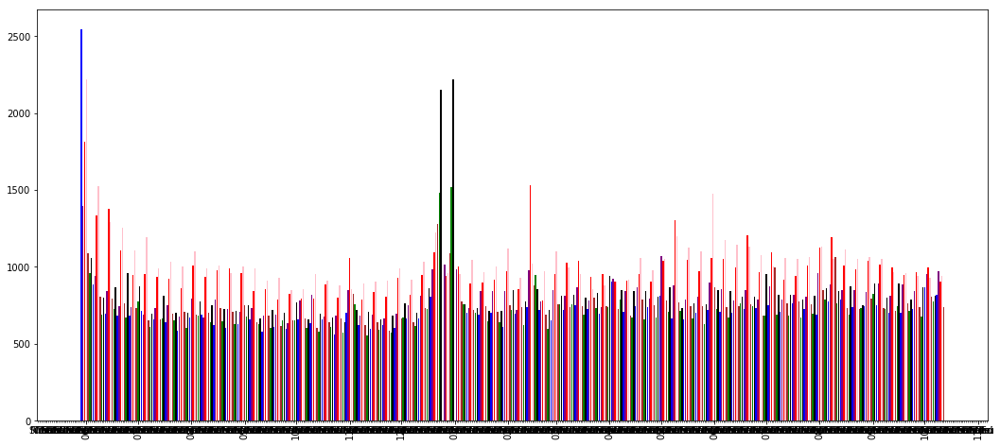

In [23]:
import matplotlib.dates as mdates
from matplotlib.dates import DateFormatter, DayLocator, MonthLocator

df_transactions['ddate'] = pd.to_datetime(df_transactions['date'])
store_transactions = df_transactions[df_transactions['store_nbr']== 53][0:500]
# colors = ['red', 'green', 'black', 'blue', 'purple', 'brown', 'red']
fig, ax = plt.subplots()
# fig.figure(figsize = [12,8])
days = DayLocator()

colors = ['brown', 'green', 'black', 'blue', 'purple', 'red', 'pink']
color_list = [colors[d] for d in store_transactions['ddate'].dt.dayofweek]

ax.bar(store_transactions['ddate'], store_transactions['transactions'], color = color_list);

ax.xaxis.set_major_locator(MonthLocator())
ax.xaxis.set_major_formatter(mdates.DateFormatter('%m'))
ax.xaxis.set_minor_formatter(mdates.DateFormatter('%a'))
ax.xaxis.set_minor_locator(days)
# ax.figure(figsize = [12,8])
#ax.xaxis.
# labels = ax.get_xticklabels()
ax.xaxis_date()
plt.setp(ax.get_xticklabels(), rotation=90, fontsize=10)
fig.set_size_inches(18,8)

In [24]:
# plt.boxplot(store_52_transactions)
#store_52_transactions.groupby(store_52_transactions['ddate'].dt.dayofweek).sum()
store_transactions['dow'] = store_transactions['ddate'].dt.dayofweek

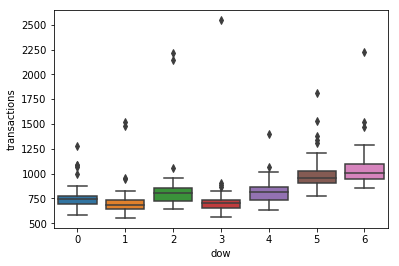

In [25]:
# plt.boxplot(store_52_transactions['transactions'], labels = store_52_transactions['dow'])
sns.boxplot(store_transactions['dow'], store_transactions['transactions'])

In [26]:
df_store_trans =pd.merge(df_stores, df_transactions, on= 'store_nbr') 
df_store_trans_hols =pd.merge(df_store_trans, df_holidays_events, left_on= ['city', 'date'], 
                              right_on=['locale_name', 'date'], how = 'left')



# df_store_trans_hols =pd.merge(df_store_trans, df_holidays_events, left_on= ['city', 'date'], 
#                               right_on=['locale_name', 'date'], how = 'left')


In [27]:
df_store_trans_hols[df_store_trans_hols['locale'].notnull()]
df_store_trans_hols[(df_store_trans_hols['locale'].notnull()) & (df_store_trans_hols['locale']=='Local')]

,store_nbr,city,state,type_x,cluster,date,transactions,ddate,type_y,locale,locale_name,description,transferred
337,1,Quito,Pichincha,D,13,2013-12-05,1930,2013-12-05,Additional,Local,Quito,Fundacion de Quito-1,False
338,1,Quito,Pichincha,D,13,2013-12-06,506,2013-12-06,Holiday,Local,Quito,Fundacion de Quito,False
700,1,Quito,Pichincha,D,13,2014-12-05,2028,2014-12-05,Additional,Local,Quito,Fundacion de Quito-1,False
701,1,Quito,Pichincha,D,13,2014-12-06,1065,2014-12-06,Holiday,Local,Quito,Fundacion de Quito,False
1062,1,Quito,Pichincha,D,13,2015-12-05,1294,2015-12-05,Additional,Local,Quito,Fundacion de Quito-1,False
1063,1,Quito,Pichincha,D,13,2015-12-06,532,2015-12-06,Holiday,Local,Quito,Fundacion de Quito,False
1424,1,Quito,Pichincha,D,13,2016-12-05,1887,2016-12-05,Additional,Local,Quito,Fundacion de Quito-1,False
1425,1,Quito,Pichincha,D,13,2016-12-06,523,2016-12-06,Holiday,Local,Quito,Fundacion de Quito,False
2013,2,Quito,Pichincha,D,13,2013-12-05,1983,2013-12-05,Additional,Local,Quito,Fundacion de Quito-1,False
2014,2,Quito,Pichincha,D,13,2013-12-06,1884,2013-12-06,Holiday,Local,Quito,Fundacion de Quito,False


In [28]:
national_hols = df_holidays_events[df_holidays_events['locale']=='National']

#remove transferred hols (these are actually work days)
national_hols = national_hols[~national_hols['transferred']]
#remove Work Days
national_hols = national_hols[~(national_hols['type'] == 'Work Day')]
# get rid of duplicated National holiday dates
national_hols = national_hols.drop_duplicates('date')
#national_hols[national_hols_index.index]
# national_hols = national_hols[(pd.to_datetime(national_hols['date'])>=datetime.datetime(2013,1,1)) & 
#                               (pd.to_datetime(national_hols['date'])<datetime.datetime(2014,1,1))]
# remove Additional holidays
national_hols = national_hols[~(national_hols['type']== 'Additional')]
national_hols.head()
national_hols['ddate']=pd.to_datetime(national_hols['date'])
df_store_trans['nat_hol'] = df_store_trans['ddate'].isin ([d for d in national_hols['ddate']])


#datetime.time(0, 0, 0) < df.time() < datetime.time(7, 59, 59)

In [29]:
national_hols#['ddate']

,date,type,locale,locale_name,description,transferred,ddate
14,2012-08-10,Holiday,National,Ecuador,Primer Grito de Independencia,False,2012-08-10
20,2012-10-12,Transfer,National,Ecuador,Traslado Independencia de Guayaquil,False,2012-10-12
21,2012-11-02,Holiday,National,Ecuador,Dia de Difuntos,False,2012-11-02
22,2012-11-03,Holiday,National,Ecuador,Independencia de Cuenca,False,2012-11-03
35,2012-12-24,Bridge,National,Ecuador,Puente Navidad,False,2012-12-24
37,2012-12-25,Holiday,National,Ecuador,Navidad,False,2012-12-25
39,2012-12-31,Bridge,National,Ecuador,Puente Primer dia del ano,False,2012-12-31
41,2013-01-01,Holiday,National,Ecuador,Primer dia del ano,False,2013-01-01
44,2013-02-11,Holiday,National,Ecuador,Carnaval,False,2013-02-11
45,2013-02-12,Holiday,National,Ecuador,Carnaval,False,2013-02-12


In [414]:
for d in national_hols['ddate']:
#     print( d)
    test = df_store_trans['ddate']-d.days
    if test == 0:
        print(d)


#[350:367]

AttributeError: 'Series' object has no attribute 'days'

In [30]:
global_dates = pd.DataFrame()
global_dates['all_dates'] = pd.date_range(start = '2012-1-1', end = '2017-10-11', freq='D') # pd.DataFrame()
#  for d in national_hols['ddate']:
#     print(global_dates['all_dates']-)
#     nat_hols_7 = pd.date_range(start = d-7, end = d, freq='D')
# #global_dates[0:15]
global_dates['all_dates']

0      2012-01-01
1      2012-01-02
2      2012-01-03
3      2012-01-04
4      2012-01-05
5      2012-01-06
6      2012-01-07
7      2012-01-08
8      2012-01-09
9      2012-01-10
10     2012-01-11
11     2012-01-12
12     2012-01-13
13     2012-01-14
14     2012-01-15
15     2012-01-16
16     2012-01-17
17     2012-01-18
18     2012-01-19
19     2012-01-20
20     2012-01-21
21     2012-01-22
22     2012-01-23
23     2012-01-24
24     2012-01-25
25     2012-01-26
26     2012-01-27
27     2012-01-28
28     2012-01-29
29     2012-01-30
          ...    
2081   2017-09-12
2082   2017-09-13
2083   2017-09-14
2084   2017-09-15
2085   2017-09-16
2086   2017-09-17
2087   2017-09-18
2088   2017-09-19
2089   2017-09-20
2090   2017-09-21
2091   2017-09-22
2092   2017-09-23
2093   2017-09-24
2094   2017-09-25
2095   2017-09-26
2096   2017-09-27
2097   2017-09-28
2098   2017-09-29
2099   2017-09-30
2100   2017-10-01
2101   2017-10-02
2102   2017-10-03
2103   2017-10-04
2104   2017-10-05
2105   201

In [31]:
for i in national_hols['ddate']:
    print(i)

2012-08-10 00:00:00
2012-10-12 00:00:00
2012-11-02 00:00:00
2012-11-03 00:00:00
2012-12-24 00:00:00
2012-12-25 00:00:00
2012-12-31 00:00:00
2013-01-01 00:00:00
2013-02-11 00:00:00
2013-02-12 00:00:00
2013-04-29 00:00:00
2013-05-01 00:00:00
2013-05-12 00:00:00
2013-05-24 00:00:00
2013-08-10 00:00:00
2013-10-11 00:00:00
2013-11-02 00:00:00
2013-11-03 00:00:00
2013-12-25 00:00:00
2014-01-01 00:00:00
2014-03-03 00:00:00
2014-03-04 00:00:00
2014-04-18 00:00:00
2014-05-01 00:00:00
2014-05-11 00:00:00
2014-05-24 00:00:00
2014-06-12 00:00:00
2014-06-15 00:00:00
2014-06-20 00:00:00
2014-06-25 00:00:00
2014-06-28 00:00:00
2014-06-29 00:00:00
2014-06-30 00:00:00
2014-07-01 00:00:00
2014-07-04 00:00:00
2014-07-05 00:00:00
2014-07-08 00:00:00
2014-07-09 00:00:00
2014-07-12 00:00:00
2014-07-13 00:00:00
2014-08-10 00:00:00
2014-10-10 00:00:00
2014-11-02 00:00:00
2014-11-03 00:00:00
2014-11-28 00:00:00
2014-12-01 00:00:00
2014-12-25 00:00:00
2014-12-26 00:00:00
2015-01-01 00:00:00
2015-01-02 00:00:00


In [486]:
test = national_hols['ddate']


14    2012-08-10
20    2012-10-12
21    2012-11-02
22    2012-11-03
35    2012-12-24
37    2012-12-25
39    2012-12-31
41    2013-01-01
44    2013-02-11
45    2013-02-12
51    2013-04-29
52    2013-05-01
55    2013-05-12
56    2013-05-24
67    2013-08-10
73    2013-10-11
74    2013-11-02
75    2013-11-03
89    2013-12-25
92    2014-01-01
94    2014-03-03
95    2014-03-04
99    2014-04-18
101   2014-05-01
103   2014-05-11
105   2014-05-24
106   2014-06-12
107   2014-06-15
108   2014-06-20
113   2014-06-25
         ...    
244   2016-05-08
246   2016-05-09
247   2016-05-10
248   2016-05-11
250   2016-05-12
251   2016-05-13
252   2016-05-14
253   2016-05-15
254   2016-05-16
256   2016-05-27
269   2016-08-12
274   2016-10-09
275   2016-11-02
276   2016-11-03
277   2016-11-04
284   2016-11-25
285   2016-11-28
294   2016-12-25
298   2017-01-02
299   2017-02-27
300   2017-02-28
306   2017-04-14
308   2017-05-01
311   2017-05-14
313   2017-05-26
325   2017-08-11
331   2017-10-09
332   2017-11-

In [475]:
global_dates['holiday_proximity']=99999

In [490]:

for i, h in enumerate(national_hols['ddate']):
    v = 1
    print(i)
    global_dates['holiday_proximity'][(global_dates['all_dates']<= test.reset_index(drop=True)[i]) & (global_dates['all_dates']>= test.reset_index(drop=True)[i]- datetime.timedelta(days=7))] = v

0
1


C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:5: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy



2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117


## ARIMA

In [500]:
from statsmodels.tsa.arima_model import ARIMA
from statsmodels.tsa.statespace.sarimax import SARIMAX
from pandas.plotting import autocorrelation_plot
from statsmodels.tsa.stattools import adfuller, acf, pacf,arma_order_select_ic

In [599]:
ser_data = df_transactions[df_transactions['store_nbr']==47]['transactions'].values
dates = pd.to_datetime(df_transactions[df_transactions['store_nbr']==47]['date'])
ts = pd.Series(ser_data, index = dates, dtype = 'float64')
ts


date
2013-01-02    4161.0
2013-01-03    3660.0
2013-01-04    3915.0
2013-01-05    4764.0
2013-01-06    4935.0
2013-01-07    3570.0
2013-01-08    3185.0
2013-01-09    3370.0
2013-01-10    2982.0
2013-01-11    3312.0
2013-01-12    4278.0
2013-01-13    4796.0
2013-01-14    3145.0
2013-01-15    3305.0
2013-01-16    3406.0
2013-01-17    3217.0
2013-01-18    3302.0
2013-01-19    4377.0
2013-01-20    4877.0
2013-01-21    3335.0
2013-01-22    2973.0
2013-01-23    3207.0
2013-01-24    2738.0
2013-01-25    3213.0
2013-01-26    4363.0
2013-01-27    4641.0
2013-01-28    3150.0
2013-01-29    2939.0
2013-01-30    3258.0
2013-01-31    3294.0
               ...  
2017-07-17    3720.0
2017-07-18    3344.0
2017-07-19    3492.0
2017-07-20    3663.0
2017-07-21    3924.0
2017-07-22    4218.0
2017-07-23    4368.0
2017-07-24    3550.0
2017-07-25    3267.0
2017-07-26    3503.0
2017-07-27    3114.0
2017-07-28    3752.0
2017-07-29    4340.0
2017-07-30    4353.0
2017-07-31    3775.0
2017-08-01    3846.0
2017-08-

In [600]:
ts.iloc[9].dtype

dtype('float64')

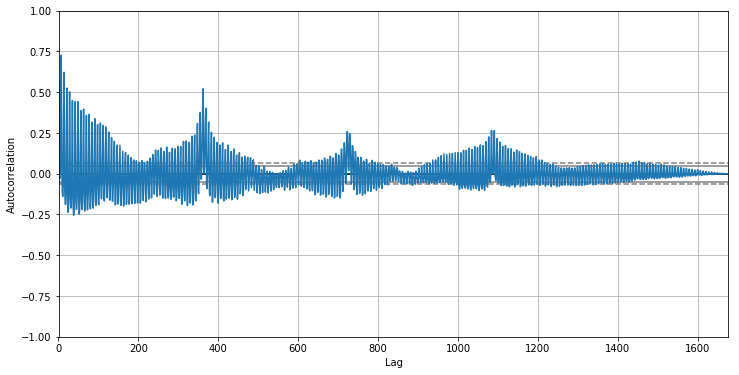

In [601]:
#ts=df_transactions[df_transactions['store_nbr']==47]['transactions']
plt.figure(figsize=(12,6))
autocorrelation_plot(ts);

In [697]:
len(ts)

1677

C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\base\model.py:496: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals



,count,mean,std,min,25%,50%,75%,max
0,1672.0,-0.724404,359.76891,-2751.939395,-184.199315,-23.428667,162.043541,2586.253533


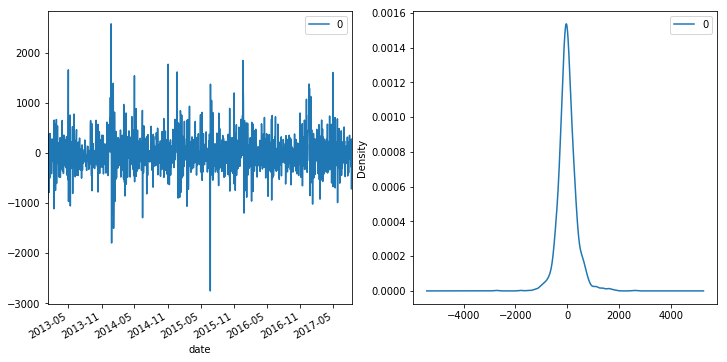

In [700]:
pdq=(5,0,5)
model = ARIMA(ts, order = pdq, freq='M')
model_fit = model.fit(disp=False,method='css',maxiter=100)
# plot residual errors
residuals = pd.DataFrame(model_fit.resid) 
fig,axes = plt.subplots(nrows=1, ncols=2,figsize=(12,6))
residuals.plot(ax=axes[0])
residuals.plot(kind='kde',ax=axes[1]);
residuals.describe().T

In [603]:
forecast_len=30
size = int(len(ts)-forecast_len)
train, test = ts[0:size], ts[size:len(ts)]
history = [x for x in train]
predictions = list()

print('Starting the ARIMA predictions...')
print('\n')
for t in range(len(test)):
    model = ARIMA(history, order = pdq, freq='W');
    model_fit = model.fit(disp=0);
    output = model_fit.forecast()
    yhat = output[0]
    predictions.append(float(yhat))
    obs = test[t]
    history.append(obs)
print('Predictions finished.\n')

Starting the ARIMA predictions...




C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\base\model.py:496: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals

C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\base\model.py:496: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals

C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\base\model.py:496: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals

C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\base\model.py:496: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals

C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\base\model.py:496: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals

C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\base\model.py:496: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals

C:\P

Predictions finished.



C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\base\model.py:496: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals



In [615]:
type(ts)

pandas.core.series.Series

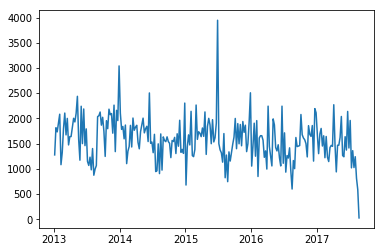

In [628]:
res = ts.resample('W').max()-ts.resample('W').min()
plt.plot(res)

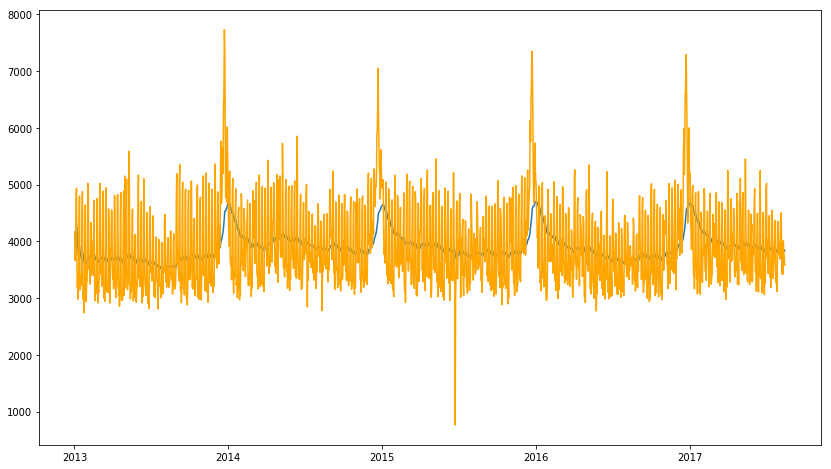

In [657]:
plt.figure(figsize=[14,8])
r = ts.rolling(window = 20)
# plt.plot(r.max())
plt.plot(ts.ewm(span=60,).mean())
plt.plot(ts, c='orange')

In [675]:
from statsmodels.tsa import stattools
acf_results = stattools.acf(ts,nlags = 400)

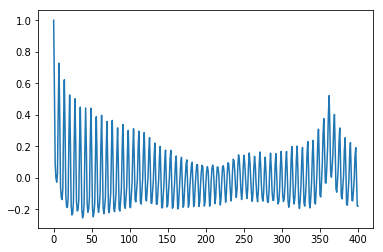

In [676]:
plt.plot(acf_results)

In [681]:
test = ts.copy()

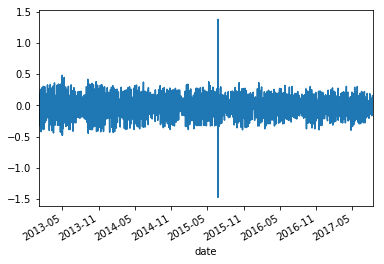

In [691]:
log_test = np.log(test)
test_diff = log_test - log_test.shift()
test_diff.plot()

In [692]:
test_diff.dropna(inplace=True)

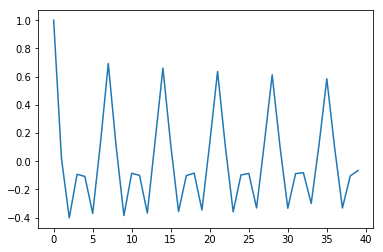

In [694]:
acf = stattools.acf(test_diff, nlags=700)
plt.plot(acf[0:40])

In [476]:
global_dates['holiday_proximity'][(global_dates['all_dates']<= test[20]) & (global_dates['all_dates']>= test[20]- datetime.timedelta(days=7))]

278    99999
279    99999
280    99999
281    99999
282    99999
283    99999
284    99999
285    99999
Name: holiday_proximity, dtype: int64

In [491]:
national_hols

,date,type,locale,locale_name,description,transferred,ddate
14,2012-08-10,Holiday,National,Ecuador,Primer Grito de Independencia,False,2012-08-10
20,2012-10-12,Transfer,National,Ecuador,Traslado Independencia de Guayaquil,False,2012-10-12
21,2012-11-02,Holiday,National,Ecuador,Dia de Difuntos,False,2012-11-02
22,2012-11-03,Holiday,National,Ecuador,Independencia de Cuenca,False,2012-11-03
35,2012-12-24,Bridge,National,Ecuador,Puente Navidad,False,2012-12-24
37,2012-12-25,Holiday,National,Ecuador,Navidad,False,2012-12-25
39,2012-12-31,Bridge,National,Ecuador,Puente Primer dia del ano,False,2012-12-31
41,2013-01-01,Holiday,National,Ecuador,Primer dia del ano,False,2013-01-01
44,2013-02-11,Holiday,National,Ecuador,Carnaval,False,2013-02-11
45,2013-02-12,Holiday,National,Ecuador,Carnaval,False,2013-02-12


In [458]:
import timeit
timeit.timeit('test[20]- datetime.timedelta(days=2)', number=1, setup="from __main__ import datetime, test")
# test[20]- datetime.timedelta(days=2)

9.436001889184809e-05

In [465]:
test[20]- datetime.timedelta(days=2)

Timestamp('2012-10-10 00:00:00')

In [ ]:
df['date1']=df['date']+pd.Timedelta(df['date'].dt.day-df['day'])

In [438]:
test[20]-datetime.1

ValueError: Cannot add integral value to Timestamp without freq.

In [396]:
df_store_trans['ddate'][0]

Timestamp('2013-01-02 00:00:00')

In [386]:
df_store_trans

,store_nbr,city,state,type,cluster,date,transactions,ddate,dow,nat_hol
0,1,Quito,Pichincha,D,13,2013-01-02,2111,2013-01-02,2,False
1,1,Quito,Pichincha,D,13,2013-01-03,1833,2013-01-03,3,False
2,1,Quito,Pichincha,D,13,2013-01-04,1863,2013-01-04,4,False
3,1,Quito,Pichincha,D,13,2013-01-05,1509,2013-01-05,5,False
4,1,Quito,Pichincha,D,13,2013-01-06,520,2013-01-06,6,False
5,1,Quito,Pichincha,D,13,2013-01-07,1807,2013-01-07,0,False
6,1,Quito,Pichincha,D,13,2013-01-08,1869,2013-01-08,1,False
7,1,Quito,Pichincha,D,13,2013-01-09,1910,2013-01-09,2,False
8,1,Quito,Pichincha,D,13,2013-01-10,1679,2013-01-10,3,False
9,1,Quito,Pichincha,D,13,2013-01-11,1813,2013-01-11,4,False


In [384]:
national_hols

,date,type,locale,locale_name,description,transferred,ddate
14,2012-08-10,Holiday,National,Ecuador,Primer Grito de Independencia,False,2012-08-10
20,2012-10-12,Transfer,National,Ecuador,Traslado Independencia de Guayaquil,False,2012-10-12
21,2012-11-02,Holiday,National,Ecuador,Dia de Difuntos,False,2012-11-02
22,2012-11-03,Holiday,National,Ecuador,Independencia de Cuenca,False,2012-11-03
35,2012-12-24,Bridge,National,Ecuador,Puente Navidad,False,2012-12-24
37,2012-12-25,Holiday,National,Ecuador,Navidad,False,2012-12-25
39,2012-12-31,Bridge,National,Ecuador,Puente Primer dia del ano,False,2012-12-31
41,2013-01-01,Holiday,National,Ecuador,Primer dia del ano,False,2013-01-01
44,2013-02-11,Holiday,National,Ecuador,Carnaval,False,2013-02-11
45,2013-02-12,Holiday,National,Ecuador,Carnaval,False,2013-02-12


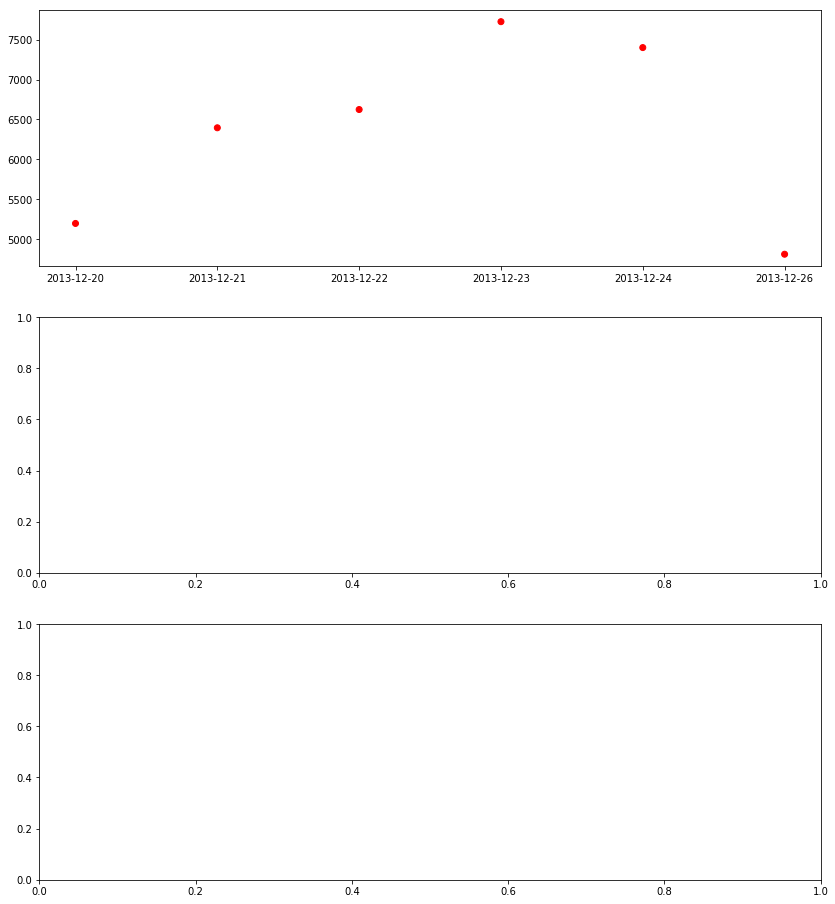

In [383]:
# df_store_trans[df_store_trans['nat_hol']]
colors = ['red', 'green']#, 'black', 'blue', 'purple', 'red', 'pink']
color_list = [colors[tf] for tf in df_store_trans['nat_hol']]


fig, ax = plt.subplots(3,1, figsize=(14,16))
df_storeX_trans = df_store_trans[df_store_trans['store_nbr']==47][352:358]
ax[0].scatter(df_storeX_trans['date'], df_storeX_trans['transactions'], c= color_list);
# plt.scatter()

# fig, ax = plt.subplots(28,2, figsize=(12,185))
# df_transactions['ddate'] = pd.to_datetime(df_transactions['date'])
# df_transactions['dow'] = df_transactions['ddate'].dt.dayofweek
# for s in range(1,53):
#     store_transactions = df_transactions[df_transactions['store_nbr']== s]#[0:427]
#     if s%2 == 0:
#         x = int(s/2)
#         y = 0
#     else:
#         x = int((s-1)/2)
#         y=1
#     #print(x,y)
#     sns.boxplot(store_transactions['dow'], store_transactions['transactions'], ax=ax[x,y]);


In [340]:
# test = df_transactions[0:1000]
# traces = []
# name = 'PCA'
# colorscale = 'Portland'
# X = test['ddate']
# Y = test['transactions']
# Z = test ['store_nbr']
# C = test['dow']
# trace = go.Scatter3d(
#     x=X, #[0,1,2,3,4],#Y_sklearn[:,0],
#     y=Y, #[2,3,5,5,6],#Y_sklearn[:,1],
#     z=Z, #[20,30,50,50,60], #Y_sklearn[:,2],
#     mode='marker',
#     name=name,
#     marker=go.Marker(
#         size=5,
#         color=C,
#         colorscale=colorscale,
# #         line=Line(
# #             #color='rgba(217, 217, 217, 0.14)',
# # #             color=C,
# #             colorscale=colorscale,
# #             width=0.5),
#         opacity=0
#     )
# )
# traces.append(trace)
# data = Data(traces)
# layout = go.Layout(
#     margin=dict(l=0, r=0, b=0, t=0),
#         scene=Scene(
#         xaxis=XAxis(title='Date'),
#         yaxis=YAxis(title='Trans'),
#         zaxis=ZAxis(title='Store Nbr')
#     )
# )
# fig = Figure(data=data, layout=layout)
# plotly.offline.iplot(fig)

## Boxplot to see day-of-week variation in number of transactions

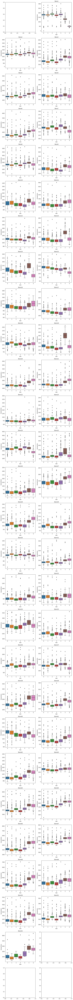

In [208]:
fig, ax = plt.subplots(28,2, figsize=(12,185))
df_transactions['ddate'] = pd.to_datetime(df_transactions['date'])
df_transactions['dow'] = df_transactions['ddate'].dt.dayofweek
for s in range(1,53):
    store_transactions = df_transactions[df_transactions['store_nbr']== s]#[0:427]
    if s%2 == 0:
        x = int(s/2)
        y = 0
    else:
        x = int((s-1)/2)
        y=1
    #print(x,y)
    sns.boxplot(store_transactions['dow'], store_transactions['transactions'], ax=ax[x,y]);
    ax[x,y].set_title('Store' + str(s))

In [192]:
for s in range(0,10):
    if s%2 == 0:
        x = int(s/2)
        y = 0
    else:
        x = int((s-1)/2)
        y=1
    print('{},{}'.format(x,y))

0,0
0,1
1,0
1,1
2,0
2,1
3,0
3,1
4,0
4,1


In [41]:
for s in range(0,10):
    if s%2 == 0:
        x = int(s/2)
        y = 0
    else:
        x = int((s-1)/2)
        y=1
    print('{},{}'.format(x,y))

In [42]:
test_row_count

3370465